## Bidirectional LSTM model na predikciu hodnot DST o 1 hodinu dopredu na zaklade 6-hodinoveho vstupneho okna z atributu DST

Subor: prediction_DST+1_6H.ipynb

Program: Hospodarska informatika

Vypracovala: Bc. Terezia Drengubiakova

Diplomova praca: Metody strojoveho ucenia pre vcasnu predikciu geomagnetickych burok

Veduci diplomovej prace: doc. Ing. Peter Butka, PhD.

Konzultanti: Ing. Viera Kresnakova, PhD., RNDr. Simon Mackovjak, PhD.

### Import knižníc

In [1]:
import pandas as pd
import numpy as np
import os
from tensorflow import keras
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator
from keras.models import Model
from keras.layers import Dense, Input, LSTM, Flatten, TimeDistributed, Bidirectional
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C
from sklearn.metrics import confusion_matrix, classification_report, matthews_corrcoef, mean_squared_error, mean_absolute_error
from sklearn.preprocessing import StandardScaler

2026-04-25 08:16:30.300142: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Načítanie dát, odstránenie na hodnôt, určenie predikovaného atribútu

In [2]:
# dĺžka vstupného okna a predikovaný čas
shift = 1
y_col = f"DST+{shift}"

n_input = 6
atr_count = 1

In [3]:
file_path = "../../../0_datasety/test_omni.csv"
file_path2 = "../../../0_datasety/train_omni.csv"

train = pd.read_csv(file_path2)
test = pd.read_csv(file_path)

In [4]:
features = ['time1', 'DST', y_col]
test = test[features]
train = train[features]
train['time1']=pd.to_datetime(train['time1'])
test['time1']=pd.to_datetime(test['time1'])


valid_size = int(len(train) * 0.2)
valid = train.iloc[-valid_size:,:].copy()
train = train.iloc[:-valid_size,:].copy()

y_train_raw = train[y_col].values.copy()
X_train_raw = train['DST'].values.copy()
y_val_raw = valid[y_col].values.copy()
X_val_raw = valid['DST'].values.copy()
y_test_raw = test[y_col].values.copy()
X_test_raw = test['DST'].values.copy()

x_scaler = StandardScaler()
y_scaler = StandardScaler()

X_train = x_scaler.fit_transform(np.asarray(X_train_raw, dtype=np.float32).reshape(len(X_train_raw), -1))
X_val = x_scaler.transform(np.asarray(X_val_raw, dtype=np.float32).reshape(len(X_val_raw), -1))
X_test = x_scaler.transform(np.asarray(X_test_raw, dtype=np.float32).reshape(len(X_test_raw), -1))

y_train = y_scaler.fit_transform(np.asarray(y_train_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_val = y_scaler.transform(np.asarray(y_val_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)
y_test = y_scaler.transform(np.asarray(y_test_raw, dtype=np.float32).reshape(-1, 1)).reshape(-1)

target_scale = float(y_scaler.scale_[0])

def inverse_target(values):
    values = np.asarray(values, dtype=np.float32)
    return y_scaler.inverse_transform(values.reshape(-1, 1)).reshape(values.shape)

### Definícia premenných a vytvorenie dátových generátorov

In [5]:
b_size = 256  

train_generator = TimeseriesGenerator(X_train, y_train, length=n_input, batch_size=b_size)
val_generator = TimeseriesGenerator(X_val, y_val, length=n_input, batch_size=b_size)
test_generator = TimeseriesGenerator(X_test, y_test, length=n_input, batch_size=256)

In [6]:
print("Počet batchov: ", len(train_generator))
print("Každý batch má features (X zložku) a labels (y zložku): ", len(train_generator[0]))
print("Dĺžka X zložky batchu: ", len(train_generator[0][0]))
print("Dĺžka y zložky batchu (počet meraní v batchi): ",len(train_generator[0][1]))
print("Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu): ", len(train_generator[0][0][0]))

Počet batchov:  896
Každý batch má features (X zložku) a labels (y zložku):  2
Dĺžka X zložky batchu:  256
Dĺžka y zložky batchu (počet meraní v batchi):  256
Počet riadkov braných do úvahy pre jedno meranie (koľko sa pozerá dozadu):  6


### Vytvorenie modelu

In [7]:
inputs = Input(shape=(n_input,atr_count))
c = Bidirectional(LSTM(128, return_sequences=True, dropout=0.1,recurrent_dropout=0.1))(inputs)
c = LSTM(128, return_sequences=True)(c)
c = TimeDistributed(Dense(1, activation='linear'))(c)
output = Flatten()(c)
output = Dense(1, activation='linear')(output)
model = Model(inputs=inputs, outputs=output)
model.compile(loss='mse', optimizer='adam', metrics=["mae"])
print(model.summary())

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 6, 1)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ bidirectional (Bidirectional)        │ (None, 6, 256)              │         133,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 6, 128)              │         197,120 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ time_distributed (TimeDistributed)   │ (None, 6, 1)                │             129 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6)                   │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1)                   │               7 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 330,376 (1.26 MB)

 Trainable params: 330,376 (1.26 MB)

 Non-trainable params: 0 (0.00 B)

None


In [8]:
os.makedirs("models", exist_ok=True)
model_path = os.path.join("models", f'{y_col}_{n_input}H.keras')
checkpoint = ModelCheckpoint(model_path, monitor='val_mae', verbose=1, save_best_only=True, mode='min')
early = EarlyStopping(monitor="val_mae", mode="min", patience=25)
callbacks_list = [checkpoint, early]

### Trénovanie

In [9]:
#uncomment to train new model
history = model.fit(train_generator, validation_data=val_generator, epochs=200, verbose=1, callbacks = callbacks_list)

Epoch 1/200


/opt/conda/lib/python3.12/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:51:04 11s/step - loss: 1.8812 - mae: 0.8615

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 132ms/step - loss: 1.8315 - mae: 0.8416 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 1.6676 - mae: 0.8088

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 122ms/step - loss: 1.5375 - mae: 0.7895

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 1.4371 - mae: 0.7706

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 1.3523 - mae: 0.7516

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 1.2853 - mae: 0.7381

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 1.2467 - mae: 0.7307

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 1.2091 - mae: 0.7220

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 1.1736 - mae: 0.7126

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 1.1392 - mae: 0.7028

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 1.1080 - mae: 0.6934

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 1.0780 - mae: 0.6836

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 1.0617 - mae: 0.6765

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 1.0442 - mae: 0.6687

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 1.0268 - mae: 0.6612

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 1.0099 - mae: 0.6543

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.9932 - mae: 0.6474

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.9776 - mae: 0.6412

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.9628 - mae: 0.6357

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.9490 - mae: 0.6306

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.9357 - mae: 0.6258

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.9225 - mae: 0.6208

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.9095 - mae: 0.6158

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.8972 - mae: 0.6111

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.8857 - mae: 0.6065

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.8745 - mae: 0.6020

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.8635 - mae: 0.5977

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.8528 - mae: 0.5934

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.8424 - mae: 0.5892

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.8323 - mae: 0.5850

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.8225 - mae: 0.5810

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.8130 - mae: 0.5769

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.8037 - mae: 0.5729

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.7946 - mae: 0.5690

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.7857 - mae: 0.5652

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.7770 - mae: 0.5614

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.7685 - mae: 0.5576

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.7603 - mae: 0.5539

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.7522 - mae: 0.5503

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.7443 - mae: 0.5467

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.7367 - mae: 0.5432

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.7292 - mae: 0.5398

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.7220 - mae: 0.5365

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.7149 - mae: 0.5333

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.7080 - mae: 0.5301

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.7012 - mae: 0.5270

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.6946 - mae: 0.5239

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.6882 - mae: 0.5210

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.6819 - mae: 0.5181

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.6758 - mae: 0.5153

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.6699 - mae: 0.5125

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.6642 - mae: 0.5099

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.6586 - mae: 0.5072

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.6531 - mae: 0.5047

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.6478 - mae: 0.5022

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.6425 - mae: 0.4997

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.6373 - mae: 0.4973

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.6323 - mae: 0.4949

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.6273 - mae: 0.4925

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.6225 - mae: 0.4902

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.6177 - mae: 0.4879

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.6130 - mae: 0.4857

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.6085 - mae: 0.4835

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.6047 - mae: 0.4815

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.6010 - mae: 0.4796

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.5974 - mae: 0.4777

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.5939 - mae: 0.4758

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.5905 - mae: 0.4740

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.5871 - mae: 0.4723

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.5838 - mae: 0.4706

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.5809 - mae: 0.4691

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.5781 - mae: 0.4676

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.5752 - mae: 0.4661

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.5724 - mae: 0.4646

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.5697 - mae: 0.4632

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.5671 - mae: 0.4618

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.5645 - mae: 0.4604

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.5619 - mae: 0.4590

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.5593 - mae: 0.4577

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.5568 - mae: 0.4564

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.5543 - mae: 0.4551

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.5518 - mae: 0.4538

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.5494 - mae: 0.4525

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.5473 - mae: 0.4513

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.5452 - mae: 0.4502

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.5431 - mae: 0.4490

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.5410 - mae: 0.4479

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.5389 - mae: 0.4468

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.5369 - mae: 0.4457

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.5349 - mae: 0.4445

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.5329 - mae: 0.4435

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.5309 - mae: 0.4424

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.5289 - mae: 0.4413

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.5270 - mae: 0.4403

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.5250 - mae: 0.4392

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.5231 - mae: 0.4382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.5212 - mae: 0.4372

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.5194 - mae: 0.4362

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.5176 - mae: 0.4352

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.5158 - mae: 0.4343

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.5140 - mae: 0.4333

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.5122 - mae: 0.4324

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.5104 - mae: 0.4314

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.5087 - mae: 0.4305

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.5070 - mae: 0.4296

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.5053 - mae: 0.4287

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.5035 - mae: 0.4278

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.5019 - mae: 0.4269

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.5002 - mae: 0.4260

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.4985 - mae: 0.4251

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.4969 - mae: 0.4242

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.4953 - mae: 0.4233

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.4937 - mae: 0.4225

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.4921 - mae: 0.4216

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.4905 - mae: 0.4208

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.4889 - mae: 0.4199

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.4873 - mae: 0.4191

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.4858 - mae: 0.4183

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.4842 - mae: 0.4175

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.4827 - mae: 0.4166

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.4812 - mae: 0.4158

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.4796 - mae: 0.4150

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.4781 - mae: 0.4142

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.4766 - mae: 0.4134

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.4752 - mae: 0.4126

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.4737 - mae: 0.4118

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.4722 - mae: 0.4111

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.4708 - mae: 0.4103

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.4694 - mae: 0.4096

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.4680 - mae: 0.4088

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4665 - mae: 0.4081

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4651 - mae: 0.4073

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4638 - mae: 0.4066

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4625 - mae: 0.4059

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4611 - mae: 0.4052

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4598 - mae: 0.4044

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4585 - mae: 0.4038

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4573 - mae: 0.4031

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.4560 - mae: 0.4024

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.4547 - mae: 0.4017

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.4535 - mae: 0.4010

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4523 - mae: 0.4004

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4510 - mae: 0.3997

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4498 - mae: 0.3991

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4486 - mae: 0.3984

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4474 - mae: 0.3978

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4463 - mae: 0.3971

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4451 - mae: 0.3965

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.4439 - mae: 0.3959

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4427 - mae: 0.3952

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4416 - mae: 0.3946

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4405 - mae: 0.3940

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4393 - mae: 0.3934

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4382 - mae: 0.3928

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4371 - mae: 0.3922

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.4360 - mae: 0.3916

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4349 - mae: 0.3910

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.4338 - mae: 0.3905

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.4327 - mae: 0.3899

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.4316 - mae: 0.3893

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.4306 - mae: 0.3887

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.4295 - mae: 0.3882

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.4285 - mae: 0.3876

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.4274 - mae: 0.3870

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.4264 - mae: 0.3865

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.4253 - mae: 0.3859

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.4243 - mae: 0.3854

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.4233 - mae: 0.3849

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.4223 - mae: 0.3843

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4213 - mae: 0.3838

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4203 - mae: 0.3833

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4193 - mae: 0.3827

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4183 - mae: 0.3822

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4174 - mae: 0.3817

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4164 - mae: 0.3812

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4154 - mae: 0.3807

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.4145 - mae: 0.3802

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.4135 - mae: 0.3797

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.4126 - mae: 0.3792

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.4116 - mae: 0.3787

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.4107 - mae: 0.3782

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.4098 - mae: 0.3777

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.4089 - mae: 0.3772

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.4079 - mae: 0.3767

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.4070 - mae: 0.3762

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.4061 - mae: 0.3758

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.4052 - mae: 0.3753

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.4044 - mae: 0.3748

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.4035 - mae: 0.3744

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.4026 - mae: 0.3739

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.4017 - mae: 0.3735

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.4009 - mae: 0.3730

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.4000 - mae: 0.3726

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.3992 - mae: 0.3721

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.3983 - mae: 0.3717

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.3975 - mae: 0.3712

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.3966 - mae: 0.3708

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3958 - mae: 0.3703

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3950 - mae: 0.3699

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3941 - mae: 0.3695

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3933 - mae: 0.3690

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3925 - mae: 0.3686

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3917 - mae: 0.3682

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3909 - mae: 0.3678

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3901 - mae: 0.3673

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.3893 - mae: 0.3669

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.3885 - mae: 0.3665

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.3878 - mae: 0.3661

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.3870 - mae: 0.3657

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.3862 - mae: 0.3653

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.3855 - mae: 0.3649

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.3848 - mae: 0.3645

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.3840 - mae: 0.3641

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.3833 - mae: 0.3638

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.3826 - mae: 0.3634

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.3818 - mae: 0.3630

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.3811 - mae: 0.3626

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.3804 - mae: 0.3622

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.3797 - mae: 0.3619

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.3790 - mae: 0.3615

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3783 - mae: 0.3611

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3776 - mae: 0.3607

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3768 - mae: 0.3604

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3762 - mae: 0.3600

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3755 - mae: 0.3596

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3748 - mae: 0.3593

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3741 - mae: 0.3589

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.3734 - mae: 0.3585

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.3727 - mae: 0.3582

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.3720 - mae: 0.3578

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.3714 - mae: 0.3575

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.3707 - mae: 0.3571

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.3700 - mae: 0.3568

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.3693 - mae: 0.3564

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.3687 - mae: 0.3560

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.3680 - mae: 0.3557

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.3674 - mae: 0.3553

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.3667 - mae: 0.3550

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.3661 - mae: 0.3546

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.3654 - mae: 0.3543

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.3648 - mae: 0.3540

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.3642 - mae: 0.3536

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.3635 - mae: 0.3533

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.3629 - mae: 0.3530

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.3623 - mae: 0.3526

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.3617 - mae: 0.3523

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.3610 - mae: 0.3520

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.3604 - mae: 0.3516

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.3598 - mae: 0.3513

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.3592 - mae: 0.3510

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.3586 - mae: 0.3507

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.3580 - mae: 0.3503

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.3574 - mae: 0.3500

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.3568 - mae: 0.3497

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.3562 - mae: 0.3494

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.3556 - mae: 0.3491

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.3551 - mae: 0.3488

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.3545 - mae: 0.3485

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.3539 - mae: 0.3482

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.3533 - mae: 0.3478

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.3528 - mae: 0.3475

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 153ms/step - loss: 0.3522 - mae: 0.3472

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.3516 - mae: 0.3469

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3511 - mae: 0.3466

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3505 - mae: 0.3463

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3499 - mae: 0.3460

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3494 - mae: 0.3457

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3488 - mae: 0.3455

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3483 - mae: 0.3452

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3477 - mae: 0.3449

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.3472 - mae: 0.3446

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.3467 - mae: 0.3443

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.3461 - mae: 0.3440

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.3456 - mae: 0.3437

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.3450 - mae: 0.3434

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.3445 - mae: 0.3432

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.3440 - mae: 0.3429

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.3434 - mae: 0.3426

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.3429 - mae: 0.3423

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.3424 - mae: 0.3420

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.3419 - mae: 0.3418

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.3414 - mae: 0.3415

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.3408 - mae: 0.3412

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.3403 - mae: 0.3410

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.3398 - mae: 0.3407

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.3393 - mae: 0.3404

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.3388 - mae: 0.3401

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.3383 - mae: 0.3399

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.3378 - mae: 0.3396

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.3373 - mae: 0.3393

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.3368 - mae: 0.3391

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.3363 - mae: 0.3388

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.3358 - mae: 0.3385

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.3353 - mae: 0.3383

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.3348 - mae: 0.3380

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.3343 - mae: 0.3378

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.3338 - mae: 0.3375

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.3333 - mae: 0.3373

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.3329 - mae: 0.3370

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.3324 - mae: 0.3367

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.3319 - mae: 0.3365

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.3315 - mae: 0.3362

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.3310 - mae: 0.3360

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.3305 - mae: 0.3358

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.3301 - mae: 0.3355

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.3296 - mae: 0.3353

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.3291 - mae: 0.3350

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.3287 - mae: 0.3348

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.3282 - mae: 0.3345

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.3278 - mae: 0.3343

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.3273 - mae: 0.3341

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.3269 - mae: 0.3338

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3264 - mae: 0.3336

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3260 - mae: 0.3333

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3255 - mae: 0.3331

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3251 - mae: 0.3329

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3246 - mae: 0.3326

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3242 - mae: 0.3324

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3237 - mae: 0.3322

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.3233 - mae: 0.3319

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3229 - mae: 0.3317

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3224 - mae: 0.3315

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3220 - mae: 0.3312

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3216 - mae: 0.3310

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3212 - mae: 0.3308

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.3207 - mae: 0.3306

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3203 - mae: 0.3303

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3199 - mae: 0.3301

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3195 - mae: 0.3299

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3190 - mae: 0.3297

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3186 - mae: 0.3294

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3182 - mae: 0.3292

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.3178 - mae: 0.3290

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.3174 - mae: 0.3288

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.3170 - mae: 0.3286

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.3166 - mae: 0.3284

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.3162 - mae: 0.3282

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.3158 - mae: 0.3279

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.3154 - mae: 0.3277

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.3150 - mae: 0.3275

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.3146 - mae: 0.3273

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.3142 - mae: 0.3271

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.3138 - mae: 0.3269

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.3134 - mae: 0.3267

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.3130 - mae: 0.3265

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.3126 - mae: 0.3263

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.3123 - mae: 0.3261

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.3119 - mae: 0.3259

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.3115 - mae: 0.3256

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.3111 - mae: 0.3254

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.3107 - mae: 0.3252

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.3103 - mae: 0.3250

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.3100 - mae: 0.3248

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.3096 - mae: 0.3246

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.3092 - mae: 0.3244

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.3088 - mae: 0.3242

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.3085 - mae: 0.3240

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.3081 - mae: 0.3238

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.3077 - mae: 0.3236

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.3073 - mae: 0.3234

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.3070 - mae: 0.3233

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.3066 - mae: 0.3231

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.3062 - mae: 0.3229

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.3059 - mae: 0.3227

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.3055 - mae: 0.3225

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.3052 - mae: 0.3223

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.3048 - mae: 0.3221

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.3044 - mae: 0.3219

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.3041 - mae: 0.3217

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.3037 - mae: 0.3215

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.3034 - mae: 0.3213

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.3030 - mae: 0.3212

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.3027 - mae: 0.3210

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.3023 - mae: 0.3208

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.3020 - mae: 0.3206

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.3016 - mae: 0.3204

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.3013 - mae: 0.3202

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.3009 - mae: 0.3200

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.3006 - mae: 0.3199

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.3003 - mae: 0.3197

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.2999 - mae: 0.3195

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.2996 - mae: 0.3193

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.2992 - mae: 0.3191

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.2989 - mae: 0.3190

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.2986 - mae: 0.3188

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.2982 - mae: 0.3186

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.2979 - mae: 0.3184

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.2976 - mae: 0.3183

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.2972 - mae: 0.3181

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.2969 - mae: 0.3179

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.2966 - mae: 0.3177

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.2962 - mae: 0.3176

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.2959 - mae: 0.3174

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.2956 - mae: 0.3172

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.2953 - mae: 0.3170

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.2949 - mae: 0.3169

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.2946 - mae: 0.3167

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.2943 - mae: 0.3165

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.2940 - mae: 0.3164

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.2937 - mae: 0.3162

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.2933 - mae: 0.3160

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.2930 - mae: 0.3158

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.2927 - mae: 0.3157

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.2924 - mae: 0.3155

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.2921 - mae: 0.3153

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.2918 - mae: 0.3152

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.2915 - mae: 0.3150

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.2912 - mae: 0.3148

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.2909 - mae: 0.3147

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.2905 - mae: 0.3145

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.2902 - mae: 0.3144

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.2899 - mae: 0.3142

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.2896 - mae: 0.3140

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.2893 - mae: 0.3139

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.2890 - mae: 0.3137

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.2887 - mae: 0.3135

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.2884 - mae: 0.3134

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.2881 - mae: 0.3132

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.2879 - mae: 0.3131

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.2876 - mae: 0.3129

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.2873 - mae: 0.3128

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.2870 - mae: 0.3126

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.2867 - mae: 0.3124

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.2864 - mae: 0.3123

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.2861 - mae: 0.3121

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.2858 - mae: 0.3120

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.2856 - mae: 0.3118

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.2853 - mae: 0.3117

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.2850 - mae: 0.3115

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.2847 - mae: 0.3114

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.2844 - mae: 0.3112

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.2842 - mae: 0.3111

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.2839 - mae: 0.3109

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.2836 - mae: 0.3108

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.2833 - mae: 0.3106

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.2831 - mae: 0.3105

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.2828 - mae: 0.3104

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.2825 - mae: 0.3102

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.2822 - mae: 0.3101

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.2820 - mae: 0.3099

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.2817 - mae: 0.3098

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.2814 - mae: 0.3096

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.2812 - mae: 0.3095

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.2809 - mae: 0.3094

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.2806 - mae: 0.3092

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.2804 - mae: 0.3091

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.2801 - mae: 0.3089

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.2799 - mae: 0.3088

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.2796 - mae: 0.3087

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.2793 - mae: 0.3085

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.2791 - mae: 0.3084

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.2788 - mae: 0.3082

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.2786 - mae: 0.3081

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.2783 - mae: 0.3080

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.2780 - mae: 0.3078

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.2778 - mae: 0.3077

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.2775 - mae: 0.3076

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.2773 - mae: 0.3074

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.2770 - mae: 0.3073

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.2768 - mae: 0.3071

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.2765 - mae: 0.3070

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.2763 - mae: 0.3069

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.2760 - mae: 0.3067

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.2757 - mae: 0.3066

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.2755 - mae: 0.3065

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.2752 - mae: 0.3063

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.2750 - mae: 0.3062

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.2748 - mae: 0.3061

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.2745 - mae: 0.3059

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.2743 - mae: 0.3058

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.2740 - mae: 0.3057

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.2738 - mae: 0.3055

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.2735 - mae: 0.3054

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.2733 - mae: 0.3053

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.2730 - mae: 0.3052

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.2728 - mae: 0.3050

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.2726 - mae: 0.3049

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.2723 - mae: 0.3048

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.2721 - mae: 0.3046

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.2718 - mae: 0.3045

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.2716 - mae: 0.3044

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.2714 - mae: 0.3042

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.2711 - mae: 0.3041

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.2709 - mae: 0.3040

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.2706 - mae: 0.3039

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.2704 - mae: 0.3037

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.2702 - mae: 0.3036

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.2699 - mae: 0.3035

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.2697 - mae: 0.3034

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.2695 - mae: 0.3032

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.2692 - mae: 0.3031

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.2690 - mae: 0.3030

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.2688 - mae: 0.3029

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.2685 - mae: 0.3027

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.2683 - mae: 0.3026

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.2681 - mae: 0.3025

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.2678 - mae: 0.3024

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.2676 - mae: 0.3022

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.2674 - mae: 0.3021

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.2672 - mae: 0.3020

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.2669 - mae: 0.3019

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.2667 - mae: 0.3017

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.2665 - mae: 0.3016

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.2663 - mae: 0.3015

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.2660 - mae: 0.3014

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.2658 - mae: 0.3013

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.2656 - mae: 0.3011

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.2654 - mae: 0.3010

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.2652 - mae: 0.3009

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.2649 - mae: 0.3008

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.2647 - mae: 0.3007 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.2645 - mae: 0.3005

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.2643 - mae: 0.3004

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.2641 - mae: 0.3003

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.2638 - mae: 0.3002

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.2636 - mae: 0.3001

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.2634 - mae: 0.2999

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.2632 - mae: 0.2998

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.2630 - mae: 0.2997

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.2628 - mae: 0.2996

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.2626 - mae: 0.2995

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.2623 - mae: 0.2994

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.2621 - mae: 0.2992

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.2619 - mae: 0.2991

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.2617 - mae: 0.2990

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.2615 - mae: 0.2989

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.2613 - mae: 0.2988

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.2611 - mae: 0.2987

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.2609 - mae: 0.2985

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.2607 - mae: 0.2984

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.2604 - mae: 0.2983

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.2602 - mae: 0.2982

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.2600 - mae: 0.2981

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.2598 - mae: 0.2980

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.2596 - mae: 0.2979

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.2594 - mae: 0.2977

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.2592 - mae: 0.2976

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.2590 - mae: 0.2975

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.2588 - mae: 0.2974

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.2586 - mae: 0.2973

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.2584 - mae: 0.2972

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.2582 - mae: 0.2971

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.2580 - mae: 0.2970

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.2578 - mae: 0.2969

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.2576 - mae: 0.2967

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.2574 - mae: 0.2966

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.2572 - mae: 0.2965

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.2570 - mae: 0.2964

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.2568 - mae: 0.2963

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.2566 - mae: 0.2962

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.2564 - mae: 0.2961

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.2562 - mae: 0.2960

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.2560 - mae: 0.2959

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.2558 - mae: 0.2958

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.2556 - mae: 0.2957

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.2554 - mae: 0.2955

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.2552 - mae: 0.2954

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.2550 - mae: 0.2953

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.2548 - mae: 0.2952

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.2547 - mae: 0.2951

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.2545 - mae: 0.2950

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.2543 - mae: 0.2949

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.2541 - mae: 0.2948

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.2539 - mae: 0.2947

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.2537 - mae: 0.2946

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.2535 - mae: 0.2945

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.2533 - mae: 0.2944

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.2531 - mae: 0.2943

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.2530 - mae: 0.2942

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.2528 - mae: 0.2941

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.2526 - mae: 0.2940

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.2524 - mae: 0.2939

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.2522 - mae: 0.2938

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.2521 - mae: 0.2937

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.2519 - mae: 0.2936

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.2517 - mae: 0.2935

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.2515 - mae: 0.2933

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.2513 - mae: 0.2932

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.2512 - mae: 0.2931

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.2510 - mae: 0.2930

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.2508 - mae: 0.2929

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.2506 - mae: 0.2928

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.2504 - mae: 0.2927

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.2503 - mae: 0.2926

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.2501 - mae: 0.2925

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.2499 - mae: 0.2924

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.2497 - mae: 0.2923

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.2496 - mae: 0.2922

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.2494 - mae: 0.2921

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.2492 - mae: 0.2921

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.2491 - mae: 0.2920

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.2489 - mae: 0.2919

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.2487 - mae: 0.2918

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.2486 - mae: 0.2917

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.2484 - mae: 0.2916

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.2482 - mae: 0.2915

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.2481 - mae: 0.2914

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.2479 - mae: 0.2913

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.2477 - mae: 0.2912

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.2476 - mae: 0.2911

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.2474 - mae: 0.2910

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.2473 - mae: 0.2909

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.2471 - mae: 0.2908

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.2469 - mae: 0.2907

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.2468 - mae: 0.2906

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2466 - mae: 0.2905

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2465 - mae: 0.2905

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2463 - mae: 0.2904

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2462 - mae: 0.2903

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2460 - mae: 0.2902

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2459 - mae: 0.2901

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.2458 - mae: 0.2900

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.2456 - mae: 0.2899

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.2455 - mae: 0.2899

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.2453 - mae: 0.2898

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.2452 - mae: 0.2897

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.2450 - mae: 0.2896

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.2449 - mae: 0.2895

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.2447 - mae: 0.2894

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.2446 - mae: 0.2894

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.2445 - mae: 0.2893

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.2443 - mae: 0.2892

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.2442 - mae: 0.2891

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.2440 - mae: 0.2890

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.2439 - mae: 0.2890

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.2438 - mae: 0.2889

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.2436 - mae: 0.2888

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.2435 - mae: 0.2887

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.2433 - mae: 0.2886

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.2432 - mae: 0.2886

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.2431 - mae: 0.2885

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.2429 - mae: 0.2884

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.2428 - mae: 0.2883

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.2427 - mae: 0.2883

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.2425 - mae: 0.2882

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.2424 - mae: 0.2881

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.2423 - mae: 0.2880

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.2421 - mae: 0.2880

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.2420 - mae: 0.2879

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.2419 - mae: 0.2878

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.2417 - mae: 0.2877

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.2416 - mae: 0.2877

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.2415 - mae: 0.2876

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.2414 - mae: 0.2875

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.2412 - mae: 0.2874

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.2411 - mae: 0.2874

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.2410 - mae: 0.2873

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.2409 - mae: 0.2872

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.2408 - mae: 0.2872

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.2406 - mae: 0.2871

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.2405 - mae: 0.2870

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.2404 - mae: 0.2870

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.2403 - mae: 0.2869

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.2402 - mae: 0.2868

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.2400 - mae: 0.2867

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.2399 - mae: 0.2867

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.2398 - mae: 0.2866

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.2397 - mae: 0.2865

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.2396 - mae: 0.2865

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.2395 - mae: 0.2864

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.2393 - mae: 0.2863

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.2392 - mae: 0.2863

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.2391 - mae: 0.2862

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.2390 - mae: 0.2861

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.2389 - mae: 0.2861

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.2388 - mae: 0.2860

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.2386 - mae: 0.2859

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.2385 - mae: 0.2859

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.2384 - mae: 0.2858

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.2383 - mae: 0.2857

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.2382 - mae: 0.2856

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.2381 - mae: 0.2856

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.2380 - mae: 0.2855

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.2378 - mae: 0.2854

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.2377 - mae: 0.2854

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.2376 - mae: 0.2853

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.2375 - mae: 0.2852

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.2374 - mae: 0.2852

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 153ms/step - loss: 0.2373 - mae: 0.2851

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.2372 - mae: 0.2850

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.2370 - mae: 0.2850

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.2369 - mae: 0.2849

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.2368 - mae: 0.2848

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.2367 - mae: 0.2848

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.2366 - mae: 0.2847

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 153ms/step - loss: 0.2365 - mae: 0.2846

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.2364 - mae: 0.2846

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.2363 - mae: 0.2845

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.2362 - mae: 0.2845

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.2360 - mae: 0.2844

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.2359 - mae: 0.2843

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 153ms/step - loss: 0.2358 - mae: 0.2843

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.2357 - mae: 0.2842

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.2356 - mae: 0.2841

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.2355 - mae: 0.2841

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.2354 - mae: 0.2840

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.2353 - mae: 0.2839

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.2352 - mae: 0.2839

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 153ms/step - loss: 0.2351 - mae: 0.2838

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.2350 - mae: 0.2837

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.2349 - mae: 0.2837

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.2347 - mae: 0.2836

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.2346 - mae: 0.2835

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.2345 - mae: 0.2835

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 153ms/step - loss: 0.2344 - mae: 0.2834

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.2343 - mae: 0.2834

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.2342 - mae: 0.2833

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.2341 - mae: 0.2832

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.2340 - mae: 0.2832

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.2339 - mae: 0.2831

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 153ms/step - loss: 0.2338 - mae: 0.2830

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 153ms/step - loss: 0.2337 - mae: 0.2830

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.2336 - mae: 0.2829

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.2335 - mae: 0.2828

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.2334 - mae: 0.2828

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.2332 - mae: 0.2827

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.2331 - mae: 0.2826

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.2330 - mae: 0.2826

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.2329 - mae: 0.2825

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.2328 - mae: 0.2825

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.2327 - mae: 0.2824

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.2326 - mae: 0.2823

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.2325 - mae: 0.2823

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.2324 - mae: 0.2822

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.2323 - mae: 0.2821

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.2322 - mae: 0.2821

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.2321 - mae: 0.2820

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.2320 - mae: 0.2820

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.2319 - mae: 0.2819

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.2318 - mae: 0.2818

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.2317 - mae: 0.2818

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.2316 - mae: 0.2817

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.2315 - mae: 0.2816

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.2314 - mae: 0.2816

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.2313 - mae: 0.2815

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.2311 - mae: 0.2815

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.2310 - mae: 0.2814

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.2309 - mae: 0.2813

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.2308 - mae: 0.2813

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.2307 - mae: 0.2812

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.2306 - mae: 0.2811

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.2305 - mae: 0.2811

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.2304 - mae: 0.2810

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.2303 - mae: 0.2810

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.2302 - mae: 0.2809

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.2301 - mae: 0.2808

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.2300 - mae: 0.2808

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.2299 - mae: 0.2807

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.2298 - mae: 0.2806

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.2297 - mae: 0.2806

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.2296 - mae: 0.2805

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.2295 - mae: 0.2805

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.2294 - mae: 0.2804

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.2293 - mae: 0.2803

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.2292 - mae: 0.2803

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.2291 - mae: 0.2802

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.2290 - mae: 0.2802

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.2289 - mae: 0.2801

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.2288 - mae: 0.2800

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.2287 - mae: 0.2800

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.2286 - mae: 0.2799

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.2285 - mae: 0.2799

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.2284 - mae: 0.2798

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.2283 - mae: 0.2797

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.2282 - mae: 0.2797

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.2281 - mae: 0.2796

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.2280 - mae: 0.2796

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.2279 - mae: 0.2795

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.2278 - mae: 0.2794

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.2277 - mae: 0.2794

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.2276 - mae: 0.2793

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.2275 - mae: 0.2792

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.2274 - mae: 0.2792

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.2273 - mae: 0.2791

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.2272 - mae: 0.2791

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.2271 - mae: 0.2790

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.2270 - mae: 0.2789

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.2269 - mae: 0.2789

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.2268 - mae: 0.2788

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.2267 - mae: 0.2788

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.2266 - mae: 0.2787

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.2265 - mae: 0.2786

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.2264 - mae: 0.2786

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.2263 - mae: 0.2785

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.2262 - mae: 0.2785

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.2261 - mae: 0.2784

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.2260 - mae: 0.2783

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.2259 - mae: 0.2783

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.2258 - mae: 0.2782

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.2257 - mae: 0.2782

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.2256 - mae: 0.2781

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.2255 - mae: 0.2780

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.2255 - mae: 0.2780

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.2254 - mae: 0.2779

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.2253 - mae: 0.2779

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.2252 - mae: 0.2778

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.2251 - mae: 0.2778

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.2250 - mae: 0.2777

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.2249 - mae: 0.2776

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.2248 - mae: 0.2776

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.2247 - mae: 0.2775

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.2246 - mae: 0.2775

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.2245 - mae: 0.2774

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.2244 - mae: 0.2773

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.2243 - mae: 0.2773

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.2242 - mae: 0.2772

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.2241 - mae: 0.2772

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 151ms/step - loss: 0.2240 - mae: 0.2771

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.2239 - mae: 0.2770

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.2238 - mae: 0.2770

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.2237 - mae: 0.2769

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.2236 - mae: 0.2769

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.2235 - mae: 0.2768

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.2234 - mae: 0.2768

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.2234 - mae: 0.2767

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.2233 - mae: 0.2766

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.2232 - mae: 0.2766

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.2231 - mae: 0.2765

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.2230 - mae: 0.2765

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.2229 - mae: 0.2764

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.2228 - mae: 0.2763

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.2227 - mae: 0.2763

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.2226 - mae: 0.2762

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.2225 - mae: 0.2762

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.2224 - mae: 0.2761

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.2223 - mae: 0.2761

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.2222 - mae: 0.2760

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.2221 - mae: 0.2759

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.2220 - mae: 0.2759 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.2220 - mae: 0.2758

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.2219 - mae: 0.2758

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.2218 - mae: 0.2757

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.2217 - mae: 0.2757

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.2216 - mae: 0.2756

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.2215 - mae: 0.2755

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.2214 - mae: 0.2755

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.2213 - mae: 0.2754

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.2212 - mae: 0.2754

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.2211 - mae: 0.2753

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.2210 - mae: 0.2752

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.2209 - mae: 0.2752

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2208 - mae: 0.2751

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2208 - mae: 0.2751

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2207 - mae: 0.2750

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2206 - mae: 0.2750

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2205 - mae: 0.2749

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2204 - mae: 0.2748

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.2203 - mae: 0.2748

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.2202 - mae: 0.2747

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.2201 - mae: 0.2747

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.2200 - mae: 0.2746

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.2199 - mae: 0.2746

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.2199 - mae: 0.2745

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.2198 - mae: 0.2745

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.2197 - mae: 0.2744

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.2196 - mae: 0.2743

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.2195 - mae: 0.2743

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.2194 - mae: 0.2742

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.2193 - mae: 0.2742

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.2192 - mae: 0.2741

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.2191 - mae: 0.2741

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.2190 - mae: 0.2740

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.2190 - mae: 0.2739

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.2189 - mae: 0.2739

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.2188 - mae: 0.2738

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.2187 - mae: 0.2738

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.2186 - mae: 0.2737

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.2185 - mae: 0.2737

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.2184 - mae: 0.2736

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.2183 - mae: 0.2736

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.2182 - mae: 0.2735

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.2182 - mae: 0.2734

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.2181 - mae: 0.2734

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.2180 - mae: 0.2733

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.2179 - mae: 0.2733

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.2178 - mae: 0.2732

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.2177 - mae: 0.2732

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.2176 - mae: 0.2731

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.2175 - mae: 0.2731

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.2175 - mae: 0.2730

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.2174 - mae: 0.2729

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.2173 - mae: 0.2729

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.2172 - mae: 0.2728

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.2171 - mae: 0.2728

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.2170 - mae: 0.2727

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.2169 - mae: 0.2727

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.2168 - mae: 0.2726

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.2168 - mae: 0.2726

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2167 - mae: 0.2725

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2166 - mae: 0.2724

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2165 - mae: 0.2724

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2164 - mae: 0.2723

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2163 - mae: 0.2723

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2162 - mae: 0.2722

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.2161 - mae: 0.2722


Epoch 1: val_mae improved from inf to 0.20142, saving model to models/DST+1_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 160s 165ms/step - loss: 0.2161 - mae: 0.2721 - val_loss: 0.1212 - val_mae: 0.2014


Epoch 2/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 191ms/step - loss: 0.0519 - mae: 0.1633

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0481 - mae: 0.1584

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 105ms/step - loss: 0.0466 - mae: 0.1565

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 108ms/step - loss: 0.0462 - mae: 0.1561

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0497 - mae: 0.1599

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 115ms/step - loss: 0.0510 - mae: 0.1613

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0520 - mae: 0.1620

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0523 - mae: 0.1621

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0529 - mae: 0.1624

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0533 - mae: 0.1627

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0536 - mae: 0.1626

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0537 - mae: 0.1625

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0563 - mae: 0.1633

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0584 - mae: 0.1640

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0600 - mae: 0.1643

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0614 - mae: 0.1648

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0626 - mae: 0.1653

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0639 - mae: 0.1658

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0649 - mae: 0.1662

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0657 - mae: 0.1665

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0664 - mae: 0.1667

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0670 - mae: 0.1669

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0675 - mae: 0.1672

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0679 - mae: 0.1673

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0682 - mae: 0.1674

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0684 - mae: 0.1674

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0685 - mae: 0.1674

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0686 - mae: 0.1673

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0687 - mae: 0.1672

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0687 - mae: 0.1671

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0687 - mae: 0.1670

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0686 - mae: 0.1668

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0687 - mae: 0.1668

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0688 - mae: 0.1668

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0689 - mae: 0.1667

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0690 - mae: 0.1667

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0692 - mae: 0.1668

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0694 - mae: 0.1668

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0696 - mae: 0.1669

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0698 - mae: 0.1670

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0700 - mae: 0.1671

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0701 - mae: 0.1671

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0703 - mae: 0.1672

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0704 - mae: 0.1672

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0705 - mae: 0.1672

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0705 - mae: 0.1672

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0706 - mae: 0.1672

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0706 - mae: 0.1672

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 142ms/step - loss: 0.0707 - mae: 0.1672

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0708 - mae: 0.1673

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0709 - mae: 0.1673

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0709 - mae: 0.1674

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0710 - mae: 0.1674

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 143ms/step - loss: 0.0710 - mae: 0.1674

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0710 - mae: 0.1674

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 144ms/step - loss: 0.0710 - mae: 0.1674

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0710 - mae: 0.1674

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0711 - mae: 0.1674

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0711 - mae: 0.1674

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0711 - mae: 0.1675

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0711 - mae: 0.1675

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0711 - mae: 0.1675

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0711 - mae: 0.1675

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0711 - mae: 0.1675

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0711 - mae: 0.1675

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0711 - mae: 0.1675

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0710 - mae: 0.1675

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0710 - mae: 0.1675

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0710 - mae: 0.1675

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0709 - mae: 0.1675

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0709 - mae: 0.1675

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0708 - mae: 0.1674

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0708 - mae: 0.1674

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0708 - mae: 0.1674

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0708 - mae: 0.1674

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0707 - mae: 0.1674

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0707 - mae: 0.1673

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0707 - mae: 0.1673

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0707 - mae: 0.1673

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0706 - mae: 0.1673

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0706 - mae: 0.1673

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0706 - mae: 0.1673

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0706 - mae: 0.1672

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0706 - mae: 0.1672

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0705 - mae: 0.1672

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0705 - mae: 0.1672

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0705 - mae: 0.1672

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0705 - mae: 0.1671

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0704 - mae: 0.1671

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0704 - mae: 0.1671

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0704 - mae: 0.1671

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0703 - mae: 0.1670

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0703 - mae: 0.1670

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0703 - mae: 0.1670

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0703 - mae: 0.1669

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0702 - mae: 0.1669

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0702 - mae: 0.1669

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0702 - mae: 0.1669

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0702 - mae: 0.1668

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0701 - mae: 0.1668

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0701 - mae: 0.1668

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0701 - mae: 0.1667

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0700 - mae: 0.1667

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0700 - mae: 0.1667

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0699 - mae: 0.1667

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0699 - mae: 0.1666

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0699 - mae: 0.1666

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0698 - mae: 0.1666

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0698 - mae: 0.1665

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0697 - mae: 0.1665

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0697 - mae: 0.1665

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0697 - mae: 0.1665

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0696 - mae: 0.1665

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0696 - mae: 0.1664

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0696 - mae: 0.1664

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0695 - mae: 0.1664

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0695 - mae: 0.1664

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0695 - mae: 0.1664

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0694 - mae: 0.1663

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0694 - mae: 0.1663

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0694 - mae: 0.1663

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0693 - mae: 0.1663

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0693 - mae: 0.1663

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0692 - mae: 0.1662

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0692 - mae: 0.1662

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0692 - mae: 0.1662

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0691 - mae: 0.1662

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0691 - mae: 0.1662

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0691 - mae: 0.1662

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0690 - mae: 0.1661

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0690 - mae: 0.1661

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0689 - mae: 0.1661

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0689 - mae: 0.1661

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0689 - mae: 0.1661

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0688 - mae: 0.1660

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0688 - mae: 0.1660

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0688 - mae: 0.1660

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0687 - mae: 0.1660

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0687 - mae: 0.1660

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0686 - mae: 0.1659

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0686 - mae: 0.1659

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0686 - mae: 0.1659

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0686 - mae: 0.1659

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0685 - mae: 0.1658

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0685 - mae: 0.1658

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0685 - mae: 0.1658

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0685 - mae: 0.1658

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0685 - mae: 0.1658

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0684 - mae: 0.1658

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0684 - mae: 0.1657

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0684 - mae: 0.1657

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0684 - mae: 0.1657

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0684 - mae: 0.1657

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0683 - mae: 0.1657

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0683 - mae: 0.1657

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0683 - mae: 0.1656

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0683 - mae: 0.1656

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0682 - mae: 0.1656

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0682 - mae: 0.1656

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0682 - mae: 0.1656

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0682 - mae: 0.1656

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0681 - mae: 0.1655

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0681 - mae: 0.1655

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0681 - mae: 0.1655

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0681 - mae: 0.1655

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 152ms/step - loss: 0.0681 - mae: 0.1655

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0680 - mae: 0.1654

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0680 - mae: 0.1654

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0680 - mae: 0.1654

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0680 - mae: 0.1654

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0679 - mae: 0.1654

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0679 - mae: 0.1654

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 152ms/step - loss: 0.0679 - mae: 0.1653

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0679 - mae: 0.1653

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0678 - mae: 0.1653

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0678 - mae: 0.1653

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0678 - mae: 0.1653

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0678 - mae: 0.1653

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0678 - mae: 0.1652

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0678 - mae: 0.1652

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0678 - mae: 0.1652

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0678 - mae: 0.1652

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0678 - mae: 0.1652

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0678 - mae: 0.1652

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0677 - mae: 0.1652

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0677 - mae: 0.1652

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0677 - mae: 0.1651

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0677 - mae: 0.1651

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0677 - mae: 0.1651

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0677 - mae: 0.1651

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0677 - mae: 0.1651

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 154ms/step - loss: 0.0677 - mae: 0.1651

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0677 - mae: 0.1651

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0677 - mae: 0.1651

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0677 - mae: 0.1651

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0677 - mae: 0.1651

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0677 - mae: 0.1651

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0677 - mae: 0.1651

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 154ms/step - loss: 0.0677 - mae: 0.1651

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0677 - mae: 0.1651

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0677 - mae: 0.1651

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0677 - mae: 0.1651

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0677 - mae: 0.1651

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0677 - mae: 0.1651

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0677 - mae: 0.1651

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0677 - mae: 0.1651

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1651

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1651

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1651

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1650

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1650

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1650

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1650

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1650

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0676 - mae: 0.1650

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0676 - mae: 0.1650

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0676 - mae: 0.1650

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0675 - mae: 0.1650

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0675 - mae: 0.1650

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0675 - mae: 0.1650

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0675 - mae: 0.1650

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0675 - mae: 0.1650

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0675 - mae: 0.1649

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0675 - mae: 0.1649

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0675 - mae: 0.1649

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0675 - mae: 0.1649

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0675 - mae: 0.1649

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0674 - mae: 0.1649

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0674 - mae: 0.1649

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0674 - mae: 0.1649

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0674 - mae: 0.1649

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0674 - mae: 0.1649

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0674 - mae: 0.1649

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0674 - mae: 0.1649

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0674 - mae: 0.1648

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0674 - mae: 0.1648

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0673 - mae: 0.1648

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0673 - mae: 0.1648

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0673 - mae: 0.1648

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0673 - mae: 0.1648

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0673 - mae: 0.1648

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0673 - mae: 0.1648

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0673 - mae: 0.1648

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0672 - mae: 0.1648

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0672 - mae: 0.1648

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0672 - mae: 0.1647

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0672 - mae: 0.1647

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0672 - mae: 0.1647

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0672 - mae: 0.1647

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0672 - mae: 0.1647

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0671 - mae: 0.1647

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0671 - mae: 0.1647

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0671 - mae: 0.1647

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0671 - mae: 0.1646

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0671 - mae: 0.1646

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0671 - mae: 0.1646

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0670 - mae: 0.1646

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0670 - mae: 0.1646

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0670 - mae: 0.1646

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0670 - mae: 0.1646

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0670 - mae: 0.1645

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0670 - mae: 0.1645

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0669 - mae: 0.1645

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0669 - mae: 0.1645

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0669 - mae: 0.1645

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0669 - mae: 0.1645

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0669 - mae: 0.1644

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0669 - mae: 0.1644

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0668 - mae: 0.1644

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0668 - mae: 0.1644

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0668 - mae: 0.1644

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0668 - mae: 0.1643

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0668 - mae: 0.1643

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0667 - mae: 0.1643

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0667 - mae: 0.1643

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0667 - mae: 0.1643

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0667 - mae: 0.1642

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0667 - mae: 0.1642

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0666 - mae: 0.1642

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0666 - mae: 0.1642

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0666 - mae: 0.1642

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0666 - mae: 0.1642

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0666 - mae: 0.1641

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0666 - mae: 0.1641

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0665 - mae: 0.1641

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0665 - mae: 0.1641

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0665 - mae: 0.1641

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0665 - mae: 0.1640

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0665 - mae: 0.1640

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0664 - mae: 0.1640

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0664 - mae: 0.1640

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0664 - mae: 0.1639

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0664 - mae: 0.1639

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0664 - mae: 0.1639

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0663 - mae: 0.1639

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0663 - mae: 0.1639

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0663 - mae: 0.1638

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0663 - mae: 0.1638

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0663 - mae: 0.1638

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0662 - mae: 0.1638

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0662 - mae: 0.1638

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0662 - mae: 0.1637

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0662 - mae: 0.1637

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0662 - mae: 0.1637

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0661 - mae: 0.1637

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0661 - mae: 0.1637

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0661 - mae: 0.1636

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0661 - mae: 0.1636

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0661 - mae: 0.1636

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0660 - mae: 0.1636

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0660 - mae: 0.1636

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0660 - mae: 0.1635

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0660 - mae: 0.1635

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0660 - mae: 0.1635

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0659 - mae: 0.1635

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0659 - mae: 0.1635

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0659 - mae: 0.1634

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0659 - mae: 0.1634

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0659 - mae: 0.1634

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0658 - mae: 0.1634

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0658 - mae: 0.1634

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0658 - mae: 0.1633

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0658 - mae: 0.1633

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0658 - mae: 0.1633

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0658 - mae: 0.1633

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0657 - mae: 0.1633

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0657 - mae: 0.1632

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0657 - mae: 0.1632

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0657 - mae: 0.1632

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0657 - mae: 0.1632

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0656 - mae: 0.1632

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0656 - mae: 0.1631

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0656 - mae: 0.1631

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0656 - mae: 0.1631

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0656 - mae: 0.1631

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0656 - mae: 0.1631

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0655 - mae: 0.1630

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0655 - mae: 0.1630

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0655 - mae: 0.1630

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0655 - mae: 0.1630

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0655 - mae: 0.1630

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0654 - mae: 0.1629

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0654 - mae: 0.1629

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0654 - mae: 0.1629

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0654 - mae: 0.1629

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0654 - mae: 0.1629

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0654 - mae: 0.1628

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0653 - mae: 0.1628

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0653 - mae: 0.1628

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0653 - mae: 0.1628

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0653 - mae: 0.1628

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0653 - mae: 0.1627

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0653 - mae: 0.1627

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0652 - mae: 0.1627

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0652 - mae: 0.1627

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0652 - mae: 0.1627

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0652 - mae: 0.1627

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0652 - mae: 0.1626

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0651 - mae: 0.1626

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0651 - mae: 0.1626

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0651 - mae: 0.1626

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0651 - mae: 0.1626

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0651 - mae: 0.1625

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0651 - mae: 0.1625

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0650 - mae: 0.1625

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0650 - mae: 0.1625

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0650 - mae: 0.1625

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0650 - mae: 0.1624

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0650 - mae: 0.1624

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0650 - mae: 0.1624

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0649 - mae: 0.1624

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0649 - mae: 0.1624

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0649 - mae: 0.1623

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0649 - mae: 0.1623

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0649 - mae: 0.1623

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0648 - mae: 0.1623

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0648 - mae: 0.1623

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0648 - mae: 0.1623

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0648 - mae: 0.1622

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0648 - mae: 0.1622

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0648 - mae: 0.1622

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0647 - mae: 0.1622

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0647 - mae: 0.1622

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0647 - mae: 0.1621

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0647 - mae: 0.1621

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0647 - mae: 0.1621

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0647 - mae: 0.1621

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0646 - mae: 0.1621

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0646 - mae: 0.1620

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0646 - mae: 0.1620

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0646 - mae: 0.1620

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0646 - mae: 0.1620

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0646 - mae: 0.1620

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0645 - mae: 0.1620

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0645 - mae: 0.1619

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0645 - mae: 0.1619

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0645 - mae: 0.1619

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0645 - mae: 0.1619

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0645 - mae: 0.1619

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0644 - mae: 0.1618

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0644 - mae: 0.1618

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0644 - mae: 0.1618

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0644 - mae: 0.1618

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0644 - mae: 0.1618

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0644 - mae: 0.1618

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0644 - mae: 0.1617

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0643 - mae: 0.1617

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0643 - mae: 0.1617

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0643 - mae: 0.1617

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0643 - mae: 0.1617

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0643 - mae: 0.1617

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0643 - mae: 0.1616

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0643 - mae: 0.1616

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0643 - mae: 0.1616

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0642 - mae: 0.1616

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0642 - mae: 0.1616

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0642 - mae: 0.1616

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0642 - mae: 0.1616

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0642 - mae: 0.1615

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0642 - mae: 0.1615

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0642 - mae: 0.1615

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0642 - mae: 0.1615

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0642 - mae: 0.1615

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0641 - mae: 0.1615

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0641 - mae: 0.1615

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0641 - mae: 0.1615

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0641 - mae: 0.1614

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0641 - mae: 0.1614

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0641 - mae: 0.1614

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0641 - mae: 0.1614

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0641 - mae: 0.1614

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0641 - mae: 0.1614

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0641 - mae: 0.1614

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0640 - mae: 0.1614

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0640 - mae: 0.1613

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0640 - mae: 0.1613

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0640 - mae: 0.1613

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0640 - mae: 0.1613

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0640 - mae: 0.1613

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0640 - mae: 0.1613

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0640 - mae: 0.1613

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0640 - mae: 0.1613

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0640 - mae: 0.1612

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0640 - mae: 0.1612

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0639 - mae: 0.1612

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0639 - mae: 0.1612

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0639 - mae: 0.1612

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0639 - mae: 0.1612

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0639 - mae: 0.1612

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0639 - mae: 0.1611

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0639 - mae: 0.1611

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0639 - mae: 0.1611

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0639 - mae: 0.1611

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0639 - mae: 0.1611

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0638 - mae: 0.1611

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0638 - mae: 0.1611

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0638 - mae: 0.1611

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0638 - mae: 0.1611

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0638 - mae: 0.1610

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0638 - mae: 0.1610

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0638 - mae: 0.1610

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0638 - mae: 0.1610

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0638 - mae: 0.1610

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0638 - mae: 0.1610

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0638 - mae: 0.1610

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0637 - mae: 0.1610

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0637 - mae: 0.1609

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0637 - mae: 0.1609

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0637 - mae: 0.1609

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0637 - mae: 0.1609

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0637 - mae: 0.1609

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0637 - mae: 0.1609

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0637 - mae: 0.1609

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0637 - mae: 0.1609

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0637 - mae: 0.1609

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0637 - mae: 0.1608

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0637 - mae: 0.1608

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0637 - mae: 0.1608

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0637 - mae: 0.1608

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0637 - mae: 0.1608

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0637 - mae: 0.1608

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0637 - mae: 0.1608

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0637 - mae: 0.1608

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0637 - mae: 0.1608

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0637 - mae: 0.1607

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0637 - mae: 0.1607

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0637 - mae: 0.1607

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0637 - mae: 0.1607

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0637 - mae: 0.1607

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0637 - mae: 0.1607

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0637 - mae: 0.1607

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0637 - mae: 0.1607

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0637 - mae: 0.1607

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0636 - mae: 0.1607

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0636 - mae: 0.1607

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0636 - mae: 0.1606

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0636 - mae: 0.1606

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0636 - mae: 0.1606

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0636 - mae: 0.1606

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0636 - mae: 0.1606

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0636 - mae: 0.1606

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0636 - mae: 0.1606 

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0636 - mae: 0.1606

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0636 - mae: 0.1606

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0636 - mae: 0.1606

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0636 - mae: 0.1606

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0636 - mae: 0.1606

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0636 - mae: 0.1606

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0636 - mae: 0.1605

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0636 - mae: 0.1605

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0636 - mae: 0.1605

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0636 - mae: 0.1605

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0636 - mae: 0.1605

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0636 - mae: 0.1605

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0636 - mae: 0.1605

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0636 - mae: 0.1605

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0636 - mae: 0.1605

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0636 - mae: 0.1605

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0636 - mae: 0.1605

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0636 - mae: 0.1605

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0636 - mae: 0.1605

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0636 - mae: 0.1605

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0636 - mae: 0.1605

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0636 - mae: 0.1605

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0636 - mae: 0.1605

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0636 - mae: 0.1605

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0636 - mae: 0.1604

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0636 - mae: 0.1604

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0636 - mae: 0.1604

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0636 - mae: 0.1604

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0636 - mae: 0.1604

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0636 - mae: 0.1604

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0636 - mae: 0.1604

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0636 - mae: 0.1604

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0636 - mae: 0.1604

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0636 - mae: 0.1604

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0636 - mae: 0.1604

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0636 - mae: 0.1604

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0636 - mae: 0.1604

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0635 - mae: 0.1604

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0635 - mae: 0.1604

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0635 - mae: 0.1604

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0635 - mae: 0.1604

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0635 - mae: 0.1604

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0635 - mae: 0.1604

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0635 - mae: 0.1603

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0635 - mae: 0.1603

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0635 - mae: 0.1603

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0635 - mae: 0.1603

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0635 - mae: 0.1603

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0635 - mae: 0.1603

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0635 - mae: 0.1603

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0635 - mae: 0.1603

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0635 - mae: 0.1603

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0635 - mae: 0.1603

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0635 - mae: 0.1603

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0635 - mae: 0.1603

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0635 - mae: 0.1603

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0635 - mae: 0.1603

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0635 - mae: 0.1603

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0635 - mae: 0.1603

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0635 - mae: 0.1603

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0635 - mae: 0.1603

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0635 - mae: 0.1603

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0635 - mae: 0.1603

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0635 - mae: 0.1602

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0635 - mae: 0.1602

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0635 - mae: 0.1602

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0635 - mae: 0.1602

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0635 - mae: 0.1602

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0635 - mae: 0.1602

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0635 - mae: 0.1602

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0635 - mae: 0.1602

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0635 - mae: 0.1602

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0635 - mae: 0.1602

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0635 - mae: 0.1602

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0635 - mae: 0.1602

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0635 - mae: 0.1602

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0635 - mae: 0.1602

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0635 - mae: 0.1602

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0635 - mae: 0.1602

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0635 - mae: 0.1602

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0635 - mae: 0.1601

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0635 - mae: 0.1601

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0635 - mae: 0.1601

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0634 - mae: 0.1601

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0634 - mae: 0.1601

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0634 - mae: 0.1601

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0634 - mae: 0.1601

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0634 - mae: 0.1601

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0634 - mae: 0.1601

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0634 - mae: 0.1601

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0634 - mae: 0.1601

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 156ms/step - loss: 0.0634 - mae: 0.1601

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0634 - mae: 0.1601

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0634 - mae: 0.1601

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0634 - mae: 0.1601

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0634 - mae: 0.1601

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0634 - mae: 0.1600

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0634 - mae: 0.1600

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 156ms/step - loss: 0.0634 - mae: 0.1600

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0634 - mae: 0.1600

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0634 - mae: 0.1600

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0634 - mae: 0.1600

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0634 - mae: 0.1600

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0634 - mae: 0.1600

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 156ms/step - loss: 0.0634 - mae: 0.1600

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0634 - mae: 0.1600

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0634 - mae: 0.1600

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0634 - mae: 0.1600

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0634 - mae: 0.1600

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0634 - mae: 0.1600

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 156ms/step - loss: 0.0634 - mae: 0.1600

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0634 - mae: 0.1600

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0634 - mae: 0.1600

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0634 - mae: 0.1600

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0634 - mae: 0.1600

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0634 - mae: 0.1599

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0634 - mae: 0.1599

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 156ms/step - loss: 0.0634 - mae: 0.1599

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0634 - mae: 0.1599

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0633 - mae: 0.1599

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0633 - mae: 0.1599

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0633 - mae: 0.1599

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0633 - mae: 0.1599

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 156ms/step - loss: 0.0633 - mae: 0.1599

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0633 - mae: 0.1599

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0633 - mae: 0.1599

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0633 - mae: 0.1599

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0633 - mae: 0.1599

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0633 - mae: 0.1599

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 156ms/step - loss: 0.0633 - mae: 0.1599

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0633 - mae: 0.1599

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0633 - mae: 0.1599

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0633 - mae: 0.1599

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0633 - mae: 0.1599

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0633 - mae: 0.1598

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0633 - mae: 0.1598

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 156ms/step - loss: 0.0633 - mae: 0.1598

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0633 - mae: 0.1598

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0633 - mae: 0.1598

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0633 - mae: 0.1598

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0633 - mae: 0.1598

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0633 - mae: 0.1598

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0633 - mae: 0.1598

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0633 - mae: 0.1598

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0633 - mae: 0.1598

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0633 - mae: 0.1598

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0633 - mae: 0.1598

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0633 - mae: 0.1598

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0633 - mae: 0.1598

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0633 - mae: 0.1598

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0633 - mae: 0.1598

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0633 - mae: 0.1598

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0633 - mae: 0.1598

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0633 - mae: 0.1597

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0633 - mae: 0.1597

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0632 - mae: 0.1597

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0632 - mae: 0.1597

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0632 - mae: 0.1597

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0632 - mae: 0.1597

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0632 - mae: 0.1597

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0632 - mae: 0.1597

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0632 - mae: 0.1597

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0632 - mae: 0.1597

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0632 - mae: 0.1597

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0632 - mae: 0.1597

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0632 - mae: 0.1597

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0632 - mae: 0.1597

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0632 - mae: 0.1597

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0632 - mae: 0.1597

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0632 - mae: 0.1597

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0632 - mae: 0.1596

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0632 - mae: 0.1596

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0632 - mae: 0.1596

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0632 - mae: 0.1596

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0632 - mae: 0.1596

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0632 - mae: 0.1596

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0632 - mae: 0.1596

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0632 - mae: 0.1596

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0632 - mae: 0.1596

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0632 - mae: 0.1596

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0632 - mae: 0.1596

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0632 - mae: 0.1596

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0632 - mae: 0.1596

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0631 - mae: 0.1596

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0631 - mae: 0.1596

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0631 - mae: 0.1596

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0631 - mae: 0.1595

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0631 - mae: 0.1595

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0631 - mae: 0.1595

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0631 - mae: 0.1595

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0631 - mae: 0.1595

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0631 - mae: 0.1595

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0631 - mae: 0.1595

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0631 - mae: 0.1595

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0631 - mae: 0.1595

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0631 - mae: 0.1595

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0631 - mae: 0.1595

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0631 - mae: 0.1595

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0631 - mae: 0.1595

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0631 - mae: 0.1595

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0631 - mae: 0.1595

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0631 - mae: 0.1595

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0631 - mae: 0.1595

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0631 - mae: 0.1594

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0631 - mae: 0.1594

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0631 - mae: 0.1594

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0630 - mae: 0.1594

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0630 - mae: 0.1594

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0630 - mae: 0.1594

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0630 - mae: 0.1594

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0630 - mae: 0.1594

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0630 - mae: 0.1594

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0630 - mae: 0.1594

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0630 - mae: 0.1594

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0630 - mae: 0.1594

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0630 - mae: 0.1594

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0630 - mae: 0.1594

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0630 - mae: 0.1594

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0630 - mae: 0.1593

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0630 - mae: 0.1593

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0630 - mae: 0.1593

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0630 - mae: 0.1593

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0630 - mae: 0.1593

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0630 - mae: 0.1593

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0630 - mae: 0.1593

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0630 - mae: 0.1593

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0630 - mae: 0.1593

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0630 - mae: 0.1593

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0629 - mae: 0.1593

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0629 - mae: 0.1593

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0629 - mae: 0.1593

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0629 - mae: 0.1593

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0629 - mae: 0.1593

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0629 - mae: 0.1593

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0629 - mae: 0.1592

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0629 - mae: 0.1592

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0629 - mae: 0.1592

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0629 - mae: 0.1592

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0629 - mae: 0.1592

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0629 - mae: 0.1592

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0629 - mae: 0.1592

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0629 - mae: 0.1592

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0629 - mae: 0.1592

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0629 - mae: 0.1592

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0629 - mae: 0.1592

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0629 - mae: 0.1592

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0629 - mae: 0.1592

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0629 - mae: 0.1592

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0629 - mae: 0.1592

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0628 - mae: 0.1591

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0628 - mae: 0.1591

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0628 - mae: 0.1591

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0628 - mae: 0.1591

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0628 - mae: 0.1591

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0628 - mae: 0.1591

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0628 - mae: 0.1591

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0628 - mae: 0.1591

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0628 - mae: 0.1591

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0628 - mae: 0.1591

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0628 - mae: 0.1591

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0628 - mae: 0.1591

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0628 - mae: 0.1591

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0628 - mae: 0.1591

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0628 - mae: 0.1591

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0628 - mae: 0.1590

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0628 - mae: 0.1590

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0628 - mae: 0.1590

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0628 - mae: 0.1590

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0628 - mae: 0.1590

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0628 - mae: 0.1590

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0627 - mae: 0.1590

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0627 - mae: 0.1590

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0627 - mae: 0.1590

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0627 - mae: 0.1590

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0627 - mae: 0.1590

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0627 - mae: 0.1590

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0627 - mae: 0.1590

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0627 - mae: 0.1590

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0627 - mae: 0.1590

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0627 - mae: 0.1590

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0627 - mae: 0.1589

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0627 - mae: 0.1589

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0627 - mae: 0.1589

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0627 - mae: 0.1589

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0627 - mae: 0.1589

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0627 - mae: 0.1589

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0627 - mae: 0.1589

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0627 - mae: 0.1589

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0627 - mae: 0.1589

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0627 - mae: 0.1589

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0627 - mae: 0.1589

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0626 - mae: 0.1589

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0626 - mae: 0.1589

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0626 - mae: 0.1589

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0626 - mae: 0.1589

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0626 - mae: 0.1588

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0626 - mae: 0.1588

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0626 - mae: 0.1588

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0626 - mae: 0.1588

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0626 - mae: 0.1588

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0626 - mae: 0.1588

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0626 - mae: 0.1588

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0626 - mae: 0.1588

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0626 - mae: 0.1588

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0626 - mae: 0.1588

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0626 - mae: 0.1588

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0626 - mae: 0.1588

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0626 - mae: 0.1588

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0626 - mae: 0.1588

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0626 - mae: 0.1588

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0626 - mae: 0.1587

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0626 - mae: 0.1587

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0625 - mae: 0.1587

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0625 - mae: 0.1587

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0625 - mae: 0.1587

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0625 - mae: 0.1587

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0625 - mae: 0.1587

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0625 - mae: 0.1587

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0625 - mae: 0.1587

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0625 - mae: 0.1587

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0625 - mae: 0.1587

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0625 - mae: 0.1587

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0625 - mae: 0.1587 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0625 - mae: 0.1587

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0625 - mae: 0.1587

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0625 - mae: 0.1586

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0625 - mae: 0.1586

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0625 - mae: 0.1586

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0625 - mae: 0.1586

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0625 - mae: 0.1586

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0625 - mae: 0.1586

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0625 - mae: 0.1586

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0625 - mae: 0.1586

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0624 - mae: 0.1586

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0624 - mae: 0.1586

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0624 - mae: 0.1586

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0624 - mae: 0.1586

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0624 - mae: 0.1586

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0624 - mae: 0.1586

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0624 - mae: 0.1585

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0624 - mae: 0.1585

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0624 - mae: 0.1585

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0624 - mae: 0.1585

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0624 - mae: 0.1585

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0624 - mae: 0.1585

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0624 - mae: 0.1585

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0624 - mae: 0.1585

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0624 - mae: 0.1585

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0624 - mae: 0.1585

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0624 - mae: 0.1585

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0624 - mae: 0.1585

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0624 - mae: 0.1585

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0623 - mae: 0.1585

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0623 - mae: 0.1585

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0623 - mae: 0.1584

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0623 - mae: 0.1584

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0623 - mae: 0.1584

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0623 - mae: 0.1584

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0623 - mae: 0.1584

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0623 - mae: 0.1584

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0623 - mae: 0.1584

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0623 - mae: 0.1584

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0623 - mae: 0.1584

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0623 - mae: 0.1584

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0623 - mae: 0.1584

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0623 - mae: 0.1584

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0623 - mae: 0.1584

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0623 - mae: 0.1584

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0623 - mae: 0.1583

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0623 - mae: 0.1583

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0623 - mae: 0.1583

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0623 - mae: 0.1583

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0622 - mae: 0.1583

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0622 - mae: 0.1583

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0622 - mae: 0.1583

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0622 - mae: 0.1583

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0622 - mae: 0.1583

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0622 - mae: 0.1583

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0622 - mae: 0.1583

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0622 - mae: 0.1583

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0622 - mae: 0.1583

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0622 - mae: 0.1583

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0622 - mae: 0.1583

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0622 - mae: 0.1583

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0622 - mae: 0.1582

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0622 - mae: 0.1582

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0622 - mae: 0.1582


Epoch 2: val_mae improved from 0.20142 to 0.20031, saving model to models/DST+1_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 170ms/step - loss: 0.0622 - mae: 0.1582 - val_loss: 0.1087 - val_mae: 0.2003


Epoch 3/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 182ms/step - loss: 0.0298 - mae: 0.1316

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0409 - mae: 0.1471

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0466 - mae: 0.1568

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0490 - mae: 0.1622

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0501 - mae: 0.1648

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0505 - mae: 0.1659

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0503 - mae: 0.1660

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0500 - mae: 0.1658

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0497 - mae: 0.1656

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0494 - mae: 0.1654

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0493 - mae: 0.1653

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0492 - mae: 0.1650

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0491 - mae: 0.1648

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0499 - mae: 0.1651

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0504 - mae: 0.1651

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0508 - mae: 0.1651

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0514 - mae: 0.1653

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0518 - mae: 0.1653

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0521 - mae: 0.1651

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0528 - mae: 0.1655

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0534 - mae: 0.1658

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0539 - mae: 0.1660

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0544 - mae: 0.1662

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0549 - mae: 0.1664

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0554 - mae: 0.1665

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0558 - mae: 0.1666

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0561 - mae: 0.1666

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0569 - mae: 0.1669

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0576 - mae: 0.1671

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0582 - mae: 0.1673

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0587 - mae: 0.1674

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0593 - mae: 0.1676

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0598 - mae: 0.1678

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0603 - mae: 0.1680

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0607 - mae: 0.1682

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0610 - mae: 0.1683

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0614 - mae: 0.1684

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0616 - mae: 0.1684

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0619 - mae: 0.1684

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0621 - mae: 0.1684

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0623 - mae: 0.1684

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0624 - mae: 0.1684

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0626 - mae: 0.1683

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0627 - mae: 0.1683

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0628 - mae: 0.1683

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0629 - mae: 0.1683

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0630 - mae: 0.1682

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0631 - mae: 0.1682

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0632 - mae: 0.1681

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0633 - mae: 0.1681

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0634 - mae: 0.1681

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0635 - mae: 0.1681

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0636 - mae: 0.1680

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0637 - mae: 0.1680

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0637 - mae: 0.1679

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0638 - mae: 0.1678

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0638 - mae: 0.1677

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0638 - mae: 0.1676

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0638 - mae: 0.1675

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0638 - mae: 0.1674

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0639 - mae: 0.1673

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0639 - mae: 0.1672

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0639 - mae: 0.1671

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0639 - mae: 0.1670

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0638 - mae: 0.1669

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0638 - mae: 0.1668

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0638 - mae: 0.1667

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0638 - mae: 0.1666

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0638 - mae: 0.1665

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0638 - mae: 0.1664

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0637 - mae: 0.1663

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0637 - mae: 0.1662

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0637 - mae: 0.1661

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0637 - mae: 0.1660

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0636 - mae: 0.1659

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0636 - mae: 0.1659

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0636 - mae: 0.1658

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0636 - mae: 0.1657

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0636 - mae: 0.1657

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0636 - mae: 0.1656

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0636 - mae: 0.1656

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0636 - mae: 0.1655

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0636 - mae: 0.1654

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0636 - mae: 0.1654

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0635 - mae: 0.1653

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0635 - mae: 0.1652

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0635 - mae: 0.1651

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0634 - mae: 0.1650

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0634 - mae: 0.1650

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0634 - mae: 0.1649

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0633 - mae: 0.1648

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0633 - mae: 0.1647

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0632 - mae: 0.1646

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0632 - mae: 0.1645

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0632 - mae: 0.1645

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0632 - mae: 0.1644

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0631 - mae: 0.1643

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0631 - mae: 0.1642

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0631 - mae: 0.1642

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0630 - mae: 0.1641

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0630 - mae: 0.1640

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0630 - mae: 0.1640

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0629 - mae: 0.1639

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0629 - mae: 0.1638

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0629 - mae: 0.1638

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0628 - mae: 0.1637

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0628 - mae: 0.1636

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0628 - mae: 0.1636

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0627 - mae: 0.1635

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0627 - mae: 0.1635

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0627 - mae: 0.1634

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0626 - mae: 0.1633

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0626 - mae: 0.1633

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0626 - mae: 0.1632

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0626 - mae: 0.1632

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0626 - mae: 0.1631

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0626 - mae: 0.1631

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0626 - mae: 0.1631

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0626 - mae: 0.1630

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0625 - mae: 0.1630

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0625 - mae: 0.1630

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0625 - mae: 0.1629

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0625 - mae: 0.1629

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0625 - mae: 0.1628

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0625 - mae: 0.1628

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0625 - mae: 0.1627

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0625 - mae: 0.1627

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0625 - mae: 0.1627

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0624 - mae: 0.1626

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0624 - mae: 0.1626

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0624 - mae: 0.1625

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0624 - mae: 0.1625

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0624 - mae: 0.1625

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0624 - mae: 0.1624

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0623 - mae: 0.1624

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0623 - mae: 0.1623

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0623 - mae: 0.1623

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0623 - mae: 0.1623

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0623 - mae: 0.1622

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0623 - mae: 0.1622

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0622 - mae: 0.1621

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0622 - mae: 0.1621

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0622 - mae: 0.1621

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0622 - mae: 0.1620

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0622 - mae: 0.1620

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0621 - mae: 0.1620

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0621 - mae: 0.1619

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0621 - mae: 0.1619

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0621 - mae: 0.1618

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0621 - mae: 0.1618

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0620 - mae: 0.1617

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0620 - mae: 0.1617

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0620 - mae: 0.1617

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0620 - mae: 0.1616

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0619 - mae: 0.1616

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0619 - mae: 0.1615

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0619 - mae: 0.1615

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0619 - mae: 0.1615

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0618 - mae: 0.1614

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0618 - mae: 0.1614

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0618 - mae: 0.1613

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0618 - mae: 0.1613

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0617 - mae: 0.1612

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0617 - mae: 0.1612

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0617 - mae: 0.1612

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0616 - mae: 0.1611

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0616 - mae: 0.1611

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0616 - mae: 0.1610

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0616 - mae: 0.1610

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0615 - mae: 0.1610

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0615 - mae: 0.1609

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0615 - mae: 0.1609

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0615 - mae: 0.1608

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0615 - mae: 0.1608

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0614 - mae: 0.1608

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0614 - mae: 0.1607

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0614 - mae: 0.1607

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0614 - mae: 0.1606

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0614 - mae: 0.1606

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0613 - mae: 0.1606

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 152ms/step - loss: 0.0613 - mae: 0.1605

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0613 - mae: 0.1605

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0613 - mae: 0.1604

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0612 - mae: 0.1604

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0612 - mae: 0.1604

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 152ms/step - loss: 0.0612 - mae: 0.1603

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0612 - mae: 0.1603

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0611 - mae: 0.1602

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0611 - mae: 0.1602

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0611 - mae: 0.1601

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0611 - mae: 0.1601

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 152ms/step - loss: 0.0610 - mae: 0.1601

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0610 - mae: 0.1600

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0610 - mae: 0.1600

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0610 - mae: 0.1599

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0609 - mae: 0.1599

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0609 - mae: 0.1599

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0609 - mae: 0.1598

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0609 - mae: 0.1598

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0608 - mae: 0.1597

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0608 - mae: 0.1597

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0608 - mae: 0.1596

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0607 - mae: 0.1596

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0607 - mae: 0.1596

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0607 - mae: 0.1595

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0607 - mae: 0.1595

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0606 - mae: 0.1594

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0606 - mae: 0.1594

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0606 - mae: 0.1594

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0605 - mae: 0.1593

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0605 - mae: 0.1593

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0605 - mae: 0.1592

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0605 - mae: 0.1592

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0604 - mae: 0.1591

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0604 - mae: 0.1591

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0604 - mae: 0.1591

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0603 - mae: 0.1590

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0603 - mae: 0.1590

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0603 - mae: 0.1589

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0602 - mae: 0.1589

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0602 - mae: 0.1589

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0602 - mae: 0.1588

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0602 - mae: 0.1588

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0601 - mae: 0.1587

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0601 - mae: 0.1587

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0601 - mae: 0.1586

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0601 - mae: 0.1586

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0600 - mae: 0.1586

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0600 - mae: 0.1585

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0600 - mae: 0.1585

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0599 - mae: 0.1584

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0599 - mae: 0.1584

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0599 - mae: 0.1584

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0599 - mae: 0.1583

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0598 - mae: 0.1583

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0598 - mae: 0.1583

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0598 - mae: 0.1582

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0598 - mae: 0.1582

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0597 - mae: 0.1581

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0597 - mae: 0.1581

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0597 - mae: 0.1581

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0597 - mae: 0.1580

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0596 - mae: 0.1580

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0596 - mae: 0.1580

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0596 - mae: 0.1579

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0596 - mae: 0.1579

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0595 - mae: 0.1579

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0595 - mae: 0.1578

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0595 - mae: 0.1578

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0595 - mae: 0.1578

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0595 - mae: 0.1577

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0595 - mae: 0.1577

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0595 - mae: 0.1577

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0595 - mae: 0.1576

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0594 - mae: 0.1576

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0594 - mae: 0.1576

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0594 - mae: 0.1576

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0594 - mae: 0.1575

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0594 - mae: 0.1575

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0594 - mae: 0.1575

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0594 - mae: 0.1575

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0594 - mae: 0.1574

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0594 - mae: 0.1574

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0594 - mae: 0.1574

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0594 - mae: 0.1574

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0594 - mae: 0.1573

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0594 - mae: 0.1573

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0594 - mae: 0.1573

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0594 - mae: 0.1573

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0594 - mae: 0.1572

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0594 - mae: 0.1572

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0593 - mae: 0.1572

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0593 - mae: 0.1572

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0593 - mae: 0.1571

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0593 - mae: 0.1571

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0593 - mae: 0.1571

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0593 - mae: 0.1571

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0593 - mae: 0.1571

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0593 - mae: 0.1570

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0593 - mae: 0.1570

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0593 - mae: 0.1570

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0593 - mae: 0.1570

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0593 - mae: 0.1569

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0593 - mae: 0.1569

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0593 - mae: 0.1569

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0593 - mae: 0.1569

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0593 - mae: 0.1569

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0593 - mae: 0.1568

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0593 - mae: 0.1568

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0593 - mae: 0.1568

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0593 - mae: 0.1568

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0593 - mae: 0.1568

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0593 - mae: 0.1567

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0593 - mae: 0.1567

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0593 - mae: 0.1567

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0592 - mae: 0.1567

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0592 - mae: 0.1567

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0592 - mae: 0.1567

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0592 - mae: 0.1566

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0592 - mae: 0.1566

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0592 - mae: 0.1566

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0592 - mae: 0.1566

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0592 - mae: 0.1566

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0592 - mae: 0.1566

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0592 - mae: 0.1565

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0592 - mae: 0.1565

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0592 - mae: 0.1565

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0592 - mae: 0.1565

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0592 - mae: 0.1565

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0592 - mae: 0.1565

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0592 - mae: 0.1564

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0592 - mae: 0.1564

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0592 - mae: 0.1564

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0592 - mae: 0.1564

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0592 - mae: 0.1564

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0592 - mae: 0.1564

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0592 - mae: 0.1564

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0592 - mae: 0.1563

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0592 - mae: 0.1563

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0592 - mae: 0.1563

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0592 - mae: 0.1563

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0592 - mae: 0.1563

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0592 - mae: 0.1563

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0592 - mae: 0.1562

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0592 - mae: 0.1562

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0592 - mae: 0.1562

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0591 - mae: 0.1562

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0591 - mae: 0.1562

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0591 - mae: 0.1562

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0591 - mae: 0.1562

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0591 - mae: 0.1561

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0591 - mae: 0.1561

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0591 - mae: 0.1561

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0591 - mae: 0.1561

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0591 - mae: 0.1561

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0591 - mae: 0.1561

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0591 - mae: 0.1561

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0591 - mae: 0.1560

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0591 - mae: 0.1560

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0591 - mae: 0.1560

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0591 - mae: 0.1560

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0591 - mae: 0.1560

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0591 - mae: 0.1560

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0591 - mae: 0.1560

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0591 - mae: 0.1559

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0591 - mae: 0.1559

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0591 - mae: 0.1559

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0591 - mae: 0.1559

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0591 - mae: 0.1559

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0590 - mae: 0.1559

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0590 - mae: 0.1559

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0590 - mae: 0.1559

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0590 - mae: 0.1559

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0590 - mae: 0.1558

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0590 - mae: 0.1558

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0590 - mae: 0.1558

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0590 - mae: 0.1558

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0590 - mae: 0.1558

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 151ms/step - loss: 0.0590 - mae: 0.1558

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0590 - mae: 0.1558

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0590 - mae: 0.1558

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0590 - mae: 0.1557

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0590 - mae: 0.1557

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 151ms/step - loss: 0.0590 - mae: 0.1557

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 151ms/step - loss: 0.0590 - mae: 0.1557

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0590 - mae: 0.1557

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0590 - mae: 0.1557

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0590 - mae: 0.1557

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0590 - mae: 0.1557

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0590 - mae: 0.1557

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0590 - mae: 0.1557

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0590 - mae: 0.1556

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0590 - mae: 0.1556

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0590 - mae: 0.1556

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0590 - mae: 0.1556

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0590 - mae: 0.1556

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0590 - mae: 0.1556

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0590 - mae: 0.1556

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0590 - mae: 0.1556

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0590 - mae: 0.1556

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0590 - mae: 0.1556

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0590 - mae: 0.1556

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0590 - mae: 0.1555

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0590 - mae: 0.1555

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0590 - mae: 0.1555

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0590 - mae: 0.1555

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0590 - mae: 0.1555

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0590 - mae: 0.1555

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0590 - mae: 0.1555

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 148ms/step - loss: 0.0590 - mae: 0.1555

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0590 - mae: 0.1555

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0590 - mae: 0.1555

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0590 - mae: 0.1555

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0590 - mae: 0.1555

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0590 - mae: 0.1555

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 148ms/step - loss: 0.0590 - mae: 0.1554

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0590 - mae: 0.1554

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0590 - mae: 0.1554

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0590 - mae: 0.1554

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0590 - mae: 0.1554

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 148ms/step - loss: 0.0590 - mae: 0.1554

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 148ms/step - loss: 0.0590 - mae: 0.1554

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0590 - mae: 0.1554

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0590 - mae: 0.1554

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0590 - mae: 0.1554

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 147ms/step - loss: 0.0590 - mae: 0.1554

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0590 - mae: 0.1554

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0590 - mae: 0.1554

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0590 - mae: 0.1554

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0590 - mae: 0.1554

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 147ms/step - loss: 0.0590 - mae: 0.1554

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0590 - mae: 0.1554

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0590 - mae: 0.1554

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0590 - mae: 0.1554

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0590 - mae: 0.1554

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0590 - mae: 0.1554

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0590 - mae: 0.1553

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 147ms/step - loss: 0.0590 - mae: 0.1553

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0590 - mae: 0.1553

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 147ms/step - loss: 0.0590 - mae: 0.1553

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0590 - mae: 0.1553

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0590 - mae: 0.1553

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 146ms/step - loss: 0.0590 - mae: 0.1553

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0590 - mae: 0.1553

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0590 - mae: 0.1553

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0590 - mae: 0.1553

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0590 - mae: 0.1553

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0590 - mae: 0.1553

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0590 - mae: 0.1553

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0590 - mae: 0.1553

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0590 - mae: 0.1553

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0590 - mae: 0.1553

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0590 - mae: 0.1553

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0590 - mae: 0.1553

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0590 - mae: 0.1553

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0590 - mae: 0.1553

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0590 - mae: 0.1553

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0590 - mae: 0.1553

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0590 - mae: 0.1553

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0591 - mae: 0.1553

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0591 - mae: 0.1553

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0591 - mae: 0.1553

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0591 - mae: 0.1553

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0591 - mae: 0.1553

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0591 - mae: 0.1553

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0591 - mae: 0.1553

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0591 - mae: 0.1553

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0591 - mae: 0.1553

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0591 - mae: 0.1553

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0591 - mae: 0.1553

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0591 - mae: 0.1553

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0591 - mae: 0.1553

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0591 - mae: 0.1553

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0591 - mae: 0.1553

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0591 - mae: 0.1553

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0591 - mae: 0.1553

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0591 - mae: 0.1553

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0591 - mae: 0.1553

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0591 - mae: 0.1553

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0591 - mae: 0.1553

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0591 - mae: 0.1553

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0591 - mae: 0.1553

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 146ms/step - loss: 0.0591 - mae: 0.1553

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 146ms/step - loss: 0.0591 - mae: 0.1553

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0591 - mae: 0.1553

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0591 - mae: 0.1553

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0591 - mae: 0.1553

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0591 - mae: 0.1553

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0592 - mae: 0.1553

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0592 - mae: 0.1553

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0592 - mae: 0.1553

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 146ms/step - loss: 0.0592 - mae: 0.1553

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0592 - mae: 0.1553

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0592 - mae: 0.1553

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0592 - mae: 0.1553

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0592 - mae: 0.1553

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0592 - mae: 0.1553

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 146ms/step - loss: 0.0592 - mae: 0.1553

486/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0592 - mae: 0.1553 

487/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0592 - mae: 0.1553

488/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0592 - mae: 0.1553

489/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0592 - mae: 0.1553

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0592 - mae: 0.1553

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0592 - mae: 0.1553

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 147ms/step - loss: 0.0592 - mae: 0.1553

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 146ms/step - loss: 0.0592 - mae: 0.1553

494/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0592 - mae: 0.1553

495/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0592 - mae: 0.1553

496/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0592 - mae: 0.1553

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0592 - mae: 0.1553

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0592 - mae: 0.1553

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0592 - mae: 0.1553

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 147ms/step - loss: 0.0592 - mae: 0.1553

501/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0592 - mae: 0.1553

502/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0592 - mae: 0.1553

503/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0592 - mae: 0.1552

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0592 - mae: 0.1552

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0592 - mae: 0.1552

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0592 - mae: 0.1552

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 147ms/step - loss: 0.0592 - mae: 0.1552

508/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0592 - mae: 0.1552

509/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0592 - mae: 0.1552

510/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0592 - mae: 0.1552

511/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0592 - mae: 0.1552

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0592 - mae: 0.1552

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0592 - mae: 0.1552

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 147ms/step - loss: 0.0592 - mae: 0.1552

515/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

516/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

517/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

518/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 147ms/step - loss: 0.0592 - mae: 0.1552

523/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0592 - mae: 0.1552

524/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0592 - mae: 0.1552

525/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0592 - mae: 0.1552

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0592 - mae: 0.1552

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0592 - mae: 0.1552

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0592 - mae: 0.1552

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 147ms/step - loss: 0.0592 - mae: 0.1552

530/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0592 - mae: 0.1552

531/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0592 - mae: 0.1552

532/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0592 - mae: 0.1552

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0592 - mae: 0.1552

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 147ms/step - loss: 0.0592 - mae: 0.1552

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0592 - mae: 0.1552

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 148ms/step - loss: 0.0592 - mae: 0.1552

537/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0592 - mae: 0.1552

538/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0592 - mae: 0.1552

539/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0592 - mae: 0.1552

540/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0592 - mae: 0.1552

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0592 - mae: 0.1551

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0592 - mae: 0.1551

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 148ms/step - loss: 0.0592 - mae: 0.1551

544/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0592 - mae: 0.1551

545/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0592 - mae: 0.1551

546/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0592 - mae: 0.1551

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0592 - mae: 0.1551

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0592 - mae: 0.1551

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0592 - mae: 0.1551

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 148ms/step - loss: 0.0592 - mae: 0.1551

551/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0592 - mae: 0.1551

552/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0592 - mae: 0.1551

553/896 ━━━━━━━━━━━━━━━━━━━━ 50s 148ms/step - loss: 0.0592 - mae: 0.1551

554/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0592 - mae: 0.1551

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0592 - mae: 0.1551

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 147ms/step - loss: 0.0592 - mae: 0.1551

557/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0592 - mae: 0.1551

558/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0592 - mae: 0.1551

559/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0592 - mae: 0.1551

560/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0592 - mae: 0.1551

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0592 - mae: 0.1551

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 147ms/step - loss: 0.0592 - mae: 0.1551

563/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0592 - mae: 0.1551

564/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0592 - mae: 0.1551

565/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0592 - mae: 0.1551

566/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0592 - mae: 0.1551

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0592 - mae: 0.1551

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0592 - mae: 0.1551

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 147ms/step - loss: 0.0592 - mae: 0.1551

570/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0592 - mae: 0.1551

571/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0592 - mae: 0.1550

572/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0592 - mae: 0.1550

573/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0592 - mae: 0.1550

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0592 - mae: 0.1550

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 147ms/step - loss: 0.0592 - mae: 0.1550

576/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0592 - mae: 0.1550

577/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0591 - mae: 0.1550

578/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0591 - mae: 0.1550

579/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0591 - mae: 0.1550

580/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0591 - mae: 0.1550

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 146ms/step - loss: 0.0591 - mae: 0.1550

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 147ms/step - loss: 0.0591 - mae: 0.1550

583/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0591 - mae: 0.1550

584/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0591 - mae: 0.1550

585/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0591 - mae: 0.1550

586/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0591 - mae: 0.1550

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0591 - mae: 0.1550

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0591 - mae: 0.1550

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 147ms/step - loss: 0.0591 - mae: 0.1550

590/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0591 - mae: 0.1550

591/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0591 - mae: 0.1550

592/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0591 - mae: 0.1550

593/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0591 - mae: 0.1550

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0591 - mae: 0.1550

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0591 - mae: 0.1550

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 147ms/step - loss: 0.0591 - mae: 0.1550

597/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0591 - mae: 0.1550

598/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0591 - mae: 0.1550

599/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0591 - mae: 0.1550

600/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0591 - mae: 0.1550

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0591 - mae: 0.1550

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0591 - mae: 0.1550

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 147ms/step - loss: 0.0591 - mae: 0.1550

604/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0591 - mae: 0.1549

605/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0591 - mae: 0.1549

606/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0591 - mae: 0.1549

607/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0591 - mae: 0.1549

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0591 - mae: 0.1549

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0591 - mae: 0.1549

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 147ms/step - loss: 0.0591 - mae: 0.1549

611/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0591 - mae: 0.1549

612/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0591 - mae: 0.1549

613/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0591 - mae: 0.1549

614/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0591 - mae: 0.1549

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0591 - mae: 0.1549

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 147ms/step - loss: 0.0591 - mae: 0.1549

617/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0591 - mae: 0.1549

618/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0591 - mae: 0.1549

619/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0591 - mae: 0.1549

620/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0591 - mae: 0.1549

621/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0591 - mae: 0.1549

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0591 - mae: 0.1549

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 147ms/step - loss: 0.0591 - mae: 0.1549

624/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1549

625/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1549

626/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1549

627/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1549

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1549

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1549

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 147ms/step - loss: 0.0591 - mae: 0.1549

631/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0591 - mae: 0.1549

632/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0591 - mae: 0.1549

633/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0591 - mae: 0.1548

634/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0591 - mae: 0.1548

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0591 - mae: 0.1548

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0591 - mae: 0.1548

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 147ms/step - loss: 0.0591 - mae: 0.1548

638/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0591 - mae: 0.1548

639/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0591 - mae: 0.1548

640/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0591 - mae: 0.1548

641/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0591 - mae: 0.1548

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0591 - mae: 0.1548

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0591 - mae: 0.1548

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 147ms/step - loss: 0.0591 - mae: 0.1548

645/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0591 - mae: 0.1548

646/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0591 - mae: 0.1548

647/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0591 - mae: 0.1548

648/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0591 - mae: 0.1548

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0591 - mae: 0.1548

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0591 - mae: 0.1548

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 147ms/step - loss: 0.0591 - mae: 0.1548

652/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0591 - mae: 0.1548

653/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0591 - mae: 0.1548

654/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0591 - mae: 0.1548

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0591 - mae: 0.1548

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0590 - mae: 0.1547

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0590 - mae: 0.1547

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 147ms/step - loss: 0.0590 - mae: 0.1547

659/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0590 - mae: 0.1547

660/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0590 - mae: 0.1547

661/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0590 - mae: 0.1547

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0590 - mae: 0.1547

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0590 - mae: 0.1547

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0590 - mae: 0.1547

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 147ms/step - loss: 0.0590 - mae: 0.1547

666/896 ━━━━━━━━━━━━━━━━━━━━ 33s 147ms/step - loss: 0.0590 - mae: 0.1547

667/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0590 - mae: 0.1547

668/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0590 - mae: 0.1547

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0590 - mae: 0.1547

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0590 - mae: 0.1547

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0590 - mae: 0.1547

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 148ms/step - loss: 0.0590 - mae: 0.1547

673/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0590 - mae: 0.1547

674/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0590 - mae: 0.1547

675/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0590 - mae: 0.1547

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0590 - mae: 0.1547

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0590 - mae: 0.1546

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0590 - mae: 0.1546

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 148ms/step - loss: 0.0590 - mae: 0.1546

680/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0590 - mae: 0.1546

681/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0590 - mae: 0.1546

682/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0590 - mae: 0.1546

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0590 - mae: 0.1546

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0590 - mae: 0.1546

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0590 - mae: 0.1546

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 148ms/step - loss: 0.0590 - mae: 0.1546

687/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0590 - mae: 0.1546

688/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0590 - mae: 0.1546

689/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0589 - mae: 0.1546

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0589 - mae: 0.1546

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0589 - mae: 0.1546

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0589 - mae: 0.1546

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 148ms/step - loss: 0.0589 - mae: 0.1546

694/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0589 - mae: 0.1546

695/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0589 - mae: 0.1546

696/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0589 - mae: 0.1546

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0589 - mae: 0.1546

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0589 - mae: 0.1546

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 148ms/step - loss: 0.0589 - mae: 0.1545

700/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0589 - mae: 0.1545

701/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0589 - mae: 0.1545

702/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0589 - mae: 0.1545

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0589 - mae: 0.1545

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0589 - mae: 0.1545

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0589 - mae: 0.1545

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 148ms/step - loss: 0.0589 - mae: 0.1545

707/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0589 - mae: 0.1545

708/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0589 - mae: 0.1545

709/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0589 - mae: 0.1545

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0589 - mae: 0.1545

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0589 - mae: 0.1545

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0589 - mae: 0.1545

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 148ms/step - loss: 0.0589 - mae: 0.1545

714/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0589 - mae: 0.1545

715/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0589 - mae: 0.1545

716/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0589 - mae: 0.1545

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0589 - mae: 0.1545

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0589 - mae: 0.1545

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0589 - mae: 0.1545

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 148ms/step - loss: 0.0589 - mae: 0.1545

721/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0589 - mae: 0.1544

722/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0589 - mae: 0.1544

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0589 - mae: 0.1544

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0589 - mae: 0.1544

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0588 - mae: 0.1544

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0588 - mae: 0.1544

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 148ms/step - loss: 0.0588 - mae: 0.1544

728/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0588 - mae: 0.1544

729/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0588 - mae: 0.1544

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0588 - mae: 0.1544

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0588 - mae: 0.1544

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0588 - mae: 0.1544

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 148ms/step - loss: 0.0588 - mae: 0.1544

734/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0588 - mae: 0.1544

735/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0588 - mae: 0.1544

736/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0588 - mae: 0.1544

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0588 - mae: 0.1544

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0588 - mae: 0.1544

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0588 - mae: 0.1544

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 148ms/step - loss: 0.0588 - mae: 0.1544

741/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0588 - mae: 0.1543

742/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0588 - mae: 0.1543

743/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0588 - mae: 0.1543

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0588 - mae: 0.1543

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0588 - mae: 0.1543

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0588 - mae: 0.1543

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 148ms/step - loss: 0.0588 - mae: 0.1543

748/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0588 - mae: 0.1543

749/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0588 - mae: 0.1543

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0588 - mae: 0.1543

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0588 - mae: 0.1543

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0588 - mae: 0.1543

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0587 - mae: 0.1543

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 148ms/step - loss: 0.0587 - mae: 0.1543

755/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0587 - mae: 0.1543

756/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0587 - mae: 0.1543

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0587 - mae: 0.1543

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0587 - mae: 0.1543

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0587 - mae: 0.1543

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 148ms/step - loss: 0.0587 - mae: 0.1543

761/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0587 - mae: 0.1542

762/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0587 - mae: 0.1542

763/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0587 - mae: 0.1542

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0587 - mae: 0.1542

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0587 - mae: 0.1542

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0587 - mae: 0.1542

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 148ms/step - loss: 0.0587 - mae: 0.1542

768/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0587 - mae: 0.1542

769/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0587 - mae: 0.1542

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0587 - mae: 0.1542

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0587 - mae: 0.1542

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0587 - mae: 0.1542

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0587 - mae: 0.1542

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 148ms/step - loss: 0.0587 - mae: 0.1542

775/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0587 - mae: 0.1542

776/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0586 - mae: 0.1542

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0586 - mae: 0.1542

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0586 - mae: 0.1541

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0586 - mae: 0.1541

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0586 - mae: 0.1541

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 148ms/step - loss: 0.0586 - mae: 0.1541

782/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0586 - mae: 0.1541

783/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0586 - mae: 0.1541

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0586 - mae: 0.1541

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0586 - mae: 0.1541

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0586 - mae: 0.1541

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0586 - mae: 0.1541

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 148ms/step - loss: 0.0586 - mae: 0.1541

789/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0586 - mae: 0.1541

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0586 - mae: 0.1541

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0586 - mae: 0.1541

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0586 - mae: 0.1541

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0586 - mae: 0.1541

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 148ms/step - loss: 0.0586 - mae: 0.1541

795/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0586 - mae: 0.1541

796/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0586 - mae: 0.1540

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0586 - mae: 0.1540

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0585 - mae: 0.1540

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0585 - mae: 0.1540

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0585 - mae: 0.1540

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 148ms/step - loss: 0.0585 - mae: 0.1540

802/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0585 - mae: 0.1540

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0585 - mae: 0.1540

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0585 - mae: 0.1540

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 148ms/step - loss: 0.0585 - mae: 0.1540

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0585 - mae: 0.1540

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0585 - mae: 0.1540

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 149ms/step - loss: 0.0585 - mae: 0.1540

809/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0585 - mae: 0.1540

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0585 - mae: 0.1540

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0585 - mae: 0.1540

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0585 - mae: 0.1539

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0585 - mae: 0.1539

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0585 - mae: 0.1539

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 149ms/step - loss: 0.0585 - mae: 0.1539

816/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0585 - mae: 0.1539

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0584 - mae: 0.1539

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0584 - mae: 0.1539

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0584 - mae: 0.1539

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0584 - mae: 0.1539

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 149ms/step - loss: 0.0584 - mae: 0.1539

822/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0584 - mae: 0.1539

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0584 - mae: 0.1539

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0584 - mae: 0.1539

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0584 - mae: 0.1539

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0584 - mae: 0.1539

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0584 - mae: 0.1539

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 149ms/step - loss: 0.0584 - mae: 0.1538

829/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0584 - mae: 0.1538 

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0584 - mae: 0.1538

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0584 - mae: 0.1538

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0584 - mae: 0.1538

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0584 - mae: 0.1538

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0584 - mae: 0.1538

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 149ms/step - loss: 0.0584 - mae: 0.1538

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0583 - mae: 0.1538

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0583 - mae: 0.1538

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0583 - mae: 0.1538

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0583 - mae: 0.1538

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0583 - mae: 0.1538

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0583 - mae: 0.1538

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 149ms/step - loss: 0.0583 - mae: 0.1538

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0583 - mae: 0.1538

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0583 - mae: 0.1537

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0583 - mae: 0.1537

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0583 - mae: 0.1537

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0583 - mae: 0.1537

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 149ms/step - loss: 0.0583 - mae: 0.1537

849/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0583 - mae: 0.1537

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0583 - mae: 0.1537

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0583 - mae: 0.1537

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0583 - mae: 0.1537

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0583 - mae: 0.1537

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0583 - mae: 0.1537

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 149ms/step - loss: 0.0582 - mae: 0.1537

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0582 - mae: 0.1537

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0582 - mae: 0.1537

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0582 - mae: 0.1537

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0582 - mae: 0.1537

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0582 - mae: 0.1536

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0582 - mae: 0.1536

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 149ms/step - loss: 0.0582 - mae: 0.1536

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0582 - mae: 0.1536

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0582 - mae: 0.1536

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0582 - mae: 0.1536

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0582 - mae: 0.1536

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0582 - mae: 0.1536

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0582 - mae: 0.1536

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 149ms/step - loss: 0.0582 - mae: 0.1536

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0582 - mae: 0.1536

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0582 - mae: 0.1536

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0582 - mae: 0.1536

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0582 - mae: 0.1536

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0581 - mae: 0.1536

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 149ms/step - loss: 0.0581 - mae: 0.1535

876/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0581 - mae: 0.1535

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0581 - mae: 0.1535

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0581 - mae: 0.1535

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0581 - mae: 0.1535

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0581 - mae: 0.1535

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0581 - mae: 0.1535

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 149ms/step - loss: 0.0581 - mae: 0.1535

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0581 - mae: 0.1535

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0581 - mae: 0.1535

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0581 - mae: 0.1535

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0581 - mae: 0.1535

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0581 - mae: 0.1535

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0581 - mae: 0.1535

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 149ms/step - loss: 0.0581 - mae: 0.1535

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0581 - mae: 0.1535

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0581 - mae: 0.1534

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 149ms/step - loss: 0.0581 - mae: 0.1534

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0580 - mae: 0.1534

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0580 - mae: 0.1534

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0580 - mae: 0.1534

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0580 - mae: 0.1534


Epoch 3: val_mae improved from 0.20031 to 0.17852, saving model to models/DST+1_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 146s 163ms/step - loss: 0.0580 - mae: 0.1534 - val_loss: 0.0847 - val_mae: 0.1785


Epoch 4/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 186ms/step - loss: 0.0144 - mae: 0.0845

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 109ms/step - loss: 0.0165 - mae: 0.0930

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0180 - mae: 0.0961

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 106ms/step - loss: 0.0198 - mae: 0.0992

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0209 - mae: 0.1011

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 112ms/step - loss: 0.0221 - mae: 0.1030

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0228 - mae: 0.1042

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0237 - mae: 0.1056

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0243 - mae: 0.1069

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0247 - mae: 0.1078

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0254 - mae: 0.1088

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0260 - mae: 0.1097

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0264 - mae: 0.1105

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0269 - mae: 0.1113

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0273 - mae: 0.1120

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0279 - mae: 0.1129

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0286 - mae: 0.1138

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 125ms/step - loss: 0.0292 - mae: 0.1147

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0298 - mae: 0.1156

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 123ms/step - loss: 0.0302 - mae: 0.1163

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 124ms/step - loss: 0.0306 - mae: 0.1169

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0310 - mae: 0.1176

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 126ms/step - loss: 0.0314 - mae: 0.1182

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0317 - mae: 0.1187

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 127ms/step - loss: 0.0320 - mae: 0.1192

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 128ms/step - loss: 0.0324 - mae: 0.1199

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0328 - mae: 0.1204

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0331 - mae: 0.1209

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 129ms/step - loss: 0.0333 - mae: 0.1214

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0336 - mae: 0.1218

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 131ms/step - loss: 0.0338 - mae: 0.1222

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0341 - mae: 0.1225

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 130ms/step - loss: 0.0343 - mae: 0.1229

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 129ms/step - loss: 0.0345 - mae: 0.1232

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 129ms/step - loss: 0.0346 - mae: 0.1235

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 128ms/step - loss: 0.0348 - mae: 0.1238

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0350 - mae: 0.1241

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 128ms/step - loss: 0.0352 - mae: 0.1244

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 127ms/step - loss: 0.0354 - mae: 0.1247

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0356 - mae: 0.1250

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 127ms/step - loss: 0.0358 - mae: 0.1253

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0360 - mae: 0.1256

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0362 - mae: 0.1258

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 128ms/step - loss: 0.0364 - mae: 0.1260

 45/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0365 - mae: 0.1262

 46/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 129ms/step - loss: 0.0367 - mae: 0.1264

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 130ms/step - loss: 0.0368 - mae: 0.1266

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0369 - mae: 0.1268

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0370 - mae: 0.1270

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 131ms/step - loss: 0.0371 - mae: 0.1272

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0373 - mae: 0.1274

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0374 - mae: 0.1276

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 131ms/step - loss: 0.0375 - mae: 0.1278

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0376 - mae: 0.1280

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 130ms/step - loss: 0.0377 - mae: 0.1281

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.0378 - mae: 0.1283

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 129ms/step - loss: 0.0379 - mae: 0.1284

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.0380 - mae: 0.1286

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.0381 - mae: 0.1287

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 129ms/step - loss: 0.0381 - mae: 0.1289

 61/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.0382 - mae: 0.1290

 62/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.0382 - mae: 0.1291

 63/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 130ms/step - loss: 0.0383 - mae: 0.1292

 64/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 131ms/step - loss: 0.0384 - mae: 0.1293

 65/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0384 - mae: 0.1294

 66/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0385 - mae: 0.1295

 67/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 132ms/step - loss: 0.0385 - mae: 0.1296

 68/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 133ms/step - loss: 0.0386 - mae: 0.1297

 69/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 133ms/step - loss: 0.0387 - mae: 0.1298

 70/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.0387 - mae: 0.1299

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 134ms/step - loss: 0.0388 - mae: 0.1300

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 135ms/step - loss: 0.0388 - mae: 0.1300

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 135ms/step - loss: 0.0389 - mae: 0.1301

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0389 - mae: 0.1302

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0390 - mae: 0.1302

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0390 - mae: 0.1303

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 136ms/step - loss: 0.0391 - mae: 0.1304

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0391 - mae: 0.1304

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0392 - mae: 0.1305

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0392 - mae: 0.1305

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 138ms/step - loss: 0.0393 - mae: 0.1306

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 137ms/step - loss: 0.0393 - mae: 0.1307

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0393 - mae: 0.1307

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0394 - mae: 0.1308

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0395 - mae: 0.1309

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0395 - mae: 0.1309

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0396 - mae: 0.1310

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0397 - mae: 0.1311

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0397 - mae: 0.1312

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 138ms/step - loss: 0.0398 - mae: 0.1313

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 139ms/step - loss: 0.0398 - mae: 0.1313

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 139ms/step - loss: 0.0399 - mae: 0.1314

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 139ms/step - loss: 0.0400 - mae: 0.1315

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 139ms/step - loss: 0.0400 - mae: 0.1316

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.0401 - mae: 0.1317

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.0401 - mae: 0.1318

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 140ms/step - loss: 0.0402 - mae: 0.1319

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.0403 - mae: 0.1319

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 140ms/step - loss: 0.0403 - mae: 0.1320

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0404 - mae: 0.1321

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 141ms/step - loss: 0.0404 - mae: 0.1322

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0405 - mae: 0.1323

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0406 - mae: 0.1324

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0407 - mae: 0.1325

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0407 - mae: 0.1326

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0408 - mae: 0.1326

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0408 - mae: 0.1327

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0409 - mae: 0.1328

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0410 - mae: 0.1329

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0411 - mae: 0.1330

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0411 - mae: 0.1331

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0412 - mae: 0.1332

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0413 - mae: 0.1332

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0413 - mae: 0.1333

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0414 - mae: 0.1334

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0414 - mae: 0.1335

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0415 - mae: 0.1336

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0416 - mae: 0.1337

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0417 - mae: 0.1338

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0417 - mae: 0.1338

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 143ms/step - loss: 0.0418 - mae: 0.1339

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.0419 - mae: 0.1340

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.0419 - mae: 0.1341

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.0420 - mae: 0.1342

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 144ms/step - loss: 0.0420 - mae: 0.1343

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0421 - mae: 0.1343

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0422 - mae: 0.1344

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0422 - mae: 0.1345

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0423 - mae: 0.1346

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0423 - mae: 0.1346

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 144ms/step - loss: 0.0424 - mae: 0.1347

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0424 - mae: 0.1348

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0425 - mae: 0.1348

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0425 - mae: 0.1349

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0426 - mae: 0.1349

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0426 - mae: 0.1350

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0426 - mae: 0.1351

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0427 - mae: 0.1351

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0427 - mae: 0.1352

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 144ms/step - loss: 0.0428 - mae: 0.1352

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0428 - mae: 0.1353

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0428 - mae: 0.1353

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0429 - mae: 0.1354

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0429 - mae: 0.1354

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0429 - mae: 0.1355

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 145ms/step - loss: 0.0430 - mae: 0.1355

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0430 - mae: 0.1355

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0430 - mae: 0.1356

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0430 - mae: 0.1356

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0431 - mae: 0.1357

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0431 - mae: 0.1357

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0431 - mae: 0.1357

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 145ms/step - loss: 0.0432 - mae: 0.1358

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0432 - mae: 0.1358

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0432 - mae: 0.1359

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0432 - mae: 0.1359

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 145ms/step - loss: 0.0433 - mae: 0.1359

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0433 - mae: 0.1360

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0433 - mae: 0.1360

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0434 - mae: 0.1361

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0434 - mae: 0.1361

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0434 - mae: 0.1361

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0435 - mae: 0.1362

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0435 - mae: 0.1362

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0435 - mae: 0.1362

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0435 - mae: 0.1363

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 145ms/step - loss: 0.0436 - mae: 0.1363

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0436 - mae: 0.1363

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0436 - mae: 0.1364

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 145ms/step - loss: 0.0436 - mae: 0.1364

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0437 - mae: 0.1364

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0437 - mae: 0.1365

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0437 - mae: 0.1365

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0437 - mae: 0.1365

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0437 - mae: 0.1366

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0438 - mae: 0.1366

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 146ms/step - loss: 0.0438 - mae: 0.1366

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0438 - mae: 0.1366

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0438 - mae: 0.1367

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0438 - mae: 0.1367

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0439 - mae: 0.1367

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0439 - mae: 0.1368

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 146ms/step - loss: 0.0439 - mae: 0.1368

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0439 - mae: 0.1368

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0439 - mae: 0.1368

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0439 - mae: 0.1369

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0440 - mae: 0.1369

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0440 - mae: 0.1369

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0440 - mae: 0.1369

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0440 - mae: 0.1370

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0440 - mae: 0.1370

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0440 - mae: 0.1370

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0441 - mae: 0.1370

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0441 - mae: 0.1371

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0441 - mae: 0.1371

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0441 - mae: 0.1371

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0441 - mae: 0.1371

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0441 - mae: 0.1372

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0441 - mae: 0.1372

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0442 - mae: 0.1372

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0442 - mae: 0.1372

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0442 - mae: 0.1373

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0442 - mae: 0.1373

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0442 - mae: 0.1373

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0442 - mae: 0.1373

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0442 - mae: 0.1374

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0442 - mae: 0.1374

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0443 - mae: 0.1374

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0443 - mae: 0.1374

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0443 - mae: 0.1375

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0443 - mae: 0.1375

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0443 - mae: 0.1375

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0443 - mae: 0.1375

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0443 - mae: 0.1376

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0444 - mae: 0.1376

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0444 - mae: 0.1376

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0444 - mae: 0.1376

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0444 - mae: 0.1376

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0444 - mae: 0.1377

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0444 - mae: 0.1377

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0444 - mae: 0.1377

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0444 - mae: 0.1377

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0445 - mae: 0.1378

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0445 - mae: 0.1378

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0445 - mae: 0.1378

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0445 - mae: 0.1378

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 148ms/step - loss: 0.0445 - mae: 0.1378

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0445 - mae: 0.1379

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0445 - mae: 0.1379

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0445 - mae: 0.1379

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0445 - mae: 0.1379

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0446 - mae: 0.1379

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0446 - mae: 0.1379

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0446 - mae: 0.1380

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0446 - mae: 0.1380

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0446 - mae: 0.1380

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0446 - mae: 0.1380

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0446 - mae: 0.1380

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0446 - mae: 0.1380

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0446 - mae: 0.1381

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0446 - mae: 0.1381

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0446 - mae: 0.1381

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0446 - mae: 0.1381

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0446 - mae: 0.1381

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1381

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1382

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1382

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1382

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1382

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1382

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1382

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1383

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0447 - mae: 0.1383

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0447 - mae: 0.1383

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0447 - mae: 0.1383

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0447 - mae: 0.1383

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0447 - mae: 0.1383

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0447 - mae: 0.1383

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0447 - mae: 0.1384

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 150ms/step - loss: 0.0448 - mae: 0.1384

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0448 - mae: 0.1384

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.0448 - mae: 0.1384

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.0448 - mae: 0.1384

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.0448 - mae: 0.1384

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.0448 - mae: 0.1384

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.0448 - mae: 0.1385

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 150ms/step - loss: 0.0448 - mae: 0.1385

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0448 - mae: 0.1385

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0448 - mae: 0.1385

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0448 - mae: 0.1385

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0448 - mae: 0.1385

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0449 - mae: 0.1385

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0449 - mae: 0.1386

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0449 - mae: 0.1386

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0449 - mae: 0.1386

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0449 - mae: 0.1386

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0449 - mae: 0.1386

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0449 - mae: 0.1386

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0449 - mae: 0.1386

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0449 - mae: 0.1387

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0449 - mae: 0.1387

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0450 - mae: 0.1387

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0450 - mae: 0.1387

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 148ms/step - loss: 0.0450 - mae: 0.1387

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0450 - mae: 0.1387

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0450 - mae: 0.1388

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0450 - mae: 0.1388

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0450 - mae: 0.1388

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0450 - mae: 0.1388

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0451 - mae: 0.1388

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1388

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1389

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1389

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1389

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1389

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0452 - mae: 0.1389

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0452 - mae: 0.1390

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0452 - mae: 0.1390

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0452 - mae: 0.1390

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0452 - mae: 0.1390

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0452 - mae: 0.1390

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0453 - mae: 0.1390

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0453 - mae: 0.1391

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0453 - mae: 0.1391

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0453 - mae: 0.1391

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0453 - mae: 0.1391

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1391

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1391

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1392

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1392

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1392

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1392

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 149ms/step - loss: 0.0454 - mae: 0.1392

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0455 - mae: 0.1392

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 149ms/step - loss: 0.0455 - mae: 0.1393

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0455 - mae: 0.1393

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0455 - mae: 0.1393

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0455 - mae: 0.1393

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0455 - mae: 0.1393

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0456 - mae: 0.1393

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0456 - mae: 0.1394

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0456 - mae: 0.1394

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0456 - mae: 0.1394

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0456 - mae: 0.1394

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0456 - mae: 0.1394

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0456 - mae: 0.1394

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0457 - mae: 0.1394

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0457 - mae: 0.1395

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0457 - mae: 0.1395

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0457 - mae: 0.1395

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0457 - mae: 0.1395

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0457 - mae: 0.1395

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0458 - mae: 0.1395

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0458 - mae: 0.1395

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0458 - mae: 0.1396

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0458 - mae: 0.1396

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0459 - mae: 0.1396

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0459 - mae: 0.1396

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0459 - mae: 0.1396

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0459 - mae: 0.1397

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0460 - mae: 0.1397

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0460 - mae: 0.1397

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0460 - mae: 0.1397

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0460 - mae: 0.1397

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0460 - mae: 0.1398

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0461 - mae: 0.1398

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0461 - mae: 0.1398

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0461 - mae: 0.1398

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0461 - mae: 0.1398

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0462 - mae: 0.1399

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0462 - mae: 0.1399

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0462 - mae: 0.1399

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0462 - mae: 0.1399

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0463 - mae: 0.1399

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0463 - mae: 0.1399

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0463 - mae: 0.1400

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0463 - mae: 0.1400

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0463 - mae: 0.1400

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0464 - mae: 0.1400

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0464 - mae: 0.1400

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0464 - mae: 0.1401

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0464 - mae: 0.1401

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0464 - mae: 0.1401

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0465 - mae: 0.1401

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0465 - mae: 0.1401

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0465 - mae: 0.1401

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 150ms/step - loss: 0.0465 - mae: 0.1402

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0465 - mae: 0.1402

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0466 - mae: 0.1402

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0466 - mae: 0.1402

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0466 - mae: 0.1402

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0466 - mae: 0.1403

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0466 - mae: 0.1403

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 150ms/step - loss: 0.0467 - mae: 0.1403

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0467 - mae: 0.1403

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0467 - mae: 0.1403

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0467 - mae: 0.1403

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0467 - mae: 0.1403

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0467 - mae: 0.1404

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 150ms/step - loss: 0.0468 - mae: 0.1404

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0468 - mae: 0.1404

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0468 - mae: 0.1404

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0468 - mae: 0.1404

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0468 - mae: 0.1404

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0468 - mae: 0.1404

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0469 - mae: 0.1405

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0469 - mae: 0.1405

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0469 - mae: 0.1405

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0469 - mae: 0.1405

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0469 - mae: 0.1405

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0469 - mae: 0.1405

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0469 - mae: 0.1405

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0470 - mae: 0.1406

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0470 - mae: 0.1406

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0470 - mae: 0.1406

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0470 - mae: 0.1406

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0470 - mae: 0.1406

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0470 - mae: 0.1406

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0470 - mae: 0.1406

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0471 - mae: 0.1406

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0471 - mae: 0.1407

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0471 - mae: 0.1407

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0471 - mae: 0.1407

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0471 - mae: 0.1407

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0471 - mae: 0.1407

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0471 - mae: 0.1407

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0472 - mae: 0.1407

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0472 - mae: 0.1407

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0472 - mae: 0.1408

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0472 - mae: 0.1408

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0472 - mae: 0.1408

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0472 - mae: 0.1408

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0472 - mae: 0.1408

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0473 - mae: 0.1408

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 150ms/step - loss: 0.0473 - mae: 0.1408

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0473 - mae: 0.1408

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0473 - mae: 0.1409

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0473 - mae: 0.1409

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0473 - mae: 0.1409

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0473 - mae: 0.1409

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0473 - mae: 0.1409

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 150ms/step - loss: 0.0474 - mae: 0.1409

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0474 - mae: 0.1409

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0474 - mae: 0.1409

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0474 - mae: 0.1410

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0474 - mae: 0.1410

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0474 - mae: 0.1410

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0474 - mae: 0.1410

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0474 - mae: 0.1410

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0475 - mae: 0.1410

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0475 - mae: 0.1410

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0475 - mae: 0.1410

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0475 - mae: 0.1411

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0475 - mae: 0.1411

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0475 - mae: 0.1411

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0475 - mae: 0.1411

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0475 - mae: 0.1411

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0476 - mae: 0.1411

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0476 - mae: 0.1411

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0476 - mae: 0.1411

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0476 - mae: 0.1411

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0476 - mae: 0.1412

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0476 - mae: 0.1412

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0476 - mae: 0.1412

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0476 - mae: 0.1412

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0476 - mae: 0.1412

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0477 - mae: 0.1412

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0477 - mae: 0.1412

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0477 - mae: 0.1412

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0477 - mae: 0.1412

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0477 - mae: 0.1412

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0477 - mae: 0.1413

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0477 - mae: 0.1413

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0477 - mae: 0.1413

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0477 - mae: 0.1413

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0477 - mae: 0.1413

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0478 - mae: 0.1413

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0478 - mae: 0.1413

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0478 - mae: 0.1413

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0478 - mae: 0.1413

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0478 - mae: 0.1413

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0478 - mae: 0.1414

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 150ms/step - loss: 0.0478 - mae: 0.1414

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0478 - mae: 0.1414

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0478 - mae: 0.1414

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0478 - mae: 0.1414

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0479 - mae: 0.1414

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0479 - mae: 0.1414

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0479 - mae: 0.1414

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 150ms/step - loss: 0.0479 - mae: 0.1414

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0479 - mae: 0.1414

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0479 - mae: 0.1414

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0479 - mae: 0.1415

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0479 - mae: 0.1415

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0479 - mae: 0.1415

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 150ms/step - loss: 0.0479 - mae: 0.1415

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0479 - mae: 0.1415

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0480 - mae: 0.1415

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0480 - mae: 0.1415

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0480 - mae: 0.1415

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0480 - mae: 0.1415

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 150ms/step - loss: 0.0480 - mae: 0.1415

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0480 - mae: 0.1415

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0480 - mae: 0.1415

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0480 - mae: 0.1416

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0480 - mae: 0.1416

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0480 - mae: 0.1416

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0480 - mae: 0.1416

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0480 - mae: 0.1416

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0481 - mae: 0.1416

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0481 - mae: 0.1416

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0481 - mae: 0.1416

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0481 - mae: 0.1416

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0481 - mae: 0.1416

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0481 - mae: 0.1416

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0481 - mae: 0.1416

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0481 - mae: 0.1417 

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0481 - mae: 0.1417

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0481 - mae: 0.1417

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0481 - mae: 0.1417

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0481 - mae: 0.1417

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0481 - mae: 0.1417

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0481 - mae: 0.1417

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0481 - mae: 0.1417

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0482 - mae: 0.1417

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0482 - mae: 0.1417

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0482 - mae: 0.1417

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0482 - mae: 0.1417

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0482 - mae: 0.1417

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 151ms/step - loss: 0.0482 - mae: 0.1417

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1417

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1418

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1418

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1418

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1418

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1418

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1418

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 151ms/step - loss: 0.0482 - mae: 0.1418

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0482 - mae: 0.1418

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0482 - mae: 0.1418

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0482 - mae: 0.1418

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0483 - mae: 0.1418

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0483 - mae: 0.1418

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0483 - mae: 0.1418

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0483 - mae: 0.1418

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0483 - mae: 0.1418

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0483 - mae: 0.1418

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0483 - mae: 0.1418

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0483 - mae: 0.1419

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0483 - mae: 0.1419

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0483 - mae: 0.1419

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0483 - mae: 0.1419

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0483 - mae: 0.1419

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0483 - mae: 0.1419

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0483 - mae: 0.1419

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0483 - mae: 0.1419

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0483 - mae: 0.1419

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0483 - mae: 0.1419

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0483 - mae: 0.1419

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0483 - mae: 0.1419

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0483 - mae: 0.1419

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0483 - mae: 0.1419

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0483 - mae: 0.1419

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0483 - mae: 0.1419

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0484 - mae: 0.1419

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0484 - mae: 0.1419

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0484 - mae: 0.1419

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0484 - mae: 0.1419

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0484 - mae: 0.1420

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0484 - mae: 0.1420

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0484 - mae: 0.1420

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0484 - mae: 0.1420

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0484 - mae: 0.1420

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0484 - mae: 0.1420

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0484 - mae: 0.1420

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0484 - mae: 0.1420

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0484 - mae: 0.1420

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0484 - mae: 0.1420

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0484 - mae: 0.1420

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0484 - mae: 0.1420

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0484 - mae: 0.1420

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 150ms/step - loss: 0.0484 - mae: 0.1420

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0484 - mae: 0.1420

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0484 - mae: 0.1420

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0484 - mae: 0.1420

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0484 - mae: 0.1420

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0484 - mae: 0.1420

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0485 - mae: 0.1420

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0485 - mae: 0.1420

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0485 - mae: 0.1420

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0485 - mae: 0.1421

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0485 - mae: 0.1421

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0485 - mae: 0.1421

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0485 - mae: 0.1421

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0485 - mae: 0.1421

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0485 - mae: 0.1421

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0485 - mae: 0.1421

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0485 - mae: 0.1421

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0485 - mae: 0.1421

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0485 - mae: 0.1421

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0485 - mae: 0.1421

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0485 - mae: 0.1421

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0485 - mae: 0.1421

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0485 - mae: 0.1421

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0485 - mae: 0.1421

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0485 - mae: 0.1421

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0485 - mae: 0.1421

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0485 - mae: 0.1421

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0485 - mae: 0.1421

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0485 - mae: 0.1421

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0485 - mae: 0.1421

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0485 - mae: 0.1421

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0485 - mae: 0.1421

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0485 - mae: 0.1421

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0485 - mae: 0.1421

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0485 - mae: 0.1421

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0485 - mae: 0.1421

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0485 - mae: 0.1421

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0485 - mae: 0.1421

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0485 - mae: 0.1421

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0485 - mae: 0.1422

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0485 - mae: 0.1422

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0486 - mae: 0.1422

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0486 - mae: 0.1422

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0486 - mae: 0.1422

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0486 - mae: 0.1422

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0486 - mae: 0.1422

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0486 - mae: 0.1422

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0486 - mae: 0.1422

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0486 - mae: 0.1422

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0486 - mae: 0.1422

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0486 - mae: 0.1422

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0486 - mae: 0.1422

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0486 - mae: 0.1422

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0486 - mae: 0.1422

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0486 - mae: 0.1422

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0486 - mae: 0.1422

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0486 - mae: 0.1422

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0486 - mae: 0.1422

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0486 - mae: 0.1422

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0486 - mae: 0.1422

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0486 - mae: 0.1422

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0486 - mae: 0.1422

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0486 - mae: 0.1422

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0486 - mae: 0.1422

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0486 - mae: 0.1422

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0486 - mae: 0.1422

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0486 - mae: 0.1422

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0486 - mae: 0.1422

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0486 - mae: 0.1422

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0486 - mae: 0.1422

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0486 - mae: 0.1422

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0486 - mae: 0.1422

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0486 - mae: 0.1422

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0486 - mae: 0.1422

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0486 - mae: 0.1422

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0486 - mae: 0.1422

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0486 - mae: 0.1422

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0486 - mae: 0.1422

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0486 - mae: 0.1423

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0486 - mae: 0.1423

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0486 - mae: 0.1423

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0486 - mae: 0.1423

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0486 - mae: 0.1423

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0486 - mae: 0.1423

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0486 - mae: 0.1423

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0486 - mae: 0.1423

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0486 - mae: 0.1423

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 150ms/step - loss: 0.0486 - mae: 0.1423

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0486 - mae: 0.1423

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0486 - mae: 0.1423

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0486 - mae: 0.1423

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0486 - mae: 0.1423

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0486 - mae: 0.1423

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0486 - mae: 0.1423

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 150ms/step - loss: 0.0486 - mae: 0.1423

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0486 - mae: 0.1423

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0486 - mae: 0.1423

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0486 - mae: 0.1423

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0486 - mae: 0.1423

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0486 - mae: 0.1423

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 150ms/step - loss: 0.0486 - mae: 0.1423

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0487 - mae: 0.1423

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0487 - mae: 0.1423

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0487 - mae: 0.1423

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0487 - mae: 0.1423

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0487 - mae: 0.1423

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0487 - mae: 0.1423

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0487 - mae: 0.1423

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0487 - mae: 0.1423

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0487 - mae: 0.1423

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0487 - mae: 0.1423

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0487 - mae: 0.1423

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0487 - mae: 0.1423

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0487 - mae: 0.1423

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0487 - mae: 0.1423

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0487 - mae: 0.1423

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0487 - mae: 0.1423

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0487 - mae: 0.1423

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0487 - mae: 0.1423

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0487 - mae: 0.1423

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0487 - mae: 0.1423

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0487 - mae: 0.1423

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0487 - mae: 0.1423

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0487 - mae: 0.1423

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0487 - mae: 0.1423

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0487 - mae: 0.1423

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0487 - mae: 0.1423

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0487 - mae: 0.1423

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0487 - mae: 0.1423

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0487 - mae: 0.1424

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0487 - mae: 0.1424

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0487 - mae: 0.1424

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0487 - mae: 0.1424

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0487 - mae: 0.1424

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0487 - mae: 0.1424

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0487 - mae: 0.1424

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0487 - mae: 0.1424

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0487 - mae: 0.1424

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0487 - mae: 0.1424

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0487 - mae: 0.1424

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0487 - mae: 0.1424

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0487 - mae: 0.1424

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0487 - mae: 0.1424

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0487 - mae: 0.1424

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0487 - mae: 0.1424

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0487 - mae: 0.1424

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0487 - mae: 0.1424

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0487 - mae: 0.1424

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0487 - mae: 0.1424

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0487 - mae: 0.1424

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0487 - mae: 0.1424

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0487 - mae: 0.1424

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0487 - mae: 0.1424

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0487 - mae: 0.1424

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0487 - mae: 0.1424

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0487 - mae: 0.1424

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0487 - mae: 0.1424

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0487 - mae: 0.1424

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0487 - mae: 0.1424

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0487 - mae: 0.1424

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0487 - mae: 0.1424

723/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0487 - mae: 0.1424

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0487 - mae: 0.1424

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0487 - mae: 0.1424

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0487 - mae: 0.1424

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0487 - mae: 0.1424

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0487 - mae: 0.1424

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0487 - mae: 0.1424

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0487 - mae: 0.1424

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0487 - mae: 0.1424

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0487 - mae: 0.1424

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0487 - mae: 0.1424

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0487 - mae: 0.1424

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0487 - mae: 0.1424

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 150ms/step - loss: 0.0487 - mae: 0.1424

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0487 - mae: 0.1424

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0487 - mae: 0.1424

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0487 - mae: 0.1424

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0487 - mae: 0.1424

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0487 - mae: 0.1424

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0487 - mae: 0.1424

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 150ms/step - loss: 0.0487 - mae: 0.1424

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0487 - mae: 0.1424

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0487 - mae: 0.1424

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0487 - mae: 0.1424

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0487 - mae: 0.1424

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0487 - mae: 0.1424

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 150ms/step - loss: 0.0487 - mae: 0.1424

750/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0487 - mae: 0.1424

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0487 - mae: 0.1424

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0487 - mae: 0.1424

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0487 - mae: 0.1424

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0487 - mae: 0.1424

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0487 - mae: 0.1424

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 150ms/step - loss: 0.0487 - mae: 0.1424

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 150ms/step - loss: 0.0487 - mae: 0.1424

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0487 - mae: 0.1424

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0487 - mae: 0.1424

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0487 - mae: 0.1424

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0487 - mae: 0.1424

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0487 - mae: 0.1424

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0487 - mae: 0.1424

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0487 - mae: 0.1424

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0487 - mae: 0.1424

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0487 - mae: 0.1424

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0487 - mae: 0.1424

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0487 - mae: 0.1424

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0487 - mae: 0.1424

770/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0487 - mae: 0.1424

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0487 - mae: 0.1424

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0487 - mae: 0.1424

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0487 - mae: 0.1424

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0487 - mae: 0.1424

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0487 - mae: 0.1424

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0487 - mae: 0.1424

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0487 - mae: 0.1424

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0487 - mae: 0.1424

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0487 - mae: 0.1424

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0487 - mae: 0.1424

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0487 - mae: 0.1424

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0487 - mae: 0.1424

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0487 - mae: 0.1424

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0487 - mae: 0.1424

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0487 - mae: 0.1424

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0487 - mae: 0.1424

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0487 - mae: 0.1424

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0487 - mae: 0.1424

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 150ms/step - loss: 0.0487 - mae: 0.1424

790/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0487 - mae: 0.1424

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0487 - mae: 0.1424

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0487 - mae: 0.1424

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0487 - mae: 0.1424

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0487 - mae: 0.1424

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0487 - mae: 0.1424

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 150ms/step - loss: 0.0487 - mae: 0.1424

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0487 - mae: 0.1424

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0487 - mae: 0.1424

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0487 - mae: 0.1424

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0487 - mae: 0.1424

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0487 - mae: 0.1424

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 150ms/step - loss: 0.0487 - mae: 0.1424

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0487 - mae: 0.1424

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0487 - mae: 0.1424

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0487 - mae: 0.1424

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0487 - mae: 0.1424

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0487 - mae: 0.1424

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0487 - mae: 0.1424

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0487 - mae: 0.1424

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0487 - mae: 0.1424

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0487 - mae: 0.1424

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0487 - mae: 0.1424

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0487 - mae: 0.1424

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0487 - mae: 0.1424

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0487 - mae: 0.1424

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 151ms/step - loss: 0.0487 - mae: 0.1424

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0487 - mae: 0.1424

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0487 - mae: 0.1424

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0487 - mae: 0.1424

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0487 - mae: 0.1424

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0487 - mae: 0.1424

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 151ms/step - loss: 0.0487 - mae: 0.1424

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0487 - mae: 0.1424

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0487 - mae: 0.1424

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0487 - mae: 0.1424

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0487 - mae: 0.1424

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0487 - mae: 0.1424

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0487 - mae: 0.1424

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 151ms/step - loss: 0.0487 - mae: 0.1424

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0487 - mae: 0.1424 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0487 - mae: 0.1424

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0487 - mae: 0.1424

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0487 - mae: 0.1424

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0487 - mae: 0.1424

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0487 - mae: 0.1424

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 151ms/step - loss: 0.0487 - mae: 0.1424

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0487 - mae: 0.1424

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0487 - mae: 0.1424

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0487 - mae: 0.1424

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0487 - mae: 0.1424

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0487 - mae: 0.1424

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0487 - mae: 0.1424

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 151ms/step - loss: 0.0487 - mae: 0.1424

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0487 - mae: 0.1424

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0487 - mae: 0.1424

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0487 - mae: 0.1424

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0487 - mae: 0.1424

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0487 - mae: 0.1424

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 151ms/step - loss: 0.0487 - mae: 0.1424

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0487 - mae: 0.1424

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0487 - mae: 0.1424

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0487 - mae: 0.1424

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0487 - mae: 0.1424

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0487 - mae: 0.1424

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0487 - mae: 0.1424

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 151ms/step - loss: 0.0487 - mae: 0.1424

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0487 - mae: 0.1424

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0487 - mae: 0.1424

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0487 - mae: 0.1424

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0487 - mae: 0.1424

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0487 - mae: 0.1424

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 151ms/step - loss: 0.0487 - mae: 0.1424

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0487 - mae: 0.1424

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0487 - mae: 0.1424

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0487 - mae: 0.1424

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0487 - mae: 0.1424

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0487 - mae: 0.1424

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 151ms/step - loss: 0.0487 - mae: 0.1424

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0486 - mae: 0.1424

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0486 - mae: 0.1424

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0486 - mae: 0.1424

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0486 - mae: 0.1424

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0486 - mae: 0.1424

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0486 - mae: 0.1424

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0486 - mae: 0.1424

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0486 - mae: 0.1424

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0486 - mae: 0.1424

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0486 - mae: 0.1424

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0486 - mae: 0.1424

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0486 - mae: 0.1424

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0486 - mae: 0.1424

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0486 - mae: 0.1424

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0486 - mae: 0.1424

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0486 - mae: 0.1424

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0486 - mae: 0.1424

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0486 - mae: 0.1424

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0486 - mae: 0.1424

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0486 - mae: 0.1424

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0486 - mae: 0.1424

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0486 - mae: 0.1424

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0486 - mae: 0.1424

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0486 - mae: 0.1424

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0486 - mae: 0.1424

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0486 - mae: 0.1424

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0486 - mae: 0.1424

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 152ms/step - loss: 0.0486 - mae: 0.1424


Epoch 4: val_mae improved from 0.17852 to 0.17633, saving model to models/DST+1_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 150s 168ms/step - loss: 0.0486 - mae: 0.1424 - val_loss: 0.0817 - val_mae: 0.1763


Epoch 5/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:51 191ms/step - loss: 0.0290 - mae: 0.1341

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0327 - mae: 0.1382

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 112ms/step - loss: 0.0319 - mae: 0.1351

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 109ms/step - loss: 0.0307 - mae: 0.1313

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 113ms/step - loss: 0.0299 - mae: 0.1288

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 115ms/step - loss: 0.0307 - mae: 0.1287

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0316 - mae: 0.1294

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 122ms/step - loss: 0.0320 - mae: 0.1297

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0322 - mae: 0.1297

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0323 - mae: 0.1297

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0323 - mae: 0.1296

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0326 - mae: 0.1299

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0329 - mae: 0.1301

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0331 - mae: 0.1304

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0332 - mae: 0.1305

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0335 - mae: 0.1308

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0336 - mae: 0.1310

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0337 - mae: 0.1311

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0338 - mae: 0.1311

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0338 - mae: 0.1311

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0339 - mae: 0.1311

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0340 - mae: 0.1311

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0341 - mae: 0.1313

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0342 - mae: 0.1313

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0344 - mae: 0.1315

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0345 - mae: 0.1316

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0346 - mae: 0.1317

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0348 - mae: 0.1318

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0349 - mae: 0.1320

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0350 - mae: 0.1321

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0351 - mae: 0.1322

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0352 - mae: 0.1323

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0353 - mae: 0.1323

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0354 - mae: 0.1323

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0354 - mae: 0.1323

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0354 - mae: 0.1323

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0355 - mae: 0.1323

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0355 - mae: 0.1323

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0355 - mae: 0.1323

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0356 - mae: 0.1323

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0356 - mae: 0.1323

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0356 - mae: 0.1323

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0356 - mae: 0.1323

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0357 - mae: 0.1323

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0357 - mae: 0.1323

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0357 - mae: 0.1323

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0357 - mae: 0.1323

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0358 - mae: 0.1323

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0358 - mae: 0.1324

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0358 - mae: 0.1323

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0358 - mae: 0.1323

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0358 - mae: 0.1323

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0359 - mae: 0.1324

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0359 - mae: 0.1324

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0360 - mae: 0.1324

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0360 - mae: 0.1324

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0360 - mae: 0.1324

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0361 - mae: 0.1324

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0361 - mae: 0.1324

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0361 - mae: 0.1324

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0361 - mae: 0.1324

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0362 - mae: 0.1324

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0362 - mae: 0.1324

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0362 - mae: 0.1324

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0362 - mae: 0.1323

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0362 - mae: 0.1323

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0362 - mae: 0.1323

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0363 - mae: 0.1324

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0363 - mae: 0.1324

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0363 - mae: 0.1324

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0363 - mae: 0.1324

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0363 - mae: 0.1324

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0363 - mae: 0.1324

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0364 - mae: 0.1324

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1324

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1324

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1323

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1323

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1323

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1323

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1323

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0364 - mae: 0.1323

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0365 - mae: 0.1323

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0365 - mae: 0.1324

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0365 - mae: 0.1324

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0365 - mae: 0.1324

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0365 - mae: 0.1324

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0365 - mae: 0.1324

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0366 - mae: 0.1324

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0366 - mae: 0.1324

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0366 - mae: 0.1325

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0366 - mae: 0.1325

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0367 - mae: 0.1325

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0367 - mae: 0.1326

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0367 - mae: 0.1326

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0367 - mae: 0.1326

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0367 - mae: 0.1326

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0368 - mae: 0.1327

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0368 - mae: 0.1327

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0368 - mae: 0.1327

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0368 - mae: 0.1327

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0368 - mae: 0.1327

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0369 - mae: 0.1328

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0369 - mae: 0.1328

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0369 - mae: 0.1328

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0369 - mae: 0.1328

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0370 - mae: 0.1329

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0370 - mae: 0.1329

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0370 - mae: 0.1329

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0370 - mae: 0.1329

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0370 - mae: 0.1329

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0370 - mae: 0.1330

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0371 - mae: 0.1330

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0371 - mae: 0.1330

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0371 - mae: 0.1330

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0371 - mae: 0.1330

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0371 - mae: 0.1330

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0371 - mae: 0.1330

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0371 - mae: 0.1331

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0371 - mae: 0.1331

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0371 - mae: 0.1331

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0371 - mae: 0.1331

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0372 - mae: 0.1331

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0372 - mae: 0.1331

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0372 - mae: 0.1331

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0372 - mae: 0.1331

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0372 - mae: 0.1332

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0373 - mae: 0.1332

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0373 - mae: 0.1332

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0373 - mae: 0.1332

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0373 - mae: 0.1332

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0374 - mae: 0.1333

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0374 - mae: 0.1333

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 159ms/step - loss: 0.0374 - mae: 0.1333

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0374 - mae: 0.1333

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0375 - mae: 0.1333

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0375 - mae: 0.1334

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0375 - mae: 0.1334

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0376 - mae: 0.1334

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0376 - mae: 0.1334

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0376 - mae: 0.1335

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0376 - mae: 0.1335

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0377 - mae: 0.1335

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0377 - mae: 0.1335

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0378 - mae: 0.1336

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0378 - mae: 0.1336

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0378 - mae: 0.1336

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0379 - mae: 0.1337

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0379 - mae: 0.1337

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0379 - mae: 0.1337

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0380 - mae: 0.1338

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0380 - mae: 0.1338

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0380 - mae: 0.1338

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0381 - mae: 0.1339

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0381 - mae: 0.1339

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0381 - mae: 0.1339

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0382 - mae: 0.1340

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0382 - mae: 0.1340

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0382 - mae: 0.1340

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0383 - mae: 0.1341

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0383 - mae: 0.1341

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0383 - mae: 0.1341

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0384 - mae: 0.1342

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0384 - mae: 0.1342

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0384 - mae: 0.1342

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0385 - mae: 0.1343

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0385 - mae: 0.1343

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0385 - mae: 0.1344

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0386 - mae: 0.1344

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0386 - mae: 0.1344

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0386 - mae: 0.1344

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0387 - mae: 0.1345

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0387 - mae: 0.1345

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0387 - mae: 0.1345

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0387 - mae: 0.1346

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0388 - mae: 0.1346

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0388 - mae: 0.1346

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0388 - mae: 0.1347

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0389 - mae: 0.1347

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0389 - mae: 0.1347

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0389 - mae: 0.1347

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0389 - mae: 0.1348

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0390 - mae: 0.1348

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0390 - mae: 0.1348

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0390 - mae: 0.1348

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0390 - mae: 0.1349

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0391 - mae: 0.1349

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0391 - mae: 0.1349

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0391 - mae: 0.1349

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0391 - mae: 0.1349

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0391 - mae: 0.1350

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0392 - mae: 0.1350

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0392 - mae: 0.1350

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0392 - mae: 0.1350

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0392 - mae: 0.1350

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0392 - mae: 0.1351

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0393 - mae: 0.1351

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0393 - mae: 0.1351

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0393 - mae: 0.1351

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0393 - mae: 0.1351

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0393 - mae: 0.1351

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0393 - mae: 0.1352

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0394 - mae: 0.1352

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0394 - mae: 0.1352

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0394 - mae: 0.1352

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0394 - mae: 0.1352

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0394 - mae: 0.1353

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0395 - mae: 0.1353

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0395 - mae: 0.1353

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0395 - mae: 0.1353

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0395 - mae: 0.1353

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0395 - mae: 0.1353

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0395 - mae: 0.1353

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0395 - mae: 0.1353

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0396 - mae: 0.1354

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0396 - mae: 0.1354

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0396 - mae: 0.1354

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0396 - mae: 0.1354

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0396 - mae: 0.1354

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0396 - mae: 0.1354

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0396 - mae: 0.1354

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0396 - mae: 0.1354

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0397 - mae: 0.1355

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0397 - mae: 0.1355

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0397 - mae: 0.1355

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0397 - mae: 0.1355

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0397 - mae: 0.1355

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0397 - mae: 0.1355

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0397 - mae: 0.1355

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0397 - mae: 0.1356

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0398 - mae: 0.1356

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0398 - mae: 0.1356

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0398 - mae: 0.1356

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0398 - mae: 0.1356

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0398 - mae: 0.1356

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0398 - mae: 0.1356

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0398 - mae: 0.1356

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0398 - mae: 0.1356

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0398 - mae: 0.1356

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0398 - mae: 0.1357

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0399 - mae: 0.1357

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0399 - mae: 0.1357

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0399 - mae: 0.1357

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0399 - mae: 0.1357

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0399 - mae: 0.1357

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0399 - mae: 0.1357

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0399 - mae: 0.1357

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0399 - mae: 0.1357

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0400 - mae: 0.1357

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0400 - mae: 0.1358

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0400 - mae: 0.1358

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0400 - mae: 0.1358

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0400 - mae: 0.1358

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0400 - mae: 0.1358

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0400 - mae: 0.1358

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0400 - mae: 0.1358

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0400 - mae: 0.1358

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0401 - mae: 0.1358

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0401 - mae: 0.1358

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0401 - mae: 0.1358

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0401 - mae: 0.1359

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0401 - mae: 0.1359

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0401 - mae: 0.1359

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0401 - mae: 0.1359

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0401 - mae: 0.1359

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0401 - mae: 0.1359

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0401 - mae: 0.1359

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0401 - mae: 0.1359

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0402 - mae: 0.1359

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0402 - mae: 0.1359

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0402 - mae: 0.1359

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 160ms/step - loss: 0.0402 - mae: 0.1359

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0402 - mae: 0.1359

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0402 - mae: 0.1360

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0402 - mae: 0.1360

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0402 - mae: 0.1360

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0402 - mae: 0.1360

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 160ms/step - loss: 0.0402 - mae: 0.1360

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0402 - mae: 0.1360

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0402 - mae: 0.1360

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0403 - mae: 0.1360

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0403 - mae: 0.1360

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 160ms/step - loss: 0.0403 - mae: 0.1360

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1360

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1360

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1360

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1360

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1360

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1360

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1361

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0403 - mae: 0.1361

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0403 - mae: 0.1361

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0403 - mae: 0.1361

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0404 - mae: 0.1361

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0404 - mae: 0.1361

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0404 - mae: 0.1361

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0404 - mae: 0.1361

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0404 - mae: 0.1361

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0404 - mae: 0.1361

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0404 - mae: 0.1361

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0404 - mae: 0.1361

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0404 - mae: 0.1361

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0404 - mae: 0.1362

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0405 - mae: 0.1362

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0405 - mae: 0.1362

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0405 - mae: 0.1362

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0405 - mae: 0.1362

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0405 - mae: 0.1362

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0405 - mae: 0.1362

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0405 - mae: 0.1362

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0405 - mae: 0.1362

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0405 - mae: 0.1362

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0405 - mae: 0.1362

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0405 - mae: 0.1362

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0405 - mae: 0.1362

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0406 - mae: 0.1362

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0406 - mae: 0.1362

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0406 - mae: 0.1363

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0406 - mae: 0.1363

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0406 - mae: 0.1363

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0406 - mae: 0.1363

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0406 - mae: 0.1363

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0406 - mae: 0.1363

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0406 - mae: 0.1363

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0406 - mae: 0.1363

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0406 - mae: 0.1363

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0406 - mae: 0.1363

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0407 - mae: 0.1363

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0407 - mae: 0.1363

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0407 - mae: 0.1363

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0407 - mae: 0.1363

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0407 - mae: 0.1363

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0407 - mae: 0.1363

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0407 - mae: 0.1363

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0407 - mae: 0.1364

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0407 - mae: 0.1364

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0407 - mae: 0.1364

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0407 - mae: 0.1364

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0407 - mae: 0.1364

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0407 - mae: 0.1364

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0407 - mae: 0.1364

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0408 - mae: 0.1364

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0408 - mae: 0.1364

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0408 - mae: 0.1364

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0408 - mae: 0.1364

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0408 - mae: 0.1364

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0408 - mae: 0.1364

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0408 - mae: 0.1364

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0408 - mae: 0.1364

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0408 - mae: 0.1364

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0408 - mae: 0.1364

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0408 - mae: 0.1365

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0408 - mae: 0.1365

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0408 - mae: 0.1365

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0409 - mae: 0.1365

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0409 - mae: 0.1365

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0409 - mae: 0.1365

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0409 - mae: 0.1365

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0409 - mae: 0.1365

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0409 - mae: 0.1365

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0409 - mae: 0.1365

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0409 - mae: 0.1365

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0409 - mae: 0.1365

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0409 - mae: 0.1365

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0409 - mae: 0.1365

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0409 - mae: 0.1365

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0409 - mae: 0.1365

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0409 - mae: 0.1365

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0410 - mae: 0.1365

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0410 - mae: 0.1365

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0410 - mae: 0.1366

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0410 - mae: 0.1366

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0410 - mae: 0.1366

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0410 - mae: 0.1366

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0410 - mae: 0.1366

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0410 - mae: 0.1366

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0410 - mae: 0.1366

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0410 - mae: 0.1366

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0410 - mae: 0.1366

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0410 - mae: 0.1366

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0410 - mae: 0.1366

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0410 - mae: 0.1366

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0410 - mae: 0.1366

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0411 - mae: 0.1366

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0411 - mae: 0.1366

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0411 - mae: 0.1366

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0411 - mae: 0.1366

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0411 - mae: 0.1366

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0411 - mae: 0.1366

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0411 - mae: 0.1366

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0411 - mae: 0.1366

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0411 - mae: 0.1367

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0411 - mae: 0.1367

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0411 - mae: 0.1367

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0411 - mae: 0.1367

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0411 - mae: 0.1367

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0411 - mae: 0.1367

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0411 - mae: 0.1367

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0411 - mae: 0.1367

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0411 - mae: 0.1367

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0412 - mae: 0.1367

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0412 - mae: 0.1367

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0412 - mae: 0.1367

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0412 - mae: 0.1367

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0412 - mae: 0.1367

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0412 - mae: 0.1367

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0412 - mae: 0.1367

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0412 - mae: 0.1367

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0412 - mae: 0.1367

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0412 - mae: 0.1367

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0412 - mae: 0.1367

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0412 - mae: 0.1367

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0412 - mae: 0.1367

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0412 - mae: 0.1367

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0412 - mae: 0.1367

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0412 - mae: 0.1367

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0412 - mae: 0.1367

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0412 - mae: 0.1367

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0412 - mae: 0.1367

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0413 - mae: 0.1368

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0413 - mae: 0.1368

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0413 - mae: 0.1368

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0413 - mae: 0.1368

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0413 - mae: 0.1368

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0413 - mae: 0.1368

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0413 - mae: 0.1368

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0413 - mae: 0.1368

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0413 - mae: 0.1368

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0413 - mae: 0.1368

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0413 - mae: 0.1368

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0413 - mae: 0.1368

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0413 - mae: 0.1368

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0413 - mae: 0.1368

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0413 - mae: 0.1368

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0413 - mae: 0.1368

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0413 - mae: 0.1368

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0413 - mae: 0.1368

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0413 - mae: 0.1368

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0413 - mae: 0.1368

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0413 - mae: 0.1368

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0413 - mae: 0.1368

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0413 - mae: 0.1368

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0413 - mae: 0.1368

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0413 - mae: 0.1368

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0414 - mae: 0.1368

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0414 - mae: 0.1368

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0414 - mae: 0.1368

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0414 - mae: 0.1368

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0414 - mae: 0.1368

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0414 - mae: 0.1368

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0414 - mae: 0.1368

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0414 - mae: 0.1368

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0414 - mae: 0.1368

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0414 - mae: 0.1368

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0414 - mae: 0.1368

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0414 - mae: 0.1368

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0414 - mae: 0.1368

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0414 - mae: 0.1368

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 160ms/step - loss: 0.0414 - mae: 0.1368

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0414 - mae: 0.1368

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0414 - mae: 0.1368

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0414 - mae: 0.1368

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0414 - mae: 0.1368

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0414 - mae: 0.1368

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 160ms/step - loss: 0.0414 - mae: 0.1368

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0414 - mae: 0.1368

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0414 - mae: 0.1369

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0414 - mae: 0.1369

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0414 - mae: 0.1369

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0414 - mae: 0.1369

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 160ms/step - loss: 0.0414 - mae: 0.1369

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0414 - mae: 0.1369

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0414 - mae: 0.1369

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0414 - mae: 0.1369

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0414 - mae: 0.1369

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0414 - mae: 0.1369

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 160ms/step - loss: 0.0414 - mae: 0.1369

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0414 - mae: 0.1369

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0414 - mae: 0.1369

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0414 - mae: 0.1369

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0414 - mae: 0.1369

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0414 - mae: 0.1369

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0414 - mae: 0.1369

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0414 - mae: 0.1369

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0414 - mae: 0.1369

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0414 - mae: 0.1369

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0414 - mae: 0.1369

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0414 - mae: 0.1369

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0415 - mae: 0.1369

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0415 - mae: 0.1369

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0415 - mae: 0.1369

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0415 - mae: 0.1369

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0415 - mae: 0.1369

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0415 - mae: 0.1369

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0415 - mae: 0.1369

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 160ms/step - loss: 0.0415 - mae: 0.1369

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0415 - mae: 0.1369

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0415 - mae: 0.1369

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0415 - mae: 0.1369

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0415 - mae: 0.1369

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0415 - mae: 0.1369

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 160ms/step - loss: 0.0415 - mae: 0.1369

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0415 - mae: 0.1369

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0415 - mae: 0.1369

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0415 - mae: 0.1369

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0415 - mae: 0.1369

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0415 - mae: 0.1369

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 160ms/step - loss: 0.0415 - mae: 0.1369

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0415 - mae: 0.1369

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0415 - mae: 0.1369

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0415 - mae: 0.1369

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0415 - mae: 0.1369

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0415 - mae: 0.1369

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 160ms/step - loss: 0.0415 - mae: 0.1369

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0415 - mae: 0.1369

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0415 - mae: 0.1369

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0415 - mae: 0.1369

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0415 - mae: 0.1369

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0415 - mae: 0.1369

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0415 - mae: 0.1369

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 160ms/step - loss: 0.0415 - mae: 0.1369

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0415 - mae: 0.1369 

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0416 - mae: 0.1369

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0416 - mae: 0.1369

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0416 - mae: 0.1369

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0416 - mae: 0.1369

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 160ms/step - loss: 0.0416 - mae: 0.1369

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0416 - mae: 0.1369

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0416 - mae: 0.1369

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0416 - mae: 0.1369

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0416 - mae: 0.1369

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0416 - mae: 0.1370

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 160ms/step - loss: 0.0416 - mae: 0.1370

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0416 - mae: 0.1370

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0416 - mae: 0.1370

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0416 - mae: 0.1370

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0416 - mae: 0.1370

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0416 - mae: 0.1370

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 160ms/step - loss: 0.0416 - mae: 0.1370

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0416 - mae: 0.1370

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0416 - mae: 0.1370

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0416 - mae: 0.1370

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0416 - mae: 0.1370

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0416 - mae: 0.1370

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0416 - mae: 0.1370

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 160ms/step - loss: 0.0416 - mae: 0.1370

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0416 - mae: 0.1370

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0416 - mae: 0.1370

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0416 - mae: 0.1370

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0417 - mae: 0.1370

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0417 - mae: 0.1370

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 160ms/step - loss: 0.0417 - mae: 0.1370

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0417 - mae: 0.1370

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0417 - mae: 0.1370

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0417 - mae: 0.1370

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0417 - mae: 0.1370

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0417 - mae: 0.1370

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0417 - mae: 0.1370

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0417 - mae: 0.1370

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0417 - mae: 0.1370

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0417 - mae: 0.1370

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0417 - mae: 0.1370

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0417 - mae: 0.1370

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0417 - mae: 0.1370

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0417 - mae: 0.1370

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0417 - mae: 0.1370

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0417 - mae: 0.1370

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0417 - mae: 0.1370

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0417 - mae: 0.1370

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0417 - mae: 0.1370

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0417 - mae: 0.1370

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0417 - mae: 0.1370

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0417 - mae: 0.1371

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0417 - mae: 0.1371

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0417 - mae: 0.1371

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0417 - mae: 0.1371

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0417 - mae: 0.1371

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0417 - mae: 0.1371

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0417 - mae: 0.1371

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0417 - mae: 0.1371

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0417 - mae: 0.1371

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0417 - mae: 0.1371

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0418 - mae: 0.1371

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0418 - mae: 0.1371

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0418 - mae: 0.1371

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0418 - mae: 0.1371

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0418 - mae: 0.1371

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0418 - mae: 0.1371

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0418 - mae: 0.1371

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0418 - mae: 0.1371

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0418 - mae: 0.1371

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0418 - mae: 0.1371

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0418 - mae: 0.1371

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0418 - mae: 0.1371

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0418 - mae: 0.1371

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0418 - mae: 0.1371

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0418 - mae: 0.1371

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0418 - mae: 0.1371

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0418 - mae: 0.1371

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0418 - mae: 0.1371

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0418 - mae: 0.1371

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0418 - mae: 0.1371

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0418 - mae: 0.1371

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0418 - mae: 0.1371

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0418 - mae: 0.1371

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0418 - mae: 0.1371

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0418 - mae: 0.1371

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0418 - mae: 0.1371

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0418 - mae: 0.1371

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0418 - mae: 0.1371

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0418 - mae: 0.1371

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0418 - mae: 0.1371

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0418 - mae: 0.1371

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0418 - mae: 0.1371

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0418 - mae: 0.1371

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0418 - mae: 0.1371

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0419 - mae: 0.1371

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0419 - mae: 0.1371

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0419 - mae: 0.1371

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0419 - mae: 0.1371

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0419 - mae: 0.1372

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0419 - mae: 0.1372

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0419 - mae: 0.1372

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0419 - mae: 0.1372

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0419 - mae: 0.1372

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0419 - mae: 0.1372

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0419 - mae: 0.1372

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0419 - mae: 0.1372

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0419 - mae: 0.1372

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0419 - mae: 0.1372

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0419 - mae: 0.1372

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0419 - mae: 0.1372

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0419 - mae: 0.1372

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0419 - mae: 0.1372

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0419 - mae: 0.1372

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0419 - mae: 0.1372

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0420 - mae: 0.1372

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0420 - mae: 0.1372

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0420 - mae: 0.1372

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0420 - mae: 0.1373

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0420 - mae: 0.1373

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0420 - mae: 0.1373

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0420 - mae: 0.1373

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0420 - mae: 0.1373

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0420 - mae: 0.1373

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0420 - mae: 0.1373

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0420 - mae: 0.1373

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0420 - mae: 0.1373

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0420 - mae: 0.1373

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0420 - mae: 0.1373

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0420 - mae: 0.1373

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0421 - mae: 0.1373

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0421 - mae: 0.1373

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0421 - mae: 0.1373

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0421 - mae: 0.1374

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0421 - mae: 0.1374

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0421 - mae: 0.1374

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0421 - mae: 0.1374

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0421 - mae: 0.1374

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0421 - mae: 0.1374

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0421 - mae: 0.1374

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0421 - mae: 0.1374

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0421 - mae: 0.1374

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0421 - mae: 0.1374

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0421 - mae: 0.1374

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0421 - mae: 0.1374

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0421 - mae: 0.1374

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0422 - mae: 0.1374

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0422 - mae: 0.1374

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0422 - mae: 0.1374

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0422 - mae: 0.1375

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0422 - mae: 0.1375

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0422 - mae: 0.1375

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0422 - mae: 0.1375

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0422 - mae: 0.1375

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0422 - mae: 0.1375

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0422 - mae: 0.1375

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0422 - mae: 0.1375

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0423 - mae: 0.1375

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0423 - mae: 0.1375

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0423 - mae: 0.1375

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0423 - mae: 0.1375

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0423 - mae: 0.1375

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0423 - mae: 0.1375

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0423 - mae: 0.1376

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0423 - mae: 0.1376

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0423 - mae: 0.1376

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0423 - mae: 0.1376

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0423 - mae: 0.1376

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0424 - mae: 0.1376

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0424 - mae: 0.1376

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0424 - mae: 0.1376

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0424 - mae: 0.1376

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0424 - mae: 0.1376

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0424 - mae: 0.1376

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0424 - mae: 0.1376

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0424 - mae: 0.1377

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0424 - mae: 0.1377

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0424 - mae: 0.1377

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0425 - mae: 0.1377

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0425 - mae: 0.1377

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0425 - mae: 0.1377

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0425 - mae: 0.1377

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0425 - mae: 0.1377

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0425 - mae: 0.1377

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0425 - mae: 0.1377

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0425 - mae: 0.1378

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0426 - mae: 0.1378

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0426 - mae: 0.1378

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0426 - mae: 0.1378

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0426 - mae: 0.1378

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0426 - mae: 0.1378

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0426 - mae: 0.1378

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0426 - mae: 0.1378

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0426 - mae: 0.1378

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0427 - mae: 0.1379

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0427 - mae: 0.1379

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0427 - mae: 0.1379

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0427 - mae: 0.1379

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0427 - mae: 0.1379

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0427 - mae: 0.1379

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0427 - mae: 0.1379

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0427 - mae: 0.1379

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0428 - mae: 0.1380

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0428 - mae: 0.1380

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0428 - mae: 0.1380

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0428 - mae: 0.1380

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0428 - mae: 0.1380

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0428 - mae: 0.1380

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0428 - mae: 0.1380

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0428 - mae: 0.1380

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0429 - mae: 0.1381

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0429 - mae: 0.1381

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0429 - mae: 0.1381

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0429 - mae: 0.1381

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0429 - mae: 0.1381

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0429 - mae: 0.1381

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0429 - mae: 0.1381

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0429 - mae: 0.1381

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0430 - mae: 0.1382

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0430 - mae: 0.1382

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0430 - mae: 0.1382

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0430 - mae: 0.1382

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0430 - mae: 0.1382

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0430 - mae: 0.1382

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0430 - mae: 0.1382

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0430 - mae: 0.1382

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0431 - mae: 0.1383

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0431 - mae: 0.1383

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0431 - mae: 0.1383

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0431 - mae: 0.1383

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0431 - mae: 0.1383

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0431 - mae: 0.1383

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0431 - mae: 0.1383

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0431 - mae: 0.1383

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0431 - mae: 0.1384

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0432 - mae: 0.1384

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0432 - mae: 0.1384

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0432 - mae: 0.1384

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0432 - mae: 0.1384

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0432 - mae: 0.1384

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0432 - mae: 0.1384

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0432 - mae: 0.1384

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0432 - mae: 0.1384

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0432 - mae: 0.1385

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0433 - mae: 0.1385

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0433 - mae: 0.1385

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0433 - mae: 0.1385

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0433 - mae: 0.1385

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0433 - mae: 0.1385

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0433 - mae: 0.1385

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0433 - mae: 0.1385

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0433 - mae: 0.1386

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0433 - mae: 0.1386

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0434 - mae: 0.1386

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0434 - mae: 0.1386

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0434 - mae: 0.1386

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0434 - mae: 0.1386

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0434 - mae: 0.1386

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0434 - mae: 0.1386

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0434 - mae: 0.1386

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0434 - mae: 0.1387

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0434 - mae: 0.1387

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0434 - mae: 0.1387

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0435 - mae: 0.1387

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0435 - mae: 0.1387

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0435 - mae: 0.1387

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0435 - mae: 0.1387

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0435 - mae: 0.1387

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0435 - mae: 0.1387

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0435 - mae: 0.1387

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0435 - mae: 0.1388

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0435 - mae: 0.1388

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0435 - mae: 0.1388

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0436 - mae: 0.1388

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0436 - mae: 0.1388

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0436 - mae: 0.1388

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0436 - mae: 0.1388

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0436 - mae: 0.1388

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0436 - mae: 0.1388

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0436 - mae: 0.1388

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0436 - mae: 0.1389

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0436 - mae: 0.1389

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0436 - mae: 0.1389

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0436 - mae: 0.1389

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0437 - mae: 0.1389

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0437 - mae: 0.1389

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0437 - mae: 0.1389

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0437 - mae: 0.1389

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0437 - mae: 0.1389

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0437 - mae: 0.1389

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0437 - mae: 0.1389

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0437 - mae: 0.1390

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0437 - mae: 0.1390

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0437 - mae: 0.1390

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0437 - mae: 0.1390

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0437 - mae: 0.1390

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0438 - mae: 0.1390

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0438 - mae: 0.1390

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0438 - mae: 0.1390

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0438 - mae: 0.1390

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0438 - mae: 0.1390

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0438 - mae: 0.1390

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0438 - mae: 0.1391

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0438 - mae: 0.1391

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0438 - mae: 0.1391

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0438 - mae: 0.1391

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0438 - mae: 0.1391

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0438 - mae: 0.1391

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0439 - mae: 0.1391

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0439 - mae: 0.1391

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0439 - mae: 0.1391

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0439 - mae: 0.1391 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0439 - mae: 0.1391

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0439 - mae: 0.1392

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0439 - mae: 0.1392

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0439 - mae: 0.1392

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0439 - mae: 0.1392

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0439 - mae: 0.1392

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0439 - mae: 0.1392

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0439 - mae: 0.1392

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0440 - mae: 0.1392

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0440 - mae: 0.1392

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0440 - mae: 0.1392

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0440 - mae: 0.1392

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0440 - mae: 0.1392

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0440 - mae: 0.1393

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0440 - mae: 0.1393

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0440 - mae: 0.1393

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0440 - mae: 0.1393

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0440 - mae: 0.1393

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0440 - mae: 0.1393

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0440 - mae: 0.1393

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0440 - mae: 0.1393

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0441 - mae: 0.1393

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0441 - mae: 0.1393

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0441 - mae: 0.1393

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0441 - mae: 0.1393

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0441 - mae: 0.1394

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0441 - mae: 0.1394

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0441 - mae: 0.1394

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0441 - mae: 0.1394

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0441 - mae: 0.1394

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0441 - mae: 0.1394

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0441 - mae: 0.1394

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0441 - mae: 0.1394

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0441 - mae: 0.1394

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0442 - mae: 0.1394

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0442 - mae: 0.1394

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0442 - mae: 0.1394

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0442 - mae: 0.1395

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0442 - mae: 0.1395

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0442 - mae: 0.1395

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0442 - mae: 0.1395

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0442 - mae: 0.1395

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0442 - mae: 0.1395

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0442 - mae: 0.1395

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0442 - mae: 0.1395

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0442 - mae: 0.1395

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0443 - mae: 0.1395

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0443 - mae: 0.1395

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0443 - mae: 0.1395

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0443 - mae: 0.1396

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0443 - mae: 0.1396

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0443 - mae: 0.1396

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0443 - mae: 0.1396

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0443 - mae: 0.1396

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0443 - mae: 0.1396

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0443 - mae: 0.1396

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0443 - mae: 0.1396

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0443 - mae: 0.1396

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0444 - mae: 0.1396

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0444 - mae: 0.1396

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0444 - mae: 0.1396

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0444 - mae: 0.1397

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0444 - mae: 0.1397


Epoch 5: val_mae improved from 0.17633 to 0.17235, saving model to models/DST+1_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 155s 173ms/step - loss: 0.0444 - mae: 0.1397 - val_loss: 0.0790 - val_mae: 0.1724


Epoch 6/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 197ms/step - loss: 0.0595 - mae: 0.1729

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 142ms/step - loss: 0.0527 - mae: 0.1648

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0477 - mae: 0.1572

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0585 - mae: 0.1649

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0620 - mae: 0.1660

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0630 - mae: 0.1653

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0638 - mae: 0.1652

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0642 - mae: 0.1652

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0640 - mae: 0.1646

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0636 - mae: 0.1638

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0632 - mae: 0.1632

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 125ms/step - loss: 0.0630 - mae: 0.1628

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0627 - mae: 0.1623

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 128ms/step - loss: 0.0623 - mae: 0.1618

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0619 - mae: 0.1612

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0613 - mae: 0.1605

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0608 - mae: 0.1599

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0603 - mae: 0.1594

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0599 - mae: 0.1590

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0595 - mae: 0.1586

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0591 - mae: 0.1581

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0588 - mae: 0.1578

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0585 - mae: 0.1573

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0582 - mae: 0.1569

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0579 - mae: 0.1566

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0576 - mae: 0.1562

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0573 - mae: 0.1558

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0575 - mae: 0.1557

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0577 - mae: 0.1556

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0579 - mae: 0.1555

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0580 - mae: 0.1554

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0581 - mae: 0.1553

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0582 - mae: 0.1552

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0583 - mae: 0.1551

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0583 - mae: 0.1549

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0583 - mae: 0.1547

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0583 - mae: 0.1545

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0582 - mae: 0.1543

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0582 - mae: 0.1541

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0582 - mae: 0.1539

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0581 - mae: 0.1538

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0581 - mae: 0.1536

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0580 - mae: 0.1534

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0580 - mae: 0.1533

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0579 - mae: 0.1531

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0578 - mae: 0.1530

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0577 - mae: 0.1528

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0577 - mae: 0.1527

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0576 - mae: 0.1526

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0576 - mae: 0.1525

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0575 - mae: 0.1524

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0574 - mae: 0.1522

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0573 - mae: 0.1521

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0572 - mae: 0.1520

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0572 - mae: 0.1519

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0571 - mae: 0.1518

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0570 - mae: 0.1517

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0569 - mae: 0.1516

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0568 - mae: 0.1514

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0567 - mae: 0.1513

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0566 - mae: 0.1512

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0565 - mae: 0.1511

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0564 - mae: 0.1509

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0563 - mae: 0.1508

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0562 - mae: 0.1507

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0561 - mae: 0.1506

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0560 - mae: 0.1505

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0559 - mae: 0.1503

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0558 - mae: 0.1502

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0557 - mae: 0.1501

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0556 - mae: 0.1500

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0555 - mae: 0.1499

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0554 - mae: 0.1498

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0553 - mae: 0.1497

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0552 - mae: 0.1496

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0551 - mae: 0.1495

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0550 - mae: 0.1494

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0549 - mae: 0.1493

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0548 - mae: 0.1492

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0547 - mae: 0.1491

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0547 - mae: 0.1490

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0546 - mae: 0.1489

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0545 - mae: 0.1488

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0544 - mae: 0.1487

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0544 - mae: 0.1487

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0543 - mae: 0.1486

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0542 - mae: 0.1485

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0542 - mae: 0.1484

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0541 - mae: 0.1484

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0540 - mae: 0.1483

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0540 - mae: 0.1482

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0540 - mae: 0.1482

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0539 - mae: 0.1481

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0539 - mae: 0.1481

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0539 - mae: 0.1480

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0538 - mae: 0.1480

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0538 - mae: 0.1480

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0538 - mae: 0.1479

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0538 - mae: 0.1479

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0538 - mae: 0.1479

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0538 - mae: 0.1479

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0537 - mae: 0.1478

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0537 - mae: 0.1478

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0537 - mae: 0.1478

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0537 - mae: 0.1478

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0537 - mae: 0.1478

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0537 - mae: 0.1477

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0537 - mae: 0.1477

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0537 - mae: 0.1477

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0536 - mae: 0.1477

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0536 - mae: 0.1477

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0536 - mae: 0.1476

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0536 - mae: 0.1476

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0536 - mae: 0.1476

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0536 - mae: 0.1476

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0536 - mae: 0.1476

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0536 - mae: 0.1475

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0536 - mae: 0.1475

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0535 - mae: 0.1475

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0535 - mae: 0.1475

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0535 - mae: 0.1475

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0535 - mae: 0.1475

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0535 - mae: 0.1475

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0535 - mae: 0.1475

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0535 - mae: 0.1474

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0535 - mae: 0.1474

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0535 - mae: 0.1474

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0535 - mae: 0.1474

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0535 - mae: 0.1474

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0535 - mae: 0.1474

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1474

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1473

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1473

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1473

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1473

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1473

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0534 - mae: 0.1473

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0534 - mae: 0.1473

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0533 - mae: 0.1472

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0533 - mae: 0.1472

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0533 - mae: 0.1472

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0533 - mae: 0.1472

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0533 - mae: 0.1472

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0533 - mae: 0.1471

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0532 - mae: 0.1471

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0532 - mae: 0.1471

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0532 - mae: 0.1471

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0532 - mae: 0.1471

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0532 - mae: 0.1471

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0532 - mae: 0.1470

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0531 - mae: 0.1470

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0531 - mae: 0.1470

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0531 - mae: 0.1470

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0531 - mae: 0.1469

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0531 - mae: 0.1469

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0530 - mae: 0.1469

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0530 - mae: 0.1469

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0530 - mae: 0.1469

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0530 - mae: 0.1468

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0530 - mae: 0.1468

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0530 - mae: 0.1468

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0529 - mae: 0.1468

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0529 - mae: 0.1467

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 159ms/step - loss: 0.0529 - mae: 0.1467

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0529 - mae: 0.1467

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0529 - mae: 0.1467

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0528 - mae: 0.1466

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0528 - mae: 0.1466

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0528 - mae: 0.1466

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0528 - mae: 0.1466

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0527 - mae: 0.1465

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0527 - mae: 0.1465

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0527 - mae: 0.1465

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0527 - mae: 0.1465

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0526 - mae: 0.1464

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0526 - mae: 0.1464

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0526 - mae: 0.1464

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0526 - mae: 0.1464

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0525 - mae: 0.1463

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0525 - mae: 0.1463

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0525 - mae: 0.1463

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0525 - mae: 0.1463

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0524 - mae: 0.1462

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0524 - mae: 0.1462

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0524 - mae: 0.1462

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0524 - mae: 0.1462

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0523 - mae: 0.1461

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0523 - mae: 0.1461

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0523 - mae: 0.1461

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0523 - mae: 0.1460

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0523 - mae: 0.1460

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0522 - mae: 0.1460

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0522 - mae: 0.1460

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0522 - mae: 0.1459

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0522 - mae: 0.1459

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0521 - mae: 0.1459

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0521 - mae: 0.1459

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0521 - mae: 0.1458

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0521 - mae: 0.1458

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0520 - mae: 0.1458

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0520 - mae: 0.1457

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0520 - mae: 0.1457

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0519 - mae: 0.1457

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0519 - mae: 0.1457

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0519 - mae: 0.1456

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0519 - mae: 0.1456

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0518 - mae: 0.1456

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0518 - mae: 0.1455

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0518 - mae: 0.1455

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0518 - mae: 0.1455

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0517 - mae: 0.1455

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0517 - mae: 0.1454

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0517 - mae: 0.1454

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0517 - mae: 0.1454

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0516 - mae: 0.1453

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0516 - mae: 0.1453

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0516 - mae: 0.1453

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0516 - mae: 0.1453

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0515 - mae: 0.1452

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0515 - mae: 0.1452

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0515 - mae: 0.1452

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0515 - mae: 0.1451

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0514 - mae: 0.1451

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0514 - mae: 0.1451

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0514 - mae: 0.1451

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0513 - mae: 0.1450

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0513 - mae: 0.1450

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0513 - mae: 0.1450

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0513 - mae: 0.1449

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0512 - mae: 0.1449

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0512 - mae: 0.1449

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0512 - mae: 0.1448

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0512 - mae: 0.1448

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0511 - mae: 0.1448

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0511 - mae: 0.1448

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0511 - mae: 0.1447

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0511 - mae: 0.1447

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0510 - mae: 0.1447

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0510 - mae: 0.1447

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0510 - mae: 0.1446

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0510 - mae: 0.1446

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0509 - mae: 0.1446

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0509 - mae: 0.1446

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0509 - mae: 0.1445

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0509 - mae: 0.1445

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0508 - mae: 0.1445

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0508 - mae: 0.1445

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0508 - mae: 0.1444

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0508 - mae: 0.1444

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0508 - mae: 0.1444

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0507 - mae: 0.1444

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0507 - mae: 0.1443

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0507 - mae: 0.1443

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0507 - mae: 0.1443

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0507 - mae: 0.1443

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0506 - mae: 0.1442

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0506 - mae: 0.1442

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0506 - mae: 0.1442

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0506 - mae: 0.1442

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0506 - mae: 0.1442

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0505 - mae: 0.1441

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0505 - mae: 0.1441

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0505 - mae: 0.1441

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0505 - mae: 0.1441

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0505 - mae: 0.1441

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0504 - mae: 0.1440

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0504 - mae: 0.1440

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0504 - mae: 0.1440

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0504 - mae: 0.1440

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0504 - mae: 0.1440

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0504 - mae: 0.1439

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0503 - mae: 0.1439

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0503 - mae: 0.1439

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0503 - mae: 0.1439

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0503 - mae: 0.1439

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0503 - mae: 0.1439

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0503 - mae: 0.1438

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0503 - mae: 0.1438

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0502 - mae: 0.1438

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0502 - mae: 0.1438

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0502 - mae: 0.1438

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0502 - mae: 0.1438

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0502 - mae: 0.1438

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0502 - mae: 0.1437

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0502 - mae: 0.1437

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0502 - mae: 0.1437

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0501 - mae: 0.1437

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0501 - mae: 0.1437

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0501 - mae: 0.1437

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0501 - mae: 0.1437

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0501 - mae: 0.1437

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0501 - mae: 0.1436

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0501 - mae: 0.1436

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0501 - mae: 0.1436

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0500 - mae: 0.1436

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0500 - mae: 0.1436

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0500 - mae: 0.1436

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0500 - mae: 0.1436

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0500 - mae: 0.1436

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0500 - mae: 0.1435

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0500 - mae: 0.1435

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0500 - mae: 0.1435

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0499 - mae: 0.1435

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0499 - mae: 0.1435

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0499 - mae: 0.1435

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0499 - mae: 0.1435

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0499 - mae: 0.1434

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0499 - mae: 0.1434

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0499 - mae: 0.1434

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0499 - mae: 0.1434

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0498 - mae: 0.1434

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0498 - mae: 0.1434

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0498 - mae: 0.1434

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0498 - mae: 0.1434

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0498 - mae: 0.1434

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0498 - mae: 0.1433

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0498 - mae: 0.1433

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0498 - mae: 0.1433

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0497 - mae: 0.1433

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0497 - mae: 0.1433

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0497 - mae: 0.1433

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0497 - mae: 0.1433

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0497 - mae: 0.1433

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0497 - mae: 0.1432

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0497 - mae: 0.1432

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0497 - mae: 0.1432

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0496 - mae: 0.1432

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0496 - mae: 0.1432

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0496 - mae: 0.1432

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0496 - mae: 0.1432

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0496 - mae: 0.1431

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0496 - mae: 0.1431

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0496 - mae: 0.1431

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0496 - mae: 0.1431

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0495 - mae: 0.1431

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0495 - mae: 0.1431

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0495 - mae: 0.1431

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0495 - mae: 0.1431

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0495 - mae: 0.1430

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0495 - mae: 0.1430

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0495 - mae: 0.1430

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0495 - mae: 0.1430

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0494 - mae: 0.1430

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0494 - mae: 0.1430

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0494 - mae: 0.1430

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0494 - mae: 0.1430

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0494 - mae: 0.1429

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0494 - mae: 0.1429

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0494 - mae: 0.1429

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0494 - mae: 0.1429

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0493 - mae: 0.1429

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0493 - mae: 0.1429

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0493 - mae: 0.1429

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0493 - mae: 0.1429

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0493 - mae: 0.1429

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0493 - mae: 0.1428

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0493 - mae: 0.1428

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0493 - mae: 0.1428

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0493 - mae: 0.1428

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0492 - mae: 0.1428

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0492 - mae: 0.1428

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0492 - mae: 0.1428

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0492 - mae: 0.1428

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0492 - mae: 0.1427

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0492 - mae: 0.1427

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0492 - mae: 0.1427

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0492 - mae: 0.1427

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0492 - mae: 0.1427

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0491 - mae: 0.1427

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0491 - mae: 0.1427

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0491 - mae: 0.1427

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0491 - mae: 0.1427

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0491 - mae: 0.1426

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0491 - mae: 0.1426

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0491 - mae: 0.1426

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0491 - mae: 0.1426

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0490 - mae: 0.1426

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0490 - mae: 0.1426

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0490 - mae: 0.1426

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0490 - mae: 0.1426

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0490 - mae: 0.1426

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0490 - mae: 0.1425

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0490 - mae: 0.1425

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0490 - mae: 0.1425

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0490 - mae: 0.1425

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0489 - mae: 0.1425

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0489 - mae: 0.1425

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0489 - mae: 0.1425

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0489 - mae: 0.1425

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0489 - mae: 0.1425

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0489 - mae: 0.1424

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0489 - mae: 0.1424

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0489 - mae: 0.1424

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0488 - mae: 0.1424

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0488 - mae: 0.1424

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0488 - mae: 0.1424

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0488 - mae: 0.1424

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0488 - mae: 0.1424

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0488 - mae: 0.1423

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0488 - mae: 0.1423

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0488 - mae: 0.1423

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0488 - mae: 0.1423

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1423

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1423

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1423

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1423

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1423

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1422

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1422

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0487 - mae: 0.1422

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0486 - mae: 0.1422

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0486 - mae: 0.1422

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0486 - mae: 0.1422

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0486 - mae: 0.1422

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0486 - mae: 0.1422

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0486 - mae: 0.1422

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0486 - mae: 0.1421

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0486 - mae: 0.1421

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0486 - mae: 0.1421

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0485 - mae: 0.1421

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0485 - mae: 0.1421

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0485 - mae: 0.1421

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0485 - mae: 0.1421

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0485 - mae: 0.1421

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0485 - mae: 0.1421

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0485 - mae: 0.1421

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0485 - mae: 0.1420

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0485 - mae: 0.1420

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0485 - mae: 0.1420

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0484 - mae: 0.1420

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0484 - mae: 0.1420

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0484 - mae: 0.1420

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0484 - mae: 0.1420

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0484 - mae: 0.1420

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0484 - mae: 0.1420

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0484 - mae: 0.1420

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0484 - mae: 0.1419

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0484 - mae: 0.1419

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0484 - mae: 0.1419

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0484 - mae: 0.1419

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0483 - mae: 0.1419

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0483 - mae: 0.1419

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0483 - mae: 0.1419

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0483 - mae: 0.1419

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0483 - mae: 0.1419

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0483 - mae: 0.1419

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0483 - mae: 0.1419

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0483 - mae: 0.1419

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0483 - mae: 0.1419

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0483 - mae: 0.1418

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0483 - mae: 0.1418

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0482 - mae: 0.1418

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0482 - mae: 0.1418

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0482 - mae: 0.1418

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0482 - mae: 0.1418

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0482 - mae: 0.1418

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0482 - mae: 0.1418

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0482 - mae: 0.1418

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0482 - mae: 0.1418

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0482 - mae: 0.1418

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0482 - mae: 0.1418

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0482 - mae: 0.1418

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0482 - mae: 0.1417

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0482 - mae: 0.1417

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0482 - mae: 0.1417

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0481 - mae: 0.1417

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0481 - mae: 0.1417

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0481 - mae: 0.1417

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0481 - mae: 0.1417

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0481 - mae: 0.1417

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0481 - mae: 0.1417

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0481 - mae: 0.1417

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0481 - mae: 0.1417

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0481 - mae: 0.1417

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0481 - mae: 0.1417

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0481 - mae: 0.1417

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0481 - mae: 0.1417

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0481 - mae: 0.1417

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0481 - mae: 0.1416

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0481 - mae: 0.1416

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0481 - mae: 0.1416

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0480 - mae: 0.1416

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0480 - mae: 0.1416

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0480 - mae: 0.1416

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0480 - mae: 0.1416

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0480 - mae: 0.1416

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0480 - mae: 0.1416

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0480 - mae: 0.1416

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0480 - mae: 0.1416

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0480 - mae: 0.1416

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0480 - mae: 0.1416

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0480 - mae: 0.1416

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0480 - mae: 0.1416

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0480 - mae: 0.1416

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0480 - mae: 0.1415

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0480 - mae: 0.1415

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0479 - mae: 0.1415

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0479 - mae: 0.1415

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0479 - mae: 0.1415

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0479 - mae: 0.1415

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0479 - mae: 0.1415

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0479 - mae: 0.1415

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0479 - mae: 0.1415

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0479 - mae: 0.1415

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0479 - mae: 0.1415

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0479 - mae: 0.1415

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0479 - mae: 0.1415

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0479 - mae: 0.1415

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0479 - mae: 0.1415

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0479 - mae: 0.1414

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0479 - mae: 0.1414

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0479 - mae: 0.1414 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0478 - mae: 0.1414

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0478 - mae: 0.1414

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0478 - mae: 0.1414

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0478 - mae: 0.1414

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0478 - mae: 0.1414

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0478 - mae: 0.1414

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0478 - mae: 0.1414

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0478 - mae: 0.1414

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0478 - mae: 0.1414

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0478 - mae: 0.1414

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0478 - mae: 0.1414

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0478 - mae: 0.1414

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0478 - mae: 0.1413

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0478 - mae: 0.1413

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0478 - mae: 0.1413

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0478 - mae: 0.1413

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0477 - mae: 0.1413

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0477 - mae: 0.1413

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0477 - mae: 0.1413

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0477 - mae: 0.1413

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0477 - mae: 0.1413

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0477 - mae: 0.1413

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0477 - mae: 0.1413

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0477 - mae: 0.1413

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0477 - mae: 0.1413

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0477 - mae: 0.1413

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0477 - mae: 0.1413

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0477 - mae: 0.1412

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0477 - mae: 0.1412

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0477 - mae: 0.1412

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0477 - mae: 0.1412

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0477 - mae: 0.1412

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0476 - mae: 0.1412

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0476 - mae: 0.1412

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0476 - mae: 0.1412

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0476 - mae: 0.1412

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0476 - mae: 0.1412

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0476 - mae: 0.1412

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0476 - mae: 0.1412

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0476 - mae: 0.1412

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0476 - mae: 0.1412

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0476 - mae: 0.1412

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0476 - mae: 0.1412

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0476 - mae: 0.1411

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0476 - mae: 0.1411

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0476 - mae: 0.1411

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0476 - mae: 0.1411

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0476 - mae: 0.1411

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0475 - mae: 0.1411

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0475 - mae: 0.1411

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0475 - mae: 0.1411

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0475 - mae: 0.1411

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0475 - mae: 0.1411

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0475 - mae: 0.1411

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0475 - mae: 0.1411

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0475 - mae: 0.1411

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0475 - mae: 0.1411

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0475 - mae: 0.1411

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0475 - mae: 0.1410

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0475 - mae: 0.1410

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0475 - mae: 0.1410

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0475 - mae: 0.1410

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0475 - mae: 0.1410

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0475 - mae: 0.1410

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0474 - mae: 0.1410

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0474 - mae: 0.1410

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0474 - mae: 0.1410

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0474 - mae: 0.1410

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0474 - mae: 0.1410

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0474 - mae: 0.1410

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0474 - mae: 0.1410

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0474 - mae: 0.1410

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0474 - mae: 0.1409

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0474 - mae: 0.1409

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0474 - mae: 0.1409

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0474 - mae: 0.1409

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0474 - mae: 0.1409

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0474 - mae: 0.1409

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0474 - mae: 0.1409

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0473 - mae: 0.1409

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0473 - mae: 0.1409

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0473 - mae: 0.1409

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0473 - mae: 0.1409

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0473 - mae: 0.1409

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0473 - mae: 0.1409

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0473 - mae: 0.1409

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0473 - mae: 0.1409

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0473 - mae: 0.1408

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0473 - mae: 0.1408

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0473 - mae: 0.1408

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0473 - mae: 0.1408

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0473 - mae: 0.1408

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0473 - mae: 0.1408

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0473 - mae: 0.1408

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0473 - mae: 0.1408

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0472 - mae: 0.1408

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0472 - mae: 0.1408

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0472 - mae: 0.1408

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0472 - mae: 0.1408

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0472 - mae: 0.1408

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0472 - mae: 0.1408

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0472 - mae: 0.1408

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0472 - mae: 0.1408

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0472 - mae: 0.1407

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0472 - mae: 0.1407

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0472 - mae: 0.1407

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0472 - mae: 0.1407

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0472 - mae: 0.1407

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0472 - mae: 0.1407

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0472 - mae: 0.1407

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0472 - mae: 0.1407

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0472 - mae: 0.1407

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0472 - mae: 0.1407

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0472 - mae: 0.1407

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0471 - mae: 0.1407

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0471 - mae: 0.1407

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0471 - mae: 0.1407

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0471 - mae: 0.1407

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0471 - mae: 0.1407

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0471 - mae: 0.1407

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0471 - mae: 0.1407

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0471 - mae: 0.1407

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0471 - mae: 0.1406

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0471 - mae: 0.1406

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0471 - mae: 0.1406

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0471 - mae: 0.1406

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0471 - mae: 0.1406

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0471 - mae: 0.1406

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0471 - mae: 0.1406

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0471 - mae: 0.1406

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0471 - mae: 0.1406

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0471 - mae: 0.1406

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0471 - mae: 0.1406

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0471 - mae: 0.1406

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0470 - mae: 0.1406

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0470 - mae: 0.1406

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0470 - mae: 0.1406

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0470 - mae: 0.1406

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0470 - mae: 0.1406

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0470 - mae: 0.1406

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0470 - mae: 0.1406

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0470 - mae: 0.1406

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0470 - mae: 0.1406

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0470 - mae: 0.1406

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0470 - mae: 0.1405

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0470 - mae: 0.1405

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0470 - mae: 0.1405

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0470 - mae: 0.1405

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0470 - mae: 0.1405

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0470 - mae: 0.1405

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0470 - mae: 0.1405

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0470 - mae: 0.1405

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0470 - mae: 0.1405

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0470 - mae: 0.1405

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0470 - mae: 0.1405

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0469 - mae: 0.1405

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0469 - mae: 0.1405

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0469 - mae: 0.1405

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0469 - mae: 0.1405

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0469 - mae: 0.1405

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0469 - mae: 0.1405

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0469 - mae: 0.1405

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0469 - mae: 0.1405

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0469 - mae: 0.1405

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0469 - mae: 0.1405

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0469 - mae: 0.1405

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0469 - mae: 0.1404

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0469 - mae: 0.1404

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0469 - mae: 0.1404

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0469 - mae: 0.1404

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0469 - mae: 0.1404

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0469 - mae: 0.1404

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0469 - mae: 0.1404

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0469 - mae: 0.1404

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0469 - mae: 0.1404

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0469 - mae: 0.1404

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0468 - mae: 0.1404

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0468 - mae: 0.1404

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0468 - mae: 0.1404

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0468 - mae: 0.1404

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0468 - mae: 0.1404

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0468 - mae: 0.1404

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0468 - mae: 0.1404

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0468 - mae: 0.1404

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0468 - mae: 0.1404

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0468 - mae: 0.1404

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0468 - mae: 0.1404

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0468 - mae: 0.1404

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0468 - mae: 0.1404

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0468 - mae: 0.1403

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0468 - mae: 0.1403

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0468 - mae: 0.1403

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0468 - mae: 0.1403

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0468 - mae: 0.1403

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0468 - mae: 0.1403

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0468 - mae: 0.1403

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0468 - mae: 0.1403

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0467 - mae: 0.1403

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0467 - mae: 0.1403

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0467 - mae: 0.1403

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0467 - mae: 0.1403

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0467 - mae: 0.1403

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0467 - mae: 0.1403

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0467 - mae: 0.1403

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0467 - mae: 0.1403

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0467 - mae: 0.1403

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0467 - mae: 0.1403

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0467 - mae: 0.1403

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0467 - mae: 0.1403

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0467 - mae: 0.1403

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0467 - mae: 0.1403

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0467 - mae: 0.1403

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0467 - mae: 0.1402

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0467 - mae: 0.1402

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0467 - mae: 0.1402

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0467 - mae: 0.1402

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0467 - mae: 0.1402

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0467 - mae: 0.1402

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0467 - mae: 0.1402

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0466 - mae: 0.1402

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0466 - mae: 0.1402

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0466 - mae: 0.1402

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0466 - mae: 0.1402

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0466 - mae: 0.1402

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0466 - mae: 0.1402

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0466 - mae: 0.1402

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0466 - mae: 0.1402

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0466 - mae: 0.1402

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 155ms/step - loss: 0.0466 - mae: 0.1402

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0466 - mae: 0.1402

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0466 - mae: 0.1402

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0466 - mae: 0.1402

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0466 - mae: 0.1402

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0466 - mae: 0.1402

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 155ms/step - loss: 0.0466 - mae: 0.1402

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0466 - mae: 0.1401

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0466 - mae: 0.1401

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0466 - mae: 0.1401

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0466 - mae: 0.1401

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0466 - mae: 0.1401

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0465 - mae: 0.1401

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 155ms/step - loss: 0.0465 - mae: 0.1401

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0465 - mae: 0.1401

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0465 - mae: 0.1401

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0465 - mae: 0.1401

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0465 - mae: 0.1401

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0465 - mae: 0.1401

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 155ms/step - loss: 0.0465 - mae: 0.1401

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0465 - mae: 0.1401

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0465 - mae: 0.1401

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0465 - mae: 0.1401

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0465 - mae: 0.1401

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0465 - mae: 0.1401

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0465 - mae: 0.1401

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 155ms/step - loss: 0.0465 - mae: 0.1401

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0465 - mae: 0.1401

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0465 - mae: 0.1401

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0465 - mae: 0.1401

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0465 - mae: 0.1400

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0465 - mae: 0.1400

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 155ms/step - loss: 0.0465 - mae: 0.1400

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0464 - mae: 0.1400

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0464 - mae: 0.1400

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0464 - mae: 0.1400

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0464 - mae: 0.1400

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0464 - mae: 0.1400

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0464 - mae: 0.1400

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 155ms/step - loss: 0.0464 - mae: 0.1400

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0464 - mae: 0.1400

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0464 - mae: 0.1400

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0464 - mae: 0.1400

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0464 - mae: 0.1400

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0464 - mae: 0.1400

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 155ms/step - loss: 0.0464 - mae: 0.1400

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0464 - mae: 0.1400

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0464 - mae: 0.1400

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0464 - mae: 0.1400

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0464 - mae: 0.1400

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0464 - mae: 0.1400

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0464 - mae: 0.1400

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 155ms/step - loss: 0.0464 - mae: 0.1400

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0464 - mae: 0.1400

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0464 - mae: 0.1399

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0464 - mae: 0.1399

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0463 - mae: 0.1399

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0463 - mae: 0.1399

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0463 - mae: 0.1399

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0463 - mae: 0.1399

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0463 - mae: 0.1399

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0463 - mae: 0.1399

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0463 - mae: 0.1399

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0463 - mae: 0.1399

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0463 - mae: 0.1399

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0463 - mae: 0.1399

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0463 - mae: 0.1399

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0463 - mae: 0.1399

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0463 - mae: 0.1399

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0463 - mae: 0.1399

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0463 - mae: 0.1399

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0463 - mae: 0.1399

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0463 - mae: 0.1399

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0463 - mae: 0.1399

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0463 - mae: 0.1399

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0463 - mae: 0.1399

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0463 - mae: 0.1399

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0463 - mae: 0.1399

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0463 - mae: 0.1399

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0463 - mae: 0.1399

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0463 - mae: 0.1399

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0463 - mae: 0.1399

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0463 - mae: 0.1398

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0463 - mae: 0.1398

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0463 - mae: 0.1398

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0463 - mae: 0.1398

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0462 - mae: 0.1398

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0462 - mae: 0.1398

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0462 - mae: 0.1398

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0462 - mae: 0.1398

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 155ms/step - loss: 0.0462 - mae: 0.1398

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0462 - mae: 0.1398 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0462 - mae: 0.1398

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0462 - mae: 0.1398

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0462 - mae: 0.1398

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0462 - mae: 0.1398

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0462 - mae: 0.1398

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 155ms/step - loss: 0.0462 - mae: 0.1398

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0462 - mae: 0.1398

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0462 - mae: 0.1398

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0462 - mae: 0.1398

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0462 - mae: 0.1398

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0462 - mae: 0.1398

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 155ms/step - loss: 0.0462 - mae: 0.1398

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0462 - mae: 0.1398

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0462 - mae: 0.1398

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0462 - mae: 0.1398

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0462 - mae: 0.1398

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0462 - mae: 0.1398

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 155ms/step - loss: 0.0462 - mae: 0.1398

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0462 - mae: 0.1398

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0462 - mae: 0.1398

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0462 - mae: 0.1398

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0462 - mae: 0.1398

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0462 - mae: 0.1398

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0462 - mae: 0.1398

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 155ms/step - loss: 0.0462 - mae: 0.1398

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0462 - mae: 0.1398

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0462 - mae: 0.1398

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0462 - mae: 0.1398

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0462 - mae: 0.1398

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0462 - mae: 0.1398

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 155ms/step - loss: 0.0462 - mae: 0.1398

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0462 - mae: 0.1398

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0462 - mae: 0.1398

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0462 - mae: 0.1398

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 155ms/step - loss: 0.0462 - mae: 0.1398

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0462 - mae: 0.1398

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0462 - mae: 0.1398

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0462 - mae: 0.1398

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0462 - mae: 0.1398

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0462 - mae: 0.1398

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0462 - mae: 0.1397

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0462 - mae: 0.1397

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0462 - mae: 0.1397

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0462 - mae: 0.1397

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0462 - mae: 0.1397

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0462 - mae: 0.1397

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0462 - mae: 0.1397

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0462 - mae: 0.1397

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0462 - mae: 0.1397

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0462 - mae: 0.1397

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0462 - mae: 0.1397

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0462 - mae: 0.1397

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0462 - mae: 0.1397

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0462 - mae: 0.1397

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0462 - mae: 0.1397

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0462 - mae: 0.1397

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0462 - mae: 0.1397

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0462 - mae: 0.1397

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0462 - mae: 0.1397

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0462 - mae: 0.1397

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0462 - mae: 0.1397

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0462 - mae: 0.1397

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0462 - mae: 0.1397

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0462 - mae: 0.1397


Epoch 6: val_mae did not improve from 0.17235


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 171ms/step - loss: 0.0462 - mae: 0.1397 - val_loss: 0.1158 - val_mae: 0.1957


Epoch 7/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:37 244ms/step - loss: 0.0253 - mae: 0.1233

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.0339 - mae: 0.1317

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0342 - mae: 0.1311

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0374 - mae: 0.1345

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0383 - mae: 0.1352

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0386 - mae: 0.1354

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0383 - mae: 0.1349

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0379 - mae: 0.1341

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0380 - mae: 0.1342

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0382 - mae: 0.1346

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0383 - mae: 0.1348

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0386 - mae: 0.1352

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0388 - mae: 0.1356

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0391 - mae: 0.1361

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0393 - mae: 0.1366

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0395 - mae: 0.1370

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0396 - mae: 0.1373

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0397 - mae: 0.1376

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0399 - mae: 0.1380

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0400 - mae: 0.1383

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0402 - mae: 0.1386

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0404 - mae: 0.1389

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0406 - mae: 0.1392

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0407 - mae: 0.1395

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0408 - mae: 0.1396

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0410 - mae: 0.1398

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0410 - mae: 0.1399

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0411 - mae: 0.1399

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0411 - mae: 0.1400

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0412 - mae: 0.1400

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0412 - mae: 0.1401

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0412 - mae: 0.1401

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0412 - mae: 0.1401

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0413 - mae: 0.1401

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0413 - mae: 0.1402

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0413 - mae: 0.1402

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0414 - mae: 0.1402

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0415 - mae: 0.1403

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0415 - mae: 0.1404

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0416 - mae: 0.1405

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0417 - mae: 0.1405

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0418 - mae: 0.1407

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0418 - mae: 0.1408

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0419 - mae: 0.1408

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0420 - mae: 0.1409

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0420 - mae: 0.1409

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0421 - mae: 0.1410

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0421 - mae: 0.1410

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0422 - mae: 0.1411

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0422 - mae: 0.1411

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0422 - mae: 0.1411

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1412

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1412

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1411

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0423 - mae: 0.1411

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0423 - mae: 0.1411

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0423 - mae: 0.1411

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0423 - mae: 0.1410

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0423 - mae: 0.1410

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0423 - mae: 0.1410

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0422 - mae: 0.1410

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0422 - mae: 0.1409

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0422 - mae: 0.1409

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0422 - mae: 0.1409

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0422 - mae: 0.1408

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0422 - mae: 0.1408

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0422 - mae: 0.1408

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0422 - mae: 0.1407

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0421 - mae: 0.1407

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0421 - mae: 0.1406

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0421 - mae: 0.1406

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0421 - mae: 0.1405

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0420 - mae: 0.1405

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0420 - mae: 0.1404

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0420 - mae: 0.1404

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0419 - mae: 0.1403

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0419 - mae: 0.1403

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0419 - mae: 0.1402

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0418 - mae: 0.1402

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0418 - mae: 0.1401

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0418 - mae: 0.1401

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0417 - mae: 0.1400

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0417 - mae: 0.1399

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0416 - mae: 0.1399

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0416 - mae: 0.1398

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0416 - mae: 0.1398

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0415 - mae: 0.1397

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0415 - mae: 0.1397

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0415 - mae: 0.1396

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0415 - mae: 0.1396

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0414 - mae: 0.1396

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0414 - mae: 0.1395

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0414 - mae: 0.1395

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0413 - mae: 0.1394

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0413 - mae: 0.1394

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0413 - mae: 0.1393

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0413 - mae: 0.1393

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0413 - mae: 0.1393

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0413 - mae: 0.1392

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0412 - mae: 0.1392

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0412 - mae: 0.1392

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0412 - mae: 0.1392

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0412 - mae: 0.1391

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0412 - mae: 0.1391

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0412 - mae: 0.1391

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0412 - mae: 0.1391

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0412 - mae: 0.1390

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0412 - mae: 0.1390

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0411 - mae: 0.1390

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 148ms/step - loss: 0.0411 - mae: 0.1390

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0411 - mae: 0.1389

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0411 - mae: 0.1389

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0411 - mae: 0.1389

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0411 - mae: 0.1389

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0411 - mae: 0.1389

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0411 - mae: 0.1389

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 148ms/step - loss: 0.0411 - mae: 0.1388

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0411 - mae: 0.1388

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0411 - mae: 0.1388

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0411 - mae: 0.1388

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0411 - mae: 0.1388

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0412 - mae: 0.1388

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0412 - mae: 0.1388

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0412 - mae: 0.1388

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 148ms/step - loss: 0.0412 - mae: 0.1388

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0412 - mae: 0.1388

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0412 - mae: 0.1388

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0412 - mae: 0.1387

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 148ms/step - loss: 0.0412 - mae: 0.1387

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0413 - mae: 0.1387

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0413 - mae: 0.1387

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0413 - mae: 0.1387

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0413 - mae: 0.1387

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0413 - mae: 0.1387

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0413 - mae: 0.1387

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 147ms/step - loss: 0.0413 - mae: 0.1387

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0413 - mae: 0.1387

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0413 - mae: 0.1386

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 147ms/step - loss: 0.0413 - mae: 0.1386

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0413 - mae: 0.1386

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0413 - mae: 0.1386

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 147ms/step - loss: 0.0413 - mae: 0.1386

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 146ms/step - loss: 0.0413 - mae: 0.1386

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0413 - mae: 0.1386

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0413 - mae: 0.1386

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0413 - mae: 0.1386

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0413 - mae: 0.1386

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 146ms/step - loss: 0.0413 - mae: 0.1386

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 146ms/step - loss: 0.0414 - mae: 0.1385

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.0415 - mae: 0.1385

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 147ms/step - loss: 0.0415 - mae: 0.1385

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 147ms/step - loss: 0.0415 - mae: 0.1385

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0415 - mae: 0.1385

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0415 - mae: 0.1385

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0415 - mae: 0.1385

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0415 - mae: 0.1385

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0415 - mae: 0.1385

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0415 - mae: 0.1384

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0415 - mae: 0.1384

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0415 - mae: 0.1384

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0415 - mae: 0.1384

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0415 - mae: 0.1384

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0416 - mae: 0.1384

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 147ms/step - loss: 0.0416 - mae: 0.1384

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0416 - mae: 0.1384

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0416 - mae: 0.1384

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0416 - mae: 0.1384

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0416 - mae: 0.1384

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0416 - mae: 0.1384

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 147ms/step - loss: 0.0416 - mae: 0.1383

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0416 - mae: 0.1383

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0416 - mae: 0.1383

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0416 - mae: 0.1383

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0416 - mae: 0.1383

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0416 - mae: 0.1383

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 146ms/step - loss: 0.0416 - mae: 0.1383

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0416 - mae: 0.1383

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 146ms/step - loss: 0.0416 - mae: 0.1383

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0416 - mae: 0.1383

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0417 - mae: 0.1383

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0417 - mae: 0.1383

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0417 - mae: 0.1383

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0417 - mae: 0.1383

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0417 - mae: 0.1383

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0417 - mae: 0.1383

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 147ms/step - loss: 0.0417 - mae: 0.1383

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0417 - mae: 0.1383

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0418 - mae: 0.1383

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0418 - mae: 0.1383

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0418 - mae: 0.1383

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0418 - mae: 0.1384

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 147ms/step - loss: 0.0418 - mae: 0.1384

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0419 - mae: 0.1384

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0419 - mae: 0.1384

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0419 - mae: 0.1384

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0419 - mae: 0.1384

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0419 - mae: 0.1384

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0420 - mae: 0.1384

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0420 - mae: 0.1384

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 147ms/step - loss: 0.0420 - mae: 0.1384

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0420 - mae: 0.1385

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0420 - mae: 0.1385

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0420 - mae: 0.1385

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0421 - mae: 0.1385

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 147ms/step - loss: 0.0421 - mae: 0.1385

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0421 - mae: 0.1385

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0421 - mae: 0.1385

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0421 - mae: 0.1385

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0421 - mae: 0.1386

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0422 - mae: 0.1386

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0422 - mae: 0.1386

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 147ms/step - loss: 0.0422 - mae: 0.1386

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0422 - mae: 0.1386

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0422 - mae: 0.1386

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0422 - mae: 0.1386

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0423 - mae: 0.1386

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0423 - mae: 0.1386

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0423 - mae: 0.1386

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0423 - mae: 0.1387

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 147ms/step - loss: 0.0423 - mae: 0.1387

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0423 - mae: 0.1387

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0423 - mae: 0.1387

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0423 - mae: 0.1387

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0424 - mae: 0.1387

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0424 - mae: 0.1387

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0424 - mae: 0.1387

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 147ms/step - loss: 0.0424 - mae: 0.1387

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0424 - mae: 0.1387

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0424 - mae: 0.1387

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0425 - mae: 0.1388

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0425 - mae: 0.1388

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0425 - mae: 0.1388

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0425 - mae: 0.1388

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0425 - mae: 0.1388

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 147ms/step - loss: 0.0425 - mae: 0.1388

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0425 - mae: 0.1388

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0425 - mae: 0.1388

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0426 - mae: 0.1388

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0426 - mae: 0.1388

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0426 - mae: 0.1388

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0426 - mae: 0.1388

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 147ms/step - loss: 0.0426 - mae: 0.1389

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0426 - mae: 0.1389

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0426 - mae: 0.1389

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0426 - mae: 0.1389

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0426 - mae: 0.1389

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0427 - mae: 0.1389

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 147ms/step - loss: 0.0427 - mae: 0.1389

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0427 - mae: 0.1389

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0427 - mae: 0.1389

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0427 - mae: 0.1389

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0427 - mae: 0.1389

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0427 - mae: 0.1390

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 147ms/step - loss: 0.0427 - mae: 0.1390

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 147ms/step - loss: 0.0428 - mae: 0.1390

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0428 - mae: 0.1390

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0428 - mae: 0.1390

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0429 - mae: 0.1390

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0429 - mae: 0.1390

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0429 - mae: 0.1391

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 147ms/step - loss: 0.0429 - mae: 0.1391

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0429 - mae: 0.1391

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0429 - mae: 0.1391

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0429 - mae: 0.1391

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0429 - mae: 0.1391

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0429 - mae: 0.1391

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0429 - mae: 0.1391

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 147ms/step - loss: 0.0429 - mae: 0.1391

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0429 - mae: 0.1391

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0429 - mae: 0.1391

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0430 - mae: 0.1391

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0430 - mae: 0.1391

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0430 - mae: 0.1391

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0430 - mae: 0.1391

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 147ms/step - loss: 0.0430 - mae: 0.1391

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0430 - mae: 0.1391

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0430 - mae: 0.1391

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0430 - mae: 0.1391

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0430 - mae: 0.1391

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0430 - mae: 0.1391

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 147ms/step - loss: 0.0430 - mae: 0.1391

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 147ms/step - loss: 0.0430 - mae: 0.1391

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0430 - mae: 0.1391

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0431 - mae: 0.1391

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0431 - mae: 0.1391

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0431 - mae: 0.1392

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0431 - mae: 0.1392

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 147ms/step - loss: 0.0431 - mae: 0.1392

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 147ms/step - loss: 0.0431 - mae: 0.1392

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0431 - mae: 0.1392

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0431 - mae: 0.1392

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0431 - mae: 0.1392

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0432 - mae: 0.1392

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0432 - mae: 0.1392

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0432 - mae: 0.1392

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 147ms/step - loss: 0.0432 - mae: 0.1392

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 147ms/step - loss: 0.0432 - mae: 0.1392

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0432 - mae: 0.1392

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0432 - mae: 0.1392

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0432 - mae: 0.1392

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0432 - mae: 0.1392

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0432 - mae: 0.1392

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 148ms/step - loss: 0.0432 - mae: 0.1392

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0432 - mae: 0.1392

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0432 - mae: 0.1392

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0432 - mae: 0.1392

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0432 - mae: 0.1392

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0432 - mae: 0.1392

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0432 - mae: 0.1392

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 148ms/step - loss: 0.0432 - mae: 0.1392

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0432 - mae: 0.1392

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0432 - mae: 0.1392

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0432 - mae: 0.1392

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0432 - mae: 0.1392

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0433 - mae: 0.1392

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0433 - mae: 0.1392

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0433 - mae: 0.1392

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0433 - mae: 0.1392

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 148ms/step - loss: 0.0433 - mae: 0.1392

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0433 - mae: 0.1392

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1392

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1392

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1392

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1392

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1393

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1393

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1393

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0433 - mae: 0.1393

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0433 - mae: 0.1393

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0433 - mae: 0.1393

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0433 - mae: 0.1393

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0433 - mae: 0.1393

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0433 - mae: 0.1393

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0433 - mae: 0.1393

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0433 - mae: 0.1393

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0433 - mae: 0.1393

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0434 - mae: 0.1393

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0434 - mae: 0.1393

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0434 - mae: 0.1393

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0434 - mae: 0.1393

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0434 - mae: 0.1393

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0434 - mae: 0.1393

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0434 - mae: 0.1393

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0434 - mae: 0.1393

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0434 - mae: 0.1393

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0434 - mae: 0.1393

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0434 - mae: 0.1393

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0434 - mae: 0.1393

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0434 - mae: 0.1393

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0434 - mae: 0.1393

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 150ms/step - loss: 0.0434 - mae: 0.1393

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 150ms/step - loss: 0.0434 - mae: 0.1393

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1393

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1393

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1393

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1393

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1393

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1393

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 150ms/step - loss: 0.0435 - mae: 0.1393

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1393

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1393

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1393

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 150ms/step - loss: 0.0435 - mae: 0.1393

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0435 - mae: 0.1393

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0435 - mae: 0.1393

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0435 - mae: 0.1393

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 151ms/step - loss: 0.0435 - mae: 0.1393

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0435 - mae: 0.1393

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0435 - mae: 0.1393

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0435 - mae: 0.1393

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0435 - mae: 0.1393

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0435 - mae: 0.1393

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0435 - mae: 0.1393

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 151ms/step - loss: 0.0435 - mae: 0.1393

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0435 - mae: 0.1393

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0435 - mae: 0.1393

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0436 - mae: 0.1393

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0436 - mae: 0.1393

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0436 - mae: 0.1393

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0436 - mae: 0.1394

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0436 - mae: 0.1394

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 151ms/step - loss: 0.0436 - mae: 0.1394

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0436 - mae: 0.1394

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0436 - mae: 0.1394

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0436 - mae: 0.1394

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0436 - mae: 0.1394

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0436 - mae: 0.1394

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 151ms/step - loss: 0.0436 - mae: 0.1394

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0436 - mae: 0.1394

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0436 - mae: 0.1394

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0436 - mae: 0.1394

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0436 - mae: 0.1394

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0436 - mae: 0.1394

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0436 - mae: 0.1394

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 151ms/step - loss: 0.0436 - mae: 0.1394

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0436 - mae: 0.1394

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0436 - mae: 0.1394

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0436 - mae: 0.1394

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0436 - mae: 0.1394

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0436 - mae: 0.1394

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0436 - mae: 0.1394

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 151ms/step - loss: 0.0436 - mae: 0.1394

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0436 - mae: 0.1394

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 151ms/step - loss: 0.0436 - mae: 0.1394

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0436 - mae: 0.1394

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0436 - mae: 0.1394

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0436 - mae: 0.1394

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0436 - mae: 0.1394

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0437 - mae: 0.1394

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 152ms/step - loss: 0.0437 - mae: 0.1394

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0437 - mae: 0.1394

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0437 - mae: 0.1394

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0437 - mae: 0.1394

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0437 - mae: 0.1394

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0437 - mae: 0.1394

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0437 - mae: 0.1394

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 152ms/step - loss: 0.0437 - mae: 0.1394

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0437 - mae: 0.1394

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0437 - mae: 0.1394

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0437 - mae: 0.1394

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0437 - mae: 0.1394

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0437 - mae: 0.1394

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 152ms/step - loss: 0.0437 - mae: 0.1394

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0437 - mae: 0.1394

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 152ms/step - loss: 0.0437 - mae: 0.1394

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0437 - mae: 0.1394

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0437 - mae: 0.1394

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0437 - mae: 0.1394

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0437 - mae: 0.1394

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0437 - mae: 0.1394

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0437 - mae: 0.1394

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0437 - mae: 0.1394

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0437 - mae: 0.1394

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0437 - mae: 0.1394

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0437 - mae: 0.1394

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0437 - mae: 0.1394

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0437 - mae: 0.1394

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0437 - mae: 0.1394

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0437 - mae: 0.1394

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 151ms/step - loss: 0.0437 - mae: 0.1394

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 151ms/step - loss: 0.0437 - mae: 0.1394

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0437 - mae: 0.1394

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0437 - mae: 0.1394

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0437 - mae: 0.1394

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 150ms/step - loss: 0.0437 - mae: 0.1394

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0437 - mae: 0.1394

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0437 - mae: 0.1394

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0437 - mae: 0.1394

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0437 - mae: 0.1394

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0437 - mae: 0.1394

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 150ms/step - loss: 0.0437 - mae: 0.1394

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0437 - mae: 0.1394 

497/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0437 - mae: 0.1394

498/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0437 - mae: 0.1394

499/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0437 - mae: 0.1394

500/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0437 - mae: 0.1394

501/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0437 - mae: 0.1394

502/896 ━━━━━━━━━━━━━━━━━━━━ 59s 150ms/step - loss: 0.0437 - mae: 0.1394

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0437 - mae: 0.1394

504/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0437 - mae: 0.1394

505/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0437 - mae: 0.1394

506/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0437 - mae: 0.1394

507/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0437 - mae: 0.1394

508/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0437 - mae: 0.1394

509/896 ━━━━━━━━━━━━━━━━━━━━ 58s 150ms/step - loss: 0.0438 - mae: 0.1394

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

512/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

513/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

514/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

515/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

516/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

517/896 ━━━━━━━━━━━━━━━━━━━━ 57s 150ms/step - loss: 0.0438 - mae: 0.1394

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 150ms/step - loss: 0.0438 - mae: 0.1394

519/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0438 - mae: 0.1394

520/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0438 - mae: 0.1394

521/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0438 - mae: 0.1394

522/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0438 - mae: 0.1394

523/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0438 - mae: 0.1394

524/896 ━━━━━━━━━━━━━━━━━━━━ 56s 151ms/step - loss: 0.0438 - mae: 0.1394

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0438 - mae: 0.1394

526/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0438 - mae: 0.1394

527/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0438 - mae: 0.1394

528/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0438 - mae: 0.1394

529/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0438 - mae: 0.1394

530/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0438 - mae: 0.1394

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 151ms/step - loss: 0.0438 - mae: 0.1394

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0438 - mae: 0.1394

533/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0438 - mae: 0.1394

534/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0438 - mae: 0.1394

535/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0438 - mae: 0.1394

536/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0438 - mae: 0.1394

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0438 - mae: 0.1394

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 151ms/step - loss: 0.0438 - mae: 0.1394

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0438 - mae: 0.1394

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0438 - mae: 0.1394

541/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0438 - mae: 0.1394

542/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0438 - mae: 0.1394

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0438 - mae: 0.1394

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 151ms/step - loss: 0.0438 - mae: 0.1394

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0438 - mae: 0.1394

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0438 - mae: 0.1394

547/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0438 - mae: 0.1394

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0438 - mae: 0.1394

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0438 - mae: 0.1394

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0438 - mae: 0.1394

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 151ms/step - loss: 0.0438 - mae: 0.1394

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0438 - mae: 0.1394

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0438 - mae: 0.1394

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0438 - mae: 0.1394

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0438 - mae: 0.1394

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0438 - mae: 0.1394

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 151ms/step - loss: 0.0438 - mae: 0.1394

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0438 - mae: 0.1394

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0438 - mae: 0.1394

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0438 - mae: 0.1394

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0438 - mae: 0.1394

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0438 - mae: 0.1394

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 151ms/step - loss: 0.0438 - mae: 0.1394

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 151ms/step - loss: 0.0438 - mae: 0.1394

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0438 - mae: 0.1394

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0438 - mae: 0.1394

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0438 - mae: 0.1394

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0438 - mae: 0.1394

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0438 - mae: 0.1394

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 150ms/step - loss: 0.0438 - mae: 0.1394

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0438 - mae: 0.1394

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0438 - mae: 0.1394

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0438 - mae: 0.1394

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0438 - mae: 0.1394

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0438 - mae: 0.1394

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 150ms/step - loss: 0.0438 - mae: 0.1394

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0438 - mae: 0.1394

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0438 - mae: 0.1394

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0438 - mae: 0.1394

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0438 - mae: 0.1394

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0438 - mae: 0.1394

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 150ms/step - loss: 0.0438 - mae: 0.1394

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1394

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1394

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1394

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1394

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1394

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1394

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 150ms/step - loss: 0.0438 - mae: 0.1393

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1393

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1393

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1393

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1393

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1393

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 150ms/step - loss: 0.0438 - mae: 0.1393

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1393

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1393

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1393

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1393

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1393

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1393

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 150ms/step - loss: 0.0438 - mae: 0.1393

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0438 - mae: 0.1393

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0438 - mae: 0.1393

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0438 - mae: 0.1393

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0438 - mae: 0.1393

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0438 - mae: 0.1393

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0438 - mae: 0.1393

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 150ms/step - loss: 0.0438 - mae: 0.1393

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0438 - mae: 0.1393

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0438 - mae: 0.1393

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0438 - mae: 0.1393

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0438 - mae: 0.1393

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0438 - mae: 0.1393

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 150ms/step - loss: 0.0438 - mae: 0.1393

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0438 - mae: 0.1393

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0438 - mae: 0.1393

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0438 - mae: 0.1393

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0438 - mae: 0.1393

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0438 - mae: 0.1393

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0438 - mae: 0.1393

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 150ms/step - loss: 0.0438 - mae: 0.1393

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0438 - mae: 0.1393

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0438 - mae: 0.1393

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0438 - mae: 0.1393

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0438 - mae: 0.1393

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0438 - mae: 0.1393

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0438 - mae: 0.1393

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 150ms/step - loss: 0.0438 - mae: 0.1393

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0438 - mae: 0.1393

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0438 - mae: 0.1393

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0438 - mae: 0.1393

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0438 - mae: 0.1393

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0438 - mae: 0.1393

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0438 - mae: 0.1393

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 150ms/step - loss: 0.0438 - mae: 0.1393

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0438 - mae: 0.1393

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0438 - mae: 0.1393

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0438 - mae: 0.1393

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 150ms/step - loss: 0.0438 - mae: 0.1393

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0438 - mae: 0.1393

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0438 - mae: 0.1393

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 151ms/step - loss: 0.0438 - mae: 0.1393

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0438 - mae: 0.1393

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0438 - mae: 0.1393

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0438 - mae: 0.1393

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0438 - mae: 0.1393

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0438 - mae: 0.1393

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0438 - mae: 0.1393

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 151ms/step - loss: 0.0438 - mae: 0.1393

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0438 - mae: 0.1393

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0438 - mae: 0.1393

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0438 - mae: 0.1393

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0438 - mae: 0.1393

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0438 - mae: 0.1393

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0438 - mae: 0.1393

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 151ms/step - loss: 0.0438 - mae: 0.1393

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0438 - mae: 0.1393

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0438 - mae: 0.1393

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0438 - mae: 0.1393

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0438 - mae: 0.1393

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0438 - mae: 0.1393

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0438 - mae: 0.1393

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 151ms/step - loss: 0.0438 - mae: 0.1393

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0438 - mae: 0.1393

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0438 - mae: 0.1393

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0438 - mae: 0.1393

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0438 - mae: 0.1392

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0438 - mae: 0.1392

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 151ms/step - loss: 0.0438 - mae: 0.1392

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0438 - mae: 0.1392

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0438 - mae: 0.1392

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0438 - mae: 0.1392

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0438 - mae: 0.1392

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0438 - mae: 0.1392

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0438 - mae: 0.1392

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 151ms/step - loss: 0.0438 - mae: 0.1392

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0438 - mae: 0.1392

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0438 - mae: 0.1392

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0438 - mae: 0.1392

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0438 - mae: 0.1392

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0438 - mae: 0.1392

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0439 - mae: 0.1392

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 151ms/step - loss: 0.0439 - mae: 0.1392

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0439 - mae: 0.1392

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0439 - mae: 0.1392

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0439 - mae: 0.1392

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0439 - mae: 0.1392

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0439 - mae: 0.1392

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0439 - mae: 0.1392

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 151ms/step - loss: 0.0439 - mae: 0.1392

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0439 - mae: 0.1392

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0439 - mae: 0.1392

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0439 - mae: 0.1392

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0439 - mae: 0.1392

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0439 - mae: 0.1392

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 151ms/step - loss: 0.0439 - mae: 0.1392

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0439 - mae: 0.1392

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0439 - mae: 0.1392

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0439 - mae: 0.1392

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0439 - mae: 0.1392

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0439 - mae: 0.1392

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0439 - mae: 0.1392

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 151ms/step - loss: 0.0439 - mae: 0.1392

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0439 - mae: 0.1392

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0439 - mae: 0.1392

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0439 - mae: 0.1392

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0439 - mae: 0.1392

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0439 - mae: 0.1392

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0439 - mae: 0.1392

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 151ms/step - loss: 0.0439 - mae: 0.1392

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0439 - mae: 0.1392

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0439 - mae: 0.1393

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 151ms/step - loss: 0.0439 - mae: 0.1393

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0439 - mae: 0.1393

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0439 - mae: 0.1393

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0439 - mae: 0.1393

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0439 - mae: 0.1393

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0439 - mae: 0.1393

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0439 - mae: 0.1393

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0439 - mae: 0.1393

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0439 - mae: 0.1393

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0439 - mae: 0.1393

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0439 - mae: 0.1393

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0439 - mae: 0.1393

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0439 - mae: 0.1393

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0439 - mae: 0.1393

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0439 - mae: 0.1393

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0439 - mae: 0.1393

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0439 - mae: 0.1393

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0440 - mae: 0.1393

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0440 - mae: 0.1393

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0440 - mae: 0.1393

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0440 - mae: 0.1393

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0440 - mae: 0.1393

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0440 - mae: 0.1393

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0440 - mae: 0.1393

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0440 - mae: 0.1393

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0440 - mae: 0.1393

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0440 - mae: 0.1393

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0440 - mae: 0.1393

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0440 - mae: 0.1393

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0440 - mae: 0.1393

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 152ms/step - loss: 0.0440 - mae: 0.1393

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0440 - mae: 0.1393

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0440 - mae: 0.1393

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0440 - mae: 0.1393

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0440 - mae: 0.1393

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0440 - mae: 0.1393

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 152ms/step - loss: 0.0440 - mae: 0.1393

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0440 - mae: 0.1393

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0440 - mae: 0.1393

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0440 - mae: 0.1393

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0440 - mae: 0.1393

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0440 - mae: 0.1393

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0440 - mae: 0.1393

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 152ms/step - loss: 0.0440 - mae: 0.1393

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0440 - mae: 0.1393

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0440 - mae: 0.1393

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0440 - mae: 0.1393

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0440 - mae: 0.1393

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0440 - mae: 0.1393

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0440 - mae: 0.1393

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/step - loss: 0.0440 - mae: 0.1393

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0440 - mae: 0.1393

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0440 - mae: 0.1393

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0440 - mae: 0.1393

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0440 - mae: 0.1393

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0440 - mae: 0.1393

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0440 - mae: 0.1393

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 152ms/step - loss: 0.0440 - mae: 0.1393

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0440 - mae: 0.1393

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0440 - mae: 0.1393

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0440 - mae: 0.1393

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0440 - mae: 0.1393

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0440 - mae: 0.1393

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0440 - mae: 0.1393

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0440 - mae: 0.1393

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0440 - mae: 0.1393

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0440 - mae: 0.1393

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0440 - mae: 0.1393

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0440 - mae: 0.1393

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0440 - mae: 0.1393

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0440 - mae: 0.1393

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0440 - mae: 0.1393

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0440 - mae: 0.1393

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0440 - mae: 0.1393

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0440 - mae: 0.1393

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0440 - mae: 0.1393

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 152ms/step - loss: 0.0440 - mae: 0.1393

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0440 - mae: 0.1393

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0440 - mae: 0.1393

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0440 - mae: 0.1393

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0440 - mae: 0.1393

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0440 - mae: 0.1393

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0440 - mae: 0.1393

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 152ms/step - loss: 0.0441 - mae: 0.1393

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0441 - mae: 0.1393

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0441 - mae: 0.1393

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0441 - mae: 0.1393

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0441 - mae: 0.1393

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0441 - mae: 0.1393

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0441 - mae: 0.1393

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 152ms/step - loss: 0.0441 - mae: 0.1393

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0441 - mae: 0.1393

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0441 - mae: 0.1393

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0441 - mae: 0.1393

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0441 - mae: 0.1393

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0441 - mae: 0.1393

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 152ms/step - loss: 0.0441 - mae: 0.1393

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0441 - mae: 0.1393

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0441 - mae: 0.1393

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0441 - mae: 0.1393

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0441 - mae: 0.1393

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0441 - mae: 0.1393

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0441 - mae: 0.1393

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 152ms/step - loss: 0.0441 - mae: 0.1393

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0441 - mae: 0.1393

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0441 - mae: 0.1393

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0441 - mae: 0.1393

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0441 - mae: 0.1393

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0441 - mae: 0.1393

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 152ms/step - loss: 0.0441 - mae: 0.1393

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0441 - mae: 0.1393

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0441 - mae: 0.1393

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0441 - mae: 0.1393

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0441 - mae: 0.1393

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0441 - mae: 0.1393

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0441 - mae: 0.1393

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 152ms/step - loss: 0.0441 - mae: 0.1393

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0441 - mae: 0.1393 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0441 - mae: 0.1393

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0441 - mae: 0.1393

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0441 - mae: 0.1393

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0441 - mae: 0.1393

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 152ms/step - loss: 0.0441 - mae: 0.1393

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0441 - mae: 0.1393

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0441 - mae: 0.1393

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0441 - mae: 0.1393

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0441 - mae: 0.1393

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0441 - mae: 0.1393

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0441 - mae: 0.1393

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0441 - mae: 0.1393

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0441 - mae: 0.1393

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0441 - mae: 0.1393

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0441 - mae: 0.1393

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0441 - mae: 0.1393

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0441 - mae: 0.1393

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0441 - mae: 0.1393

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0441 - mae: 0.1393

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0441 - mae: 0.1393

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0441 - mae: 0.1393

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0441 - mae: 0.1393

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0441 - mae: 0.1393

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0441 - mae: 0.1393

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0441 - mae: 0.1393

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0441 - mae: 0.1393

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0441 - mae: 0.1393

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0441 - mae: 0.1393

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0441 - mae: 0.1393

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0441 - mae: 0.1393

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0441 - mae: 0.1393

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0441 - mae: 0.1393

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0441 - mae: 0.1393

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0441 - mae: 0.1393

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0441 - mae: 0.1393

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0441 - mae: 0.1393

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0441 - mae: 0.1393

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0441 - mae: 0.1393

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0441 - mae: 0.1393

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0441 - mae: 0.1393

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0441 - mae: 0.1393

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0441 - mae: 0.1393

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0441 - mae: 0.1393

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0441 - mae: 0.1393

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 152ms/step - loss: 0.0441 - mae: 0.1393

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0441 - mae: 0.1393

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0441 - mae: 0.1393

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0441 - mae: 0.1393

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0441 - mae: 0.1393

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0441 - mae: 0.1393

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 152ms/step - loss: 0.0441 - mae: 0.1393

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0441 - mae: 0.1393

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0441 - mae: 0.1393

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0441 - mae: 0.1393

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0441 - mae: 0.1393

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0441 - mae: 0.1393

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 152ms/step - loss: 0.0441 - mae: 0.1393

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0441 - mae: 0.1393

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0441 - mae: 0.1393

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0441 - mae: 0.1393

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0441 - mae: 0.1393

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0441 - mae: 0.1393

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0441 - mae: 0.1393

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0441 - mae: 0.1393

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0441 - mae: 0.1393


Epoch 7: val_mae improved from 0.17235 to 0.16392, saving model to models/DST+1_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 150s 167ms/step - loss: 0.0441 - mae: 0.1393 - val_loss: 0.0732 - val_mae: 0.1639


Epoch 8/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:50 257ms/step - loss: 0.0363 - mae: 0.1445

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0427 - mae: 0.1435

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0425 - mae: 0.1397

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0411 - mae: 0.1358

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0395 - mae: 0.1325

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0383 - mae: 0.1302

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0370 - mae: 0.1279

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0361 - mae: 0.1260

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0354 - mae: 0.1249

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0362 - mae: 0.1252

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0371 - mae: 0.1260

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0376 - mae: 0.1264

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0380 - mae: 0.1268

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.0383 - mae: 0.1272

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0386 - mae: 0.1276

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0387 - mae: 0.1278

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0389 - mae: 0.1281

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0390 - mae: 0.1282

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0393 - mae: 0.1286

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0396 - mae: 0.1290

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0398 - mae: 0.1294

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0401 - mae: 0.1298

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0404 - mae: 0.1302

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0406 - mae: 0.1306

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0408 - mae: 0.1310

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0409 - mae: 0.1313

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0411 - mae: 0.1316

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0412 - mae: 0.1318

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0413 - mae: 0.1321

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0417 - mae: 0.1325

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0422 - mae: 0.1330

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0425 - mae: 0.1334

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0429 - mae: 0.1337

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0432 - mae: 0.1341

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0435 - mae: 0.1344

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0438 - mae: 0.1348

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0441 - mae: 0.1351

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0443 - mae: 0.1353

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0445 - mae: 0.1356

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0446 - mae: 0.1358

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0449 - mae: 0.1360

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0451 - mae: 0.1362

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0453 - mae: 0.1364

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0455 - mae: 0.1366

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0457 - mae: 0.1367

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0458 - mae: 0.1369

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0459 - mae: 0.1370

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0461 - mae: 0.1371

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0462 - mae: 0.1372

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0463 - mae: 0.1373

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0464 - mae: 0.1375

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0465 - mae: 0.1376

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0466 - mae: 0.1377

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0466 - mae: 0.1378

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0467 - mae: 0.1378

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0468 - mae: 0.1379

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0468 - mae: 0.1380

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0469 - mae: 0.1381

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0469 - mae: 0.1381

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0469 - mae: 0.1382

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0470 - mae: 0.1382

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0470 - mae: 0.1382

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0470 - mae: 0.1383

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0470 - mae: 0.1383

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0470 - mae: 0.1383

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 154ms/step - loss: 0.0470 - mae: 0.1383

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0470 - mae: 0.1383

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0470 - mae: 0.1383

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0470 - mae: 0.1383

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0470 - mae: 0.1383

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0470 - mae: 0.1383

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0469 - mae: 0.1383

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0469 - mae: 0.1383

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0469 - mae: 0.1383

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0469 - mae: 0.1383

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0469 - mae: 0.1383

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0468 - mae: 0.1383

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0468 - mae: 0.1383

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0468 - mae: 0.1383

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0468 - mae: 0.1383

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0468 - mae: 0.1383

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0468 - mae: 0.1383

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0467 - mae: 0.1383

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0467 - mae: 0.1383

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0467 - mae: 0.1383

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0468 - mae: 0.1384

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0468 - mae: 0.1384

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0468 - mae: 0.1384

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0468 - mae: 0.1384

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0468 - mae: 0.1384

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0468 - mae: 0.1384

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0468 - mae: 0.1384

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0468 - mae: 0.1384

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0468 - mae: 0.1385

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0468 - mae: 0.1385

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0468 - mae: 0.1385

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0468 - mae: 0.1385

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0468 - mae: 0.1385

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0468 - mae: 0.1385

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0468 - mae: 0.1385

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0467 - mae: 0.1385

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0467 - mae: 0.1385

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0467 - mae: 0.1384

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0467 - mae: 0.1384

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0467 - mae: 0.1384

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0467 - mae: 0.1384

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0467 - mae: 0.1384

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0466 - mae: 0.1384

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0466 - mae: 0.1384

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0466 - mae: 0.1384

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0466 - mae: 0.1384

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0466 - mae: 0.1384

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0466 - mae: 0.1384

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0466 - mae: 0.1384

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0466 - mae: 0.1384

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0466 - mae: 0.1384

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0466 - mae: 0.1384

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0466 - mae: 0.1385

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0466 - mae: 0.1385

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0466 - mae: 0.1385

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0466 - mae: 0.1385

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0466 - mae: 0.1385

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0466 - mae: 0.1385

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0466 - mae: 0.1385

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0466 - mae: 0.1385

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0466 - mae: 0.1385

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0466 - mae: 0.1385

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0466 - mae: 0.1385

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0466 - mae: 0.1385

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0466 - mae: 0.1385

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0466 - mae: 0.1385

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0466 - mae: 0.1385

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0466 - mae: 0.1385

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0465 - mae: 0.1385

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0465 - mae: 0.1385

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0465 - mae: 0.1385

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0465 - mae: 0.1385

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0465 - mae: 0.1385

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0465 - mae: 0.1385

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0465 - mae: 0.1385

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0465 - mae: 0.1385

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0465 - mae: 0.1385

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0465 - mae: 0.1385

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0465 - mae: 0.1385

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0465 - mae: 0.1385

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0465 - mae: 0.1385

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0464 - mae: 0.1385

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0464 - mae: 0.1385

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0464 - mae: 0.1385

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0464 - mae: 0.1385

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0464 - mae: 0.1385

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0464 - mae: 0.1385

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0464 - mae: 0.1385

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0464 - mae: 0.1385

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0464 - mae: 0.1385

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0464 - mae: 0.1385

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0463 - mae: 0.1385

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0463 - mae: 0.1385

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0463 - mae: 0.1385

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0463 - mae: 0.1385

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0463 - mae: 0.1385

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0463 - mae: 0.1385

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0463 - mae: 0.1385

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0463 - mae: 0.1384

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0462 - mae: 0.1384

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0462 - mae: 0.1384

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0462 - mae: 0.1384

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0462 - mae: 0.1384

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0462 - mae: 0.1384

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0462 - mae: 0.1384

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0462 - mae: 0.1384

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0461 - mae: 0.1384

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0461 - mae: 0.1384

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0461 - mae: 0.1384

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0461 - mae: 0.1384

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0461 - mae: 0.1383

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0461 - mae: 0.1383

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0460 - mae: 0.1383

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0460 - mae: 0.1383

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0460 - mae: 0.1383

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0460 - mae: 0.1383

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0460 - mae: 0.1383

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0460 - mae: 0.1383

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0459 - mae: 0.1382

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0459 - mae: 0.1382

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0459 - mae: 0.1382

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0459 - mae: 0.1382

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0459 - mae: 0.1382

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0459 - mae: 0.1382

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0458 - mae: 0.1382

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0458 - mae: 0.1382

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0458 - mae: 0.1382

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0458 - mae: 0.1381

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0458 - mae: 0.1381

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0458 - mae: 0.1381

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0457 - mae: 0.1381

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0457 - mae: 0.1381

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0457 - mae: 0.1381

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0457 - mae: 0.1381

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0457 - mae: 0.1380

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0457 - mae: 0.1380

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0456 - mae: 0.1380

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0456 - mae: 0.1380

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0456 - mae: 0.1380

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0456 - mae: 0.1380

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0456 - mae: 0.1380

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0456 - mae: 0.1380

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0455 - mae: 0.1380

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0455 - mae: 0.1380

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0455 - mae: 0.1379

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0455 - mae: 0.1379

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0455 - mae: 0.1379

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0455 - mae: 0.1379

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0455 - mae: 0.1379

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0454 - mae: 0.1379

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0454 - mae: 0.1379

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0454 - mae: 0.1379

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0454 - mae: 0.1379

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0454 - mae: 0.1379

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0454 - mae: 0.1378

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0453 - mae: 0.1378

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0453 - mae: 0.1378

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0453 - mae: 0.1378

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0453 - mae: 0.1378

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0453 - mae: 0.1378

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0453 - mae: 0.1378

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0452 - mae: 0.1378

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0452 - mae: 0.1377

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0452 - mae: 0.1377

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0452 - mae: 0.1377

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0452 - mae: 0.1377

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0452 - mae: 0.1377

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0452 - mae: 0.1377

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0451 - mae: 0.1377

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0451 - mae: 0.1377

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0451 - mae: 0.1376

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0451 - mae: 0.1376

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0451 - mae: 0.1376

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0451 - mae: 0.1376

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0450 - mae: 0.1376

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0450 - mae: 0.1376

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0450 - mae: 0.1376

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0450 - mae: 0.1376

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0450 - mae: 0.1375

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0450 - mae: 0.1375

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0449 - mae: 0.1375

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0449 - mae: 0.1375

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0449 - mae: 0.1375

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0449 - mae: 0.1375

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0449 - mae: 0.1375

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0449 - mae: 0.1375

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0449 - mae: 0.1375

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0448 - mae: 0.1374

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0448 - mae: 0.1374

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0448 - mae: 0.1374

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0448 - mae: 0.1374

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0448 - mae: 0.1374

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0448 - mae: 0.1374

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0448 - mae: 0.1374

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0447 - mae: 0.1374

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0447 - mae: 0.1374

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0447 - mae: 0.1373

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0447 - mae: 0.1373

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0447 - mae: 0.1373

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0447 - mae: 0.1373

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0447 - mae: 0.1373

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0446 - mae: 0.1373

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0446 - mae: 0.1373

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0446 - mae: 0.1373

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0446 - mae: 0.1373

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0446 - mae: 0.1373

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0446 - mae: 0.1372

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0446 - mae: 0.1372

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0445 - mae: 0.1372

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0445 - mae: 0.1372

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0445 - mae: 0.1372

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0445 - mae: 0.1372

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0445 - mae: 0.1372

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0445 - mae: 0.1372

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0445 - mae: 0.1372

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0444 - mae: 0.1371

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0444 - mae: 0.1371

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0444 - mae: 0.1371

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0444 - mae: 0.1371

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0444 - mae: 0.1371

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0444 - mae: 0.1371

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0444 - mae: 0.1371

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0444 - mae: 0.1371

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0443 - mae: 0.1371

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0443 - mae: 0.1371

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0443 - mae: 0.1371

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0443 - mae: 0.1371

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0443 - mae: 0.1371

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0443 - mae: 0.1370

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0443 - mae: 0.1370

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0443 - mae: 0.1370

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0443 - mae: 0.1370

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0443 - mae: 0.1370

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0443 - mae: 0.1370

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0443 - mae: 0.1370

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0443 - mae: 0.1370

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0443 - mae: 0.1370

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0443 - mae: 0.1370

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0443 - mae: 0.1370

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0443 - mae: 0.1370

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0443 - mae: 0.1370

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0443 - mae: 0.1370

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0443 - mae: 0.1370

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0443 - mae: 0.1370

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0443 - mae: 0.1370

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0443 - mae: 0.1370

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0443 - mae: 0.1370

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0443 - mae: 0.1370

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0443 - mae: 0.1370

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0443 - mae: 0.1370

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 155ms/step - loss: 0.0443 - mae: 0.1370

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0442 - mae: 0.1370

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0442 - mae: 0.1370

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0442 - mae: 0.1370

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0442 - mae: 0.1370

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0442 - mae: 0.1370

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 155ms/step - loss: 0.0442 - mae: 0.1370

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0442 - mae: 0.1370

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0442 - mae: 0.1370

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0442 - mae: 0.1370

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0442 - mae: 0.1370

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0442 - mae: 0.1370

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0442 - mae: 0.1370

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0442 - mae: 0.1370

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0442 - mae: 0.1370

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0442 - mae: 0.1369

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0442 - mae: 0.1369

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0442 - mae: 0.1369

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0442 - mae: 0.1369

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0442 - mae: 0.1369

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0442 - mae: 0.1369

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0442 - mae: 0.1369

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0442 - mae: 0.1369

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0442 - mae: 0.1369

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0442 - mae: 0.1369

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0442 - mae: 0.1369

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0442 - mae: 0.1369

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0442 - mae: 0.1369

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0442 - mae: 0.1369

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0442 - mae: 0.1369

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0442 - mae: 0.1369

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0442 - mae: 0.1369

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0442 - mae: 0.1369

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0442 - mae: 0.1369

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0442 - mae: 0.1369

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0442 - mae: 0.1369

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0442 - mae: 0.1369

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0442 - mae: 0.1369

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0442 - mae: 0.1369

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0442 - mae: 0.1369

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0442 - mae: 0.1369

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0442 - mae: 0.1369

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0442 - mae: 0.1369

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0442 - mae: 0.1369

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0442 - mae: 0.1369

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0442 - mae: 0.1369

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0442 - mae: 0.1369

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0442 - mae: 0.1369

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0442 - mae: 0.1369

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0442 - mae: 0.1369

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0442 - mae: 0.1369

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0441 - mae: 0.1369

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0441 - mae: 0.1369

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0441 - mae: 0.1369

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0441 - mae: 0.1369

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0441 - mae: 0.1369

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0441 - mae: 0.1369

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0441 - mae: 0.1369

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0441 - mae: 0.1369

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0441 - mae: 0.1369

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0441 - mae: 0.1369

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0441 - mae: 0.1368

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0441 - mae: 0.1368

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0441 - mae: 0.1368

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0441 - mae: 0.1368

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0441 - mae: 0.1368

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0441 - mae: 0.1368

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0441 - mae: 0.1368

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0441 - mae: 0.1368

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0441 - mae: 0.1368

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0441 - mae: 0.1368

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0441 - mae: 0.1368

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0441 - mae: 0.1368

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0441 - mae: 0.1368

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0441 - mae: 0.1368

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0441 - mae: 0.1368

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0441 - mae: 0.1368

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0441 - mae: 0.1368

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0441 - mae: 0.1368

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0441 - mae: 0.1368

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0441 - mae: 0.1368

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0441 - mae: 0.1368

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0441 - mae: 0.1368

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0441 - mae: 0.1368

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0441 - mae: 0.1368

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0441 - mae: 0.1368

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0441 - mae: 0.1368

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0441 - mae: 0.1368

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0441 - mae: 0.1368

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0440 - mae: 0.1368

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0440 - mae: 0.1368

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0440 - mae: 0.1367

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0440 - mae: 0.1367

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0440 - mae: 0.1367

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0440 - mae: 0.1367

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0440 - mae: 0.1367

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0440 - mae: 0.1367

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0440 - mae: 0.1367

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0440 - mae: 0.1367

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0440 - mae: 0.1367

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0440 - mae: 0.1367

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0440 - mae: 0.1367

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0440 - mae: 0.1367

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0440 - mae: 0.1367

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0440 - mae: 0.1367

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0440 - mae: 0.1367

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0440 - mae: 0.1367

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 153ms/step - loss: 0.0440 - mae: 0.1367

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0440 - mae: 0.1367

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0440 - mae: 0.1367

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0440 - mae: 0.1367

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0440 - mae: 0.1367

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0440 - mae: 0.1366

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0439 - mae: 0.1366

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0439 - mae: 0.1366

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0439 - mae: 0.1366

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0439 - mae: 0.1366

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0439 - mae: 0.1366

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0439 - mae: 0.1366

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0439 - mae: 0.1366

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0439 - mae: 0.1366

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0439 - mae: 0.1366

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0439 - mae: 0.1366

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0439 - mae: 0.1366

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0439 - mae: 0.1366

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0439 - mae: 0.1366

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0439 - mae: 0.1366

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0439 - mae: 0.1366

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0439 - mae: 0.1366

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0439 - mae: 0.1366

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0439 - mae: 0.1366

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0439 - mae: 0.1366

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0439 - mae: 0.1366

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0439 - mae: 0.1365

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0439 - mae: 0.1365

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0439 - mae: 0.1365

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0439 - mae: 0.1365

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0439 - mae: 0.1365

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0439 - mae: 0.1365

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0439 - mae: 0.1365

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0439 - mae: 0.1365

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0439 - mae: 0.1365

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0439 - mae: 0.1365

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0438 - mae: 0.1365

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0438 - mae: 0.1365

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0438 - mae: 0.1365

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0438 - mae: 0.1365

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0438 - mae: 0.1365

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0438 - mae: 0.1365

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0438 - mae: 0.1365

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0438 - mae: 0.1365

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0438 - mae: 0.1365

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0438 - mae: 0.1365

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0438 - mae: 0.1364

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0438 - mae: 0.1364

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0438 - mae: 0.1364

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0438 - mae: 0.1364

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0438 - mae: 0.1364

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0438 - mae: 0.1364

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0438 - mae: 0.1364

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0438 - mae: 0.1364

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0438 - mae: 0.1364

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0438 - mae: 0.1364

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0438 - mae: 0.1364

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0438 - mae: 0.1364

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0438 - mae: 0.1364

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0438 - mae: 0.1364

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0438 - mae: 0.1364

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0438 - mae: 0.1364

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0438 - mae: 0.1364

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0438 - mae: 0.1364

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0438 - mae: 0.1364

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0438 - mae: 0.1364

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0438 - mae: 0.1364

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0437 - mae: 0.1364

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0437 - mae: 0.1364

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0437 - mae: 0.1364

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0437 - mae: 0.1363

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0437 - mae: 0.1363

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0437 - mae: 0.1363

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0437 - mae: 0.1363

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0437 - mae: 0.1363

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0437 - mae: 0.1363

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0437 - mae: 0.1363

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0437 - mae: 0.1363

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0437 - mae: 0.1363

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0437 - mae: 0.1363

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0437 - mae: 0.1363

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0437 - mae: 0.1363

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0437 - mae: 0.1363

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0437 - mae: 0.1363 

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0437 - mae: 0.1363

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0437 - mae: 0.1363

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0437 - mae: 0.1363

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0437 - mae: 0.1363

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0437 - mae: 0.1363

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0437 - mae: 0.1363

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0437 - mae: 0.1363

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0437 - mae: 0.1363

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0437 - mae: 0.1363

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0437 - mae: 0.1363

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0437 - mae: 0.1363

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0437 - mae: 0.1363

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0437 - mae: 0.1363

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0437 - mae: 0.1363

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0437 - mae: 0.1363

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0437 - mae: 0.1363

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0437 - mae: 0.1363

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0437 - mae: 0.1363

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0437 - mae: 0.1362

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0437 - mae: 0.1362

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0437 - mae: 0.1362

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0437 - mae: 0.1362

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0437 - mae: 0.1362

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0437 - mae: 0.1362

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0437 - mae: 0.1362

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0437 - mae: 0.1362

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0437 - mae: 0.1362

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0436 - mae: 0.1362

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0436 - mae: 0.1362

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0436 - mae: 0.1362

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0436 - mae: 0.1362

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0436 - mae: 0.1362

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0436 - mae: 0.1362

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0436 - mae: 0.1362

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0436 - mae: 0.1362

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0436 - mae: 0.1362

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0436 - mae: 0.1362

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0436 - mae: 0.1362

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0436 - mae: 0.1362

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0436 - mae: 0.1362

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0436 - mae: 0.1362

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0436 - mae: 0.1362

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0436 - mae: 0.1362

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0436 - mae: 0.1362

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0436 - mae: 0.1362

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0436 - mae: 0.1362

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0436 - mae: 0.1362

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0436 - mae: 0.1362

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0436 - mae: 0.1362

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0436 - mae: 0.1361

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0436 - mae: 0.1361

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0436 - mae: 0.1361

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0436 - mae: 0.1361

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0436 - mae: 0.1361

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0436 - mae: 0.1361

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0436 - mae: 0.1361

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0436 - mae: 0.1361

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0436 - mae: 0.1361

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0436 - mae: 0.1361

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0436 - mae: 0.1361

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0436 - mae: 0.1361

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0436 - mae: 0.1361

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0436 - mae: 0.1361

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0436 - mae: 0.1361

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0436 - mae: 0.1361

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0436 - mae: 0.1361

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0436 - mae: 0.1361

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0436 - mae: 0.1361

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0436 - mae: 0.1361

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0436 - mae: 0.1361

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0436 - mae: 0.1361

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0436 - mae: 0.1361

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0435 - mae: 0.1361

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0435 - mae: 0.1361

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0435 - mae: 0.1361

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0435 - mae: 0.1361

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0435 - mae: 0.1361

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0435 - mae: 0.1361

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0435 - mae: 0.1361

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0435 - mae: 0.1361

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0435 - mae: 0.1361

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0435 - mae: 0.1361

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0435 - mae: 0.1361

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0435 - mae: 0.1361

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0435 - mae: 0.1361

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0435 - mae: 0.1361

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0435 - mae: 0.1361

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0435 - mae: 0.1360

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0435 - mae: 0.1360

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0435 - mae: 0.1360

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0435 - mae: 0.1360

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0435 - mae: 0.1360

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0435 - mae: 0.1360

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0435 - mae: 0.1360

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0435 - mae: 0.1360

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0435 - mae: 0.1360

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0435 - mae: 0.1360

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0435 - mae: 0.1360

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0435 - mae: 0.1360

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0435 - mae: 0.1360

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0435 - mae: 0.1360

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0435 - mae: 0.1360

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 154ms/step - loss: 0.0435 - mae: 0.1360

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0435 - mae: 0.1360

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0435 - mae: 0.1360

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0435 - mae: 0.1360

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0435 - mae: 0.1360

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0435 - mae: 0.1360

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0435 - mae: 0.1360

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 154ms/step - loss: 0.0435 - mae: 0.1360

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0435 - mae: 0.1360

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0435 - mae: 0.1360

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0435 - mae: 0.1360

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0435 - mae: 0.1360

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0435 - mae: 0.1360

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 154ms/step - loss: 0.0435 - mae: 0.1360

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0435 - mae: 0.1360

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0435 - mae: 0.1360

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0435 - mae: 0.1360

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0435 - mae: 0.1360

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0435 - mae: 0.1360

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0435 - mae: 0.1360

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 154ms/step - loss: 0.0435 - mae: 0.1360

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0435 - mae: 0.1360

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0435 - mae: 0.1360

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0435 - mae: 0.1360

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0435 - mae: 0.1360

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0435 - mae: 0.1360

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 154ms/step - loss: 0.0435 - mae: 0.1360

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0435 - mae: 0.1360

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0435 - mae: 0.1360

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0435 - mae: 0.1360

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0435 - mae: 0.1360

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0435 - mae: 0.1360

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0435 - mae: 0.1360

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 154ms/step - loss: 0.0435 - mae: 0.1360

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0435 - mae: 0.1360

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0435 - mae: 0.1360

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0435 - mae: 0.1360

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0435 - mae: 0.1360

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0435 - mae: 0.1360

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0434 - mae: 0.1360

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 154ms/step - loss: 0.0434 - mae: 0.1360

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0434 - mae: 0.1360

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0434 - mae: 0.1360

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0434 - mae: 0.1360

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0434 - mae: 0.1360

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0434 - mae: 0.1360

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 154ms/step - loss: 0.0434 - mae: 0.1360

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0434 - mae: 0.1360

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0434 - mae: 0.1359

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0434 - mae: 0.1359

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0434 - mae: 0.1359

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0434 - mae: 0.1359

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0434 - mae: 0.1359

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 154ms/step - loss: 0.0434 - mae: 0.1359

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0434 - mae: 0.1359

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0434 - mae: 0.1359

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0434 - mae: 0.1359

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0434 - mae: 0.1359

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0434 - mae: 0.1359

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 154ms/step - loss: 0.0434 - mae: 0.1359

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0434 - mae: 0.1359

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0434 - mae: 0.1359

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0434 - mae: 0.1359

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0434 - mae: 0.1359

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0434 - mae: 0.1359

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0434 - mae: 0.1359

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0434 - mae: 0.1359

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0434 - mae: 0.1359

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0434 - mae: 0.1359

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0434 - mae: 0.1359

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0434 - mae: 0.1359

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0434 - mae: 0.1359

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0434 - mae: 0.1359

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0434 - mae: 0.1359

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0434 - mae: 0.1359

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0434 - mae: 0.1359

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0434 - mae: 0.1359

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0434 - mae: 0.1359

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0434 - mae: 0.1359

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0434 - mae: 0.1359

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0434 - mae: 0.1359

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0434 - mae: 0.1359

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0434 - mae: 0.1359

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0434 - mae: 0.1359

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0434 - mae: 0.1359

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0434 - mae: 0.1359

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0434 - mae: 0.1359

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0434 - mae: 0.1359

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0434 - mae: 0.1359

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0434 - mae: 0.1359

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0434 - mae: 0.1359

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0434 - mae: 0.1359

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0434 - mae: 0.1359

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0434 - mae: 0.1359

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0434 - mae: 0.1359

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0434 - mae: 0.1359

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0434 - mae: 0.1359

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0434 - mae: 0.1359

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0434 - mae: 0.1359

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0434 - mae: 0.1359

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0434 - mae: 0.1359

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0434 - mae: 0.1359

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0434 - mae: 0.1359

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0434 - mae: 0.1359

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0434 - mae: 0.1359

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0434 - mae: 0.1359

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0434 - mae: 0.1359

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0434 - mae: 0.1359

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0434 - mae: 0.1359

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0434 - mae: 0.1359

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0434 - mae: 0.1359

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0434 - mae: 0.1359

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0434 - mae: 0.1359

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0434 - mae: 0.1359

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0434 - mae: 0.1359

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0434 - mae: 0.1359

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0434 - mae: 0.1359

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0434 - mae: 0.1359

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0434 - mae: 0.1359

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0434 - mae: 0.1359

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0434 - mae: 0.1359

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0434 - mae: 0.1359

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0434 - mae: 0.1359

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0434 - mae: 0.1359

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0434 - mae: 0.1359

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0434 - mae: 0.1359

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0434 - mae: 0.1359

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0434 - mae: 0.1359

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0434 - mae: 0.1359

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0434 - mae: 0.1359

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0434 - mae: 0.1359

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0434 - mae: 0.1359

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0434 - mae: 0.1359

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0434 - mae: 0.1359

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0434 - mae: 0.1359

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0434 - mae: 0.1359

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0434 - mae: 0.1359

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0433 - mae: 0.1359

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0433 - mae: 0.1359

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0433 - mae: 0.1359

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0433 - mae: 0.1359

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0433 - mae: 0.1359

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0433 - mae: 0.1359

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0433 - mae: 0.1359

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0433 - mae: 0.1359

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0433 - mae: 0.1359

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0433 - mae: 0.1359

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0433 - mae: 0.1359

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0433 - mae: 0.1359

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0433 - mae: 0.1359

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0433 - mae: 0.1359

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0433 - mae: 0.1359

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0433 - mae: 0.1359

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0433 - mae: 0.1359

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0433 - mae: 0.1359

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0433 - mae: 0.1359

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0433 - mae: 0.1359

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0433 - mae: 0.1359

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0433 - mae: 0.1359

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0433 - mae: 0.1359

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0433 - mae: 0.1359

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0433 - mae: 0.1359

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0433 - mae: 0.1359

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0433 - mae: 0.1359

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0433 - mae: 0.1359

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0433 - mae: 0.1359

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0433 - mae: 0.1359

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0433 - mae: 0.1359

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0433 - mae: 0.1359

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0433 - mae: 0.1359

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0433 - mae: 0.1359

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0433 - mae: 0.1359

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0433 - mae: 0.1359

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0433 - mae: 0.1359

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0433 - mae: 0.1359

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0433 - mae: 0.1359

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0433 - mae: 0.1359

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0433 - mae: 0.1358

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0433 - mae: 0.1358

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0433 - mae: 0.1358

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0433 - mae: 0.1358

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0433 - mae: 0.1358

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0433 - mae: 0.1358

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0433 - mae: 0.1358

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0433 - mae: 0.1358

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0433 - mae: 0.1358

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0433 - mae: 0.1358

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0433 - mae: 0.1358

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0433 - mae: 0.1358

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 155ms/step - loss: 0.0433 - mae: 0.1358

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 154ms/step - loss: 0.0433 - mae: 0.1358

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0433 - mae: 0.1358

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0433 - mae: 0.1358

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0433 - mae: 0.1358

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0433 - mae: 0.1358

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0433 - mae: 0.1358

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 155ms/step - loss: 0.0433 - mae: 0.1358

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0433 - mae: 0.1358

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0433 - mae: 0.1358

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0433 - mae: 0.1358

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0433 - mae: 0.1358

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0433 - mae: 0.1358

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 155ms/step - loss: 0.0433 - mae: 0.1358

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0433 - mae: 0.1358

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0433 - mae: 0.1358

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0433 - mae: 0.1358

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0433 - mae: 0.1358

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0433 - mae: 0.1358

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0433 - mae: 0.1358

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 155ms/step - loss: 0.0433 - mae: 0.1358

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0433 - mae: 0.1358

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 155ms/step - loss: 0.0433 - mae: 0.1358

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0433 - mae: 0.1358

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0433 - mae: 0.1358

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0433 - mae: 0.1358

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 154ms/step - loss: 0.0433 - mae: 0.1358

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0433 - mae: 0.1358

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0432 - mae: 0.1358

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0432 - mae: 0.1358

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0432 - mae: 0.1358

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0432 - mae: 0.1358

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0432 - mae: 0.1358

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 154ms/step - loss: 0.0432 - mae: 0.1358

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0432 - mae: 0.1358 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0432 - mae: 0.1358

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0432 - mae: 0.1358

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0432 - mae: 0.1358

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0432 - mae: 0.1358

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 154ms/step - loss: 0.0432 - mae: 0.1358

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0432 - mae: 0.1358

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0432 - mae: 0.1358

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0432 - mae: 0.1358

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0432 - mae: 0.1358

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0432 - mae: 0.1358

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0432 - mae: 0.1358

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 154ms/step - loss: 0.0432 - mae: 0.1358

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0432 - mae: 0.1358

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0432 - mae: 0.1358

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0432 - mae: 0.1358

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0432 - mae: 0.1358

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0432 - mae: 0.1358

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 154ms/step - loss: 0.0432 - mae: 0.1358

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0432 - mae: 0.1358

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0432 - mae: 0.1358

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0432 - mae: 0.1358

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0432 - mae: 0.1358

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0432 - mae: 0.1358

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0432 - mae: 0.1358

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 154ms/step - loss: 0.0432 - mae: 0.1358

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0432 - mae: 0.1358

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0432 - mae: 0.1358

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0432 - mae: 0.1358

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0432 - mae: 0.1358

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0432 - mae: 0.1358

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 154ms/step - loss: 0.0432 - mae: 0.1358

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0432 - mae: 0.1358

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0432 - mae: 0.1358

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0432 - mae: 0.1358

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0432 - mae: 0.1358

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0432 - mae: 0.1358

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0432 - mae: 0.1358

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0432 - mae: 0.1358

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0432 - mae: 0.1358

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0432 - mae: 0.1358

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0432 - mae: 0.1358

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0432 - mae: 0.1358

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0432 - mae: 0.1358

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0432 - mae: 0.1357

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0432 - mae: 0.1357

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0432 - mae: 0.1357

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0432 - mae: 0.1357

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0432 - mae: 0.1357

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0432 - mae: 0.1357

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0432 - mae: 0.1357

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0432 - mae: 0.1357

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0432 - mae: 0.1357

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0432 - mae: 0.1357

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0432 - mae: 0.1357

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0432 - mae: 0.1357

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0432 - mae: 0.1357

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0432 - mae: 0.1357

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0432 - mae: 0.1357

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0432 - mae: 0.1357

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0432 - mae: 0.1357

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0432 - mae: 0.1357

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0432 - mae: 0.1357

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0432 - mae: 0.1357

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step - loss: 0.0432 - mae: 0.1357


Epoch 8: val_mae did not improve from 0.16392


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 169ms/step - loss: 0.0432 - mae: 0.1357 - val_loss: 0.0946 - val_mae: 0.1843


Epoch 9/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:24 228ms/step - loss: 0.0198 - mae: 0.1029

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0296 - mae: 0.1203

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0307 - mae: 0.1225

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0320 - mae: 0.1248

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0339 - mae: 0.1265

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0344 - mae: 0.1264

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0346 - mae: 0.1265

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0348 - mae: 0.1269

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0348 - mae: 0.1272

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0348 - mae: 0.1273

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0346 - mae: 0.1272

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0351 - mae: 0.1278

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0355 - mae: 0.1283

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0357 - mae: 0.1286

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0361 - mae: 0.1289

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0364 - mae: 0.1292

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0368 - mae: 0.1296

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0373 - mae: 0.1302

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0377 - mae: 0.1306

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0380 - mae: 0.1310

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0383 - mae: 0.1313

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 159ms/step - loss: 0.0385 - mae: 0.1315

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0387 - mae: 0.1316

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0388 - mae: 0.1317

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0389 - mae: 0.1318

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0389 - mae: 0.1318

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0390 - mae: 0.1319

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0390 - mae: 0.1320

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0390 - mae: 0.1320

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0391 - mae: 0.1321

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0391 - mae: 0.1321

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0391 - mae: 0.1321

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0391 - mae: 0.1322

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0390 - mae: 0.1322

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0390 - mae: 0.1321

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0390 - mae: 0.1321

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0390 - mae: 0.1321

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0389 - mae: 0.1321

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0389 - mae: 0.1321

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0389 - mae: 0.1321

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0388 - mae: 0.1320

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0387 - mae: 0.1320

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0387 - mae: 0.1319

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0386 - mae: 0.1319

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0386 - mae: 0.1318

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0385 - mae: 0.1318

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0385 - mae: 0.1317

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0384 - mae: 0.1316

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0383 - mae: 0.1315

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0383 - mae: 0.1314

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0382 - mae: 0.1314

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0382 - mae: 0.1313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0381 - mae: 0.1312

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0381 - mae: 0.1312

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0380 - mae: 0.1311

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0380 - mae: 0.1311

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0380 - mae: 0.1310

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0379 - mae: 0.1310

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0379 - mae: 0.1309

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0379 - mae: 0.1309

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0378 - mae: 0.1308

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0378 - mae: 0.1308

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0377 - mae: 0.1307

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0377 - mae: 0.1307

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0377 - mae: 0.1306

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0376 - mae: 0.1306

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0376 - mae: 0.1306

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0376 - mae: 0.1305

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0375 - mae: 0.1305

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0375 - mae: 0.1304

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0375 - mae: 0.1304

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0374 - mae: 0.1304

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0374 - mae: 0.1303

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0374 - mae: 0.1303

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0373 - mae: 0.1302

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0373 - mae: 0.1302

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0373 - mae: 0.1302

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0373 - mae: 0.1302

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0372 - mae: 0.1301

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0372 - mae: 0.1301

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0372 - mae: 0.1301

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0372 - mae: 0.1301

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0371 - mae: 0.1300

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0371 - mae: 0.1300

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0371 - mae: 0.1300

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0370 - mae: 0.1299

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0370 - mae: 0.1299

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0370 - mae: 0.1299

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0370 - mae: 0.1298

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0369 - mae: 0.1298

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0369 - mae: 0.1298

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0369 - mae: 0.1297

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0369 - mae: 0.1297

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0369 - mae: 0.1297

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0369 - mae: 0.1297

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0369 - mae: 0.1297

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0369 - mae: 0.1297

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0369 - mae: 0.1297

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0369 - mae: 0.1297

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0369 - mae: 0.1297

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0369 - mae: 0.1297

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0370 - mae: 0.1297

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0370 - mae: 0.1297

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0370 - mae: 0.1297

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0370 - mae: 0.1297

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0370 - mae: 0.1297

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0370 - mae: 0.1297

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0370 - mae: 0.1298

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0370 - mae: 0.1298

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0371 - mae: 0.1298

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0371 - mae: 0.1298

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0371 - mae: 0.1298

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0371 - mae: 0.1298

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0371 - mae: 0.1298

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0371 - mae: 0.1298

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0371 - mae: 0.1298

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0371 - mae: 0.1298

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0371 - mae: 0.1298

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0372 - mae: 0.1298

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0372 - mae: 0.1299

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0372 - mae: 0.1299

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0372 - mae: 0.1299

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0372 - mae: 0.1299

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0373 - mae: 0.1299

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0373 - mae: 0.1299

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0373 - mae: 0.1300

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0373 - mae: 0.1300

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0374 - mae: 0.1300

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0374 - mae: 0.1300

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0374 - mae: 0.1300

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0374 - mae: 0.1301

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0374 - mae: 0.1301

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0375 - mae: 0.1301

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0375 - mae: 0.1301

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0375 - mae: 0.1301

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0375 - mae: 0.1301

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0375 - mae: 0.1301

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0375 - mae: 0.1302

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1302

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1302

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1302

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1302

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1302

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1302

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0376 - mae: 0.1302

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0377 - mae: 0.1303

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0377 - mae: 0.1303

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0377 - mae: 0.1303

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0377 - mae: 0.1303

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0377 - mae: 0.1303

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0377 - mae: 0.1303

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0377 - mae: 0.1303

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0378 - mae: 0.1303

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0378 - mae: 0.1304

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0378 - mae: 0.1304

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0378 - mae: 0.1304

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0378 - mae: 0.1304

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0378 - mae: 0.1304

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0378 - mae: 0.1304

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0378 - mae: 0.1304

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0379 - mae: 0.1304

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0379 - mae: 0.1305

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0379 - mae: 0.1305

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0379 - mae: 0.1305

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0379 - mae: 0.1305

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0379 - mae: 0.1305

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0379 - mae: 0.1305

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0379 - mae: 0.1305

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0379 - mae: 0.1305

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1305

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1306

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1306

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1306

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1306

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1306

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1306

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1306

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1306

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1306

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1307

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0381 - mae: 0.1307

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0381 - mae: 0.1307

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0381 - mae: 0.1307

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1307

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1307

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1307

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1307

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1307

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1308

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1308

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0381 - mae: 0.1308

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0382 - mae: 0.1308

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0382 - mae: 0.1308

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0382 - mae: 0.1308

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0382 - mae: 0.1308

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0382 - mae: 0.1308

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0382 - mae: 0.1308

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0382 - mae: 0.1309

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1309

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1309

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0382 - mae: 0.1309

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0383 - mae: 0.1309

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0383 - mae: 0.1309

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0383 - mae: 0.1309

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0383 - mae: 0.1309

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0383 - mae: 0.1310

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0383 - mae: 0.1310

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0383 - mae: 0.1310

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0383 - mae: 0.1310

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0384 - mae: 0.1310

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0384 - mae: 0.1310

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0384 - mae: 0.1310

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0384 - mae: 0.1310

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0384 - mae: 0.1310

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0384 - mae: 0.1311

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0384 - mae: 0.1311

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0384 - mae: 0.1311

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0385 - mae: 0.1311

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0385 - mae: 0.1311

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0385 - mae: 0.1311

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0385 - mae: 0.1311

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0385 - mae: 0.1312

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 158ms/step - loss: 0.0385 - mae: 0.1312

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0385 - mae: 0.1312

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0385 - mae: 0.1312

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0386 - mae: 0.1312

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0386 - mae: 0.1312

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0386 - mae: 0.1312

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0386 - mae: 0.1313

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0386 - mae: 0.1313

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0386 - mae: 0.1313

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0386 - mae: 0.1313

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0386 - mae: 0.1313

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0387 - mae: 0.1314

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0387 - mae: 0.1314

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0387 - mae: 0.1314

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0387 - mae: 0.1314

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0387 - mae: 0.1314

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0387 - mae: 0.1314

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0387 - mae: 0.1315

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0387 - mae: 0.1315

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0387 - mae: 0.1315

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0388 - mae: 0.1315

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0388 - mae: 0.1315

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0388 - mae: 0.1315

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0388 - mae: 0.1315

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0388 - mae: 0.1316

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0388 - mae: 0.1316

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 158ms/step - loss: 0.0388 - mae: 0.1316

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0388 - mae: 0.1316

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0388 - mae: 0.1316

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0388 - mae: 0.1316

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0389 - mae: 0.1316

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0389 - mae: 0.1317

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 158ms/step - loss: 0.0389 - mae: 0.1317

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0389 - mae: 0.1317

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0389 - mae: 0.1317

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0389 - mae: 0.1317

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0389 - mae: 0.1317

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0389 - mae: 0.1317

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0389 - mae: 0.1318

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0389 - mae: 0.1318

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0389 - mae: 0.1318

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0390 - mae: 0.1318

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0390 - mae: 0.1318

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0390 - mae: 0.1318

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0390 - mae: 0.1318

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0390 - mae: 0.1319

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0390 - mae: 0.1319

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0390 - mae: 0.1319

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0390 - mae: 0.1319

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0390 - mae: 0.1319

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0390 - mae: 0.1319

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0390 - mae: 0.1319

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0390 - mae: 0.1319

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0391 - mae: 0.1320

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0391 - mae: 0.1320

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0391 - mae: 0.1320

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0391 - mae: 0.1320

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0391 - mae: 0.1320

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0391 - mae: 0.1320

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0391 - mae: 0.1320

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0391 - mae: 0.1321

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0391 - mae: 0.1321

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0392 - mae: 0.1321

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0392 - mae: 0.1321

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0392 - mae: 0.1321

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0392 - mae: 0.1321

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0392 - mae: 0.1321

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0392 - mae: 0.1321

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0392 - mae: 0.1321

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0392 - mae: 0.1322

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0392 - mae: 0.1322

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0392 - mae: 0.1322

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0393 - mae: 0.1322

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0393 - mae: 0.1322

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0393 - mae: 0.1322

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0393 - mae: 0.1322

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0393 - mae: 0.1322

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0393 - mae: 0.1322

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0393 - mae: 0.1322

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0393 - mae: 0.1323

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0393 - mae: 0.1323

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0393 - mae: 0.1323

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0393 - mae: 0.1323

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0393 - mae: 0.1323

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0393 - mae: 0.1323

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0394 - mae: 0.1323

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0394 - mae: 0.1323

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0394 - mae: 0.1323

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0394 - mae: 0.1323

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0394 - mae: 0.1323

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0394 - mae: 0.1324

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0394 - mae: 0.1324

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0394 - mae: 0.1324

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0394 - mae: 0.1324

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0394 - mae: 0.1324

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0394 - mae: 0.1324

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0394 - mae: 0.1324

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0394 - mae: 0.1324

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0394 - mae: 0.1324

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0395 - mae: 0.1324

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0395 - mae: 0.1324

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0395 - mae: 0.1324

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0395 - mae: 0.1324

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0395 - mae: 0.1324

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0395 - mae: 0.1325

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0395 - mae: 0.1325

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0395 - mae: 0.1325

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0395 - mae: 0.1325

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0395 - mae: 0.1325

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0395 - mae: 0.1325

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0395 - mae: 0.1325

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0395 - mae: 0.1325

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0395 - mae: 0.1325

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0396 - mae: 0.1325

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0396 - mae: 0.1325

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0396 - mae: 0.1326

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0396 - mae: 0.1326

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0396 - mae: 0.1326

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0396 - mae: 0.1326

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0396 - mae: 0.1326

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0396 - mae: 0.1326

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0396 - mae: 0.1326

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0396 - mae: 0.1326

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0396 - mae: 0.1326

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0396 - mae: 0.1326

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0397 - mae: 0.1326

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0397 - mae: 0.1326

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0397 - mae: 0.1326

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0397 - mae: 0.1327

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0397 - mae: 0.1327

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0397 - mae: 0.1327

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0397 - mae: 0.1327

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0397 - mae: 0.1327

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0397 - mae: 0.1327

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0397 - mae: 0.1327

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0397 - mae: 0.1327

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0397 - mae: 0.1327

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0397 - mae: 0.1327

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0397 - mae: 0.1327

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0397 - mae: 0.1327

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0397 - mae: 0.1327

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0397 - mae: 0.1327

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0398 - mae: 0.1327

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0398 - mae: 0.1327

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0398 - mae: 0.1327

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0398 - mae: 0.1327

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0398 - mae: 0.1328

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0398 - mae: 0.1328

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0398 - mae: 0.1328

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0398 - mae: 0.1328

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0398 - mae: 0.1328

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0398 - mae: 0.1328

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0398 - mae: 0.1328

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0398 - mae: 0.1328

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0399 - mae: 0.1328

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0399 - mae: 0.1328

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0399 - mae: 0.1328

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0399 - mae: 0.1328

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0399 - mae: 0.1328

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0399 - mae: 0.1329

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0399 - mae: 0.1329

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0399 - mae: 0.1329

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0399 - mae: 0.1329

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0399 - mae: 0.1329

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0400 - mae: 0.1329

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0400 - mae: 0.1329

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0400 - mae: 0.1329

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0400 - mae: 0.1329

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0400 - mae: 0.1329

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0400 - mae: 0.1329

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0400 - mae: 0.1329

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0400 - mae: 0.1330

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0400 - mae: 0.1330

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0400 - mae: 0.1330

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0400 - mae: 0.1330

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0401 - mae: 0.1330

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0401 - mae: 0.1330

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0401 - mae: 0.1330

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0401 - mae: 0.1330

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0401 - mae: 0.1330

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0401 - mae: 0.1330

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0401 - mae: 0.1330

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0401 - mae: 0.1330

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0401 - mae: 0.1330

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0401 - mae: 0.1331

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0401 - mae: 0.1331

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0401 - mae: 0.1331

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1331

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1331

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1331

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1331

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1331

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1331

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1331

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1331

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1331

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1331

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0402 - mae: 0.1331

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0402 - mae: 0.1331

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0403 - mae: 0.1332

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0403 - mae: 0.1332

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0403 - mae: 0.1332

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0403 - mae: 0.1332

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0403 - mae: 0.1332

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0403 - mae: 0.1332

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0403 - mae: 0.1332

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0403 - mae: 0.1332

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0403 - mae: 0.1332

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0403 - mae: 0.1332

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0403 - mae: 0.1332

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0403 - mae: 0.1332

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0403 - mae: 0.1332

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0404 - mae: 0.1332

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0404 - mae: 0.1332

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0404 - mae: 0.1333

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0404 - mae: 0.1333

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0404 - mae: 0.1333

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0404 - mae: 0.1333

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0404 - mae: 0.1333

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0404 - mae: 0.1333

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0404 - mae: 0.1333

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0404 - mae: 0.1333

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0404 - mae: 0.1333

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0404 - mae: 0.1333

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0404 - mae: 0.1333

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0404 - mae: 0.1333

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0404 - mae: 0.1333

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0404 - mae: 0.1333

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1333

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1333

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1333

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1333

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1334

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0405 - mae: 0.1334

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0405 - mae: 0.1334

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0405 - mae: 0.1334

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0405 - mae: 0.1334

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0405 - mae: 0.1334

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0405 - mae: 0.1334

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0405 - mae: 0.1334

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0405 - mae: 0.1334

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0405 - mae: 0.1334

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0405 - mae: 0.1334

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0405 - mae: 0.1334

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0405 - mae: 0.1334

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0406 - mae: 0.1334

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0406 - mae: 0.1334

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0406 - mae: 0.1334

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0406 - mae: 0.1334

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0406 - mae: 0.1334

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0406 - mae: 0.1334

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0406 - mae: 0.1334

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0406 - mae: 0.1334

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0406 - mae: 0.1334

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0406 - mae: 0.1334

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0406 - mae: 0.1334

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0406 - mae: 0.1335

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0406 - mae: 0.1335

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0406 - mae: 0.1335

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0406 - mae: 0.1335

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0406 - mae: 0.1335

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0406 - mae: 0.1335

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0406 - mae: 0.1335

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0406 - mae: 0.1335

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0406 - mae: 0.1335

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0406 - mae: 0.1335

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0407 - mae: 0.1335

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0407 - mae: 0.1335

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0407 - mae: 0.1335

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0407 - mae: 0.1335

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0407 - mae: 0.1335

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0407 - mae: 0.1335

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0407 - mae: 0.1335

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0407 - mae: 0.1335

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0407 - mae: 0.1335

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0407 - mae: 0.1335

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0407 - mae: 0.1335

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0407 - mae: 0.1335

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0407 - mae: 0.1335

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0407 - mae: 0.1335

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0407 - mae: 0.1335

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0407 - mae: 0.1335

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0407 - mae: 0.1335

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0407 - mae: 0.1336

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0407 - mae: 0.1336 

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0407 - mae: 0.1336

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0407 - mae: 0.1336

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0408 - mae: 0.1336

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0408 - mae: 0.1336

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 154ms/step - loss: 0.0408 - mae: 0.1336

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0408 - mae: 0.1336

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0408 - mae: 0.1336

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0408 - mae: 0.1336

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0408 - mae: 0.1336

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0408 - mae: 0.1336

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 154ms/step - loss: 0.0408 - mae: 0.1336

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0408 - mae: 0.1336

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0408 - mae: 0.1336

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0408 - mae: 0.1336

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0408 - mae: 0.1336

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0408 - mae: 0.1336

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0408 - mae: 0.1336

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0408 - mae: 0.1336

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0408 - mae: 0.1336

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0408 - mae: 0.1336

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0408 - mae: 0.1336

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0408 - mae: 0.1336

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0408 - mae: 0.1336

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1337

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1337

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1337

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1337

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1337

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0409 - mae: 0.1337

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1337

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1337

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1337

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1337

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1337

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1337

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0409 - mae: 0.1337

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0409 - mae: 0.1337

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0409 - mae: 0.1337

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0409 - mae: 0.1337

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0409 - mae: 0.1337

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0409 - mae: 0.1337

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0410 - mae: 0.1337

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0410 - mae: 0.1337

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0410 - mae: 0.1337

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0410 - mae: 0.1338

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0410 - mae: 0.1338

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0410 - mae: 0.1338

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 153ms/step - loss: 0.0410 - mae: 0.1338

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0410 - mae: 0.1338

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0410 - mae: 0.1338

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0410 - mae: 0.1338

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0410 - mae: 0.1338

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0410 - mae: 0.1338

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0410 - mae: 0.1338

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 153ms/step - loss: 0.0410 - mae: 0.1338

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0410 - mae: 0.1338

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0410 - mae: 0.1338

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0410 - mae: 0.1338

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0411 - mae: 0.1338

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0411 - mae: 0.1338

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 153ms/step - loss: 0.0411 - mae: 0.1338

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0411 - mae: 0.1338

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0411 - mae: 0.1338

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0411 - mae: 0.1338

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0411 - mae: 0.1338

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0411 - mae: 0.1338

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 153ms/step - loss: 0.0411 - mae: 0.1339

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0411 - mae: 0.1339

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0411 - mae: 0.1339

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0411 - mae: 0.1339

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0411 - mae: 0.1339

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0411 - mae: 0.1339

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0411 - mae: 0.1339

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 153ms/step - loss: 0.0411 - mae: 0.1339

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 153ms/step - loss: 0.0411 - mae: 0.1339

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0411 - mae: 0.1339

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0411 - mae: 0.1339

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0411 - mae: 0.1339

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0412 - mae: 0.1339

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0412 - mae: 0.1339

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0412 - mae: 0.1339

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0412 - mae: 0.1339

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0412 - mae: 0.1339

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0412 - mae: 0.1339

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0412 - mae: 0.1339

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0412 - mae: 0.1339

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0412 - mae: 0.1339

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0412 - mae: 0.1339

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0412 - mae: 0.1339

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0412 - mae: 0.1339

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0412 - mae: 0.1339

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0412 - mae: 0.1339

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0412 - mae: 0.1339

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0412 - mae: 0.1340

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0412 - mae: 0.1340

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0412 - mae: 0.1340

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0412 - mae: 0.1340

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0412 - mae: 0.1340

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0412 - mae: 0.1340

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0412 - mae: 0.1340

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0412 - mae: 0.1340

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0412 - mae: 0.1340

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0412 - mae: 0.1340

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0412 - mae: 0.1340

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0413 - mae: 0.1340

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0413 - mae: 0.1340

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0413 - mae: 0.1340

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0413 - mae: 0.1340

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0413 - mae: 0.1340

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0413 - mae: 0.1340

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0413 - mae: 0.1340

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0413 - mae: 0.1340

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0413 - mae: 0.1340

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0413 - mae: 0.1340

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0413 - mae: 0.1340

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0413 - mae: 0.1340

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0413 - mae: 0.1340

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0413 - mae: 0.1340

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0413 - mae: 0.1340

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0413 - mae: 0.1340

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0413 - mae: 0.1340

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0413 - mae: 0.1340

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0413 - mae: 0.1340

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0413 - mae: 0.1340

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0413 - mae: 0.1340

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0413 - mae: 0.1340

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0413 - mae: 0.1340

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0413 - mae: 0.1340

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0413 - mae: 0.1340

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0413 - mae: 0.1340

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0413 - mae: 0.1341

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0413 - mae: 0.1341

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0413 - mae: 0.1341

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0413 - mae: 0.1341

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0413 - mae: 0.1341

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0414 - mae: 0.1341

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0414 - mae: 0.1341

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0414 - mae: 0.1341

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0414 - mae: 0.1341

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0414 - mae: 0.1341

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0414 - mae: 0.1341

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0414 - mae: 0.1341

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0414 - mae: 0.1341

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0414 - mae: 0.1341

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0414 - mae: 0.1341

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0414 - mae: 0.1341

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0414 - mae: 0.1341

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0414 - mae: 0.1341

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0414 - mae: 0.1341

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0414 - mae: 0.1341

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0414 - mae: 0.1341

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0414 - mae: 0.1341

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0414 - mae: 0.1341

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0414 - mae: 0.1341

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0414 - mae: 0.1341

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0414 - mae: 0.1341

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0414 - mae: 0.1341

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0414 - mae: 0.1341

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0414 - mae: 0.1341

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0414 - mae: 0.1341

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0414 - mae: 0.1341

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0414 - mae: 0.1341

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0414 - mae: 0.1341

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0414 - mae: 0.1342

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0415 - mae: 0.1342

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0415 - mae: 0.1342

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0415 - mae: 0.1342

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0415 - mae: 0.1342

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0415 - mae: 0.1342

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0415 - mae: 0.1342

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0415 - mae: 0.1342

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0415 - mae: 0.1342

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0415 - mae: 0.1342

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0415 - mae: 0.1342

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0415 - mae: 0.1342

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0415 - mae: 0.1342

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0415 - mae: 0.1342

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0415 - mae: 0.1342

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0415 - mae: 0.1342

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0415 - mae: 0.1342

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0415 - mae: 0.1342

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0415 - mae: 0.1342

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0415 - mae: 0.1342

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0415 - mae: 0.1342

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0415 - mae: 0.1342

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0415 - mae: 0.1342

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0415 - mae: 0.1342

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0415 - mae: 0.1342

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0415 - mae: 0.1342

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0415 - mae: 0.1342

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0415 - mae: 0.1342

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0415 - mae: 0.1342

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0415 - mae: 0.1342

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0415 - mae: 0.1342

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0415 - mae: 0.1342

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0415 - mae: 0.1343

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0416 - mae: 0.1343

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0416 - mae: 0.1343

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0416 - mae: 0.1343

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0416 - mae: 0.1343

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0416 - mae: 0.1343

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0416 - mae: 0.1343

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0416 - mae: 0.1343

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0416 - mae: 0.1343

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0416 - mae: 0.1343

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0416 - mae: 0.1343

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0416 - mae: 0.1343

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0416 - mae: 0.1343

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0416 - mae: 0.1343

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0416 - mae: 0.1343

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0416 - mae: 0.1343

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0416 - mae: 0.1343

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0416 - mae: 0.1343

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0416 - mae: 0.1343

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0416 - mae: 0.1343

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0416 - mae: 0.1343

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0416 - mae: 0.1343

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0416 - mae: 0.1343

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0416 - mae: 0.1343

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0416 - mae: 0.1343

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0416 - mae: 0.1343

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0416 - mae: 0.1343

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0416 - mae: 0.1343

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0416 - mae: 0.1343

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0416 - mae: 0.1343

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0416 - mae: 0.1343

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0416 - mae: 0.1344

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0416 - mae: 0.1344

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0416 - mae: 0.1344

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0417 - mae: 0.1344

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0417 - mae: 0.1344

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0417 - mae: 0.1344

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0417 - mae: 0.1344

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0417 - mae: 0.1344

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0417 - mae: 0.1344

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0417 - mae: 0.1344

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0417 - mae: 0.1344

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0417 - mae: 0.1344

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0417 - mae: 0.1344

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0417 - mae: 0.1344

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0417 - mae: 0.1344

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0417 - mae: 0.1344

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0417 - mae: 0.1344

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0417 - mae: 0.1344

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0417 - mae: 0.1344

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0417 - mae: 0.1344

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0417 - mae: 0.1344

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0417 - mae: 0.1344

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0417 - mae: 0.1344

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0417 - mae: 0.1344

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0417 - mae: 0.1344

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0417 - mae: 0.1344

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0417 - mae: 0.1344

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0417 - mae: 0.1344

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0417 - mae: 0.1344

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0417 - mae: 0.1344

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - loss: 0.0417 - mae: 0.1344

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0417 - mae: 0.1344

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0417 - mae: 0.1344

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0417 - mae: 0.1344

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0417 - mae: 0.1344

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0417 - mae: 0.1344

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0417 - mae: 0.1344

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 153ms/step - loss: 0.0417 - mae: 0.1344

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0417 - mae: 0.1344

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0417 - mae: 0.1345

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0417 - mae: 0.1345

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0417 - mae: 0.1345

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0417 - mae: 0.1345

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 152ms/step - loss: 0.0417 - mae: 0.1345

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0417 - mae: 0.1345

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0417 - mae: 0.1345

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0418 - mae: 0.1345

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 152ms/step - loss: 0.0418 - mae: 0.1345

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0418 - mae: 0.1345

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0418 - mae: 0.1345

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0418 - mae: 0.1345

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0418 - mae: 0.1345

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0418 - mae: 0.1345

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0418 - mae: 0.1345

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0418 - mae: 0.1345

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0418 - mae: 0.1345

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0418 - mae: 0.1345

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0418 - mae: 0.1345

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0418 - mae: 0.1345

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0418 - mae: 0.1345

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0418 - mae: 0.1345

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0418 - mae: 0.1345

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0418 - mae: 0.1345

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0418 - mae: 0.1345

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0418 - mae: 0.1345

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0418 - mae: 0.1345

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0418 - mae: 0.1345

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0418 - mae: 0.1345

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0418 - mae: 0.1345

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0418 - mae: 0.1345

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0418 - mae: 0.1345

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0418 - mae: 0.1345

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0418 - mae: 0.1345

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0418 - mae: 0.1345

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0418 - mae: 0.1345

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0418 - mae: 0.1345

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0418 - mae: 0.1345

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0418 - mae: 0.1345

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0418 - mae: 0.1345

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0418 - mae: 0.1345

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0418 - mae: 0.1345

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0418 - mae: 0.1345

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0418 - mae: 0.1345

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0418 - mae: 0.1345

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0418 - mae: 0.1345

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0418 - mae: 0.1345

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0418 - mae: 0.1345

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0418 - mae: 0.1345

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0418 - mae: 0.1345

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0418 - mae: 0.1345

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0418 - mae: 0.1345

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0418 - mae: 0.1345

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0418 - mae: 0.1345

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0418 - mae: 0.1345

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0418 - mae: 0.1345

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0418 - mae: 0.1345

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0418 - mae: 0.1345

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0418 - mae: 0.1345 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0418 - mae: 0.1345

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0418 - mae: 0.1345

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0418 - mae: 0.1345

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0418 - mae: 0.1345

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0418 - mae: 0.1345

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0418 - mae: 0.1345

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0418 - mae: 0.1346

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0418 - mae: 0.1346

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0418 - mae: 0.1346

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0418 - mae: 0.1346

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0418 - mae: 0.1346

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0418 - mae: 0.1346

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0418 - mae: 0.1346

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0418 - mae: 0.1346

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0418 - mae: 0.1346

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0418 - mae: 0.1346

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0418 - mae: 0.1346

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0418 - mae: 0.1346

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0418 - mae: 0.1346

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0418 - mae: 0.1346

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0418 - mae: 0.1346

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0418 - mae: 0.1346

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0419 - mae: 0.1346

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0419 - mae: 0.1346

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0419 - mae: 0.1346

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0419 - mae: 0.1346

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0419 - mae: 0.1346

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0419 - mae: 0.1346

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0419 - mae: 0.1346

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0419 - mae: 0.1346

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0419 - mae: 0.1346

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0419 - mae: 0.1346

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0419 - mae: 0.1346

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0419 - mae: 0.1346

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0419 - mae: 0.1346

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0419 - mae: 0.1346

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0419 - mae: 0.1346

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0419 - mae: 0.1346

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0419 - mae: 0.1346

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0419 - mae: 0.1346

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0419 - mae: 0.1346

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0419 - mae: 0.1346

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0419 - mae: 0.1346

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0419 - mae: 0.1346

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0419 - mae: 0.1346

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0419 - mae: 0.1346

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0419 - mae: 0.1346

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0419 - mae: 0.1346

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0419 - mae: 0.1346

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0419 - mae: 0.1346

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0419 - mae: 0.1346

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0419 - mae: 0.1346

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0419 - mae: 0.1346

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0419 - mae: 0.1346

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0419 - mae: 0.1346

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0419 - mae: 0.1346

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0419 - mae: 0.1346

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0419 - mae: 0.1346

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0419 - mae: 0.1346

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0419 - mae: 0.1346

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0419 - mae: 0.1346

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0419 - mae: 0.1346

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0419 - mae: 0.1346

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0419 - mae: 0.1346

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0419 - mae: 0.1346


Epoch 9: val_mae did not improve from 0.16392


896/896 ━━━━━━━━━━━━━━━━━━━━ 150s 167ms/step - loss: 0.0419 - mae: 0.1346 - val_loss: 0.0747 - val_mae: 0.1681


Epoch 10/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:53 194ms/step - loss: 0.0925 - mae: 0.1583

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0763 - mae: 0.1484

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0675 - mae: 0.1434

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0647 - mae: 0.1435

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 171ms/step - loss: 0.0618 - mae: 0.1423

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0591 - mae: 0.1407

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 169ms/step - loss: 0.0569 - mae: 0.1395

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 169ms/step - loss: 0.0552 - mae: 0.1386

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0537 - mae: 0.1378

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0526 - mae: 0.1375

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0515 - mae: 0.1371

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0507 - mae: 0.1368

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0500 - mae: 0.1364

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0492 - mae: 0.1359

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0486 - mae: 0.1355

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0479 - mae: 0.1349

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0472 - mae: 0.1344

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0466 - mae: 0.1339

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0462 - mae: 0.1336

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0457 - mae: 0.1333

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0457 - mae: 0.1333

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0457 - mae: 0.1334

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0457 - mae: 0.1334

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0456 - mae: 0.1333

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0455 - mae: 0.1333

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0453 - mae: 0.1332

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0452 - mae: 0.1331

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0451 - mae: 0.1330

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0449 - mae: 0.1328

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0447 - mae: 0.1327

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 158ms/step - loss: 0.0446 - mae: 0.1326

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0444 - mae: 0.1325

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0443 - mae: 0.1323

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0441 - mae: 0.1322

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0440 - mae: 0.1321

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0438 - mae: 0.1320

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0437 - mae: 0.1319

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0436 - mae: 0.1318

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0434 - mae: 0.1317

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0433 - mae: 0.1316

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0431 - mae: 0.1315

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0430 - mae: 0.1314

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0429 - mae: 0.1313

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0428 - mae: 0.1313

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0427 - mae: 0.1312

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0427 - mae: 0.1312

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0426 - mae: 0.1312

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0426 - mae: 0.1311

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0425 - mae: 0.1311

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0425 - mae: 0.1311

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0424 - mae: 0.1311

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1311

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1311

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1311

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1311

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 156ms/step - loss: 0.0423 - mae: 0.1311

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0423 - mae: 0.1311

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0423 - mae: 0.1311

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0424 - mae: 0.1312

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0425 - mae: 0.1312

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0426 - mae: 0.1313

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0427 - mae: 0.1314

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0428 - mae: 0.1314

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0429 - mae: 0.1315

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0431 - mae: 0.1317

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0433 - mae: 0.1318

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0435 - mae: 0.1319

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0436 - mae: 0.1321

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0438 - mae: 0.1322

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0439 - mae: 0.1324

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0441 - mae: 0.1325

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0442 - mae: 0.1326

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0444 - mae: 0.1327

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0445 - mae: 0.1329

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0447 - mae: 0.1330

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0449 - mae: 0.1332

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0450 - mae: 0.1333

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0452 - mae: 0.1335

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0453 - mae: 0.1336

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0455 - mae: 0.1338

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0456 - mae: 0.1339

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0457 - mae: 0.1341

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0459 - mae: 0.1342

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0460 - mae: 0.1343

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0461 - mae: 0.1344

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0462 - mae: 0.1345

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0463 - mae: 0.1346

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0464 - mae: 0.1347

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0465 - mae: 0.1348

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0466 - mae: 0.1349

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0467 - mae: 0.1350

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0468 - mae: 0.1351

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0468 - mae: 0.1352

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0469 - mae: 0.1353

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0470 - mae: 0.1354

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0471 - mae: 0.1355

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0472 - mae: 0.1357

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0473 - mae: 0.1358

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0474 - mae: 0.1358

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0474 - mae: 0.1359

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0475 - mae: 0.1360

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0476 - mae: 0.1361

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0476 - mae: 0.1362

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0477 - mae: 0.1363

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0478 - mae: 0.1363

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0478 - mae: 0.1364

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0479 - mae: 0.1365

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0479 - mae: 0.1366

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0480 - mae: 0.1366

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0480 - mae: 0.1367

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0481 - mae: 0.1368

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0481 - mae: 0.1368

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0482 - mae: 0.1369

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0482 - mae: 0.1370

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0482 - mae: 0.1370

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0483 - mae: 0.1371

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0483 - mae: 0.1372

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0483 - mae: 0.1372

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0484 - mae: 0.1373

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0484 - mae: 0.1373

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0484 - mae: 0.1374

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0484 - mae: 0.1374

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0485 - mae: 0.1375

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0485 - mae: 0.1375

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0485 - mae: 0.1375

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0485 - mae: 0.1376

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0486 - mae: 0.1376

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0486 - mae: 0.1377

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0486 - mae: 0.1377

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0486 - mae: 0.1377

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0486 - mae: 0.1378

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0486 - mae: 0.1378

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0486 - mae: 0.1378

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0487 - mae: 0.1379

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0487 - mae: 0.1379

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0487 - mae: 0.1379

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0487 - mae: 0.1379

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0487 - mae: 0.1379

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0487 - mae: 0.1380

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0487 - mae: 0.1380

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0487 - mae: 0.1380

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0487 - mae: 0.1380

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0487 - mae: 0.1380

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0487 - mae: 0.1380

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0487 - mae: 0.1380

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0487 - mae: 0.1381

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0486 - mae: 0.1381

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0486 - mae: 0.1381

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0486 - mae: 0.1381

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0486 - mae: 0.1381

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0486 - mae: 0.1381

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0486 - mae: 0.1381

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0486 - mae: 0.1381

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0486 - mae: 0.1381

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0486 - mae: 0.1381

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0486 - mae: 0.1381

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0486 - mae: 0.1381

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0486 - mae: 0.1381

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0486 - mae: 0.1381

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0486 - mae: 0.1381

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0486 - mae: 0.1381

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0485 - mae: 0.1381

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0485 - mae: 0.1381

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0485 - mae: 0.1381

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0485 - mae: 0.1381

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0485 - mae: 0.1381

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0485 - mae: 0.1381

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0485 - mae: 0.1381

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0485 - mae: 0.1381

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0485 - mae: 0.1381

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0485 - mae: 0.1381

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0485 - mae: 0.1381

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0485 - mae: 0.1382

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0485 - mae: 0.1382

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0484 - mae: 0.1382

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0484 - mae: 0.1382

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0484 - mae: 0.1382

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0484 - mae: 0.1382

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0484 - mae: 0.1382

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0484 - mae: 0.1382

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0484 - mae: 0.1382

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0484 - mae: 0.1382

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0484 - mae: 0.1382

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0484 - mae: 0.1382

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0484 - mae: 0.1382

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0483 - mae: 0.1382

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0483 - mae: 0.1382

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0483 - mae: 0.1382

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0483 - mae: 0.1382

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0483 - mae: 0.1382

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0483 - mae: 0.1382

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0483 - mae: 0.1382

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0483 - mae: 0.1382

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0483 - mae: 0.1382

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0482 - mae: 0.1382

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0482 - mae: 0.1382

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0482 - mae: 0.1382

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0482 - mae: 0.1382

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0482 - mae: 0.1382

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0482 - mae: 0.1382

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0482 - mae: 0.1382

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0482 - mae: 0.1382

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0482 - mae: 0.1382

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0482 - mae: 0.1383

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0482 - mae: 0.1383

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0482 - mae: 0.1383

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0482 - mae: 0.1383

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0482 - mae: 0.1383

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0482 - mae: 0.1383

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0482 - mae: 0.1383

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0482 - mae: 0.1383

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0482 - mae: 0.1383

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0482 - mae: 0.1383

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0482 - mae: 0.1384

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0482 - mae: 0.1384

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0482 - mae: 0.1384

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0482 - mae: 0.1384

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0482 - mae: 0.1384

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0482 - mae: 0.1384

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0482 - mae: 0.1384

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0482 - mae: 0.1384

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0482 - mae: 0.1384

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0482 - mae: 0.1384

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0482 - mae: 0.1384

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0482 - mae: 0.1384

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0482 - mae: 0.1384

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0482 - mae: 0.1384

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0482 - mae: 0.1385

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0482 - mae: 0.1385

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0482 - mae: 0.1385

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0482 - mae: 0.1385

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0482 - mae: 0.1385

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0482 - mae: 0.1385

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0482 - mae: 0.1385

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0482 - mae: 0.1385

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0482 - mae: 0.1385

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0482 - mae: 0.1385

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0482 - mae: 0.1385

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0482 - mae: 0.1385

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0482 - mae: 0.1385

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0482 - mae: 0.1385

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0482 - mae: 0.1385

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0482 - mae: 0.1385

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0482 - mae: 0.1385

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0482 - mae: 0.1385

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0482 - mae: 0.1385

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0482 - mae: 0.1385

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0482 - mae: 0.1385

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0482 - mae: 0.1385

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0482 - mae: 0.1385

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0482 - mae: 0.1385

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0482 - mae: 0.1385

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0482 - mae: 0.1385

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0482 - mae: 0.1385

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0482 - mae: 0.1385

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0482 - mae: 0.1386

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0482 - mae: 0.1386

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0482 - mae: 0.1386

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0482 - mae: 0.1386

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0482 - mae: 0.1386

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0482 - mae: 0.1386

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0482 - mae: 0.1386

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0482 - mae: 0.1386

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0482 - mae: 0.1386

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0482 - mae: 0.1386

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0482 - mae: 0.1386

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0482 - mae: 0.1386

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0482 - mae: 0.1386

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0482 - mae: 0.1386

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0482 - mae: 0.1386

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0482 - mae: 0.1386

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0482 - mae: 0.1386

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0482 - mae: 0.1386

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0482 - mae: 0.1386

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0482 - mae: 0.1386

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0482 - mae: 0.1386

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0482 - mae: 0.1387

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0482 - mae: 0.1387

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0482 - mae: 0.1387

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0482 - mae: 0.1387

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0482 - mae: 0.1387

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0482 - mae: 0.1387

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0482 - mae: 0.1387

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0482 - mae: 0.1387

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0482 - mae: 0.1387

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0482 - mae: 0.1387

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0482 - mae: 0.1387

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0482 - mae: 0.1387

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0482 - mae: 0.1387

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0482 - mae: 0.1387

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0482 - mae: 0.1387

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0482 - mae: 0.1387

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0482 - mae: 0.1387

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0482 - mae: 0.1387

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0482 - mae: 0.1387

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0482 - mae: 0.1387

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0482 - mae: 0.1387

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0482 - mae: 0.1387

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0482 - mae: 0.1387

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0482 - mae: 0.1387

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0482 - mae: 0.1387

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0482 - mae: 0.1387

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0482 - mae: 0.1387

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0482 - mae: 0.1387

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0482 - mae: 0.1387

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0482 - mae: 0.1387

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0482 - mae: 0.1387

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0482 - mae: 0.1387

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0482 - mae: 0.1387

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0482 - mae: 0.1387

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0482 - mae: 0.1386

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0482 - mae: 0.1386

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0482 - mae: 0.1386

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0482 - mae: 0.1386

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0482 - mae: 0.1386

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0481 - mae: 0.1386

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0481 - mae: 0.1386

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0481 - mae: 0.1386

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0481 - mae: 0.1386

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0481 - mae: 0.1386

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0481 - mae: 0.1386

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0481 - mae: 0.1386

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0481 - mae: 0.1386

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0481 - mae: 0.1386

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0481 - mae: 0.1386

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0481 - mae: 0.1386

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0481 - mae: 0.1386

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0481 - mae: 0.1386

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0481 - mae: 0.1386

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0481 - mae: 0.1386

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0481 - mae: 0.1386

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0481 - mae: 0.1386

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0481 - mae: 0.1386

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0481 - mae: 0.1386

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0481 - mae: 0.1386

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0481 - mae: 0.1386

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0481 - mae: 0.1386

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0481 - mae: 0.1386

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0481 - mae: 0.1386

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0481 - mae: 0.1386

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0481 - mae: 0.1386

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0480 - mae: 0.1386

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0480 - mae: 0.1386

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0480 - mae: 0.1386

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0480 - mae: 0.1386

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0480 - mae: 0.1386

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0480 - mae: 0.1386

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0480 - mae: 0.1386

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0480 - mae: 0.1386

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0480 - mae: 0.1386

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0480 - mae: 0.1386

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0480 - mae: 0.1386

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0480 - mae: 0.1386

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0480 - mae: 0.1386

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0480 - mae: 0.1386

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0480 - mae: 0.1386

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0480 - mae: 0.1386

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0480 - mae: 0.1386

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0480 - mae: 0.1386

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0480 - mae: 0.1386

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0480 - mae: 0.1386

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0480 - mae: 0.1386

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0480 - mae: 0.1386

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0480 - mae: 0.1386

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0479 - mae: 0.1386

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0479 - mae: 0.1386

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0479 - mae: 0.1386

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0479 - mae: 0.1386

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0479 - mae: 0.1386

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0479 - mae: 0.1385

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0479 - mae: 0.1385

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0479 - mae: 0.1385

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0479 - mae: 0.1385

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0479 - mae: 0.1385

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0479 - mae: 0.1385

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0479 - mae: 0.1385

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0479 - mae: 0.1385

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0479 - mae: 0.1385

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0479 - mae: 0.1385

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0479 - mae: 0.1385

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0479 - mae: 0.1385

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0479 - mae: 0.1385

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0478 - mae: 0.1385

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0478 - mae: 0.1385

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0478 - mae: 0.1385

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0478 - mae: 0.1385

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0478 - mae: 0.1385

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0478 - mae: 0.1385

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0478 - mae: 0.1385

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0478 - mae: 0.1385

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0478 - mae: 0.1385

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0478 - mae: 0.1385

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0478 - mae: 0.1385

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0478 - mae: 0.1385

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0478 - mae: 0.1385

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0478 - mae: 0.1385

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0478 - mae: 0.1385

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0478 - mae: 0.1385

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0478 - mae: 0.1385

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0477 - mae: 0.1385

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0477 - mae: 0.1385

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0477 - mae: 0.1385

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0477 - mae: 0.1384

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0477 - mae: 0.1384

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0477 - mae: 0.1384

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0477 - mae: 0.1384

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0477 - mae: 0.1384

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0477 - mae: 0.1384

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0477 - mae: 0.1384

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0477 - mae: 0.1384

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0477 - mae: 0.1384

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0477 - mae: 0.1384

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0477 - mae: 0.1384

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0477 - mae: 0.1384

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0476 - mae: 0.1384

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0476 - mae: 0.1384

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0476 - mae: 0.1384

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0476 - mae: 0.1384

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0476 - mae: 0.1384

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0476 - mae: 0.1384

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0476 - mae: 0.1384

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0476 - mae: 0.1384

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0476 - mae: 0.1384

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0476 - mae: 0.1384

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0476 - mae: 0.1384

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0476 - mae: 0.1384

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0476 - mae: 0.1384

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0476 - mae: 0.1383

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0476 - mae: 0.1383

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0476 - mae: 0.1383

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0475 - mae: 0.1383

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0475 - mae: 0.1383

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0475 - mae: 0.1383

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0475 - mae: 0.1383

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0475 - mae: 0.1383

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0475 - mae: 0.1383

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0475 - mae: 0.1383

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0475 - mae: 0.1383

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0475 - mae: 0.1383

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0475 - mae: 0.1383

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0475 - mae: 0.1383

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0475 - mae: 0.1383

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0475 - mae: 0.1383

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0475 - mae: 0.1383

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0475 - mae: 0.1383

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0475 - mae: 0.1383

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0475 - mae: 0.1383

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0475 - mae: 0.1383

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0475 - mae: 0.1383

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0475 - mae: 0.1383

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0475 - mae: 0.1383

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0474 - mae: 0.1383

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0474 - mae: 0.1383

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0474 - mae: 0.1383

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0474 - mae: 0.1383

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0474 - mae: 0.1383

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0474 - mae: 0.1383

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0474 - mae: 0.1383

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0474 - mae: 0.1383

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0474 - mae: 0.1383

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0474 - mae: 0.1383

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0474 - mae: 0.1383

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0474 - mae: 0.1383

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0474 - mae: 0.1383

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0474 - mae: 0.1383

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0474 - mae: 0.1383

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0474 - mae: 0.1383

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0474 - mae: 0.1383

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0474 - mae: 0.1383

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0474 - mae: 0.1383

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0474 - mae: 0.1383

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0474 - mae: 0.1383

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0474 - mae: 0.1382

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0473 - mae: 0.1382

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0473 - mae: 0.1382

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0473 - mae: 0.1382

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0473 - mae: 0.1382

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0473 - mae: 0.1382

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0473 - mae: 0.1382

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0473 - mae: 0.1382

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0473 - mae: 0.1382

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0473 - mae: 0.1382

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0473 - mae: 0.1382

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0473 - mae: 0.1382

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0473 - mae: 0.1382

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0473 - mae: 0.1382

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0473 - mae: 0.1382

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0473 - mae: 0.1382

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0473 - mae: 0.1382

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0473 - mae: 0.1382

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0473 - mae: 0.1382

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0473 - mae: 0.1382

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0473 - mae: 0.1382

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0473 - mae: 0.1382

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0472 - mae: 0.1382

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0472 - mae: 0.1382

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0472 - mae: 0.1382

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0472 - mae: 0.1382

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0472 - mae: 0.1382 

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0472 - mae: 0.1382

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0472 - mae: 0.1382

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0472 - mae: 0.1382

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0472 - mae: 0.1382

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0472 - mae: 0.1382

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0472 - mae: 0.1382

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0472 - mae: 0.1382

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0472 - mae: 0.1382

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0472 - mae: 0.1382

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0472 - mae: 0.1382

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0472 - mae: 0.1382

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0472 - mae: 0.1382

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0472 - mae: 0.1382

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0472 - mae: 0.1382

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0472 - mae: 0.1382

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0472 - mae: 0.1382

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0472 - mae: 0.1382

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0471 - mae: 0.1382

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0471 - mae: 0.1382

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0471 - mae: 0.1382

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0471 - mae: 0.1382

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0471 - mae: 0.1382

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0471 - mae: 0.1382

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0471 - mae: 0.1381

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0471 - mae: 0.1381

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0471 - mae: 0.1381

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0471 - mae: 0.1381

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0471 - mae: 0.1381

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0471 - mae: 0.1381

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0471 - mae: 0.1381

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0471 - mae: 0.1381

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0471 - mae: 0.1381

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0471 - mae: 0.1381

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0471 - mae: 0.1381

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0471 - mae: 0.1381

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0471 - mae: 0.1381

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0471 - mae: 0.1381

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0471 - mae: 0.1381

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0470 - mae: 0.1381

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0470 - mae: 0.1381

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0470 - mae: 0.1381

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0470 - mae: 0.1381

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0470 - mae: 0.1381

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0470 - mae: 0.1381

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0470 - mae: 0.1381

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0470 - mae: 0.1381

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0470 - mae: 0.1381

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0470 - mae: 0.1381

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0470 - mae: 0.1381

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0470 - mae: 0.1381

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0470 - mae: 0.1381

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0470 - mae: 0.1381

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0470 - mae: 0.1381

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0470 - mae: 0.1381

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0470 - mae: 0.1381

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0470 - mae: 0.1381

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0470 - mae: 0.1381

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0470 - mae: 0.1380

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0469 - mae: 0.1380

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0469 - mae: 0.1380

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0469 - mae: 0.1380

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0469 - mae: 0.1380

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0469 - mae: 0.1380

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0469 - mae: 0.1380

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0469 - mae: 0.1380

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0469 - mae: 0.1380

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0469 - mae: 0.1380

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0469 - mae: 0.1380

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0469 - mae: 0.1380

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0469 - mae: 0.1380

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0469 - mae: 0.1380

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0469 - mae: 0.1380

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0469 - mae: 0.1380

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0469 - mae: 0.1380

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0469 - mae: 0.1380

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0469 - mae: 0.1380

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0468 - mae: 0.1380

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0468 - mae: 0.1380

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0468 - mae: 0.1380

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0468 - mae: 0.1380

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0468 - mae: 0.1380

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0468 - mae: 0.1380

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0468 - mae: 0.1380

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0468 - mae: 0.1380

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0468 - mae: 0.1380

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0468 - mae: 0.1380

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0468 - mae: 0.1379

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0468 - mae: 0.1379

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0468 - mae: 0.1379

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0468 - mae: 0.1379

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0468 - mae: 0.1379

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0468 - mae: 0.1379

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0468 - mae: 0.1379

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0468 - mae: 0.1379

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0468 - mae: 0.1379

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0468 - mae: 0.1379

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0468 - mae: 0.1379

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0467 - mae: 0.1379

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0467 - mae: 0.1379

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0467 - mae: 0.1379

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0467 - mae: 0.1379

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0467 - mae: 0.1379

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0467 - mae: 0.1379

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0467 - mae: 0.1379

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0467 - mae: 0.1379

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0467 - mae: 0.1379

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0467 - mae: 0.1379

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0467 - mae: 0.1379

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0467 - mae: 0.1379

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0467 - mae: 0.1379

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0467 - mae: 0.1379

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0467 - mae: 0.1379

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0467 - mae: 0.1379

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0467 - mae: 0.1379

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0467 - mae: 0.1379

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0467 - mae: 0.1379

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0467 - mae: 0.1379

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0467 - mae: 0.1379

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0467 - mae: 0.1379

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0467 - mae: 0.1379

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0467 - mae: 0.1379

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0466 - mae: 0.1379

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0466 - mae: 0.1379

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0466 - mae: 0.1379

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0466 - mae: 0.1379

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0466 - mae: 0.1379

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0466 - mae: 0.1379

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0466 - mae: 0.1379

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0466 - mae: 0.1379

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0466 - mae: 0.1379

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0466 - mae: 0.1379

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0466 - mae: 0.1378

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0466 - mae: 0.1378

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0466 - mae: 0.1378

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0466 - mae: 0.1378

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0466 - mae: 0.1378

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0466 - mae: 0.1378

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0466 - mae: 0.1378

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0466 - mae: 0.1378

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0466 - mae: 0.1378

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0466 - mae: 0.1378

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0466 - mae: 0.1378

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0466 - mae: 0.1378

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0466 - mae: 0.1378

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0466 - mae: 0.1378

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0466 - mae: 0.1378

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0465 - mae: 0.1378

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0465 - mae: 0.1378

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0465 - mae: 0.1378

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0465 - mae: 0.1378

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0465 - mae: 0.1378

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0465 - mae: 0.1378

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0465 - mae: 0.1378

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0465 - mae: 0.1378

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0465 - mae: 0.1378

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0465 - mae: 0.1378

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0465 - mae: 0.1378

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0465 - mae: 0.1378

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0465 - mae: 0.1378

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0465 - mae: 0.1378

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0465 - mae: 0.1378

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0465 - mae: 0.1378

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0465 - mae: 0.1378

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0465 - mae: 0.1378

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0465 - mae: 0.1378

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0465 - mae: 0.1378

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0465 - mae: 0.1378

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0465 - mae: 0.1378

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0465 - mae: 0.1378

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0464 - mae: 0.1378

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0464 - mae: 0.1378

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0464 - mae: 0.1378

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0464 - mae: 0.1377

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0464 - mae: 0.1377

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0464 - mae: 0.1377

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0464 - mae: 0.1377

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0464 - mae: 0.1377

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0464 - mae: 0.1377

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0464 - mae: 0.1377

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0464 - mae: 0.1377

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0464 - mae: 0.1377

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0464 - mae: 0.1377

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0464 - mae: 0.1377

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0464 - mae: 0.1377

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0464 - mae: 0.1377

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0464 - mae: 0.1377

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0464 - mae: 0.1377

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0464 - mae: 0.1377

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0464 - mae: 0.1377

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0464 - mae: 0.1377

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0463 - mae: 0.1377

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0463 - mae: 0.1377

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0463 - mae: 0.1377

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0463 - mae: 0.1377

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0463 - mae: 0.1377

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0463 - mae: 0.1377

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0463 - mae: 0.1377

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0463 - mae: 0.1377

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0463 - mae: 0.1377

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0463 - mae: 0.1377

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0463 - mae: 0.1377

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0463 - mae: 0.1377

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0463 - mae: 0.1377

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0463 - mae: 0.1377

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0463 - mae: 0.1377

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0463 - mae: 0.1376

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0463 - mae: 0.1376

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0463 - mae: 0.1376

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0463 - mae: 0.1376

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0463 - mae: 0.1376

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0463 - mae: 0.1376

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0462 - mae: 0.1376

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0462 - mae: 0.1376

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0462 - mae: 0.1376

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0462 - mae: 0.1376

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0462 - mae: 0.1376

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0462 - mae: 0.1376

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0462 - mae: 0.1376

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0462 - mae: 0.1376

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0462 - mae: 0.1376

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0462 - mae: 0.1376

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0462 - mae: 0.1376

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0462 - mae: 0.1376

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0462 - mae: 0.1376

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0462 - mae: 0.1376

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0462 - mae: 0.1376

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0462 - mae: 0.1376

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0462 - mae: 0.1376

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0462 - mae: 0.1376

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0462 - mae: 0.1376

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0462 - mae: 0.1376

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0462 - mae: 0.1376

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0462 - mae: 0.1376

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0461 - mae: 0.1376

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0461 - mae: 0.1376

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0461 - mae: 0.1376

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0461 - mae: 0.1376

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0461 - mae: 0.1376

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0461 - mae: 0.1376

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0461 - mae: 0.1376

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0461 - mae: 0.1376

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0461 - mae: 0.1376

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0461 - mae: 0.1375

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0461 - mae: 0.1375

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0461 - mae: 0.1375

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0461 - mae: 0.1375

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0461 - mae: 0.1375

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0461 - mae: 0.1375

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0461 - mae: 0.1375

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0461 - mae: 0.1375

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0461 - mae: 0.1375

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0461 - mae: 0.1375

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0461 - mae: 0.1375

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0461 - mae: 0.1375

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0461 - mae: 0.1375

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0461 - mae: 0.1375

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0461 - mae: 0.1375

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0460 - mae: 0.1375

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0460 - mae: 0.1375

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0460 - mae: 0.1375

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0460 - mae: 0.1375

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0460 - mae: 0.1375

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0460 - mae: 0.1375

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0460 - mae: 0.1375

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0460 - mae: 0.1375

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0460 - mae: 0.1375

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0460 - mae: 0.1375

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0460 - mae: 0.1375

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0460 - mae: 0.1375

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0460 - mae: 0.1375

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0460 - mae: 0.1375

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0460 - mae: 0.1375

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0460 - mae: 0.1375

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0460 - mae: 0.1375

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0460 - mae: 0.1375

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0460 - mae: 0.1375

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0460 - mae: 0.1375

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0460 - mae: 0.1375

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0460 - mae: 0.1375

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0460 - mae: 0.1375

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0460 - mae: 0.1375

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0460 - mae: 0.1375

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0460 - mae: 0.1374

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0459 - mae: 0.1374

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0459 - mae: 0.1374

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0459 - mae: 0.1374

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0459 - mae: 0.1374

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0459 - mae: 0.1374

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0459 - mae: 0.1374

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0459 - mae: 0.1374

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0459 - mae: 0.1374

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0459 - mae: 0.1374

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0459 - mae: 0.1374

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0459 - mae: 0.1374

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0459 - mae: 0.1374

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0459 - mae: 0.1374

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0459 - mae: 0.1374

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0459 - mae: 0.1374

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0459 - mae: 0.1374

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0459 - mae: 0.1374

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0459 - mae: 0.1374

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0459 - mae: 0.1374

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0459 - mae: 0.1374

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0459 - mae: 0.1374

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0459 - mae: 0.1374

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0459 - mae: 0.1374

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0459 - mae: 0.1374

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0459 - mae: 0.1374

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0459 - mae: 0.1374

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0459 - mae: 0.1374

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0459 - mae: 0.1374

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0458 - mae: 0.1374

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0458 - mae: 0.1374

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0458 - mae: 0.1374

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0458 - mae: 0.1374

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0458 - mae: 0.1374

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0458 - mae: 0.1374

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0458 - mae: 0.1374

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0458 - mae: 0.1374 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0458 - mae: 0.1374

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0458 - mae: 0.1374

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0458 - mae: 0.1374

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0458 - mae: 0.1374

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0458 - mae: 0.1374

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0458 - mae: 0.1374

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0458 - mae: 0.1374

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0458 - mae: 0.1373

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0458 - mae: 0.1373

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0458 - mae: 0.1373

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0458 - mae: 0.1373

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0458 - mae: 0.1373

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0458 - mae: 0.1373

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0458 - mae: 0.1373

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0458 - mae: 0.1373

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0458 - mae: 0.1373

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0458 - mae: 0.1373

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0458 - mae: 0.1373

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0458 - mae: 0.1373

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0458 - mae: 0.1373

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0458 - mae: 0.1373

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0457 - mae: 0.1373

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0457 - mae: 0.1373

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0457 - mae: 0.1373

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0457 - mae: 0.1373

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0457 - mae: 0.1373

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0457 - mae: 0.1373

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0457 - mae: 0.1373

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0457 - mae: 0.1373

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0457 - mae: 0.1373

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0457 - mae: 0.1373

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0457 - mae: 0.1373

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0457 - mae: 0.1373

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0457 - mae: 0.1373

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0457 - mae: 0.1373

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0457 - mae: 0.1373

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0457 - mae: 0.1373

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0457 - mae: 0.1373

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0457 - mae: 0.1373

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0457 - mae: 0.1373

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0457 - mae: 0.1373

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0457 - mae: 0.1373

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0457 - mae: 0.1373

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0457 - mae: 0.1373

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0457 - mae: 0.1373

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0457 - mae: 0.1373

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0457 - mae: 0.1373

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0457 - mae: 0.1373

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0457 - mae: 0.1373

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0457 - mae: 0.1373

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0457 - mae: 0.1373

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0457 - mae: 0.1373

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0456 - mae: 0.1373

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0456 - mae: 0.1372

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0456 - mae: 0.1372

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0456 - mae: 0.1372

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0456 - mae: 0.1372

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0456 - mae: 0.1372

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0456 - mae: 0.1372

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0456 - mae: 0.1372

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0456 - mae: 0.1372

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0456 - mae: 0.1372

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0456 - mae: 0.1372

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0456 - mae: 0.1372


Epoch 10: val_mae did not improve from 0.16392


896/896 ━━━━━━━━━━━━━━━━━━━━ 153s 171ms/step - loss: 0.0456 - mae: 0.1372 - val_loss: 0.0691 - val_mae: 0.1643


Epoch 11/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:19 223ms/step - loss: 0.0618 - mae: 0.1613

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0517 - mae: 0.1469

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0569 - mae: 0.1494

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0571 - mae: 0.1486

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0578 - mae: 0.1489

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0576 - mae: 0.1486

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0573 - mae: 0.1487

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0566 - mae: 0.1480

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0561 - mae: 0.1478

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0554 - mae: 0.1473

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0547 - mae: 0.1466

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0542 - mae: 0.1463

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0538 - mae: 0.1463

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0534 - mae: 0.1463

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0532 - mae: 0.1464

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0531 - mae: 0.1464

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0529 - mae: 0.1463

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0526 - mae: 0.1460

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0524 - mae: 0.1457

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0521 - mae: 0.1455

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 153ms/step - loss: 0.0518 - mae: 0.1453

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0515 - mae: 0.1451

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0512 - mae: 0.1448

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0509 - mae: 0.1445

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0506 - mae: 0.1442

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0503 - mae: 0.1439

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0499 - mae: 0.1436

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0496 - mae: 0.1433

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0493 - mae: 0.1430

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0491 - mae: 0.1428

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0488 - mae: 0.1425

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0486 - mae: 0.1423

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0483 - mae: 0.1421

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0481 - mae: 0.1418

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0479 - mae: 0.1416

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0476 - mae: 0.1414

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0475 - mae: 0.1412

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0473 - mae: 0.1411

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0472 - mae: 0.1409

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0470 - mae: 0.1408

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0469 - mae: 0.1407

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0467 - mae: 0.1406

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0466 - mae: 0.1405

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0465 - mae: 0.1404

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0463 - mae: 0.1402

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0462 - mae: 0.1401

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0460 - mae: 0.1400

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0459 - mae: 0.1398

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0458 - mae: 0.1397

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0456 - mae: 0.1396

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0455 - mae: 0.1394

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0454 - mae: 0.1393

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0452 - mae: 0.1392

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0451 - mae: 0.1390

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0449 - mae: 0.1389

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0448 - mae: 0.1387

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0447 - mae: 0.1386

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0445 - mae: 0.1384

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0444 - mae: 0.1383

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 157ms/step - loss: 0.0443 - mae: 0.1381

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0442 - mae: 0.1380

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0441 - mae: 0.1378

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0439 - mae: 0.1377

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0439 - mae: 0.1376

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0438 - mae: 0.1374

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0437 - mae: 0.1373

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0436 - mae: 0.1372

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0435 - mae: 0.1371

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0434 - mae: 0.1369

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0433 - mae: 0.1368

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0432 - mae: 0.1367

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0431 - mae: 0.1366

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0430 - mae: 0.1365

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0429 - mae: 0.1364

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0428 - mae: 0.1363

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0427 - mae: 0.1361

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0427 - mae: 0.1360

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0426 - mae: 0.1359

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0425 - mae: 0.1358

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0424 - mae: 0.1357

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0423 - mae: 0.1356

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0423 - mae: 0.1355

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0422 - mae: 0.1355

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0421 - mae: 0.1354

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0421 - mae: 0.1353

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0420 - mae: 0.1352

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0419 - mae: 0.1352

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0419 - mae: 0.1351

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0418 - mae: 0.1350

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0418 - mae: 0.1350

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0417 - mae: 0.1349

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0417 - mae: 0.1348

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0416 - mae: 0.1348

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0416 - mae: 0.1347

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0415 - mae: 0.1347

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0415 - mae: 0.1346

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0414 - mae: 0.1346

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0414 - mae: 0.1345

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0414 - mae: 0.1345

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0413 - mae: 0.1344

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0413 - mae: 0.1344

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0412 - mae: 0.1343

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0412 - mae: 0.1343

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0411 - mae: 0.1342

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0411 - mae: 0.1342

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0411 - mae: 0.1341

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0410 - mae: 0.1341

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0410 - mae: 0.1341

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0409 - mae: 0.1340

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0409 - mae: 0.1340

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0409 - mae: 0.1339

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0408 - mae: 0.1339

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1339

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1339

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1338

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1338

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1338

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1338

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1338

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0408 - mae: 0.1338

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0409 - mae: 0.1338

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0409 - mae: 0.1338

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0409 - mae: 0.1338

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0409 - mae: 0.1338

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0409 - mae: 0.1338

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0409 - mae: 0.1338

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0409 - mae: 0.1338

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0409 - mae: 0.1338

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0409 - mae: 0.1338

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0409 - mae: 0.1338

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0409 - mae: 0.1338

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0409 - mae: 0.1338

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0410 - mae: 0.1338

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0410 - mae: 0.1338

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0410 - mae: 0.1338

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0410 - mae: 0.1338

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0410 - mae: 0.1338

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0410 - mae: 0.1338

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0410 - mae: 0.1338

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0410 - mae: 0.1338

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0410 - mae: 0.1338

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0410 - mae: 0.1337

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0410 - mae: 0.1337

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0410 - mae: 0.1337

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0410 - mae: 0.1337

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0410 - mae: 0.1337

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0410 - mae: 0.1337

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0410 - mae: 0.1337

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0410 - mae: 0.1337

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0410 - mae: 0.1337

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0410 - mae: 0.1337

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0410 - mae: 0.1337

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0410 - mae: 0.1337

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0410 - mae: 0.1337

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0410 - mae: 0.1337

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0410 - mae: 0.1337

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0410 - mae: 0.1337

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0410 - mae: 0.1337

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0410 - mae: 0.1337

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0410 - mae: 0.1337

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0410 - mae: 0.1337

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0410 - mae: 0.1338

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0411 - mae: 0.1338

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0411 - mae: 0.1338

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0411 - mae: 0.1338

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0411 - mae: 0.1338

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0411 - mae: 0.1338

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0411 - mae: 0.1338

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0411 - mae: 0.1338

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0411 - mae: 0.1338

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0411 - mae: 0.1338

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0412 - mae: 0.1339

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0412 - mae: 0.1339

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0412 - mae: 0.1339

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0412 - mae: 0.1339

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0412 - mae: 0.1339

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0413 - mae: 0.1339

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0413 - mae: 0.1340

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0413 - mae: 0.1340

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0413 - mae: 0.1340

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0413 - mae: 0.1340

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0414 - mae: 0.1340

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0414 - mae: 0.1341

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0414 - mae: 0.1341

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0414 - mae: 0.1341

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0415 - mae: 0.1341

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0415 - mae: 0.1341

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0415 - mae: 0.1341

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0415 - mae: 0.1342

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0415 - mae: 0.1342

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0416 - mae: 0.1342

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0416 - mae: 0.1342

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0416 - mae: 0.1343

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0416 - mae: 0.1343

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0417 - mae: 0.1343

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0417 - mae: 0.1343

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0417 - mae: 0.1343

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0417 - mae: 0.1344

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0417 - mae: 0.1344

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0418 - mae: 0.1344

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0418 - mae: 0.1344

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0418 - mae: 0.1345

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0418 - mae: 0.1345

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0418 - mae: 0.1345

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0418 - mae: 0.1345

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0419 - mae: 0.1345

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0419 - mae: 0.1345

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0419 - mae: 0.1346

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0419 - mae: 0.1346

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0419 - mae: 0.1346

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0419 - mae: 0.1346

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0419 - mae: 0.1346

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0420 - mae: 0.1347

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0420 - mae: 0.1347

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0420 - mae: 0.1347

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0420 - mae: 0.1347

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0420 - mae: 0.1347

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0420 - mae: 0.1347

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0420 - mae: 0.1348

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0421 - mae: 0.1348

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0421 - mae: 0.1348

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0421 - mae: 0.1348

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0421 - mae: 0.1348

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0421 - mae: 0.1349

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0421 - mae: 0.1349

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0421 - mae: 0.1349

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0422 - mae: 0.1349

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0422 - mae: 0.1349

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0422 - mae: 0.1349

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0422 - mae: 0.1350

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0422 - mae: 0.1350

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0422 - mae: 0.1350

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0422 - mae: 0.1350

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0423 - mae: 0.1350

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0423 - mae: 0.1350

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0423 - mae: 0.1351

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0423 - mae: 0.1351

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0423 - mae: 0.1351

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0423 - mae: 0.1351

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0423 - mae: 0.1351

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0423 - mae: 0.1351

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0424 - mae: 0.1352

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0424 - mae: 0.1352

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0424 - mae: 0.1352

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0424 - mae: 0.1352

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0424 - mae: 0.1352

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0424 - mae: 0.1352

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0424 - mae: 0.1353

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0424 - mae: 0.1353

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0425 - mae: 0.1353

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0425 - mae: 0.1353

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0425 - mae: 0.1353

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0425 - mae: 0.1353

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0425 - mae: 0.1353

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0425 - mae: 0.1354

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0425 - mae: 0.1354

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0425 - mae: 0.1354

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0426 - mae: 0.1354

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0426 - mae: 0.1354

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0426 - mae: 0.1354

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0426 - mae: 0.1354

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0426 - mae: 0.1355

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0426 - mae: 0.1355

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0426 - mae: 0.1355

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0426 - mae: 0.1355

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0426 - mae: 0.1355

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0426 - mae: 0.1355

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0426 - mae: 0.1355

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0427 - mae: 0.1355

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0427 - mae: 0.1355

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0427 - mae: 0.1356

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0427 - mae: 0.1356

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0427 - mae: 0.1356

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0427 - mae: 0.1356

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0427 - mae: 0.1356

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0427 - mae: 0.1356

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0427 - mae: 0.1356

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 157ms/step - loss: 0.0427 - mae: 0.1356

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0427 - mae: 0.1356

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0427 - mae: 0.1357

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0428 - mae: 0.1357

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0428 - mae: 0.1357

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0428 - mae: 0.1357

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0428 - mae: 0.1357

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0428 - mae: 0.1357

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0428 - mae: 0.1357

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0428 - mae: 0.1357

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0428 - mae: 0.1357

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0428 - mae: 0.1357

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0428 - mae: 0.1357

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0428 - mae: 0.1357

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0428 - mae: 0.1358

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0428 - mae: 0.1358

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0428 - mae: 0.1358

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0428 - mae: 0.1358

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0428 - mae: 0.1358

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0428 - mae: 0.1358

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0428 - mae: 0.1358

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0428 - mae: 0.1358

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0429 - mae: 0.1358

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0429 - mae: 0.1358

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0429 - mae: 0.1358

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0429 - mae: 0.1358

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0429 - mae: 0.1358

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0429 - mae: 0.1358

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0429 - mae: 0.1358

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0429 - mae: 0.1359

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0429 - mae: 0.1359

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0429 - mae: 0.1359

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0429 - mae: 0.1359

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0429 - mae: 0.1359

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0429 - mae: 0.1359

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0429 - mae: 0.1359

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0429 - mae: 0.1359

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0429 - mae: 0.1359

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0429 - mae: 0.1359

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0429 - mae: 0.1359

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0429 - mae: 0.1359

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0429 - mae: 0.1359

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0429 - mae: 0.1359

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0429 - mae: 0.1359

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0429 - mae: 0.1359

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0429 - mae: 0.1359

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0429 - mae: 0.1359

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0429 - mae: 0.1359

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0429 - mae: 0.1359

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0429 - mae: 0.1359

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0429 - mae: 0.1359

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0429 - mae: 0.1359

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0429 - mae: 0.1359

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0429 - mae: 0.1359

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0429 - mae: 0.1359

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0429 - mae: 0.1359

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0429 - mae: 0.1359

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0429 - mae: 0.1359

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0429 - mae: 0.1359

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0429 - mae: 0.1359

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0429 - mae: 0.1359

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0429 - mae: 0.1359

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0429 - mae: 0.1359

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0429 - mae: 0.1359

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0429 - mae: 0.1359

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0429 - mae: 0.1359

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0429 - mae: 0.1359

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0429 - mae: 0.1359

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0429 - mae: 0.1359

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0429 - mae: 0.1359

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0429 - mae: 0.1359

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 158ms/step - loss: 0.0429 - mae: 0.1359

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0429 - mae: 0.1359

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0429 - mae: 0.1359

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0429 - mae: 0.1359

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0429 - mae: 0.1359

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0429 - mae: 0.1359

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0429 - mae: 0.1359

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0429 - mae: 0.1359

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0429 - mae: 0.1359

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0429 - mae: 0.1359

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0429 - mae: 0.1359

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0429 - mae: 0.1359

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0429 - mae: 0.1359

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0429 - mae: 0.1359

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0429 - mae: 0.1359

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0429 - mae: 0.1359

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0429 - mae: 0.1359

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0429 - mae: 0.1359

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0429 - mae: 0.1359

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0429 - mae: 0.1359

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0429 - mae: 0.1359

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0429 - mae: 0.1359

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0429 - mae: 0.1359

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0429 - mae: 0.1359

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0429 - mae: 0.1359

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0429 - mae: 0.1359

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0429 - mae: 0.1359

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0429 - mae: 0.1359

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0429 - mae: 0.1359

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0429 - mae: 0.1359

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0429 - mae: 0.1360

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0429 - mae: 0.1360

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0429 - mae: 0.1360

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0429 - mae: 0.1360

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0429 - mae: 0.1360

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0429 - mae: 0.1360

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0429 - mae: 0.1360

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0429 - mae: 0.1360

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0429 - mae: 0.1360

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0429 - mae: 0.1360

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0429 - mae: 0.1360

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0429 - mae: 0.1360

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0429 - mae: 0.1360

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0429 - mae: 0.1359

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0429 - mae: 0.1359

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0429 - mae: 0.1359

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0429 - mae: 0.1359

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0429 - mae: 0.1359

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0429 - mae: 0.1359

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0429 - mae: 0.1359

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0429 - mae: 0.1359

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0429 - mae: 0.1359

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0429 - mae: 0.1359

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0429 - mae: 0.1359

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0429 - mae: 0.1359

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0429 - mae: 0.1359

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0429 - mae: 0.1359

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0429 - mae: 0.1359

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0429 - mae: 0.1359

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0429 - mae: 0.1359

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0429 - mae: 0.1359

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0429 - mae: 0.1359

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0429 - mae: 0.1359

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0429 - mae: 0.1359

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0429 - mae: 0.1359

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0429 - mae: 0.1359

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0429 - mae: 0.1359

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0429 - mae: 0.1359

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0429 - mae: 0.1359

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0429 - mae: 0.1359

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0429 - mae: 0.1359

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0429 - mae: 0.1359

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0429 - mae: 0.1359

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0429 - mae: 0.1359

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0429 - mae: 0.1359

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0429 - mae: 0.1359

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0429 - mae: 0.1359

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0429 - mae: 0.1359

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0429 - mae: 0.1359

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0429 - mae: 0.1359

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0429 - mae: 0.1359

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0429 - mae: 0.1359

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0429 - mae: 0.1359

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0429 - mae: 0.1359

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0429 - mae: 0.1359

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0429 - mae: 0.1359

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0429 - mae: 0.1359

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0429 - mae: 0.1359

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0429 - mae: 0.1359

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0429 - mae: 0.1359

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0429 - mae: 0.1359

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0429 - mae: 0.1359

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0429 - mae: 0.1359

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0429 - mae: 0.1359

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0429 - mae: 0.1359

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1359

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1359

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1359

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1359

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1359

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0429 - mae: 0.1359

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1359

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1359

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1359

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1359

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0429 - mae: 0.1359

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0428 - mae: 0.1359

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0428 - mae: 0.1359

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0428 - mae: 0.1359

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0428 - mae: 0.1359

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0428 - mae: 0.1359

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0428 - mae: 0.1359

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0428 - mae: 0.1359

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0428 - mae: 0.1359

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0428 - mae: 0.1359

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0428 - mae: 0.1359

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0428 - mae: 0.1359

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0428 - mae: 0.1359

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0428 - mae: 0.1359

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0428 - mae: 0.1359

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0428 - mae: 0.1359

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0428 - mae: 0.1358

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0428 - mae: 0.1358

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0428 - mae: 0.1358

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0428 - mae: 0.1358

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0428 - mae: 0.1358

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1358

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1358

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1358

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1358

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1358

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1358

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0428 - mae: 0.1358

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1358

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1358

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1358

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1358

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1358

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1358

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0428 - mae: 0.1358

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1358

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1358

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1358

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1358

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1358

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0428 - mae: 0.1358

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0428 - mae: 0.1358

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0428 - mae: 0.1358

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0428 - mae: 0.1358

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0428 - mae: 0.1358

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0428 - mae: 0.1358

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0428 - mae: 0.1358

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0428 - mae: 0.1358

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0428 - mae: 0.1358 

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0428 - mae: 0.1358

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0428 - mae: 0.1358

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0428 - mae: 0.1358

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0428 - mae: 0.1358

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0428 - mae: 0.1358

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0428 - mae: 0.1358

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0428 - mae: 0.1358

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0428 - mae: 0.1358

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0428 - mae: 0.1358

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0428 - mae: 0.1358

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0428 - mae: 0.1358

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0428 - mae: 0.1358

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0428 - mae: 0.1358

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0428 - mae: 0.1358

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0428 - mae: 0.1358

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0428 - mae: 0.1358

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0428 - mae: 0.1358

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0428 - mae: 0.1358

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0428 - mae: 0.1358

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0428 - mae: 0.1358

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0428 - mae: 0.1358

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0428 - mae: 0.1358

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0428 - mae: 0.1358

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0428 - mae: 0.1358

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0428 - mae: 0.1358

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0428 - mae: 0.1358

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0428 - mae: 0.1358

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0428 - mae: 0.1358

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0428 - mae: 0.1358

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0428 - mae: 0.1358

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0428 - mae: 0.1358

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0428 - mae: 0.1358

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0428 - mae: 0.1358

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0428 - mae: 0.1358

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0428 - mae: 0.1358

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0428 - mae: 0.1358

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0428 - mae: 0.1358

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0428 - mae: 0.1358

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0428 - mae: 0.1358

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0428 - mae: 0.1358

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0428 - mae: 0.1358

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0429 - mae: 0.1358

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0429 - mae: 0.1358

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0429 - mae: 0.1358

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0429 - mae: 0.1358

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0429 - mae: 0.1358

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0429 - mae: 0.1358

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0429 - mae: 0.1358

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0429 - mae: 0.1358

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0429 - mae: 0.1358

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0429 - mae: 0.1358

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0429 - mae: 0.1358

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0429 - mae: 0.1358

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0429 - mae: 0.1358

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0429 - mae: 0.1358

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0429 - mae: 0.1358

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0429 - mae: 0.1358

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0429 - mae: 0.1358

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0429 - mae: 0.1358

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0429 - mae: 0.1358

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0429 - mae: 0.1359

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0429 - mae: 0.1359

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0429 - mae: 0.1359

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0429 - mae: 0.1359

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0429 - mae: 0.1359

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0429 - mae: 0.1359

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0429 - mae: 0.1359

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0429 - mae: 0.1359

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0429 - mae: 0.1359

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0429 - mae: 0.1359

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0429 - mae: 0.1359

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0429 - mae: 0.1359

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0429 - mae: 0.1359

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0429 - mae: 0.1359

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0429 - mae: 0.1359

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0429 - mae: 0.1359

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0429 - mae: 0.1359

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0429 - mae: 0.1359

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0429 - mae: 0.1359

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0429 - mae: 0.1359

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0429 - mae: 0.1359

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0429 - mae: 0.1359

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0429 - mae: 0.1359

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0429 - mae: 0.1359

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0429 - mae: 0.1359

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0429 - mae: 0.1359

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0429 - mae: 0.1359

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0429 - mae: 0.1359

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0429 - mae: 0.1359

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0429 - mae: 0.1359

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0429 - mae: 0.1359

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0429 - mae: 0.1359

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0429 - mae: 0.1359

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0429 - mae: 0.1359

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0429 - mae: 0.1359

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0429 - mae: 0.1359

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0429 - mae: 0.1359

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0429 - mae: 0.1359

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0429 - mae: 0.1359

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0429 - mae: 0.1359

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0429 - mae: 0.1359

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0429 - mae: 0.1359

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0429 - mae: 0.1359

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0429 - mae: 0.1359

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0430 - mae: 0.1359

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0430 - mae: 0.1359

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0430 - mae: 0.1359

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0430 - mae: 0.1359

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0430 - mae: 0.1359

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0430 - mae: 0.1359

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0430 - mae: 0.1359

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0430 - mae: 0.1359

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0430 - mae: 0.1359

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0430 - mae: 0.1359

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0430 - mae: 0.1359

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0430 - mae: 0.1359

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0430 - mae: 0.1359

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0430 - mae: 0.1359

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0430 - mae: 0.1359

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0430 - mae: 0.1359

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0430 - mae: 0.1359

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0430 - mae: 0.1359

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0430 - mae: 0.1359

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0430 - mae: 0.1359

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0430 - mae: 0.1359

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0430 - mae: 0.1359

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0430 - mae: 0.1359

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0430 - mae: 0.1359

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0430 - mae: 0.1359

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0430 - mae: 0.1359

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0430 - mae: 0.1359

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0430 - mae: 0.1359

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0430 - mae: 0.1359

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0430 - mae: 0.1359

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0430 - mae: 0.1359

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0430 - mae: 0.1359

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0430 - mae: 0.1359

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0430 - mae: 0.1359

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0430 - mae: 0.1359

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0430 - mae: 0.1359

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0430 - mae: 0.1359

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0430 - mae: 0.1359

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0430 - mae: 0.1359

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0430 - mae: 0.1359

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0430 - mae: 0.1359

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0430 - mae: 0.1359

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0430 - mae: 0.1359

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0430 - mae: 0.1359

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0430 - mae: 0.1359

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0430 - mae: 0.1359

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0430 - mae: 0.1359

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0430 - mae: 0.1359

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0430 - mae: 0.1359

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0430 - mae: 0.1359

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0430 - mae: 0.1359

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0430 - mae: 0.1359

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0430 - mae: 0.1359

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0430 - mae: 0.1359

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0430 - mae: 0.1359

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0430 - mae: 0.1359

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0430 - mae: 0.1359

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0430 - mae: 0.1359

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0430 - mae: 0.1359

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0430 - mae: 0.1359

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0430 - mae: 0.1359

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0430 - mae: 0.1359

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0430 - mae: 0.1359

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0430 - mae: 0.1359

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0430 - mae: 0.1359

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0430 - mae: 0.1359

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0430 - mae: 0.1359

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0430 - mae: 0.1359

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0430 - mae: 0.1359

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 155ms/step - loss: 0.0430 - mae: 0.1359

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0430 - mae: 0.1359

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0430 - mae: 0.1359

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0430 - mae: 0.1359

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0430 - mae: 0.1359

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0430 - mae: 0.1359

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0430 - mae: 0.1359

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0430 - mae: 0.1359

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0430 - mae: 0.1359

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0430 - mae: 0.1359

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0430 - mae: 0.1359

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0430 - mae: 0.1359

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0430 - mae: 0.1359

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0430 - mae: 0.1359

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0430 - mae: 0.1359

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0430 - mae: 0.1359

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0430 - mae: 0.1359

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0430 - mae: 0.1359

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0430 - mae: 0.1359

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0430 - mae: 0.1359

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0430 - mae: 0.1359

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0430 - mae: 0.1359

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0430 - mae: 0.1359

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0430 - mae: 0.1359

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0430 - mae: 0.1359

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0430 - mae: 0.1359

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 155ms/step - loss: 0.0430 - mae: 0.1359

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0430 - mae: 0.1359

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0430 - mae: 0.1359

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0430 - mae: 0.1359

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0430 - mae: 0.1359

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0430 - mae: 0.1359

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 155ms/step - loss: 0.0430 - mae: 0.1359

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0430 - mae: 0.1359

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0430 - mae: 0.1359

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0430 - mae: 0.1359

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0430 - mae: 0.1359

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0430 - mae: 0.1359

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0430 - mae: 0.1359

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 155ms/step - loss: 0.0430 - mae: 0.1359

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0430 - mae: 0.1359

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0430 - mae: 0.1359

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0430 - mae: 0.1359

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0430 - mae: 0.1359

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0430 - mae: 0.1359

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 155ms/step - loss: 0.0430 - mae: 0.1359

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0430 - mae: 0.1359

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0430 - mae: 0.1359

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 155ms/step - loss: 0.0430 - mae: 0.1359

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0430 - mae: 0.1359

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0430 - mae: 0.1359

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0430 - mae: 0.1359

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0430 - mae: 0.1359

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0430 - mae: 0.1359

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0430 - mae: 0.1359

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0430 - mae: 0.1359

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0430 - mae: 0.1359

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0430 - mae: 0.1359

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0430 - mae: 0.1359

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0430 - mae: 0.1359

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0430 - mae: 0.1359

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0430 - mae: 0.1359

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0430 - mae: 0.1359

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0430 - mae: 0.1359

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0430 - mae: 0.1359

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0430 - mae: 0.1359

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0430 - mae: 0.1359

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0430 - mae: 0.1359

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0430 - mae: 0.1359

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0430 - mae: 0.1359

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0430 - mae: 0.1359

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0430 - mae: 0.1359

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0430 - mae: 0.1359

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0430 - mae: 0.1359

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0430 - mae: 0.1359

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0430 - mae: 0.1359

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0430 - mae: 0.1359

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0430 - mae: 0.1359

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0430 - mae: 0.1359

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0430 - mae: 0.1359

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0430 - mae: 0.1359

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0430 - mae: 0.1359

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0430 - mae: 0.1359

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0430 - mae: 0.1359

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0430 - mae: 0.1359

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0430 - mae: 0.1359

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0430 - mae: 0.1359

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0430 - mae: 0.1359

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0430 - mae: 0.1359

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0430 - mae: 0.1359

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0430 - mae: 0.1359

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0430 - mae: 0.1359

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0430 - mae: 0.1359

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0430 - mae: 0.1359

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0430 - mae: 0.1359

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0430 - mae: 0.1359

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0430 - mae: 0.1359

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0430 - mae: 0.1359

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0430 - mae: 0.1359

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0430 - mae: 0.1359

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0430 - mae: 0.1359

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0430 - mae: 0.1359

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0430 - mae: 0.1359

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0430 - mae: 0.1359

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0430 - mae: 0.1359

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0430 - mae: 0.1359

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0430 - mae: 0.1359

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0430 - mae: 0.1359

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0430 - mae: 0.1359

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0430 - mae: 0.1359

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0430 - mae: 0.1359

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0430 - mae: 0.1359

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0430 - mae: 0.1359

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0430 - mae: 0.1359

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0430 - mae: 0.1359

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0430 - mae: 0.1359

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0430 - mae: 0.1359

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0430 - mae: 0.1359

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0430 - mae: 0.1359

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0430 - mae: 0.1359

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0430 - mae: 0.1359

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0430 - mae: 0.1359

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0430 - mae: 0.1359

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0430 - mae: 0.1359

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0430 - mae: 0.1359

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0430 - mae: 0.1359

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0430 - mae: 0.1359

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0430 - mae: 0.1359

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0430 - mae: 0.1359

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0430 - mae: 0.1359

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0430 - mae: 0.1359

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0430 - mae: 0.1359

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0430 - mae: 0.1359

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0430 - mae: 0.1359

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0430 - mae: 0.1359

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0430 - mae: 0.1359

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0430 - mae: 0.1359

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0430 - mae: 0.1359

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0430 - mae: 0.1359

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0430 - mae: 0.1359

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0430 - mae: 0.1359

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0430 - mae: 0.1359

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0430 - mae: 0.1359

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0430 - mae: 0.1359

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0430 - mae: 0.1359

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0430 - mae: 0.1359

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0430 - mae: 0.1359

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0430 - mae: 0.1359

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0430 - mae: 0.1359

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0430 - mae: 0.1359 

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0430 - mae: 0.1359

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0430 - mae: 0.1359

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0430 - mae: 0.1359

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0430 - mae: 0.1359

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0430 - mae: 0.1359

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0430 - mae: 0.1359

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0430 - mae: 0.1359

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0430 - mae: 0.1359

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0430 - mae: 0.1359

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0430 - mae: 0.1359

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0430 - mae: 0.1359

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 156ms/step - loss: 0.0430 - mae: 0.1359

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0430 - mae: 0.1359

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0430 - mae: 0.1359

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0430 - mae: 0.1359

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0430 - mae: 0.1359

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0430 - mae: 0.1359

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0430 - mae: 0.1359

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 156ms/step - loss: 0.0430 - mae: 0.1359

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0430 - mae: 0.1359

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0430 - mae: 0.1359

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0430 - mae: 0.1359

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0430 - mae: 0.1359

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0430 - mae: 0.1359

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 156ms/step - loss: 0.0430 - mae: 0.1359

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0430 - mae: 0.1359

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0430 - mae: 0.1359

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0430 - mae: 0.1359

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0430 - mae: 0.1359

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0430 - mae: 0.1359

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 156ms/step - loss: 0.0430 - mae: 0.1359

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0430 - mae: 0.1359

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0430 - mae: 0.1359

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0430 - mae: 0.1359

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0430 - mae: 0.1359

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0430 - mae: 0.1359

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0430 - mae: 0.1359

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 156ms/step - loss: 0.0430 - mae: 0.1359

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0430 - mae: 0.1359

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0430 - mae: 0.1359

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0430 - mae: 0.1359

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0430 - mae: 0.1359

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0430 - mae: 0.1359

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 156ms/step - loss: 0.0430 - mae: 0.1359

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0430 - mae: 0.1359

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0430 - mae: 0.1359

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0430 - mae: 0.1359

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0430 - mae: 0.1359

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0430 - mae: 0.1359

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0430 - mae: 0.1359

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 156ms/step - loss: 0.0430 - mae: 0.1359

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0430 - mae: 0.1359

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0430 - mae: 0.1359

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0430 - mae: 0.1359

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0430 - mae: 0.1359

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0430 - mae: 0.1359

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 156ms/step - loss: 0.0430 - mae: 0.1359

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0430 - mae: 0.1359

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0430 - mae: 0.1359

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0430 - mae: 0.1359

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0430 - mae: 0.1359

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0430 - mae: 0.1359

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0430 - mae: 0.1359

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step - loss: 0.0430 - mae: 0.1359


Epoch 11: val_mae improved from 0.16392 to 0.16301, saving model to models/DST+1_6H.keras


896/896 ━━━━━━━━━━━━━━━━━━━━ 154s 171ms/step - loss: 0.0430 - mae: 0.1359 - val_loss: 0.0682 - val_mae: 0.1630


Epoch 12/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 216ms/step - loss: 0.0266 - mae: 0.1081

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 114ms/step - loss: 0.0304 - mae: 0.1172

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 134ms/step - loss: 0.0333 - mae: 0.1245

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0335 - mae: 0.1254

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0330 - mae: 0.1248

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0323 - mae: 0.1238

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0318 - mae: 0.1230

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0316 - mae: 0.1231

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 136ms/step - loss: 0.0318 - mae: 0.1238

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0319 - mae: 0.1242

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0319 - mae: 0.1245

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0323 - mae: 0.1252

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0328 - mae: 0.1259

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0331 - mae: 0.1265

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0334 - mae: 0.1271

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0337 - mae: 0.1275

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0340 - mae: 0.1279

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0341 - mae: 0.1280

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0344 - mae: 0.1284

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0347 - mae: 0.1288

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0350 - mae: 0.1291

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0352 - mae: 0.1294

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 154ms/step - loss: 0.0353 - mae: 0.1296

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0355 - mae: 0.1298

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0356 - mae: 0.1300

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0357 - mae: 0.1302

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0358 - mae: 0.1304

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0359 - mae: 0.1305

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0360 - mae: 0.1307

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0361 - mae: 0.1308

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0362 - mae: 0.1310

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0363 - mae: 0.1312

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0363 - mae: 0.1313

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0364 - mae: 0.1314

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0364 - mae: 0.1315

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0364 - mae: 0.1315

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0364 - mae: 0.1315

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0364 - mae: 0.1315

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0364 - mae: 0.1315

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0364 - mae: 0.1315

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0364 - mae: 0.1315

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0364 - mae: 0.1315

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0364 - mae: 0.1315

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0363 - mae: 0.1315

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0363 - mae: 0.1315

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0363 - mae: 0.1314

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0363 - mae: 0.1314

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 158ms/step - loss: 0.0363 - mae: 0.1314

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0363 - mae: 0.1315

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0363 - mae: 0.1315

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0363 - mae: 0.1315

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0363 - mae: 0.1315

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0363 - mae: 0.1315

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0363 - mae: 0.1315

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0363 - mae: 0.1315

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0363 - mae: 0.1315

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0364 - mae: 0.1315

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0364 - mae: 0.1316

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0364 - mae: 0.1316

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0365 - mae: 0.1316

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0365 - mae: 0.1317

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0365 - mae: 0.1317

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0365 - mae: 0.1317

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0366 - mae: 0.1317

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0366 - mae: 0.1317

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0366 - mae: 0.1317

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0366 - mae: 0.1317

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0366 - mae: 0.1317

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0366 - mae: 0.1318

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0366 - mae: 0.1318

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1318

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1318

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1318

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1318

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1317

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1317

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1317

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0367 - mae: 0.1317

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0366 - mae: 0.1317

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0366 - mae: 0.1316

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0366 - mae: 0.1316

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0366 - mae: 0.1316

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0366 - mae: 0.1315

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0366 - mae: 0.1315

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0365 - mae: 0.1315

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0365 - mae: 0.1314

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0365 - mae: 0.1314

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0365 - mae: 0.1314

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0365 - mae: 0.1313

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0365 - mae: 0.1313

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0364 - mae: 0.1313

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0364 - mae: 0.1312

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0364 - mae: 0.1312

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0364 - mae: 0.1312

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 160ms/step - loss: 0.0364 - mae: 0.1311

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0364 - mae: 0.1311

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0364 - mae: 0.1311

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0364 - mae: 0.1311

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0364 - mae: 0.1310

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0364 - mae: 0.1310

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0363 - mae: 0.1310

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0363 - mae: 0.1310

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 159ms/step - loss: 0.0363 - mae: 0.1310

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0363 - mae: 0.1309

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0363 - mae: 0.1309

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0363 - mae: 0.1309

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0363 - mae: 0.1309

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0363 - mae: 0.1309

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 159ms/step - loss: 0.0363 - mae: 0.1309

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0363 - mae: 0.1309

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0363 - mae: 0.1309

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0364 - mae: 0.1309

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0364 - mae: 0.1309

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 159ms/step - loss: 0.0364 - mae: 0.1309

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0364 - mae: 0.1309

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0364 - mae: 0.1309

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0365 - mae: 0.1309

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0365 - mae: 0.1309

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0365 - mae: 0.1310

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0365 - mae: 0.1310

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0365 - mae: 0.1310

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0366 - mae: 0.1310

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0366 - mae: 0.1310

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0366 - mae: 0.1310

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0366 - mae: 0.1310

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0366 - mae: 0.1310

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0366 - mae: 0.1310

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0366 - mae: 0.1310

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0367 - mae: 0.1310

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0367 - mae: 0.1310

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0367 - mae: 0.1310

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0367 - mae: 0.1310

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0367 - mae: 0.1310

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0367 - mae: 0.1310

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0367 - mae: 0.1311

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0367 - mae: 0.1311

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0368 - mae: 0.1311

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0368 - mae: 0.1311

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0368 - mae: 0.1311

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0368 - mae: 0.1311

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0368 - mae: 0.1311

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0368 - mae: 0.1311

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0368 - mae: 0.1311

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0368 - mae: 0.1311

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0368 - mae: 0.1311

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0368 - mae: 0.1310

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0368 - mae: 0.1310

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0368 - mae: 0.1310

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0368 - mae: 0.1310

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0368 - mae: 0.1310

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0368 - mae: 0.1310

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0368 - mae: 0.1310

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0368 - mae: 0.1310

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0368 - mae: 0.1310

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0368 - mae: 0.1310

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0368 - mae: 0.1310

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0368 - mae: 0.1310

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0368 - mae: 0.1310

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0369 - mae: 0.1310

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0369 - mae: 0.1310

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0369 - mae: 0.1310

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0369 - mae: 0.1310

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0369 - mae: 0.1310

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0369 - mae: 0.1310

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0369 - mae: 0.1310

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0369 - mae: 0.1310

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0369 - mae: 0.1310

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0369 - mae: 0.1310

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0369 - mae: 0.1310

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0369 - mae: 0.1310

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0369 - mae: 0.1311

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0369 - mae: 0.1311

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0369 - mae: 0.1311

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0369 - mae: 0.1311

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0370 - mae: 0.1311

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0370 - mae: 0.1311

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0370 - mae: 0.1311

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0370 - mae: 0.1311

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0370 - mae: 0.1311

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1311

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1311

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1311

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1311

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1311

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1311

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0370 - mae: 0.1311

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0370 - mae: 0.1311

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1311

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1312

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1312

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0371 - mae: 0.1312

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0371 - mae: 0.1312

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0371 - mae: 0.1312

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0371 - mae: 0.1312

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0371 - mae: 0.1312

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0372 - mae: 0.1313

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0372 - mae: 0.1313

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0372 - mae: 0.1313

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0372 - mae: 0.1313

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0372 - mae: 0.1313

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0372 - mae: 0.1313

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0372 - mae: 0.1313

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0372 - mae: 0.1313

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0372 - mae: 0.1313

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0372 - mae: 0.1314

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0373 - mae: 0.1314

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0373 - mae: 0.1314

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0373 - mae: 0.1314

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0373 - mae: 0.1314

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0373 - mae: 0.1314

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0373 - mae: 0.1314

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0373 - mae: 0.1314

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0373 - mae: 0.1314

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0373 - mae: 0.1314

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0373 - mae: 0.1314

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0373 - mae: 0.1314

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0373 - mae: 0.1314

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0374 - mae: 0.1315

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0374 - mae: 0.1315

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0374 - mae: 0.1315

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0374 - mae: 0.1315

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0374 - mae: 0.1315

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0374 - mae: 0.1315

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0374 - mae: 0.1315

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0374 - mae: 0.1315

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0374 - mae: 0.1315

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0374 - mae: 0.1315

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0374 - mae: 0.1315

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0374 - mae: 0.1315

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0374 - mae: 0.1315

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0374 - mae: 0.1315

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0375 - mae: 0.1316

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0375 - mae: 0.1316

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0375 - mae: 0.1316

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0375 - mae: 0.1316

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0375 - mae: 0.1316

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0375 - mae: 0.1316

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0375 - mae: 0.1316

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0375 - mae: 0.1316

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1316

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1316

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1316

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1316

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1316

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1316

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0375 - mae: 0.1316

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0375 - mae: 0.1316

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0375 - mae: 0.1316

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1316

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1316

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1316

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1316

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0376 - mae: 0.1316

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1316

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1316

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1316

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1316

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0376 - mae: 0.1316

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0376 - mae: 0.1316

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0376 - mae: 0.1316

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0376 - mae: 0.1316

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0376 - mae: 0.1316

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0376 - mae: 0.1316

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0376 - mae: 0.1316

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0376 - mae: 0.1316

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0376 - mae: 0.1316

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0377 - mae: 0.1316

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0377 - mae: 0.1317

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0377 - mae: 0.1317

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0377 - mae: 0.1317

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0377 - mae: 0.1317

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0377 - mae: 0.1317

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0377 - mae: 0.1317

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 157ms/step - loss: 0.0377 - mae: 0.1317

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0377 - mae: 0.1317

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0377 - mae: 0.1317

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0378 - mae: 0.1317

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0378 - mae: 0.1317

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0378 - mae: 0.1317

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0378 - mae: 0.1318

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0378 - mae: 0.1318

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0378 - mae: 0.1318

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0378 - mae: 0.1318

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0378 - mae: 0.1318

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0379 - mae: 0.1318

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0379 - mae: 0.1318

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0379 - mae: 0.1318

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0379 - mae: 0.1318

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0379 - mae: 0.1319

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0379 - mae: 0.1319

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0379 - mae: 0.1319

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0379 - mae: 0.1319

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0379 - mae: 0.1319

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0380 - mae: 0.1319

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0380 - mae: 0.1319

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0380 - mae: 0.1319

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0380 - mae: 0.1319

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0380 - mae: 0.1319

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0380 - mae: 0.1320

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0380 - mae: 0.1320

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0380 - mae: 0.1320

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0380 - mae: 0.1320

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0381 - mae: 0.1320

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0381 - mae: 0.1320

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0381 - mae: 0.1320

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0381 - mae: 0.1320

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0381 - mae: 0.1320

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0381 - mae: 0.1320

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0381 - mae: 0.1320

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0381 - mae: 0.1321

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0381 - mae: 0.1321

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0381 - mae: 0.1321

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0382 - mae: 0.1321

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0382 - mae: 0.1321

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 157ms/step - loss: 0.0382 - mae: 0.1321

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1321

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1321

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1321

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1321

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1321

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 157ms/step - loss: 0.0382 - mae: 0.1322

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0382 - mae: 0.1322

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0383 - mae: 0.1322

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0383 - mae: 0.1322

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0383 - mae: 0.1322

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0383 - mae: 0.1322

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0383 - mae: 0.1322

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0383 - mae: 0.1322

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0383 - mae: 0.1322

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0383 - mae: 0.1322

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1322

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0383 - mae: 0.1322

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1322

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0383 - mae: 0.1322

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0384 - mae: 0.1322

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0384 - mae: 0.1323

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0384 - mae: 0.1323

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0384 - mae: 0.1323

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0384 - mae: 0.1323

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0384 - mae: 0.1323

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0384 - mae: 0.1323

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0384 - mae: 0.1323

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0384 - mae: 0.1323

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0384 - mae: 0.1323

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0384 - mae: 0.1323

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0384 - mae: 0.1323

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0384 - mae: 0.1323

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0384 - mae: 0.1323

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0385 - mae: 0.1323

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0385 - mae: 0.1323

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0385 - mae: 0.1323

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0385 - mae: 0.1323

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0385 - mae: 0.1324

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0385 - mae: 0.1324

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0385 - mae: 0.1324

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0385 - mae: 0.1324

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0385 - mae: 0.1324

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0385 - mae: 0.1324

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0385 - mae: 0.1324

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0385 - mae: 0.1324

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0385 - mae: 0.1324

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0385 - mae: 0.1324

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0385 - mae: 0.1324

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0386 - mae: 0.1324

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0386 - mae: 0.1324

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0386 - mae: 0.1324

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0386 - mae: 0.1324

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0386 - mae: 0.1324

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0386 - mae: 0.1324

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0386 - mae: 0.1324

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0386 - mae: 0.1324

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0386 - mae: 0.1324

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0386 - mae: 0.1324

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0386 - mae: 0.1324

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0386 - mae: 0.1324

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0386 - mae: 0.1324

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0386 - mae: 0.1324

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0386 - mae: 0.1324

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0386 - mae: 0.1324

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0386 - mae: 0.1324

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0386 - mae: 0.1324

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0386 - mae: 0.1324

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0386 - mae: 0.1324

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0387 - mae: 0.1325

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0387 - mae: 0.1325

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0387 - mae: 0.1325

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0387 - mae: 0.1325

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0387 - mae: 0.1325

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0387 - mae: 0.1325

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0387 - mae: 0.1325

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0387 - mae: 0.1325

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0387 - mae: 0.1325

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0387 - mae: 0.1325

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0387 - mae: 0.1325

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0387 - mae: 0.1325

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0387 - mae: 0.1325

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0387 - mae: 0.1325

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0387 - mae: 0.1325

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0387 - mae: 0.1325

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0387 - mae: 0.1325

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0387 - mae: 0.1325

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0387 - mae: 0.1325

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0387 - mae: 0.1325

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1325

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1325

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1325

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0388 - mae: 0.1325

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1325

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1325

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1325

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1325

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1325

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0388 - mae: 0.1325

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0388 - mae: 0.1325

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0388 - mae: 0.1325

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0388 - mae: 0.1325

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0388 - mae: 0.1325

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0388 - mae: 0.1325

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0388 - mae: 0.1325

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0388 - mae: 0.1325

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0388 - mae: 0.1325

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0388 - mae: 0.1326

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0389 - mae: 0.1326

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0389 - mae: 0.1326

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0389 - mae: 0.1326

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0389 - mae: 0.1326

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0389 - mae: 0.1326

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0389 - mae: 0.1326

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0389 - mae: 0.1326

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0389 - mae: 0.1326

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0389 - mae: 0.1326

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0389 - mae: 0.1326

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0389 - mae: 0.1326

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0389 - mae: 0.1326

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0389 - mae: 0.1326

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0389 - mae: 0.1326

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0389 - mae: 0.1326

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0389 - mae: 0.1326

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0389 - mae: 0.1326

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0389 - mae: 0.1326

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0389 - mae: 0.1326

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0389 - mae: 0.1326

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0389 - mae: 0.1326

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0389 - mae: 0.1326

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0389 - mae: 0.1326

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0389 - mae: 0.1326

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0390 - mae: 0.1326

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0390 - mae: 0.1326

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0390 - mae: 0.1326

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0390 - mae: 0.1326

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0390 - mae: 0.1326

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0390 - mae: 0.1326

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0390 - mae: 0.1326

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0390 - mae: 0.1326

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0390 - mae: 0.1326

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0390 - mae: 0.1326

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0390 - mae: 0.1326

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0390 - mae: 0.1326

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0390 - mae: 0.1326

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0390 - mae: 0.1326

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0390 - mae: 0.1326

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0390 - mae: 0.1326

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0390 - mae: 0.1326

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0390 - mae: 0.1326

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0390 - mae: 0.1326

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0390 - mae: 0.1326

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0390 - mae: 0.1326

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0390 - mae: 0.1326

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0390 - mae: 0.1326

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0390 - mae: 0.1326

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0390 - mae: 0.1326

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0390 - mae: 0.1326

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0391 - mae: 0.1326

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0391 - mae: 0.1326

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0391 - mae: 0.1326

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0391 - mae: 0.1326

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0391 - mae: 0.1326

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0391 - mae: 0.1326

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0391 - mae: 0.1326

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0391 - mae: 0.1327

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0391 - mae: 0.1327

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0391 - mae: 0.1327

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 155ms/step - loss: 0.0391 - mae: 0.1327

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0391 - mae: 0.1327

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0391 - mae: 0.1327

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0391 - mae: 0.1327

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0391 - mae: 0.1327

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0391 - mae: 0.1327

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0391 - mae: 0.1327

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0391 - mae: 0.1327

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0391 - mae: 0.1327

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0391 - mae: 0.1327

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0391 - mae: 0.1327

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0391 - mae: 0.1327

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0391 - mae: 0.1327

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0391 - mae: 0.1327

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0391 - mae: 0.1327

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0391 - mae: 0.1327

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0391 - mae: 0.1327

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0391 - mae: 0.1327

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0391 - mae: 0.1327

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0391 - mae: 0.1327 

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0391 - mae: 0.1327

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0391 - mae: 0.1327

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0391 - mae: 0.1327

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0391 - mae: 0.1327

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0391 - mae: 0.1327

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 155ms/step - loss: 0.0391 - mae: 0.1327

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0391 - mae: 0.1327

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0392 - mae: 0.1327

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0392 - mae: 0.1327

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0392 - mae: 0.1327

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0392 - mae: 0.1327

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 155ms/step - loss: 0.0392 - mae: 0.1327

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0392 - mae: 0.1327

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0392 - mae: 0.1327

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0392 - mae: 0.1327

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0392 - mae: 0.1327

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0392 - mae: 0.1327

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 155ms/step - loss: 0.0392 - mae: 0.1327

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1327

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1327

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1327

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1327

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1327

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1327

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 155ms/step - loss: 0.0392 - mae: 0.1327

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0392 - mae: 0.1327

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0392 - mae: 0.1327

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0392 - mae: 0.1327

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0392 - mae: 0.1327

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0392 - mae: 0.1327

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - loss: 0.0392 - mae: 0.1327

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0392 - mae: 0.1327

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0392 - mae: 0.1327

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0392 - mae: 0.1327

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0392 - mae: 0.1327

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0392 - mae: 0.1327

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0392 - mae: 0.1327

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 155ms/step - loss: 0.0392 - mae: 0.1327

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1327

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1327

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1327

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1327

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1327

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 155ms/step - loss: 0.0392 - mae: 0.1327

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1327

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1327

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1327

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1327

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1327

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 155ms/step - loss: 0.0392 - mae: 0.1327

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0392 - mae: 0.1327

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0392 - mae: 0.1327

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0392 - mae: 0.1327

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0392 - mae: 0.1327

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0393 - mae: 0.1327

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0393 - mae: 0.1327

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 155ms/step - loss: 0.0393 - mae: 0.1327

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0393 - mae: 0.1327

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0393 - mae: 0.1327

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0393 - mae: 0.1327

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0393 - mae: 0.1327

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0393 - mae: 0.1327

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0393 - mae: 0.1327

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 155ms/step - loss: 0.0393 - mae: 0.1327

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0393 - mae: 0.1327

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0393 - mae: 0.1327

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0393 - mae: 0.1327

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0393 - mae: 0.1327

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0393 - mae: 0.1327

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 155ms/step - loss: 0.0393 - mae: 0.1327

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0393 - mae: 0.1327

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0393 - mae: 0.1327

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0393 - mae: 0.1327

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0393 - mae: 0.1327

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0393 - mae: 0.1327

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 155ms/step - loss: 0.0393 - mae: 0.1327

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0393 - mae: 0.1327

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0393 - mae: 0.1327

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0393 - mae: 0.1327

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0393 - mae: 0.1327

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0393 - mae: 0.1327

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0393 - mae: 0.1327

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 155ms/step - loss: 0.0393 - mae: 0.1327

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0393 - mae: 0.1327

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0393 - mae: 0.1327

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0393 - mae: 0.1327

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0393 - mae: 0.1327

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0393 - mae: 0.1327

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 155ms/step - loss: 0.0393 - mae: 0.1327

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0393 - mae: 0.1327

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0393 - mae: 0.1327

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0393 - mae: 0.1327

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0393 - mae: 0.1327

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0393 - mae: 0.1327

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0393 - mae: 0.1327

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0393 - mae: 0.1327

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0393 - mae: 0.1327

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0393 - mae: 0.1327

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0393 - mae: 0.1327

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0393 - mae: 0.1327

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0393 - mae: 0.1327

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0393 - mae: 0.1327

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0394 - mae: 0.1327

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0394 - mae: 0.1327

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0394 - mae: 0.1327

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0394 - mae: 0.1327

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0394 - mae: 0.1327

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0394 - mae: 0.1327

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0394 - mae: 0.1327

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0394 - mae: 0.1327

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0394 - mae: 0.1327

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0394 - mae: 0.1327

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0394 - mae: 0.1327

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0394 - mae: 0.1327

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0394 - mae: 0.1327

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0394 - mae: 0.1327

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0394 - mae: 0.1327

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0394 - mae: 0.1327

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0394 - mae: 0.1327

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0394 - mae: 0.1327

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0394 - mae: 0.1327

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0394 - mae: 0.1327

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0394 - mae: 0.1327

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0394 - mae: 0.1327

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0394 - mae: 0.1327

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0394 - mae: 0.1327

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0394 - mae: 0.1327

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0394 - mae: 0.1327

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0394 - mae: 0.1327

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0394 - mae: 0.1328

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0394 - mae: 0.1328

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0394 - mae: 0.1328

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0394 - mae: 0.1328

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0394 - mae: 0.1328

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0394 - mae: 0.1328

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0394 - mae: 0.1328

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0394 - mae: 0.1328

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0394 - mae: 0.1328

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0394 - mae: 0.1328

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0394 - mae: 0.1328

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0395 - mae: 0.1328

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0395 - mae: 0.1328

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0395 - mae: 0.1328

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0395 - mae: 0.1328

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0395 - mae: 0.1328

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0395 - mae: 0.1328

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0395 - mae: 0.1328

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0395 - mae: 0.1328

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0395 - mae: 0.1328

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0395 - mae: 0.1328

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0395 - mae: 0.1328

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0395 - mae: 0.1328

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0395 - mae: 0.1328

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0395 - mae: 0.1328

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0395 - mae: 0.1328

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0395 - mae: 0.1328

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0395 - mae: 0.1328

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0395 - mae: 0.1328

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0395 - mae: 0.1328

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0395 - mae: 0.1328

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0395 - mae: 0.1328

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0395 - mae: 0.1328

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0395 - mae: 0.1328

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0395 - mae: 0.1328

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0395 - mae: 0.1328

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 154ms/step - loss: 0.0395 - mae: 0.1328

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0395 - mae: 0.1328

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0395 - mae: 0.1328

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0395 - mae: 0.1328

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0395 - mae: 0.1328

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0395 - mae: 0.1328

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0395 - mae: 0.1328

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 154ms/step - loss: 0.0395 - mae: 0.1328

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0395 - mae: 0.1328

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0395 - mae: 0.1328

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0395 - mae: 0.1328

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0395 - mae: 0.1328

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0395 - mae: 0.1328

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 154ms/step - loss: 0.0395 - mae: 0.1328

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0396 - mae: 0.1328

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0396 - mae: 0.1328

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0396 - mae: 0.1328

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0396 - mae: 0.1328

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0396 - mae: 0.1328

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0396 - mae: 0.1328

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 154ms/step - loss: 0.0396 - mae: 0.1328

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0396 - mae: 0.1328

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0396 - mae: 0.1328

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0396 - mae: 0.1328

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0396 - mae: 0.1328

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0396 - mae: 0.1328

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 154ms/step - loss: 0.0396 - mae: 0.1328

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0396 - mae: 0.1328

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0396 - mae: 0.1328

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0396 - mae: 0.1328

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0396 - mae: 0.1328

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0396 - mae: 0.1328

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 154ms/step - loss: 0.0396 - mae: 0.1328

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0396 - mae: 0.1328

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0396 - mae: 0.1328

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0396 - mae: 0.1328

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0396 - mae: 0.1328

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0396 - mae: 0.1328

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0396 - mae: 0.1328

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 154ms/step - loss: 0.0396 - mae: 0.1328

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0396 - mae: 0.1328

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0396 - mae: 0.1328

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0396 - mae: 0.1328

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0396 - mae: 0.1328

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0396 - mae: 0.1328

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 154ms/step - loss: 0.0396 - mae: 0.1329

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0396 - mae: 0.1329

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0396 - mae: 0.1329

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0396 - mae: 0.1329

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0396 - mae: 0.1329

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0396 - mae: 0.1329

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0396 - mae: 0.1329

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 154ms/step - loss: 0.0397 - mae: 0.1329

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0397 - mae: 0.1329

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0397 - mae: 0.1329

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0397 - mae: 0.1329

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0397 - mae: 0.1329

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0397 - mae: 0.1329

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 154ms/step - loss: 0.0397 - mae: 0.1329

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0397 - mae: 0.1329

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0397 - mae: 0.1329

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0397 - mae: 0.1329

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0397 - mae: 0.1329

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0397 - mae: 0.1329

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 154ms/step - loss: 0.0397 - mae: 0.1329

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0397 - mae: 0.1329

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0397 - mae: 0.1329

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0397 - mae: 0.1329

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0397 - mae: 0.1329

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0397 - mae: 0.1329

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0397 - mae: 0.1329

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 154ms/step - loss: 0.0397 - mae: 0.1329

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0397 - mae: 0.1329

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0397 - mae: 0.1329

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0397 - mae: 0.1329

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0397 - mae: 0.1329

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0397 - mae: 0.1329

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 154ms/step - loss: 0.0397 - mae: 0.1329

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0397 - mae: 0.1329

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0397 - mae: 0.1329

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0397 - mae: 0.1329

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0397 - mae: 0.1329

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0397 - mae: 0.1329

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0397 - mae: 0.1329

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0397 - mae: 0.1329

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0397 - mae: 0.1329

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0397 - mae: 0.1329

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0397 - mae: 0.1329

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0397 - mae: 0.1329

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0397 - mae: 0.1329

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0397 - mae: 0.1329

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0397 - mae: 0.1329

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0397 - mae: 0.1329

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0397 - mae: 0.1329

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0397 - mae: 0.1329

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0397 - mae: 0.1329

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0397 - mae: 0.1329

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0397 - mae: 0.1329

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0397 - mae: 0.1329

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0397 - mae: 0.1329

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0397 - mae: 0.1329

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0397 - mae: 0.1329

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0397 - mae: 0.1329

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 153ms/step - loss: 0.0397 - mae: 0.1329

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0398 - mae: 0.1329

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0398 - mae: 0.1329

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0398 - mae: 0.1329

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0398 - mae: 0.1329

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0398 - mae: 0.1329

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0398 - mae: 0.1329

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 153ms/step - loss: 0.0398 - mae: 0.1329

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0398 - mae: 0.1329

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0398 - mae: 0.1329

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0398 - mae: 0.1329

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0398 - mae: 0.1329

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0398 - mae: 0.1329

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 153ms/step - loss: 0.0398 - mae: 0.1329

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0398 - mae: 0.1329

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0398 - mae: 0.1329

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0398 - mae: 0.1329

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0398 - mae: 0.1329

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0398 - mae: 0.1329

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0398 - mae: 0.1329

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 153ms/step - loss: 0.0398 - mae: 0.1329

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0398 - mae: 0.1329

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0398 - mae: 0.1329

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0398 - mae: 0.1329

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0398 - mae: 0.1329

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0398 - mae: 0.1329

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0398 - mae: 0.1329

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0398 - mae: 0.1329

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0398 - mae: 0.1329

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0398 - mae: 0.1329

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0398 - mae: 0.1329

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0398 - mae: 0.1329

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0398 - mae: 0.1329

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0398 - mae: 0.1329

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0398 - mae: 0.1329

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0398 - mae: 0.1329

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0398 - mae: 0.1329

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0398 - mae: 0.1329

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0398 - mae: 0.1329

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0398 - mae: 0.1329

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0398 - mae: 0.1329

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0398 - mae: 0.1329

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0398 - mae: 0.1329

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0398 - mae: 0.1329

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0398 - mae: 0.1329

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0398 - mae: 0.1329

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0398 - mae: 0.1329

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0398 - mae: 0.1329

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0398 - mae: 0.1329

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0398 - mae: 0.1329

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0398 - mae: 0.1329

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0398 - mae: 0.1329

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0398 - mae: 0.1329

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0398 - mae: 0.1329 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0398 - mae: 0.1329

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0398 - mae: 0.1329

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0398 - mae: 0.1329

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0398 - mae: 0.1329

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0398 - mae: 0.1329

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0398 - mae: 0.1329

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0398 - mae: 0.1329

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0398 - mae: 0.1329

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0398 - mae: 0.1329

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0398 - mae: 0.1329

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0398 - mae: 0.1329

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 152ms/step - loss: 0.0398 - mae: 0.1329

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0398 - mae: 0.1329

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0398 - mae: 0.1329

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0399 - mae: 0.1329

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0399 - mae: 0.1329

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0399 - mae: 0.1329

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0399 - mae: 0.1329

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 152ms/step - loss: 0.0399 - mae: 0.1329

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0399 - mae: 0.1329

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0399 - mae: 0.1329

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0399 - mae: 0.1329

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0399 - mae: 0.1329

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0399 - mae: 0.1329

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 152ms/step - loss: 0.0399 - mae: 0.1329

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0399 - mae: 0.1329

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0399 - mae: 0.1329

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0399 - mae: 0.1329

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0399 - mae: 0.1329

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0399 - mae: 0.1329

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0399 - mae: 0.1329

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 152ms/step - loss: 0.0399 - mae: 0.1329

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0399 - mae: 0.1329

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0399 - mae: 0.1329

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0399 - mae: 0.1329

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 152ms/step - loss: 0.0399 - mae: 0.1329

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0399 - mae: 0.1329

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0399 - mae: 0.1329

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0399 - mae: 0.1329

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0399 - mae: 0.1329

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0399 - mae: 0.1329

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0399 - mae: 0.1329

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0399 - mae: 0.1329

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0399 - mae: 0.1329

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 153ms/step - loss: 0.0399 - mae: 0.1329

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0399 - mae: 0.1329

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0399 - mae: 0.1329

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0399 - mae: 0.1329

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0399 - mae: 0.1329

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0399 - mae: 0.1329

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 153ms/step - loss: 0.0399 - mae: 0.1329

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0399 - mae: 0.1329

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0399 - mae: 0.1329

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0399 - mae: 0.1329

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0399 - mae: 0.1329

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0399 - mae: 0.1329

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0399 - mae: 0.1329

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 153ms/step - loss: 0.0399 - mae: 0.1329

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0399 - mae: 0.1329

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0399 - mae: 0.1330

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0399 - mae: 0.1330

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0399 - mae: 0.1330

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0399 - mae: 0.1330

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0399 - mae: 0.1330

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 153ms/step - loss: 0.0399 - mae: 0.1330


Epoch 12: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 151s 168ms/step - loss: 0.0399 - mae: 0.1330 - val_loss: 0.1006 - val_mae: 0.1992


Epoch 13/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 224ms/step - loss: 0.0175 - mae: 0.0994

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 181ms/step - loss: 0.0319 - mae: 0.1186

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0352 - mae: 0.1239

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0383 - mae: 0.1276

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 164ms/step - loss: 0.0389 - mae: 0.1283

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0401 - mae: 0.1302

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0404 - mae: 0.1308

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0404 - mae: 0.1308

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 155ms/step - loss: 0.0406 - mae: 0.1314

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0406 - mae: 0.1314

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0403 - mae: 0.1311

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0405 - mae: 0.1314

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0405 - mae: 0.1315

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0405 - mae: 0.1317

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0405 - mae: 0.1318

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0405 - mae: 0.1320

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0404 - mae: 0.1321

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0403 - mae: 0.1321

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0402 - mae: 0.1321

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0401 - mae: 0.1320

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0400 - mae: 0.1320

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0399 - mae: 0.1321

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0399 - mae: 0.1321

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0398 - mae: 0.1321

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0397 - mae: 0.1321

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0397 - mae: 0.1320

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0396 - mae: 0.1319

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0394 - mae: 0.1318

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0393 - mae: 0.1318

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0393 - mae: 0.1317

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0392 - mae: 0.1317

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0391 - mae: 0.1316

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0390 - mae: 0.1316

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0390 - mae: 0.1315

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0388 - mae: 0.1314

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0387 - mae: 0.1312

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0386 - mae: 0.1311

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0385 - mae: 0.1310

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0384 - mae: 0.1308

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0383 - mae: 0.1307

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0382 - mae: 0.1307

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0381 - mae: 0.1306

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0380 - mae: 0.1305

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0380 - mae: 0.1304

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0379 - mae: 0.1304

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0378 - mae: 0.1303

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0377 - mae: 0.1302

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 148ms/step - loss: 0.0377 - mae: 0.1302

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0376 - mae: 0.1301

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0376 - mae: 0.1301

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0375 - mae: 0.1300

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0374 - mae: 0.1300

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0374 - mae: 0.1300

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0374 - mae: 0.1299

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0373 - mae: 0.1299

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0373 - mae: 0.1299

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0373 - mae: 0.1299

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0373 - mae: 0.1299

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0372 - mae: 0.1299

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0372 - mae: 0.1299

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0372 - mae: 0.1299

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0372 - mae: 0.1299

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0372 - mae: 0.1299

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0371 - mae: 0.1299

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0371 - mae: 0.1299

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0372 - mae: 0.1299

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0372 - mae: 0.1299

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0372 - mae: 0.1299

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0372 - mae: 0.1299

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0372 - mae: 0.1300

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0372 - mae: 0.1300

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0373 - mae: 0.1300

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0373 - mae: 0.1300

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0373 - mae: 0.1300

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0373 - mae: 0.1300

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0373 - mae: 0.1300

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0374 - mae: 0.1300

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0374 - mae: 0.1300

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0374 - mae: 0.1300

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0374 - mae: 0.1300

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0374 - mae: 0.1300

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0374 - mae: 0.1300

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0374 - mae: 0.1300

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0375 - mae: 0.1300

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0375 - mae: 0.1300

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0375 - mae: 0.1300

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0375 - mae: 0.1300

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0375 - mae: 0.1300

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0375 - mae: 0.1300

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0375 - mae: 0.1299

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0375 - mae: 0.1299

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0375 - mae: 0.1299

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0375 - mae: 0.1299

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0375 - mae: 0.1299

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0375 - mae: 0.1299

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0375 - mae: 0.1299

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0375 - mae: 0.1299

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0375 - mae: 0.1299

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0375 - mae: 0.1299

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0375 - mae: 0.1299

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0375 - mae: 0.1299

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0375 - mae: 0.1299

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0376 - mae: 0.1299

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0376 - mae: 0.1299

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0376 - mae: 0.1299

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0376 - mae: 0.1300

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0376 - mae: 0.1300

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0376 - mae: 0.1300

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0376 - mae: 0.1300

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0376 - mae: 0.1300

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0376 - mae: 0.1300

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0376 - mae: 0.1300

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0377 - mae: 0.1300

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0377 - mae: 0.1300

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0377 - mae: 0.1300

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0377 - mae: 0.1300

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0377 - mae: 0.1300

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0377 - mae: 0.1300

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0377 - mae: 0.1300

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0378 - mae: 0.1300

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0378 - mae: 0.1300

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0378 - mae: 0.1300

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0378 - mae: 0.1300

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0378 - mae: 0.1299

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0378 - mae: 0.1299

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0378 - mae: 0.1299

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1299

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1299

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1299

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1299

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1299

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1299

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1299

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0378 - mae: 0.1298

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0378 - mae: 0.1298

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0378 - mae: 0.1298

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0378 - mae: 0.1298

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0378 - mae: 0.1298

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0378 - mae: 0.1298

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0378 - mae: 0.1298

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0378 - mae: 0.1298

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0378 - mae: 0.1298

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0378 - mae: 0.1298

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0378 - mae: 0.1298

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0378 - mae: 0.1298

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0378 - mae: 0.1298

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0378 - mae: 0.1298

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0378 - mae: 0.1298

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0378 - mae: 0.1298

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0378 - mae: 0.1298

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0378 - mae: 0.1299

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0378 - mae: 0.1299

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0378 - mae: 0.1299

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0379 - mae: 0.1299

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0379 - mae: 0.1299

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0379 - mae: 0.1299

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0379 - mae: 0.1299

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0379 - mae: 0.1299

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0379 - mae: 0.1299

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0379 - mae: 0.1299

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0379 - mae: 0.1299

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1299

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1299

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1299

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1299

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1299

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0379 - mae: 0.1299

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0379 - mae: 0.1299

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0379 - mae: 0.1299

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0379 - mae: 0.1299

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0379 - mae: 0.1299

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0380 - mae: 0.1299

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0380 - mae: 0.1300

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0380 - mae: 0.1300

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0380 - mae: 0.1300

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0380 - mae: 0.1300

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0380 - mae: 0.1300

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0380 - mae: 0.1300

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0380 - mae: 0.1300

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0380 - mae: 0.1300

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0380 - mae: 0.1300

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0380 - mae: 0.1300

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0380 - mae: 0.1300

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0380 - mae: 0.1300

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0380 - mae: 0.1300

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0380 - mae: 0.1300

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0380 - mae: 0.1300

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0380 - mae: 0.1300

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0380 - mae: 0.1300

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0380 - mae: 0.1300

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0380 - mae: 0.1300

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0380 - mae: 0.1300

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0380 - mae: 0.1300

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0380 - mae: 0.1300

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0380 - mae: 0.1300

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0381 - mae: 0.1300

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0381 - mae: 0.1300

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0381 - mae: 0.1300

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0381 - mae: 0.1300

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0381 - mae: 0.1300

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0381 - mae: 0.1300

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0381 - mae: 0.1300

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0381 - mae: 0.1300

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0381 - mae: 0.1300

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0381 - mae: 0.1300

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0381 - mae: 0.1300

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0381 - mae: 0.1300

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0381 - mae: 0.1301

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0381 - mae: 0.1301

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0381 - mae: 0.1301

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0381 - mae: 0.1301

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0381 - mae: 0.1301

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0381 - mae: 0.1301

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0382 - mae: 0.1301

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0382 - mae: 0.1301

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0382 - mae: 0.1301

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0382 - mae: 0.1301

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0382 - mae: 0.1301

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0382 - mae: 0.1301

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0382 - mae: 0.1301

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0382 - mae: 0.1301

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0382 - mae: 0.1302

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0382 - mae: 0.1302

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0382 - mae: 0.1302

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0382 - mae: 0.1302

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0382 - mae: 0.1302

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0382 - mae: 0.1302

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0382 - mae: 0.1302

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0382 - mae: 0.1302

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0382 - mae: 0.1302

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0382 - mae: 0.1302

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0382 - mae: 0.1302

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0382 - mae: 0.1302

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0383 - mae: 0.1302

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0383 - mae: 0.1302

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0383 - mae: 0.1302

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0383 - mae: 0.1302

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0383 - mae: 0.1302

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0383 - mae: 0.1302

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0383 - mae: 0.1302

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0383 - mae: 0.1302

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0383 - mae: 0.1302

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0383 - mae: 0.1302

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0383 - mae: 0.1302

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0383 - mae: 0.1302

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0383 - mae: 0.1302

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0383 - mae: 0.1302

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0383 - mae: 0.1302

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0383 - mae: 0.1302

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0383 - mae: 0.1303

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0383 - mae: 0.1303

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0383 - mae: 0.1303

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0383 - mae: 0.1303

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0383 - mae: 0.1303

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0383 - mae: 0.1303

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0384 - mae: 0.1303

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0384 - mae: 0.1303

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0384 - mae: 0.1303

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0384 - mae: 0.1303

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0384 - mae: 0.1303

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0384 - mae: 0.1303

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0384 - mae: 0.1303

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0384 - mae: 0.1303

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0384 - mae: 0.1303

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0384 - mae: 0.1303

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0384 - mae: 0.1303

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0384 - mae: 0.1303

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0384 - mae: 0.1303

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0384 - mae: 0.1303

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0384 - mae: 0.1304

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0384 - mae: 0.1304

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0384 - mae: 0.1304

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0384 - mae: 0.1304

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0384 - mae: 0.1304

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0384 - mae: 0.1304

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0384 - mae: 0.1304

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0384 - mae: 0.1304

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0384 - mae: 0.1304

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0384 - mae: 0.1304

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0384 - mae: 0.1304

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0384 - mae: 0.1304

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0384 - mae: 0.1304

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0385 - mae: 0.1304

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0385 - mae: 0.1304

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0385 - mae: 0.1304

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0385 - mae: 0.1304

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0385 - mae: 0.1304

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0385 - mae: 0.1304

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0385 - mae: 0.1304

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0385 - mae: 0.1304

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0385 - mae: 0.1304

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0385 - mae: 0.1304

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0385 - mae: 0.1304

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0385 - mae: 0.1304

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0385 - mae: 0.1304

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0385 - mae: 0.1304

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0385 - mae: 0.1304

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0385 - mae: 0.1304

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0385 - mae: 0.1304

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0385 - mae: 0.1304

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0385 - mae: 0.1304

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0385 - mae: 0.1304

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0385 - mae: 0.1304

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0385 - mae: 0.1304

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0385 - mae: 0.1304

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0385 - mae: 0.1304

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0385 - mae: 0.1304

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0385 - mae: 0.1304

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0385 - mae: 0.1304

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0385 - mae: 0.1304

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0385 - mae: 0.1304

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0385 - mae: 0.1304

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0385 - mae: 0.1304

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0385 - mae: 0.1304

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0385 - mae: 0.1304

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0385 - mae: 0.1304

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0385 - mae: 0.1304

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0385 - mae: 0.1304

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0385 - mae: 0.1304

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0385 - mae: 0.1304

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0385 - mae: 0.1304

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0385 - mae: 0.1304

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0385 - mae: 0.1304

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0385 - mae: 0.1304

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0385 - mae: 0.1304

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0385 - mae: 0.1304

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0385 - mae: 0.1304

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0385 - mae: 0.1304

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0385 - mae: 0.1304

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0385 - mae: 0.1304

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0385 - mae: 0.1304

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0385 - mae: 0.1304

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0385 - mae: 0.1304

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0385 - mae: 0.1304

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0385 - mae: 0.1304

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0385 - mae: 0.1304

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0385 - mae: 0.1304

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0385 - mae: 0.1304

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0385 - mae: 0.1304

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0385 - mae: 0.1304

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0385 - mae: 0.1304

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0385 - mae: 0.1304

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0385 - mae: 0.1304

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0385 - mae: 0.1304

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0385 - mae: 0.1304

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0385 - mae: 0.1304

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0385 - mae: 0.1304

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1304

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1304

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1304

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1304

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1304

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0385 - mae: 0.1304

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0385 - mae: 0.1304

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1304

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1304

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1304

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1304

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1304

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1304

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0385 - mae: 0.1304

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1304

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1304

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1304

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1304

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1304

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0385 - mae: 0.1304

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0385 - mae: 0.1304

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0385 - mae: 0.1304

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0385 - mae: 0.1304

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0385 - mae: 0.1304

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0385 - mae: 0.1304

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0385 - mae: 0.1304

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0385 - mae: 0.1304

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0385 - mae: 0.1304

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0385 - mae: 0.1304

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0385 - mae: 0.1304

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0385 - mae: 0.1304

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0385 - mae: 0.1304

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0385 - mae: 0.1304

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0385 - mae: 0.1304

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0385 - mae: 0.1304

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0385 - mae: 0.1304

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0385 - mae: 0.1304

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0385 - mae: 0.1304

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0385 - mae: 0.1304

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0385 - mae: 0.1304

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0385 - mae: 0.1304

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0385 - mae: 0.1304

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0385 - mae: 0.1304

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0385 - mae: 0.1304

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0385 - mae: 0.1304

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0385 - mae: 0.1304

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0385 - mae: 0.1304

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0385 - mae: 0.1304

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0385 - mae: 0.1304

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0385 - mae: 0.1304

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0385 - mae: 0.1304

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0385 - mae: 0.1304

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0385 - mae: 0.1304

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0385 - mae: 0.1304

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0385 - mae: 0.1304

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0385 - mae: 0.1304

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0385 - mae: 0.1304

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0385 - mae: 0.1304

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0386 - mae: 0.1304

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0386 - mae: 0.1304

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0386 - mae: 0.1304

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0386 - mae: 0.1304

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0386 - mae: 0.1304

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0386 - mae: 0.1304

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0386 - mae: 0.1304

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0386 - mae: 0.1304

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0386 - mae: 0.1304

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0386 - mae: 0.1304

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0386 - mae: 0.1304

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0386 - mae: 0.1304

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0386 - mae: 0.1304

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0386 - mae: 0.1304

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 154ms/step - loss: 0.0386 - mae: 0.1304

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0386 - mae: 0.1304

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0386 - mae: 0.1304

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0386 - mae: 0.1304

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0386 - mae: 0.1304

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0386 - mae: 0.1304

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0386 - mae: 0.1304

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 154ms/step - loss: 0.0386 - mae: 0.1304

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0386 - mae: 0.1304

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0386 - mae: 0.1304

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0386 - mae: 0.1304

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0386 - mae: 0.1304

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0386 - mae: 0.1305

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0386 - mae: 0.1305

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0387 - mae: 0.1305

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0387 - mae: 0.1305

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0387 - mae: 0.1305

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0387 - mae: 0.1305

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0387 - mae: 0.1305

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0387 - mae: 0.1305

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0387 - mae: 0.1305

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0387 - mae: 0.1305

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0387 - mae: 0.1305

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0387 - mae: 0.1305

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0387 - mae: 0.1305

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0387 - mae: 0.1305

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0387 - mae: 0.1305

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0388 - mae: 0.1306

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0388 - mae: 0.1306

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0388 - mae: 0.1306

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0388 - mae: 0.1306

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0388 - mae: 0.1306

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0388 - mae: 0.1306

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0388 - mae: 0.1306

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0388 - mae: 0.1306

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0388 - mae: 0.1306

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0388 - mae: 0.1306

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0388 - mae: 0.1306

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0388 - mae: 0.1306

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0388 - mae: 0.1306

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0388 - mae: 0.1306

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0388 - mae: 0.1306

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0388 - mae: 0.1306

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0388 - mae: 0.1306

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0388 - mae: 0.1306

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0388 - mae: 0.1306

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0389 - mae: 0.1306

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0389 - mae: 0.1307

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0389 - mae: 0.1307

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0389 - mae: 0.1307

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0389 - mae: 0.1307

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0389 - mae: 0.1307

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0389 - mae: 0.1307

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0389 - mae: 0.1307

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0389 - mae: 0.1307

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0389 - mae: 0.1307

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0389 - mae: 0.1307

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0389 - mae: 0.1307 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0389 - mae: 0.1307

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0389 - mae: 0.1307

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0389 - mae: 0.1307

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0389 - mae: 0.1307

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0389 - mae: 0.1307

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0389 - mae: 0.1307

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0389 - mae: 0.1307

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0389 - mae: 0.1307

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0389 - mae: 0.1307

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0389 - mae: 0.1307

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0390 - mae: 0.1307

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0390 - mae: 0.1307

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0390 - mae: 0.1308

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0390 - mae: 0.1308

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0390 - mae: 0.1308

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0390 - mae: 0.1308

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0390 - mae: 0.1308

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0390 - mae: 0.1308

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0390 - mae: 0.1308

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0390 - mae: 0.1308

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0390 - mae: 0.1308

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0390 - mae: 0.1308

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0390 - mae: 0.1308

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0390 - mae: 0.1308

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0390 - mae: 0.1308

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0390 - mae: 0.1308

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0390 - mae: 0.1308

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0390 - mae: 0.1308

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0390 - mae: 0.1308

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0390 - mae: 0.1308

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0390 - mae: 0.1308

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0390 - mae: 0.1308

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0390 - mae: 0.1308

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0391 - mae: 0.1308

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0391 - mae: 0.1308

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0391 - mae: 0.1308

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0391 - mae: 0.1309

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0391 - mae: 0.1309

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0391 - mae: 0.1309

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0391 - mae: 0.1309

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0391 - mae: 0.1309

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0391 - mae: 0.1309

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0391 - mae: 0.1309

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0391 - mae: 0.1309

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0391 - mae: 0.1309

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0391 - mae: 0.1309

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0391 - mae: 0.1309

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0391 - mae: 0.1309

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0391 - mae: 0.1309

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0391 - mae: 0.1309

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0391 - mae: 0.1309

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0391 - mae: 0.1309

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0391 - mae: 0.1309

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0391 - mae: 0.1309

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0391 - mae: 0.1309

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0391 - mae: 0.1309

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0391 - mae: 0.1309

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0391 - mae: 0.1309

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0391 - mae: 0.1309

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0391 - mae: 0.1309

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0391 - mae: 0.1309

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0391 - mae: 0.1309

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0391 - mae: 0.1309

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0391 - mae: 0.1309

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0391 - mae: 0.1309

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0391 - mae: 0.1309

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0391 - mae: 0.1309

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0391 - mae: 0.1309

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0391 - mae: 0.1309

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0391 - mae: 0.1309

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0391 - mae: 0.1309

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0391 - mae: 0.1309

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0391 - mae: 0.1309

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0391 - mae: 0.1309

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0392 - mae: 0.1309

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0392 - mae: 0.1309

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0392 - mae: 0.1309

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0392 - mae: 0.1309

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0392 - mae: 0.1309

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0392 - mae: 0.1309

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0392 - mae: 0.1310

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0392 - mae: 0.1310

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0392 - mae: 0.1310

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0392 - mae: 0.1310

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0392 - mae: 0.1310

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0392 - mae: 0.1310

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0392 - mae: 0.1310

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0392 - mae: 0.1310

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0392 - mae: 0.1310

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0392 - mae: 0.1310

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0392 - mae: 0.1310

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0392 - mae: 0.1310

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0392 - mae: 0.1310

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0392 - mae: 0.1310

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0392 - mae: 0.1310

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0392 - mae: 0.1310

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0392 - mae: 0.1310

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0392 - mae: 0.1310

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0392 - mae: 0.1310

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0392 - mae: 0.1310

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0392 - mae: 0.1310

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0392 - mae: 0.1310

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0392 - mae: 0.1310

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0392 - mae: 0.1310

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0392 - mae: 0.1310

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0392 - mae: 0.1310

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0392 - mae: 0.1310

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0392 - mae: 0.1310

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0392 - mae: 0.1310

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0392 - mae: 0.1310

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0392 - mae: 0.1310

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0392 - mae: 0.1310

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0392 - mae: 0.1310

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0392 - mae: 0.1310

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0392 - mae: 0.1310

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0392 - mae: 0.1310

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0392 - mae: 0.1310

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0393 - mae: 0.1310

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0393 - mae: 0.1310

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0393 - mae: 0.1310

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0393 - mae: 0.1310

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0393 - mae: 0.1310

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0393 - mae: 0.1310

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0393 - mae: 0.1310

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0393 - mae: 0.1310

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0393 - mae: 0.1311

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0393 - mae: 0.1311

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0393 - mae: 0.1311

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0393 - mae: 0.1311

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0393 - mae: 0.1311

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0393 - mae: 0.1311

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0393 - mae: 0.1311

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0393 - mae: 0.1311

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0393 - mae: 0.1311

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0393 - mae: 0.1311

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0393 - mae: 0.1311

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0393 - mae: 0.1311

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0393 - mae: 0.1311

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0393 - mae: 0.1311

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0393 - mae: 0.1311

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0393 - mae: 0.1311

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0393 - mae: 0.1311

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0393 - mae: 0.1311

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0393 - mae: 0.1311

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0393 - mae: 0.1311

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0393 - mae: 0.1311

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0393 - mae: 0.1311

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0393 - mae: 0.1311

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0393 - mae: 0.1311

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1311

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1311

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1311

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1311

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1311

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0394 - mae: 0.1311

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1311

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0394 - mae: 0.1311

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0394 - mae: 0.1311

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0394 - mae: 0.1311

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0394 - mae: 0.1311

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0394 - mae: 0.1312

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0394 - mae: 0.1312

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0394 - mae: 0.1312

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0394 - mae: 0.1312

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0394 - mae: 0.1312

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0394 - mae: 0.1312

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0394 - mae: 0.1312

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0394 - mae: 0.1312

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0394 - mae: 0.1312

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0394 - mae: 0.1312

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0394 - mae: 0.1312

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0394 - mae: 0.1312

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0394 - mae: 0.1312

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0394 - mae: 0.1312

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0394 - mae: 0.1312

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0394 - mae: 0.1312

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0394 - mae: 0.1312

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0394 - mae: 0.1312

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0394 - mae: 0.1312

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0395 - mae: 0.1312

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0395 - mae: 0.1312

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0395 - mae: 0.1312

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0395 - mae: 0.1312

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0395 - mae: 0.1312

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0395 - mae: 0.1312

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0395 - mae: 0.1312

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0395 - mae: 0.1312

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0395 - mae: 0.1312

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0395 - mae: 0.1312

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0395 - mae: 0.1312

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0395 - mae: 0.1312

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0395 - mae: 0.1312

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0395 - mae: 0.1312

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0395 - mae: 0.1312

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0395 - mae: 0.1312

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0395 - mae: 0.1312

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0395 - mae: 0.1312

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0395 - mae: 0.1312

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0395 - mae: 0.1313

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0395 - mae: 0.1313

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0395 - mae: 0.1313

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0395 - mae: 0.1313

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0395 - mae: 0.1313

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0395 - mae: 0.1313

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0395 - mae: 0.1313

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0395 - mae: 0.1313

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0395 - mae: 0.1313

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0395 - mae: 0.1313

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0395 - mae: 0.1313

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0395 - mae: 0.1313

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0395 - mae: 0.1313

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0395 - mae: 0.1313

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0395 - mae: 0.1313

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0395 - mae: 0.1313

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0395 - mae: 0.1313

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0396 - mae: 0.1313

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0396 - mae: 0.1313

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0396 - mae: 0.1313

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0396 - mae: 0.1313

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0396 - mae: 0.1313

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0396 - mae: 0.1313

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0396 - mae: 0.1313

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0396 - mae: 0.1313

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0396 - mae: 0.1313

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0396 - mae: 0.1313

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0396 - mae: 0.1313

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0396 - mae: 0.1313

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0396 - mae: 0.1313

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0396 - mae: 0.1313

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0396 - mae: 0.1313

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0396 - mae: 0.1313

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0396 - mae: 0.1313

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0396 - mae: 0.1313

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0396 - mae: 0.1313

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0396 - mae: 0.1313

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0396 - mae: 0.1313

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0396 - mae: 0.1313

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0396 - mae: 0.1314

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0396 - mae: 0.1314

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0396 - mae: 0.1314

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0396 - mae: 0.1314

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0396 - mae: 0.1314

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0396 - mae: 0.1314

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0396 - mae: 0.1314

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0396 - mae: 0.1314

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0396 - mae: 0.1314

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0396 - mae: 0.1314

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0396 - mae: 0.1314

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0396 - mae: 0.1314

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0396 - mae: 0.1314

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0397 - mae: 0.1314

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0397 - mae: 0.1314

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0397 - mae: 0.1314

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0397 - mae: 0.1314

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0397 - mae: 0.1314

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0397 - mae: 0.1314

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0397 - mae: 0.1314

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0397 - mae: 0.1314

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0397 - mae: 0.1314

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0397 - mae: 0.1314

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0397 - mae: 0.1314

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0397 - mae: 0.1314

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0397 - mae: 0.1314

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0397 - mae: 0.1314

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0397 - mae: 0.1314

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0397 - mae: 0.1314

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0397 - mae: 0.1314

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0397 - mae: 0.1314

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0397 - mae: 0.1314

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0397 - mae: 0.1314

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0397 - mae: 0.1314

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0397 - mae: 0.1314

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0397 - mae: 0.1314

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0397 - mae: 0.1314

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0397 - mae: 0.1314

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0397 - mae: 0.1315

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0397 - mae: 0.1315

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0397 - mae: 0.1315

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0397 - mae: 0.1315

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0397 - mae: 0.1315

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0397 - mae: 0.1315

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0397 - mae: 0.1315

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0397 - mae: 0.1315

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0397 - mae: 0.1315

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0397 - mae: 0.1315

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0397 - mae: 0.1315

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0397 - mae: 0.1315

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0397 - mae: 0.1315

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0398 - mae: 0.1315

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0398 - mae: 0.1315

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0398 - mae: 0.1315

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0398 - mae: 0.1315

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0398 - mae: 0.1315

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0398 - mae: 0.1315

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0398 - mae: 0.1315

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0398 - mae: 0.1315

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0398 - mae: 0.1315

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0398 - mae: 0.1315

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0398 - mae: 0.1315

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0398 - mae: 0.1315

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0398 - mae: 0.1315

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0398 - mae: 0.1315

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0398 - mae: 0.1315

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0398 - mae: 0.1315

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0398 - mae: 0.1315

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0398 - mae: 0.1315

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0398 - mae: 0.1315

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0398 - mae: 0.1315

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0398 - mae: 0.1315

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0398 - mae: 0.1315

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0398 - mae: 0.1315

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0398 - mae: 0.1316

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0398 - mae: 0.1316

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0398 - mae: 0.1316

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0398 - mae: 0.1316 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0398 - mae: 0.1316

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0398 - mae: 0.1316

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0398 - mae: 0.1316

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0398 - mae: 0.1316

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0398 - mae: 0.1316

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0398 - mae: 0.1316

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0399 - mae: 0.1316

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0399 - mae: 0.1316

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0399 - mae: 0.1316

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0399 - mae: 0.1316

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0399 - mae: 0.1316

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0399 - mae: 0.1316

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0399 - mae: 0.1316

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0399 - mae: 0.1316

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0399 - mae: 0.1316

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0399 - mae: 0.1316

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0399 - mae: 0.1316

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0399 - mae: 0.1316

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0399 - mae: 0.1316

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0399 - mae: 0.1316

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0399 - mae: 0.1316

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0399 - mae: 0.1316

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0399 - mae: 0.1316

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0399 - mae: 0.1316

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0399 - mae: 0.1316

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0399 - mae: 0.1316

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0399 - mae: 0.1317

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0399 - mae: 0.1317

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0399 - mae: 0.1317

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0399 - mae: 0.1317

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0399 - mae: 0.1317

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0399 - mae: 0.1317

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0399 - mae: 0.1317

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0399 - mae: 0.1317

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0399 - mae: 0.1317

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0399 - mae: 0.1317

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0399 - mae: 0.1317

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0400 - mae: 0.1317

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0400 - mae: 0.1317

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0400 - mae: 0.1317

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0400 - mae: 0.1317

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0400 - mae: 0.1317

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0400 - mae: 0.1317

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0400 - mae: 0.1317

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0400 - mae: 0.1317

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0400 - mae: 0.1317

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0400 - mae: 0.1317

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0400 - mae: 0.1317

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0400 - mae: 0.1317

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0400 - mae: 0.1317

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0400 - mae: 0.1317

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0400 - mae: 0.1317

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0400 - mae: 0.1317

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0400 - mae: 0.1317

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0400 - mae: 0.1317

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0400 - mae: 0.1317

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0400 - mae: 0.1318

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0400 - mae: 0.1318

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0400 - mae: 0.1318

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0400 - mae: 0.1318

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0400 - mae: 0.1318

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0400 - mae: 0.1318


Epoch 13: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 175ms/step - loss: 0.0400 - mae: 0.1318 - val_loss: 0.0837 - val_mae: 0.1757


Epoch 14/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 11:20:42 46s/step - loss: 0.0415 - mae: 0.1414

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 116ms/step - loss: 0.0364 - mae: 0.1338  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0335 - mae: 0.1286

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0316 - mae: 0.1254

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0304 - mae: 0.1233

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0297 - mae: 0.1221

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0290 - mae: 0.1210

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 125ms/step - loss: 0.0313 - mae: 0.1224

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 123ms/step - loss: 0.0334 - mae: 0.1239

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 121ms/step - loss: 0.0349 - mae: 0.1251

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 124ms/step - loss: 0.0362 - mae: 0.1262

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0372 - mae: 0.1272

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0381 - mae: 0.1282

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0388 - mae: 0.1290

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0394 - mae: 0.1296

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0400 - mae: 0.1303

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0405 - mae: 0.1309

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 154ms/step - loss: 0.0408 - mae: 0.1312

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0410 - mae: 0.1315

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0412 - mae: 0.1318

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0413 - mae: 0.1319

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0414 - mae: 0.1321

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0415 - mae: 0.1322

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0415 - mae: 0.1323

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0415 - mae: 0.1323

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0415 - mae: 0.1324

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0415 - mae: 0.1325

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0415 - mae: 0.1325

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0414 - mae: 0.1326

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0414 - mae: 0.1326

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0413 - mae: 0.1325

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0413 - mae: 0.1325

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0412 - mae: 0.1326

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0412 - mae: 0.1326

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0411 - mae: 0.1326

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0411 - mae: 0.1326

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0410 - mae: 0.1326

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 142ms/step - loss: 0.0410 - mae: 0.1326

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0409 - mae: 0.1326

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0409 - mae: 0.1326

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0408 - mae: 0.1325

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0407 - mae: 0.1325

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0406 - mae: 0.1325

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0406 - mae: 0.1324

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0405 - mae: 0.1324

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 141ms/step - loss: 0.0405 - mae: 0.1324

 47/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0404 - mae: 0.1324

 48/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0403 - mae: 0.1323

 49/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 141ms/step - loss: 0.0403 - mae: 0.1323

 50/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0402 - mae: 0.1322

 51/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0401 - mae: 0.1322

 52/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0401 - mae: 0.1322

 53/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0400 - mae: 0.1321

 54/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 140ms/step - loss: 0.0399 - mae: 0.1321

 55/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0399 - mae: 0.1321

 56/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0398 - mae: 0.1320

 57/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 141ms/step - loss: 0.0398 - mae: 0.1320

 58/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0398 - mae: 0.1320

 59/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 142ms/step - loss: 0.0397 - mae: 0.1320

 60/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 143ms/step - loss: 0.0397 - mae: 0.1320

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 144ms/step - loss: 0.0396 - mae: 0.1320

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0396 - mae: 0.1319

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0396 - mae: 0.1319

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0395 - mae: 0.1319

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0395 - mae: 0.1319

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0395 - mae: 0.1319

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 148ms/step - loss: 0.0394 - mae: 0.1319

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0394 - mae: 0.1318

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0393 - mae: 0.1318

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0393 - mae: 0.1318

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0393 - mae: 0.1318

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0392 - mae: 0.1318

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0392 - mae: 0.1318

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0392 - mae: 0.1318

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0391 - mae: 0.1317

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0391 - mae: 0.1317

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0391 - mae: 0.1317

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0390 - mae: 0.1317

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0390 - mae: 0.1317

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0390 - mae: 0.1317

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0389 - mae: 0.1316

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0389 - mae: 0.1316

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0389 - mae: 0.1316

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0388 - mae: 0.1315

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0388 - mae: 0.1315

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0388 - mae: 0.1315

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 158ms/step - loss: 0.0387 - mae: 0.1315

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0387 - mae: 0.1314

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0387 - mae: 0.1314

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0386 - mae: 0.1314

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0386 - mae: 0.1313

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0386 - mae: 0.1313

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0385 - mae: 0.1313

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0385 - mae: 0.1312

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0384 - mae: 0.1312

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0384 - mae: 0.1312

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0384 - mae: 0.1312

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0384 - mae: 0.1311

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0383 - mae: 0.1311

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0383 - mae: 0.1311

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0383 - mae: 0.1310

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0382 - mae: 0.1310

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0382 - mae: 0.1310

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0382 - mae: 0.1310

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0382 - mae: 0.1309

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0381 - mae: 0.1309

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0381 - mae: 0.1309

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0381 - mae: 0.1309

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0381 - mae: 0.1309

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0380 - mae: 0.1308

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0380 - mae: 0.1308

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0380 - mae: 0.1308

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0380 - mae: 0.1308

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0379 - mae: 0.1307

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0379 - mae: 0.1307

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0379 - mae: 0.1307

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0379 - mae: 0.1306

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0378 - mae: 0.1306

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0378 - mae: 0.1306

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0378 - mae: 0.1306

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0378 - mae: 0.1306

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0378 - mae: 0.1306

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0378 - mae: 0.1306

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0378 - mae: 0.1306

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0378 - mae: 0.1306

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0378 - mae: 0.1306

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0378 - mae: 0.1306

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0378 - mae: 0.1306

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0378 - mae: 0.1306

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0378 - mae: 0.1306

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0378 - mae: 0.1306

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0378 - mae: 0.1306

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0378 - mae: 0.1306

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0378 - mae: 0.1306

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0378 - mae: 0.1306

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0378 - mae: 0.1306

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 150ms/step - loss: 0.0378 - mae: 0.1306

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0378 - mae: 0.1306

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0378 - mae: 0.1306

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0379 - mae: 0.1306

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0379 - mae: 0.1306

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0379 - mae: 0.1307

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0379 - mae: 0.1307

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0379 - mae: 0.1307

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0379 - mae: 0.1307

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0379 - mae: 0.1307

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0379 - mae: 0.1307

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0379 - mae: 0.1307

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0379 - mae: 0.1307

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0379 - mae: 0.1307

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0379 - mae: 0.1307

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0379 - mae: 0.1307

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0379 - mae: 0.1307

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0379 - mae: 0.1307

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0379 - mae: 0.1307

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0379 - mae: 0.1307

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0379 - mae: 0.1307

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0379 - mae: 0.1307

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0379 - mae: 0.1307

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0379 - mae: 0.1307

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0379 - mae: 0.1308

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 159ms/step - loss: 0.0379 - mae: 0.1308

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0379 - mae: 0.1308

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0379 - mae: 0.1308

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0379 - mae: 0.1308

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0379 - mae: 0.1308

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0380 - mae: 0.1308

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0380 - mae: 0.1308

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0380 - mae: 0.1308

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0380 - mae: 0.1308

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1308

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1308

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1308

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0380 - mae: 0.1308

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0380 - mae: 0.1308

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0380 - mae: 0.1309

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0380 - mae: 0.1309

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0380 - mae: 0.1309

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0381 - mae: 0.1309

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0381 - mae: 0.1309

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0381 - mae: 0.1309

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0381 - mae: 0.1309

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0381 - mae: 0.1309

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0381 - mae: 0.1309

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0381 - mae: 0.1309

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0381 - mae: 0.1309

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0381 - mae: 0.1309

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 156ms/step - loss: 0.0381 - mae: 0.1309

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0381 - mae: 0.1309

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0381 - mae: 0.1309

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0381 - mae: 0.1309

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0381 - mae: 0.1309

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 156ms/step - loss: 0.0381 - mae: 0.1309

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0382 - mae: 0.1309

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0382 - mae: 0.1309

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0382 - mae: 0.1309

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0382 - mae: 0.1309

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0382 - mae: 0.1309

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0382 - mae: 0.1309

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0382 - mae: 0.1309

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0382 - mae: 0.1309

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0382 - mae: 0.1309

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0382 - mae: 0.1310

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0382 - mae: 0.1310

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0382 - mae: 0.1310

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0382 - mae: 0.1310

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0382 - mae: 0.1310

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0382 - mae: 0.1310

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0382 - mae: 0.1310

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0382 - mae: 0.1310

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0382 - mae: 0.1310

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0382 - mae: 0.1310

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0382 - mae: 0.1310

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0382 - mae: 0.1310

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0383 - mae: 0.1310

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0383 - mae: 0.1310

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0383 - mae: 0.1310

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0383 - mae: 0.1310

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0383 - mae: 0.1310

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0383 - mae: 0.1310

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0383 - mae: 0.1310

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0383 - mae: 0.1310

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0383 - mae: 0.1310

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1310

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1310

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0383 - mae: 0.1310

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0383 - mae: 0.1310

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0383 - mae: 0.1310

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0383 - mae: 0.1310

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0383 - mae: 0.1310

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0383 - mae: 0.1310

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0383 - mae: 0.1310

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 161ms/step - loss: 0.0383 - mae: 0.1310

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0383 - mae: 0.1310

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1310

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1310

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0383 - mae: 0.1310

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0384 - mae: 0.1310

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0384 - mae: 0.1310

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0384 - mae: 0.1310

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0384 - mae: 0.1310

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0384 - mae: 0.1310

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0384 - mae: 0.1310

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0384 - mae: 0.1310

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0384 - mae: 0.1310

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0384 - mae: 0.1310

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 160ms/step - loss: 0.0384 - mae: 0.1310

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0384 - mae: 0.1310

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0384 - mae: 0.1310

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0384 - mae: 0.1310

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0384 - mae: 0.1310

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0384 - mae: 0.1310

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0384 - mae: 0.1310

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0384 - mae: 0.1310

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0384 - mae: 0.1310

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0384 - mae: 0.1310

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0384 - mae: 0.1310

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0384 - mae: 0.1309

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0384 - mae: 0.1309

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0384 - mae: 0.1309

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0384 - mae: 0.1309

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0384 - mae: 0.1309

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0384 - mae: 0.1309

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0384 - mae: 0.1309

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0384 - mae: 0.1309

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0384 - mae: 0.1309

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0384 - mae: 0.1309

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0384 - mae: 0.1309

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0384 - mae: 0.1309

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0384 - mae: 0.1309

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0384 - mae: 0.1309

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0384 - mae: 0.1309

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0384 - mae: 0.1309

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0384 - mae: 0.1309

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0384 - mae: 0.1309

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0384 - mae: 0.1309

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0384 - mae: 0.1309

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0384 - mae: 0.1309

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0384 - mae: 0.1309

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0384 - mae: 0.1309

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0384 - mae: 0.1309

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0384 - mae: 0.1309

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0384 - mae: 0.1309

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0384 - mae: 0.1309

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0384 - mae: 0.1309

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0384 - mae: 0.1309

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0384 - mae: 0.1309

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0384 - mae: 0.1309

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1309

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1309

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1309

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1309

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1309

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0384 - mae: 0.1309

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0384 - mae: 0.1309

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0384 - mae: 0.1309

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0384 - mae: 0.1309

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0384 - mae: 0.1309

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0384 - mae: 0.1309

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0384 - mae: 0.1309

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0384 - mae: 0.1309

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0384 - mae: 0.1309

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0384 - mae: 0.1309

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0385 - mae: 0.1309

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0385 - mae: 0.1309

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0385 - mae: 0.1309

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0385 - mae: 0.1309

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0385 - mae: 0.1309

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0385 - mae: 0.1309

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0385 - mae: 0.1309

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0385 - mae: 0.1309

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0385 - mae: 0.1309

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0385 - mae: 0.1309

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0385 - mae: 0.1309

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0385 - mae: 0.1309

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0385 - mae: 0.1309

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0385 - mae: 0.1309

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0385 - mae: 0.1309

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0385 - mae: 0.1309

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0385 - mae: 0.1309

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0385 - mae: 0.1309

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0385 - mae: 0.1309

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0385 - mae: 0.1309

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0385 - mae: 0.1309

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0385 - mae: 0.1309

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 161ms/step - loss: 0.0385 - mae: 0.1309

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0385 - mae: 0.1309

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0385 - mae: 0.1309

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0385 - mae: 0.1309

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0385 - mae: 0.1309

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0385 - mae: 0.1309

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 161ms/step - loss: 0.0385 - mae: 0.1309

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 161ms/step - loss: 0.0385 - mae: 0.1309

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0385 - mae: 0.1309

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0385 - mae: 0.1309

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0385 - mae: 0.1309

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0385 - mae: 0.1309

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0385 - mae: 0.1309

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0385 - mae: 0.1309

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0385 - mae: 0.1309

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0385 - mae: 0.1309

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0385 - mae: 0.1309

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0385 - mae: 0.1309

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0385 - mae: 0.1309

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0385 - mae: 0.1309

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0385 - mae: 0.1309

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0385 - mae: 0.1309

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0385 - mae: 0.1309

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0385 - mae: 0.1309

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0385 - mae: 0.1309

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0385 - mae: 0.1309

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0385 - mae: 0.1309

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0385 - mae: 0.1309

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0386 - mae: 0.1309

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0386 - mae: 0.1309

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0386 - mae: 0.1309

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0386 - mae: 0.1309

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0386 - mae: 0.1309

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0386 - mae: 0.1309

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0386 - mae: 0.1309

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0386 - mae: 0.1309

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0386 - mae: 0.1309

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 162ms/step - loss: 0.0386 - mae: 0.1309

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0386 - mae: 0.1309

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0386 - mae: 0.1309

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0386 - mae: 0.1309

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0386 - mae: 0.1309

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0386 - mae: 0.1309

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0386 - mae: 0.1309

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0386 - mae: 0.1309

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0386 - mae: 0.1309

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0386 - mae: 0.1309

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0386 - mae: 0.1309

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0386 - mae: 0.1309

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0386 - mae: 0.1309

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0386 - mae: 0.1309

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0386 - mae: 0.1309

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0386 - mae: 0.1309

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0386 - mae: 0.1309

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0386 - mae: 0.1309

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0386 - mae: 0.1309

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0387 - mae: 0.1309

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0387 - mae: 0.1309

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0387 - mae: 0.1309

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0387 - mae: 0.1309

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0387 - mae: 0.1309

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0387 - mae: 0.1309

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0387 - mae: 0.1309

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0387 - mae: 0.1309

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0387 - mae: 0.1309

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0387 - mae: 0.1309

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0387 - mae: 0.1309

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 163ms/step - loss: 0.0387 - mae: 0.1309

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0387 - mae: 0.1309

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0387 - mae: 0.1309

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0387 - mae: 0.1309

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0387 - mae: 0.1309

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0387 - mae: 0.1309

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0387 - mae: 0.1309

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0387 - mae: 0.1309

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0387 - mae: 0.1309

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0387 - mae: 0.1309

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0387 - mae: 0.1309

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0387 - mae: 0.1309

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0387 - mae: 0.1309

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0387 - mae: 0.1309

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0388 - mae: 0.1309

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0388 - mae: 0.1309

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 162ms/step - loss: 0.0388 - mae: 0.1309

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 162ms/step - loss: 0.0388 - mae: 0.1309

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0388 - mae: 0.1309

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0388 - mae: 0.1309

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0388 - mae: 0.1309

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0388 - mae: 0.1309

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0388 - mae: 0.1309

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0388 - mae: 0.1310

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0388 - mae: 0.1310

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0388 - mae: 0.1310

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0388 - mae: 0.1310

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0388 - mae: 0.1310

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0388 - mae: 0.1310

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0388 - mae: 0.1310

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0388 - mae: 0.1310

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0388 - mae: 0.1310

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0388 - mae: 0.1310

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0388 - mae: 0.1310

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0388 - mae: 0.1310

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0389 - mae: 0.1310

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0389 - mae: 0.1310

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0389 - mae: 0.1310

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0389 - mae: 0.1310

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0389 - mae: 0.1310

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0389 - mae: 0.1310

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0389 - mae: 0.1310

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0389 - mae: 0.1310

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0389 - mae: 0.1310

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0389 - mae: 0.1310

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0389 - mae: 0.1310

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1310

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1310

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1310

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1310

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1310

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0389 - mae: 0.1310

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0389 - mae: 0.1310

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0389 - mae: 0.1310

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0389 - mae: 0.1310

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0389 - mae: 0.1310

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0389 - mae: 0.1310

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0389 - mae: 0.1310

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0389 - mae: 0.1310

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0389 - mae: 0.1310

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0389 - mae: 0.1310

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0389 - mae: 0.1310

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0389 - mae: 0.1310

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0389 - mae: 0.1310

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0389 - mae: 0.1310

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0389 - mae: 0.1310

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0389 - mae: 0.1310

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0389 - mae: 0.1310

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0389 - mae: 0.1310

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0389 - mae: 0.1310

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0389 - mae: 0.1310

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0390 - mae: 0.1310

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0390 - mae: 0.1310

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0390 - mae: 0.1310

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0390 - mae: 0.1310

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0390 - mae: 0.1310

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0390 - mae: 0.1310

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0390 - mae: 0.1310

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0390 - mae: 0.1310

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0390 - mae: 0.1310

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0390 - mae: 0.1310

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0390 - mae: 0.1310

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0390 - mae: 0.1310

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0390 - mae: 0.1310

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0390 - mae: 0.1310

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0390 - mae: 0.1310

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0390 - mae: 0.1310

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0390 - mae: 0.1310

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0390 - mae: 0.1310

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0390 - mae: 0.1310

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0390 - mae: 0.1310

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0390 - mae: 0.1310

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0390 - mae: 0.1310

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0390 - mae: 0.1310

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0390 - mae: 0.1310

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0390 - mae: 0.1310

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0390 - mae: 0.1310

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0390 - mae: 0.1310

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0390 - mae: 0.1310

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0390 - mae: 0.1310 

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0390 - mae: 0.1310

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0390 - mae: 0.1310

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0390 - mae: 0.1310

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0390 - mae: 0.1310

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0390 - mae: 0.1310

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0390 - mae: 0.1310

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0390 - mae: 0.1310

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0390 - mae: 0.1310

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0390 - mae: 0.1310

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0390 - mae: 0.1310

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0390 - mae: 0.1310

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 163ms/step - loss: 0.0390 - mae: 0.1310

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0390 - mae: 0.1310

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0390 - mae: 0.1311

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0390 - mae: 0.1311

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0390 - mae: 0.1311

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0390 - mae: 0.1311

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0390 - mae: 0.1311

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0390 - mae: 0.1311

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0390 - mae: 0.1311

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0390 - mae: 0.1311

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0390 - mae: 0.1311

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0391 - mae: 0.1311

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0391 - mae: 0.1311

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0391 - mae: 0.1311

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0391 - mae: 0.1311

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0391 - mae: 0.1311

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0391 - mae: 0.1311

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0391 - mae: 0.1311

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0391 - mae: 0.1311

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0391 - mae: 0.1311

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0391 - mae: 0.1311

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0391 - mae: 0.1311

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0391 - mae: 0.1311

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0391 - mae: 0.1311

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0391 - mae: 0.1311

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0391 - mae: 0.1311

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0391 - mae: 0.1311

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0391 - mae: 0.1311

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0391 - mae: 0.1311

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0391 - mae: 0.1311

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0391 - mae: 0.1311

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0391 - mae: 0.1311

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0391 - mae: 0.1311

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0391 - mae: 0.1311

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0391 - mae: 0.1311

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0391 - mae: 0.1311

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0391 - mae: 0.1311

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0391 - mae: 0.1311

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0391 - mae: 0.1311

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0391 - mae: 0.1311

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0391 - mae: 0.1311

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0391 - mae: 0.1311

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0391 - mae: 0.1311

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0391 - mae: 0.1311

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0391 - mae: 0.1311

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0391 - mae: 0.1311

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0391 - mae: 0.1311

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0391 - mae: 0.1311

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0392 - mae: 0.1311

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0392 - mae: 0.1311

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0392 - mae: 0.1311

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0392 - mae: 0.1311

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0392 - mae: 0.1311

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0392 - mae: 0.1311

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0392 - mae: 0.1311

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0392 - mae: 0.1311

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0392 - mae: 0.1311

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0392 - mae: 0.1312

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0392 - mae: 0.1312

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0392 - mae: 0.1312

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0392 - mae: 0.1312

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0392 - mae: 0.1312

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0392 - mae: 0.1312

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0392 - mae: 0.1312

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0392 - mae: 0.1312

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0392 - mae: 0.1312

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0392 - mae: 0.1312

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0392 - mae: 0.1312

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0392 - mae: 0.1312

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0392 - mae: 0.1312

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0392 - mae: 0.1312

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0392 - mae: 0.1312

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0392 - mae: 0.1312

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0392 - mae: 0.1312

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0392 - mae: 0.1312

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0392 - mae: 0.1312

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0392 - mae: 0.1312

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0392 - mae: 0.1312

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0392 - mae: 0.1312

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0392 - mae: 0.1312

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0392 - mae: 0.1312

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0392 - mae: 0.1312

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0392 - mae: 0.1312

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0392 - mae: 0.1312

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0392 - mae: 0.1312

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0392 - mae: 0.1312

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0392 - mae: 0.1312

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0392 - mae: 0.1312

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0392 - mae: 0.1312

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1312

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1312

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1312

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1312

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1312

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0392 - mae: 0.1312

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0392 - mae: 0.1312

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0393 - mae: 0.1312

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0393 - mae: 0.1312

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0393 - mae: 0.1312

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0393 - mae: 0.1312

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0393 - mae: 0.1312

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0393 - mae: 0.1312

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0393 - mae: 0.1312

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0393 - mae: 0.1312

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0393 - mae: 0.1312

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0393 - mae: 0.1312

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0393 - mae: 0.1312

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0393 - mae: 0.1312

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 164ms/step - loss: 0.0393 - mae: 0.1312

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1312

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1312

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0393 - mae: 0.1312

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1312

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1312

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1312

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1312

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1312

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0393 - mae: 0.1312

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1312

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1312

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1312

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1312

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0393 - mae: 0.1312

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1312

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1312

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1312

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1312

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1312

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0393 - mae: 0.1312

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1312

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1312

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1312

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1313

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1313

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1313

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0393 - mae: 0.1313

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0393 - mae: 0.1313

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0393 - mae: 0.1313

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0393 - mae: 0.1313

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0393 - mae: 0.1313

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0393 - mae: 0.1313

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0393 - mae: 0.1313

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0393 - mae: 0.1313

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0393 - mae: 0.1313

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0393 - mae: 0.1313

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0393 - mae: 0.1313

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0393 - mae: 0.1313

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0393 - mae: 0.1313

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0393 - mae: 0.1313

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0393 - mae: 0.1313

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0393 - mae: 0.1313

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0393 - mae: 0.1313

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0393 - mae: 0.1313

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0393 - mae: 0.1313

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0393 - mae: 0.1313

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0393 - mae: 0.1313

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0393 - mae: 0.1313

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0394 - mae: 0.1313

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 164ms/step - loss: 0.0394 - mae: 0.1313

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0394 - mae: 0.1313

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0394 - mae: 0.1313

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0394 - mae: 0.1313

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0394 - mae: 0.1313

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0394 - mae: 0.1313

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0394 - mae: 0.1313

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0394 - mae: 0.1313

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0394 - mae: 0.1313

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 164ms/step - loss: 0.0394 - mae: 0.1313

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0394 - mae: 0.1313

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0394 - mae: 0.1313

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0394 - mae: 0.1313

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0394 - mae: 0.1313

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0394 - mae: 0.1313

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0394 - mae: 0.1313

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0394 - mae: 0.1313

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0394 - mae: 0.1313

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0394 - mae: 0.1313

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0394 - mae: 0.1313

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0394 - mae: 0.1313

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0394 - mae: 0.1313

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0394 - mae: 0.1313

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0394 - mae: 0.1313

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0394 - mae: 0.1313

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0394 - mae: 0.1313

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0394 - mae: 0.1313

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0394 - mae: 0.1313

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0394 - mae: 0.1313

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0394 - mae: 0.1313

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0394 - mae: 0.1313

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0394 - mae: 0.1313

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 164ms/step - loss: 0.0394 - mae: 0.1313

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0394 - mae: 0.1313

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 164ms/step - loss: 0.0394 - mae: 0.1313

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0394 - mae: 0.1313

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0394 - mae: 0.1313

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0394 - mae: 0.1313

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0394 - mae: 0.1313

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0394 - mae: 0.1313

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0394 - mae: 0.1313

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0394 - mae: 0.1313

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0394 - mae: 0.1313

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0394 - mae: 0.1313

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0394 - mae: 0.1313

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0394 - mae: 0.1313

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0394 - mae: 0.1313

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0394 - mae: 0.1313

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0394 - mae: 0.1313

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0394 - mae: 0.1313

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0394 - mae: 0.1313

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0394 - mae: 0.1313

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0394 - mae: 0.1313

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0394 - mae: 0.1313

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0394 - mae: 0.1313

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0394 - mae: 0.1313

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0394 - mae: 0.1313

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0394 - mae: 0.1313

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0394 - mae: 0.1313

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0394 - mae: 0.1313

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0394 - mae: 0.1313

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0394 - mae: 0.1313

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0394 - mae: 0.1313

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0394 - mae: 0.1313

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0394 - mae: 0.1313

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0394 - mae: 0.1313

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0394 - mae: 0.1313

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0394 - mae: 0.1313

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0394 - mae: 0.1313

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0394 - mae: 0.1313

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0394 - mae: 0.1313

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0394 - mae: 0.1313

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0394 - mae: 0.1313

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0394 - mae: 0.1313

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0394 - mae: 0.1313

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0394 - mae: 0.1313

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0394 - mae: 0.1313

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0394 - mae: 0.1313

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0394 - mae: 0.1313

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0394 - mae: 0.1313

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0394 - mae: 0.1313

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0394 - mae: 0.1313

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0394 - mae: 0.1313

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0394 - mae: 0.1313

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0394 - mae: 0.1313

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0395 - mae: 0.1313

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0395 - mae: 0.1313

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0395 - mae: 0.1313

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0395 - mae: 0.1313

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0395 - mae: 0.1313

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0395 - mae: 0.1313

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0395 - mae: 0.1313

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0395 - mae: 0.1313

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0395 - mae: 0.1313

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0395 - mae: 0.1313

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0395 - mae: 0.1313

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0395 - mae: 0.1313

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0395 - mae: 0.1313

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0395 - mae: 0.1313

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0395 - mae: 0.1314

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0395 - mae: 0.1314

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0395 - mae: 0.1314

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0395 - mae: 0.1314

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0395 - mae: 0.1314

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0395 - mae: 0.1314

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0395 - mae: 0.1314

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0395 - mae: 0.1314

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0395 - mae: 0.1314

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0395 - mae: 0.1314

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0395 - mae: 0.1314

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0395 - mae: 0.1314

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0395 - mae: 0.1314

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0395 - mae: 0.1314

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0395 - mae: 0.1314

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0395 - mae: 0.1314

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0395 - mae: 0.1314

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0395 - mae: 0.1314

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0395 - mae: 0.1314

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0395 - mae: 0.1314

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0395 - mae: 0.1314

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0395 - mae: 0.1314

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0395 - mae: 0.1314

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0395 - mae: 0.1314

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0395 - mae: 0.1314

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - loss: 0.0395 - mae: 0.1314

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0395 - mae: 0.1314

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0395 - mae: 0.1314

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0395 - mae: 0.1314

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0395 - mae: 0.1314

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0395 - mae: 0.1314

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step - loss: 0.0395 - mae: 0.1314

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0395 - mae: 0.1314

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0395 - mae: 0.1314

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0395 - mae: 0.1314

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0395 - mae: 0.1314

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0395 - mae: 0.1314

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0395 - mae: 0.1314

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 164ms/step - loss: 0.0395 - mae: 0.1314

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0395 - mae: 0.1314 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0395 - mae: 0.1314

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0395 - mae: 0.1314

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0395 - mae: 0.1314

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0395 - mae: 0.1314

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 164ms/step - loss: 0.0395 - mae: 0.1314

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0395 - mae: 0.1314

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0395 - mae: 0.1314

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0395 - mae: 0.1314

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0395 - mae: 0.1314

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0395 - mae: 0.1314

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0395 - mae: 0.1314

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0395 - mae: 0.1314

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0395 - mae: 0.1314

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0395 - mae: 0.1314

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0395 - mae: 0.1314

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0395 - mae: 0.1314

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0395 - mae: 0.1314

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0395 - mae: 0.1314

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0395 - mae: 0.1314

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0395 - mae: 0.1314

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0395 - mae: 0.1314

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0395 - mae: 0.1314

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0395 - mae: 0.1314

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0395 - mae: 0.1314

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0395 - mae: 0.1314

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0395 - mae: 0.1314

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0395 - mae: 0.1314

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0395 - mae: 0.1314

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0395 - mae: 0.1314

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0395 - mae: 0.1314

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0395 - mae: 0.1314

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0395 - mae: 0.1314

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0395 - mae: 0.1314

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0395 - mae: 0.1314

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0395 - mae: 0.1314

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0395 - mae: 0.1314

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0395 - mae: 0.1314

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0395 - mae: 0.1314

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0395 - mae: 0.1314

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0395 - mae: 0.1314

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0395 - mae: 0.1314

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0395 - mae: 0.1314

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0395 - mae: 0.1314

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0395 - mae: 0.1314

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0395 - mae: 0.1314

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0395 - mae: 0.1314

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0395 - mae: 0.1314

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0395 - mae: 0.1314

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0395 - mae: 0.1314

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0395 - mae: 0.1314

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0395 - mae: 0.1314

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0395 - mae: 0.1314

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0395 - mae: 0.1314

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0395 - mae: 0.1314

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0395 - mae: 0.1314

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0395 - mae: 0.1314

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0395 - mae: 0.1314

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0395 - mae: 0.1314

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0395 - mae: 0.1314

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0395 - mae: 0.1314


Epoch 14: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 213s 187ms/step - loss: 0.0395 - mae: 0.1314 - val_loss: 0.0811 - val_mae: 0.1772


Epoch 15/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:21 359ms/step - loss: 0.1628 - mae: 0.2609

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:04 207ms/step - loss: 0.1270 - mae: 0.2225

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:05 208ms/step - loss: 0.1069 - mae: 0.1998

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 196ms/step - loss: 0.0941 - mae: 0.1854

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 192ms/step - loss: 0.0846 - mae: 0.1742

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 186ms/step - loss: 0.0777 - mae: 0.1663

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 185ms/step - loss: 0.0736 - mae: 0.1619

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 187ms/step - loss: 0.0701 - mae: 0.1582

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 188ms/step - loss: 0.0671 - mae: 0.1551

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 187ms/step - loss: 0.0647 - mae: 0.1527

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 186ms/step - loss: 0.0626 - mae: 0.1504

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 185ms/step - loss: 0.0606 - mae: 0.1484

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 185ms/step - loss: 0.0589 - mae: 0.1466

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 185ms/step - loss: 0.0574 - mae: 0.1451

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 184ms/step - loss: 0.0560 - mae: 0.1438

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 184ms/step - loss: 0.0550 - mae: 0.1428

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 183ms/step - loss: 0.0541 - mae: 0.1419

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 181ms/step - loss: 0.0532 - mae: 0.1410

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 180ms/step - loss: 0.0523 - mae: 0.1401

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 177ms/step - loss: 0.0514 - mae: 0.1392

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 175ms/step - loss: 0.0507 - mae: 0.1384

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 177ms/step - loss: 0.0500 - mae: 0.1378

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 178ms/step - loss: 0.0494 - mae: 0.1372

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 179ms/step - loss: 0.0488 - mae: 0.1367

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 182ms/step - loss: 0.0482 - mae: 0.1362

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 188ms/step - loss: 0.0477 - mae: 0.1357

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 189ms/step - loss: 0.0472 - mae: 0.1352

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 189ms/step - loss: 0.0467 - mae: 0.1348

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 192ms/step - loss: 0.0463 - mae: 0.1344

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 194ms/step - loss: 0.0459 - mae: 0.1341

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 193ms/step - loss: 0.0455 - mae: 0.1338

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 191ms/step - loss: 0.0452 - mae: 0.1335

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 188ms/step - loss: 0.0449 - mae: 0.1333

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 186ms/step - loss: 0.0446 - mae: 0.1331

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 184ms/step - loss: 0.0443 - mae: 0.1329

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 181ms/step - loss: 0.0441 - mae: 0.1327

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 180ms/step - loss: 0.0438 - mae: 0.1325

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 179ms/step - loss: 0.0436 - mae: 0.1323

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 178ms/step - loss: 0.0435 - mae: 0.1322

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 178ms/step - loss: 0.0433 - mae: 0.1320

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 176ms/step - loss: 0.0432 - mae: 0.1320

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.0431 - mae: 0.1320

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0430 - mae: 0.1320

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 173ms/step - loss: 0.0429 - mae: 0.1319

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.0429 - mae: 0.1319

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 171ms/step - loss: 0.0428 - mae: 0.1319

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0427 - mae: 0.1318

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 170ms/step - loss: 0.0426 - mae: 0.1318

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.0425 - mae: 0.1317

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0424 - mae: 0.1316

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0423 - mae: 0.1316

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0422 - mae: 0.1315

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0421 - mae: 0.1315

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0420 - mae: 0.1314

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0420 - mae: 0.1314

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0419 - mae: 0.1314

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0418 - mae: 0.1313

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0418 - mae: 0.1313

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0417 - mae: 0.1313

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0417 - mae: 0.1313

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0417 - mae: 0.1313

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0416 - mae: 0.1313

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0416 - mae: 0.1313

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0416 - mae: 0.1313

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0415 - mae: 0.1313

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0415 - mae: 0.1312

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0415 - mae: 0.1312

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0414 - mae: 0.1312

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0414 - mae: 0.1312

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0414 - mae: 0.1312

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0414 - mae: 0.1312

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0414 - mae: 0.1311

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0413 - mae: 0.1311

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0413 - mae: 0.1311

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0413 - mae: 0.1311

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0413 - mae: 0.1311

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0413 - mae: 0.1311

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0413 - mae: 0.1312

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0413 - mae: 0.1312

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0413 - mae: 0.1312

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 160ms/step - loss: 0.0413 - mae: 0.1312

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0413 - mae: 0.1312

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 161ms/step - loss: 0.0414 - mae: 0.1312

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0414 - mae: 0.1312

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0414 - mae: 0.1312

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0414 - mae: 0.1313

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0414 - mae: 0.1313

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0414 - mae: 0.1313

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0414 - mae: 0.1313

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0414 - mae: 0.1313

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0414 - mae: 0.1313

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0414 - mae: 0.1313

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0414 - mae: 0.1313

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0414 - mae: 0.1313

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0414 - mae: 0.1313

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0415 - mae: 0.1314

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0415 - mae: 0.1314

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0416 - mae: 0.1314

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0416 - mae: 0.1314

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0416 - mae: 0.1314

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 161ms/step - loss: 0.0417 - mae: 0.1315

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0417 - mae: 0.1315

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0417 - mae: 0.1315

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0418 - mae: 0.1315

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0418 - mae: 0.1315

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0418 - mae: 0.1316

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0418 - mae: 0.1316

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0419 - mae: 0.1316

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 164ms/step - loss: 0.0419 - mae: 0.1316

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0419 - mae: 0.1316

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0419 - mae: 0.1316

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0419 - mae: 0.1317

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0420 - mae: 0.1317

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0420 - mae: 0.1317

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0420 - mae: 0.1317

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0420 - mae: 0.1317

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0420 - mae: 0.1317

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0420 - mae: 0.1317

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0421 - mae: 0.1317

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 164ms/step - loss: 0.0421 - mae: 0.1317

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0421 - mae: 0.1318

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0421 - mae: 0.1318

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0422 - mae: 0.1318

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0422 - mae: 0.1318

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0422 - mae: 0.1319

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0423 - mae: 0.1319

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0423 - mae: 0.1319

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0423 - mae: 0.1319

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0423 - mae: 0.1319

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0424 - mae: 0.1319

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0424 - mae: 0.1320

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0424 - mae: 0.1320

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0424 - mae: 0.1320

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0424 - mae: 0.1320

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0425 - mae: 0.1320

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0425 - mae: 0.1320

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0425 - mae: 0.1321

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0425 - mae: 0.1321

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0425 - mae: 0.1321

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0426 - mae: 0.1321

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0426 - mae: 0.1321

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0426 - mae: 0.1322

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0426 - mae: 0.1322

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0426 - mae: 0.1322

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0426 - mae: 0.1322

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0426 - mae: 0.1322

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0427 - mae: 0.1322

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0427 - mae: 0.1322

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0427 - mae: 0.1322

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0427 - mae: 0.1323

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0427 - mae: 0.1323

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0427 - mae: 0.1323

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0427 - mae: 0.1323

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0427 - mae: 0.1323

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0427 - mae: 0.1323

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0427 - mae: 0.1323

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0427 - mae: 0.1323

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0428 - mae: 0.1323

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0428 - mae: 0.1324

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0428 - mae: 0.1324

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0428 - mae: 0.1324

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0428 - mae: 0.1324

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0428 - mae: 0.1324

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1324

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1324

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1324

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1324

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1324

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1324

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1325

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0428 - mae: 0.1325

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0428 - mae: 0.1325

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0428 - mae: 0.1325

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0428 - mae: 0.1325

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0428 - mae: 0.1325

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0428 - mae: 0.1325

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0428 - mae: 0.1325

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0428 - mae: 0.1325

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0428 - mae: 0.1325

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 162ms/step - loss: 0.0429 - mae: 0.1325

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0429 - mae: 0.1326

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0429 - mae: 0.1326

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0429 - mae: 0.1326

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0429 - mae: 0.1326

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0429 - mae: 0.1326

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0429 - mae: 0.1326

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0429 - mae: 0.1326

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0429 - mae: 0.1326

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0429 - mae: 0.1327

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0429 - mae: 0.1327

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0430 - mae: 0.1327

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0430 - mae: 0.1327

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0430 - mae: 0.1327

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0430 - mae: 0.1327

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0430 - mae: 0.1328

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 164ms/step - loss: 0.0430 - mae: 0.1328

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0430 - mae: 0.1328

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0431 - mae: 0.1328

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0431 - mae: 0.1328

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 164ms/step - loss: 0.0431 - mae: 0.1329

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0431 - mae: 0.1329

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0431 - mae: 0.1329

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0431 - mae: 0.1329

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0431 - mae: 0.1329

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0432 - mae: 0.1330

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0432 - mae: 0.1330

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0432 - mae: 0.1330

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0432 - mae: 0.1330

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0432 - mae: 0.1331

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0432 - mae: 0.1331

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0432 - mae: 0.1331

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0433 - mae: 0.1331

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0433 - mae: 0.1331

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0433 - mae: 0.1332

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0433 - mae: 0.1332

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0433 - mae: 0.1332

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0433 - mae: 0.1332

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0433 - mae: 0.1332

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0434 - mae: 0.1333

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0434 - mae: 0.1333

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0434 - mae: 0.1333

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0434 - mae: 0.1333

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0434 - mae: 0.1334

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0434 - mae: 0.1334

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0434 - mae: 0.1334

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0435 - mae: 0.1334

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0435 - mae: 0.1334

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0435 - mae: 0.1335

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0435 - mae: 0.1335

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0435 - mae: 0.1335

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0435 - mae: 0.1335

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0436 - mae: 0.1336

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0436 - mae: 0.1336

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0436 - mae: 0.1336

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0436 - mae: 0.1336

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0436 - mae: 0.1336

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0436 - mae: 0.1337

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0436 - mae: 0.1337

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0437 - mae: 0.1337

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0437 - mae: 0.1337

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0437 - mae: 0.1337

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0437 - mae: 0.1338

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0437 - mae: 0.1338

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0437 - mae: 0.1338

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0437 - mae: 0.1338

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0438 - mae: 0.1338

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0438 - mae: 0.1339

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0438 - mae: 0.1339

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0438 - mae: 0.1339

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0438 - mae: 0.1339

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 163ms/step - loss: 0.0438 - mae: 0.1339

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 163ms/step - loss: 0.0438 - mae: 0.1339

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0438 - mae: 0.1339

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0438 - mae: 0.1340

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0438 - mae: 0.1340

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0438 - mae: 0.1340

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 165ms/step - loss: 0.0439 - mae: 0.1340

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0439 - mae: 0.1340

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0439 - mae: 0.1340

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0439 - mae: 0.1340

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0439 - mae: 0.1341

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0439 - mae: 0.1341

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0439 - mae: 0.1341

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0439 - mae: 0.1341

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0439 - mae: 0.1341

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0439 - mae: 0.1341

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0439 - mae: 0.1341

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0439 - mae: 0.1341

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0439 - mae: 0.1342

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0440 - mae: 0.1342

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0440 - mae: 0.1342

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0440 - mae: 0.1342

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 165ms/step - loss: 0.0440 - mae: 0.1342

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0440 - mae: 0.1342

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0440 - mae: 0.1342

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0440 - mae: 0.1342

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0440 - mae: 0.1343

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 165ms/step - loss: 0.0440 - mae: 0.1343

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0440 - mae: 0.1343

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0440 - mae: 0.1343

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0440 - mae: 0.1343

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 165ms/step - loss: 0.0440 - mae: 0.1343

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0440 - mae: 0.1343

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0440 - mae: 0.1343

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0440 - mae: 0.1343

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0440 - mae: 0.1343

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0440 - mae: 0.1344

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0441 - mae: 0.1344

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0441 - mae: 0.1344

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0441 - mae: 0.1344

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0441 - mae: 0.1344

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0441 - mae: 0.1344

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0441 - mae: 0.1344

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0441 - mae: 0.1344

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0441 - mae: 0.1344

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0441 - mae: 0.1344

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0441 - mae: 0.1344

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0441 - mae: 0.1344

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0441 - mae: 0.1345

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0441 - mae: 0.1345

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0441 - mae: 0.1345

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0441 - mae: 0.1345

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0441 - mae: 0.1345

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1345

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1345

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1346

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1346

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1346

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1346

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1346

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0441 - mae: 0.1346

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0441 - mae: 0.1346

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0441 - mae: 0.1346

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0442 - mae: 0.1346

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0442 - mae: 0.1346

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0442 - mae: 0.1346

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0442 - mae: 0.1346

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0442 - mae: 0.1346

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0442 - mae: 0.1346

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 166ms/step - loss: 0.0442 - mae: 0.1346

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0442 - mae: 0.1346

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1346

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1346

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1346

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1346

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1347

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1347

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1347

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0442 - mae: 0.1347

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0442 - mae: 0.1347

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0442 - mae: 0.1347

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0442 - mae: 0.1347

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0442 - mae: 0.1347

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0442 - mae: 0.1347

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0442 - mae: 0.1347

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0442 - mae: 0.1347

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 165ms/step - loss: 0.0442 - mae: 0.1347

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1347

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1347

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1347

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1347

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 165ms/step - loss: 0.0442 - mae: 0.1347

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0442 - mae: 0.1347

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0442 - mae: 0.1347

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0442 - mae: 0.1347

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0442 - mae: 0.1347

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0442 - mae: 0.1347

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0442 - mae: 0.1347

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0442 - mae: 0.1347

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0442 - mae: 0.1347

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0442 - mae: 0.1347

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0442 - mae: 0.1347

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0442 - mae: 0.1348

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0442 - mae: 0.1348

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0442 - mae: 0.1348

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0442 - mae: 0.1348

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0442 - mae: 0.1348

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0442 - mae: 0.1348

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0442 - mae: 0.1348

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0442 - mae: 0.1348

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0442 - mae: 0.1348

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0442 - mae: 0.1348

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0442 - mae: 0.1348

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0442 - mae: 0.1348

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0442 - mae: 0.1348

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0442 - mae: 0.1348

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0442 - mae: 0.1348

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0442 - mae: 0.1348

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0442 - mae: 0.1348

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0442 - mae: 0.1348

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0442 - mae: 0.1348

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0441 - mae: 0.1348

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0441 - mae: 0.1348

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 163ms/step - loss: 0.0441 - mae: 0.1348

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0441 - mae: 0.1348

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0441 - mae: 0.1348

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0441 - mae: 0.1348

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0441 - mae: 0.1348

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0441 - mae: 0.1348

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0441 - mae: 0.1348

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0441 - mae: 0.1348

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0441 - mae: 0.1348

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0441 - mae: 0.1348

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0441 - mae: 0.1348

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0441 - mae: 0.1348

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0441 - mae: 0.1348

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0441 - mae: 0.1348

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0441 - mae: 0.1348

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0441 - mae: 0.1348

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0441 - mae: 0.1348

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0441 - mae: 0.1348

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0441 - mae: 0.1348

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0441 - mae: 0.1348

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0441 - mae: 0.1348

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0441 - mae: 0.1348

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1348

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1348

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1348

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1348

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1348

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0441 - mae: 0.1348

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 165ms/step - loss: 0.0441 - mae: 0.1348

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0441 - mae: 0.1347

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0440 - mae: 0.1347

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 165ms/step - loss: 0.0440 - mae: 0.1347

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0440 - mae: 0.1347

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0440 - mae: 0.1347

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0440 - mae: 0.1347

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0440 - mae: 0.1347

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0440 - mae: 0.1347

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0440 - mae: 0.1347

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0440 - mae: 0.1347

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0440 - mae: 0.1347

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0440 - mae: 0.1347

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0440 - mae: 0.1347

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0440 - mae: 0.1347

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0440 - mae: 0.1347

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0440 - mae: 0.1347

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0440 - mae: 0.1347

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0440 - mae: 0.1347

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0440 - mae: 0.1347

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0440 - mae: 0.1347

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0440 - mae: 0.1347

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0440 - mae: 0.1347

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0440 - mae: 0.1347

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0440 - mae: 0.1347

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0440 - mae: 0.1347

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0440 - mae: 0.1347

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0439 - mae: 0.1347

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0439 - mae: 0.1347

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0439 - mae: 0.1347

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0439 - mae: 0.1347

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0439 - mae: 0.1347

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0439 - mae: 0.1347

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0439 - mae: 0.1347

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0439 - mae: 0.1347

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0439 - mae: 0.1347

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0439 - mae: 0.1347

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0439 - mae: 0.1347

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0439 - mae: 0.1347

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0439 - mae: 0.1347

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0439 - mae: 0.1347

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0439 - mae: 0.1347

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0439 - mae: 0.1347

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0439 - mae: 0.1347

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0439 - mae: 0.1347

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0439 - mae: 0.1347

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0439 - mae: 0.1347

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0439 - mae: 0.1347

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0439 - mae: 0.1347

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0439 - mae: 0.1346

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1346

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1346

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1346

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1346

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1346

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1346

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0438 - mae: 0.1346

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0438 - mae: 0.1346

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0438 - mae: 0.1346

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0438 - mae: 0.1346

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0438 - mae: 0.1346

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0438 - mae: 0.1346

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0438 - mae: 0.1346

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0438 - mae: 0.1346

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0438 - mae: 0.1346

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0438 - mae: 0.1346

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0438 - mae: 0.1346

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0438 - mae: 0.1346

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0438 - mae: 0.1346

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0438 - mae: 0.1346

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0437 - mae: 0.1346

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0437 - mae: 0.1346

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0437 - mae: 0.1346

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0437 - mae: 0.1346

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0437 - mae: 0.1346

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0437 - mae: 0.1346

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0437 - mae: 0.1346

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0437 - mae: 0.1346

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0437 - mae: 0.1346

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0437 - mae: 0.1346

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0437 - mae: 0.1346

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0437 - mae: 0.1346

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0437 - mae: 0.1346

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0437 - mae: 0.1346

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0437 - mae: 0.1345

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0437 - mae: 0.1345

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0437 - mae: 0.1345

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0437 - mae: 0.1345

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0437 - mae: 0.1345

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0437 - mae: 0.1345

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0436 - mae: 0.1345

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0436 - mae: 0.1345

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0436 - mae: 0.1345

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0436 - mae: 0.1345

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0436 - mae: 0.1345

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0436 - mae: 0.1345

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0436 - mae: 0.1345

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0436 - mae: 0.1345

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0436 - mae: 0.1345

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0436 - mae: 0.1345

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0436 - mae: 0.1345

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0436 - mae: 0.1345

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0436 - mae: 0.1345

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0436 - mae: 0.1345

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0436 - mae: 0.1345

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0436 - mae: 0.1345

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0436 - mae: 0.1345

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0436 - mae: 0.1345

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0436 - mae: 0.1345

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0435 - mae: 0.1345

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0435 - mae: 0.1345

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0435 - mae: 0.1345

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0435 - mae: 0.1344

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0435 - mae: 0.1344

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0435 - mae: 0.1344

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0435 - mae: 0.1344 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0435 - mae: 0.1344

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0435 - mae: 0.1344

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0435 - mae: 0.1344

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0435 - mae: 0.1344

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0435 - mae: 0.1344

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0435 - mae: 0.1344

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0435 - mae: 0.1344

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0435 - mae: 0.1344

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0435 - mae: 0.1344

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0435 - mae: 0.1344

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0435 - mae: 0.1344

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0434 - mae: 0.1344

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0434 - mae: 0.1344

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0434 - mae: 0.1344

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0434 - mae: 0.1344

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0434 - mae: 0.1344

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0434 - mae: 0.1344

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0434 - mae: 0.1344

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0434 - mae: 0.1344

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0434 - mae: 0.1344

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0434 - mae: 0.1344

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0434 - mae: 0.1343

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0434 - mae: 0.1343

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0434 - mae: 0.1343

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0434 - mae: 0.1343

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0434 - mae: 0.1343

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0434 - mae: 0.1343

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0434 - mae: 0.1343

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0433 - mae: 0.1343

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0433 - mae: 0.1343

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0433 - mae: 0.1343

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0433 - mae: 0.1343

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0433 - mae: 0.1343

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0433 - mae: 0.1343

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0433 - mae: 0.1343

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0433 - mae: 0.1343

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0433 - mae: 0.1343

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0433 - mae: 0.1343

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0433 - mae: 0.1343

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0433 - mae: 0.1343

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0433 - mae: 0.1343

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0433 - mae: 0.1343

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0433 - mae: 0.1343

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0433 - mae: 0.1343

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0433 - mae: 0.1343

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0433 - mae: 0.1343

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0432 - mae: 0.1343

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0432 - mae: 0.1342

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0432 - mae: 0.1342

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0432 - mae: 0.1342

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0432 - mae: 0.1342

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0432 - mae: 0.1342

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0432 - mae: 0.1342

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0432 - mae: 0.1342

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 161ms/step - loss: 0.0432 - mae: 0.1342

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0432 - mae: 0.1342

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0432 - mae: 0.1342

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0432 - mae: 0.1342

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0432 - mae: 0.1342

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0432 - mae: 0.1342

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0432 - mae: 0.1342

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0432 - mae: 0.1342

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0432 - mae: 0.1342

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0432 - mae: 0.1342

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0432 - mae: 0.1342

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0432 - mae: 0.1342

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0432 - mae: 0.1342

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0432 - mae: 0.1342

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0432 - mae: 0.1342

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0432 - mae: 0.1342

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0431 - mae: 0.1342

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0431 - mae: 0.1342

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0431 - mae: 0.1342

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0431 - mae: 0.1342

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0431 - mae: 0.1342

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0431 - mae: 0.1342

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0431 - mae: 0.1342

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0431 - mae: 0.1342

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0431 - mae: 0.1342

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0431 - mae: 0.1342

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0431 - mae: 0.1342

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0431 - mae: 0.1342

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0431 - mae: 0.1342

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0431 - mae: 0.1342

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0431 - mae: 0.1341

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0431 - mae: 0.1341

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0431 - mae: 0.1341

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0431 - mae: 0.1341

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0431 - mae: 0.1341

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0431 - mae: 0.1341

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0431 - mae: 0.1341

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0431 - mae: 0.1341

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0431 - mae: 0.1341

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0431 - mae: 0.1341

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0431 - mae: 0.1341

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0431 - mae: 0.1341

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0431 - mae: 0.1341

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0431 - mae: 0.1341

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0431 - mae: 0.1341

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0431 - mae: 0.1341

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0430 - mae: 0.1341

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0430 - mae: 0.1341

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0430 - mae: 0.1341

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 161ms/step - loss: 0.0430 - mae: 0.1341

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0430 - mae: 0.1341

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0430 - mae: 0.1341

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0430 - mae: 0.1341

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0430 - mae: 0.1341

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0430 - mae: 0.1341

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0430 - mae: 0.1341

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 161ms/step - loss: 0.0430 - mae: 0.1341

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0430 - mae: 0.1341

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0430 - mae: 0.1341

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0430 - mae: 0.1341

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0430 - mae: 0.1341

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 161ms/step - loss: 0.0430 - mae: 0.1341

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0430 - mae: 0.1341

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0430 - mae: 0.1341

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 161ms/step - loss: 0.0430 - mae: 0.1341

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0430 - mae: 0.1341

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0430 - mae: 0.1341

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0430 - mae: 0.1341

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0430 - mae: 0.1341

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0430 - mae: 0.1341

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0430 - mae: 0.1341

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0430 - mae: 0.1341

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0430 - mae: 0.1341

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0430 - mae: 0.1341

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0430 - mae: 0.1341

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0430 - mae: 0.1341

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0430 - mae: 0.1341

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0430 - mae: 0.1341

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0430 - mae: 0.1341

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0430 - mae: 0.1341

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0430 - mae: 0.1341

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0430 - mae: 0.1341

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0430 - mae: 0.1341

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0430 - mae: 0.1341

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0430 - mae: 0.1341

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0430 - mae: 0.1341

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0430 - mae: 0.1341

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0430 - mae: 0.1341

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0430 - mae: 0.1341

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0429 - mae: 0.1341

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0429 - mae: 0.1341

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0429 - mae: 0.1341

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0429 - mae: 0.1341

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0429 - mae: 0.1341

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0429 - mae: 0.1341

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0429 - mae: 0.1341

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0429 - mae: 0.1341

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0429 - mae: 0.1341

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0429 - mae: 0.1341

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0429 - mae: 0.1341

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0429 - mae: 0.1341

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0429 - mae: 0.1341

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0429 - mae: 0.1341

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0429 - mae: 0.1341

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0429 - mae: 0.1341

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0429 - mae: 0.1341

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0429 - mae: 0.1341

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0429 - mae: 0.1341

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0429 - mae: 0.1341

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0429 - mae: 0.1341

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 160ms/step - loss: 0.0429 - mae: 0.1341

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0429 - mae: 0.1340

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0429 - mae: 0.1340

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0429 - mae: 0.1340

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0429 - mae: 0.1340

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0429 - mae: 0.1340

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 160ms/step - loss: 0.0429 - mae: 0.1340

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0429 - mae: 0.1340

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0429 - mae: 0.1340

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0429 - mae: 0.1340

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0429 - mae: 0.1340

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0429 - mae: 0.1340

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0429 - mae: 0.1340

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 160ms/step - loss: 0.0429 - mae: 0.1340

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0429 - mae: 0.1340

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0429 - mae: 0.1340

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0429 - mae: 0.1340

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 160ms/step - loss: 0.0429 - mae: 0.1340

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0429 - mae: 0.1340

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0429 - mae: 0.1340

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 161ms/step - loss: 0.0429 - mae: 0.1340

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0429 - mae: 0.1340

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0429 - mae: 0.1340

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0429 - mae: 0.1340

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0429 - mae: 0.1340

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0429 - mae: 0.1340

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 161ms/step - loss: 0.0429 - mae: 0.1340

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0429 - mae: 0.1340

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0429 - mae: 0.1340

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0429 - mae: 0.1340

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0429 - mae: 0.1340

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0429 - mae: 0.1340

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 161ms/step - loss: 0.0429 - mae: 0.1340

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0429 - mae: 0.1340

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0429 - mae: 0.1340

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0429 - mae: 0.1340

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0429 - mae: 0.1340

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0429 - mae: 0.1340

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0428 - mae: 0.1340

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0428 - mae: 0.1340

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0428 - mae: 0.1340

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0428 - mae: 0.1340

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0428 - mae: 0.1340

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0428 - mae: 0.1340

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0428 - mae: 0.1340

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0428 - mae: 0.1340

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0428 - mae: 0.1340

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0428 - mae: 0.1340

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0428 - mae: 0.1340

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0428 - mae: 0.1340

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0428 - mae: 0.1340

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0428 - mae: 0.1340

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0428 - mae: 0.1340

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0428 - mae: 0.1340

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0428 - mae: 0.1340

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0428 - mae: 0.1340

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0428 - mae: 0.1340

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0428 - mae: 0.1340

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0428 - mae: 0.1340

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0428 - mae: 0.1340

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0428 - mae: 0.1340

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0428 - mae: 0.1340

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0428 - mae: 0.1340

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0428 - mae: 0.1340

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0428 - mae: 0.1340

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0428 - mae: 0.1340

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0428 - mae: 0.1340

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0428 - mae: 0.1340

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0428 - mae: 0.1340

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0428 - mae: 0.1340

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0428 - mae: 0.1340

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0428 - mae: 0.1340

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0428 - mae: 0.1340

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0428 - mae: 0.1340

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0428 - mae: 0.1340

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0428 - mae: 0.1340

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0428 - mae: 0.1340

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0428 - mae: 0.1340

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0428 - mae: 0.1340

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0428 - mae: 0.1340

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0428 - mae: 0.1340

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0428 - mae: 0.1340

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0428 - mae: 0.1340

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0428 - mae: 0.1340

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0428 - mae: 0.1340

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0428 - mae: 0.1340

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0428 - mae: 0.1340

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0428 - mae: 0.1340

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0428 - mae: 0.1340

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0428 - mae: 0.1340

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0428 - mae: 0.1340

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0428 - mae: 0.1340

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0428 - mae: 0.1340

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0428 - mae: 0.1340

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0428 - mae: 0.1340

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0428 - mae: 0.1340

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0428 - mae: 0.1340

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0428 - mae: 0.1340

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0428 - mae: 0.1340

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0428 - mae: 0.1340

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0428 - mae: 0.1340

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0428 - mae: 0.1340

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0428 - mae: 0.1340

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0428 - mae: 0.1340

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0428 - mae: 0.1340

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0428 - mae: 0.1340

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0427 - mae: 0.1340

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0427 - mae: 0.1340

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0427 - mae: 0.1340

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0427 - mae: 0.1340

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0427 - mae: 0.1340

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0427 - mae: 0.1340

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0427 - mae: 0.1340

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0427 - mae: 0.1340

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0427 - mae: 0.1340

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0427 - mae: 0.1340

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0427 - mae: 0.1340

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0427 - mae: 0.1340

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0427 - mae: 0.1340

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0427 - mae: 0.1340

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0427 - mae: 0.1340

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0427 - mae: 0.1340

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0427 - mae: 0.1340

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0427 - mae: 0.1340

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0427 - mae: 0.1340

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0427 - mae: 0.1340

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0427 - mae: 0.1340

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0427 - mae: 0.1340

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0427 - mae: 0.1340

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0427 - mae: 0.1340

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0427 - mae: 0.1340

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0427 - mae: 0.1340

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0427 - mae: 0.1340

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0427 - mae: 0.1340

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0427 - mae: 0.1339

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0427 - mae: 0.1339

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0427 - mae: 0.1339

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0427 - mae: 0.1339

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0427 - mae: 0.1339

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0427 - mae: 0.1339

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0427 - mae: 0.1339

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0427 - mae: 0.1339

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0427 - mae: 0.1339

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0427 - mae: 0.1339

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0427 - mae: 0.1339 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0427 - mae: 0.1339

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0427 - mae: 0.1339

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0427 - mae: 0.1339

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0427 - mae: 0.1339

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0427 - mae: 0.1339

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0427 - mae: 0.1339

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0427 - mae: 0.1339

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0427 - mae: 0.1339

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0427 - mae: 0.1339

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0427 - mae: 0.1339

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0427 - mae: 0.1339

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0427 - mae: 0.1339

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0427 - mae: 0.1339

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0427 - mae: 0.1339

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0427 - mae: 0.1339

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0427 - mae: 0.1339

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0427 - mae: 0.1339

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0427 - mae: 0.1339

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0427 - mae: 0.1339

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0426 - mae: 0.1339

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0426 - mae: 0.1339

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0426 - mae: 0.1339

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0426 - mae: 0.1339

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0426 - mae: 0.1339

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0426 - mae: 0.1339

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0426 - mae: 0.1339

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0426 - mae: 0.1339

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0426 - mae: 0.1339

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0426 - mae: 0.1339

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0426 - mae: 0.1339

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 159ms/step - loss: 0.0426 - mae: 0.1339

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0426 - mae: 0.1339

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0426 - mae: 0.1339

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0426 - mae: 0.1339

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0426 - mae: 0.1339

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0426 - mae: 0.1339

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0426 - mae: 0.1339

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0426 - mae: 0.1339

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0426 - mae: 0.1339

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0426 - mae: 0.1339

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0426 - mae: 0.1339

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0426 - mae: 0.1339

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0426 - mae: 0.1339

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0426 - mae: 0.1339

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0426 - mae: 0.1339

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0426 - mae: 0.1339

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0426 - mae: 0.1339

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0426 - mae: 0.1339

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0426 - mae: 0.1339

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0426 - mae: 0.1339

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0426 - mae: 0.1339

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0426 - mae: 0.1339

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0426 - mae: 0.1339

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0426 - mae: 0.1339

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0426 - mae: 0.1339

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0426 - mae: 0.1339

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0426 - mae: 0.1339

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0426 - mae: 0.1339

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0426 - mae: 0.1339

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0426 - mae: 0.1339

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0426 - mae: 0.1339

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0426 - mae: 0.1339

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0426 - mae: 0.1339


Epoch 15: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 154s 171ms/step - loss: 0.0426 - mae: 0.1338 - val_loss: 0.0759 - val_mae: 0.1712


Epoch 16/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 189ms/step - loss: 0.0224 - mae: 0.1077

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.0198 - mae: 0.1012

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0226 - mae: 0.1062

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 124ms/step - loss: 0.0239 - mae: 0.1094

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 124ms/step - loss: 0.0249 - mae: 0.1112

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 120ms/step - loss: 0.0260 - mae: 0.1133

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0267 - mae: 0.1145

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 118ms/step - loss: 0.0271 - mae: 0.1154

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 117ms/step - loss: 0.0276 - mae: 0.1163

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 117ms/step - loss: 0.0285 - mae: 0.1174

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 119ms/step - loss: 0.0292 - mae: 0.1182

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 123ms/step - loss: 0.0297 - mae: 0.1189

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0300 - mae: 0.1193

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0303 - mae: 0.1197

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0305 - mae: 0.1199

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0307 - mae: 0.1202

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0307 - mae: 0.1203

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0308 - mae: 0.1203

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0307 - mae: 0.1202

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0307 - mae: 0.1202

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0307 - mae: 0.1202

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0307 - mae: 0.1202

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0307 - mae: 0.1202

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0307 - mae: 0.1202

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0307 - mae: 0.1202

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0307 - mae: 0.1202

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0307 - mae: 0.1201

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0306 - mae: 0.1201

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0306 - mae: 0.1201

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0306 - mae: 0.1201

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0306 - mae: 0.1200

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0305 - mae: 0.1200

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 154ms/step - loss: 0.0305 - mae: 0.1200

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0305 - mae: 0.1199

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0305 - mae: 0.1199

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0305 - mae: 0.1199

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0305 - mae: 0.1199

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0305 - mae: 0.1199

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0305 - mae: 0.1200

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0305 - mae: 0.1200

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0305 - mae: 0.1200

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0305 - mae: 0.1201

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0305 - mae: 0.1201

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0305 - mae: 0.1201

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0305 - mae: 0.1202

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0306 - mae: 0.1202

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0306 - mae: 0.1202

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0306 - mae: 0.1203

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 168ms/step - loss: 0.0306 - mae: 0.1203

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0307 - mae: 0.1204

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0307 - mae: 0.1205

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0308 - mae: 0.1206

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0309 - mae: 0.1207

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0309 - mae: 0.1208

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0310 - mae: 0.1209

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0311 - mae: 0.1210

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0311 - mae: 0.1211

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0312 - mae: 0.1212

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0313 - mae: 0.1213

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0313 - mae: 0.1214

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0314 - mae: 0.1215

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0314 - mae: 0.1216

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0315 - mae: 0.1217

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0316 - mae: 0.1217

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0316 - mae: 0.1218

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 158ms/step - loss: 0.0316 - mae: 0.1219

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0317 - mae: 0.1219

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0317 - mae: 0.1220

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0318 - mae: 0.1221

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0318 - mae: 0.1221

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0318 - mae: 0.1222

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0319 - mae: 0.1223

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0319 - mae: 0.1223

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0320 - mae: 0.1224

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0320 - mae: 0.1225

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0321 - mae: 0.1225

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0321 - mae: 0.1226

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0322 - mae: 0.1227

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0323 - mae: 0.1228

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0324 - mae: 0.1229

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0325 - mae: 0.1231

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0327 - mae: 0.1232

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0328 - mae: 0.1233

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 151ms/step - loss: 0.0329 - mae: 0.1234

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0330 - mae: 0.1235

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0331 - mae: 0.1237

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0332 - mae: 0.1238

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 150ms/step - loss: 0.0332 - mae: 0.1239

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0333 - mae: 0.1240

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0334 - mae: 0.1241

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0336 - mae: 0.1242

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0337 - mae: 0.1243

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0338 - mae: 0.1245

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0339 - mae: 0.1246

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0340 - mae: 0.1247

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0340 - mae: 0.1248

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0341 - mae: 0.1249

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0342 - mae: 0.1250

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0343 - mae: 0.1251

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 153ms/step - loss: 0.0344 - mae: 0.1252

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0345 - mae: 0.1253

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0346 - mae: 0.1254

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0347 - mae: 0.1255

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0348 - mae: 0.1257

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0349 - mae: 0.1258

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0350 - mae: 0.1258

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0350 - mae: 0.1259

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0351 - mae: 0.1260

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0352 - mae: 0.1261

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0353 - mae: 0.1262

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0353 - mae: 0.1262

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0354 - mae: 0.1263

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0354 - mae: 0.1264

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0355 - mae: 0.1265

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0356 - mae: 0.1265

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0356 - mae: 0.1266

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0357 - mae: 0.1267

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0358 - mae: 0.1267

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0358 - mae: 0.1268

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 160ms/step - loss: 0.0359 - mae: 0.1269

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0360 - mae: 0.1270

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0360 - mae: 0.1270

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0361 - mae: 0.1271

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0362 - mae: 0.1272

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0362 - mae: 0.1273

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0363 - mae: 0.1273

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0364 - mae: 0.1274

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0364 - mae: 0.1275

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0365 - mae: 0.1276

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 162ms/step - loss: 0.0366 - mae: 0.1276

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0366 - mae: 0.1277

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0367 - mae: 0.1278

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0368 - mae: 0.1279

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0368 - mae: 0.1279

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0369 - mae: 0.1280

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0370 - mae: 0.1281

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0370 - mae: 0.1282

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0371 - mae: 0.1282

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 160ms/step - loss: 0.0371 - mae: 0.1283

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0372 - mae: 0.1284

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0373 - mae: 0.1284

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 159ms/step - loss: 0.0373 - mae: 0.1285

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0374 - mae: 0.1286

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0374 - mae: 0.1287

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0375 - mae: 0.1287

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0376 - mae: 0.1288

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0377 - mae: 0.1289

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0377 - mae: 0.1290

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0378 - mae: 0.1290

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0379 - mae: 0.1291

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 158ms/step - loss: 0.0379 - mae: 0.1292

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0380 - mae: 0.1292

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1293

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0381 - mae: 0.1294

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0382 - mae: 0.1295

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0383 - mae: 0.1295

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0383 - mae: 0.1296

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0384 - mae: 0.1297

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0385 - mae: 0.1297

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0385 - mae: 0.1298

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0386 - mae: 0.1298

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0386 - mae: 0.1299

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0387 - mae: 0.1300

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0387 - mae: 0.1300

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0388 - mae: 0.1301

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0389 - mae: 0.1301

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0389 - mae: 0.1302

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0390 - mae: 0.1303

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0390 - mae: 0.1303

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0391 - mae: 0.1304

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0391 - mae: 0.1304

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0392 - mae: 0.1305

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0392 - mae: 0.1306

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0393 - mae: 0.1306

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0393 - mae: 0.1307

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0394 - mae: 0.1307

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 158ms/step - loss: 0.0395 - mae: 0.1308

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0395 - mae: 0.1308

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0395 - mae: 0.1309

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0396 - mae: 0.1309

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0396 - mae: 0.1310

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0397 - mae: 0.1310

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0397 - mae: 0.1311

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0398 - mae: 0.1311

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0398 - mae: 0.1312

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0399 - mae: 0.1312

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0399 - mae: 0.1313

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0399 - mae: 0.1313

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0400 - mae: 0.1314

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0400 - mae: 0.1314

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0401 - mae: 0.1315

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0401 - mae: 0.1315

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0401 - mae: 0.1315

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0402 - mae: 0.1316

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0402 - mae: 0.1316

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0402 - mae: 0.1317

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0403 - mae: 0.1317

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0403 - mae: 0.1317

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0403 - mae: 0.1318

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0404 - mae: 0.1318

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0404 - mae: 0.1318

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0404 - mae: 0.1319

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 164ms/step - loss: 0.0405 - mae: 0.1319

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 163ms/step - loss: 0.0405 - mae: 0.1319

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0405 - mae: 0.1320

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0405 - mae: 0.1320

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0406 - mae: 0.1320

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 163ms/step - loss: 0.0406 - mae: 0.1321

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0406 - mae: 0.1321

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 163ms/step - loss: 0.0407 - mae: 0.1321

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0407 - mae: 0.1321

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0407 - mae: 0.1322

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0407 - mae: 0.1322

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0407 - mae: 0.1322

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0408 - mae: 0.1323

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0408 - mae: 0.1323

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0408 - mae: 0.1323

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0408 - mae: 0.1323

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0409 - mae: 0.1323

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0409 - mae: 0.1324

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0409 - mae: 0.1324

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0409 - mae: 0.1324

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0409 - mae: 0.1324

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0409 - mae: 0.1325

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0410 - mae: 0.1325

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0410 - mae: 0.1325

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0410 - mae: 0.1325

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0410 - mae: 0.1325

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0410 - mae: 0.1325

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0410 - mae: 0.1326

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0411 - mae: 0.1326

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0411 - mae: 0.1326

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0411 - mae: 0.1326

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0411 - mae: 0.1326

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0411 - mae: 0.1326

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0411 - mae: 0.1327

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0411 - mae: 0.1327

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0411 - mae: 0.1327

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0412 - mae: 0.1327

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0412 - mae: 0.1327

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0412 - mae: 0.1327

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0412 - mae: 0.1328

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0412 - mae: 0.1328

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0412 - mae: 0.1328

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0412 - mae: 0.1328

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0412 - mae: 0.1328

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0413 - mae: 0.1328

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0413 - mae: 0.1328

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0413 - mae: 0.1329

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0413 - mae: 0.1329

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0413 - mae: 0.1329

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0413 - mae: 0.1329

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0413 - mae: 0.1329

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0413 - mae: 0.1329

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0413 - mae: 0.1329

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0413 - mae: 0.1329

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0414 - mae: 0.1330

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 162ms/step - loss: 0.0414 - mae: 0.1330

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0414 - mae: 0.1331

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0414 - mae: 0.1331

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0414 - mae: 0.1331

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0414 - mae: 0.1331

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0414 - mae: 0.1331

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0415 - mae: 0.1331

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0415 - mae: 0.1331

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 162ms/step - loss: 0.0415 - mae: 0.1331

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0415 - mae: 0.1331

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0415 - mae: 0.1331

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0415 - mae: 0.1331

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0415 - mae: 0.1331

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0415 - mae: 0.1331

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0415 - mae: 0.1331

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0415 - mae: 0.1332

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0415 - mae: 0.1332

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0415 - mae: 0.1332

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0415 - mae: 0.1332

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0415 - mae: 0.1332

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0415 - mae: 0.1332

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0415 - mae: 0.1332

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0415 - mae: 0.1332

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0415 - mae: 0.1332

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0415 - mae: 0.1332

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0416 - mae: 0.1332

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0416 - mae: 0.1332

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0416 - mae: 0.1332

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0416 - mae: 0.1332

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0416 - mae: 0.1332

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0416 - mae: 0.1332

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0416 - mae: 0.1332

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 162ms/step - loss: 0.0416 - mae: 0.1332

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0416 - mae: 0.1333

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0416 - mae: 0.1333

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0416 - mae: 0.1333

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0416 - mae: 0.1333

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 162ms/step - loss: 0.0416 - mae: 0.1333

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0416 - mae: 0.1333

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0416 - mae: 0.1333

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 162ms/step - loss: 0.0416 - mae: 0.1333

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.0416 - mae: 0.1333

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 161ms/step - loss: 0.0416 - mae: 0.1333

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0416 - mae: 0.1333

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0416 - mae: 0.1333

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0416 - mae: 0.1333

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 161ms/step - loss: 0.0416 - mae: 0.1333

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0416 - mae: 0.1333

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0416 - mae: 0.1333

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0416 - mae: 0.1333

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0416 - mae: 0.1333

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 161ms/step - loss: 0.0416 - mae: 0.1333

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0416 - mae: 0.1333

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0416 - mae: 0.1333

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0416 - mae: 0.1333

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0416 - mae: 0.1333

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0416 - mae: 0.1333

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0417 - mae: 0.1333

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0417 - mae: 0.1333

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 161ms/step - loss: 0.0417 - mae: 0.1333

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 161ms/step - loss: 0.0417 - mae: 0.1333

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0417 - mae: 0.1333

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0417 - mae: 0.1333

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0417 - mae: 0.1333

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0417 - mae: 0.1333

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0417 - mae: 0.1333

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 161ms/step - loss: 0.0417 - mae: 0.1333

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0417 - mae: 0.1333

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0417 - mae: 0.1333

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0417 - mae: 0.1333

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0417 - mae: 0.1333

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0417 - mae: 0.1333

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 161ms/step - loss: 0.0417 - mae: 0.1333

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0417 - mae: 0.1333

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0417 - mae: 0.1333

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0417 - mae: 0.1333

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0417 - mae: 0.1333

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0417 - mae: 0.1333

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0417 - mae: 0.1333

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 162ms/step - loss: 0.0417 - mae: 0.1333

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0417 - mae: 0.1333

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0417 - mae: 0.1333

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0417 - mae: 0.1333

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0417 - mae: 0.1333

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0417 - mae: 0.1333

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0417 - mae: 0.1333

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0417 - mae: 0.1333

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0417 - mae: 0.1333

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0417 - mae: 0.1333

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0417 - mae: 0.1333

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0417 - mae: 0.1333

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0417 - mae: 0.1333

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0417 - mae: 0.1333

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0417 - mae: 0.1333

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0417 - mae: 0.1333

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 163ms/step - loss: 0.0417 - mae: 0.1334

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0417 - mae: 0.1334

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0417 - mae: 0.1334

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0417 - mae: 0.1334

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0417 - mae: 0.1334

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 162ms/step - loss: 0.0417 - mae: 0.1334

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0417 - mae: 0.1334

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0417 - mae: 0.1334

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0417 - mae: 0.1334

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0417 - mae: 0.1334

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 162ms/step - loss: 0.0417 - mae: 0.1334

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0417 - mae: 0.1334

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0417 - mae: 0.1334

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0417 - mae: 0.1334

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0417 - mae: 0.1334

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 162ms/step - loss: 0.0417 - mae: 0.1334

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0417 - mae: 0.1334

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 162ms/step - loss: 0.0417 - mae: 0.1334

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0417 - mae: 0.1334

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0417 - mae: 0.1334

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0417 - mae: 0.1334

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0417 - mae: 0.1334

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0417 - mae: 0.1334

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0417 - mae: 0.1334

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0417 - mae: 0.1334

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0417 - mae: 0.1334

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0417 - mae: 0.1334

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0417 - mae: 0.1334

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0417 - mae: 0.1334

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0417 - mae: 0.1334

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0417 - mae: 0.1334

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0417 - mae: 0.1334

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0417 - mae: 0.1334

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 162ms/step - loss: 0.0417 - mae: 0.1334

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0417 - mae: 0.1334

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0417 - mae: 0.1334

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0417 - mae: 0.1334

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0417 - mae: 0.1334

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0417 - mae: 0.1334

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0417 - mae: 0.1334

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 162ms/step - loss: 0.0417 - mae: 0.1334

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0417 - mae: 0.1334

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0417 - mae: 0.1334

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0417 - mae: 0.1334

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0417 - mae: 0.1334

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0417 - mae: 0.1334

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 162ms/step - loss: 0.0417 - mae: 0.1334

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0417 - mae: 0.1334

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0417 - mae: 0.1334

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0417 - mae: 0.1334

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0417 - mae: 0.1334

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0417 - mae: 0.1334

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0417 - mae: 0.1334

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0417 - mae: 0.1334

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 163ms/step - loss: 0.0417 - mae: 0.1334

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1334

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1334

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1334

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1334

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1334

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0418 - mae: 0.1334

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1334

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1334

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0418 - mae: 0.1334

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0418 - mae: 0.1334

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0418 - mae: 0.1334

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0418 - mae: 0.1334

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0418 - mae: 0.1334

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 163ms/step - loss: 0.0418 - mae: 0.1334

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1334

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1334

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1334

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1334

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0417 - mae: 0.1334

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1334

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1334

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1334

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1334

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1334

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1334

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0417 - mae: 0.1334

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0417 - mae: 0.1334

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0417 - mae: 0.1334

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0417 - mae: 0.1334

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0417 - mae: 0.1334

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0417 - mae: 0.1334

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0417 - mae: 0.1334

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0417 - mae: 0.1334

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0417 - mae: 0.1334

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0417 - mae: 0.1334

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0417 - mae: 0.1334

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0417 - mae: 0.1334

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0417 - mae: 0.1334

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0417 - mae: 0.1334

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0417 - mae: 0.1334

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0417 - mae: 0.1334

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0417 - mae: 0.1334

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0417 - mae: 0.1334

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0417 - mae: 0.1334

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0417 - mae: 0.1334

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0417 - mae: 0.1334

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0417 - mae: 0.1334

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0417 - mae: 0.1334

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0417 - mae: 0.1334

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0417 - mae: 0.1334

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0417 - mae: 0.1334

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0417 - mae: 0.1334

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0417 - mae: 0.1334

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0417 - mae: 0.1334

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0417 - mae: 0.1334

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0417 - mae: 0.1334

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0417 - mae: 0.1334

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0417 - mae: 0.1334

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0417 - mae: 0.1334

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0417 - mae: 0.1334

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0417 - mae: 0.1334

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0417 - mae: 0.1334

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0417 - mae: 0.1334

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0417 - mae: 0.1334

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0417 - mae: 0.1334

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0417 - mae: 0.1334

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0417 - mae: 0.1334

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0417 - mae: 0.1334

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0417 - mae: 0.1334

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0417 - mae: 0.1334

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0417 - mae: 0.1334

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0417 - mae: 0.1334

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0417 - mae: 0.1334

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0417 - mae: 0.1334

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0417 - mae: 0.1334

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0417 - mae: 0.1334

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0417 - mae: 0.1334

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0417 - mae: 0.1334

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0417 - mae: 0.1334

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0417 - mae: 0.1334

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0417 - mae: 0.1334

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0417 - mae: 0.1333

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0417 - mae: 0.1333

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 165ms/step - loss: 0.0417 - mae: 0.1333

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0417 - mae: 0.1333

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0417 - mae: 0.1333

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0417 - mae: 0.1333

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0417 - mae: 0.1333

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0417 - mae: 0.1333

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0417 - mae: 0.1333

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0417 - mae: 0.1333

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0417 - mae: 0.1333

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0417 - mae: 0.1333

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0417 - mae: 0.1333

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0417 - mae: 0.1333

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0417 - mae: 0.1333

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0417 - mae: 0.1333

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0417 - mae: 0.1333

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0417 - mae: 0.1333

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0417 - mae: 0.1333

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0417 - mae: 0.1333

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0417 - mae: 0.1333 

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0417 - mae: 0.1333

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0417 - mae: 0.1333

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0417 - mae: 0.1333

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0417 - mae: 0.1333

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0417 - mae: 0.1333

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0417 - mae: 0.1333

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0417 - mae: 0.1333

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0417 - mae: 0.1333

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0417 - mae: 0.1333

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0417 - mae: 0.1333

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0417 - mae: 0.1333

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0417 - mae: 0.1333

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0417 - mae: 0.1333

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0417 - mae: 0.1333

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0417 - mae: 0.1333

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0417 - mae: 0.1333

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0417 - mae: 0.1333

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0417 - mae: 0.1333

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0417 - mae: 0.1333

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0417 - mae: 0.1333

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0417 - mae: 0.1333

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0417 - mae: 0.1333

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0417 - mae: 0.1333

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0417 - mae: 0.1333

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0417 - mae: 0.1333

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0417 - mae: 0.1333

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0417 - mae: 0.1333

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0417 - mae: 0.1333

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0417 - mae: 0.1333

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0417 - mae: 0.1333

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0417 - mae: 0.1333

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0417 - mae: 0.1333

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0417 - mae: 0.1333

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0417 - mae: 0.1333

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0417 - mae: 0.1333

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0417 - mae: 0.1333

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0417 - mae: 0.1333

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0416 - mae: 0.1333

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0416 - mae: 0.1333

570/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0416 - mae: 0.1333

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0416 - mae: 0.1333

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0416 - mae: 0.1333

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0416 - mae: 0.1333

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0416 - mae: 0.1333

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0416 - mae: 0.1333

576/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0416 - mae: 0.1333

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0416 - mae: 0.1333

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0416 - mae: 0.1333

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0416 - mae: 0.1333

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0416 - mae: 0.1333

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0416 - mae: 0.1333

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0416 - mae: 0.1333

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0416 - mae: 0.1333

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0416 - mae: 0.1333

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0416 - mae: 0.1333

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0416 - mae: 0.1333

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0416 - mae: 0.1333

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0416 - mae: 0.1333

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0416 - mae: 0.1333

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0416 - mae: 0.1333

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0416 - mae: 0.1333

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0416 - mae: 0.1333

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0416 - mae: 0.1333

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0416 - mae: 0.1333

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0416 - mae: 0.1333

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0416 - mae: 0.1333

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0416 - mae: 0.1333

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0416 - mae: 0.1333

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0416 - mae: 0.1333

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0416 - mae: 0.1333

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0416 - mae: 0.1333

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0416 - mae: 0.1333

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0416 - mae: 0.1333

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 165ms/step - loss: 0.0416 - mae: 0.1333

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0416 - mae: 0.1333

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0416 - mae: 0.1333

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0416 - mae: 0.1333

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0416 - mae: 0.1333

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0416 - mae: 0.1333

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 165ms/step - loss: 0.0416 - mae: 0.1333

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0416 - mae: 0.1333

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0416 - mae: 0.1333

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0416 - mae: 0.1333

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0416 - mae: 0.1333

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0416 - mae: 0.1333

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0416 - mae: 0.1333

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0416 - mae: 0.1333

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0416 - mae: 0.1333

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0416 - mae: 0.1333

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0416 - mae: 0.1333

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0416 - mae: 0.1333

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 165ms/step - loss: 0.0416 - mae: 0.1333

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0416 - mae: 0.1333

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0416 - mae: 0.1333

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0416 - mae: 0.1333

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0416 - mae: 0.1333

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0416 - mae: 0.1333

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0416 - mae: 0.1333

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 165ms/step - loss: 0.0416 - mae: 0.1333

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0416 - mae: 0.1333

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0416 - mae: 0.1333

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0416 - mae: 0.1333

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0416 - mae: 0.1333

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0416 - mae: 0.1333

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0416 - mae: 0.1333

636/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0416 - mae: 0.1332

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0416 - mae: 0.1332

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0416 - mae: 0.1332

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0416 - mae: 0.1332

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0416 - mae: 0.1332

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0416 - mae: 0.1332

642/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0416 - mae: 0.1332

643/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0416 - mae: 0.1332

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0416 - mae: 0.1332

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0416 - mae: 0.1332

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0416 - mae: 0.1332

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0416 - mae: 0.1332

648/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0416 - mae: 0.1332

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0416 - mae: 0.1332

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0416 - mae: 0.1332

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0416 - mae: 0.1332

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0416 - mae: 0.1332

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0416 - mae: 0.1332

654/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0416 - mae: 0.1332

655/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0416 - mae: 0.1332

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0416 - mae: 0.1332

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0416 - mae: 0.1332

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0416 - mae: 0.1332

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0416 - mae: 0.1332

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0416 - mae: 0.1332

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0416 - mae: 0.1332

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0416 - mae: 0.1332

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0416 - mae: 0.1332

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0416 - mae: 0.1332

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0416 - mae: 0.1332

666/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0416 - mae: 0.1332

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0416 - mae: 0.1332

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0416 - mae: 0.1332

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0416 - mae: 0.1332

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0416 - mae: 0.1332

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0416 - mae: 0.1332

672/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0416 - mae: 0.1332

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0416 - mae: 0.1332

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0416 - mae: 0.1332

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0416 - mae: 0.1332

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0416 - mae: 0.1332

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0416 - mae: 0.1332

678/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.0416 - mae: 0.1332

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0416 - mae: 0.1332

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0416 - mae: 0.1332

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0416 - mae: 0.1332

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0416 - mae: 0.1332

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0416 - mae: 0.1332

684/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0416 - mae: 0.1332

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0416 - mae: 0.1332

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0416 - mae: 0.1332

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0416 - mae: 0.1332

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0416 - mae: 0.1332

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0416 - mae: 0.1332

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0416 - mae: 0.1332

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0416 - mae: 0.1332

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0416 - mae: 0.1332

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0416 - mae: 0.1332

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0416 - mae: 0.1332

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0416 - mae: 0.1332

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0416 - mae: 0.1332

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0416 - mae: 0.1332

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0416 - mae: 0.1332

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0416 - mae: 0.1332

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0416 - mae: 0.1332

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0416 - mae: 0.1332

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0416 - mae: 0.1332

703/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0416 - mae: 0.1332

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0416 - mae: 0.1332

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0416 - mae: 0.1332

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0416 - mae: 0.1332

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0416 - mae: 0.1332

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0416 - mae: 0.1332

709/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0416 - mae: 0.1332

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0416 - mae: 0.1332

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0416 - mae: 0.1332

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0416 - mae: 0.1332

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0416 - mae: 0.1332

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0416 - mae: 0.1332

715/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0416 - mae: 0.1332

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0416 - mae: 0.1332

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0416 - mae: 0.1332

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0416 - mae: 0.1332

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0416 - mae: 0.1332

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0416 - mae: 0.1332

721/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0416 - mae: 0.1332

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0416 - mae: 0.1332

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0416 - mae: 0.1332

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0416 - mae: 0.1332

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0416 - mae: 0.1332

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0416 - mae: 0.1332

727/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0416 - mae: 0.1332

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0416 - mae: 0.1332

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 167ms/step - loss: 0.0416 - mae: 0.1332

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0416 - mae: 0.1332

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0416 - mae: 0.1332

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0416 - mae: 0.1332

733/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0416 - mae: 0.1332

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0416 - mae: 0.1332

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0416 - mae: 0.1332

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0416 - mae: 0.1332

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0416 - mae: 0.1332

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0416 - mae: 0.1332

739/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0416 - mae: 0.1332

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0416 - mae: 0.1332

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0416 - mae: 0.1332

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0416 - mae: 0.1331

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0416 - mae: 0.1331

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0416 - mae: 0.1331

745/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0416 - mae: 0.1331

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0416 - mae: 0.1331

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0416 - mae: 0.1331

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0416 - mae: 0.1331

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0416 - mae: 0.1331

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0416 - mae: 0.1331

751/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0416 - mae: 0.1331

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0416 - mae: 0.1331

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0416 - mae: 0.1331

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0416 - mae: 0.1331

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0416 - mae: 0.1331

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0416 - mae: 0.1331

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0416 - mae: 0.1331

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0416 - mae: 0.1331

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0416 - mae: 0.1331

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0416 - mae: 0.1331

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0416 - mae: 0.1331

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0416 - mae: 0.1331

763/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0416 - mae: 0.1331

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0416 - mae: 0.1331

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0416 - mae: 0.1331

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0416 - mae: 0.1331

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0416 - mae: 0.1331

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0416 - mae: 0.1331

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0416 - mae: 0.1331

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0416 - mae: 0.1331

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0416 - mae: 0.1331

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0416 - mae: 0.1331

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0416 - mae: 0.1331

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0416 - mae: 0.1331

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0416 - mae: 0.1331

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0415 - mae: 0.1331

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0415 - mae: 0.1331

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0415 - mae: 0.1331

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0415 - mae: 0.1331

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0415 - mae: 0.1331

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0415 - mae: 0.1331

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0415 - mae: 0.1331

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0415 - mae: 0.1331

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0415 - mae: 0.1331

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0415 - mae: 0.1331

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0415 - mae: 0.1331

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0415 - mae: 0.1331

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0415 - mae: 0.1331

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0415 - mae: 0.1331

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0415 - mae: 0.1331

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0415 - mae: 0.1331

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0415 - mae: 0.1331

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0415 - mae: 0.1331

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0415 - mae: 0.1331

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0415 - mae: 0.1331

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0415 - mae: 0.1331

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0415 - mae: 0.1331

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0415 - mae: 0.1331

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0415 - mae: 0.1331

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0415 - mae: 0.1331

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0415 - mae: 0.1331

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0415 - mae: 0.1331

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0415 - mae: 0.1331

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0415 - mae: 0.1331

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0415 - mae: 0.1331

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0415 - mae: 0.1330

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0415 - mae: 0.1330

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0415 - mae: 0.1330

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0415 - mae: 0.1330

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0415 - mae: 0.1330

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0415 - mae: 0.1330

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0415 - mae: 0.1330

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0415 - mae: 0.1330

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0415 - mae: 0.1330

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0415 - mae: 0.1330

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0415 - mae: 0.1330

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0415 - mae: 0.1330

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0415 - mae: 0.1330

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0415 - mae: 0.1330

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0415 - mae: 0.1330

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0415 - mae: 0.1330

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0415 - mae: 0.1330

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0415 - mae: 0.1330

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0415 - mae: 0.1330

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0415 - mae: 0.1330

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0415 - mae: 0.1330

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0415 - mae: 0.1330

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0415 - mae: 0.1330

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0415 - mae: 0.1330

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0415 - mae: 0.1330

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0415 - mae: 0.1330

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0415 - mae: 0.1330

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0415 - mae: 0.1330

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0415 - mae: 0.1330

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 165ms/step - loss: 0.0415 - mae: 0.1330

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0415 - mae: 0.1330 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 165ms/step - loss: 0.0415 - mae: 0.1330

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0415 - mae: 0.1330

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0415 - mae: 0.1330

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0415 - mae: 0.1330

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0415 - mae: 0.1330

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0415 - mae: 0.1330

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0415 - mae: 0.1330

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0415 - mae: 0.1330

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0415 - mae: 0.1330

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0415 - mae: 0.1330

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0415 - mae: 0.1330

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0415 - mae: 0.1330

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0415 - mae: 0.1330

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0415 - mae: 0.1330

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0415 - mae: 0.1330

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0415 - mae: 0.1330

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0415 - mae: 0.1330

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0415 - mae: 0.1330

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0415 - mae: 0.1330

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0415 - mae: 0.1330

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0415 - mae: 0.1330

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0414 - mae: 0.1330

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0414 - mae: 0.1330

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0414 - mae: 0.1330

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0414 - mae: 0.1330

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0414 - mae: 0.1329

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0414 - mae: 0.1329

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0414 - mae: 0.1329

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0414 - mae: 0.1329

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0414 - mae: 0.1329

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0414 - mae: 0.1329

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0414 - mae: 0.1329

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0414 - mae: 0.1329

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0414 - mae: 0.1329

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0414 - mae: 0.1329

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0414 - mae: 0.1329

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0414 - mae: 0.1329

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0414 - mae: 0.1329

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0414 - mae: 0.1329

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0414 - mae: 0.1329

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0414 - mae: 0.1329

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0414 - mae: 0.1329

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0414 - mae: 0.1329

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0414 - mae: 0.1329

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0414 - mae: 0.1329

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0414 - mae: 0.1329

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0414 - mae: 0.1329

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0414 - mae: 0.1329

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0414 - mae: 0.1329

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0414 - mae: 0.1329

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0414 - mae: 0.1329

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0414 - mae: 0.1329

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0414 - mae: 0.1329

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0414 - mae: 0.1329

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0414 - mae: 0.1329

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0414 - mae: 0.1329

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0414 - mae: 0.1329

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0414 - mae: 0.1329

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0414 - mae: 0.1329

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step - loss: 0.0414 - mae: 0.1329


Epoch 16: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 162s 180ms/step - loss: 0.0414 - mae: 0.1329 - val_loss: 0.0808 - val_mae: 0.1792


Epoch 17/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0156 - mae: 0.0916

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 149ms/step - loss: 0.0189 - mae: 0.0970

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.0241 - mae: 0.1067

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0264 - mae: 0.1117

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0272 - mae: 0.1137

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0277 - mae: 0.1152

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0279 - mae: 0.1162

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.0293 - mae: 0.1180

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0303 - mae: 0.1195

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0311 - mae: 0.1206

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0316 - mae: 0.1213

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0322 - mae: 0.1221

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0326 - mae: 0.1227

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0331 - mae: 0.1235

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0342 - mae: 0.1248

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0351 - mae: 0.1260

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0359 - mae: 0.1269

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 152ms/step - loss: 0.0365 - mae: 0.1276

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0369 - mae: 0.1282

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0374 - mae: 0.1287

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0377 - mae: 0.1291

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0380 - mae: 0.1294

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0382 - mae: 0.1296

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0384 - mae: 0.1299

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0385 - mae: 0.1301

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0386 - mae: 0.1302

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0387 - mae: 0.1303

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0388 - mae: 0.1305

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0389 - mae: 0.1306

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0390 - mae: 0.1308

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0391 - mae: 0.1310

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0392 - mae: 0.1311

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0393 - mae: 0.1313

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0394 - mae: 0.1315

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0395 - mae: 0.1316

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0396 - mae: 0.1318

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.0397 - mae: 0.1319

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0397 - mae: 0.1320

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0397 - mae: 0.1321

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.0398 - mae: 0.1321

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 171ms/step - loss: 0.0398 - mae: 0.1322

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 173ms/step - loss: 0.0398 - mae: 0.1323

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 173ms/step - loss: 0.0398 - mae: 0.1323

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0398 - mae: 0.1324

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 177ms/step - loss: 0.0398 - mae: 0.1325

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 178ms/step - loss: 0.0399 - mae: 0.1325

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 178ms/step - loss: 0.0399 - mae: 0.1326

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 177ms/step - loss: 0.0399 - mae: 0.1326

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 176ms/step - loss: 0.0399 - mae: 0.1327

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 176ms/step - loss: 0.0400 - mae: 0.1328

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 178ms/step - loss: 0.0400 - mae: 0.1328

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 177ms/step - loss: 0.0400 - mae: 0.1329

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 177ms/step - loss: 0.0400 - mae: 0.1329

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 179ms/step - loss: 0.0401 - mae: 0.1330

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 179ms/step - loss: 0.0401 - mae: 0.1330

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 179ms/step - loss: 0.0401 - mae: 0.1331

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 179ms/step - loss: 0.0401 - mae: 0.1331

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 177ms/step - loss: 0.0401 - mae: 0.1331

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 177ms/step - loss: 0.0401 - mae: 0.1332

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 176ms/step - loss: 0.0401 - mae: 0.1332

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 175ms/step - loss: 0.0401 - mae: 0.1332

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.0401 - mae: 0.1332

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0401 - mae: 0.1332

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.0401 - mae: 0.1332

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0401 - mae: 0.1332

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0401 - mae: 0.1332

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0401 - mae: 0.1332

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0401 - mae: 0.1331

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0401 - mae: 0.1331

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0401 - mae: 0.1331

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0401 - mae: 0.1331

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0400 - mae: 0.1331

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0400 - mae: 0.1331

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0400 - mae: 0.1330

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0400 - mae: 0.1330

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0400 - mae: 0.1330

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1330

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1330

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1330

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1330

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1329

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1329

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1329

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0398 - mae: 0.1329

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0398 - mae: 0.1329

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0398 - mae: 0.1329

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0398 - mae: 0.1329

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0398 - mae: 0.1329

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0398 - mae: 0.1329

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0397 - mae: 0.1328

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0397 - mae: 0.1328

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0397 - mae: 0.1328

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0397 - mae: 0.1328

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0397 - mae: 0.1328

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 169ms/step - loss: 0.0397 - mae: 0.1328

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.0397 - mae: 0.1328

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 170ms/step - loss: 0.0397 - mae: 0.1328

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0397 - mae: 0.1328

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0397 - mae: 0.1328

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0398 - mae: 0.1328

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0398 - mae: 0.1328

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0398 - mae: 0.1328

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0398 - mae: 0.1328

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0398 - mae: 0.1328

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0398 - mae: 0.1328

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0398 - mae: 0.1328

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0399 - mae: 0.1328

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0399 - mae: 0.1328

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 170ms/step - loss: 0.0399 - mae: 0.1328

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 170ms/step - loss: 0.0399 - mae: 0.1328

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0399 - mae: 0.1328

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 170ms/step - loss: 0.0399 - mae: 0.1328

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 170ms/step - loss: 0.0399 - mae: 0.1328

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0399 - mae: 0.1328

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0400 - mae: 0.1328

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0400 - mae: 0.1328

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0400 - mae: 0.1328

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0400 - mae: 0.1328

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0400 - mae: 0.1328

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0400 - mae: 0.1329

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0400 - mae: 0.1329

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0400 - mae: 0.1329

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 172ms/step - loss: 0.0400 - mae: 0.1329

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 173ms/step - loss: 0.0400 - mae: 0.1329

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 173ms/step - loss: 0.0401 - mae: 0.1329

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 172ms/step - loss: 0.0401 - mae: 0.1329

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 172ms/step - loss: 0.0401 - mae: 0.1329

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 172ms/step - loss: 0.0401 - mae: 0.1329

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.0401 - mae: 0.1329

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.0401 - mae: 0.1329

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.0401 - mae: 0.1329

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 170ms/step - loss: 0.0401 - mae: 0.1329

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 170ms/step - loss: 0.0401 - mae: 0.1329

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 170ms/step - loss: 0.0401 - mae: 0.1329

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0401 - mae: 0.1329

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0401 - mae: 0.1329

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0401 - mae: 0.1329

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 169ms/step - loss: 0.0401 - mae: 0.1329

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0401 - mae: 0.1329

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0401 - mae: 0.1329

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0401 - mae: 0.1329

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0401 - mae: 0.1329

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0401 - mae: 0.1329

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0401 - mae: 0.1329

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0401 - mae: 0.1329

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0401 - mae: 0.1329

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0401 - mae: 0.1329

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0401 - mae: 0.1329

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 166ms/step - loss: 0.0401 - mae: 0.1329

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0401 - mae: 0.1329

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0401 - mae: 0.1329

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 166ms/step - loss: 0.0401 - mae: 0.1329

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0401 - mae: 0.1329

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0401 - mae: 0.1329

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0401 - mae: 0.1329

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0401 - mae: 0.1328

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0401 - mae: 0.1328

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.0401 - mae: 0.1328

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.0401 - mae: 0.1328

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.0401 - mae: 0.1328

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.0401 - mae: 0.1328

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.0401 - mae: 0.1328

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.0401 - mae: 0.1328

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.0401 - mae: 0.1328

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.0401 - mae: 0.1328

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.0401 - mae: 0.1328

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 165ms/step - loss: 0.0401 - mae: 0.1328

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 164ms/step - loss: 0.0401 - mae: 0.1328

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.0401 - mae: 0.1328

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.0401 - mae: 0.1328

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.0400 - mae: 0.1328

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 165ms/step - loss: 0.0400 - mae: 0.1327

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0400 - mae: 0.1327

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0400 - mae: 0.1327

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0401 - mae: 0.1327

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0401 - mae: 0.1327

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0401 - mae: 0.1328

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1328

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1328

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1328

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1328

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1328

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1328

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0401 - mae: 0.1328

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0401 - mae: 0.1328

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0401 - mae: 0.1328

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0401 - mae: 0.1328

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0401 - mae: 0.1328

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0401 - mae: 0.1328

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0401 - mae: 0.1328

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0401 - mae: 0.1328

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0401 - mae: 0.1328

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0401 - mae: 0.1328

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 165ms/step - loss: 0.0401 - mae: 0.1328

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0401 - mae: 0.1328

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0401 - mae: 0.1328

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0401 - mae: 0.1328

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 165ms/step - loss: 0.0401 - mae: 0.1327

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0401 - mae: 0.1327

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0401 - mae: 0.1327

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 166ms/step - loss: 0.0401 - mae: 0.1327

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0401 - mae: 0.1327

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0400 - mae: 0.1327

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0400 - mae: 0.1327

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0401 - mae: 0.1327

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0401 - mae: 0.1327

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0401 - mae: 0.1327

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0401 - mae: 0.1327

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0401 - mae: 0.1327

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0401 - mae: 0.1328

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0401 - mae: 0.1328

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0401 - mae: 0.1328

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0401 - mae: 0.1328

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0401 - mae: 0.1328

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0402 - mae: 0.1328

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0402 - mae: 0.1328

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0402 - mae: 0.1328

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 165ms/step - loss: 0.0402 - mae: 0.1328

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0402 - mae: 0.1328

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0402 - mae: 0.1329

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0402 - mae: 0.1329

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0402 - mae: 0.1329

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0403 - mae: 0.1329

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0403 - mae: 0.1329

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0403 - mae: 0.1329

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 164ms/step - loss: 0.0403 - mae: 0.1329

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0403 - mae: 0.1330

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0403 - mae: 0.1330

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0404 - mae: 0.1330

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0404 - mae: 0.1330

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0404 - mae: 0.1330

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0404 - mae: 0.1331

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0404 - mae: 0.1331

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 164ms/step - loss: 0.0404 - mae: 0.1331

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0404 - mae: 0.1331

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0405 - mae: 0.1331

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0405 - mae: 0.1331

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 163ms/step - loss: 0.0405 - mae: 0.1332

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0405 - mae: 0.1332

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 163ms/step - loss: 0.0405 - mae: 0.1332

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0405 - mae: 0.1332

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 162ms/step - loss: 0.0405 - mae: 0.1332

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0406 - mae: 0.1333

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0406 - mae: 0.1333

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0406 - mae: 0.1333

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0406 - mae: 0.1333

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0406 - mae: 0.1333

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0406 - mae: 0.1333

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0406 - mae: 0.1334

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0407 - mae: 0.1334

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0407 - mae: 0.1334

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0407 - mae: 0.1334

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0407 - mae: 0.1334

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0407 - mae: 0.1334

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0407 - mae: 0.1335

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0407 - mae: 0.1335

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0407 - mae: 0.1335

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0408 - mae: 0.1335

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0408 - mae: 0.1335

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0408 - mae: 0.1335

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0408 - mae: 0.1335

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0408 - mae: 0.1335

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0408 - mae: 0.1336

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0408 - mae: 0.1336

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0408 - mae: 0.1336

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0408 - mae: 0.1336

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0408 - mae: 0.1336

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0409 - mae: 0.1336

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1336

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1336

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1336

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1336

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1337

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1337

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1337

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1337

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1337

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0409 - mae: 0.1337

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 164ms/step - loss: 0.0409 - mae: 0.1337

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0409 - mae: 0.1337

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0409 - mae: 0.1337

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0409 - mae: 0.1337

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0410 - mae: 0.1337

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0410 - mae: 0.1337

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0410 - mae: 0.1337

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0410 - mae: 0.1337

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 164ms/step - loss: 0.0410 - mae: 0.1337

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0410 - mae: 0.1338

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0410 - mae: 0.1338

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 164ms/step - loss: 0.0410 - mae: 0.1338

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0410 - mae: 0.1338

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0410 - mae: 0.1338

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0410 - mae: 0.1338

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0410 - mae: 0.1338

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0410 - mae: 0.1338

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0410 - mae: 0.1338

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0410 - mae: 0.1338

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0410 - mae: 0.1338

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0410 - mae: 0.1338

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0410 - mae: 0.1338

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0410 - mae: 0.1338

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0410 - mae: 0.1338

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0410 - mae: 0.1338

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0410 - mae: 0.1338

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0410 - mae: 0.1338

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0410 - mae: 0.1338

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0411 - mae: 0.1339

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0411 - mae: 0.1339

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0411 - mae: 0.1339

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0411 - mae: 0.1339

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0411 - mae: 0.1339

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0411 - mae: 0.1339

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0411 - mae: 0.1339

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0411 - mae: 0.1339

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1339

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1339

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1339

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1339

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0411 - mae: 0.1339

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1339

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1339

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1339

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1339

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0411 - mae: 0.1339

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0411 - mae: 0.1339

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0411 - mae: 0.1339

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0411 - mae: 0.1339

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0411 - mae: 0.1339

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0411 - mae: 0.1339

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0411 - mae: 0.1339

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0411 - mae: 0.1339

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0411 - mae: 0.1339

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 164ms/step - loss: 0.0411 - mae: 0.1339

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 164ms/step - loss: 0.0411 - mae: 0.1339

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0411 - mae: 0.1339

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0411 - mae: 0.1339

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0411 - mae: 0.1339

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 164ms/step - loss: 0.0411 - mae: 0.1339

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0411 - mae: 0.1339

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0411 - mae: 0.1339

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0411 - mae: 0.1339

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 165ms/step - loss: 0.0411 - mae: 0.1339

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 165ms/step - loss: 0.0411 - mae: 0.1339

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 166ms/step - loss: 0.0411 - mae: 0.1339

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 166ms/step - loss: 0.0411 - mae: 0.1339

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0411 - mae: 0.1339

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0411 - mae: 0.1339

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0411 - mae: 0.1339

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0411 - mae: 0.1339

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0411 - mae: 0.1339

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 166ms/step - loss: 0.0411 - mae: 0.1339

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0411 - mae: 0.1339

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0411 - mae: 0.1339

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0411 - mae: 0.1339

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0411 - mae: 0.1339

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 166ms/step - loss: 0.0411 - mae: 0.1339

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0411 - mae: 0.1339

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0411 - mae: 0.1339

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0411 - mae: 0.1338

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0411 - mae: 0.1338

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0411 - mae: 0.1338

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0411 - mae: 0.1338

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0411 - mae: 0.1338

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0411 - mae: 0.1338

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0411 - mae: 0.1338

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 165ms/step - loss: 0.0411 - mae: 0.1338

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0411 - mae: 0.1338

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0411 - mae: 0.1338

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0411 - mae: 0.1338

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0411 - mae: 0.1338

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0411 - mae: 0.1338

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0411 - mae: 0.1338

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0410 - mae: 0.1338

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0410 - mae: 0.1338

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0410 - mae: 0.1338

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0410 - mae: 0.1338

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0410 - mae: 0.1338

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 165ms/step - loss: 0.0410 - mae: 0.1338

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0410 - mae: 0.1338

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0410 - mae: 0.1338

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0410 - mae: 0.1338

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0410 - mae: 0.1338

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0410 - mae: 0.1338

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0410 - mae: 0.1338

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0410 - mae: 0.1338

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0410 - mae: 0.1338

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0410 - mae: 0.1338

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1338

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1338

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1338

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1338

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1338

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1338

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1338

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1338

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1338

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1338

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1338

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0411 - mae: 0.1338

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0411 - mae: 0.1338

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 165ms/step - loss: 0.0411 - mae: 0.1338

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0411 - mae: 0.1338

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0411 - mae: 0.1338

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0411 - mae: 0.1338

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0411 - mae: 0.1338

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0411 - mae: 0.1338

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0411 - mae: 0.1338

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0411 - mae: 0.1338

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0411 - mae: 0.1338

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 166ms/step - loss: 0.0411 - mae: 0.1338

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0411 - mae: 0.1338

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0411 - mae: 0.1338

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0411 - mae: 0.1338

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0411 - mae: 0.1338

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0411 - mae: 0.1338

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0411 - mae: 0.1338

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 166ms/step - loss: 0.0411 - mae: 0.1338

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0411 - mae: 0.1338

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0411 - mae: 0.1338

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0411 - mae: 0.1338

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0411 - mae: 0.1338

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 168ms/step - loss: 0.0411 - mae: 0.1338

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 168ms/step - loss: 0.0411 - mae: 0.1338

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 168ms/step - loss: 0.0411 - mae: 0.1338

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 168ms/step - loss: 0.0411 - mae: 0.1338

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 168ms/step - loss: 0.0411 - mae: 0.1338

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0411 - mae: 0.1338

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0411 - mae: 0.1338

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0411 - mae: 0.1338

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0411 - mae: 0.1338

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0411 - mae: 0.1338

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0411 - mae: 0.1338

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 168ms/step - loss: 0.0411 - mae: 0.1338

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 168ms/step - loss: 0.0411 - mae: 0.1338

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 168ms/step - loss: 0.0411 - mae: 0.1338

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0411 - mae: 0.1338

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0411 - mae: 0.1338

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0411 - mae: 0.1338

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0411 - mae: 0.1338

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0411 - mae: 0.1338

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0411 - mae: 0.1338

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0411 - mae: 0.1338

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0411 - mae: 0.1338

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0411 - mae: 0.1338

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0411 - mae: 0.1338

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.0411 - mae: 0.1338

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.0411 - mae: 0.1338

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.0411 - mae: 0.1338

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.0411 - mae: 0.1338

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 167ms/step - loss: 0.0411 - mae: 0.1338

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0411 - mae: 0.1338

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0411 - mae: 0.1338

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0411 - mae: 0.1338

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0411 - mae: 0.1338

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0411 - mae: 0.1338

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0411 - mae: 0.1338

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0411 - mae: 0.1338

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0411 - mae: 0.1338

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0411 - mae: 0.1338

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0411 - mae: 0.1338

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0411 - mae: 0.1338

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0411 - mae: 0.1338

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0411 - mae: 0.1338

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0411 - mae: 0.1338

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0411 - mae: 0.1338

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0411 - mae: 0.1338

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0411 - mae: 0.1338

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0411 - mae: 0.1338

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0411 - mae: 0.1338

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0411 - mae: 0.1338

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0411 - mae: 0.1338

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0411 - mae: 0.1338

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0411 - mae: 0.1338

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0411 - mae: 0.1338

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0411 - mae: 0.1338

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0411 - mae: 0.1338

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0411 - mae: 0.1338

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0411 - mae: 0.1338

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0411 - mae: 0.1338

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0411 - mae: 0.1338

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0411 - mae: 0.1338

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0411 - mae: 0.1338

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0411 - mae: 0.1338

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0411 - mae: 0.1338

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0412 - mae: 0.1338

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0412 - mae: 0.1338

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0412 - mae: 0.1338

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0412 - mae: 0.1338

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0412 - mae: 0.1338

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0412 - mae: 0.1338

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0412 - mae: 0.1338

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0412 - mae: 0.1338

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0412 - mae: 0.1338

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0412 - mae: 0.1338

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0412 - mae: 0.1338

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0412 - mae: 0.1338

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0412 - mae: 0.1338

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0412 - mae: 0.1338

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0412 - mae: 0.1338

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0412 - mae: 0.1338

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0412 - mae: 0.1338

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0412 - mae: 0.1338

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0412 - mae: 0.1338

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0412 - mae: 0.1338

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 167ms/step - loss: 0.0412 - mae: 0.1338

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 168ms/step - loss: 0.0412 - mae: 0.1338

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 168ms/step - loss: 0.0412 - mae: 0.1338

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 168ms/step - loss: 0.0412 - mae: 0.1338

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 168ms/step - loss: 0.0412 - mae: 0.1338

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 168ms/step - loss: 0.0412 - mae: 0.1338

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.0412 - mae: 0.1338

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.0412 - mae: 0.1338

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.0412 - mae: 0.1338

535/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 169ms/step - loss: 0.0412 - mae: 0.1338

536/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.0412 - mae: 0.1338

537/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.0412 - mae: 0.1338

538/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.0412 - mae: 0.1338

539/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.0412 - mae: 0.1338

540/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 169ms/step - loss: 0.0412 - mae: 0.1338

541/896 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.0412 - mae: 0.1338 

542/896 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.0412 - mae: 0.1338

543/896 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.0412 - mae: 0.1338

544/896 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.0412 - mae: 0.1338

545/896 ━━━━━━━━━━━━━━━━━━━━ 59s 169ms/step - loss: 0.0412 - mae: 0.1338

546/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.0412 - mae: 0.1338

547/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.0412 - mae: 0.1338

548/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.0412 - mae: 0.1338

549/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.0412 - mae: 0.1338

550/896 ━━━━━━━━━━━━━━━━━━━━ 58s 168ms/step - loss: 0.0412 - mae: 0.1338

551/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.0412 - mae: 0.1338

552/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.0412 - mae: 0.1338

553/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.0412 - mae: 0.1338

554/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.0412 - mae: 0.1338

555/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.0412 - mae: 0.1338

556/896 ━━━━━━━━━━━━━━━━━━━━ 57s 168ms/step - loss: 0.0412 - mae: 0.1338

557/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.0412 - mae: 0.1338

558/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.0412 - mae: 0.1338

559/896 ━━━━━━━━━━━━━━━━━━━━ 56s 168ms/step - loss: 0.0412 - mae: 0.1338

560/896 ━━━━━━━━━━━━━━━━━━━━ 56s 167ms/step - loss: 0.0412 - mae: 0.1338

561/896 ━━━━━━━━━━━━━━━━━━━━ 56s 167ms/step - loss: 0.0412 - mae: 0.1338

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 167ms/step - loss: 0.0412 - mae: 0.1338

563/896 ━━━━━━━━━━━━━━━━━━━━ 55s 167ms/step - loss: 0.0412 - mae: 0.1338

564/896 ━━━━━━━━━━━━━━━━━━━━ 55s 167ms/step - loss: 0.0412 - mae: 0.1338

565/896 ━━━━━━━━━━━━━━━━━━━━ 55s 167ms/step - loss: 0.0412 - mae: 0.1338

566/896 ━━━━━━━━━━━━━━━━━━━━ 55s 167ms/step - loss: 0.0412 - mae: 0.1338

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 167ms/step - loss: 0.0412 - mae: 0.1338

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 167ms/step - loss: 0.0412 - mae: 0.1338

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 167ms/step - loss: 0.0412 - mae: 0.1338

570/896 ━━━━━━━━━━━━━━━━━━━━ 54s 167ms/step - loss: 0.0412 - mae: 0.1338

571/896 ━━━━━━━━━━━━━━━━━━━━ 54s 167ms/step - loss: 0.0412 - mae: 0.1338

572/896 ━━━━━━━━━━━━━━━━━━━━ 54s 167ms/step - loss: 0.0412 - mae: 0.1338

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0412 - mae: 0.1338

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0412 - mae: 0.1338

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0412 - mae: 0.1338

576/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0412 - mae: 0.1338

577/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0412 - mae: 0.1338

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 167ms/step - loss: 0.0412 - mae: 0.1338

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0412 - mae: 0.1338

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0412 - mae: 0.1338

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0412 - mae: 0.1338

582/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0412 - mae: 0.1338

583/896 ━━━━━━━━━━━━━━━━━━━━ 52s 166ms/step - loss: 0.0412 - mae: 0.1338

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0412 - mae: 0.1338

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0412 - mae: 0.1338

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0412 - mae: 0.1338

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0412 - mae: 0.1338

588/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0412 - mae: 0.1338

589/896 ━━━━━━━━━━━━━━━━━━━━ 51s 166ms/step - loss: 0.0412 - mae: 0.1338

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0412 - mae: 0.1338

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0412 - mae: 0.1338

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0412 - mae: 0.1338

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0412 - mae: 0.1338

594/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0412 - mae: 0.1338

595/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0412 - mae: 0.1338

596/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0412 - mae: 0.1338

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0412 - mae: 0.1338

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0412 - mae: 0.1338

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0412 - mae: 0.1338

600/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0412 - mae: 0.1338

601/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0412 - mae: 0.1338

602/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0412 - mae: 0.1337

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0412 - mae: 0.1337

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0412 - mae: 0.1337

605/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0412 - mae: 0.1337

606/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0412 - mae: 0.1337

607/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0412 - mae: 0.1337

608/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0412 - mae: 0.1337

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0412 - mae: 0.1337

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0412 - mae: 0.1337

611/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0412 - mae: 0.1337

612/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0412 - mae: 0.1337

613/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0412 - mae: 0.1337

614/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0412 - mae: 0.1337

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 167ms/step - loss: 0.0412 - mae: 0.1337

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.0412 - mae: 0.1337

617/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.0412 - mae: 0.1337

618/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.0412 - mae: 0.1337

619/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.0412 - mae: 0.1337

620/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.0412 - mae: 0.1337

621/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.0412 - mae: 0.1337

622/896 ━━━━━━━━━━━━━━━━━━━━ 46s 168ms/step - loss: 0.0412 - mae: 0.1337

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.0412 - mae: 0.1337

624/896 ━━━━━━━━━━━━━━━━━━━━ 45s 168ms/step - loss: 0.0412 - mae: 0.1337

625/896 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.0412 - mae: 0.1337

626/896 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.0412 - mae: 0.1337

627/896 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.0412 - mae: 0.1337

628/896 ━━━━━━━━━━━━━━━━━━━━ 45s 169ms/step - loss: 0.0412 - mae: 0.1337

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.0412 - mae: 0.1337

630/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.0412 - mae: 0.1337

631/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.0412 - mae: 0.1337

632/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.0412 - mae: 0.1337

633/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.0412 - mae: 0.1337

634/896 ━━━━━━━━━━━━━━━━━━━━ 44s 168ms/step - loss: 0.0412 - mae: 0.1337

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.0412 - mae: 0.1337

636/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.0412 - mae: 0.1337

637/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.0412 - mae: 0.1337

638/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.0412 - mae: 0.1337

639/896 ━━━━━━━━━━━━━━━━━━━━ 43s 168ms/step - loss: 0.0412 - mae: 0.1337

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.0412 - mae: 0.1337

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.0412 - mae: 0.1337

642/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.0412 - mae: 0.1337

643/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.0412 - mae: 0.1337

644/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.0412 - mae: 0.1337

645/896 ━━━━━━━━━━━━━━━━━━━━ 42s 168ms/step - loss: 0.0412 - mae: 0.1337

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 168ms/step - loss: 0.0412 - mae: 0.1337

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 167ms/step - loss: 0.0412 - mae: 0.1337

648/896 ━━━━━━━━━━━━━━━━━━━━ 41s 167ms/step - loss: 0.0412 - mae: 0.1337

649/896 ━━━━━━━━━━━━━━━━━━━━ 41s 167ms/step - loss: 0.0412 - mae: 0.1337

650/896 ━━━━━━━━━━━━━━━━━━━━ 41s 167ms/step - loss: 0.0412 - mae: 0.1337

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - loss: 0.0412 - mae: 0.1337

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - loss: 0.0412 - mae: 0.1337

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - loss: 0.0412 - mae: 0.1337

654/896 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - loss: 0.0412 - mae: 0.1337

655/896 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - loss: 0.0412 - mae: 0.1337

656/896 ━━━━━━━━━━━━━━━━━━━━ 40s 167ms/step - loss: 0.0412 - mae: 0.1337

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 167ms/step - loss: 0.0412 - mae: 0.1337

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 167ms/step - loss: 0.0412 - mae: 0.1337

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 167ms/step - loss: 0.0412 - mae: 0.1337

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 167ms/step - loss: 0.0412 - mae: 0.1337

661/896 ━━━━━━━━━━━━━━━━━━━━ 39s 167ms/step - loss: 0.0412 - mae: 0.1337

662/896 ━━━━━━━━━━━━━━━━━━━━ 39s 167ms/step - loss: 0.0412 - mae: 0.1337

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 167ms/step - loss: 0.0412 - mae: 0.1337

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 167ms/step - loss: 0.0412 - mae: 0.1337

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 167ms/step - loss: 0.0412 - mae: 0.1337

666/896 ━━━━━━━━━━━━━━━━━━━━ 38s 167ms/step - loss: 0.0412 - mae: 0.1337

667/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0412 - mae: 0.1337

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0412 - mae: 0.1337

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0412 - mae: 0.1337

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0412 - mae: 0.1337

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 167ms/step - loss: 0.0412 - mae: 0.1337

672/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0412 - mae: 0.1337

673/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0412 - mae: 0.1337

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0412 - mae: 0.1337

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0412 - mae: 0.1337

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0412 - mae: 0.1337

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0412 - mae: 0.1337

678/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0412 - mae: 0.1337

679/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0412 - mae: 0.1337

680/896 ━━━━━━━━━━━━━━━━━━━━ 36s 167ms/step - loss: 0.0412 - mae: 0.1337

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0412 - mae: 0.1337

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0412 - mae: 0.1337

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0412 - mae: 0.1337

684/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0412 - mae: 0.1337

685/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0412 - mae: 0.1337

686/896 ━━━━━━━━━━━━━━━━━━━━ 35s 167ms/step - loss: 0.0412 - mae: 0.1337

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 167ms/step - loss: 0.0412 - mae: 0.1337

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 167ms/step - loss: 0.0412 - mae: 0.1337

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 167ms/step - loss: 0.0412 - mae: 0.1337

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 167ms/step - loss: 0.0412 - mae: 0.1337

691/896 ━━━━━━━━━━━━━━━━━━━━ 34s 167ms/step - loss: 0.0412 - mae: 0.1337

692/896 ━━━━━━━━━━━━━━━━━━━━ 34s 167ms/step - loss: 0.0412 - mae: 0.1337

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 167ms/step - loss: 0.0412 - mae: 0.1336

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 167ms/step - loss: 0.0412 - mae: 0.1336

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 167ms/step - loss: 0.0412 - mae: 0.1336

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 167ms/step - loss: 0.0412 - mae: 0.1336

697/896 ━━━━━━━━━━━━━━━━━━━━ 33s 167ms/step - loss: 0.0412 - mae: 0.1336

698/896 ━━━━━━━━━━━━━━━━━━━━ 33s 167ms/step - loss: 0.0412 - mae: 0.1336

699/896 ━━━━━━━━━━━━━━━━━━━━ 33s 168ms/step - loss: 0.0412 - mae: 0.1336

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.0412 - mae: 0.1336

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.0412 - mae: 0.1336

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 167ms/step - loss: 0.0412 - mae: 0.1336

703/896 ━━━━━━━━━━━━━━━━━━━━ 32s 167ms/step - loss: 0.0412 - mae: 0.1336

704/896 ━━━━━━━━━━━━━━━━━━━━ 32s 167ms/step - loss: 0.0412 - mae: 0.1336

705/896 ━━━━━━━━━━━━━━━━━━━━ 32s 168ms/step - loss: 0.0412 - mae: 0.1336

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.0412 - mae: 0.1336

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.0412 - mae: 0.1336

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.0412 - mae: 0.1336

709/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.0412 - mae: 0.1336

710/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.0412 - mae: 0.1336

711/896 ━━━━━━━━━━━━━━━━━━━━ 31s 168ms/step - loss: 0.0412 - mae: 0.1336

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.0412 - mae: 0.1336

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.0412 - mae: 0.1336

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.0412 - mae: 0.1336

715/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.0412 - mae: 0.1336

716/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.0412 - mae: 0.1336

717/896 ━━━━━━━━━━━━━━━━━━━━ 30s 168ms/step - loss: 0.0412 - mae: 0.1336

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.0412 - mae: 0.1336

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.0412 - mae: 0.1336

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.0412 - mae: 0.1336

721/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.0412 - mae: 0.1336

722/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.0412 - mae: 0.1336

723/896 ━━━━━━━━━━━━━━━━━━━━ 29s 168ms/step - loss: 0.0412 - mae: 0.1336

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.0412 - mae: 0.1336

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.0412 - mae: 0.1336

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.0412 - mae: 0.1336

727/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.0412 - mae: 0.1336

728/896 ━━━━━━━━━━━━━━━━━━━━ 28s 168ms/step - loss: 0.0412 - mae: 0.1336

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.0412 - mae: 0.1336

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.0412 - mae: 0.1336

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.0412 - mae: 0.1336

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.0412 - mae: 0.1336

733/896 ━━━━━━━━━━━━━━━━━━━━ 27s 168ms/step - loss: 0.0412 - mae: 0.1336

734/896 ━━━━━━━━━━━━━━━━━━━━ 27s 167ms/step - loss: 0.0412 - mae: 0.1336

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 167ms/step - loss: 0.0412 - mae: 0.1336

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 167ms/step - loss: 0.0412 - mae: 0.1336

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 167ms/step - loss: 0.0412 - mae: 0.1336

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 167ms/step - loss: 0.0412 - mae: 0.1336

739/896 ━━━━━━━━━━━━━━━━━━━━ 26s 167ms/step - loss: 0.0412 - mae: 0.1336

740/896 ━━━━━━━━━━━━━━━━━━━━ 26s 167ms/step - loss: 0.0412 - mae: 0.1336

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 167ms/step - loss: 0.0412 - mae: 0.1336

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 167ms/step - loss: 0.0412 - mae: 0.1336

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 167ms/step - loss: 0.0412 - mae: 0.1336

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 167ms/step - loss: 0.0412 - mae: 0.1336

745/896 ━━━━━━━━━━━━━━━━━━━━ 25s 167ms/step - loss: 0.0412 - mae: 0.1336

746/896 ━━━━━━━━━━━━━━━━━━━━ 25s 167ms/step - loss: 0.0412 - mae: 0.1336

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 167ms/step - loss: 0.0412 - mae: 0.1336

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 167ms/step - loss: 0.0412 - mae: 0.1336

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 167ms/step - loss: 0.0412 - mae: 0.1336

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 167ms/step - loss: 0.0412 - mae: 0.1336

751/896 ━━━━━━━━━━━━━━━━━━━━ 24s 167ms/step - loss: 0.0412 - mae: 0.1336

752/896 ━━━━━━━━━━━━━━━━━━━━ 24s 167ms/step - loss: 0.0412 - mae: 0.1336

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - loss: 0.0412 - mae: 0.1336

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - loss: 0.0412 - mae: 0.1336

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - loss: 0.0412 - mae: 0.1336

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - loss: 0.0412 - mae: 0.1336

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - loss: 0.0412 - mae: 0.1336

758/896 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - loss: 0.0412 - mae: 0.1336

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0412 - mae: 0.1336

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0412 - mae: 0.1336

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0412 - mae: 0.1336

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 167ms/step - loss: 0.0412 - mae: 0.1336

763/896 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - loss: 0.0412 - mae: 0.1336

764/896 ━━━━━━━━━━━━━━━━━━━━ 22s 168ms/step - loss: 0.0412 - mae: 0.1336

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.0412 - mae: 0.1336

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.0412 - mae: 0.1336

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.0412 - mae: 0.1336

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.0412 - mae: 0.1336

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.0412 - mae: 0.1336

770/896 ━━━━━━━━━━━━━━━━━━━━ 21s 168ms/step - loss: 0.0412 - mae: 0.1336

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.0412 - mae: 0.1336

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.0412 - mae: 0.1336

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.0412 - mae: 0.1336

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.0412 - mae: 0.1336

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.0412 - mae: 0.1336

776/896 ━━━━━━━━━━━━━━━━━━━━ 20s 168ms/step - loss: 0.0412 - mae: 0.1336

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.0412 - mae: 0.1336

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.0412 - mae: 0.1336

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.0412 - mae: 0.1336

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.0412 - mae: 0.1336

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.0412 - mae: 0.1336

782/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.0412 - mae: 0.1336

783/896 ━━━━━━━━━━━━━━━━━━━━ 19s 168ms/step - loss: 0.0412 - mae: 0.1336

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.0412 - mae: 0.1336

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.0412 - mae: 0.1336

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.0412 - mae: 0.1336

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 168ms/step - loss: 0.0412 - mae: 0.1336

788/896 ━━━━━━━━━━━━━━━━━━━━ 18s 169ms/step - loss: 0.0412 - mae: 0.1336

789/896 ━━━━━━━━━━━━━━━━━━━━ 18s 169ms/step - loss: 0.0412 - mae: 0.1336

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - loss: 0.0412 - mae: 0.1336

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - loss: 0.0412 - mae: 0.1336

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - loss: 0.0412 - mae: 0.1336

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 169ms/step - loss: 0.0412 - mae: 0.1336

794/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.0412 - mae: 0.1336

795/896 ━━━━━━━━━━━━━━━━━━━━ 17s 168ms/step - loss: 0.0412 - mae: 0.1336

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.0412 - mae: 0.1336

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.0412 - mae: 0.1336

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.0412 - mae: 0.1336

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.0412 - mae: 0.1336

800/896 ━━━━━━━━━━━━━━━━━━━━ 16s 168ms/step - loss: 0.0412 - mae: 0.1336

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.0412 - mae: 0.1336

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.0412 - mae: 0.1336

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.0412 - mae: 0.1336

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.0412 - mae: 0.1336

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.0412 - mae: 0.1336

806/896 ━━━━━━━━━━━━━━━━━━━━ 15s 168ms/step - loss: 0.0412 - mae: 0.1336

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.0412 - mae: 0.1336

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.0412 - mae: 0.1336

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.0412 - mae: 0.1336

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.0412 - mae: 0.1336

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.0412 - mae: 0.1336

812/896 ━━━━━━━━━━━━━━━━━━━━ 14s 168ms/step - loss: 0.0412 - mae: 0.1336

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.0412 - mae: 0.1336

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.0412 - mae: 0.1335

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.0412 - mae: 0.1335

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.0412 - mae: 0.1335

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.0412 - mae: 0.1335

818/896 ━━━━━━━━━━━━━━━━━━━━ 13s 168ms/step - loss: 0.0412 - mae: 0.1335

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.0412 - mae: 0.1335

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.0412 - mae: 0.1335

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.0412 - mae: 0.1335

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.0412 - mae: 0.1335

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.0412 - mae: 0.1335

824/896 ━━━━━━━━━━━━━━━━━━━━ 12s 168ms/step - loss: 0.0412 - mae: 0.1335

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 168ms/step - loss: 0.0412 - mae: 0.1335

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0412 - mae: 0.1335

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0412 - mae: 0.1335

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0412 - mae: 0.1335

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0412 - mae: 0.1335

830/896 ━━━━━━━━━━━━━━━━━━━━ 11s 167ms/step - loss: 0.0412 - mae: 0.1335

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0412 - mae: 0.1335

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0412 - mae: 0.1335

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0412 - mae: 0.1335

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0412 - mae: 0.1335

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0412 - mae: 0.1335

836/896 ━━━━━━━━━━━━━━━━━━━━ 10s 167ms/step - loss: 0.0412 - mae: 0.1335

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0412 - mae: 0.1335 

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0412 - mae: 0.1335

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0412 - mae: 0.1335

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0412 - mae: 0.1335

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0412 - mae: 0.1335

842/896 ━━━━━━━━━━━━━━━━━━━━ 9s 167ms/step - loss: 0.0412 - mae: 0.1335

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0412 - mae: 0.1335

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0412 - mae: 0.1335

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 167ms/step - loss: 0.0412 - mae: 0.1335

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.0412 - mae: 0.1335

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.0412 - mae: 0.1335

848/896 ━━━━━━━━━━━━━━━━━━━━ 8s 168ms/step - loss: 0.0412 - mae: 0.1335

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.0412 - mae: 0.1335

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.0412 - mae: 0.1335

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.0412 - mae: 0.1335

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.0412 - mae: 0.1335

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.0412 - mae: 0.1335

854/896 ━━━━━━━━━━━━━━━━━━━━ 7s 168ms/step - loss: 0.0412 - mae: 0.1335

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.0412 - mae: 0.1335

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.0412 - mae: 0.1335

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 168ms/step - loss: 0.0412 - mae: 0.1335

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0412 - mae: 0.1335

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0412 - mae: 0.1335

860/896 ━━━━━━━━━━━━━━━━━━━━ 6s 167ms/step - loss: 0.0412 - mae: 0.1335

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 167ms/step - loss: 0.0412 - mae: 0.1335

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 167ms/step - loss: 0.0412 - mae: 0.1335

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.0412 - mae: 0.1335

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 167ms/step - loss: 0.0412 - mae: 0.1335

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.0412 - mae: 0.1335

866/896 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.0412 - mae: 0.1335

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0412 - mae: 0.1335

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0412 - mae: 0.1335

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0412 - mae: 0.1335

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0412 - mae: 0.1335

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0412 - mae: 0.1335

872/896 ━━━━━━━━━━━━━━━━━━━━ 4s 168ms/step - loss: 0.0412 - mae: 0.1335

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.0412 - mae: 0.1335

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.0412 - mae: 0.1335

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.0412 - mae: 0.1335

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.0412 - mae: 0.1335

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.0412 - mae: 0.1335

878/896 ━━━━━━━━━━━━━━━━━━━━ 3s 168ms/step - loss: 0.0412 - mae: 0.1335

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.0412 - mae: 0.1335

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.0412 - mae: 0.1335

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 168ms/step - loss: 0.0412 - mae: 0.1335

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 167ms/step - loss: 0.0412 - mae: 0.1335

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 167ms/step - loss: 0.0412 - mae: 0.1335

884/896 ━━━━━━━━━━━━━━━━━━━━ 2s 167ms/step - loss: 0.0412 - mae: 0.1335

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0412 - mae: 0.1335

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0412 - mae: 0.1335

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0412 - mae: 0.1335

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0412 - mae: 0.1335

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0412 - mae: 0.1335

890/896 ━━━━━━━━━━━━━━━━━━━━ 1s 167ms/step - loss: 0.0412 - mae: 0.1335

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0412 - mae: 0.1335

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0412 - mae: 0.1335

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0412 - mae: 0.1335

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0412 - mae: 0.1335

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0412 - mae: 0.1335

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step - loss: 0.0412 - mae: 0.1335


Epoch 17: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 163s 182ms/step - loss: 0.0412 - mae: 0.1335 - val_loss: 0.0775 - val_mae: 0.1747


Epoch 18/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 5:31 371ms/step - loss: 0.0990 - mae: 0.1829

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 203ms/step - loss: 0.0792 - mae: 0.1626

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 191ms/step - loss: 0.0705 - mae: 0.1551

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:54 196ms/step - loss: 0.0637 - mae: 0.1481

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:47 188ms/step - loss: 0.0593 - mae: 0.1439

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 181ms/step - loss: 0.0558 - mae: 0.1407

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 178ms/step - loss: 0.0529 - mae: 0.1377

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 175ms/step - loss: 0.0504 - mae: 0.1352

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 176ms/step - loss: 0.0484 - mae: 0.1331

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.0467 - mae: 0.1315

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 183ms/step - loss: 0.0456 - mae: 0.1306

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 184ms/step - loss: 0.0447 - mae: 0.1300

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 182ms/step - loss: 0.0448 - mae: 0.1303

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 186ms/step - loss: 0.0448 - mae: 0.1306

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 188ms/step - loss: 0.0447 - mae: 0.1307

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 189ms/step - loss: 0.0445 - mae: 0.1306

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 189ms/step - loss: 0.0442 - mae: 0.1305

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 188ms/step - loss: 0.0439 - mae: 0.1303

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 187ms/step - loss: 0.0437 - mae: 0.1301

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 186ms/step - loss: 0.0436 - mae: 0.1301

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 184ms/step - loss: 0.0434 - mae: 0.1300

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 183ms/step - loss: 0.0433 - mae: 0.1300

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.0430 - mae: 0.1298

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 181ms/step - loss: 0.0428 - mae: 0.1297

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 182ms/step - loss: 0.0427 - mae: 0.1296

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 183ms/step - loss: 0.0426 - mae: 0.1296

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 183ms/step - loss: 0.0425 - mae: 0.1296

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 182ms/step - loss: 0.0424 - mae: 0.1295

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 186ms/step - loss: 0.0423 - mae: 0.1295

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 186ms/step - loss: 0.0422 - mae: 0.1294

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 186ms/step - loss: 0.0422 - mae: 0.1295

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 186ms/step - loss: 0.0421 - mae: 0.1295

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 187ms/step - loss: 0.0420 - mae: 0.1294

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:41 188ms/step - loss: 0.0420 - mae: 0.1294

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 187ms/step - loss: 0.0419 - mae: 0.1294

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 189ms/step - loss: 0.0418 - mae: 0.1293

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:44 192ms/step - loss: 0.0417 - mae: 0.1293

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 193ms/step - loss: 0.0417 - mae: 0.1293

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:43 191ms/step - loss: 0.0416 - mae: 0.1293

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 190ms/step - loss: 0.0415 - mae: 0.1292

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 188ms/step - loss: 0.0414 - mae: 0.1292

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 187ms/step - loss: 0.0414 - mae: 0.1292

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 186ms/step - loss: 0.0413 - mae: 0.1291

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 184ms/step - loss: 0.0413 - mae: 0.1291

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 183ms/step - loss: 0.0412 - mae: 0.1291

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:34 182ms/step - loss: 0.0412 - mae: 0.1291

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 181ms/step - loss: 0.0411 - mae: 0.1290

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 180ms/step - loss: 0.0410 - mae: 0.1290

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 179ms/step - loss: 0.0410 - mae: 0.1290

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 178ms/step - loss: 0.0409 - mae: 0.1290

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 177ms/step - loss: 0.0409 - mae: 0.1289

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 176ms/step - loss: 0.0408 - mae: 0.1289

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 176ms/step - loss: 0.0408 - mae: 0.1289

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 175ms/step - loss: 0.0407 - mae: 0.1290

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 174ms/step - loss: 0.0407 - mae: 0.1290

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 174ms/step - loss: 0.0407 - mae: 0.1290

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 173ms/step - loss: 0.0406 - mae: 0.1290

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0406 - mae: 0.1290

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0406 - mae: 0.1291

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.0405 - mae: 0.1291

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0405 - mae: 0.1291

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0405 - mae: 0.1291

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0405 - mae: 0.1291

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.0404 - mae: 0.1292

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.0404 - mae: 0.1292

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0404 - mae: 0.1292

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0403 - mae: 0.1292

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0403 - mae: 0.1292

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0403 - mae: 0.1292

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0403 - mae: 0.1292

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0403 - mae: 0.1292

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0402 - mae: 0.1292

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0402 - mae: 0.1292

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0402 - mae: 0.1292

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0401 - mae: 0.1292

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0401 - mae: 0.1292

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0401 - mae: 0.1292

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0401 - mae: 0.1293

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0400 - mae: 0.1293

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0400 - mae: 0.1293

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0400 - mae: 0.1292

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0399 - mae: 0.1292

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0399 - mae: 0.1292

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0399 - mae: 0.1292

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0399 - mae: 0.1292

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0398 - mae: 0.1292

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0398 - mae: 0.1292

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0398 - mae: 0.1292

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0397 - mae: 0.1292

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0397 - mae: 0.1292

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0397 - mae: 0.1292

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.0397 - mae: 0.1292

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 169ms/step - loss: 0.0396 - mae: 0.1292

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 170ms/step - loss: 0.0396 - mae: 0.1292

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0396 - mae: 0.1292

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0396 - mae: 0.1292

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 172ms/step - loss: 0.0396 - mae: 0.1292

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 172ms/step - loss: 0.0395 - mae: 0.1292

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 172ms/step - loss: 0.0395 - mae: 0.1292

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 172ms/step - loss: 0.0395 - mae: 0.1292

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 172ms/step - loss: 0.0394 - mae: 0.1291

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 173ms/step - loss: 0.0394 - mae: 0.1291

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 173ms/step - loss: 0.0394 - mae: 0.1291

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 172ms/step - loss: 0.0393 - mae: 0.1291

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 173ms/step - loss: 0.0393 - mae: 0.1291

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 174ms/step - loss: 0.0393 - mae: 0.1291

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 174ms/step - loss: 0.0393 - mae: 0.1290

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 173ms/step - loss: 0.0392 - mae: 0.1290

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 173ms/step - loss: 0.0392 - mae: 0.1290

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 173ms/step - loss: 0.0392 - mae: 0.1290

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 174ms/step - loss: 0.0391 - mae: 0.1290

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 174ms/step - loss: 0.0391 - mae: 0.1289

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 175ms/step - loss: 0.0391 - mae: 0.1289

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 175ms/step - loss: 0.0390 - mae: 0.1289

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 176ms/step - loss: 0.0390 - mae: 0.1289

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 176ms/step - loss: 0.0390 - mae: 0.1288

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 175ms/step - loss: 0.0389 - mae: 0.1288

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 175ms/step - loss: 0.0389 - mae: 0.1288

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 175ms/step - loss: 0.0389 - mae: 0.1287

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 174ms/step - loss: 0.0388 - mae: 0.1287

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 174ms/step - loss: 0.0388 - mae: 0.1287

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 174ms/step - loss: 0.0388 - mae: 0.1287

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 173ms/step - loss: 0.0387 - mae: 0.1286

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 173ms/step - loss: 0.0387 - mae: 0.1286

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 173ms/step - loss: 0.0387 - mae: 0.1286

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 172ms/step - loss: 0.0386 - mae: 0.1285

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 172ms/step - loss: 0.0386 - mae: 0.1285

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 172ms/step - loss: 0.0386 - mae: 0.1285

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 172ms/step - loss: 0.0385 - mae: 0.1285

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.0385 - mae: 0.1284

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.0385 - mae: 0.1284

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.0385 - mae: 0.1284

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 170ms/step - loss: 0.0384 - mae: 0.1284

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 170ms/step - loss: 0.0384 - mae: 0.1283

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 170ms/step - loss: 0.0384 - mae: 0.1283

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 170ms/step - loss: 0.0384 - mae: 0.1283

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0384 - mae: 0.1283

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0384 - mae: 0.1283

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 169ms/step - loss: 0.0383 - mae: 0.1283

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0383 - mae: 0.1282

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0383 - mae: 0.1282

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0383 - mae: 0.1282

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0383 - mae: 0.1282

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0383 - mae: 0.1282

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0383 - mae: 0.1282

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0383 - mae: 0.1282

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0383 - mae: 0.1282

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0383 - mae: 0.1282

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0383 - mae: 0.1282

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0383 - mae: 0.1282

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0383 - mae: 0.1282

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0383 - mae: 0.1282

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0383 - mae: 0.1282

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0383 - mae: 0.1282

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0383 - mae: 0.1282

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0383 - mae: 0.1282

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0383 - mae: 0.1282

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0383 - mae: 0.1282

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0383 - mae: 0.1282

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0383 - mae: 0.1282

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0383 - mae: 0.1282

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0383 - mae: 0.1283

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0383 - mae: 0.1283

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0383 - mae: 0.1283

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0383 - mae: 0.1283

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0383 - mae: 0.1283

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0383 - mae: 0.1283

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0383 - mae: 0.1283

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0383 - mae: 0.1283

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0383 - mae: 0.1283

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0383 - mae: 0.1283

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0383 - mae: 0.1284

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0383 - mae: 0.1284

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0383 - mae: 0.1284

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0383 - mae: 0.1284

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0383 - mae: 0.1284

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 170ms/step - loss: 0.0383 - mae: 0.1284

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 170ms/step - loss: 0.0383 - mae: 0.1284

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 170ms/step - loss: 0.0383 - mae: 0.1284

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 170ms/step - loss: 0.0383 - mae: 0.1284

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 170ms/step - loss: 0.0383 - mae: 0.1285

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 170ms/step - loss: 0.0383 - mae: 0.1285

183/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 169ms/step - loss: 0.0383 - mae: 0.1285

184/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 169ms/step - loss: 0.0383 - mae: 0.1285

185/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 169ms/step - loss: 0.0384 - mae: 0.1285

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0384 - mae: 0.1285

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0384 - mae: 0.1285

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0384 - mae: 0.1285

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0384 - mae: 0.1285

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0384 - mae: 0.1285

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0384 - mae: 0.1286

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 169ms/step - loss: 0.0384 - mae: 0.1286

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0384 - mae: 0.1286

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0384 - mae: 0.1286

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0384 - mae: 0.1286

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0384 - mae: 0.1286

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 170ms/step - loss: 0.0384 - mae: 0.1286

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0384 - mae: 0.1286

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0384 - mae: 0.1286

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0384 - mae: 0.1286

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 170ms/step - loss: 0.0384 - mae: 0.1287

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.0384 - mae: 0.1287

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 170ms/step - loss: 0.0384 - mae: 0.1287

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 169ms/step - loss: 0.0384 - mae: 0.1287

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0384 - mae: 0.1287

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0384 - mae: 0.1287

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0384 - mae: 0.1287

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 169ms/step - loss: 0.0384 - mae: 0.1287

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.0384 - mae: 0.1287

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0384 - mae: 0.1288

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0384 - mae: 0.1288

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0384 - mae: 0.1288

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0384 - mae: 0.1288

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0384 - mae: 0.1288

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0384 - mae: 0.1288

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0384 - mae: 0.1288

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0384 - mae: 0.1288

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0384 - mae: 0.1288

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 167ms/step - loss: 0.0384 - mae: 0.1289

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0385 - mae: 0.1289

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0385 - mae: 0.1289

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0385 - mae: 0.1289

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0385 - mae: 0.1289

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0385 - mae: 0.1289

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0385 - mae: 0.1289

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0385 - mae: 0.1289

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 166ms/step - loss: 0.0385 - mae: 0.1289

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0385 - mae: 0.1289

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0385 - mae: 0.1289

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0385 - mae: 0.1290

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 166ms/step - loss: 0.0385 - mae: 0.1290

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0385 - mae: 0.1290

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0385 - mae: 0.1290

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0385 - mae: 0.1290

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0385 - mae: 0.1290

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0385 - mae: 0.1290

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0385 - mae: 0.1290

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0385 - mae: 0.1290

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0385 - mae: 0.1290

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0385 - mae: 0.1290

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0385 - mae: 0.1290

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0385 - mae: 0.1290

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0385 - mae: 0.1290

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0385 - mae: 0.1290

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0385 - mae: 0.1290

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0385 - mae: 0.1290

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0385 - mae: 0.1290

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0385 - mae: 0.1290

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0385 - mae: 0.1291

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0385 - mae: 0.1291

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0385 - mae: 0.1291

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0385 - mae: 0.1291

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0385 - mae: 0.1291

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0385 - mae: 0.1291

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0385 - mae: 0.1291

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0385 - mae: 0.1291

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0385 - mae: 0.1291

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0385 - mae: 0.1291

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0385 - mae: 0.1291

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0385 - mae: 0.1291

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0385 - mae: 0.1291

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.0385 - mae: 0.1291

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.0385 - mae: 0.1291

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 168ms/step - loss: 0.0385 - mae: 0.1291

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0385 - mae: 0.1291

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0385 - mae: 0.1291

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0385 - mae: 0.1291

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0385 - mae: 0.1291

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0385 - mae: 0.1291

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0385 - mae: 0.1292

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 168ms/step - loss: 0.0385 - mae: 0.1292

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.0385 - mae: 0.1292

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 168ms/step - loss: 0.0385 - mae: 0.1292

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 169ms/step - loss: 0.0385 - mae: 0.1292

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 170ms/step - loss: 0.0385 - mae: 0.1292

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 170ms/step - loss: 0.0385 - mae: 0.1292

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 169ms/step - loss: 0.0385 - mae: 0.1292

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 170ms/step - loss: 0.0385 - mae: 0.1292

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 170ms/step - loss: 0.0385 - mae: 0.1292

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 170ms/step - loss: 0.0385 - mae: 0.1292

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 170ms/step - loss: 0.0385 - mae: 0.1292

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 170ms/step - loss: 0.0385 - mae: 0.1292

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0385 - mae: 0.1292

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0385 - mae: 0.1292

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0385 - mae: 0.1292

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 169ms/step - loss: 0.0385 - mae: 0.1292

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 169ms/step - loss: 0.0385 - mae: 0.1292

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 169ms/step - loss: 0.0385 - mae: 0.1292

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 169ms/step - loss: 0.0385 - mae: 0.1292

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0385 - mae: 0.1292

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0385 - mae: 0.1292

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0385 - mae: 0.1292

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0385 - mae: 0.1292

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 168ms/step - loss: 0.0385 - mae: 0.1292

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0385 - mae: 0.1292

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 168ms/step - loss: 0.0385 - mae: 0.1292

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0385 - mae: 0.1292

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 167ms/step - loss: 0.0385 - mae: 0.1292

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0385 - mae: 0.1292

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0385 - mae: 0.1292

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0385 - mae: 0.1292

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0384 - mae: 0.1292

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0384 - mae: 0.1292

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0384 - mae: 0.1292

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0384 - mae: 0.1292

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 166ms/step - loss: 0.0384 - mae: 0.1292

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0384 - mae: 0.1292

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0384 - mae: 0.1292

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0384 - mae: 0.1292

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 166ms/step - loss: 0.0384 - mae: 0.1292

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0384 - mae: 0.1292

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 166ms/step - loss: 0.0384 - mae: 0.1292

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0384 - mae: 0.1292

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0384 - mae: 0.1292

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 165ms/step - loss: 0.0384 - mae: 0.1292

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0384 - mae: 0.1292

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0384 - mae: 0.1292

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0384 - mae: 0.1292

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0384 - mae: 0.1292

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 165ms/step - loss: 0.0384 - mae: 0.1292

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0384 - mae: 0.1292

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0384 - mae: 0.1292

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0384 - mae: 0.1292

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0384 - mae: 0.1292

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0384 - mae: 0.1292

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 165ms/step - loss: 0.0384 - mae: 0.1292

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0384 - mae: 0.1292

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0384 - mae: 0.1292

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0384 - mae: 0.1292

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0384 - mae: 0.1292

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0384 - mae: 0.1292

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 165ms/step - loss: 0.0384 - mae: 0.1292

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0384 - mae: 0.1292

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0384 - mae: 0.1292

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 166ms/step - loss: 0.0384 - mae: 0.1292

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0384 - mae: 0.1292

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0384 - mae: 0.1292

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0384 - mae: 0.1292

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0384 - mae: 0.1292

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0384 - mae: 0.1292

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0384 - mae: 0.1292

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0384 - mae: 0.1292

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 166ms/step - loss: 0.0383 - mae: 0.1292

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0383 - mae: 0.1292

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0383 - mae: 0.1292

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0383 - mae: 0.1292

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0383 - mae: 0.1292

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0383 - mae: 0.1292

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 166ms/step - loss: 0.0383 - mae: 0.1292

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 166ms/step - loss: 0.0383 - mae: 0.1292

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0383 - mae: 0.1292

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0383 - mae: 0.1292

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0383 - mae: 0.1292

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0383 - mae: 0.1292

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0383 - mae: 0.1292

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0383 - mae: 0.1292

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 168ms/step - loss: 0.0383 - mae: 0.1292

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 168ms/step - loss: 0.0383 - mae: 0.1292

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0383 - mae: 0.1292

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0383 - mae: 0.1292

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0383 - mae: 0.1292

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0383 - mae: 0.1292

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0383 - mae: 0.1292

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0383 - mae: 0.1292

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0383 - mae: 0.1292

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0383 - mae: 0.1292

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0383 - mae: 0.1292

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0383 - mae: 0.1292

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0383 - mae: 0.1292

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 166ms/step - loss: 0.0383 - mae: 0.1292

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0383 - mae: 0.1292

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0383 - mae: 0.1292

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0383 - mae: 0.1292

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 166ms/step - loss: 0.0383 - mae: 0.1292

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0383 - mae: 0.1292

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0383 - mae: 0.1292

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0383 - mae: 0.1292

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0383 - mae: 0.1292

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 165ms/step - loss: 0.0383 - mae: 0.1292

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0383 - mae: 0.1292

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0383 - mae: 0.1292

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0383 - mae: 0.1292

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 165ms/step - loss: 0.0383 - mae: 0.1292

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0383 - mae: 0.1292

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0383 - mae: 0.1292

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0383 - mae: 0.1292

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0383 - mae: 0.1292

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0383 - mae: 0.1292

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0383 - mae: 0.1292

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0383 - mae: 0.1292

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0383 - mae: 0.1292

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0383 - mae: 0.1292

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0383 - mae: 0.1292

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0383 - mae: 0.1292

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0383 - mae: 0.1292

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0383 - mae: 0.1292

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0383 - mae: 0.1292

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0383 - mae: 0.1292

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0383 - mae: 0.1292

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0383 - mae: 0.1292

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0383 - mae: 0.1292

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0383 - mae: 0.1292

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 163ms/step - loss: 0.0383 - mae: 0.1292

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0383 - mae: 0.1292

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0383 - mae: 0.1292

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0383 - mae: 0.1292

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0383 - mae: 0.1292

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0383 - mae: 0.1292

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0383 - mae: 0.1292

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0383 - mae: 0.1292

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0383 - mae: 0.1292

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0383 - mae: 0.1292

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0383 - mae: 0.1292

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0383 - mae: 0.1292

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0383 - mae: 0.1292

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0383 - mae: 0.1292

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0383 - mae: 0.1292

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0383 - mae: 0.1292

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0383 - mae: 0.1292

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0383 - mae: 0.1292

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0383 - mae: 0.1292

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0383 - mae: 0.1292

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0383 - mae: 0.1292

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0383 - mae: 0.1292

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0383 - mae: 0.1292

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0383 - mae: 0.1292

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0383 - mae: 0.1292

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0383 - mae: 0.1292

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0383 - mae: 0.1292

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0383 - mae: 0.1292

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0383 - mae: 0.1292

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0383 - mae: 0.1292

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0383 - mae: 0.1292

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 165ms/step - loss: 0.0383 - mae: 0.1292

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0383 - mae: 0.1292

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0383 - mae: 0.1292

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0383 - mae: 0.1292

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 165ms/step - loss: 0.0383 - mae: 0.1292

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0383 - mae: 0.1292

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0383 - mae: 0.1292

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0383 - mae: 0.1292

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0383 - mae: 0.1292

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0383 - mae: 0.1292

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0383 - mae: 0.1292

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0383 - mae: 0.1292

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 165ms/step - loss: 0.0383 - mae: 0.1292

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0383 - mae: 0.1292

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0383 - mae: 0.1292

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0383 - mae: 0.1292

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0383 - mae: 0.1292

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 165ms/step - loss: 0.0383 - mae: 0.1292

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0383 - mae: 0.1292

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0383 - mae: 0.1292

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0383 - mae: 0.1292

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0383 - mae: 0.1292

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 165ms/step - loss: 0.0383 - mae: 0.1292

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 165ms/step - loss: 0.0383 - mae: 0.1292

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0383 - mae: 0.1292

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0383 - mae: 0.1292

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0383 - mae: 0.1292

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0383 - mae: 0.1292

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0383 - mae: 0.1292

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0383 - mae: 0.1292

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0383 - mae: 0.1292

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0383 - mae: 0.1292

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0383 - mae: 0.1292

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0383 - mae: 0.1292

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0383 - mae: 0.1292

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0383 - mae: 0.1293

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0383 - mae: 0.1293

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0383 - mae: 0.1293

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0383 - mae: 0.1293

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0383 - mae: 0.1293

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0383 - mae: 0.1293

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0383 - mae: 0.1293

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0383 - mae: 0.1293

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0383 - mae: 0.1293

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0383 - mae: 0.1293

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0383 - mae: 0.1293

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0383 - mae: 0.1293

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0383 - mae: 0.1293

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0383 - mae: 0.1293

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0383 - mae: 0.1293

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0383 - mae: 0.1293

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0383 - mae: 0.1293

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0383 - mae: 0.1293

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0383 - mae: 0.1293

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0383 - mae: 0.1293

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0383 - mae: 0.1293

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0383 - mae: 0.1293

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0383 - mae: 0.1293

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0383 - mae: 0.1293

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0383 - mae: 0.1293

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0383 - mae: 0.1293

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 163ms/step - loss: 0.0383 - mae: 0.1293

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0383 - mae: 0.1293

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0383 - mae: 0.1293

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0383 - mae: 0.1293

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0383 - mae: 0.1293

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0383 - mae: 0.1293

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0383 - mae: 0.1293

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0383 - mae: 0.1293

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0383 - mae: 0.1293

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0383 - mae: 0.1293

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0383 - mae: 0.1293

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0383 - mae: 0.1293

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0383 - mae: 0.1293

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0383 - mae: 0.1293

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0383 - mae: 0.1293

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0383 - mae: 0.1293

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0383 - mae: 0.1293

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0383 - mae: 0.1293

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0383 - mae: 0.1293

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0383 - mae: 0.1293

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0383 - mae: 0.1293

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0383 - mae: 0.1293

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0383 - mae: 0.1293 

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 165ms/step - loss: 0.0383 - mae: 0.1293

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0383 - mae: 0.1293

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0383 - mae: 0.1293

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0383 - mae: 0.1293

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0383 - mae: 0.1293

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0383 - mae: 0.1293

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0383 - mae: 0.1293

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0383 - mae: 0.1293

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0383 - mae: 0.1293

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0383 - mae: 0.1293

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0383 - mae: 0.1293

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0383 - mae: 0.1293

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0383 - mae: 0.1293

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0383 - mae: 0.1293

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0383 - mae: 0.1293

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0383 - mae: 0.1293

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0383 - mae: 0.1293

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0383 - mae: 0.1293

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0383 - mae: 0.1293

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0383 - mae: 0.1293

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0383 - mae: 0.1293

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0383 - mae: 0.1293

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0383 - mae: 0.1293

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0383 - mae: 0.1293

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0383 - mae: 0.1293

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0383 - mae: 0.1293

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0383 - mae: 0.1293

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0383 - mae: 0.1294

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0383 - mae: 0.1294

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0383 - mae: 0.1294

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0383 - mae: 0.1294

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0383 - mae: 0.1294

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0383 - mae: 0.1294

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0383 - mae: 0.1294

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0383 - mae: 0.1294

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0383 - mae: 0.1294

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0383 - mae: 0.1294

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0383 - mae: 0.1294

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0383 - mae: 0.1294

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0383 - mae: 0.1294

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0383 - mae: 0.1294

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0383 - mae: 0.1294

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 162ms/step - loss: 0.0383 - mae: 0.1294

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0383 - mae: 0.1294

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0383 - mae: 0.1294

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0384 - mae: 0.1294

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0384 - mae: 0.1294

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0384 - mae: 0.1294

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 162ms/step - loss: 0.0384 - mae: 0.1294

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0384 - mae: 0.1294

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0384 - mae: 0.1294

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0384 - mae: 0.1294

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0384 - mae: 0.1294

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0384 - mae: 0.1294

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0384 - mae: 0.1294

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 162ms/step - loss: 0.0384 - mae: 0.1294

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0384 - mae: 0.1294

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0384 - mae: 0.1294

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0384 - mae: 0.1294

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 162ms/step - loss: 0.0384 - mae: 0.1294

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0384 - mae: 0.1294

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0384 - mae: 0.1294

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0384 - mae: 0.1294

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0384 - mae: 0.1294

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0384 - mae: 0.1294

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0384 - mae: 0.1294

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0384 - mae: 0.1294

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0384 - mae: 0.1294

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0384 - mae: 0.1294

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0384 - mae: 0.1294

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0384 - mae: 0.1294

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0384 - mae: 0.1294

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0384 - mae: 0.1294

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0384 - mae: 0.1294

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0384 - mae: 0.1294

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0384 - mae: 0.1294

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0384 - mae: 0.1294

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0384 - mae: 0.1294

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0384 - mae: 0.1294

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0384 - mae: 0.1294

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0384 - mae: 0.1294

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0384 - mae: 0.1294

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0384 - mae: 0.1294

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0384 - mae: 0.1294

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0384 - mae: 0.1294

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0384 - mae: 0.1294

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0384 - mae: 0.1294

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0384 - mae: 0.1294

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0384 - mae: 0.1294

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0384 - mae: 0.1294

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0384 - mae: 0.1294

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0384 - mae: 0.1294

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0384 - mae: 0.1294

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0384 - mae: 0.1294

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0384 - mae: 0.1294

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0384 - mae: 0.1294

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0384 - mae: 0.1294

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0384 - mae: 0.1294

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0384 - mae: 0.1294

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0384 - mae: 0.1294

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0384 - mae: 0.1294

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0384 - mae: 0.1294

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0384 - mae: 0.1294

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0384 - mae: 0.1294

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0384 - mae: 0.1294

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0384 - mae: 0.1294

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0384 - mae: 0.1294

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0384 - mae: 0.1294

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0384 - mae: 0.1294

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0384 - mae: 0.1295

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0384 - mae: 0.1295

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0384 - mae: 0.1295

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0384 - mae: 0.1295

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0384 - mae: 0.1295

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0384 - mae: 0.1295

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0384 - mae: 0.1295

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0384 - mae: 0.1295

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0384 - mae: 0.1295

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0384 - mae: 0.1295

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0384 - mae: 0.1295

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0384 - mae: 0.1295

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0384 - mae: 0.1295

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 162ms/step - loss: 0.0384 - mae: 0.1295

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0384 - mae: 0.1295

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0384 - mae: 0.1295

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0384 - mae: 0.1295

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0384 - mae: 0.1295

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0384 - mae: 0.1295

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 162ms/step - loss: 0.0384 - mae: 0.1295

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0384 - mae: 0.1295

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0384 - mae: 0.1295

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0384 - mae: 0.1295

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0384 - mae: 0.1295

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0384 - mae: 0.1295

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0384 - mae: 0.1295

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0384 - mae: 0.1295

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0384 - mae: 0.1295

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0384 - mae: 0.1295

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0384 - mae: 0.1295

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0384 - mae: 0.1295

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 161ms/step - loss: 0.0384 - mae: 0.1295

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0384 - mae: 0.1295

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0384 - mae: 0.1295

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0384 - mae: 0.1295

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0384 - mae: 0.1295

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0384 - mae: 0.1295

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0384 - mae: 0.1295

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0384 - mae: 0.1295

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0384 - mae: 0.1295

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0384 - mae: 0.1295

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0384 - mae: 0.1295

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0384 - mae: 0.1295

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0384 - mae: 0.1295

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0384 - mae: 0.1295

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0384 - mae: 0.1295

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0384 - mae: 0.1295

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0384 - mae: 0.1295

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0384 - mae: 0.1295

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0384 - mae: 0.1295

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0384 - mae: 0.1295

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0384 - mae: 0.1295

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0384 - mae: 0.1295

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0384 - mae: 0.1295

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0384 - mae: 0.1295

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0384 - mae: 0.1295

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0384 - mae: 0.1295

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0384 - mae: 0.1295

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0384 - mae: 0.1295

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0384 - mae: 0.1295

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0384 - mae: 0.1295

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0384 - mae: 0.1295

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0384 - mae: 0.1295

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0384 - mae: 0.1295

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 164ms/step - loss: 0.0384 - mae: 0.1295

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0384 - mae: 0.1295

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0384 - mae: 0.1296

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0385 - mae: 0.1296

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0385 - mae: 0.1296

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0385 - mae: 0.1296

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 164ms/step - loss: 0.0385 - mae: 0.1296

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0385 - mae: 0.1296

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0385 - mae: 0.1296

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0385 - mae: 0.1296

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 164ms/step - loss: 0.0385 - mae: 0.1296

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0385 - mae: 0.1296

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0385 - mae: 0.1296

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0385 - mae: 0.1296

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0385 - mae: 0.1296

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0385 - mae: 0.1296

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0385 - mae: 0.1296

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0385 - mae: 0.1296

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0385 - mae: 0.1296

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0385 - mae: 0.1296

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0385 - mae: 0.1296

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0385 - mae: 0.1296

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0385 - mae: 0.1296

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0385 - mae: 0.1296

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0385 - mae: 0.1296

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0385 - mae: 0.1296

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0385 - mae: 0.1296

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0385 - mae: 0.1296

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0385 - mae: 0.1296

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0385 - mae: 0.1296

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0385 - mae: 0.1296

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0385 - mae: 0.1296

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0385 - mae: 0.1296

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0385 - mae: 0.1296

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0385 - mae: 0.1296

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0385 - mae: 0.1296

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0385 - mae: 0.1296

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0385 - mae: 0.1296

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0385 - mae: 0.1296

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0385 - mae: 0.1296

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0385 - mae: 0.1296

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0385 - mae: 0.1296

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0385 - mae: 0.1296

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0385 - mae: 0.1296

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0385 - mae: 0.1296

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0385 - mae: 0.1296

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0385 - mae: 0.1296

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0385 - mae: 0.1296

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0385 - mae: 0.1296

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0385 - mae: 0.1296

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0385 - mae: 0.1296

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0385 - mae: 0.1296

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0385 - mae: 0.1296

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0385 - mae: 0.1296

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0385 - mae: 0.1296

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0385 - mae: 0.1296

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0385 - mae: 0.1296

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0385 - mae: 0.1296

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0385 - mae: 0.1296

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0385 - mae: 0.1297

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0385 - mae: 0.1297

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0385 - mae: 0.1297

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0385 - mae: 0.1297

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0385 - mae: 0.1297

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0385 - mae: 0.1297

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0385 - mae: 0.1297

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0385 - mae: 0.1297

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0385 - mae: 0.1297

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0385 - mae: 0.1297

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0385 - mae: 0.1297

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0385 - mae: 0.1297

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0385 - mae: 0.1297

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0385 - mae: 0.1297

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0385 - mae: 0.1297

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0385 - mae: 0.1297

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0385 - mae: 0.1297

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0385 - mae: 0.1297

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0385 - mae: 0.1297

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0385 - mae: 0.1297

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0385 - mae: 0.1297

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0385 - mae: 0.1297

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0385 - mae: 0.1297

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0385 - mae: 0.1297

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0385 - mae: 0.1297

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0385 - mae: 0.1297

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0385 - mae: 0.1297

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0385 - mae: 0.1297

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0385 - mae: 0.1297

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0385 - mae: 0.1297

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0385 - mae: 0.1297

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0385 - mae: 0.1297

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0385 - mae: 0.1297

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0385 - mae: 0.1297

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0385 - mae: 0.1297

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0385 - mae: 0.1297

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0386 - mae: 0.1297

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0386 - mae: 0.1297

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0386 - mae: 0.1297

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0386 - mae: 0.1297

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0386 - mae: 0.1297

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0386 - mae: 0.1297

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0386 - mae: 0.1297

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0386 - mae: 0.1297

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0386 - mae: 0.1297

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0386 - mae: 0.1297

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0386 - mae: 0.1297

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0386 - mae: 0.1297

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0386 - mae: 0.1297

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0386 - mae: 0.1297

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0386 - mae: 0.1297

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0386 - mae: 0.1297

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0386 - mae: 0.1297

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0386 - mae: 0.1297

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0386 - mae: 0.1297

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0386 - mae: 0.1297

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0386 - mae: 0.1297

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0386 - mae: 0.1297

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0386 - mae: 0.1297

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0386 - mae: 0.1297

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0386 - mae: 0.1297

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0386 - mae: 0.1297

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0386 - mae: 0.1297

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0386 - mae: 0.1297

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0386 - mae: 0.1297 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0386 - mae: 0.1297

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0386 - mae: 0.1297

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0386 - mae: 0.1297

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0386 - mae: 0.1297

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0386 - mae: 0.1297

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0386 - mae: 0.1298

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0386 - mae: 0.1298

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0386 - mae: 0.1298

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0386 - mae: 0.1298

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0386 - mae: 0.1298

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0386 - mae: 0.1298

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 164ms/step - loss: 0.0386 - mae: 0.1298

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0386 - mae: 0.1298

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0386 - mae: 0.1298

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0386 - mae: 0.1298

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0386 - mae: 0.1298

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0386 - mae: 0.1298

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0386 - mae: 0.1298

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0386 - mae: 0.1298

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0386 - mae: 0.1298

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0386 - mae: 0.1298

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0386 - mae: 0.1298

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0386 - mae: 0.1298

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0386 - mae: 0.1298

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0386 - mae: 0.1298

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0386 - mae: 0.1298

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0386 - mae: 0.1298

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0386 - mae: 0.1298

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0386 - mae: 0.1298

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0386 - mae: 0.1298

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0386 - mae: 0.1298

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0386 - mae: 0.1298

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0386 - mae: 0.1298

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0386 - mae: 0.1298

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0386 - mae: 0.1298

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0386 - mae: 0.1298

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0386 - mae: 0.1298

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0387 - mae: 0.1298

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0387 - mae: 0.1298

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0387 - mae: 0.1298

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0387 - mae: 0.1298

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0387 - mae: 0.1298

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0387 - mae: 0.1298

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0387 - mae: 0.1298

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0387 - mae: 0.1298

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0387 - mae: 0.1298

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0387 - mae: 0.1298

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0387 - mae: 0.1299

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0387 - mae: 0.1299

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0387 - mae: 0.1299

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0387 - mae: 0.1299

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0387 - mae: 0.1299

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0387 - mae: 0.1299

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0387 - mae: 0.1299

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0387 - mae: 0.1299

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0387 - mae: 0.1299

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0387 - mae: 0.1299

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0387 - mae: 0.1299

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0387 - mae: 0.1299

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0387 - mae: 0.1299

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0387 - mae: 0.1299


Epoch 18: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.0387 - mae: 0.1299 - val_loss: 0.0704 - val_mae: 0.1642


Epoch 19/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:41 247ms/step - loss: 0.0236 - mae: 0.1106

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0257 - mae: 0.1157

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0270 - mae: 0.1196

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0314 - mae: 0.1225

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0338 - mae: 0.1246

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0359 - mae: 0.1265

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0372 - mae: 0.1278

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0378 - mae: 0.1284

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0379 - mae: 0.1284

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0378 - mae: 0.1281

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0376 - mae: 0.1276

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0374 - mae: 0.1272

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0372 - mae: 0.1270

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0371 - mae: 0.1269

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0370 - mae: 0.1270

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0369 - mae: 0.1269

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0369 - mae: 0.1268

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0369 - mae: 0.1267

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0369 - mae: 0.1266

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0371 - mae: 0.1268

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0372 - mae: 0.1269

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0373 - mae: 0.1270

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0373 - mae: 0.1270

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0373 - mae: 0.1270

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0373 - mae: 0.1270

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0373 - mae: 0.1271

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0373 - mae: 0.1271

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0373 - mae: 0.1271

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0372 - mae: 0.1271

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0372 - mae: 0.1271

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 171ms/step - loss: 0.0371 - mae: 0.1270

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 171ms/step - loss: 0.0370 - mae: 0.1270

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0371 - mae: 0.1271

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 173ms/step - loss: 0.0371 - mae: 0.1272

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 172ms/step - loss: 0.0372 - mae: 0.1273

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 172ms/step - loss: 0.0373 - mae: 0.1274

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 171ms/step - loss: 0.0374 - mae: 0.1275

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 170ms/step - loss: 0.0376 - mae: 0.1277

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0377 - mae: 0.1278

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 169ms/step - loss: 0.0378 - mae: 0.1279

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 168ms/step - loss: 0.0379 - mae: 0.1280

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0380 - mae: 0.1280

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0380 - mae: 0.1281

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0381 - mae: 0.1282

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0382 - mae: 0.1282

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0382 - mae: 0.1283

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0383 - mae: 0.1283

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0383 - mae: 0.1284

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0384 - mae: 0.1284

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0384 - mae: 0.1285

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0385 - mae: 0.1286

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0386 - mae: 0.1286

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0387 - mae: 0.1286

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0387 - mae: 0.1287

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0388 - mae: 0.1288

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0388 - mae: 0.1288

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0389 - mae: 0.1288

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0389 - mae: 0.1289

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0389 - mae: 0.1289

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0390 - mae: 0.1289

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 159ms/step - loss: 0.0390 - mae: 0.1290

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 158ms/step - loss: 0.0391 - mae: 0.1290

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 158ms/step - loss: 0.0391 - mae: 0.1290

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0391 - mae: 0.1291

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0392 - mae: 0.1291

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0392 - mae: 0.1291

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0392 - mae: 0.1291

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0392 - mae: 0.1291

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0392 - mae: 0.1292

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0393 - mae: 0.1292

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0393 - mae: 0.1292

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0393 - mae: 0.1293

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0394 - mae: 0.1293

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0394 - mae: 0.1293

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0394 - mae: 0.1294

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0394 - mae: 0.1294

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0395 - mae: 0.1294

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 151ms/step - loss: 0.0395 - mae: 0.1295

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0395 - mae: 0.1295

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0395 - mae: 0.1295

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0396 - mae: 0.1295

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0396 - mae: 0.1296

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0396 - mae: 0.1296

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0397 - mae: 0.1297

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0397 - mae: 0.1297

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0397 - mae: 0.1297

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0397 - mae: 0.1297

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0397 - mae: 0.1298

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0398 - mae: 0.1298

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 149ms/step - loss: 0.0398 - mae: 0.1298

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0398 - mae: 0.1298

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0398 - mae: 0.1299

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0399 - mae: 0.1299

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 150ms/step - loss: 0.0399 - mae: 0.1299

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0399 - mae: 0.1300

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0399 - mae: 0.1300

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0399 - mae: 0.1300

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0400 - mae: 0.1300

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0400 - mae: 0.1301

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0400 - mae: 0.1301

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0400 - mae: 0.1301

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0400 - mae: 0.1301

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0400 - mae: 0.1301

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 152ms/step - loss: 0.0400 - mae: 0.1301

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0400 - mae: 0.1301

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0400 - mae: 0.1302

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0400 - mae: 0.1302

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0400 - mae: 0.1302

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0401 - mae: 0.1302

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0401 - mae: 0.1302

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0401 - mae: 0.1302

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0401 - mae: 0.1302

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0401 - mae: 0.1303

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0401 - mae: 0.1303

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0402 - mae: 0.1303

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0402 - mae: 0.1304

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0402 - mae: 0.1304

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0403 - mae: 0.1304

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0403 - mae: 0.1305

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0403 - mae: 0.1305

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0403 - mae: 0.1305

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0403 - mae: 0.1306

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0404 - mae: 0.1306

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0404 - mae: 0.1306

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0404 - mae: 0.1306

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 154ms/step - loss: 0.0404 - mae: 0.1306

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0404 - mae: 0.1307

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 155ms/step - loss: 0.0404 - mae: 0.1307

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 155ms/step - loss: 0.0405 - mae: 0.1307

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0405 - mae: 0.1307

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0405 - mae: 0.1307

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0405 - mae: 0.1307

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0405 - mae: 0.1307

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0405 - mae: 0.1308

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0405 - mae: 0.1308

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0405 - mae: 0.1308

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0405 - mae: 0.1308

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0405 - mae: 0.1308

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0405 - mae: 0.1308

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0405 - mae: 0.1308

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0405 - mae: 0.1308

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0405 - mae: 0.1308

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0405 - mae: 0.1309

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0405 - mae: 0.1309

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0405 - mae: 0.1309

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0405 - mae: 0.1309

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0405 - mae: 0.1309

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 153ms/step - loss: 0.0405 - mae: 0.1309

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 153ms/step - loss: 0.0405 - mae: 0.1309

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0405 - mae: 0.1309

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0405 - mae: 0.1309

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 152ms/step - loss: 0.0405 - mae: 0.1309

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 152ms/step - loss: 0.0405 - mae: 0.1309

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0405 - mae: 0.1309

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0405 - mae: 0.1309

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0405 - mae: 0.1309

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0405 - mae: 0.1309

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0405 - mae: 0.1309

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0405 - mae: 0.1309

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0405 - mae: 0.1309

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0405 - mae: 0.1309

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0405 - mae: 0.1309

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0405 - mae: 0.1309

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0405 - mae: 0.1309

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0405 - mae: 0.1309

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0405 - mae: 0.1309

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0405 - mae: 0.1309

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0405 - mae: 0.1309

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0405 - mae: 0.1309

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0405 - mae: 0.1310

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0405 - mae: 0.1310

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 148ms/step - loss: 0.0405 - mae: 0.1310

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 147ms/step - loss: 0.0405 - mae: 0.1310

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 148ms/step - loss: 0.0405 - mae: 0.1310

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0405 - mae: 0.1310

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0405 - mae: 0.1310

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0405 - mae: 0.1310

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0405 - mae: 0.1310

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0405 - mae: 0.1310

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0405 - mae: 0.1310

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0405 - mae: 0.1310

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0405 - mae: 0.1310

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0405 - mae: 0.1310

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0405 - mae: 0.1310

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1310

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1310

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 152ms/step - loss: 0.0404 - mae: 0.1310

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0404 - mae: 0.1310

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0404 - mae: 0.1310

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0404 - mae: 0.1310

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0404 - mae: 0.1310

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 153ms/step - loss: 0.0404 - mae: 0.1310

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 153ms/step - loss: 0.0404 - mae: 0.1310

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0404 - mae: 0.1310

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0404 - mae: 0.1310

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0404 - mae: 0.1310

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 152ms/step - loss: 0.0404 - mae: 0.1310

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0404 - mae: 0.1310

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0404 - mae: 0.1310

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0404 - mae: 0.1310

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0404 - mae: 0.1310

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0404 - mae: 0.1310

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 153ms/step - loss: 0.0404 - mae: 0.1310

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 152ms/step - loss: 0.0404 - mae: 0.1310

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0404 - mae: 0.1310

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0404 - mae: 0.1310

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0404 - mae: 0.1310

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 152ms/step - loss: 0.0404 - mae: 0.1310

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0404 - mae: 0.1310

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0404 - mae: 0.1310

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 152ms/step - loss: 0.0404 - mae: 0.1310

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 151ms/step - loss: 0.0404 - mae: 0.1310

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0404 - mae: 0.1310

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0404 - mae: 0.1311

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0404 - mae: 0.1311

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0404 - mae: 0.1311

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 151ms/step - loss: 0.0404 - mae: 0.1311

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0404 - mae: 0.1311

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 151ms/step - loss: 0.0404 - mae: 0.1311

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0404 - mae: 0.1311

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0404 - mae: 0.1311

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0404 - mae: 0.1311

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0404 - mae: 0.1311

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0404 - mae: 0.1311

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0404 - mae: 0.1311

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.0404 - mae: 0.1311

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 150ms/step - loss: 0.0404 - mae: 0.1311

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0404 - mae: 0.1311

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0404 - mae: 0.1311

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0404 - mae: 0.1311

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0404 - mae: 0.1311

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0404 - mae: 0.1311

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0404 - mae: 0.1311

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0405 - mae: 0.1311

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0405 - mae: 0.1311

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 148ms/step - loss: 0.0405 - mae: 0.1311

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0405 - mae: 0.1311

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0405 - mae: 0.1311

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0405 - mae: 0.1311

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0405 - mae: 0.1311

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0405 - mae: 0.1311

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0405 - mae: 0.1311

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0405 - mae: 0.1311

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 150ms/step - loss: 0.0405 - mae: 0.1311

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0405 - mae: 0.1311

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0405 - mae: 0.1311

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0405 - mae: 0.1311

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0405 - mae: 0.1311

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0405 - mae: 0.1311

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0405 - mae: 0.1311

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 151ms/step - loss: 0.0405 - mae: 0.1311

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0405 - mae: 0.1311

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 152ms/step - loss: 0.0405 - mae: 0.1311

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0405 - mae: 0.1311

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0405 - mae: 0.1311

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0404 - mae: 0.1311

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0404 - mae: 0.1311

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 152ms/step - loss: 0.0404 - mae: 0.1311

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0404 - mae: 0.1311

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0404 - mae: 0.1311

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0404 - mae: 0.1311

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0404 - mae: 0.1311

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0404 - mae: 0.1311

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0404 - mae: 0.1311

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0404 - mae: 0.1311

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0404 - mae: 0.1311

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0404 - mae: 0.1311

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0404 - mae: 0.1311

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0404 - mae: 0.1311

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0404 - mae: 0.1311

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0404 - mae: 0.1311

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0404 - mae: 0.1311

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0404 - mae: 0.1311

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 155ms/step - loss: 0.0404 - mae: 0.1311

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0404 - mae: 0.1311

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0404 - mae: 0.1311

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0404 - mae: 0.1311

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0404 - mae: 0.1311

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0404 - mae: 0.1311

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0404 - mae: 0.1311

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0404 - mae: 0.1311

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0404 - mae: 0.1311

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0404 - mae: 0.1311

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0404 - mae: 0.1311

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0404 - mae: 0.1311

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0404 - mae: 0.1311

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0404 - mae: 0.1311

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0404 - mae: 0.1311

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0404 - mae: 0.1311

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0404 - mae: 0.1311

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 153ms/step - loss: 0.0404 - mae: 0.1311

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0404 - mae: 0.1311

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0404 - mae: 0.1311

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0404 - mae: 0.1311

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0404 - mae: 0.1311

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0404 - mae: 0.1311

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 153ms/step - loss: 0.0404 - mae: 0.1311

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0404 - mae: 0.1311

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0404 - mae: 0.1311

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0404 - mae: 0.1311

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0404 - mae: 0.1311

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 153ms/step - loss: 0.0404 - mae: 0.1311

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0404 - mae: 0.1311

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0404 - mae: 0.1311

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0404 - mae: 0.1311

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0404 - mae: 0.1311

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0404 - mae: 0.1311

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0404 - mae: 0.1311

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0404 - mae: 0.1311

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0404 - mae: 0.1311

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0404 - mae: 0.1311

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0404 - mae: 0.1311

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0404 - mae: 0.1311

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0404 - mae: 0.1311

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0404 - mae: 0.1311

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0404 - mae: 0.1311

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0404 - mae: 0.1311

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0404 - mae: 0.1311

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0404 - mae: 0.1311

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0404 - mae: 0.1311

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0404 - mae: 0.1311

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0404 - mae: 0.1311

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0404 - mae: 0.1311

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0404 - mae: 0.1311

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0404 - mae: 0.1311

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0404 - mae: 0.1311

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0404 - mae: 0.1311

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 155ms/step - loss: 0.0404 - mae: 0.1311

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0404 - mae: 0.1311

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0404 - mae: 0.1311

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0404 - mae: 0.1311

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0404 - mae: 0.1311

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0404 - mae: 0.1311

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0404 - mae: 0.1311

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 155ms/step - loss: 0.0404 - mae: 0.1311

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0404 - mae: 0.1311

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0404 - mae: 0.1311

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0404 - mae: 0.1311

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0404 - mae: 0.1311

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0404 - mae: 0.1311

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0404 - mae: 0.1311

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0404 - mae: 0.1311

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0404 - mae: 0.1311

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0404 - mae: 0.1311

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0404 - mae: 0.1311

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0405 - mae: 0.1311

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0405 - mae: 0.1311

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0405 - mae: 0.1311

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0405 - mae: 0.1311

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 157ms/step - loss: 0.0405 - mae: 0.1312

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0405 - mae: 0.1312

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0405 - mae: 0.1312

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0405 - mae: 0.1312

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0405 - mae: 0.1312

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0405 - mae: 0.1312

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 157ms/step - loss: 0.0405 - mae: 0.1312

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0405 - mae: 0.1312

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0405 - mae: 0.1312

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0405 - mae: 0.1312

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0405 - mae: 0.1312

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 157ms/step - loss: 0.0405 - mae: 0.1312

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0405 - mae: 0.1312

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0405 - mae: 0.1312

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0405 - mae: 0.1312

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0405 - mae: 0.1312

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0405 - mae: 0.1312

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 157ms/step - loss: 0.0405 - mae: 0.1312

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0405 - mae: 0.1312

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 157ms/step - loss: 0.0405 - mae: 0.1312

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0405 - mae: 0.1312

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0405 - mae: 0.1312

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0405 - mae: 0.1312

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0405 - mae: 0.1312

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0405 - mae: 0.1312

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0405 - mae: 0.1312

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0405 - mae: 0.1312

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0405 - mae: 0.1312

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0405 - mae: 0.1312

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0405 - mae: 0.1312

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0405 - mae: 0.1313

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0405 - mae: 0.1313

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0405 - mae: 0.1313

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0405 - mae: 0.1313

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 156ms/step - loss: 0.0405 - mae: 0.1313

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0405 - mae: 0.1313

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0406 - mae: 0.1313

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0406 - mae: 0.1313

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0406 - mae: 0.1313

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0406 - mae: 0.1313

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0406 - mae: 0.1313

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0406 - mae: 0.1313

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0406 - mae: 0.1313

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0406 - mae: 0.1313

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0406 - mae: 0.1313

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0406 - mae: 0.1313

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0406 - mae: 0.1313

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0406 - mae: 0.1313

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0406 - mae: 0.1313

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0406 - mae: 0.1313

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0406 - mae: 0.1313

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0406 - mae: 0.1313

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0406 - mae: 0.1313

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0406 - mae: 0.1313

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0406 - mae: 0.1313

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0406 - mae: 0.1313

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0406 - mae: 0.1313

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0406 - mae: 0.1313

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0406 - mae: 0.1313

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0406 - mae: 0.1313

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0406 - mae: 0.1313

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0406 - mae: 0.1313

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0406 - mae: 0.1313

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0406 - mae: 0.1313

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0406 - mae: 0.1313

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0406 - mae: 0.1313

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0406 - mae: 0.1313

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0406 - mae: 0.1313

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0406 - mae: 0.1313

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0406 - mae: 0.1313

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0406 - mae: 0.1313

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0406 - mae: 0.1313

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0406 - mae: 0.1313

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 158ms/step - loss: 0.0406 - mae: 0.1313

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0406 - mae: 0.1313

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0406 - mae: 0.1313

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0406 - mae: 0.1313

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0406 - mae: 0.1313

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0406 - mae: 0.1313

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0406 - mae: 0.1313

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0406 - mae: 0.1313

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0406 - mae: 0.1313

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0406 - mae: 0.1313

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0406 - mae: 0.1313

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0406 - mae: 0.1313

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0406 - mae: 0.1313

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0406 - mae: 0.1313

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0406 - mae: 0.1313

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0406 - mae: 0.1313

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0406 - mae: 0.1313

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0406 - mae: 0.1313

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0406 - mae: 0.1313

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0406 - mae: 0.1313

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0406 - mae: 0.1313

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0406 - mae: 0.1313

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0406 - mae: 0.1313

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 158ms/step - loss: 0.0406 - mae: 0.1313

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0406 - mae: 0.1313

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0406 - mae: 0.1313

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0406 - mae: 0.1313

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0406 - mae: 0.1313

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0406 - mae: 0.1313

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0406 - mae: 0.1313

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0406 - mae: 0.1313

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0406 - mae: 0.1313

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0406 - mae: 0.1313

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0406 - mae: 0.1313

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0406 - mae: 0.1313

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0406 - mae: 0.1313

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0406 - mae: 0.1313

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0406 - mae: 0.1313

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0406 - mae: 0.1313

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0406 - mae: 0.1313

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0406 - mae: 0.1313

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0406 - mae: 0.1313

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0406 - mae: 0.1313

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0406 - mae: 0.1313

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0406 - mae: 0.1313

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0406 - mae: 0.1313

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0406 - mae: 0.1313 

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0406 - mae: 0.1313

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0406 - mae: 0.1313

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0406 - mae: 0.1313

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0406 - mae: 0.1313

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0406 - mae: 0.1313

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1313

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1313

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1314

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1314

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1314

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1314

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1314

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0406 - mae: 0.1314

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0406 - mae: 0.1314

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0406 - mae: 0.1314

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0406 - mae: 0.1314

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0406 - mae: 0.1314

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0406 - mae: 0.1314

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0406 - mae: 0.1314

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0406 - mae: 0.1314

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0406 - mae: 0.1314

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0406 - mae: 0.1314

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0407 - mae: 0.1314

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0407 - mae: 0.1314

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0407 - mae: 0.1314

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0407 - mae: 0.1314

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0407 - mae: 0.1314

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0407 - mae: 0.1314

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0407 - mae: 0.1314

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0407 - mae: 0.1314

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0407 - mae: 0.1314

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0407 - mae: 0.1314

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0407 - mae: 0.1314

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0407 - mae: 0.1314

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0407 - mae: 0.1314

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0407 - mae: 0.1314

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0407 - mae: 0.1314

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0407 - mae: 0.1314

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1314

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1314

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1314

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1314

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1314

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 160ms/step - loss: 0.0407 - mae: 0.1314

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0407 - mae: 0.1314

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0407 - mae: 0.1314

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0407 - mae: 0.1314

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 160ms/step - loss: 0.0406 - mae: 0.1314

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0406 - mae: 0.1314

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0406 - mae: 0.1314

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0406 - mae: 0.1314

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0406 - mae: 0.1314

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0406 - mae: 0.1314

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0406 - mae: 0.1314

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0406 - mae: 0.1314

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0406 - mae: 0.1314

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0406 - mae: 0.1314

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0406 - mae: 0.1314

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0406 - mae: 0.1314

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0406 - mae: 0.1314

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0406 - mae: 0.1314

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0406 - mae: 0.1314

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0406 - mae: 0.1314

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0406 - mae: 0.1314

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0406 - mae: 0.1314

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0406 - mae: 0.1314

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0406 - mae: 0.1314

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0406 - mae: 0.1314

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0406 - mae: 0.1313

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0406 - mae: 0.1313

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0406 - mae: 0.1313

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0406 - mae: 0.1313

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0406 - mae: 0.1313

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0406 - mae: 0.1313

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0406 - mae: 0.1313

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0406 - mae: 0.1313

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0406 - mae: 0.1313

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0406 - mae: 0.1313

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0406 - mae: 0.1313

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0406 - mae: 0.1313

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0406 - mae: 0.1313

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0406 - mae: 0.1313

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0406 - mae: 0.1313

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0406 - mae: 0.1313

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0406 - mae: 0.1313

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0406 - mae: 0.1313

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0406 - mae: 0.1313

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0406 - mae: 0.1313

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0406 - mae: 0.1313

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0406 - mae: 0.1313

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0406 - mae: 0.1313

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0406 - mae: 0.1313

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0406 - mae: 0.1313

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0406 - mae: 0.1313

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0406 - mae: 0.1313

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0406 - mae: 0.1313

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0406 - mae: 0.1313

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0406 - mae: 0.1313

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0406 - mae: 0.1313

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0406 - mae: 0.1313

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0406 - mae: 0.1313

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0406 - mae: 0.1313

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0406 - mae: 0.1313

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0406 - mae: 0.1313

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0406 - mae: 0.1313

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0406 - mae: 0.1313

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0406 - mae: 0.1313

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0406 - mae: 0.1313

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0406 - mae: 0.1313

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0406 - mae: 0.1313

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0406 - mae: 0.1313

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0406 - mae: 0.1313

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0406 - mae: 0.1313

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0406 - mae: 0.1313

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0406 - mae: 0.1313

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0406 - mae: 0.1313

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0406 - mae: 0.1313

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0406 - mae: 0.1313

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0406 - mae: 0.1313

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0406 - mae: 0.1313

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0406 - mae: 0.1313

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0406 - mae: 0.1313

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0406 - mae: 0.1313

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0406 - mae: 0.1313

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0406 - mae: 0.1313

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0406 - mae: 0.1313

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0406 - mae: 0.1313

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0406 - mae: 0.1313

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0406 - mae: 0.1313

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0406 - mae: 0.1313

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0406 - mae: 0.1313

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0405 - mae: 0.1313

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0405 - mae: 0.1313

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0405 - mae: 0.1313

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0405 - mae: 0.1313

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0405 - mae: 0.1313

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0405 - mae: 0.1313

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0405 - mae: 0.1313

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0405 - mae: 0.1313

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0405 - mae: 0.1313

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0405 - mae: 0.1313

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0405 - mae: 0.1313

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0405 - mae: 0.1313

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0405 - mae: 0.1313

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0405 - mae: 0.1312

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0405 - mae: 0.1312

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0405 - mae: 0.1312

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0405 - mae: 0.1312

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0405 - mae: 0.1312

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0405 - mae: 0.1312

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0405 - mae: 0.1312

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0405 - mae: 0.1312

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0405 - mae: 0.1312

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0405 - mae: 0.1312

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0405 - mae: 0.1312

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0405 - mae: 0.1312

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0405 - mae: 0.1312

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0405 - mae: 0.1312

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0405 - mae: 0.1312

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0405 - mae: 0.1312

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0405 - mae: 0.1312

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0405 - mae: 0.1312

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0405 - mae: 0.1312

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0405 - mae: 0.1312

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0405 - mae: 0.1312

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0405 - mae: 0.1312

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0405 - mae: 0.1312

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0405 - mae: 0.1312

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0405 - mae: 0.1312

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0405 - mae: 0.1312

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0405 - mae: 0.1312

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0405 - mae: 0.1312

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0405 - mae: 0.1312

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0405 - mae: 0.1312

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0405 - mae: 0.1312

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0405 - mae: 0.1312

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0405 - mae: 0.1312

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0405 - mae: 0.1312

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0405 - mae: 0.1312

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0405 - mae: 0.1312

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0405 - mae: 0.1312

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0405 - mae: 0.1312

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0405 - mae: 0.1312

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0405 - mae: 0.1312

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0405 - mae: 0.1312

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0405 - mae: 0.1312

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0405 - mae: 0.1312

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0405 - mae: 0.1312

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0405 - mae: 0.1312

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0405 - mae: 0.1312

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0405 - mae: 0.1312

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0405 - mae: 0.1312

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0405 - mae: 0.1312

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0405 - mae: 0.1312

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0405 - mae: 0.1312

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0405 - mae: 0.1312

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0405 - mae: 0.1312

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0405 - mae: 0.1312

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0405 - mae: 0.1312

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0405 - mae: 0.1312

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0405 - mae: 0.1312

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0405 - mae: 0.1312

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0405 - mae: 0.1312

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0405 - mae: 0.1312

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0404 - mae: 0.1312

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0404 - mae: 0.1312

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0404 - mae: 0.1312

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0404 - mae: 0.1311

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0404 - mae: 0.1311

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0404 - mae: 0.1311

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0404 - mae: 0.1311

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0404 - mae: 0.1311

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0404 - mae: 0.1311

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0404 - mae: 0.1311

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0404 - mae: 0.1311

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0404 - mae: 0.1311

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0404 - mae: 0.1311

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0404 - mae: 0.1311

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 160ms/step - loss: 0.0404 - mae: 0.1311

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0404 - mae: 0.1311

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0404 - mae: 0.1311

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0404 - mae: 0.1311

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0404 - mae: 0.1311

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0404 - mae: 0.1311

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0404 - mae: 0.1311

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0404 - mae: 0.1311

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0404 - mae: 0.1311

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0404 - mae: 0.1311

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0404 - mae: 0.1311

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0404 - mae: 0.1311

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0404 - mae: 0.1311

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0404 - mae: 0.1311

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0404 - mae: 0.1311

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0404 - mae: 0.1311

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0404 - mae: 0.1311

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0404 - mae: 0.1311

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0404 - mae: 0.1311

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0404 - mae: 0.1311

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0404 - mae: 0.1311

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0404 - mae: 0.1311

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0404 - mae: 0.1311

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0404 - mae: 0.1311

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0404 - mae: 0.1311

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0404 - mae: 0.1311

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0404 - mae: 0.1311

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0404 - mae: 0.1311

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0404 - mae: 0.1311

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0404 - mae: 0.1311

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0404 - mae: 0.1311

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0404 - mae: 0.1311

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0404 - mae: 0.1311

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0404 - mae: 0.1311

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0404 - mae: 0.1311

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0404 - mae: 0.1311

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0404 - mae: 0.1311

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0404 - mae: 0.1311

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0404 - mae: 0.1311

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0404 - mae: 0.1311

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0404 - mae: 0.1311

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0404 - mae: 0.1311

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0404 - mae: 0.1311

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0404 - mae: 0.1311

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0404 - mae: 0.1311

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0404 - mae: 0.1311

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0404 - mae: 0.1311

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0404 - mae: 0.1310

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0403 - mae: 0.1310

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0403 - mae: 0.1310

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0403 - mae: 0.1310

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0403 - mae: 0.1310

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0403 - mae: 0.1310

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0403 - mae: 0.1310

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0403 - mae: 0.1310

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0403 - mae: 0.1310

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0403 - mae: 0.1310

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0403 - mae: 0.1310

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0403 - mae: 0.1310

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0403 - mae: 0.1310

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0403 - mae: 0.1310

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0403 - mae: 0.1310

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0403 - mae: 0.1310

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0403 - mae: 0.1310

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0403 - mae: 0.1310

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0403 - mae: 0.1310

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0403 - mae: 0.1310

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0403 - mae: 0.1310

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0403 - mae: 0.1310

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0403 - mae: 0.1310

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0403 - mae: 0.1310

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0403 - mae: 0.1310

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0403 - mae: 0.1310

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0403 - mae: 0.1310

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0403 - mae: 0.1310

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0403 - mae: 0.1310

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0403 - mae: 0.1310

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0403 - mae: 0.1310

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0403 - mae: 0.1310

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0403 - mae: 0.1310

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0403 - mae: 0.1310

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0403 - mae: 0.1310

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0403 - mae: 0.1310

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0403 - mae: 0.1310

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0403 - mae: 0.1310

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0403 - mae: 0.1310

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0403 - mae: 0.1310

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0403 - mae: 0.1310

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0403 - mae: 0.1310

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0403 - mae: 0.1310

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0403 - mae: 0.1310

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0403 - mae: 0.1310

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0403 - mae: 0.1310

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0403 - mae: 0.1310

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0403 - mae: 0.1310

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0403 - mae: 0.1310

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0403 - mae: 0.1310

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0403 - mae: 0.1310

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0403 - mae: 0.1310

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0403 - mae: 0.1310

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0403 - mae: 0.1310

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0403 - mae: 0.1310 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0403 - mae: 0.1310

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0403 - mae: 0.1310

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0403 - mae: 0.1310

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0403 - mae: 0.1310

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0403 - mae: 0.1310

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0403 - mae: 0.1310

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0403 - mae: 0.1310

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0403 - mae: 0.1310

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0403 - mae: 0.1310

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0403 - mae: 0.1310

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0403 - mae: 0.1310

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0403 - mae: 0.1310

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0403 - mae: 0.1310

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0403 - mae: 0.1310

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0403 - mae: 0.1310

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0403 - mae: 0.1310

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0403 - mae: 0.1310

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0403 - mae: 0.1310

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0403 - mae: 0.1310

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0403 - mae: 0.1310

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0403 - mae: 0.1310

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0403 - mae: 0.1310

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0403 - mae: 0.1310

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0403 - mae: 0.1310

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0403 - mae: 0.1310

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0403 - mae: 0.1310

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0403 - mae: 0.1310

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0403 - mae: 0.1310

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0403 - mae: 0.1310

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0403 - mae: 0.1310

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0403 - mae: 0.1310

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0403 - mae: 0.1310

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0403 - mae: 0.1310

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0403 - mae: 0.1310

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0403 - mae: 0.1310

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0403 - mae: 0.1310

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0403 - mae: 0.1310

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0403 - mae: 0.1310

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0403 - mae: 0.1310

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0403 - mae: 0.1310

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0403 - mae: 0.1310

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0403 - mae: 0.1310

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0403 - mae: 0.1310

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0403 - mae: 0.1310

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0403 - mae: 0.1310

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0403 - mae: 0.1310

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0403 - mae: 0.1310

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0403 - mae: 0.1310

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0403 - mae: 0.1310

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0403 - mae: 0.1310

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0403 - mae: 0.1310

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0403 - mae: 0.1310

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0403 - mae: 0.1310

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0403 - mae: 0.1310

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0403 - mae: 0.1310

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0403 - mae: 0.1310

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0402 - mae: 0.1310

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0402 - mae: 0.1310

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0402 - mae: 0.1310

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0402 - mae: 0.1310

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0402 - mae: 0.1310

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 161ms/step - loss: 0.0402 - mae: 0.1310


Epoch 19: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 157s 175ms/step - loss: 0.0402 - mae: 0.1310 - val_loss: 0.0850 - val_mae: 0.1805


Epoch 20/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:56 197ms/step - loss: 0.0379 - mae: 0.1378

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 115ms/step - loss: 0.0322 - mae: 0.1271

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 123ms/step - loss: 0.0298 - mae: 0.1234

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 129ms/step - loss: 0.0280 - mae: 0.1203

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0280 - mae: 0.1193

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0286 - mae: 0.1194

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0288 - mae: 0.1191

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0288 - mae: 0.1189

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0289 - mae: 0.1187

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0288 - mae: 0.1184

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0286 - mae: 0.1181

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0284 - mae: 0.1178

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0282 - mae: 0.1173

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0282 - mae: 0.1173

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0282 - mae: 0.1173

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0283 - mae: 0.1173

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 130ms/step - loss: 0.0285 - mae: 0.1175

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0287 - mae: 0.1177

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0288 - mae: 0.1178

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 130ms/step - loss: 0.0288 - mae: 0.1179

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0289 - mae: 0.1180

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 131ms/step - loss: 0.0289 - mae: 0.1180

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0290 - mae: 0.1180

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0291 - mae: 0.1181

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 137ms/step - loss: 0.0292 - mae: 0.1182

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0293 - mae: 0.1182

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0294 - mae: 0.1184

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0295 - mae: 0.1185

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 145ms/step - loss: 0.0297 - mae: 0.1186

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0298 - mae: 0.1187

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0299 - mae: 0.1188

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0300 - mae: 0.1189

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0301 - mae: 0.1190

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0301 - mae: 0.1190

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0302 - mae: 0.1190

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0303 - mae: 0.1191

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0303 - mae: 0.1192

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0304 - mae: 0.1192

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0304 - mae: 0.1193

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 153ms/step - loss: 0.0305 - mae: 0.1193

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0306 - mae: 0.1195

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0308 - mae: 0.1196

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0309 - mae: 0.1197

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0311 - mae: 0.1198

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0312 - mae: 0.1200

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0313 - mae: 0.1201

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0314 - mae: 0.1202

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 159ms/step - loss: 0.0315 - mae: 0.1203

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0316 - mae: 0.1204

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0317 - mae: 0.1205

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0318 - mae: 0.1206

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0319 - mae: 0.1207

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0319 - mae: 0.1208

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0320 - mae: 0.1208

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0320 - mae: 0.1209

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0321 - mae: 0.1209

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0321 - mae: 0.1209

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0321 - mae: 0.1210

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 167ms/step - loss: 0.0322 - mae: 0.1210

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0322 - mae: 0.1210

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0322 - mae: 0.1210

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0322 - mae: 0.1210

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0323 - mae: 0.1210

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0323 - mae: 0.1211

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0323 - mae: 0.1211

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0323 - mae: 0.1211

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0323 - mae: 0.1211

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0323 - mae: 0.1211

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0323 - mae: 0.1211

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0323 - mae: 0.1211

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 160ms/step - loss: 0.0323 - mae: 0.1211

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0323 - mae: 0.1211

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 160ms/step - loss: 0.0323 - mae: 0.1211

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 159ms/step - loss: 0.0323 - mae: 0.1211

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 159ms/step - loss: 0.0323 - mae: 0.1211

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 159ms/step - loss: 0.0323 - mae: 0.1211

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0323 - mae: 0.1211

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 158ms/step - loss: 0.0323 - mae: 0.1211

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0323 - mae: 0.1211

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0323 - mae: 0.1211

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0323 - mae: 0.1211

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0323 - mae: 0.1211

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0323 - mae: 0.1211

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0323 - mae: 0.1212

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0324 - mae: 0.1212

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0324 - mae: 0.1212

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 156ms/step - loss: 0.0324 - mae: 0.1212

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0325 - mae: 0.1213

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0325 - mae: 0.1213

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0325 - mae: 0.1213

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0326 - mae: 0.1214

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0326 - mae: 0.1214

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0326 - mae: 0.1214

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0326 - mae: 0.1214

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0326 - mae: 0.1215

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0327 - mae: 0.1215

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0327 - mae: 0.1215

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0327 - mae: 0.1215

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0327 - mae: 0.1215

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0327 - mae: 0.1216

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0328 - mae: 0.1216

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0328 - mae: 0.1216

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0328 - mae: 0.1216

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0328 - mae: 0.1217

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0329 - mae: 0.1217

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0329 - mae: 0.1217

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0329 - mae: 0.1218

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 156ms/step - loss: 0.0330 - mae: 0.1218

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0330 - mae: 0.1219

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0330 - mae: 0.1219

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 156ms/step - loss: 0.0331 - mae: 0.1220

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0331 - mae: 0.1220

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0332 - mae: 0.1221

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0332 - mae: 0.1221

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0332 - mae: 0.1222

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0333 - mae: 0.1222

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0333 - mae: 0.1223

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0333 - mae: 0.1223

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0334 - mae: 0.1224

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0334 - mae: 0.1224

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0334 - mae: 0.1225

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0335 - mae: 0.1225

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0335 - mae: 0.1226

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0336 - mae: 0.1227

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0336 - mae: 0.1227

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 159ms/step - loss: 0.0336 - mae: 0.1228

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 160ms/step - loss: 0.0337 - mae: 0.1228

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0337 - mae: 0.1229

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0337 - mae: 0.1229

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0338 - mae: 0.1230

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0338 - mae: 0.1230

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0338 - mae: 0.1231

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0339 - mae: 0.1232

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0339 - mae: 0.1232

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0340 - mae: 0.1233

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0340 - mae: 0.1233

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0340 - mae: 0.1234

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0341 - mae: 0.1234

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 161ms/step - loss: 0.0341 - mae: 0.1235

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0341 - mae: 0.1235

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0342 - mae: 0.1236

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 161ms/step - loss: 0.0342 - mae: 0.1236

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0343 - mae: 0.1237

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0343 - mae: 0.1237

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 160ms/step - loss: 0.0344 - mae: 0.1238

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0344 - mae: 0.1238

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 160ms/step - loss: 0.0345 - mae: 0.1239

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0345 - mae: 0.1239

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 159ms/step - loss: 0.0345 - mae: 0.1240

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0346 - mae: 0.1240

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0346 - mae: 0.1241

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 159ms/step - loss: 0.0347 - mae: 0.1241

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 159ms/step - loss: 0.0347 - mae: 0.1242

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0347 - mae: 0.1242

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0348 - mae: 0.1242

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0348 - mae: 0.1243

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0348 - mae: 0.1243

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0349 - mae: 0.1243

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0349 - mae: 0.1244

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0349 - mae: 0.1244

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0349 - mae: 0.1245

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0350 - mae: 0.1245

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 157ms/step - loss: 0.0350 - mae: 0.1245

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0350 - mae: 0.1246

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 157ms/step - loss: 0.0351 - mae: 0.1246

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0351 - mae: 0.1246

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0351 - mae: 0.1247

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0352 - mae: 0.1247

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0352 - mae: 0.1248

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0352 - mae: 0.1248

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0353 - mae: 0.1248

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0353 - mae: 0.1249

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0353 - mae: 0.1249

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0354 - mae: 0.1250

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0354 - mae: 0.1250

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0354 - mae: 0.1250

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0355 - mae: 0.1251

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 156ms/step - loss: 0.0355 - mae: 0.1251

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0355 - mae: 0.1251

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0355 - mae: 0.1252

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0356 - mae: 0.1252

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0356 - mae: 0.1252

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0356 - mae: 0.1253

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0356 - mae: 0.1253

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0357 - mae: 0.1253

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0357 - mae: 0.1254

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0357 - mae: 0.1254

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0357 - mae: 0.1254

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 157ms/step - loss: 0.0358 - mae: 0.1254

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0358 - mae: 0.1255

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0358 - mae: 0.1255

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 158ms/step - loss: 0.0358 - mae: 0.1255

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0359 - mae: 0.1256

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0359 - mae: 0.1256

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0359 - mae: 0.1256

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0359 - mae: 0.1256

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0359 - mae: 0.1256

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0359 - mae: 0.1257

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0360 - mae: 0.1257

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0360 - mae: 0.1257

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0360 - mae: 0.1257

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0360 - mae: 0.1257

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0360 - mae: 0.1258

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0360 - mae: 0.1258

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0361 - mae: 0.1258

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0361 - mae: 0.1258

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0361 - mae: 0.1258

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0361 - mae: 0.1259

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 162ms/step - loss: 0.0361 - mae: 0.1259

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 162ms/step - loss: 0.0361 - mae: 0.1259

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0361 - mae: 0.1259

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0362 - mae: 0.1259

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0362 - mae: 0.1260

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0362 - mae: 0.1260

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0362 - mae: 0.1260

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0362 - mae: 0.1260

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0362 - mae: 0.1260

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0362 - mae: 0.1260

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0363 - mae: 0.1261

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0363 - mae: 0.1261

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0363 - mae: 0.1261

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0363 - mae: 0.1261

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 160ms/step - loss: 0.0363 - mae: 0.1261

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0363 - mae: 0.1262

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0363 - mae: 0.1262

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0363 - mae: 0.1262

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0364 - mae: 0.1262

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0364 - mae: 0.1262

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0364 - mae: 0.1262

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0364 - mae: 0.1263

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0364 - mae: 0.1263

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 158ms/step - loss: 0.0364 - mae: 0.1263

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0364 - mae: 0.1263

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0364 - mae: 0.1263

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0365 - mae: 0.1263

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 158ms/step - loss: 0.0365 - mae: 0.1264

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0365 - mae: 0.1264

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0365 - mae: 0.1264

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0365 - mae: 0.1264

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0365 - mae: 0.1264

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0365 - mae: 0.1265

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0366 - mae: 0.1265

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0366 - mae: 0.1265

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0366 - mae: 0.1265

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0366 - mae: 0.1265

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1265

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1266

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0366 - mae: 0.1266

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 156ms/step - loss: 0.0366 - mae: 0.1266

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0366 - mae: 0.1266

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0366 - mae: 0.1266

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0367 - mae: 0.1266

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0367 - mae: 0.1266

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0367 - mae: 0.1267

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0367 - mae: 0.1267

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 156ms/step - loss: 0.0367 - mae: 0.1267

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0367 - mae: 0.1267

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0367 - mae: 0.1267

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0367 - mae: 0.1267

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0367 - mae: 0.1267

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0367 - mae: 0.1267

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0367 - mae: 0.1267

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0367 - mae: 0.1268

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0368 - mae: 0.1268

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0368 - mae: 0.1268

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0368 - mae: 0.1268

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0368 - mae: 0.1268

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0368 - mae: 0.1268

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0368 - mae: 0.1268

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0368 - mae: 0.1268

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0368 - mae: 0.1268

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0368 - mae: 0.1269

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0368 - mae: 0.1269

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0368 - mae: 0.1269

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0368 - mae: 0.1269

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0369 - mae: 0.1269

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0369 - mae: 0.1269

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0369 - mae: 0.1269

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0369 - mae: 0.1270

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0369 - mae: 0.1270

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0369 - mae: 0.1270

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0369 - mae: 0.1270

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0369 - mae: 0.1270

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0369 - mae: 0.1270

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0369 - mae: 0.1270

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0369 - mae: 0.1270

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0370 - mae: 0.1271

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0370 - mae: 0.1271

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0370 - mae: 0.1271

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 160ms/step - loss: 0.0370 - mae: 0.1271

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0370 - mae: 0.1271

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0370 - mae: 0.1271

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0370 - mae: 0.1271

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0370 - mae: 0.1271

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 160ms/step - loss: 0.0370 - mae: 0.1272

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0370 - mae: 0.1272

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0370 - mae: 0.1272

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0370 - mae: 0.1272

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 160ms/step - loss: 0.0370 - mae: 0.1272

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0371 - mae: 0.1272

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0371 - mae: 0.1272

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0371 - mae: 0.1272

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0371 - mae: 0.1272

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0371 - mae: 0.1273

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0371 - mae: 0.1273

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0371 - mae: 0.1273

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0371 - mae: 0.1273

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0371 - mae: 0.1273

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0371 - mae: 0.1273

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0371 - mae: 0.1273

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0371 - mae: 0.1273

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0371 - mae: 0.1273

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0372 - mae: 0.1274

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0372 - mae: 0.1274

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 158ms/step - loss: 0.0372 - mae: 0.1274

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0372 - mae: 0.1274

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0372 - mae: 0.1274

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0372 - mae: 0.1274

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0372 - mae: 0.1274

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0372 - mae: 0.1274

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0372 - mae: 0.1275

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0372 - mae: 0.1275

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0372 - mae: 0.1275

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0373 - mae: 0.1275

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0373 - mae: 0.1275

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0373 - mae: 0.1275

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0373 - mae: 0.1275

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0373 - mae: 0.1275

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0373 - mae: 0.1276

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0373 - mae: 0.1276

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0373 - mae: 0.1276

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0373 - mae: 0.1276

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0373 - mae: 0.1276

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0373 - mae: 0.1276

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0374 - mae: 0.1276

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0374 - mae: 0.1276

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0374 - mae: 0.1277

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0374 - mae: 0.1277

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0374 - mae: 0.1277

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0374 - mae: 0.1277

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0374 - mae: 0.1277

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0374 - mae: 0.1277

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0374 - mae: 0.1277

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0374 - mae: 0.1278

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0375 - mae: 0.1278

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 158ms/step - loss: 0.0375 - mae: 0.1278

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0375 - mae: 0.1278

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0375 - mae: 0.1278

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0375 - mae: 0.1278

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 158ms/step - loss: 0.0375 - mae: 0.1278

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0375 - mae: 0.1278

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0375 - mae: 0.1279

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0375 - mae: 0.1279

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0375 - mae: 0.1279

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0375 - mae: 0.1279

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0376 - mae: 0.1279

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0376 - mae: 0.1279

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0376 - mae: 0.1279

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0376 - mae: 0.1279

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0376 - mae: 0.1279

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0376 - mae: 0.1280

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 158ms/step - loss: 0.0376 - mae: 0.1280

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0376 - mae: 0.1280

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0376 - mae: 0.1280

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0376 - mae: 0.1280

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0377 - mae: 0.1280

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0377 - mae: 0.1280

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0377 - mae: 0.1280

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0377 - mae: 0.1281

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0377 - mae: 0.1281

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0377 - mae: 0.1281

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0377 - mae: 0.1281

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 161ms/step - loss: 0.0377 - mae: 0.1281

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0377 - mae: 0.1281

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0377 - mae: 0.1281

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0377 - mae: 0.1281

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0377 - mae: 0.1281

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0378 - mae: 0.1281

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0378 - mae: 0.1282

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0378 - mae: 0.1282

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0378 - mae: 0.1282

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0378 - mae: 0.1282

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0378 - mae: 0.1282

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0378 - mae: 0.1282

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0378 - mae: 0.1282

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0378 - mae: 0.1282

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0378 - mae: 0.1282

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0378 - mae: 0.1282

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0379 - mae: 0.1283

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0379 - mae: 0.1283

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0379 - mae: 0.1283

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0379 - mae: 0.1283

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 159ms/step - loss: 0.0379 - mae: 0.1283

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0379 - mae: 0.1283

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0379 - mae: 0.1283

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0379 - mae: 0.1283

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0380 - mae: 0.1284

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0380 - mae: 0.1284

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0380 - mae: 0.1284

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0380 - mae: 0.1284

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0380 - mae: 0.1284

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0380 - mae: 0.1284

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0380 - mae: 0.1284

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 159ms/step - loss: 0.0380 - mae: 0.1284

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0381 - mae: 0.1285

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0381 - mae: 0.1285

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0381 - mae: 0.1285

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0381 - mae: 0.1285

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0381 - mae: 0.1285

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 159ms/step - loss: 0.0381 - mae: 0.1285

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 159ms/step - loss: 0.0381 - mae: 0.1285

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0382 - mae: 0.1286

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0382 - mae: 0.1286

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0382 - mae: 0.1286

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0382 - mae: 0.1286

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0382 - mae: 0.1286

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0382 - mae: 0.1286

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0382 - mae: 0.1286

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0382 - mae: 0.1287

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0383 - mae: 0.1287

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0383 - mae: 0.1287

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0383 - mae: 0.1287

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0383 - mae: 0.1287

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0383 - mae: 0.1287

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0383 - mae: 0.1287

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0383 - mae: 0.1288

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0383 - mae: 0.1288

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0384 - mae: 0.1288

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0384 - mae: 0.1288

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0384 - mae: 0.1288

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0384 - mae: 0.1288

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0384 - mae: 0.1288

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0384 - mae: 0.1288

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0384 - mae: 0.1289

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0384 - mae: 0.1289

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1289

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1289

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0385 - mae: 0.1289

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0385 - mae: 0.1289

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0385 - mae: 0.1289

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1289

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1290

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1290

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0386 - mae: 0.1290

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0386 - mae: 0.1290

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0386 - mae: 0.1290

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0386 - mae: 0.1290

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0386 - mae: 0.1290

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0386 - mae: 0.1290

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0386 - mae: 0.1291

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0386 - mae: 0.1291

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0386 - mae: 0.1291

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0387 - mae: 0.1291

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0387 - mae: 0.1291

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0387 - mae: 0.1291

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0387 - mae: 0.1291

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0387 - mae: 0.1291

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0387 - mae: 0.1292

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0387 - mae: 0.1292

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0387 - mae: 0.1292

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0387 - mae: 0.1292

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0388 - mae: 0.1292

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0388 - mae: 0.1292

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0388 - mae: 0.1292

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0388 - mae: 0.1292

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0388 - mae: 0.1292

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0388 - mae: 0.1293

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0388 - mae: 0.1293

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0388 - mae: 0.1293

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0388 - mae: 0.1293

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0388 - mae: 0.1293

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0389 - mae: 0.1293

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0389 - mae: 0.1293

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1293

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1293

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1294

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1294

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1294

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0389 - mae: 0.1294

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0389 - mae: 0.1294

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0389 - mae: 0.1294

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0389 - mae: 0.1294

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0390 - mae: 0.1294

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0390 - mae: 0.1294

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0390 - mae: 0.1294

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0390 - mae: 0.1295

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0390 - mae: 0.1295

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0390 - mae: 0.1295

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0390 - mae: 0.1295

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0390 - mae: 0.1295

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0390 - mae: 0.1295

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0390 - mae: 0.1295

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0390 - mae: 0.1295

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0390 - mae: 0.1295

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0391 - mae: 0.1295

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0391 - mae: 0.1296

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0391 - mae: 0.1296

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0391 - mae: 0.1296

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0391 - mae: 0.1296

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0391 - mae: 0.1296

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 165ms/step - loss: 0.0391 - mae: 0.1296

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0391 - mae: 0.1296

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0391 - mae: 0.1296

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0391 - mae: 0.1296

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 165ms/step - loss: 0.0391 - mae: 0.1296

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0391 - mae: 0.1297

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1297

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1297

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1297

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1297

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1297

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0392 - mae: 0.1297

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1297

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1297

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1297

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1297

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1298

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0392 - mae: 0.1298

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1298

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0392 - mae: 0.1298

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0393 - mae: 0.1298

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0393 - mae: 0.1298

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 164ms/step - loss: 0.0393 - mae: 0.1298

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0393 - mae: 0.1298

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0393 - mae: 0.1298

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0393 - mae: 0.1298

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0393 - mae: 0.1298

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0393 - mae: 0.1298

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0393 - mae: 0.1299

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0393 - mae: 0.1299 

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0393 - mae: 0.1299

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0393 - mae: 0.1299

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0393 - mae: 0.1299

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0393 - mae: 0.1299

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0393 - mae: 0.1299

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0393 - mae: 0.1299

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0394 - mae: 0.1299

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0394 - mae: 0.1299

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0394 - mae: 0.1299

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0394 - mae: 0.1299

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0394 - mae: 0.1299

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0394 - mae: 0.1300

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0394 - mae: 0.1300

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0394 - mae: 0.1300

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0394 - mae: 0.1300

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0394 - mae: 0.1300

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0394 - mae: 0.1300

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0394 - mae: 0.1300

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0394 - mae: 0.1300

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0394 - mae: 0.1300

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0394 - mae: 0.1300

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0394 - mae: 0.1300

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1300

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1300

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0395 - mae: 0.1301

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1301

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1301

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1301

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1301

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0395 - mae: 0.1301

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0395 - mae: 0.1301

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0395 - mae: 0.1301

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0395 - mae: 0.1301

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0395 - mae: 0.1301

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0395 - mae: 0.1301

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 164ms/step - loss: 0.0395 - mae: 0.1301

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0395 - mae: 0.1301

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0395 - mae: 0.1301

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0395 - mae: 0.1301

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 164ms/step - loss: 0.0395 - mae: 0.1301

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0395 - mae: 0.1302

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0396 - mae: 0.1302

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0396 - mae: 0.1302

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0396 - mae: 0.1302

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0396 - mae: 0.1302

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0396 - mae: 0.1302

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0396 - mae: 0.1302

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0396 - mae: 0.1302

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0396 - mae: 0.1302

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0396 - mae: 0.1302

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0396 - mae: 0.1302

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0396 - mae: 0.1302

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0396 - mae: 0.1302

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0396 - mae: 0.1302

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0396 - mae: 0.1302

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0396 - mae: 0.1302

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0396 - mae: 0.1302

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0396 - mae: 0.1303

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0396 - mae: 0.1303

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0396 - mae: 0.1303

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0396 - mae: 0.1303

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0396 - mae: 0.1303

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0396 - mae: 0.1303

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1303

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1303

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0397 - mae: 0.1303

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1303

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1303

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1303

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1303

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1303

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1303

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0397 - mae: 0.1303

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0397 - mae: 0.1303

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0397 - mae: 0.1303

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0397 - mae: 0.1303

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0397 - mae: 0.1303

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0397 - mae: 0.1304

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0397 - mae: 0.1304

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0397 - mae: 0.1304

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0397 - mae: 0.1304

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0397 - mae: 0.1304

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0397 - mae: 0.1304

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0397 - mae: 0.1304

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0397 - mae: 0.1304

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 165ms/step - loss: 0.0397 - mae: 0.1304

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0397 - mae: 0.1304

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0397 - mae: 0.1304

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1304

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1304

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0398 - mae: 0.1304

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1304

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1304

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1304

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1304

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1304

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0398 - mae: 0.1304

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0398 - mae: 0.1304

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0398 - mae: 0.1304

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0398 - mae: 0.1305

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0398 - mae: 0.1305

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0398 - mae: 0.1305

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0398 - mae: 0.1305

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0398 - mae: 0.1305

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0398 - mae: 0.1305

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0398 - mae: 0.1305

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 164ms/step - loss: 0.0398 - mae: 0.1305

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0398 - mae: 0.1305

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0398 - mae: 0.1305

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0398 - mae: 0.1305

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0398 - mae: 0.1305

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0398 - mae: 0.1305

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0398 - mae: 0.1305

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0398 - mae: 0.1305

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0398 - mae: 0.1305

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0398 - mae: 0.1305

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0398 - mae: 0.1305

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0398 - mae: 0.1305

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0398 - mae: 0.1305

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0398 - mae: 0.1305

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0398 - mae: 0.1305

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0399 - mae: 0.1305

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0399 - mae: 0.1305

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0399 - mae: 0.1305

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0399 - mae: 0.1305

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0399 - mae: 0.1306

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0399 - mae: 0.1306

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0399 - mae: 0.1306

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0399 - mae: 0.1306

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0399 - mae: 0.1306

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0399 - mae: 0.1306

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0399 - mae: 0.1306

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0399 - mae: 0.1306

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0399 - mae: 0.1306

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0399 - mae: 0.1306

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0399 - mae: 0.1306

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0399 - mae: 0.1306

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0399 - mae: 0.1306

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0399 - mae: 0.1306

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0399 - mae: 0.1306

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0399 - mae: 0.1306

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0399 - mae: 0.1306

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0399 - mae: 0.1306

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0399 - mae: 0.1306

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0399 - mae: 0.1306

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0399 - mae: 0.1306

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0399 - mae: 0.1306

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0399 - mae: 0.1306

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0399 - mae: 0.1306

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0399 - mae: 0.1306

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0399 - mae: 0.1306

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0399 - mae: 0.1306

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0399 - mae: 0.1306

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0399 - mae: 0.1306

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0399 - mae: 0.1306

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0399 - mae: 0.1306

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0399 - mae: 0.1306

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 164ms/step - loss: 0.0399 - mae: 0.1307

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0399 - mae: 0.1307

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0399 - mae: 0.1307

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 164ms/step - loss: 0.0399 - mae: 0.1307

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0399 - mae: 0.1307

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0400 - mae: 0.1307

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0400 - mae: 0.1307

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1307

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1307

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1307

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1307

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0400 - mae: 0.1307

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1307

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1307

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1307

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1307

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1307

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0400 - mae: 0.1307

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1307

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1307

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1307

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1307

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1307

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0400 - mae: 0.1307

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0400 - mae: 0.1307

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0400 - mae: 0.1307

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0400 - mae: 0.1307

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0400 - mae: 0.1307

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0400 - mae: 0.1307

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0400 - mae: 0.1307

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0400 - mae: 0.1307

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0400 - mae: 0.1307

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0400 - mae: 0.1307

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0400 - mae: 0.1307

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0400 - mae: 0.1307

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0400 - mae: 0.1307

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0400 - mae: 0.1307

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0400 - mae: 0.1307

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0400 - mae: 0.1307

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0400 - mae: 0.1308

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0400 - mae: 0.1308

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0400 - mae: 0.1308

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0400 - mae: 0.1308

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0400 - mae: 0.1308

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0400 - mae: 0.1308

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0400 - mae: 0.1308

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0400 - mae: 0.1308

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0400 - mae: 0.1308

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0400 - mae: 0.1308

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0400 - mae: 0.1308

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0400 - mae: 0.1308

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0400 - mae: 0.1308

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0400 - mae: 0.1308

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0400 - mae: 0.1308

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0400 - mae: 0.1308

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0401 - mae: 0.1308

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0401 - mae: 0.1308

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0401 - mae: 0.1308

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0401 - mae: 0.1308

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0401 - mae: 0.1308

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0401 - mae: 0.1308

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0401 - mae: 0.1308

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0401 - mae: 0.1308

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0401 - mae: 0.1308

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0401 - mae: 0.1308

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0401 - mae: 0.1308

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0401 - mae: 0.1308

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0401 - mae: 0.1308

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0401 - mae: 0.1308

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0401 - mae: 0.1308

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0401 - mae: 0.1308

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0401 - mae: 0.1308

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0401 - mae: 0.1308

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0401 - mae: 0.1308

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0401 - mae: 0.1308

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0401 - mae: 0.1308

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0401 - mae: 0.1308

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0401 - mae: 0.1309

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0401 - mae: 0.1309

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0401 - mae: 0.1309

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0401 - mae: 0.1309

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0401 - mae: 0.1309

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0401 - mae: 0.1309

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0401 - mae: 0.1309

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0401 - mae: 0.1309

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0401 - mae: 0.1309

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0401 - mae: 0.1309

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0401 - mae: 0.1309

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0401 - mae: 0.1309

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0401 - mae: 0.1309

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0401 - mae: 0.1309

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0401 - mae: 0.1309

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0401 - mae: 0.1309

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0401 - mae: 0.1309

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0401 - mae: 0.1309

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0401 - mae: 0.1309

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0401 - mae: 0.1309

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0401 - mae: 0.1309

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0401 - mae: 0.1309

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0401 - mae: 0.1309

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0401 - mae: 0.1309

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0401 - mae: 0.1309

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0401 - mae: 0.1309

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1309

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0401 - mae: 0.1309

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0401 - mae: 0.1309

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0401 - mae: 0.1309

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0401 - mae: 0.1309

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0401 - mae: 0.1309

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0401 - mae: 0.1309

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0401 - mae: 0.1309

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0401 - mae: 0.1309

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0401 - mae: 0.1309

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0401 - mae: 0.1309

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0401 - mae: 0.1309

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0402 - mae: 0.1309

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0402 - mae: 0.1309

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0402 - mae: 0.1309

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0402 - mae: 0.1310

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0402 - mae: 0.1310

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0402 - mae: 0.1310

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 162ms/step - loss: 0.0402 - mae: 0.1310

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0402 - mae: 0.1310

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0402 - mae: 0.1310

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0402 - mae: 0.1310

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0402 - mae: 0.1310

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0402 - mae: 0.1310

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0402 - mae: 0.1310

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0402 - mae: 0.1310

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0402 - mae: 0.1310

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0402 - mae: 0.1310

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0402 - mae: 0.1310

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0402 - mae: 0.1310

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0402 - mae: 0.1310

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0402 - mae: 0.1310

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0402 - mae: 0.1310

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0402 - mae: 0.1310

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0402 - mae: 0.1310

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0402 - mae: 0.1310

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0402 - mae: 0.1310

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0402 - mae: 0.1310

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0402 - mae: 0.1310

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0402 - mae: 0.1310

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0402 - mae: 0.1310

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0402 - mae: 0.1310

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0402 - mae: 0.1310

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 162ms/step - loss: 0.0402 - mae: 0.1310

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0402 - mae: 0.1310 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0402 - mae: 0.1310

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0402 - mae: 0.1310

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0402 - mae: 0.1310

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0402 - mae: 0.1310

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 162ms/step - loss: 0.0402 - mae: 0.1310

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0402 - mae: 0.1310

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0402 - mae: 0.1310

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0402 - mae: 0.1310

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0402 - mae: 0.1310

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0402 - mae: 0.1310

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 162ms/step - loss: 0.0402 - mae: 0.1310

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0402 - mae: 0.1310

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0402 - mae: 0.1310

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0402 - mae: 0.1310

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0402 - mae: 0.1310

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0402 - mae: 0.1310

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 162ms/step - loss: 0.0402 - mae: 0.1310

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1310

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1310

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1310

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1310

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1311

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0402 - mae: 0.1311

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0402 - mae: 0.1311

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0402 - mae: 0.1311

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0402 - mae: 0.1311

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0402 - mae: 0.1311

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0402 - mae: 0.1311

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0402 - mae: 0.1311

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0402 - mae: 0.1311

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0402 - mae: 0.1311

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0402 - mae: 0.1311

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0402 - mae: 0.1311

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0402 - mae: 0.1311

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0402 - mae: 0.1311

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0402 - mae: 0.1311

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0402 - mae: 0.1311

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0402 - mae: 0.1311

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0402 - mae: 0.1311

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0402 - mae: 0.1311

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0402 - mae: 0.1311

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 161ms/step - loss: 0.0402 - mae: 0.1311

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0402 - mae: 0.1311

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0402 - mae: 0.1311

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0402 - mae: 0.1311

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0402 - mae: 0.1311

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0402 - mae: 0.1311

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 161ms/step - loss: 0.0402 - mae: 0.1311

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0402 - mae: 0.1311

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0402 - mae: 0.1311

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 161ms/step - loss: 0.0402 - mae: 0.1311

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1311

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1311

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1311

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1311

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1311

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1311

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1311

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1311

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1311

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1311


Epoch 20: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 157s 176ms/step - loss: 0.0402 - mae: 0.1311 - val_loss: 0.0905 - val_mae: 0.1797


Epoch 21/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:48 188ms/step - loss: 0.0363 - mae: 0.1373

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0315 - mae: 0.1276

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.0292 - mae: 0.1232

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0274 - mae: 0.1196

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0279 - mae: 0.1195

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0353 - mae: 0.1246

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 130ms/step - loss: 0.0399 - mae: 0.1282

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 131ms/step - loss: 0.0429 - mae: 0.1307

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 132ms/step - loss: 0.0461 - mae: 0.1337

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0482 - mae: 0.1356

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 135ms/step - loss: 0.0496 - mae: 0.1372

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0510 - mae: 0.1386

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 134ms/step - loss: 0.0519 - mae: 0.1396

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0524 - mae: 0.1403

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0528 - mae: 0.1408

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0531 - mae: 0.1411

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0533 - mae: 0.1414

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 133ms/step - loss: 0.0533 - mae: 0.1415

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0533 - mae: 0.1416

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0532 - mae: 0.1417

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 133ms/step - loss: 0.0531 - mae: 0.1417

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0531 - mae: 0.1418

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0530 - mae: 0.1418

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0529 - mae: 0.1419

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0530 - mae: 0.1421

 26/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0530 - mae: 0.1423

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0529 - mae: 0.1425

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 135ms/step - loss: 0.0529 - mae: 0.1426

 29/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 136ms/step - loss: 0.0528 - mae: 0.1427

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 136ms/step - loss: 0.0528 - mae: 0.1428

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0528 - mae: 0.1430

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 137ms/step - loss: 0.0529 - mae: 0.1431

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 138ms/step - loss: 0.0529 - mae: 0.1432

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 139ms/step - loss: 0.0530 - mae: 0.1434

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 140ms/step - loss: 0.0530 - mae: 0.1435

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 141ms/step - loss: 0.0530 - mae: 0.1435

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0530 - mae: 0.1436

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0530 - mae: 0.1436

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0530 - mae: 0.1437

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0530 - mae: 0.1437

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0530 - mae: 0.1438

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0530 - mae: 0.1438

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0529 - mae: 0.1438

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0530 - mae: 0.1439

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0530 - mae: 0.1440

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 153ms/step - loss: 0.0530 - mae: 0.1440

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0530 - mae: 0.1440

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0530 - mae: 0.1440

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0529 - mae: 0.1440

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0529 - mae: 0.1440

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0528 - mae: 0.1440

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 157ms/step - loss: 0.0528 - mae: 0.1440

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0528 - mae: 0.1440

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 158ms/step - loss: 0.0527 - mae: 0.1440

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 159ms/step - loss: 0.0527 - mae: 0.1440

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0526 - mae: 0.1439

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0526 - mae: 0.1439

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0525 - mae: 0.1439

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0525 - mae: 0.1438

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0524 - mae: 0.1438

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0524 - mae: 0.1438

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0523 - mae: 0.1437

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0522 - mae: 0.1437

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0521 - mae: 0.1436

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0521 - mae: 0.1436

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 168ms/step - loss: 0.0520 - mae: 0.1435

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.0519 - mae: 0.1434

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 169ms/step - loss: 0.0518 - mae: 0.1434

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0517 - mae: 0.1433

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0517 - mae: 0.1432

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0516 - mae: 0.1432

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0515 - mae: 0.1431

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 168ms/step - loss: 0.0514 - mae: 0.1430

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0514 - mae: 0.1430

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0513 - mae: 0.1429

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0512 - mae: 0.1429

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0512 - mae: 0.1429

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0512 - mae: 0.1428

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0511 - mae: 0.1428

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0511 - mae: 0.1428

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0510 - mae: 0.1427

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0510 - mae: 0.1427

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0509 - mae: 0.1427

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0509 - mae: 0.1426

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0509 - mae: 0.1426

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0508 - mae: 0.1425

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0508 - mae: 0.1425

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0507 - mae: 0.1425

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0507 - mae: 0.1424

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0506 - mae: 0.1424

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0506 - mae: 0.1423

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0506 - mae: 0.1423

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0505 - mae: 0.1422

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 165ms/step - loss: 0.0505 - mae: 0.1422

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 165ms/step - loss: 0.0504 - mae: 0.1421

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0504 - mae: 0.1421

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0503 - mae: 0.1420

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 164ms/step - loss: 0.0503 - mae: 0.1420

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0502 - mae: 0.1419

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0501 - mae: 0.1419

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0501 - mae: 0.1418

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 164ms/step - loss: 0.0500 - mae: 0.1418

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0500 - mae: 0.1417

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0499 - mae: 0.1417

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 163ms/step - loss: 0.0499 - mae: 0.1416

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0498 - mae: 0.1415

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0498 - mae: 0.1415

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 163ms/step - loss: 0.0497 - mae: 0.1414

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0497 - mae: 0.1414

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0496 - mae: 0.1413

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 164ms/step - loss: 0.0496 - mae: 0.1413

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0495 - mae: 0.1413

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0495 - mae: 0.1412

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0494 - mae: 0.1412

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 165ms/step - loss: 0.0494 - mae: 0.1411

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0493 - mae: 0.1411

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0493 - mae: 0.1410

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0492 - mae: 0.1410

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0492 - mae: 0.1409

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0491 - mae: 0.1409

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0491 - mae: 0.1408

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0490 - mae: 0.1408

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0490 - mae: 0.1408

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0490 - mae: 0.1407

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0489 - mae: 0.1407

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0489 - mae: 0.1406

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0488 - mae: 0.1406

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0488 - mae: 0.1405

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0487 - mae: 0.1405

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0487 - mae: 0.1404

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0486 - mae: 0.1404

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 168ms/step - loss: 0.0486 - mae: 0.1403

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 168ms/step - loss: 0.0485 - mae: 0.1403

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0485 - mae: 0.1402

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0484 - mae: 0.1402

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0484 - mae: 0.1402

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 170ms/step - loss: 0.0483 - mae: 0.1401

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 170ms/step - loss: 0.0483 - mae: 0.1401

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0482 - mae: 0.1400

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0482 - mae: 0.1400

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 172ms/step - loss: 0.0481 - mae: 0.1399

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0481 - mae: 0.1398

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0480 - mae: 0.1398

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0480 - mae: 0.1397

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0479 - mae: 0.1397

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.0479 - mae: 0.1396

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 170ms/step - loss: 0.0478 - mae: 0.1396

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 170ms/step - loss: 0.0478 - mae: 0.1396

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 170ms/step - loss: 0.0478 - mae: 0.1395

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0477 - mae: 0.1395

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0477 - mae: 0.1394

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0476 - mae: 0.1394

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0476 - mae: 0.1393

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0475 - mae: 0.1393

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0475 - mae: 0.1392

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0475 - mae: 0.1392

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0474 - mae: 0.1391

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0474 - mae: 0.1391

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0473 - mae: 0.1391

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0473 - mae: 0.1390

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0472 - mae: 0.1390

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0472 - mae: 0.1389

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0472 - mae: 0.1389

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0471 - mae: 0.1389

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0471 - mae: 0.1388

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0471 - mae: 0.1388

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0470 - mae: 0.1387

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0470 - mae: 0.1387

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0469 - mae: 0.1387

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0469 - mae: 0.1386

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0469 - mae: 0.1386

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0468 - mae: 0.1386

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 167ms/step - loss: 0.0468 - mae: 0.1385

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 166ms/step - loss: 0.0467 - mae: 0.1385

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0467 - mae: 0.1384

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0467 - mae: 0.1384

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 166ms/step - loss: 0.0466 - mae: 0.1384

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0466 - mae: 0.1383

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0466 - mae: 0.1383

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 166ms/step - loss: 0.0465 - mae: 0.1383

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0465 - mae: 0.1382

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 165ms/step - loss: 0.0465 - mae: 0.1382

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 165ms/step - loss: 0.0464 - mae: 0.1382

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0464 - mae: 0.1381

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0463 - mae: 0.1381

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0463 - mae: 0.1380

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0463 - mae: 0.1380

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0462 - mae: 0.1380

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0462 - mae: 0.1379

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0462 - mae: 0.1379

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0461 - mae: 0.1379

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 166ms/step - loss: 0.0461 - mae: 0.1378

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0461 - mae: 0.1378

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 166ms/step - loss: 0.0460 - mae: 0.1377

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0460 - mae: 0.1377

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0460 - mae: 0.1377

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0459 - mae: 0.1376

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0459 - mae: 0.1376

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0459 - mae: 0.1376

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0458 - mae: 0.1375

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0458 - mae: 0.1375

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0457 - mae: 0.1375

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0457 - mae: 0.1374

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0457 - mae: 0.1374

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0456 - mae: 0.1373

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0456 - mae: 0.1373

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0456 - mae: 0.1373

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0455 - mae: 0.1372

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0455 - mae: 0.1372

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.0455 - mae: 0.1372

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.0454 - mae: 0.1371

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 169ms/step - loss: 0.0454 - mae: 0.1371

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 170ms/step - loss: 0.0454 - mae: 0.1371

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 170ms/step - loss: 0.0453 - mae: 0.1370

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 170ms/step - loss: 0.0453 - mae: 0.1370

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 170ms/step - loss: 0.0453 - mae: 0.1370

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 171ms/step - loss: 0.0452 - mae: 0.1369

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 171ms/step - loss: 0.0452 - mae: 0.1369

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 171ms/step - loss: 0.0452 - mae: 0.1369

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 170ms/step - loss: 0.0451 - mae: 0.1368

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 170ms/step - loss: 0.0451 - mae: 0.1368

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 170ms/step - loss: 0.0451 - mae: 0.1367

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 170ms/step - loss: 0.0451 - mae: 0.1367

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 170ms/step - loss: 0.0450 - mae: 0.1367

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 170ms/step - loss: 0.0450 - mae: 0.1367

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 170ms/step - loss: 0.0450 - mae: 0.1366

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0450 - mae: 0.1366

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 169ms/step - loss: 0.0449 - mae: 0.1366

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0449 - mae: 0.1365

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0449 - mae: 0.1365

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0449 - mae: 0.1365

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 169ms/step - loss: 0.0448 - mae: 0.1365

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 169ms/step - loss: 0.0448 - mae: 0.1364

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 169ms/step - loss: 0.0448 - mae: 0.1364

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0448 - mae: 0.1364

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0448 - mae: 0.1363

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0447 - mae: 0.1363

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0447 - mae: 0.1363

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0447 - mae: 0.1363

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 168ms/step - loss: 0.0447 - mae: 0.1362

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0447 - mae: 0.1362

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0446 - mae: 0.1362

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0446 - mae: 0.1362

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 168ms/step - loss: 0.0446 - mae: 0.1361

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0446 - mae: 0.1361

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0445 - mae: 0.1361

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0445 - mae: 0.1361

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0445 - mae: 0.1360

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0445 - mae: 0.1360

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0445 - mae: 0.1360

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0445 - mae: 0.1360

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0444 - mae: 0.1359

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0444 - mae: 0.1359

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0444 - mae: 0.1359

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0444 - mae: 0.1359

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0444 - mae: 0.1358

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0444 - mae: 0.1358

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 166ms/step - loss: 0.0443 - mae: 0.1358

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0443 - mae: 0.1358

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0443 - mae: 0.1358

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0443 - mae: 0.1357

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0443 - mae: 0.1357

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0443 - mae: 0.1357

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0442 - mae: 0.1357

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0442 - mae: 0.1357

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0442 - mae: 0.1356

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0442 - mae: 0.1356

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0442 - mae: 0.1356

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0442 - mae: 0.1356

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0442 - mae: 0.1356

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0441 - mae: 0.1355

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0441 - mae: 0.1355

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0441 - mae: 0.1355

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0441 - mae: 0.1355

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0441 - mae: 0.1355

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0441 - mae: 0.1355

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0441 - mae: 0.1354

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0441 - mae: 0.1354

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.0440 - mae: 0.1354

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.0440 - mae: 0.1354

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 168ms/step - loss: 0.0440 - mae: 0.1354

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0440 - mae: 0.1353

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0440 - mae: 0.1353

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0440 - mae: 0.1353

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0440 - mae: 0.1353

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0439 - mae: 0.1353

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 168ms/step - loss: 0.0439 - mae: 0.1353

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 169ms/step - loss: 0.0439 - mae: 0.1352

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 169ms/step - loss: 0.0439 - mae: 0.1352

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 169ms/step - loss: 0.0439 - mae: 0.1352

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0439 - mae: 0.1352

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0439 - mae: 0.1352

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0439 - mae: 0.1351

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0438 - mae: 0.1351

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 170ms/step - loss: 0.0438 - mae: 0.1351

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0438 - mae: 0.1351

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0438 - mae: 0.1351

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0438 - mae: 0.1351

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 170ms/step - loss: 0.0438 - mae: 0.1350

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0438 - mae: 0.1350

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0437 - mae: 0.1350

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0437 - mae: 0.1350

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0437 - mae: 0.1350

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 169ms/step - loss: 0.0437 - mae: 0.1350

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0437 - mae: 0.1350

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0437 - mae: 0.1349

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0437 - mae: 0.1349

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0437 - mae: 0.1349

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 169ms/step - loss: 0.0437 - mae: 0.1349

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0436 - mae: 0.1349

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0436 - mae: 0.1349

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0436 - mae: 0.1349

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0436 - mae: 0.1348

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 169ms/step - loss: 0.0436 - mae: 0.1348

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0436 - mae: 0.1348

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0436 - mae: 0.1348

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0436 - mae: 0.1348

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0436 - mae: 0.1348

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 168ms/step - loss: 0.0435 - mae: 0.1348

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0435 - mae: 0.1347

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0435 - mae: 0.1347

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0435 - mae: 0.1347

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 168ms/step - loss: 0.0435 - mae: 0.1347

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0435 - mae: 0.1347

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0435 - mae: 0.1347

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0435 - mae: 0.1347

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0435 - mae: 0.1346

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 168ms/step - loss: 0.0435 - mae: 0.1346

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0434 - mae: 0.1346

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 168ms/step - loss: 0.0434 - mae: 0.1346

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0434 - mae: 0.1346

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0434 - mae: 0.1346

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0434 - mae: 0.1346

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0434 - mae: 0.1345

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0434 - mae: 0.1345

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0434 - mae: 0.1345

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0434 - mae: 0.1345

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0433 - mae: 0.1345

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0433 - mae: 0.1345

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0433 - mae: 0.1345

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0433 - mae: 0.1344

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0433 - mae: 0.1344

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0433 - mae: 0.1344

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0433 - mae: 0.1344

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0433 - mae: 0.1344

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.0433 - mae: 0.1344

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 168ms/step - loss: 0.0433 - mae: 0.1344

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.0432 - mae: 0.1343

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.0432 - mae: 0.1343

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.0432 - mae: 0.1343

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.0432 - mae: 0.1343

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.0432 - mae: 0.1343

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.0432 - mae: 0.1343

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 168ms/step - loss: 0.0432 - mae: 0.1343

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.0432 - mae: 0.1343

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.0432 - mae: 0.1343

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.0432 - mae: 0.1342

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.0432 - mae: 0.1342

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.0432 - mae: 0.1342

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 168ms/step - loss: 0.0432 - mae: 0.1342

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0432 - mae: 0.1342

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 169ms/step - loss: 0.0431 - mae: 0.1342

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0431 - mae: 0.1342

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0431 - mae: 0.1342

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 168ms/step - loss: 0.0431 - mae: 0.1342

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0431 - mae: 0.1342

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0431 - mae: 0.1342

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 169ms/step - loss: 0.0431 - mae: 0.1341

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 170ms/step - loss: 0.0431 - mae: 0.1341

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 170ms/step - loss: 0.0431 - mae: 0.1341

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 170ms/step - loss: 0.0431 - mae: 0.1341

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 170ms/step - loss: 0.0431 - mae: 0.1341

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 170ms/step - loss: 0.0431 - mae: 0.1341

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 171ms/step - loss: 0.0431 - mae: 0.1341

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 171ms/step - loss: 0.0431 - mae: 0.1341

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 171ms/step - loss: 0.0431 - mae: 0.1341

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 171ms/step - loss: 0.0431 - mae: 0.1341

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 170ms/step - loss: 0.0431 - mae: 0.1341

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 170ms/step - loss: 0.0430 - mae: 0.1341

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 170ms/step - loss: 0.0430 - mae: 0.1340

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 170ms/step - loss: 0.0430 - mae: 0.1340

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 170ms/step - loss: 0.0430 - mae: 0.1340

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 170ms/step - loss: 0.0430 - mae: 0.1340

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 170ms/step - loss: 0.0430 - mae: 0.1340

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 170ms/step - loss: 0.0430 - mae: 0.1340

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 170ms/step - loss: 0.0430 - mae: 0.1340

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 170ms/step - loss: 0.0430 - mae: 0.1340

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 170ms/step - loss: 0.0430 - mae: 0.1340

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 170ms/step - loss: 0.0430 - mae: 0.1340

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 170ms/step - loss: 0.0430 - mae: 0.1340

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 170ms/step - loss: 0.0430 - mae: 0.1340

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.0430 - mae: 0.1339

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.0430 - mae: 0.1339

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 169ms/step - loss: 0.0430 - mae: 0.1339

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.0430 - mae: 0.1339

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.0429 - mae: 0.1339

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.0429 - mae: 0.1339

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.0429 - mae: 0.1339

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 169ms/step - loss: 0.0429 - mae: 0.1339

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.0429 - mae: 0.1339

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.0429 - mae: 0.1339

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.0429 - mae: 0.1339

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.0429 - mae: 0.1339

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.0429 - mae: 0.1339

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 169ms/step - loss: 0.0429 - mae: 0.1338

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0429 - mae: 0.1338

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0429 - mae: 0.1338

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0429 - mae: 0.1338

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0429 - mae: 0.1338

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0429 - mae: 0.1338

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 169ms/step - loss: 0.0429 - mae: 0.1338

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 169ms/step - loss: 0.0429 - mae: 0.1338

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 169ms/step - loss: 0.0428 - mae: 0.1338

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 169ms/step - loss: 0.0428 - mae: 0.1338

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 169ms/step - loss: 0.0428 - mae: 0.1338

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 169ms/step - loss: 0.0428 - mae: 0.1338

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 169ms/step - loss: 0.0428 - mae: 0.1337

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 169ms/step - loss: 0.0428 - mae: 0.1337

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 169ms/step - loss: 0.0428 - mae: 0.1337

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 169ms/step - loss: 0.0428 - mae: 0.1337

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 169ms/step - loss: 0.0428 - mae: 0.1337

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 169ms/step - loss: 0.0428 - mae: 0.1337

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 169ms/step - loss: 0.0428 - mae: 0.1337

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - loss: 0.0428 - mae: 0.1337

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - loss: 0.0428 - mae: 0.1337

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - loss: 0.0428 - mae: 0.1337

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - loss: 0.0428 - mae: 0.1337

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 169ms/step - loss: 0.0427 - mae: 0.1337

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 169ms/step - loss: 0.0427 - mae: 0.1336

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 169ms/step - loss: 0.0427 - mae: 0.1336

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 169ms/step - loss: 0.0427 - mae: 0.1336

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 169ms/step - loss: 0.0427 - mae: 0.1336

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 169ms/step - loss: 0.0427 - mae: 0.1336

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 169ms/step - loss: 0.0427 - mae: 0.1336

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 169ms/step - loss: 0.0427 - mae: 0.1336

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 169ms/step - loss: 0.0427 - mae: 0.1336

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 169ms/step - loss: 0.0427 - mae: 0.1336

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 169ms/step - loss: 0.0427 - mae: 0.1336

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0427 - mae: 0.1336

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0427 - mae: 0.1335

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 170ms/step - loss: 0.0427 - mae: 0.1335

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 170ms/step - loss: 0.0426 - mae: 0.1335

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.0426 - mae: 0.1335

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.0426 - mae: 0.1335

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.0426 - mae: 0.1335

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 169ms/step - loss: 0.0426 - mae: 0.1335

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0426 - mae: 0.1335

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0426 - mae: 0.1335

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0426 - mae: 0.1335

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0426 - mae: 0.1335

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 169ms/step - loss: 0.0426 - mae: 0.1334

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0426 - mae: 0.1334

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0426 - mae: 0.1334

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0426 - mae: 0.1334

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0426 - mae: 0.1334

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 169ms/step - loss: 0.0426 - mae: 0.1334

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 169ms/step - loss: 0.0425 - mae: 0.1334

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0425 - mae: 0.1334

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0425 - mae: 0.1334

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0425 - mae: 0.1334

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 168ms/step - loss: 0.0425 - mae: 0.1334

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0425 - mae: 0.1334

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0425 - mae: 0.1333

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0425 - mae: 0.1333

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0425 - mae: 0.1333

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0425 - mae: 0.1333

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 168ms/step - loss: 0.0425 - mae: 0.1333

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 168ms/step - loss: 0.0425 - mae: 0.1333

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 168ms/step - loss: 0.0425 - mae: 0.1333

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 168ms/step - loss: 0.0425 - mae: 0.1333

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 168ms/step - loss: 0.0424 - mae: 0.1333

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 168ms/step - loss: 0.0424 - mae: 0.1333

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0424 - mae: 0.1333

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0424 - mae: 0.1333

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0424 - mae: 0.1332

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0424 - mae: 0.1332

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 167ms/step - loss: 0.0424 - mae: 0.1332

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0424 - mae: 0.1332

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0424 - mae: 0.1332

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0424 - mae: 0.1332

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0424 - mae: 0.1332

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 167ms/step - loss: 0.0424 - mae: 0.1332

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0424 - mae: 0.1332

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0424 - mae: 0.1332

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0424 - mae: 0.1332

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0423 - mae: 0.1332

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 167ms/step - loss: 0.0423 - mae: 0.1332

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.0423 - mae: 0.1331

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.0423 - mae: 0.1331

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.0423 - mae: 0.1331

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.0423 - mae: 0.1331

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.0423 - mae: 0.1331

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 167ms/step - loss: 0.0423 - mae: 0.1331

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.0423 - mae: 0.1331

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.0423 - mae: 0.1331

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.0423 - mae: 0.1331

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.0423 - mae: 0.1331

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.0423 - mae: 0.1331

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 167ms/step - loss: 0.0423 - mae: 0.1331

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0423 - mae: 0.1331

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0423 - mae: 0.1330

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0422 - mae: 0.1330

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 167ms/step - loss: 0.0422 - mae: 0.1330

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0422 - mae: 0.1330

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0422 - mae: 0.1330

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0422 - mae: 0.1330

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0422 - mae: 0.1330

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0422 - mae: 0.1330

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0422 - mae: 0.1330

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0422 - mae: 0.1330

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0422 - mae: 0.1330

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 167ms/step - loss: 0.0422 - mae: 0.1330

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0422 - mae: 0.1330

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0422 - mae: 0.1330

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0422 - mae: 0.1330

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0422 - mae: 0.1329

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 167ms/step - loss: 0.0422 - mae: 0.1329

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 167ms/step - loss: 0.0421 - mae: 0.1329

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0421 - mae: 0.1329

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0421 - mae: 0.1329

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0421 - mae: 0.1329

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0421 - mae: 0.1329

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0421 - mae: 0.1329

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0421 - mae: 0.1329

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0421 - mae: 0.1329

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0421 - mae: 0.1329

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0421 - mae: 0.1329

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0421 - mae: 0.1329

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0421 - mae: 0.1328

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0421 - mae: 0.1328

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0421 - mae: 0.1328

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0421 - mae: 0.1328

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0421 - mae: 0.1328

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0420 - mae: 0.1328

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0420 - mae: 0.1328 

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0420 - mae: 0.1328

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0420 - mae: 0.1328

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0420 - mae: 0.1328

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0420 - mae: 0.1328

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0420 - mae: 0.1328

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0420 - mae: 0.1328

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0420 - mae: 0.1328

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0420 - mae: 0.1327

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0420 - mae: 0.1327

545/896 ━━━━━━━━━━━━━━━━━━━━ 58s 165ms/step - loss: 0.0420 - mae: 0.1327

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0420 - mae: 0.1327

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0420 - mae: 0.1327

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0420 - mae: 0.1327

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0420 - mae: 0.1327

550/896 ━━━━━━━━━━━━━━━━━━━━ 57s 165ms/step - loss: 0.0420 - mae: 0.1327

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0420 - mae: 0.1327

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0420 - mae: 0.1327

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0419 - mae: 0.1327

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0419 - mae: 0.1327

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0419 - mae: 0.1327

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 165ms/step - loss: 0.0419 - mae: 0.1327

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0419 - mae: 0.1327

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0419 - mae: 0.1327

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0419 - mae: 0.1327

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0419 - mae: 0.1326

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0419 - mae: 0.1326

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 165ms/step - loss: 0.0419 - mae: 0.1326

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0419 - mae: 0.1326

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0419 - mae: 0.1326

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0419 - mae: 0.1326

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0419 - mae: 0.1326

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0419 - mae: 0.1326

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 165ms/step - loss: 0.0419 - mae: 0.1326

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0419 - mae: 0.1326

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0419 - mae: 0.1326

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0419 - mae: 0.1326

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0419 - mae: 0.1326

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0419 - mae: 0.1326

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 165ms/step - loss: 0.0419 - mae: 0.1326

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0419 - mae: 0.1326

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0418 - mae: 0.1326

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0418 - mae: 0.1326

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0418 - mae: 0.1326

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0418 - mae: 0.1326

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0418 - mae: 0.1325

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 165ms/step - loss: 0.0418 - mae: 0.1325

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0418 - mae: 0.1325

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0418 - mae: 0.1325

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0418 - mae: 0.1325

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0418 - mae: 0.1325

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 165ms/step - loss: 0.0418 - mae: 0.1325

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0418 - mae: 0.1325

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0418 - mae: 0.1325

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0418 - mae: 0.1325

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0418 - mae: 0.1325

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0418 - mae: 0.1325

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 165ms/step - loss: 0.0418 - mae: 0.1325

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0418 - mae: 0.1325

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0418 - mae: 0.1325

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 165ms/step - loss: 0.0418 - mae: 0.1325

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0418 - mae: 0.1325

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0418 - mae: 0.1325

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0418 - mae: 0.1325

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0418 - mae: 0.1325

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0418 - mae: 0.1324

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0418 - mae: 0.1324

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0418 - mae: 0.1324

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0417 - mae: 0.1324

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0417 - mae: 0.1324

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0417 - mae: 0.1324

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0417 - mae: 0.1324

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0417 - mae: 0.1324

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0417 - mae: 0.1324

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0417 - mae: 0.1324

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0417 - mae: 0.1324

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0417 - mae: 0.1324

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0417 - mae: 0.1324

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0417 - mae: 0.1324

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0417 - mae: 0.1324

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0417 - mae: 0.1324

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0417 - mae: 0.1324

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0417 - mae: 0.1324

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0417 - mae: 0.1324

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0417 - mae: 0.1324

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0417 - mae: 0.1324

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0417 - mae: 0.1324

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0417 - mae: 0.1324

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0417 - mae: 0.1323

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0417 - mae: 0.1323

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0417 - mae: 0.1323

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0417 - mae: 0.1323

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0417 - mae: 0.1323

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0417 - mae: 0.1323

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0417 - mae: 0.1323

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0417 - mae: 0.1323

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0416 - mae: 0.1323

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0416 - mae: 0.1323

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0416 - mae: 0.1323

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0416 - mae: 0.1323

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0416 - mae: 0.1323

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0416 - mae: 0.1323

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0416 - mae: 0.1323

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0416 - mae: 0.1323

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0416 - mae: 0.1323

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0416 - mae: 0.1323

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0416 - mae: 0.1323

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0416 - mae: 0.1323

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0416 - mae: 0.1323

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0416 - mae: 0.1323

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 164ms/step - loss: 0.0416 - mae: 0.1323

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0416 - mae: 0.1323

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0416 - mae: 0.1323

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0416 - mae: 0.1323

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0416 - mae: 0.1323

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0416 - mae: 0.1322

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0416 - mae: 0.1322

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0416 - mae: 0.1322

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0416 - mae: 0.1322

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0416 - mae: 0.1322

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0416 - mae: 0.1322

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0416 - mae: 0.1322

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0416 - mae: 0.1322

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0416 - mae: 0.1322

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0416 - mae: 0.1322

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0416 - mae: 0.1322

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0416 - mae: 0.1322

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0415 - mae: 0.1322

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0415 - mae: 0.1322

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0415 - mae: 0.1322

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0415 - mae: 0.1322

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0415 - mae: 0.1322

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0415 - mae: 0.1322

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0415 - mae: 0.1322

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0415 - mae: 0.1322

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0415 - mae: 0.1322

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0415 - mae: 0.1322

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0415 - mae: 0.1322

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0415 - mae: 0.1322

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 162ms/step - loss: 0.0415 - mae: 0.1322

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0415 - mae: 0.1322

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0415 - mae: 0.1322

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0415 - mae: 0.1322

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0415 - mae: 0.1322

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0415 - mae: 0.1322

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 162ms/step - loss: 0.0415 - mae: 0.1322

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0415 - mae: 0.1322

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0415 - mae: 0.1322

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0415 - mae: 0.1322

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0415 - mae: 0.1322

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0415 - mae: 0.1322

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 162ms/step - loss: 0.0415 - mae: 0.1322

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0415 - mae: 0.1321

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0415 - mae: 0.1321

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0415 - mae: 0.1321

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0415 - mae: 0.1321

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0415 - mae: 0.1321

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 162ms/step - loss: 0.0415 - mae: 0.1321

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0415 - mae: 0.1321

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0415 - mae: 0.1321

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0415 - mae: 0.1321

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0415 - mae: 0.1321

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0415 - mae: 0.1321

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 162ms/step - loss: 0.0415 - mae: 0.1321

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0415 - mae: 0.1321

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0415 - mae: 0.1321

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0415 - mae: 0.1321

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0415 - mae: 0.1321

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 162ms/step - loss: 0.0415 - mae: 0.1321

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0415 - mae: 0.1321

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0415 - mae: 0.1321

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0415 - mae: 0.1321

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0414 - mae: 0.1321

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0414 - mae: 0.1321

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0414 - mae: 0.1321

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0414 - mae: 0.1321

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 162ms/step - loss: 0.0414 - mae: 0.1321

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0414 - mae: 0.1321

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0414 - mae: 0.1321

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0414 - mae: 0.1321

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0414 - mae: 0.1321

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0414 - mae: 0.1321

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 162ms/step - loss: 0.0414 - mae: 0.1321

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0414 - mae: 0.1321

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0414 - mae: 0.1321

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0414 - mae: 0.1321

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0414 - mae: 0.1321

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0414 - mae: 0.1321

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 162ms/step - loss: 0.0414 - mae: 0.1321

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0414 - mae: 0.1321

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0414 - mae: 0.1321

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0414 - mae: 0.1321

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0414 - mae: 0.1321

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0414 - mae: 0.1321

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 162ms/step - loss: 0.0414 - mae: 0.1321

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0414 - mae: 0.1321

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0414 - mae: 0.1321

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0414 - mae: 0.1321

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0414 - mae: 0.1321

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0414 - mae: 0.1321

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 162ms/step - loss: 0.0414 - mae: 0.1321

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0414 - mae: 0.1321

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0414 - mae: 0.1321

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0414 - mae: 0.1321

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0414 - mae: 0.1321

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0414 - mae: 0.1321

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 162ms/step - loss: 0.0414 - mae: 0.1321

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0414 - mae: 0.1321

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0414 - mae: 0.1321

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0414 - mae: 0.1321

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0414 - mae: 0.1321

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0414 - mae: 0.1320

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 162ms/step - loss: 0.0414 - mae: 0.1320

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0414 - mae: 0.1320

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0414 - mae: 0.1320

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0414 - mae: 0.1320

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0414 - mae: 0.1320

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0414 - mae: 0.1320

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 162ms/step - loss: 0.0414 - mae: 0.1320

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0414 - mae: 0.1320

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0414 - mae: 0.1320

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0414 - mae: 0.1320

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0414 - mae: 0.1320

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0414 - mae: 0.1320

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 162ms/step - loss: 0.0414 - mae: 0.1320

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0413 - mae: 0.1320

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0413 - mae: 0.1320

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0413 - mae: 0.1320

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0413 - mae: 0.1320

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0413 - mae: 0.1320

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0413 - mae: 0.1320

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 162ms/step - loss: 0.0413 - mae: 0.1320

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0413 - mae: 0.1320

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0413 - mae: 0.1320

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0413 - mae: 0.1320

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0413 - mae: 0.1320

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0413 - mae: 0.1320

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 162ms/step - loss: 0.0413 - mae: 0.1320

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0413 - mae: 0.1320

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0413 - mae: 0.1320

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0413 - mae: 0.1320

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0413 - mae: 0.1320

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0413 - mae: 0.1320

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 162ms/step - loss: 0.0413 - mae: 0.1320

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0413 - mae: 0.1320

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0413 - mae: 0.1320

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0413 - mae: 0.1320

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0413 - mae: 0.1320

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0413 - mae: 0.1320

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 162ms/step - loss: 0.0413 - mae: 0.1320

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0413 - mae: 0.1320

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0413 - mae: 0.1320

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0413 - mae: 0.1320

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0413 - mae: 0.1320

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0413 - mae: 0.1320

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 162ms/step - loss: 0.0413 - mae: 0.1320

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0413 - mae: 0.1320

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0413 - mae: 0.1320

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 162ms/step - loss: 0.0413 - mae: 0.1320

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0413 - mae: 0.1320

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0413 - mae: 0.1320

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 161ms/step - loss: 0.0413 - mae: 0.1320

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0413 - mae: 0.1320

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0413 - mae: 0.1320

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0413 - mae: 0.1320

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0413 - mae: 0.1320

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0413 - mae: 0.1320

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 161ms/step - loss: 0.0413 - mae: 0.1320

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0413 - mae: 0.1320

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0413 - mae: 0.1319

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0413 - mae: 0.1319

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0413 - mae: 0.1319

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0413 - mae: 0.1319

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0413 - mae: 0.1319

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 161ms/step - loss: 0.0413 - mae: 0.1319

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0413 - mae: 0.1319

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0413 - mae: 0.1319

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 161ms/step - loss: 0.0413 - mae: 0.1319

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0413 - mae: 0.1319

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0413 - mae: 0.1319

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 162ms/step - loss: 0.0412 - mae: 0.1319

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0412 - mae: 0.1319

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0412 - mae: 0.1319

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0412 - mae: 0.1319

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0412 - mae: 0.1319

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0412 - mae: 0.1319

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0412 - mae: 0.1319

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 162ms/step - loss: 0.0412 - mae: 0.1319

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0412 - mae: 0.1319

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 162ms/step - loss: 0.0412 - mae: 0.1319

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0412 - mae: 0.1319

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0412 - mae: 0.1319

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0412 - mae: 0.1319

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0412 - mae: 0.1319

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0412 - mae: 0.1319

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0412 - mae: 0.1319

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0412 - mae: 0.1319

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0412 - mae: 0.1319

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0412 - mae: 0.1319

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0412 - mae: 0.1319

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0412 - mae: 0.1319 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0412 - mae: 0.1319

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0412 - mae: 0.1319

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0412 - mae: 0.1319

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0412 - mae: 0.1319

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0412 - mae: 0.1319

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0412 - mae: 0.1319

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0412 - mae: 0.1319

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0412 - mae: 0.1319

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0412 - mae: 0.1319

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0412 - mae: 0.1319

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0412 - mae: 0.1319

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0412 - mae: 0.1319

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0412 - mae: 0.1319

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0412 - mae: 0.1319

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0412 - mae: 0.1319

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0412 - mae: 0.1319

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0412 - mae: 0.1319

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 164ms/step - loss: 0.0412 - mae: 0.1319

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0412 - mae: 0.1319

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0412 - mae: 0.1319

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0412 - mae: 0.1319

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0412 - mae: 0.1319

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0412 - mae: 0.1319

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 164ms/step - loss: 0.0412 - mae: 0.1319

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0412 - mae: 0.1318

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0412 - mae: 0.1318

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0412 - mae: 0.1318

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0412 - mae: 0.1318

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0412 - mae: 0.1318

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 164ms/step - loss: 0.0412 - mae: 0.1318

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0412 - mae: 0.1318

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0411 - mae: 0.1318

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 165ms/step - loss: 0.0411 - mae: 0.1318

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0411 - mae: 0.1318

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0411 - mae: 0.1318

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - loss: 0.0411 - mae: 0.1318

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0411 - mae: 0.1318

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0411 - mae: 0.1318

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0411 - mae: 0.1318

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0411 - mae: 0.1318

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0411 - mae: 0.1318

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 164ms/step - loss: 0.0411 - mae: 0.1318

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0411 - mae: 0.1318

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0411 - mae: 0.1318

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0411 - mae: 0.1318

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0411 - mae: 0.1318

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0411 - mae: 0.1318

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 164ms/step - loss: 0.0411 - mae: 0.1318

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0411 - mae: 0.1318

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0411 - mae: 0.1318

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0411 - mae: 0.1318

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0411 - mae: 0.1318

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0411 - mae: 0.1318

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 164ms/step - loss: 0.0411 - mae: 0.1318

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0411 - mae: 0.1318

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0411 - mae: 0.1318

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0411 - mae: 0.1318

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0411 - mae: 0.1318

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0411 - mae: 0.1318

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0411 - mae: 0.1318

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step - loss: 0.0411 - mae: 0.1318


Epoch 21: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 168s 187ms/step - loss: 0.0411 - mae: 0.1318 - val_loss: 0.0914 - val_mae: 0.1883


Epoch 22/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 8:31:51 34s/step - loss: 0.0351 - mae: 0.1406

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0366 - mae: 0.1408 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0359 - mae: 0.1390

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0374 - mae: 0.1391

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0373 - mae: 0.1375

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0366 - mae: 0.1352

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0366 - mae: 0.1343

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 150ms/step - loss: 0.0364 - mae: 0.1334

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0363 - mae: 0.1326

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0366 - mae: 0.1327

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0367 - mae: 0.1327

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 153ms/step - loss: 0.0367 - mae: 0.1324

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0366 - mae: 0.1321

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0364 - mae: 0.1315

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0364 - mae: 0.1314

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0364 - mae: 0.1312

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 156ms/step - loss: 0.0364 - mae: 0.1311

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0363 - mae: 0.1308

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0363 - mae: 0.1307

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0363 - mae: 0.1306

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0363 - mae: 0.1304

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0363 - mae: 0.1303

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0363 - mae: 0.1301

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0363 - mae: 0.1301

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0363 - mae: 0.1302

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0364 - mae: 0.1303

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0365 - mae: 0.1304

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0365 - mae: 0.1304

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0365 - mae: 0.1304

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0365 - mae: 0.1304

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0365 - mae: 0.1303

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0364 - mae: 0.1303

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0364 - mae: 0.1302

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0363 - mae: 0.1301

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0364 - mae: 0.1301

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0364 - mae: 0.1301

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0364 - mae: 0.1300

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0364 - mae: 0.1300

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 156ms/step - loss: 0.0364 - mae: 0.1299

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 155ms/step - loss: 0.0364 - mae: 0.1299

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0365 - mae: 0.1299

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0365 - mae: 0.1299

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 155ms/step - loss: 0.0366 - mae: 0.1299

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0366 - mae: 0.1299

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 154ms/step - loss: 0.0366 - mae: 0.1299

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0366 - mae: 0.1299

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0367 - mae: 0.1299

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0368 - mae: 0.1299

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0368 - mae: 0.1299

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0369 - mae: 0.1298

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0369 - mae: 0.1298

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0370 - mae: 0.1298

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0370 - mae: 0.1298

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0371 - mae: 0.1298

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0371 - mae: 0.1298

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0371 - mae: 0.1298

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0372 - mae: 0.1298

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0372 - mae: 0.1297

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 150ms/step - loss: 0.0372 - mae: 0.1297

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0372 - mae: 0.1297

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0373 - mae: 0.1297

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0373 - mae: 0.1296

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 149ms/step - loss: 0.0373 - mae: 0.1296

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0373 - mae: 0.1296

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 149ms/step - loss: 0.0373 - mae: 0.1296

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0373 - mae: 0.1295

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0373 - mae: 0.1295

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0373 - mae: 0.1295

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0373 - mae: 0.1295

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0373 - mae: 0.1294

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0374 - mae: 0.1294

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0374 - mae: 0.1294

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0374 - mae: 0.1294

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0374 - mae: 0.1294

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0374 - mae: 0.1293

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0374 - mae: 0.1293

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0374 - mae: 0.1293

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0374 - mae: 0.1293

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0374 - mae: 0.1292

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0374 - mae: 0.1292

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0373 - mae: 0.1292

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0373 - mae: 0.1291

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0373 - mae: 0.1291

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0373 - mae: 0.1291

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0373 - mae: 0.1290

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0373 - mae: 0.1290

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0373 - mae: 0.1290

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0373 - mae: 0.1290

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0373 - mae: 0.1290

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0373 - mae: 0.1289

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0373 - mae: 0.1289

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0373 - mae: 0.1289

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0373 - mae: 0.1289

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 157ms/step - loss: 0.0373 - mae: 0.1289

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0373 - mae: 0.1289

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0373 - mae: 0.1288

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0373 - mae: 0.1288

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0373 - mae: 0.1288

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 156ms/step - loss: 0.0373 - mae: 0.1288

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0373 - mae: 0.1288

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0373 - mae: 0.1287

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0373 - mae: 0.1287

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0373 - mae: 0.1287

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0373 - mae: 0.1287

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0373 - mae: 0.1287

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0373 - mae: 0.1287

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0373 - mae: 0.1287

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0372 - mae: 0.1287

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0373 - mae: 0.1287

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0372 - mae: 0.1287

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0373 - mae: 0.1287

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0373 - mae: 0.1287

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0373 - mae: 0.1287

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0372 - mae: 0.1287

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 154ms/step - loss: 0.0372 - mae: 0.1287

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0372 - mae: 0.1286

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0372 - mae: 0.1286

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0372 - mae: 0.1286

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0372 - mae: 0.1286

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0372 - mae: 0.1286

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0372 - mae: 0.1286

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0372 - mae: 0.1286

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0372 - mae: 0.1286

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0372 - mae: 0.1286

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0372 - mae: 0.1285

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0372 - mae: 0.1285

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0372 - mae: 0.1285

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0372 - mae: 0.1285

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0372 - mae: 0.1285

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0372 - mae: 0.1285

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0372 - mae: 0.1285

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0372 - mae: 0.1285

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0372 - mae: 0.1285

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0372 - mae: 0.1285

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0372 - mae: 0.1285

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 153ms/step - loss: 0.0372 - mae: 0.1285

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0372 - mae: 0.1285

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0372 - mae: 0.1285

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0372 - mae: 0.1285

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0372 - mae: 0.1285

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0372 - mae: 0.1285

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0372 - mae: 0.1285

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0372 - mae: 0.1285

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0372 - mae: 0.1285

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0372 - mae: 0.1286

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0372 - mae: 0.1286

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0372 - mae: 0.1286

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0373 - mae: 0.1286

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0373 - mae: 0.1286

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0373 - mae: 0.1286

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0373 - mae: 0.1286

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0373 - mae: 0.1286

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 155ms/step - loss: 0.0373 - mae: 0.1286

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0373 - mae: 0.1287

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0373 - mae: 0.1287

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0373 - mae: 0.1287

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0374 - mae: 0.1287

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0374 - mae: 0.1287

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0374 - mae: 0.1287

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0374 - mae: 0.1287

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0374 - mae: 0.1287

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0374 - mae: 0.1288

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0374 - mae: 0.1288

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0374 - mae: 0.1288

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0374 - mae: 0.1288

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0374 - mae: 0.1288

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0374 - mae: 0.1288

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0374 - mae: 0.1288

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0374 - mae: 0.1288

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 154ms/step - loss: 0.0375 - mae: 0.1288

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0375 - mae: 0.1288

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0375 - mae: 0.1289

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0375 - mae: 0.1289

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 154ms/step - loss: 0.0375 - mae: 0.1289

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0375 - mae: 0.1289

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0375 - mae: 0.1289

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0375 - mae: 0.1289

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0375 - mae: 0.1289

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0375 - mae: 0.1289

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0375 - mae: 0.1289

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0375 - mae: 0.1289

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0375 - mae: 0.1290

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0376 - mae: 0.1290

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0376 - mae: 0.1290

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0376 - mae: 0.1290

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0376 - mae: 0.1290

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0376 - mae: 0.1290

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 153ms/step - loss: 0.0376 - mae: 0.1290

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0376 - mae: 0.1290

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0376 - mae: 0.1290

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0376 - mae: 0.1291

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 153ms/step - loss: 0.0376 - mae: 0.1291

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 152ms/step - loss: 0.0377 - mae: 0.1291

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0377 - mae: 0.1291

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0377 - mae: 0.1291

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 152ms/step - loss: 0.0377 - mae: 0.1291

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0377 - mae: 0.1291

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0377 - mae: 0.1291

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0377 - mae: 0.1291

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0377 - mae: 0.1292

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0377 - mae: 0.1292

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0377 - mae: 0.1292

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0377 - mae: 0.1292

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 153ms/step - loss: 0.0378 - mae: 0.1292

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0378 - mae: 0.1292

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0378 - mae: 0.1292

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1292

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1292

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1292

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1293

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1293

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1293

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1293

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0378 - mae: 0.1293

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0378 - mae: 0.1293

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0378 - mae: 0.1293

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0378 - mae: 0.1293

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0379 - mae: 0.1293

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0379 - mae: 0.1294

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0379 - mae: 0.1294

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0379 - mae: 0.1294

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0379 - mae: 0.1294

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0379 - mae: 0.1294

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0379 - mae: 0.1294

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 155ms/step - loss: 0.0379 - mae: 0.1294

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0379 - mae: 0.1295

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0379 - mae: 0.1295

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0380 - mae: 0.1295

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0380 - mae: 0.1295

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 155ms/step - loss: 0.0380 - mae: 0.1295

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0380 - mae: 0.1295

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0380 - mae: 0.1295

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0380 - mae: 0.1295

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0380 - mae: 0.1296

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0380 - mae: 0.1296

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 155ms/step - loss: 0.0380 - mae: 0.1296

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0380 - mae: 0.1296

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0381 - mae: 0.1296

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0381 - mae: 0.1296

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0381 - mae: 0.1296

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0381 - mae: 0.1296

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 155ms/step - loss: 0.0381 - mae: 0.1296

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0381 - mae: 0.1297

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0381 - mae: 0.1297

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0381 - mae: 0.1297

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0381 - mae: 0.1297

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0381 - mae: 0.1297

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0381 - mae: 0.1297

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0381 - mae: 0.1297

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0381 - mae: 0.1297

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0381 - mae: 0.1297

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0382 - mae: 0.1297

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0382 - mae: 0.1297

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0382 - mae: 0.1297

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0382 - mae: 0.1298

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0382 - mae: 0.1298

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0382 - mae: 0.1298

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0382 - mae: 0.1298

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0382 - mae: 0.1298

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0382 - mae: 0.1298

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0382 - mae: 0.1298

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0382 - mae: 0.1298

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0382 - mae: 0.1298

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0382 - mae: 0.1298

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0382 - mae: 0.1298

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0382 - mae: 0.1298

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0382 - mae: 0.1298

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0383 - mae: 0.1299

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0383 - mae: 0.1299

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0383 - mae: 0.1299

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0383 - mae: 0.1299

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0383 - mae: 0.1299

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0383 - mae: 0.1299

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0383 - mae: 0.1299

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0383 - mae: 0.1299

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0383 - mae: 0.1299

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0383 - mae: 0.1299

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0383 - mae: 0.1299

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 156ms/step - loss: 0.0383 - mae: 0.1299

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0383 - mae: 0.1299

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0383 - mae: 0.1299

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 156ms/step - loss: 0.0383 - mae: 0.1299

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0383 - mae: 0.1299

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 157ms/step - loss: 0.0383 - mae: 0.1299

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0383 - mae: 0.1299

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0383 - mae: 0.1299

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0383 - mae: 0.1299

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0383 - mae: 0.1299

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 157ms/step - loss: 0.0383 - mae: 0.1299

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0383 - mae: 0.1299

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0383 - mae: 0.1299

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0383 - mae: 0.1299

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0383 - mae: 0.1299

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0383 - mae: 0.1299

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0383 - mae: 0.1299

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0383 - mae: 0.1299

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0383 - mae: 0.1299

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0383 - mae: 0.1299

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0383 - mae: 0.1299

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0383 - mae: 0.1299

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0383 - mae: 0.1299

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0383 - mae: 0.1299

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0383 - mae: 0.1299

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0383 - mae: 0.1299

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0383 - mae: 0.1299

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0383 - mae: 0.1299

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0383 - mae: 0.1299

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0383 - mae: 0.1299

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0383 - mae: 0.1299

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0383 - mae: 0.1299

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0383 - mae: 0.1299

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0383 - mae: 0.1299

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0383 - mae: 0.1299

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0383 - mae: 0.1299

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0383 - mae: 0.1299

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0383 - mae: 0.1299

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0383 - mae: 0.1300

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0383 - mae: 0.1300

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0383 - mae: 0.1300

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0383 - mae: 0.1300

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0383 - mae: 0.1300

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0383 - mae: 0.1300

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0383 - mae: 0.1300

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1300

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1300

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1300

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1300

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1300

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1300

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 156ms/step - loss: 0.0383 - mae: 0.1300

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 156ms/step - loss: 0.0383 - mae: 0.1300

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0383 - mae: 0.1300

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0383 - mae: 0.1300

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0383 - mae: 0.1300

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0383 - mae: 0.1300

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0383 - mae: 0.1300

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 156ms/step - loss: 0.0383 - mae: 0.1300

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0383 - mae: 0.1300

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 156ms/step - loss: 0.0383 - mae: 0.1300

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1300

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1300

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1300

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1300

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1300

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1300

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1300

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0383 - mae: 0.1299

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0383 - mae: 0.1299

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0383 - mae: 0.1299

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0383 - mae: 0.1299

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0383 - mae: 0.1299

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0383 - mae: 0.1299

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0383 - mae: 0.1299

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0383 - mae: 0.1299

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0383 - mae: 0.1299

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0383 - mae: 0.1299

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0383 - mae: 0.1299

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 157ms/step - loss: 0.0383 - mae: 0.1299

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0383 - mae: 0.1299

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0383 - mae: 0.1299

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 157ms/step - loss: 0.0383 - mae: 0.1299

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0383 - mae: 0.1299

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0383 - mae: 0.1299

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0383 - mae: 0.1299

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0383 - mae: 0.1299

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0383 - mae: 0.1299

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0383 - mae: 0.1299

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0383 - mae: 0.1299

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0383 - mae: 0.1299

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0383 - mae: 0.1299

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0383 - mae: 0.1299

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0383 - mae: 0.1299

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0383 - mae: 0.1299

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0383 - mae: 0.1299

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 156ms/step - loss: 0.0383 - mae: 0.1299

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0383 - mae: 0.1299

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0383 - mae: 0.1299

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0383 - mae: 0.1299

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0383 - mae: 0.1299

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0383 - mae: 0.1299

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 156ms/step - loss: 0.0383 - mae: 0.1299

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0383 - mae: 0.1299

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0383 - mae: 0.1299

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0383 - mae: 0.1299

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0383 - mae: 0.1299

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0383 - mae: 0.1299

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0383 - mae: 0.1299

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 156ms/step - loss: 0.0383 - mae: 0.1299

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0383 - mae: 0.1299

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0383 - mae: 0.1299

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0383 - mae: 0.1299

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0382 - mae: 0.1299

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0382 - mae: 0.1299

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0382 - mae: 0.1299

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0382 - mae: 0.1299

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 156ms/step - loss: 0.0382 - mae: 0.1299

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0382 - mae: 0.1299

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0382 - mae: 0.1299

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0382 - mae: 0.1299

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0382 - mae: 0.1299

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 156ms/step - loss: 0.0382 - mae: 0.1299

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0382 - mae: 0.1299

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 157ms/step - loss: 0.0382 - mae: 0.1299

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 157ms/step - loss: 0.0382 - mae: 0.1299

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0382 - mae: 0.1299

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0382 - mae: 0.1299

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0382 - mae: 0.1299

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0382 - mae: 0.1299

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0382 - mae: 0.1299

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 157ms/step - loss: 0.0382 - mae: 0.1299

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0382 - mae: 0.1299

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0382 - mae: 0.1299

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0382 - mae: 0.1299

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0382 - mae: 0.1298

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0382 - mae: 0.1298

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 157ms/step - loss: 0.0382 - mae: 0.1298

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0382 - mae: 0.1298

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0382 - mae: 0.1298

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0382 - mae: 0.1298

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0382 - mae: 0.1298

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0382 - mae: 0.1298

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 157ms/step - loss: 0.0382 - mae: 0.1298

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0382 - mae: 0.1298

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0382 - mae: 0.1298

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0382 - mae: 0.1298

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0382 - mae: 0.1298

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0382 - mae: 0.1298

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 157ms/step - loss: 0.0382 - mae: 0.1298

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0382 - mae: 0.1298

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0382 - mae: 0.1298

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0382 - mae: 0.1298

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0382 - mae: 0.1298

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0382 - mae: 0.1298

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0382 - mae: 0.1298

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0382 - mae: 0.1298

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0382 - mae: 0.1298

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0382 - mae: 0.1298

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0382 - mae: 0.1298

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0382 - mae: 0.1298

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0382 - mae: 0.1298

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0382 - mae: 0.1298

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0382 - mae: 0.1298

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0382 - mae: 0.1298

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0382 - mae: 0.1298

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0382 - mae: 0.1298

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0382 - mae: 0.1298

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0382 - mae: 0.1298

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0382 - mae: 0.1298

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0382 - mae: 0.1298

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0382 - mae: 0.1298

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0382 - mae: 0.1298

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0382 - mae: 0.1298

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0382 - mae: 0.1298

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0382 - mae: 0.1298

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0382 - mae: 0.1298

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0382 - mae: 0.1298

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0382 - mae: 0.1298

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0382 - mae: 0.1298

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0382 - mae: 0.1298

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0382 - mae: 0.1298

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0382 - mae: 0.1298

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0382 - mae: 0.1297

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0381 - mae: 0.1297

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0381 - mae: 0.1297

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0381 - mae: 0.1297

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0381 - mae: 0.1297

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0381 - mae: 0.1297

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 158ms/step - loss: 0.0381 - mae: 0.1297

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0381 - mae: 0.1297

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0381 - mae: 0.1297

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0381 - mae: 0.1297

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 158ms/step - loss: 0.0381 - mae: 0.1297

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0381 - mae: 0.1297

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0381 - mae: 0.1297

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0381 - mae: 0.1297

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0381 - mae: 0.1297

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0381 - mae: 0.1297

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0381 - mae: 0.1297

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0381 - mae: 0.1297

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0381 - mae: 0.1297

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0381 - mae: 0.1297

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0381 - mae: 0.1297

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0381 - mae: 0.1297

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0381 - mae: 0.1297

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0381 - mae: 0.1297

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0381 - mae: 0.1297

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0381 - mae: 0.1297 

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0381 - mae: 0.1297

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0381 - mae: 0.1297

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0381 - mae: 0.1297

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0381 - mae: 0.1297

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0381 - mae: 0.1297

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0381 - mae: 0.1297

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0381 - mae: 0.1297

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0381 - mae: 0.1297

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0381 - mae: 0.1297

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0381 - mae: 0.1297

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0381 - mae: 0.1297

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0381 - mae: 0.1297

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0381 - mae: 0.1297

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0381 - mae: 0.1297

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0381 - mae: 0.1297

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0381 - mae: 0.1297

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0381 - mae: 0.1297

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0381 - mae: 0.1297

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0381 - mae: 0.1297

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0381 - mae: 0.1297

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0381 - mae: 0.1297

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0381 - mae: 0.1297

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0381 - mae: 0.1297

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0381 - mae: 0.1297

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0381 - mae: 0.1297

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0381 - mae: 0.1297

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0381 - mae: 0.1297

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0381 - mae: 0.1297

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0381 - mae: 0.1297

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0381 - mae: 0.1297

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0381 - mae: 0.1297

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0381 - mae: 0.1297

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0381 - mae: 0.1297

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0381 - mae: 0.1297

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0381 - mae: 0.1297

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0381 - mae: 0.1297

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0381 - mae: 0.1297

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0381 - mae: 0.1297

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0381 - mae: 0.1297

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0381 - mae: 0.1297

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0381 - mae: 0.1297

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0381 - mae: 0.1297

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0381 - mae: 0.1297

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0381 - mae: 0.1297

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0381 - mae: 0.1297

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0381 - mae: 0.1297

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0381 - mae: 0.1297

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0381 - mae: 0.1297

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0381 - mae: 0.1297

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0381 - mae: 0.1297

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0381 - mae: 0.1297

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0381 - mae: 0.1297

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0381 - mae: 0.1297

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0381 - mae: 0.1297

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0381 - mae: 0.1297

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0381 - mae: 0.1297

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0381 - mae: 0.1297

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0381 - mae: 0.1297

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0381 - mae: 0.1297

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0381 - mae: 0.1297

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0381 - mae: 0.1297

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0381 - mae: 0.1297

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0381 - mae: 0.1297

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0382 - mae: 0.1297

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0382 - mae: 0.1297

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0382 - mae: 0.1297

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0382 - mae: 0.1297

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0382 - mae: 0.1297

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0382 - mae: 0.1297

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0382 - mae: 0.1297

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0382 - mae: 0.1297

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0382 - mae: 0.1297

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0382 - mae: 0.1297

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0382 - mae: 0.1297

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0382 - mae: 0.1297

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0382 - mae: 0.1297

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0382 - mae: 0.1297

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0382 - mae: 0.1297

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0382 - mae: 0.1297

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0382 - mae: 0.1297

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0382 - mae: 0.1297

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0382 - mae: 0.1297

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0382 - mae: 0.1297

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0382 - mae: 0.1297

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0382 - mae: 0.1297

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0382 - mae: 0.1297

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0382 - mae: 0.1297

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0382 - mae: 0.1297

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0382 - mae: 0.1297

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0382 - mae: 0.1297

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0382 - mae: 0.1297

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0382 - mae: 0.1297

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0382 - mae: 0.1297

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0382 - mae: 0.1297

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0382 - mae: 0.1297

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0382 - mae: 0.1297

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0382 - mae: 0.1297

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0382 - mae: 0.1297

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0382 - mae: 0.1297

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0382 - mae: 0.1297

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0382 - mae: 0.1297

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0382 - mae: 0.1297

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0382 - mae: 0.1298

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0382 - mae: 0.1298

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0382 - mae: 0.1298

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0382 - mae: 0.1298

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0382 - mae: 0.1298

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0382 - mae: 0.1298

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0382 - mae: 0.1298

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0382 - mae: 0.1298

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0382 - mae: 0.1298

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0382 - mae: 0.1298

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0382 - mae: 0.1298

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0382 - mae: 0.1298

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0382 - mae: 0.1298

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0382 - mae: 0.1298

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0382 - mae: 0.1298

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0382 - mae: 0.1298

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0382 - mae: 0.1298

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0382 - mae: 0.1298

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0382 - mae: 0.1298

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0382 - mae: 0.1298

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0382 - mae: 0.1298

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0382 - mae: 0.1298

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0382 - mae: 0.1298

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1298

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1298

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1298

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1298

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1298

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0382 - mae: 0.1298

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1298

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0382 - mae: 0.1298

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0382 - mae: 0.1298

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0382 - mae: 0.1298

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0382 - mae: 0.1298

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 156ms/step - loss: 0.0382 - mae: 0.1298

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0382 - mae: 0.1298

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0382 - mae: 0.1298

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0382 - mae: 0.1298

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0382 - mae: 0.1298

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0382 - mae: 0.1298

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0382 - mae: 0.1298

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 156ms/step - loss: 0.0382 - mae: 0.1298

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0382 - mae: 0.1298

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0382 - mae: 0.1298

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0382 - mae: 0.1298

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0382 - mae: 0.1298

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0382 - mae: 0.1298

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 156ms/step - loss: 0.0382 - mae: 0.1298

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0382 - mae: 0.1298

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0383 - mae: 0.1298

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0383 - mae: 0.1298

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0383 - mae: 0.1298

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0383 - mae: 0.1298

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 156ms/step - loss: 0.0383 - mae: 0.1298

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0383 - mae: 0.1298

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0383 - mae: 0.1298

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0383 - mae: 0.1298

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0383 - mae: 0.1298

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0383 - mae: 0.1298

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0383 - mae: 0.1298

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0383 - mae: 0.1298

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0383 - mae: 0.1298

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0383 - mae: 0.1298

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0383 - mae: 0.1298

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0383 - mae: 0.1298

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0383 - mae: 0.1298

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0383 - mae: 0.1298

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0383 - mae: 0.1298

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0383 - mae: 0.1298

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0383 - mae: 0.1298

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0383 - mae: 0.1298

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0383 - mae: 0.1298

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0383 - mae: 0.1298

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0383 - mae: 0.1298

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0383 - mae: 0.1298

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0383 - mae: 0.1298

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 156ms/step - loss: 0.0383 - mae: 0.1298

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0383 - mae: 0.1298

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0383 - mae: 0.1298

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0383 - mae: 0.1298

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0383 - mae: 0.1298

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0383 - mae: 0.1298

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0383 - mae: 0.1298

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0383 - mae: 0.1298

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0383 - mae: 0.1298

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0383 - mae: 0.1299

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0383 - mae: 0.1299

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0383 - mae: 0.1299

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0383 - mae: 0.1299

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0383 - mae: 0.1299

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0383 - mae: 0.1299

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0383 - mae: 0.1299

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0383 - mae: 0.1299

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0383 - mae: 0.1299

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0383 - mae: 0.1299

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0383 - mae: 0.1299

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0383 - mae: 0.1299

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0383 - mae: 0.1299

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0383 - mae: 0.1299

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0383 - mae: 0.1299

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0383 - mae: 0.1299

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0383 - mae: 0.1299

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0383 - mae: 0.1299

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0383 - mae: 0.1299

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0383 - mae: 0.1299

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0383 - mae: 0.1299

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0383 - mae: 0.1299

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0383 - mae: 0.1299

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0383 - mae: 0.1299

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0383 - mae: 0.1299

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0383 - mae: 0.1299

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0383 - mae: 0.1299

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0383 - mae: 0.1299

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0383 - mae: 0.1299

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0383 - mae: 0.1299

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0383 - mae: 0.1299

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0383 - mae: 0.1299

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0383 - mae: 0.1299

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0383 - mae: 0.1299

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0383 - mae: 0.1299

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0383 - mae: 0.1299

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0383 - mae: 0.1299

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0383 - mae: 0.1299

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0383 - mae: 0.1299

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0383 - mae: 0.1299

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0383 - mae: 0.1299

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0383 - mae: 0.1299

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0384 - mae: 0.1299

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0384 - mae: 0.1299

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0384 - mae: 0.1299

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0384 - mae: 0.1299

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0384 - mae: 0.1299

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0384 - mae: 0.1299

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0384 - mae: 0.1299

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0384 - mae: 0.1299

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0384 - mae: 0.1299

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0384 - mae: 0.1299

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 157ms/step - loss: 0.0384 - mae: 0.1299

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0384 - mae: 0.1299

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0384 - mae: 0.1299

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0384 - mae: 0.1299

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0384 - mae: 0.1299

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0384 - mae: 0.1299

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0384 - mae: 0.1299

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0384 - mae: 0.1299

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0384 - mae: 0.1299

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0384 - mae: 0.1299

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0384 - mae: 0.1299

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0384 - mae: 0.1299

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0384 - mae: 0.1299

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0384 - mae: 0.1299

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0384 - mae: 0.1299

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0384 - mae: 0.1299

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0384 - mae: 0.1299

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0384 - mae: 0.1299

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0384 - mae: 0.1299

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0384 - mae: 0.1299

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0384 - mae: 0.1299

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0384 - mae: 0.1299

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0384 - mae: 0.1299

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0384 - mae: 0.1299

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0384 - mae: 0.1299

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0384 - mae: 0.1300

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0384 - mae: 0.1300

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0384 - mae: 0.1300

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0384 - mae: 0.1300

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0384 - mae: 0.1300

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0384 - mae: 0.1300

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0384 - mae: 0.1300

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0384 - mae: 0.1300

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0384 - mae: 0.1300

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0384 - mae: 0.1300

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0384 - mae: 0.1300

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0384 - mae: 0.1300

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0384 - mae: 0.1300

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0384 - mae: 0.1300

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0384 - mae: 0.1300

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0384 - mae: 0.1300

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0384 - mae: 0.1300

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0384 - mae: 0.1300

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0384 - mae: 0.1300

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0384 - mae: 0.1300

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0384 - mae: 0.1300

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0384 - mae: 0.1300

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0384 - mae: 0.1300

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0384 - mae: 0.1300

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0384 - mae: 0.1300

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0384 - mae: 0.1300

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0384 - mae: 0.1300

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0384 - mae: 0.1300

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0384 - mae: 0.1300

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0384 - mae: 0.1300

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0384 - mae: 0.1300

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0384 - mae: 0.1300

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0384 - mae: 0.1300

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0384 - mae: 0.1300

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0384 - mae: 0.1300

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0385 - mae: 0.1300

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0385 - mae: 0.1300

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0385 - mae: 0.1300

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0385 - mae: 0.1300

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0385 - mae: 0.1300

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0385 - mae: 0.1300

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0385 - mae: 0.1300

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0385 - mae: 0.1300

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0385 - mae: 0.1300

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0385 - mae: 0.1300

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0385 - mae: 0.1300

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0385 - mae: 0.1300

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0385 - mae: 0.1300

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0385 - mae: 0.1300

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0385 - mae: 0.1300

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0385 - mae: 0.1300

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0385 - mae: 0.1300

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0385 - mae: 0.1300

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0385 - mae: 0.1300 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0385 - mae: 0.1300

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0385 - mae: 0.1300

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0385 - mae: 0.1300

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0385 - mae: 0.1300

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0385 - mae: 0.1300

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0385 - mae: 0.1300

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0385 - mae: 0.1300

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0385 - mae: 0.1300

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0385 - mae: 0.1300

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0385 - mae: 0.1300

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0385 - mae: 0.1300

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0385 - mae: 0.1300

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0385 - mae: 0.1300

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0385 - mae: 0.1300

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0385 - mae: 0.1300

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0385 - mae: 0.1300

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0385 - mae: 0.1300

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0385 - mae: 0.1300

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0385 - mae: 0.1300

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0385 - mae: 0.1300

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0385 - mae: 0.1300

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0385 - mae: 0.1300

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0385 - mae: 0.1300

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0385 - mae: 0.1300

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0385 - mae: 0.1300

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0385 - mae: 0.1300

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0385 - mae: 0.1300

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0385 - mae: 0.1300

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0385 - mae: 0.1300

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0385 - mae: 0.1300

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0385 - mae: 0.1300

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0385 - mae: 0.1300

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0385 - mae: 0.1300

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0385 - mae: 0.1300

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0385 - mae: 0.1300

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0385 - mae: 0.1300

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0385 - mae: 0.1300

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0385 - mae: 0.1300

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0385 - mae: 0.1300

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0385 - mae: 0.1300

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0385 - mae: 0.1300

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0385 - mae: 0.1300

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0385 - mae: 0.1300

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0385 - mae: 0.1300

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0385 - mae: 0.1300

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0385 - mae: 0.1300

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0385 - mae: 0.1300

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0385 - mae: 0.1300

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0385 - mae: 0.1300

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0385 - mae: 0.1300

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0385 - mae: 0.1300

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0385 - mae: 0.1300

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0385 - mae: 0.1300

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0385 - mae: 0.1300

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0385 - mae: 0.1300

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0385 - mae: 0.1300

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0385 - mae: 0.1300

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0385 - mae: 0.1300

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0385 - mae: 0.1300

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0385 - mae: 0.1300

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0385 - mae: 0.1300

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0385 - mae: 0.1300

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0385 - mae: 0.1300


Epoch 22: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 188s 171ms/step - loss: 0.0385 - mae: 0.1300 - val_loss: 0.0791 - val_mae: 0.1711


Epoch 23/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:14 218ms/step - loss: 0.0858 - mae: 0.1909

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0730 - mae: 0.1785

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 155ms/step - loss: 0.0677 - mae: 0.1718

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0629 - mae: 0.1650

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0590 - mae: 0.1597

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0567 - mae: 0.1569

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 163ms/step - loss: 0.0546 - mae: 0.1542

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 161ms/step - loss: 0.0528 - mae: 0.1519

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0517 - mae: 0.1507

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0508 - mae: 0.1497

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0497 - mae: 0.1484

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0494 - mae: 0.1479

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0491 - mae: 0.1475

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0487 - mae: 0.1469

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0483 - mae: 0.1463

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0478 - mae: 0.1456

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0473 - mae: 0.1449

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0469 - mae: 0.1443

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 157ms/step - loss: 0.0466 - mae: 0.1439

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0463 - mae: 0.1435

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0462 - mae: 0.1433

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0461 - mae: 0.1430

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0460 - mae: 0.1428

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0459 - mae: 0.1425

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0457 - mae: 0.1422

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0455 - mae: 0.1418

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 172ms/step - loss: 0.0454 - mae: 0.1416

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 171ms/step - loss: 0.0453 - mae: 0.1414

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0452 - mae: 0.1411

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0450 - mae: 0.1409

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0449 - mae: 0.1406

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0447 - mae: 0.1404

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0446 - mae: 0.1401

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0444 - mae: 0.1399

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0443 - mae: 0.1396

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 164ms/step - loss: 0.0441 - mae: 0.1394

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0440 - mae: 0.1391

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 169ms/step - loss: 0.0438 - mae: 0.1389

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 170ms/step - loss: 0.0436 - mae: 0.1386

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.0435 - mae: 0.1384

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0433 - mae: 0.1382

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0432 - mae: 0.1379

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 173ms/step - loss: 0.0431 - mae: 0.1377

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 172ms/step - loss: 0.0429 - mae: 0.1376

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 171ms/step - loss: 0.0428 - mae: 0.1374

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 170ms/step - loss: 0.0428 - mae: 0.1373

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.0427 - mae: 0.1371

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 169ms/step - loss: 0.0426 - mae: 0.1370

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 168ms/step - loss: 0.0424 - mae: 0.1368

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0424 - mae: 0.1367

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0423 - mae: 0.1365

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0422 - mae: 0.1364

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0421 - mae: 0.1363

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0421 - mae: 0.1362

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0420 - mae: 0.1361

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0420 - mae: 0.1360

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 166ms/step - loss: 0.0419 - mae: 0.1360

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0419 - mae: 0.1359

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 165ms/step - loss: 0.0418 - mae: 0.1358

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0418 - mae: 0.1358

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0417 - mae: 0.1357

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0417 - mae: 0.1356

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0416 - mae: 0.1355

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0416 - mae: 0.1354

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0415 - mae: 0.1353

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0415 - mae: 0.1353

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0414 - mae: 0.1352

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.0413 - mae: 0.1351

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0413 - mae: 0.1350

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0412 - mae: 0.1349

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 164ms/step - loss: 0.0412 - mae: 0.1348

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0411 - mae: 0.1347

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0411 - mae: 0.1347

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 163ms/step - loss: 0.0410 - mae: 0.1346

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0410 - mae: 0.1345

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 163ms/step - loss: 0.0409 - mae: 0.1345

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0409 - mae: 0.1344

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0408 - mae: 0.1343

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0408 - mae: 0.1343

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0408 - mae: 0.1342

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0407 - mae: 0.1342

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0407 - mae: 0.1341

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0406 - mae: 0.1341

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0406 - mae: 0.1340

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0405 - mae: 0.1340

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0405 - mae: 0.1339

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0405 - mae: 0.1339

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0404 - mae: 0.1338

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 168ms/step - loss: 0.0404 - mae: 0.1338

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0404 - mae: 0.1338

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0404 - mae: 0.1337

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0403 - mae: 0.1337

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0403 - mae: 0.1337

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 168ms/step - loss: 0.0403 - mae: 0.1336

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0402 - mae: 0.1336

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0402 - mae: 0.1336

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0402 - mae: 0.1335

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0402 - mae: 0.1335

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0401 - mae: 0.1335

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0401 - mae: 0.1334

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0401 - mae: 0.1334

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0401 - mae: 0.1334

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0401 - mae: 0.1333

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0401 - mae: 0.1333

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 168ms/step - loss: 0.0401 - mae: 0.1333

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 169ms/step - loss: 0.0401 - mae: 0.1333

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0401 - mae: 0.1333

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0401 - mae: 0.1333

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0401 - mae: 0.1332

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0401 - mae: 0.1332

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0401 - mae: 0.1332

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0401 - mae: 0.1332

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0401 - mae: 0.1332

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0401 - mae: 0.1332

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0401 - mae: 0.1332

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0401 - mae: 0.1331

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0401 - mae: 0.1331

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 166ms/step - loss: 0.0401 - mae: 0.1331

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 166ms/step - loss: 0.0401 - mae: 0.1331

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 165ms/step - loss: 0.0401 - mae: 0.1331

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0401 - mae: 0.1331

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0401 - mae: 0.1331

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 165ms/step - loss: 0.0401 - mae: 0.1330

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0401 - mae: 0.1330

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0401 - mae: 0.1330

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0401 - mae: 0.1330

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0401 - mae: 0.1330

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0401 - mae: 0.1330

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0401 - mae: 0.1330

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0401 - mae: 0.1329

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0401 - mae: 0.1329

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0401 - mae: 0.1329

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0401 - mae: 0.1329

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0402 - mae: 0.1329

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0402 - mae: 0.1329

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0402 - mae: 0.1329

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0402 - mae: 0.1329

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0402 - mae: 0.1329

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0402 - mae: 0.1329

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 164ms/step - loss: 0.0402 - mae: 0.1328

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0402 - mae: 0.1328

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0402 - mae: 0.1328

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 164ms/step - loss: 0.0402 - mae: 0.1328

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0402 - mae: 0.1328

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 163ms/step - loss: 0.0402 - mae: 0.1328

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0402 - mae: 0.1328

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0402 - mae: 0.1327

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0402 - mae: 0.1327

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 164ms/step - loss: 0.0402 - mae: 0.1327

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0402 - mae: 0.1327

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0402 - mae: 0.1327

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 165ms/step - loss: 0.0402 - mae: 0.1327

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0402 - mae: 0.1326

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0402 - mae: 0.1326

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 165ms/step - loss: 0.0402 - mae: 0.1326

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.0402 - mae: 0.1326

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 165ms/step - loss: 0.0402 - mae: 0.1326

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0402 - mae: 0.1326

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 164ms/step - loss: 0.0402 - mae: 0.1326

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0402 - mae: 0.1325

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0402 - mae: 0.1325

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 164ms/step - loss: 0.0401 - mae: 0.1325

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0401 - mae: 0.1325

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 163ms/step - loss: 0.0401 - mae: 0.1325

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0401 - mae: 0.1325

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0401 - mae: 0.1325

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0401 - mae: 0.1325

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0401 - mae: 0.1325

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0401 - mae: 0.1324

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 163ms/step - loss: 0.0401 - mae: 0.1324

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0401 - mae: 0.1324

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0401 - mae: 0.1324

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0401 - mae: 0.1324

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 163ms/step - loss: 0.0401 - mae: 0.1324

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0401 - mae: 0.1324

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 164ms/step - loss: 0.0401 - mae: 0.1324

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1324

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1323

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1323

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 164ms/step - loss: 0.0401 - mae: 0.1323

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 164ms/step - loss: 0.0401 - mae: 0.1323

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0401 - mae: 0.1323

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0401 - mae: 0.1323

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0401 - mae: 0.1323

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0401 - mae: 0.1323

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0401 - mae: 0.1322

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0401 - mae: 0.1322

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0401 - mae: 0.1322

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0401 - mae: 0.1322

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0401 - mae: 0.1322

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0401 - mae: 0.1322

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 162ms/step - loss: 0.0401 - mae: 0.1322

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0401 - mae: 0.1322

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0401 - mae: 0.1322

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0401 - mae: 0.1322

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0401 - mae: 0.1322

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0401 - mae: 0.1321

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0401 - mae: 0.1321

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0401 - mae: 0.1321

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0401 - mae: 0.1321

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0401 - mae: 0.1321

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0401 - mae: 0.1321

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0401 - mae: 0.1321

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0401 - mae: 0.1321

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0401 - mae: 0.1321

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 161ms/step - loss: 0.0401 - mae: 0.1321

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0400 - mae: 0.1321

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0400 - mae: 0.1321

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0400 - mae: 0.1321

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 161ms/step - loss: 0.0400 - mae: 0.1321

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0400 - mae: 0.1321

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0400 - mae: 0.1321

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0400 - mae: 0.1321

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0401 - mae: 0.1321

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0401 - mae: 0.1320

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0401 - mae: 0.1320

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0401 - mae: 0.1320

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 161ms/step - loss: 0.0401 - mae: 0.1320

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0401 - mae: 0.1320

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0401 - mae: 0.1320

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0401 - mae: 0.1320

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 162ms/step - loss: 0.0401 - mae: 0.1320

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1320

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1320

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1320

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1320

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 162ms/step - loss: 0.0401 - mae: 0.1320

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0401 - mae: 0.1321

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0402 - mae: 0.1321

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0402 - mae: 0.1321

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0402 - mae: 0.1321

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0402 - mae: 0.1321

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0402 - mae: 0.1321

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0402 - mae: 0.1321

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0402 - mae: 0.1321

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0402 - mae: 0.1321

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0402 - mae: 0.1321

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0402 - mae: 0.1321

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0402 - mae: 0.1321

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0402 - mae: 0.1321

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0402 - mae: 0.1321

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 161ms/step - loss: 0.0403 - mae: 0.1321

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0403 - mae: 0.1321

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0403 - mae: 0.1321

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0403 - mae: 0.1321

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0403 - mae: 0.1321

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 162ms/step - loss: 0.0403 - mae: 0.1321

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1321

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1321

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1321

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1321

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 162ms/step - loss: 0.0403 - mae: 0.1321

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0403 - mae: 0.1321

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 162ms/step - loss: 0.0403 - mae: 0.1322

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0404 - mae: 0.1322

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0404 - mae: 0.1322

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 161ms/step - loss: 0.0404 - mae: 0.1322

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0404 - mae: 0.1322

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0404 - mae: 0.1322

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0404 - mae: 0.1322

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0404 - mae: 0.1322

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 161ms/step - loss: 0.0404 - mae: 0.1322

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0404 - mae: 0.1322

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0404 - mae: 0.1322

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0404 - mae: 0.1322

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0404 - mae: 0.1322

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 161ms/step - loss: 0.0404 - mae: 0.1322

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1322

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1322

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1322

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1322

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1322

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1323

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1323

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 161ms/step - loss: 0.0405 - mae: 0.1323

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0405 - mae: 0.1323

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0405 - mae: 0.1323

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0405 - mae: 0.1323

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0405 - mae: 0.1323

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0405 - mae: 0.1323

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0405 - mae: 0.1323

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 161ms/step - loss: 0.0405 - mae: 0.1323

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0405 - mae: 0.1323

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0405 - mae: 0.1323

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 162ms/step - loss: 0.0405 - mae: 0.1323

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0406 - mae: 0.1323

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0406 - mae: 0.1323

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0406 - mae: 0.1323

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0406 - mae: 0.1323

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0406 - mae: 0.1323

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0406 - mae: 0.1323

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0406 - mae: 0.1323

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0406 - mae: 0.1323

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0406 - mae: 0.1323

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0406 - mae: 0.1323

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0406 - mae: 0.1323

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0406 - mae: 0.1323

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0406 - mae: 0.1323

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0406 - mae: 0.1323

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0406 - mae: 0.1323

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 163ms/step - loss: 0.0406 - mae: 0.1323

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0406 - mae: 0.1323

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0406 - mae: 0.1323

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0406 - mae: 0.1323

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0406 - mae: 0.1324

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0407 - mae: 0.1324

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0407 - mae: 0.1324

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0407 - mae: 0.1324

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0407 - mae: 0.1324

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0407 - mae: 0.1324

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0407 - mae: 0.1324

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0407 - mae: 0.1324

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0407 - mae: 0.1324

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0407 - mae: 0.1324

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0407 - mae: 0.1324

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0407 - mae: 0.1324

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0407 - mae: 0.1324

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0407 - mae: 0.1324

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0407 - mae: 0.1324

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0407 - mae: 0.1324

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0407 - mae: 0.1324

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0407 - mae: 0.1324

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0407 - mae: 0.1324

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0407 - mae: 0.1324

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0407 - mae: 0.1324

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0407 - mae: 0.1324

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0407 - mae: 0.1324

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 162ms/step - loss: 0.0407 - mae: 0.1324

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0407 - mae: 0.1324

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0407 - mae: 0.1324

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0407 - mae: 0.1324

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0407 - mae: 0.1324

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 162ms/step - loss: 0.0407 - mae: 0.1324

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0408 - mae: 0.1324

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0408 - mae: 0.1324

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0408 - mae: 0.1324

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0408 - mae: 0.1324

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0408 - mae: 0.1324

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0408 - mae: 0.1324

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 162ms/step - loss: 0.0408 - mae: 0.1324

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 162ms/step - loss: 0.0408 - mae: 0.1324

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0408 - mae: 0.1324

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1324

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1324

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1324

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0408 - mae: 0.1324

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0408 - mae: 0.1324

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1324

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1324

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0408 - mae: 0.1324

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0408 - mae: 0.1324

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0408 - mae: 0.1324

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0408 - mae: 0.1324

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0408 - mae: 0.1324

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0408 - mae: 0.1324

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0408 - mae: 0.1324

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0408 - mae: 0.1324

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0408 - mae: 0.1324

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 163ms/step - loss: 0.0408 - mae: 0.1324

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1324

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1324

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1324

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1324

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1324

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0408 - mae: 0.1324

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0408 - mae: 0.1324

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0408 - mae: 0.1324

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0408 - mae: 0.1324

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0408 - mae: 0.1324

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0408 - mae: 0.1324

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0408 - mae: 0.1324

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0408 - mae: 0.1324

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0408 - mae: 0.1324

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0408 - mae: 0.1324

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0408 - mae: 0.1324

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0408 - mae: 0.1324

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0408 - mae: 0.1324

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0408 - mae: 0.1324

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0408 - mae: 0.1324

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 163ms/step - loss: 0.0408 - mae: 0.1324

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0408 - mae: 0.1324

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0408 - mae: 0.1324

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0408 - mae: 0.1324

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0408 - mae: 0.1324

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0408 - mae: 0.1324

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0408 - mae: 0.1324

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0408 - mae: 0.1324

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0408 - mae: 0.1324

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0408 - mae: 0.1324

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0408 - mae: 0.1324

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0408 - mae: 0.1324

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0408 - mae: 0.1324

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0408 - mae: 0.1324

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0408 - mae: 0.1324

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0408 - mae: 0.1324

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0408 - mae: 0.1324

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0408 - mae: 0.1324

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0408 - mae: 0.1324

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0408 - mae: 0.1324

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0408 - mae: 0.1324

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0408 - mae: 0.1324

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0408 - mae: 0.1324

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0408 - mae: 0.1324

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0408 - mae: 0.1324

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0408 - mae: 0.1324

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0408 - mae: 0.1324

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0408 - mae: 0.1324

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0408 - mae: 0.1324

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0408 - mae: 0.1324

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0408 - mae: 0.1324

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0408 - mae: 0.1324

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0408 - mae: 0.1324

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0408 - mae: 0.1324

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0408 - mae: 0.1324

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0408 - mae: 0.1324

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0408 - mae: 0.1324

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0408 - mae: 0.1324

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0409 - mae: 0.1324

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0409 - mae: 0.1324

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0409 - mae: 0.1324

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 165ms/step - loss: 0.0409 - mae: 0.1324

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0409 - mae: 0.1324

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0409 - mae: 0.1324

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0409 - mae: 0.1324

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 165ms/step - loss: 0.0409 - mae: 0.1324

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0409 - mae: 0.1324

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0409 - mae: 0.1324

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0409 - mae: 0.1324

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0409 - mae: 0.1324

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0409 - mae: 0.1324

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0409 - mae: 0.1324

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0409 - mae: 0.1324

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0409 - mae: 0.1324

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0409 - mae: 0.1324

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0409 - mae: 0.1324

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0409 - mae: 0.1324

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0409 - mae: 0.1324

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0409 - mae: 0.1324

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0409 - mae: 0.1324

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0409 - mae: 0.1324

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 163ms/step - loss: 0.0409 - mae: 0.1324

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0409 - mae: 0.1324

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0409 - mae: 0.1324

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0409 - mae: 0.1324

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0409 - mae: 0.1324

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0409 - mae: 0.1324

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 163ms/step - loss: 0.0409 - mae: 0.1324

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0409 - mae: 0.1324

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0409 - mae: 0.1324

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0409 - mae: 0.1324

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0409 - mae: 0.1324

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 163ms/step - loss: 0.0409 - mae: 0.1324

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0409 - mae: 0.1324

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0409 - mae: 0.1324

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0409 - mae: 0.1324

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0409 - mae: 0.1324

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0409 - mae: 0.1324

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 163ms/step - loss: 0.0409 - mae: 0.1324

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0409 - mae: 0.1324

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0409 - mae: 0.1324

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0409 - mae: 0.1324

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0409 - mae: 0.1324

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0409 - mae: 0.1324

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0409 - mae: 0.1324

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0409 - mae: 0.1324

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0409 - mae: 0.1324

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0409 - mae: 0.1324

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0409 - mae: 0.1324

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0409 - mae: 0.1324

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0409 - mae: 0.1324

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0409 - mae: 0.1324

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0409 - mae: 0.1324

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0409 - mae: 0.1324

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0409 - mae: 0.1324

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0409 - mae: 0.1324

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0409 - mae: 0.1324

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0409 - mae: 0.1324

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0409 - mae: 0.1324

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0409 - mae: 0.1324

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0409 - mae: 0.1324

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0409 - mae: 0.1324

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0409 - mae: 0.1324

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0409 - mae: 0.1324

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0409 - mae: 0.1324

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0409 - mae: 0.1324

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0409 - mae: 0.1324

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0409 - mae: 0.1324

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0409 - mae: 0.1324

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0409 - mae: 0.1324

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0409 - mae: 0.1324

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0410 - mae: 0.1324

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0410 - mae: 0.1324

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0410 - mae: 0.1324

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0410 - mae: 0.1324

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0410 - mae: 0.1324

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0410 - mae: 0.1324

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0410 - mae: 0.1324

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0410 - mae: 0.1324

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0410 - mae: 0.1324

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0410 - mae: 0.1324

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0410 - mae: 0.1324

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0410 - mae: 0.1324

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0410 - mae: 0.1324

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0410 - mae: 0.1324

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 161ms/step - loss: 0.0410 - mae: 0.1324

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0410 - mae: 0.1324

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0410 - mae: 0.1324

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0410 - mae: 0.1324

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0410 - mae: 0.1324

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 161ms/step - loss: 0.0410 - mae: 0.1324

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0410 - mae: 0.1324

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0410 - mae: 0.1324

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0410 - mae: 0.1324

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0410 - mae: 0.1324

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0410 - mae: 0.1324

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 161ms/step - loss: 0.0410 - mae: 0.1324

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0410 - mae: 0.1324 

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0410 - mae: 0.1324

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0410 - mae: 0.1324

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0410 - mae: 0.1324

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0410 - mae: 0.1324

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0410 - mae: 0.1324

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0410 - mae: 0.1324

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0410 - mae: 0.1324

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0410 - mae: 0.1324

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0410 - mae: 0.1324

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0410 - mae: 0.1324

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0410 - mae: 0.1324

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0410 - mae: 0.1324

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0410 - mae: 0.1324

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0410 - mae: 0.1324

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0410 - mae: 0.1324

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0410 - mae: 0.1324

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0410 - mae: 0.1324

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0410 - mae: 0.1324

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0410 - mae: 0.1324

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0410 - mae: 0.1324

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0410 - mae: 0.1324

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0410 - mae: 0.1324

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0410 - mae: 0.1324

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0410 - mae: 0.1324

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0410 - mae: 0.1324

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0410 - mae: 0.1324

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0410 - mae: 0.1324

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0410 - mae: 0.1324

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0410 - mae: 0.1324

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0410 - mae: 0.1324

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0410 - mae: 0.1324

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0410 - mae: 0.1324

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0410 - mae: 0.1324

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0410 - mae: 0.1324

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0410 - mae: 0.1324

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0410 - mae: 0.1324

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0410 - mae: 0.1324

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0410 - mae: 0.1324

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0410 - mae: 0.1324

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0410 - mae: 0.1324

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0410 - mae: 0.1324

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0410 - mae: 0.1324

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0410 - mae: 0.1324

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0410 - mae: 0.1324

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0410 - mae: 0.1324

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0410 - mae: 0.1324

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 160ms/step - loss: 0.0410 - mae: 0.1324

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0410 - mae: 0.1324

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0410 - mae: 0.1324

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0410 - mae: 0.1324

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0410 - mae: 0.1324

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0410 - mae: 0.1324

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0410 - mae: 0.1324

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0410 - mae: 0.1324

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0410 - mae: 0.1324

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0410 - mae: 0.1324

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0410 - mae: 0.1324

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0410 - mae: 0.1324

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0410 - mae: 0.1324

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1324

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1324

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1324

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1324

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0410 - mae: 0.1324

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1324

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1324

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1324

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1324

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1324

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1324

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0410 - mae: 0.1324

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0410 - mae: 0.1324

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0410 - mae: 0.1324

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0410 - mae: 0.1324

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0410 - mae: 0.1324

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0410 - mae: 0.1324

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0410 - mae: 0.1324

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0410 - mae: 0.1324

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0410 - mae: 0.1324

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0410 - mae: 0.1324

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0410 - mae: 0.1324

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0410 - mae: 0.1324

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0410 - mae: 0.1324

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0410 - mae: 0.1324

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0410 - mae: 0.1324

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0410 - mae: 0.1324

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0410 - mae: 0.1324

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0410 - mae: 0.1324

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0410 - mae: 0.1324

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0410 - mae: 0.1324

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0410 - mae: 0.1324

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0410 - mae: 0.1324

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0410 - mae: 0.1324

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0410 - mae: 0.1324

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0410 - mae: 0.1324

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0410 - mae: 0.1324

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0410 - mae: 0.1324

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0410 - mae: 0.1324

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0410 - mae: 0.1324

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0411 - mae: 0.1324

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0411 - mae: 0.1324

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0411 - mae: 0.1324

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0411 - mae: 0.1324

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0411 - mae: 0.1324

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0411 - mae: 0.1324

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0411 - mae: 0.1324

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0411 - mae: 0.1324

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0411 - mae: 0.1324

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0411 - mae: 0.1324

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0411 - mae: 0.1324

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0411 - mae: 0.1324

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0411 - mae: 0.1324

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0411 - mae: 0.1324

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0411 - mae: 0.1324

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0411 - mae: 0.1324

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0411 - mae: 0.1324

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0411 - mae: 0.1324

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0411 - mae: 0.1324

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0411 - mae: 0.1324

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0411 - mae: 0.1324

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0411 - mae: 0.1324

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0411 - mae: 0.1324

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0411 - mae: 0.1324

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0411 - mae: 0.1324

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0411 - mae: 0.1324

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0411 - mae: 0.1324

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0411 - mae: 0.1324

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0411 - mae: 0.1324

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0411 - mae: 0.1324

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0411 - mae: 0.1324

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0411 - mae: 0.1324

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0411 - mae: 0.1324

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0411 - mae: 0.1324

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0411 - mae: 0.1324

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0411 - mae: 0.1324

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0411 - mae: 0.1324

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0411 - mae: 0.1324

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0411 - mae: 0.1324

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0411 - mae: 0.1324

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0411 - mae: 0.1324

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0411 - mae: 0.1324

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0411 - mae: 0.1324

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0411 - mae: 0.1324

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0411 - mae: 0.1324

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0411 - mae: 0.1324

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0411 - mae: 0.1324

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0411 - mae: 0.1324

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0411 - mae: 0.1324

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0411 - mae: 0.1324

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0411 - mae: 0.1324

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0411 - mae: 0.1324

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0411 - mae: 0.1324

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0411 - mae: 0.1324

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0411 - mae: 0.1324

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0411 - mae: 0.1324

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0411 - mae: 0.1324

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0411 - mae: 0.1324

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0411 - mae: 0.1324

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0411 - mae: 0.1324

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0411 - mae: 0.1324

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0411 - mae: 0.1324

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0411 - mae: 0.1324

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0411 - mae: 0.1324

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0411 - mae: 0.1324

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0411 - mae: 0.1324

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0411 - mae: 0.1324

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0411 - mae: 0.1324

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0411 - mae: 0.1324

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0411 - mae: 0.1324

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0411 - mae: 0.1324

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0411 - mae: 0.1324

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0411 - mae: 0.1324

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0411 - mae: 0.1324

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0411 - mae: 0.1324

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0411 - mae: 0.1324

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0411 - mae: 0.1324

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0411 - mae: 0.1324

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0411 - mae: 0.1324

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0410 - mae: 0.1324

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0410 - mae: 0.1324

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0410 - mae: 0.1324

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0410 - mae: 0.1324

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0410 - mae: 0.1324

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0410 - mae: 0.1324

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0410 - mae: 0.1324

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0410 - mae: 0.1324

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0410 - mae: 0.1324

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0410 - mae: 0.1324

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0410 - mae: 0.1324

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0410 - mae: 0.1324

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0410 - mae: 0.1324

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0410 - mae: 0.1324

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0410 - mae: 0.1324

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0410 - mae: 0.1324

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0410 - mae: 0.1324

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0410 - mae: 0.1324

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0410 - mae: 0.1324

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0410 - mae: 0.1324

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0410 - mae: 0.1324

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0410 - mae: 0.1324

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0410 - mae: 0.1324

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0410 - mae: 0.1324

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0410 - mae: 0.1324

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0410 - mae: 0.1324

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0410 - mae: 0.1324

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0410 - mae: 0.1324

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0410 - mae: 0.1324

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0410 - mae: 0.1324

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0410 - mae: 0.1324

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0410 - mae: 0.1323

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0410 - mae: 0.1323

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0410 - mae: 0.1323

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0410 - mae: 0.1323

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0410 - mae: 0.1323

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0410 - mae: 0.1323

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0410 - mae: 0.1323

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0410 - mae: 0.1323

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0410 - mae: 0.1323

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0410 - mae: 0.1323

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0410 - mae: 0.1323

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0410 - mae: 0.1323

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0410 - mae: 0.1323

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0410 - mae: 0.1323

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0410 - mae: 0.1323

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0410 - mae: 0.1323

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0410 - mae: 0.1323

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0410 - mae: 0.1323

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0410 - mae: 0.1323

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0410 - mae: 0.1323

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0410 - mae: 0.1323

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0410 - mae: 0.1323

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0410 - mae: 0.1323

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0410 - mae: 0.1323

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0410 - mae: 0.1323

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0410 - mae: 0.1323

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0410 - mae: 0.1323

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0410 - mae: 0.1323

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0410 - mae: 0.1323

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0410 - mae: 0.1323

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0410 - mae: 0.1323

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0410 - mae: 0.1323

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0410 - mae: 0.1323

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0410 - mae: 0.1323

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0410 - mae: 0.1323

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0410 - mae: 0.1323

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0410 - mae: 0.1323

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0410 - mae: 0.1323

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0410 - mae: 0.1323

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0410 - mae: 0.1323

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0410 - mae: 0.1323

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0410 - mae: 0.1323

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0410 - mae: 0.1323

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0410 - mae: 0.1323

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0410 - mae: 0.1323

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0410 - mae: 0.1323

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0410 - mae: 0.1323

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0410 - mae: 0.1323

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0410 - mae: 0.1323

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0410 - mae: 0.1323

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0410 - mae: 0.1323

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0410 - mae: 0.1323

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0410 - mae: 0.1323

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0410 - mae: 0.1323

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0410 - mae: 0.1323

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1323

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1323

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1323

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1323

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1323

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1323

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1323

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1323

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1323

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1323

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1323

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1322

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1322

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0410 - mae: 0.1322

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0410 - mae: 0.1322

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0410 - mae: 0.1322

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0410 - mae: 0.1322

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0410 - mae: 0.1322

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0409 - mae: 0.1322

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0409 - mae: 0.1322

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0409 - mae: 0.1322

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0409 - mae: 0.1322

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0409 - mae: 0.1322

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0409 - mae: 0.1322

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0409 - mae: 0.1322

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0409 - mae: 0.1322

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0409 - mae: 0.1322

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0409 - mae: 0.1322

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0409 - mae: 0.1322

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0409 - mae: 0.1322

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0409 - mae: 0.1322

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0409 - mae: 0.1322

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0409 - mae: 0.1322

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0409 - mae: 0.1322

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0409 - mae: 0.1322

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0409 - mae: 0.1322

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0409 - mae: 0.1322

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0409 - mae: 0.1322

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 161ms/step - loss: 0.0409 - mae: 0.1322

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0409 - mae: 0.1322

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0409 - mae: 0.1322

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0409 - mae: 0.1322

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0409 - mae: 0.1322

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0409 - mae: 0.1322

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 161ms/step - loss: 0.0409 - mae: 0.1322

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0409 - mae: 0.1322 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0409 - mae: 0.1322

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0409 - mae: 0.1322

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0409 - mae: 0.1322

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0409 - mae: 0.1322

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0409 - mae: 0.1322

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 161ms/step - loss: 0.0409 - mae: 0.1322

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0409 - mae: 0.1322

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0409 - mae: 0.1322

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0409 - mae: 0.1322

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0409 - mae: 0.1322

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0409 - mae: 0.1322

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 161ms/step - loss: 0.0409 - mae: 0.1322

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0409 - mae: 0.1322

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0409 - mae: 0.1322

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0409 - mae: 0.1322

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0409 - mae: 0.1322

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0409 - mae: 0.1322

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 161ms/step - loss: 0.0409 - mae: 0.1322

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0409 - mae: 0.1322

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0409 - mae: 0.1322

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0409 - mae: 0.1322

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0409 - mae: 0.1322

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0409 - mae: 0.1322

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 161ms/step - loss: 0.0409 - mae: 0.1321

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0409 - mae: 0.1321

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0409 - mae: 0.1321

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0409 - mae: 0.1321

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0409 - mae: 0.1321

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0409 - mae: 0.1321

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 161ms/step - loss: 0.0409 - mae: 0.1321

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0409 - mae: 0.1321

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0409 - mae: 0.1321

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 161ms/step - loss: 0.0409 - mae: 0.1321

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1321

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1321

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1321

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1321

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1321

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1321

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1321

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1321

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1321

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1321

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1321

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1321

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1321

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0408 - mae: 0.1321

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0408 - mae: 0.1321

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0408 - mae: 0.1321

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0408 - mae: 0.1321

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0408 - mae: 0.1321

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0408 - mae: 0.1321

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0408 - mae: 0.1321

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0408 - mae: 0.1321

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0408 - mae: 0.1321

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0408 - mae: 0.1321

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0408 - mae: 0.1321

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0408 - mae: 0.1321

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0408 - mae: 0.1321

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0408 - mae: 0.1321

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0408 - mae: 0.1321

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0408 - mae: 0.1321


Epoch 23: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 156s 174ms/step - loss: 0.0408 - mae: 0.1321 - val_loss: 0.0743 - val_mae: 0.1720


Epoch 24/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 196ms/step - loss: 0.0232 - mae: 0.1185

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0252 - mae: 0.1220

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0379 - mae: 0.1354

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0413 - mae: 0.1380

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0423 - mae: 0.1381

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0422 - mae: 0.1373

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0419 - mae: 0.1365

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0413 - mae: 0.1354

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0407 - mae: 0.1346

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0401 - mae: 0.1338

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 141ms/step - loss: 0.0395 - mae: 0.1330

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0389 - mae: 0.1321

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 138ms/step - loss: 0.0383 - mae: 0.1313

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 137ms/step - loss: 0.0379 - mae: 0.1306

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0376 - mae: 0.1303

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0374 - mae: 0.1299

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0371 - mae: 0.1295

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0369 - mae: 0.1291

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0366 - mae: 0.1287

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0363 - mae: 0.1283

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 139ms/step - loss: 0.0361 - mae: 0.1280

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0359 - mae: 0.1278

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0358 - mae: 0.1275

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0357 - mae: 0.1274

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0356 - mae: 0.1272

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0355 - mae: 0.1271

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 140ms/step - loss: 0.0355 - mae: 0.1270

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0355 - mae: 0.1270

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0354 - mae: 0.1269

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0354 - mae: 0.1268

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0354 - mae: 0.1268

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0355 - mae: 0.1269

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0355 - mae: 0.1269

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0356 - mae: 0.1269

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 144ms/step - loss: 0.0356 - mae: 0.1269

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0357 - mae: 0.1269

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0357 - mae: 0.1269

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0357 - mae: 0.1269

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0357 - mae: 0.1269

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 148ms/step - loss: 0.0357 - mae: 0.1268

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 147ms/step - loss: 0.0357 - mae: 0.1268

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0357 - mae: 0.1267

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0357 - mae: 0.1267

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0357 - mae: 0.1267

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0357 - mae: 0.1266

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0357 - mae: 0.1266

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0356 - mae: 0.1265

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0356 - mae: 0.1265

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0356 - mae: 0.1264

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0356 - mae: 0.1264

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 154ms/step - loss: 0.0355 - mae: 0.1263

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0355 - mae: 0.1262

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0355 - mae: 0.1262

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0354 - mae: 0.1261

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0354 - mae: 0.1260

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0353 - mae: 0.1259

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0353 - mae: 0.1258

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0352 - mae: 0.1258

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 152ms/step - loss: 0.0352 - mae: 0.1257

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0352 - mae: 0.1256

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0351 - mae: 0.1256

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0351 - mae: 0.1255

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0351 - mae: 0.1255

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0351 - mae: 0.1255

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0351 - mae: 0.1254

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 151ms/step - loss: 0.0350 - mae: 0.1254

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0350 - mae: 0.1254

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0350 - mae: 0.1254

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 151ms/step - loss: 0.0350 - mae: 0.1254

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 150ms/step - loss: 0.0351 - mae: 0.1254

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0351 - mae: 0.1255

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0351 - mae: 0.1255

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 150ms/step - loss: 0.0351 - mae: 0.1255

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 150ms/step - loss: 0.0351 - mae: 0.1256

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0351 - mae: 0.1256

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0351 - mae: 0.1256

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 149ms/step - loss: 0.0351 - mae: 0.1256

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 149ms/step - loss: 0.0351 - mae: 0.1256

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0352 - mae: 0.1256

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 148ms/step - loss: 0.0352 - mae: 0.1256

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0352 - mae: 0.1257

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0352 - mae: 0.1257

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0352 - mae: 0.1257

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0352 - mae: 0.1257

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0352 - mae: 0.1257

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0352 - mae: 0.1258

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0353 - mae: 0.1258

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1258

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1258

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1259

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0353 - mae: 0.1259

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0354 - mae: 0.1259

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 147ms/step - loss: 0.0354 - mae: 0.1259

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0354 - mae: 0.1260

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0354 - mae: 0.1260

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0354 - mae: 0.1260

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0354 - mae: 0.1260

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0355 - mae: 0.1260

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 148ms/step - loss: 0.0355 - mae: 0.1261

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0355 - mae: 0.1261

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0355 - mae: 0.1261

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0355 - mae: 0.1261

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0355 - mae: 0.1262

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 147ms/step - loss: 0.0355 - mae: 0.1262

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 148ms/step - loss: 0.0356 - mae: 0.1262

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0356 - mae: 0.1262

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0356 - mae: 0.1262

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0356 - mae: 0.1262

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0356 - mae: 0.1262

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0356 - mae: 0.1263

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0356 - mae: 0.1263

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0356 - mae: 0.1263

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0356 - mae: 0.1263

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0356 - mae: 0.1263

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0356 - mae: 0.1263

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0357 - mae: 0.1263

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0357 - mae: 0.1263

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0357 - mae: 0.1264

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0357 - mae: 0.1264

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0357 - mae: 0.1264

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0357 - mae: 0.1264

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0357 - mae: 0.1264

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0357 - mae: 0.1264

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0357 - mae: 0.1264

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0357 - mae: 0.1264

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0357 - mae: 0.1265

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0358 - mae: 0.1265

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0358 - mae: 0.1265

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0358 - mae: 0.1265

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 149ms/step - loss: 0.0358 - mae: 0.1265

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0358 - mae: 0.1265

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0358 - mae: 0.1265

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0358 - mae: 0.1266

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 149ms/step - loss: 0.0358 - mae: 0.1266

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0359 - mae: 0.1266

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0359 - mae: 0.1266

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0359 - mae: 0.1266

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0359 - mae: 0.1266

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0359 - mae: 0.1266

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 148ms/step - loss: 0.0359 - mae: 0.1267

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0359 - mae: 0.1267

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0359 - mae: 0.1267

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0359 - mae: 0.1267

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 148ms/step - loss: 0.0359 - mae: 0.1267

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0359 - mae: 0.1267

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1267

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1267

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1267

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1268

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1268

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1268

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1268

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1268

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 148ms/step - loss: 0.0360 - mae: 0.1268

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0361 - mae: 0.1268

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 149ms/step - loss: 0.0361 - mae: 0.1268

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0361 - mae: 0.1268

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0361 - mae: 0.1268

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0361 - mae: 0.1268

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0361 - mae: 0.1269

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 148ms/step - loss: 0.0361 - mae: 0.1269

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 149ms/step - loss: 0.0361 - mae: 0.1269

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0361 - mae: 0.1269

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0361 - mae: 0.1269

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 148ms/step - loss: 0.0361 - mae: 0.1269

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 149ms/step - loss: 0.0361 - mae: 0.1269

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0362 - mae: 0.1269

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0362 - mae: 0.1269

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0362 - mae: 0.1269

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0362 - mae: 0.1269

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0362 - mae: 0.1269

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0362 - mae: 0.1269

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0362 - mae: 0.1269

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0362 - mae: 0.1270

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0362 - mae: 0.1270

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0362 - mae: 0.1270

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0362 - mae: 0.1270

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0362 - mae: 0.1270

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0362 - mae: 0.1270

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0363 - mae: 0.1270

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0363 - mae: 0.1270

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0363 - mae: 0.1270

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0363 - mae: 0.1270

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0363 - mae: 0.1271

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0363 - mae: 0.1271

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 149ms/step - loss: 0.0363 - mae: 0.1271

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0363 - mae: 0.1271

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0363 - mae: 0.1271

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0363 - mae: 0.1271

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0364 - mae: 0.1271

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0364 - mae: 0.1271

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0364 - mae: 0.1271

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0364 - mae: 0.1271

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0364 - mae: 0.1271

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0364 - mae: 0.1271

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0364 - mae: 0.1271

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0364 - mae: 0.1271

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0364 - mae: 0.1271

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0364 - mae: 0.1272

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0364 - mae: 0.1272

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0364 - mae: 0.1272

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0364 - mae: 0.1272

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0364 - mae: 0.1272

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0364 - mae: 0.1272

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0365 - mae: 0.1272

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0365 - mae: 0.1272

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 148ms/step - loss: 0.0365 - mae: 0.1272

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0365 - mae: 0.1272

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0365 - mae: 0.1272

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0365 - mae: 0.1272

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0365 - mae: 0.1272

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0365 - mae: 0.1272

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 148ms/step - loss: 0.0365 - mae: 0.1273

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0365 - mae: 0.1273

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0365 - mae: 0.1273

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0365 - mae: 0.1273

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0365 - mae: 0.1273

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 148ms/step - loss: 0.0365 - mae: 0.1273

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0366 - mae: 0.1273

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0366 - mae: 0.1273

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0366 - mae: 0.1273

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0366 - mae: 0.1273

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 149ms/step - loss: 0.0366 - mae: 0.1273

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0366 - mae: 0.1273

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0366 - mae: 0.1273

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0366 - mae: 0.1274

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0366 - mae: 0.1274

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0366 - mae: 0.1274

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0366 - mae: 0.1274

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0366 - mae: 0.1274

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0366 - mae: 0.1274

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0367 - mae: 0.1274

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0367 - mae: 0.1274

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0367 - mae: 0.1274

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0367 - mae: 0.1274

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0367 - mae: 0.1274

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0367 - mae: 0.1274

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0367 - mae: 0.1274

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0367 - mae: 0.1274

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 150ms/step - loss: 0.0367 - mae: 0.1274

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 150ms/step - loss: 0.0367 - mae: 0.1275

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0367 - mae: 0.1275

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0367 - mae: 0.1275

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0367 - mae: 0.1275

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0367 - mae: 0.1275

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0367 - mae: 0.1275

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0368 - mae: 0.1275

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0368 - mae: 0.1275

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0368 - mae: 0.1275

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0368 - mae: 0.1275

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0368 - mae: 0.1275

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0368 - mae: 0.1275

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0368 - mae: 0.1275

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0368 - mae: 0.1275

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0368 - mae: 0.1275

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0368 - mae: 0.1275

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0368 - mae: 0.1276

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0368 - mae: 0.1276

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0368 - mae: 0.1276

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0368 - mae: 0.1276

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0368 - mae: 0.1276

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0368 - mae: 0.1276

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0368 - mae: 0.1276

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0368 - mae: 0.1276

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0368 - mae: 0.1276

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0368 - mae: 0.1276

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0369 - mae: 0.1276

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0369 - mae: 0.1276

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0369 - mae: 0.1276

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0369 - mae: 0.1276

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0369 - mae: 0.1276

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0369 - mae: 0.1276

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0369 - mae: 0.1276

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1276

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1276

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1276

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1277

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1277

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1277

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1277

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1277

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1277

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 150ms/step - loss: 0.0369 - mae: 0.1277

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0369 - mae: 0.1277

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0369 - mae: 0.1277

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0369 - mae: 0.1277

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0369 - mae: 0.1277

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 151ms/step - loss: 0.0369 - mae: 0.1277

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0369 - mae: 0.1277

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0369 - mae: 0.1277

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0369 - mae: 0.1277

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0369 - mae: 0.1277

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0369 - mae: 0.1277

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 151ms/step - loss: 0.0369 - mae: 0.1277

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0369 - mae: 0.1277

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0369 - mae: 0.1277

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0369 - mae: 0.1277

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0369 - mae: 0.1277

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0369 - mae: 0.1277

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 152ms/step - loss: 0.0369 - mae: 0.1277

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 151ms/step - loss: 0.0369 - mae: 0.1277

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0369 - mae: 0.1277

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0369 - mae: 0.1277

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0369 - mae: 0.1277

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0369 - mae: 0.1277

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0369 - mae: 0.1277

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 152ms/step - loss: 0.0369 - mae: 0.1277

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 151ms/step - loss: 0.0369 - mae: 0.1277

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 151ms/step - loss: 0.0369 - mae: 0.1277

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0369 - mae: 0.1277

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0370 - mae: 0.1277

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0370 - mae: 0.1277

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0370 - mae: 0.1277

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0370 - mae: 0.1277

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 152ms/step - loss: 0.0370 - mae: 0.1277

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0370 - mae: 0.1277

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0370 - mae: 0.1277

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0370 - mae: 0.1277

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0370 - mae: 0.1277

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0370 - mae: 0.1277

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 152ms/step - loss: 0.0370 - mae: 0.1277

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0370 - mae: 0.1277

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 152ms/step - loss: 0.0370 - mae: 0.1277

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0370 - mae: 0.1278

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0370 - mae: 0.1278

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0370 - mae: 0.1278

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0370 - mae: 0.1278

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0370 - mae: 0.1278

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0370 - mae: 0.1278

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0370 - mae: 0.1278

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0370 - mae: 0.1278

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0370 - mae: 0.1278

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0370 - mae: 0.1278

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0370 - mae: 0.1278

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0370 - mae: 0.1278

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0370 - mae: 0.1278

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0370 - mae: 0.1278

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0370 - mae: 0.1278

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0370 - mae: 0.1278

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0370 - mae: 0.1278

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 154ms/step - loss: 0.0370 - mae: 0.1278

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0370 - mae: 0.1278

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0370 - mae: 0.1278

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0370 - mae: 0.1278

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0370 - mae: 0.1278

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0370 - mae: 0.1278

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 154ms/step - loss: 0.0370 - mae: 0.1278

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0370 - mae: 0.1278

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0370 - mae: 0.1278

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0370 - mae: 0.1278

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0370 - mae: 0.1278

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0370 - mae: 0.1278

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0370 - mae: 0.1278

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 154ms/step - loss: 0.0370 - mae: 0.1278

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0370 - mae: 0.1278

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0370 - mae: 0.1278

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0370 - mae: 0.1278

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0370 - mae: 0.1278

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 154ms/step - loss: 0.0370 - mae: 0.1278

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0370 - mae: 0.1278

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0370 - mae: 0.1278

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0370 - mae: 0.1278

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0370 - mae: 0.1278

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0370 - mae: 0.1278

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0370 - mae: 0.1278

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0370 - mae: 0.1278

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0370 - mae: 0.1278

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0370 - mae: 0.1278

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0370 - mae: 0.1278

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0370 - mae: 0.1278

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0370 - mae: 0.1278

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0370 - mae: 0.1278

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0370 - mae: 0.1278

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0370 - mae: 0.1278

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0370 - mae: 0.1278

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0370 - mae: 0.1278

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0370 - mae: 0.1278

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0370 - mae: 0.1278

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0370 - mae: 0.1278

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0370 - mae: 0.1278

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0370 - mae: 0.1278

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0370 - mae: 0.1278

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0370 - mae: 0.1278

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0370 - mae: 0.1278

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0370 - mae: 0.1278

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0370 - mae: 0.1278

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0370 - mae: 0.1278

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0370 - mae: 0.1278

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0370 - mae: 0.1278

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0370 - mae: 0.1278

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0370 - mae: 0.1278

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0370 - mae: 0.1278

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0370 - mae: 0.1278

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0370 - mae: 0.1278

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0370 - mae: 0.1278

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0370 - mae: 0.1278

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0370 - mae: 0.1278

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0370 - mae: 0.1278

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0370 - mae: 0.1278

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0370 - mae: 0.1278

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0370 - mae: 0.1278

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0370 - mae: 0.1278

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0370 - mae: 0.1278

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0370 - mae: 0.1278

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0370 - mae: 0.1278

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0370 - mae: 0.1278

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0370 - mae: 0.1278

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0370 - mae: 0.1278

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0370 - mae: 0.1278

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0370 - mae: 0.1278

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0370 - mae: 0.1278

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0370 - mae: 0.1278

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0370 - mae: 0.1278

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0370 - mae: 0.1278

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0370 - mae: 0.1278

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0370 - mae: 0.1278

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0370 - mae: 0.1278

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0370 - mae: 0.1278

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0370 - mae: 0.1278

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0370 - mae: 0.1278

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0370 - mae: 0.1278

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0370 - mae: 0.1278

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0370 - mae: 0.1278

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0370 - mae: 0.1277

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0370 - mae: 0.1277

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0370 - mae: 0.1277

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0370 - mae: 0.1277

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0370 - mae: 0.1277

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0370 - mae: 0.1277

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0370 - mae: 0.1277

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0370 - mae: 0.1277

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0370 - mae: 0.1277

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 157ms/step - loss: 0.0370 - mae: 0.1277

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0370 - mae: 0.1277

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0370 - mae: 0.1277

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0370 - mae: 0.1277

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0370 - mae: 0.1277

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0370 - mae: 0.1277

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0370 - mae: 0.1277

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 157ms/step - loss: 0.0370 - mae: 0.1277

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0370 - mae: 0.1277

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0370 - mae: 0.1277

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0370 - mae: 0.1277

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0370 - mae: 0.1277

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0370 - mae: 0.1277

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 157ms/step - loss: 0.0370 - mae: 0.1277

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0370 - mae: 0.1277

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0370 - mae: 0.1277

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0370 - mae: 0.1277

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0370 - mae: 0.1277

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0370 - mae: 0.1277

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 157ms/step - loss: 0.0370 - mae: 0.1277

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0370 - mae: 0.1277

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0370 - mae: 0.1277

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0370 - mae: 0.1277

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0370 - mae: 0.1277

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0370 - mae: 0.1277

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0370 - mae: 0.1277

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0370 - mae: 0.1277

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0370 - mae: 0.1277

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0370 - mae: 0.1277

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0370 - mae: 0.1277

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0370 - mae: 0.1277

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0370 - mae: 0.1277

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0370 - mae: 0.1277

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0370 - mae: 0.1277

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0370 - mae: 0.1277

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0370 - mae: 0.1277

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0370 - mae: 0.1277

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0370 - mae: 0.1277

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0370 - mae: 0.1277

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0370 - mae: 0.1277

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0370 - mae: 0.1277

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0370 - mae: 0.1277

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0370 - mae: 0.1277

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0370 - mae: 0.1277

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0370 - mae: 0.1277

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0369 - mae: 0.1277

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0369 - mae: 0.1277

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1277

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1277

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1277

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1277

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1277

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0369 - mae: 0.1277

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0369 - mae: 0.1277

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 158ms/step - loss: 0.0369 - mae: 0.1277

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0369 - mae: 0.1277

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0369 - mae: 0.1277

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0369 - mae: 0.1277

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0369 - mae: 0.1277

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0369 - mae: 0.1277

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0369 - mae: 0.1277

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 158ms/step - loss: 0.0369 - mae: 0.1277

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0369 - mae: 0.1277 

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0369 - mae: 0.1277

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0369 - mae: 0.1277

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0369 - mae: 0.1277

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0369 - mae: 0.1277

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0369 - mae: 0.1277

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0369 - mae: 0.1277

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0369 - mae: 0.1277

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0369 - mae: 0.1277

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0369 - mae: 0.1277

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0369 - mae: 0.1277

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0369 - mae: 0.1277

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0369 - mae: 0.1277

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0369 - mae: 0.1277

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0369 - mae: 0.1277

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0369 - mae: 0.1277

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0369 - mae: 0.1277

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0369 - mae: 0.1277

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0369 - mae: 0.1277

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0369 - mae: 0.1277

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0369 - mae: 0.1277

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0369 - mae: 0.1277

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0369 - mae: 0.1277

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0369 - mae: 0.1277

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0369 - mae: 0.1277

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0369 - mae: 0.1277

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0369 - mae: 0.1277

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0369 - mae: 0.1277

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0369 - mae: 0.1277

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0369 - mae: 0.1277

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0369 - mae: 0.1277

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0369 - mae: 0.1277

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0369 - mae: 0.1277

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0369 - mae: 0.1277

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0369 - mae: 0.1277

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0369 - mae: 0.1277

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0369 - mae: 0.1277

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0369 - mae: 0.1277

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0369 - mae: 0.1277

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0369 - mae: 0.1277

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0370 - mae: 0.1277

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0370 - mae: 0.1277

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0370 - mae: 0.1277

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0370 - mae: 0.1277

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0370 - mae: 0.1277

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0370 - mae: 0.1277

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0370 - mae: 0.1277

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0370 - mae: 0.1277

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0370 - mae: 0.1277

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0370 - mae: 0.1277

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0370 - mae: 0.1277

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0370 - mae: 0.1277

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0370 - mae: 0.1277

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0370 - mae: 0.1277

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0370 - mae: 0.1277

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0370 - mae: 0.1277

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0370 - mae: 0.1277

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0370 - mae: 0.1277

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0370 - mae: 0.1277

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0370 - mae: 0.1277

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0370 - mae: 0.1277

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0370 - mae: 0.1277

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0370 - mae: 0.1277

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0370 - mae: 0.1277

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0370 - mae: 0.1277

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0370 - mae: 0.1277

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0370 - mae: 0.1277

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0370 - mae: 0.1277

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0370 - mae: 0.1277

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0370 - mae: 0.1277

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0370 - mae: 0.1277

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0370 - mae: 0.1277

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0370 - mae: 0.1277

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0370 - mae: 0.1277

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0370 - mae: 0.1277

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0370 - mae: 0.1277

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0370 - mae: 0.1277

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0370 - mae: 0.1277

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0370 - mae: 0.1277

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0370 - mae: 0.1277

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0370 - mae: 0.1277

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0370 - mae: 0.1277

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0370 - mae: 0.1277

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0370 - mae: 0.1277

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0370 - mae: 0.1277

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0370 - mae: 0.1277

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0370 - mae: 0.1277

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0370 - mae: 0.1277

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0370 - mae: 0.1277

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0370 - mae: 0.1277

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0370 - mae: 0.1277

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0370 - mae: 0.1277

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0370 - mae: 0.1277

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0370 - mae: 0.1277

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0370 - mae: 0.1277

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0370 - mae: 0.1277

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0371 - mae: 0.1277

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0371 - mae: 0.1277

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0371 - mae: 0.1277

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0371 - mae: 0.1277

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0371 - mae: 0.1277

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0371 - mae: 0.1277

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0371 - mae: 0.1277

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0371 - mae: 0.1277

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0371 - mae: 0.1277

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0371 - mae: 0.1277

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0371 - mae: 0.1277

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 158ms/step - loss: 0.0371 - mae: 0.1277

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0371 - mae: 0.1277

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0371 - mae: 0.1277

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0371 - mae: 0.1277

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0371 - mae: 0.1277

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0371 - mae: 0.1277

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 158ms/step - loss: 0.0371 - mae: 0.1277

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0371 - mae: 0.1277

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0371 - mae: 0.1277

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0371 - mae: 0.1277

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0371 - mae: 0.1277

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0371 - mae: 0.1277

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 158ms/step - loss: 0.0371 - mae: 0.1277

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0371 - mae: 0.1277

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0371 - mae: 0.1277

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0371 - mae: 0.1277

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0371 - mae: 0.1277

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0371 - mae: 0.1277

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0372 - mae: 0.1277

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0372 - mae: 0.1277

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0372 - mae: 0.1277

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0372 - mae: 0.1278

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0372 - mae: 0.1278

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0372 - mae: 0.1278

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0372 - mae: 0.1278

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0372 - mae: 0.1278

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0372 - mae: 0.1278

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0372 - mae: 0.1278

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0372 - mae: 0.1278

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0372 - mae: 0.1278

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0372 - mae: 0.1278

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0372 - mae: 0.1278

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0372 - mae: 0.1278

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0372 - mae: 0.1278

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0372 - mae: 0.1278

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0372 - mae: 0.1278

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0372 - mae: 0.1278

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0372 - mae: 0.1278

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0372 - mae: 0.1278

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0372 - mae: 0.1278

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0372 - mae: 0.1278

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0372 - mae: 0.1278

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0372 - mae: 0.1278

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0372 - mae: 0.1278

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0372 - mae: 0.1278

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0372 - mae: 0.1278

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0372 - mae: 0.1278

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0372 - mae: 0.1278

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0372 - mae: 0.1278

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0372 - mae: 0.1278

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0372 - mae: 0.1278

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0373 - mae: 0.1278

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0373 - mae: 0.1278

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0373 - mae: 0.1278

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0373 - mae: 0.1278

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0373 - mae: 0.1278

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0373 - mae: 0.1278

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0373 - mae: 0.1278

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0373 - mae: 0.1278

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0373 - mae: 0.1278

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0373 - mae: 0.1278

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0373 - mae: 0.1278

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0373 - mae: 0.1278

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0373 - mae: 0.1278

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0373 - mae: 0.1278

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0373 - mae: 0.1278

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0373 - mae: 0.1278

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0373 - mae: 0.1278

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0373 - mae: 0.1279

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0373 - mae: 0.1279

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0373 - mae: 0.1279

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0373 - mae: 0.1279

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0373 - mae: 0.1279

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0373 - mae: 0.1279

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0373 - mae: 0.1279

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0373 - mae: 0.1279

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0373 - mae: 0.1279

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0373 - mae: 0.1279

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0373 - mae: 0.1279

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0373 - mae: 0.1279

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0373 - mae: 0.1279

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 158ms/step - loss: 0.0373 - mae: 0.1279

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0373 - mae: 0.1279

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0374 - mae: 0.1279

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0374 - mae: 0.1279

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0374 - mae: 0.1279

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0374 - mae: 0.1279

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0374 - mae: 0.1279

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0374 - mae: 0.1279

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0374 - mae: 0.1279

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0374 - mae: 0.1279

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0374 - mae: 0.1279

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0374 - mae: 0.1279

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0374 - mae: 0.1279

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0374 - mae: 0.1279

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0374 - mae: 0.1279

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0374 - mae: 0.1279

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0374 - mae: 0.1279

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0374 - mae: 0.1279

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0374 - mae: 0.1279

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0374 - mae: 0.1279

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0374 - mae: 0.1279

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0374 - mae: 0.1279

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0374 - mae: 0.1279

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0374 - mae: 0.1279

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0374 - mae: 0.1279

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0374 - mae: 0.1279

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0374 - mae: 0.1279

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0374 - mae: 0.1280

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0374 - mae: 0.1280

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0374 - mae: 0.1280

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0374 - mae: 0.1280

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0374 - mae: 0.1280

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0374 - mae: 0.1280

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0374 - mae: 0.1280

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0375 - mae: 0.1280

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0375 - mae: 0.1280

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0375 - mae: 0.1280

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0375 - mae: 0.1280

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0375 - mae: 0.1280

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0375 - mae: 0.1280

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0375 - mae: 0.1280

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0375 - mae: 0.1280

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0375 - mae: 0.1280

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0375 - mae: 0.1280

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0375 - mae: 0.1280

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0375 - mae: 0.1280

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0375 - mae: 0.1280

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0375 - mae: 0.1280

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0375 - mae: 0.1280

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0375 - mae: 0.1280

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0375 - mae: 0.1280

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0375 - mae: 0.1280

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0375 - mae: 0.1280

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0375 - mae: 0.1280

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0375 - mae: 0.1280

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0375 - mae: 0.1280

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0375 - mae: 0.1280

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0375 - mae: 0.1280

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0375 - mae: 0.1280

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0375 - mae: 0.1280

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0375 - mae: 0.1280

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0375 - mae: 0.1280

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0375 - mae: 0.1280

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0375 - mae: 0.1281

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0375 - mae: 0.1281

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0376 - mae: 0.1281

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0376 - mae: 0.1281

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0376 - mae: 0.1281

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0376 - mae: 0.1281

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0376 - mae: 0.1281

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0376 - mae: 0.1281

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0376 - mae: 0.1281

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0376 - mae: 0.1281

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0376 - mae: 0.1281

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0376 - mae: 0.1281

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0376 - mae: 0.1281

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0376 - mae: 0.1281

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0376 - mae: 0.1281

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0376 - mae: 0.1281

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0376 - mae: 0.1281

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0376 - mae: 0.1281

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0376 - mae: 0.1281

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0376 - mae: 0.1281

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0376 - mae: 0.1281

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0376 - mae: 0.1281

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0376 - mae: 0.1281

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0376 - mae: 0.1281

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0376 - mae: 0.1281

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0376 - mae: 0.1281

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0376 - mae: 0.1281

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0376 - mae: 0.1281

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0376 - mae: 0.1281

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0376 - mae: 0.1281

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0376 - mae: 0.1281

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0376 - mae: 0.1281

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0376 - mae: 0.1281

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0376 - mae: 0.1281

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0376 - mae: 0.1281

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0376 - mae: 0.1281

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0377 - mae: 0.1281

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0377 - mae: 0.1281

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0377 - mae: 0.1282

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0377 - mae: 0.1282

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0377 - mae: 0.1282

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0377 - mae: 0.1282

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0377 - mae: 0.1282

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0377 - mae: 0.1282

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0377 - mae: 0.1282

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0377 - mae: 0.1282

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0377 - mae: 0.1282

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0377 - mae: 0.1282

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0377 - mae: 0.1282

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0377 - mae: 0.1282

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0377 - mae: 0.1282

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0377 - mae: 0.1282

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0377 - mae: 0.1282

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0377 - mae: 0.1282

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0377 - mae: 0.1282

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0377 - mae: 0.1282

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0377 - mae: 0.1282

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0377 - mae: 0.1282

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0377 - mae: 0.1282

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0377 - mae: 0.1282

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0377 - mae: 0.1282

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0377 - mae: 0.1282

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0377 - mae: 0.1282

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0377 - mae: 0.1282

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0377 - mae: 0.1282

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0377 - mae: 0.1282 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0377 - mae: 0.1282

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0377 - mae: 0.1282

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0377 - mae: 0.1282

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0377 - mae: 0.1282

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0377 - mae: 0.1282

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0377 - mae: 0.1282

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0378 - mae: 0.1282

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0378 - mae: 0.1282

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0378 - mae: 0.1282

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0378 - mae: 0.1282

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0378 - mae: 0.1283

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0378 - mae: 0.1283

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0378 - mae: 0.1283

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0378 - mae: 0.1283

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0378 - mae: 0.1283

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0378 - mae: 0.1283

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0378 - mae: 0.1283

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0378 - mae: 0.1283

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0378 - mae: 0.1283

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0378 - mae: 0.1283

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0378 - mae: 0.1283

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0378 - mae: 0.1283

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0378 - mae: 0.1283

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0378 - mae: 0.1283

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0378 - mae: 0.1283

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0378 - mae: 0.1283

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0378 - mae: 0.1283

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0378 - mae: 0.1283

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0378 - mae: 0.1283

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0378 - mae: 0.1283

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0378 - mae: 0.1283

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0378 - mae: 0.1283

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0378 - mae: 0.1283

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0378 - mae: 0.1283

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0378 - mae: 0.1283

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0378 - mae: 0.1283

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0378 - mae: 0.1283

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0378 - mae: 0.1283

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0378 - mae: 0.1283

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0378 - mae: 0.1283

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0378 - mae: 0.1283

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0378 - mae: 0.1283

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0378 - mae: 0.1283

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0378 - mae: 0.1283

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0379 - mae: 0.1283

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0379 - mae: 0.1283

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0379 - mae: 0.1283

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0379 - mae: 0.1283

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0379 - mae: 0.1284

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0379 - mae: 0.1284

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0379 - mae: 0.1284

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0379 - mae: 0.1284

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0379 - mae: 0.1284

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0379 - mae: 0.1284

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0379 - mae: 0.1284

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0379 - mae: 0.1284

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0379 - mae: 0.1284

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0379 - mae: 0.1284

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0379 - mae: 0.1284

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0379 - mae: 0.1284

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0379 - mae: 0.1284

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0379 - mae: 0.1284

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0379 - mae: 0.1284


Epoch 24: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 161s 180ms/step - loss: 0.0379 - mae: 0.1284 - val_loss: 0.0838 - val_mae: 0.1756


Epoch 25/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:39 246ms/step - loss: 0.0238 - mae: 0.1165

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 158ms/step - loss: 0.0233 - mae: 0.1152

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0255 - mae: 0.1191

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0257 - mae: 0.1191

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0265 - mae: 0.1203

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0270 - mae: 0.1208

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0271 - mae: 0.1210

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0271 - mae: 0.1206

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0271 - mae: 0.1205

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0270 - mae: 0.1200

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0269 - mae: 0.1196

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0269 - mae: 0.1196

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 162ms/step - loss: 0.0269 - mae: 0.1194

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 163ms/step - loss: 0.0269 - mae: 0.1193

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0269 - mae: 0.1192

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0276 - mae: 0.1195

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0280 - mae: 0.1196

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0284 - mae: 0.1197

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0289 - mae: 0.1199

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0293 - mae: 0.1201

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0298 - mae: 0.1204

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 157ms/step - loss: 0.0302 - mae: 0.1207

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0306 - mae: 0.1210

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0310 - mae: 0.1212

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 155ms/step - loss: 0.0313 - mae: 0.1214

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0316 - mae: 0.1216

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0318 - mae: 0.1218

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0321 - mae: 0.1220

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0324 - mae: 0.1223

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0327 - mae: 0.1225

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0329 - mae: 0.1228

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0331 - mae: 0.1229

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 152ms/step - loss: 0.0334 - mae: 0.1231

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0335 - mae: 0.1232

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0337 - mae: 0.1234

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0339 - mae: 0.1235

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0340 - mae: 0.1236

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0342 - mae: 0.1238

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0344 - mae: 0.1239

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0345 - mae: 0.1241

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0347 - mae: 0.1242

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 152ms/step - loss: 0.0348 - mae: 0.1243

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0349 - mae: 0.1244

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0350 - mae: 0.1244

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0351 - mae: 0.1245

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0353 - mae: 0.1246

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0354 - mae: 0.1247

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 152ms/step - loss: 0.0356 - mae: 0.1248

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0357 - mae: 0.1250

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0359 - mae: 0.1251

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0360 - mae: 0.1252

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0361 - mae: 0.1253

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 150ms/step - loss: 0.0362 - mae: 0.1254

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0363 - mae: 0.1255

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 151ms/step - loss: 0.0364 - mae: 0.1256

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0365 - mae: 0.1257

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0366 - mae: 0.1257

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 151ms/step - loss: 0.0367 - mae: 0.1258

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0368 - mae: 0.1259

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0368 - mae: 0.1259

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0369 - mae: 0.1260

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0371 - mae: 0.1262

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0372 - mae: 0.1263

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0373 - mae: 0.1264

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0374 - mae: 0.1265

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 152ms/step - loss: 0.0375 - mae: 0.1266

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0376 - mae: 0.1267

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 152ms/step - loss: 0.0378 - mae: 0.1268

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0379 - mae: 0.1269

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0379 - mae: 0.1270

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0380 - mae: 0.1271

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0381 - mae: 0.1271

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0382 - mae: 0.1272

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0383 - mae: 0.1273

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0383 - mae: 0.1274

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0384 - mae: 0.1274

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0385 - mae: 0.1275

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0385 - mae: 0.1275

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0386 - mae: 0.1276

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 156ms/step - loss: 0.0386 - mae: 0.1276

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0387 - mae: 0.1277

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0387 - mae: 0.1277

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 156ms/step - loss: 0.0388 - mae: 0.1278

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0388 - mae: 0.1278

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0389 - mae: 0.1279

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0389 - mae: 0.1279

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0389 - mae: 0.1279

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0390 - mae: 0.1280

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0390 - mae: 0.1280

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0391 - mae: 0.1281

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0391 - mae: 0.1281

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0391 - mae: 0.1282

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0392 - mae: 0.1282

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0392 - mae: 0.1283

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0392 - mae: 0.1283

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0393 - mae: 0.1283

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0393 - mae: 0.1284

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0393 - mae: 0.1284

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0393 - mae: 0.1284

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0394 - mae: 0.1285

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0394 - mae: 0.1285

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0394 - mae: 0.1285

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0394 - mae: 0.1285

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0394 - mae: 0.1286

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0395 - mae: 0.1286

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0395 - mae: 0.1286

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0395 - mae: 0.1286

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0395 - mae: 0.1287

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0396 - mae: 0.1287

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0396 - mae: 0.1287

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0396 - mae: 0.1288

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0397 - mae: 0.1288

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0397 - mae: 0.1288

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 154ms/step - loss: 0.0397 - mae: 0.1289

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0397 - mae: 0.1289

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 155ms/step - loss: 0.0398 - mae: 0.1289

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 155ms/step - loss: 0.0398 - mae: 0.1289

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0398 - mae: 0.1290

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 156ms/step - loss: 0.0398 - mae: 0.1290

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0399 - mae: 0.1290

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0399 - mae: 0.1290

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0399 - mae: 0.1290

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0399 - mae: 0.1291

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 156ms/step - loss: 0.0399 - mae: 0.1291

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0400 - mae: 0.1291

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0400 - mae: 0.1291

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0400 - mae: 0.1291

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0400 - mae: 0.1291

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0400 - mae: 0.1291

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0400 - mae: 0.1292

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0400 - mae: 0.1292

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0400 - mae: 0.1292

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0401 - mae: 0.1292

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0401 - mae: 0.1292

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0401 - mae: 0.1292

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 158ms/step - loss: 0.0401 - mae: 0.1292

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0401 - mae: 0.1292

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0401 - mae: 0.1293

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0401 - mae: 0.1293

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0401 - mae: 0.1293

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0402 - mae: 0.1293

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0402 - mae: 0.1293

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0402 - mae: 0.1293

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0402 - mae: 0.1293

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0402 - mae: 0.1293

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0402 - mae: 0.1294

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0402 - mae: 0.1294

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0402 - mae: 0.1294

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0402 - mae: 0.1294

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0403 - mae: 0.1294

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0403 - mae: 0.1294

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0403 - mae: 0.1294

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 157ms/step - loss: 0.0403 - mae: 0.1294

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 156ms/step - loss: 0.0403 - mae: 0.1294

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0403 - mae: 0.1294

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0403 - mae: 0.1295

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0403 - mae: 0.1295

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0403 - mae: 0.1295

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 156ms/step - loss: 0.0403 - mae: 0.1295

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0404 - mae: 0.1295

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0404 - mae: 0.1295

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0404 - mae: 0.1295

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0404 - mae: 0.1295

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0404 - mae: 0.1295

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 156ms/step - loss: 0.0404 - mae: 0.1295

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0404 - mae: 0.1295

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0404 - mae: 0.1295

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0404 - mae: 0.1295

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0404 - mae: 0.1296

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 156ms/step - loss: 0.0404 - mae: 0.1296

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0404 - mae: 0.1296

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0404 - mae: 0.1296

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0404 - mae: 0.1296

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0404 - mae: 0.1296

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0404 - mae: 0.1296

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 157ms/step - loss: 0.0404 - mae: 0.1296

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0404 - mae: 0.1296

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0404 - mae: 0.1296

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0405 - mae: 0.1296

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 157ms/step - loss: 0.0405 - mae: 0.1296

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0405 - mae: 0.1296

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 158ms/step - loss: 0.0405 - mae: 0.1296

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0405 - mae: 0.1296

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0405 - mae: 0.1296

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0405 - mae: 0.1296

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0405 - mae: 0.1296

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0405 - mae: 0.1296

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0405 - mae: 0.1296

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0405 - mae: 0.1296

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0405 - mae: 0.1296

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0405 - mae: 0.1296

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0405 - mae: 0.1296

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0405 - mae: 0.1296

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0405 - mae: 0.1297

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0405 - mae: 0.1297

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0405 - mae: 0.1297

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0405 - mae: 0.1297

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0405 - mae: 0.1297

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 158ms/step - loss: 0.0405 - mae: 0.1297

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0405 - mae: 0.1297

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0405 - mae: 0.1297

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0405 - mae: 0.1297

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0405 - mae: 0.1297

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0405 - mae: 0.1297

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0405 - mae: 0.1297

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0405 - mae: 0.1297

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0405 - mae: 0.1297

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0405 - mae: 0.1297

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0405 - mae: 0.1297

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0405 - mae: 0.1297

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0405 - mae: 0.1297

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0405 - mae: 0.1297

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0405 - mae: 0.1297

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0405 - mae: 0.1297

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0405 - mae: 0.1297

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0405 - mae: 0.1298

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0405 - mae: 0.1298

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0405 - mae: 0.1298

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0405 - mae: 0.1298

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0405 - mae: 0.1298

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0405 - mae: 0.1298

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0405 - mae: 0.1298

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0405 - mae: 0.1298

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0405 - mae: 0.1298

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0405 - mae: 0.1298

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0405 - mae: 0.1298

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0405 - mae: 0.1298

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0405 - mae: 0.1298

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0405 - mae: 0.1298

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0405 - mae: 0.1298

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0405 - mae: 0.1299

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0405 - mae: 0.1299

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0406 - mae: 0.1299

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 156ms/step - loss: 0.0406 - mae: 0.1299

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0406 - mae: 0.1299

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0406 - mae: 0.1299

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0406 - mae: 0.1299

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0406 - mae: 0.1299

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0406 - mae: 0.1299

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0406 - mae: 0.1299

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0406 - mae: 0.1299

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0406 - mae: 0.1299

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0406 - mae: 0.1299

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0406 - mae: 0.1299

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0406 - mae: 0.1299

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0406 - mae: 0.1299

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0406 - mae: 0.1299

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0406 - mae: 0.1299

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0406 - mae: 0.1299

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0406 - mae: 0.1299

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0406 - mae: 0.1299

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0406 - mae: 0.1299

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0406 - mae: 0.1299

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0406 - mae: 0.1299

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 156ms/step - loss: 0.0406 - mae: 0.1299

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0405 - mae: 0.1299

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0405 - mae: 0.1299

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0405 - mae: 0.1299

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0405 - mae: 0.1299

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 156ms/step - loss: 0.0405 - mae: 0.1299

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0405 - mae: 0.1299

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0405 - mae: 0.1299

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0405 - mae: 0.1299

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0405 - mae: 0.1299

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 156ms/step - loss: 0.0405 - mae: 0.1299

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0405 - mae: 0.1299

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 156ms/step - loss: 0.0405 - mae: 0.1299

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0405 - mae: 0.1299

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0405 - mae: 0.1299

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0405 - mae: 0.1299

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 155ms/step - loss: 0.0405 - mae: 0.1299

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0405 - mae: 0.1299

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0405 - mae: 0.1299

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0405 - mae: 0.1299

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0405 - mae: 0.1299

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 155ms/step - loss: 0.0405 - mae: 0.1299

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0405 - mae: 0.1299

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0405 - mae: 0.1299

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0405 - mae: 0.1299

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0405 - mae: 0.1299

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0404 - mae: 0.1299

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 155ms/step - loss: 0.0404 - mae: 0.1299

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0404 - mae: 0.1299

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0404 - mae: 0.1298

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0404 - mae: 0.1298

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0404 - mae: 0.1298

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0404 - mae: 0.1298

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 155ms/step - loss: 0.0404 - mae: 0.1298

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0404 - mae: 0.1298

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 156ms/step - loss: 0.0404 - mae: 0.1298

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0404 - mae: 0.1298

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0404 - mae: 0.1298

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 155ms/step - loss: 0.0404 - mae: 0.1298

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0404 - mae: 0.1298

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 156ms/step - loss: 0.0404 - mae: 0.1298

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0404 - mae: 0.1298

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0404 - mae: 0.1298

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0404 - mae: 0.1298

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0404 - mae: 0.1298

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0404 - mae: 0.1298

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0404 - mae: 0.1298

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0403 - mae: 0.1298

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0403 - mae: 0.1298

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0403 - mae: 0.1298

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0403 - mae: 0.1298

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 156ms/step - loss: 0.0403 - mae: 0.1298

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0403 - mae: 0.1298

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0403 - mae: 0.1298

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0403 - mae: 0.1298

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0403 - mae: 0.1298

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 156ms/step - loss: 0.0403 - mae: 0.1298

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0403 - mae: 0.1298

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0403 - mae: 0.1298

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0403 - mae: 0.1298

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0403 - mae: 0.1298

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0403 - mae: 0.1298

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 156ms/step - loss: 0.0403 - mae: 0.1298

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0403 - mae: 0.1298

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0403 - mae: 0.1298

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0403 - mae: 0.1298

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0403 - mae: 0.1298

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0403 - mae: 0.1298

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 156ms/step - loss: 0.0403 - mae: 0.1298

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0403 - mae: 0.1298

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0403 - mae: 0.1298

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0403 - mae: 0.1298

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0403 - mae: 0.1298

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0403 - mae: 0.1298

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0403 - mae: 0.1298

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0403 - mae: 0.1298

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0403 - mae: 0.1298

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0403 - mae: 0.1298

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0403 - mae: 0.1298

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 155ms/step - loss: 0.0403 - mae: 0.1298

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0403 - mae: 0.1298

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0403 - mae: 0.1298

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0403 - mae: 0.1298

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0403 - mae: 0.1298

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0403 - mae: 0.1298

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 155ms/step - loss: 0.0403 - mae: 0.1298

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 155ms/step - loss: 0.0403 - mae: 0.1298

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0403 - mae: 0.1298

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0403 - mae: 0.1298

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0403 - mae: 0.1298

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0403 - mae: 0.1298

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 155ms/step - loss: 0.0403 - mae: 0.1298

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0403 - mae: 0.1298

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0403 - mae: 0.1298

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0403 - mae: 0.1298

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 156ms/step - loss: 0.0403 - mae: 0.1298

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0402 - mae: 0.1298

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0402 - mae: 0.1298

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0402 - mae: 0.1298

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0402 - mae: 0.1298

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0402 - mae: 0.1298

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 156ms/step - loss: 0.0402 - mae: 0.1298

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0402 - mae: 0.1298

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0402 - mae: 0.1298

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0402 - mae: 0.1298

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0402 - mae: 0.1298

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0402 - mae: 0.1298

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 156ms/step - loss: 0.0402 - mae: 0.1298

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0402 - mae: 0.1298

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0402 - mae: 0.1298

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0402 - mae: 0.1298

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 156ms/step - loss: 0.0402 - mae: 0.1298

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 155ms/step - loss: 0.0402 - mae: 0.1298

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0402 - mae: 0.1298

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0402 - mae: 0.1298

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0402 - mae: 0.1298

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 155ms/step - loss: 0.0402 - mae: 0.1298

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0402 - mae: 0.1298

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0402 - mae: 0.1298

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0402 - mae: 0.1298

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0402 - mae: 0.1298

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0402 - mae: 0.1298

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 155ms/step - loss: 0.0402 - mae: 0.1298

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0402 - mae: 0.1298

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0402 - mae: 0.1298

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 155ms/step - loss: 0.0402 - mae: 0.1298

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1298

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1298

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1298

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1298

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1298

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1298

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1298

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1298

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1298

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1298

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0402 - mae: 0.1298

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1298

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1298

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1298

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1298

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1298

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0402 - mae: 0.1298

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1298

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1298

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1298

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1298

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1298

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0402 - mae: 0.1298

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0401 - mae: 0.1298

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0401 - mae: 0.1298

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0401 - mae: 0.1298

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0401 - mae: 0.1298

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0401 - mae: 0.1298

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0401 - mae: 0.1298

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0401 - mae: 0.1298

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0401 - mae: 0.1298

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0401 - mae: 0.1298

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 156ms/step - loss: 0.0401 - mae: 0.1298

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0401 - mae: 0.1298

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0401 - mae: 0.1298

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0401 - mae: 0.1298

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0401 - mae: 0.1298

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0401 - mae: 0.1298

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 156ms/step - loss: 0.0401 - mae: 0.1298

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0401 - mae: 0.1298

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0401 - mae: 0.1298

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0401 - mae: 0.1298

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0401 - mae: 0.1298

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0401 - mae: 0.1298

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0401 - mae: 0.1298

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0401 - mae: 0.1298

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0401 - mae: 0.1298

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0401 - mae: 0.1298

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0401 - mae: 0.1298

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0401 - mae: 0.1298

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0401 - mae: 0.1298

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0401 - mae: 0.1298

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0401 - mae: 0.1298

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0401 - mae: 0.1298

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0401 - mae: 0.1298

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0401 - mae: 0.1298

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0401 - mae: 0.1298

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0401 - mae: 0.1298

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0401 - mae: 0.1298

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0401 - mae: 0.1298

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0401 - mae: 0.1298

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0401 - mae: 0.1298

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0401 - mae: 0.1298

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0401 - mae: 0.1298

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0401 - mae: 0.1298

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0401 - mae: 0.1298

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0401 - mae: 0.1298

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0401 - mae: 0.1298

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0401 - mae: 0.1298

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0401 - mae: 0.1298

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0401 - mae: 0.1298

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0401 - mae: 0.1298

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0401 - mae: 0.1298

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0401 - mae: 0.1298

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0401 - mae: 0.1298

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0401 - mae: 0.1298

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0401 - mae: 0.1298

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0401 - mae: 0.1298

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0401 - mae: 0.1298

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0401 - mae: 0.1298

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0401 - mae: 0.1298

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0401 - mae: 0.1298

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0401 - mae: 0.1298

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0401 - mae: 0.1298

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0401 - mae: 0.1298

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0401 - mae: 0.1298

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0401 - mae: 0.1298

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0401 - mae: 0.1298

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0401 - mae: 0.1298

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0400 - mae: 0.1298

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0400 - mae: 0.1298

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0400 - mae: 0.1298

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0400 - mae: 0.1298

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0400 - mae: 0.1298

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0400 - mae: 0.1298

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0400 - mae: 0.1298

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0400 - mae: 0.1298

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0400 - mae: 0.1298

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0400 - mae: 0.1298

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0400 - mae: 0.1298

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0400 - mae: 0.1297

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0400 - mae: 0.1297

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0400 - mae: 0.1297

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0400 - mae: 0.1297

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0400 - mae: 0.1297

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0400 - mae: 0.1297

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0400 - mae: 0.1297

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0400 - mae: 0.1297

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0400 - mae: 0.1297

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0400 - mae: 0.1297

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 156ms/step - loss: 0.0400 - mae: 0.1297

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0400 - mae: 0.1297

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0400 - mae: 0.1297

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0400 - mae: 0.1297

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0400 - mae: 0.1297

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0400 - mae: 0.1297

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0400 - mae: 0.1297

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0400 - mae: 0.1297 

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0400 - mae: 0.1297

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0400 - mae: 0.1297

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0400 - mae: 0.1297

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0400 - mae: 0.1297

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0400 - mae: 0.1297

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0400 - mae: 0.1297

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0400 - mae: 0.1297

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0400 - mae: 0.1297

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0400 - mae: 0.1297

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0400 - mae: 0.1297

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0400 - mae: 0.1297

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0400 - mae: 0.1297

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0399 - mae: 0.1297

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0399 - mae: 0.1297

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0399 - mae: 0.1297

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0399 - mae: 0.1297

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0399 - mae: 0.1297

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0399 - mae: 0.1297

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0399 - mae: 0.1297

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0399 - mae: 0.1297

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0399 - mae: 0.1297

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0399 - mae: 0.1297

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0399 - mae: 0.1297

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0399 - mae: 0.1297

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - loss: 0.0399 - mae: 0.1297

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0399 - mae: 0.1297

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0399 - mae: 0.1296

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0399 - mae: 0.1296

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0399 - mae: 0.1296

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0399 - mae: 0.1296

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 156ms/step - loss: 0.0399 - mae: 0.1296

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0399 - mae: 0.1296

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0399 - mae: 0.1296

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0399 - mae: 0.1296

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0399 - mae: 0.1296

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0399 - mae: 0.1296

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0399 - mae: 0.1296

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 156ms/step - loss: 0.0399 - mae: 0.1296

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0399 - mae: 0.1296

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0399 - mae: 0.1296

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0399 - mae: 0.1296

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0399 - mae: 0.1296

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0399 - mae: 0.1296

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 156ms/step - loss: 0.0399 - mae: 0.1296

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0399 - mae: 0.1296

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0399 - mae: 0.1296

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0399 - mae: 0.1296

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0399 - mae: 0.1296

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0399 - mae: 0.1296

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0399 - mae: 0.1296

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 156ms/step - loss: 0.0399 - mae: 0.1296

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0399 - mae: 0.1296

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0399 - mae: 0.1296

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0399 - mae: 0.1296

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0399 - mae: 0.1296

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0399 - mae: 0.1296

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0399 - mae: 0.1296

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0399 - mae: 0.1296

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0399 - mae: 0.1296

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0399 - mae: 0.1296

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0399 - mae: 0.1296

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0398 - mae: 0.1296

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 156ms/step - loss: 0.0398 - mae: 0.1296

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0398 - mae: 0.1296

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0398 - mae: 0.1296

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0398 - mae: 0.1296

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0398 - mae: 0.1296

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0398 - mae: 0.1296

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0398 - mae: 0.1296

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 156ms/step - loss: 0.0398 - mae: 0.1296

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0398 - mae: 0.1296

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0398 - mae: 0.1296

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0398 - mae: 0.1296

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0398 - mae: 0.1296

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0398 - mae: 0.1296

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 156ms/step - loss: 0.0398 - mae: 0.1296

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0398 - mae: 0.1296

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0398 - mae: 0.1296

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0398 - mae: 0.1296

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0398 - mae: 0.1296

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0398 - mae: 0.1296

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0398 - mae: 0.1296

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0398 - mae: 0.1296

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0398 - mae: 0.1296

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0398 - mae: 0.1296

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0398 - mae: 0.1296

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0398 - mae: 0.1296

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0398 - mae: 0.1296

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0398 - mae: 0.1296

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0398 - mae: 0.1296

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0398 - mae: 0.1296

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0398 - mae: 0.1296

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0398 - mae: 0.1296

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0398 - mae: 0.1296

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0398 - mae: 0.1296

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0398 - mae: 0.1296

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0398 - mae: 0.1296

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0398 - mae: 0.1296

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0398 - mae: 0.1296

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0398 - mae: 0.1296

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0398 - mae: 0.1296

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0398 - mae: 0.1296

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0398 - mae: 0.1296

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0398 - mae: 0.1296

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0398 - mae: 0.1296

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0398 - mae: 0.1296

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0398 - mae: 0.1296

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0398 - mae: 0.1296

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0398 - mae: 0.1296

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0398 - mae: 0.1296

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0398 - mae: 0.1296

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0398 - mae: 0.1295

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0398 - mae: 0.1295

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0397 - mae: 0.1295

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0397 - mae: 0.1295

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0397 - mae: 0.1295

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0397 - mae: 0.1295

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0397 - mae: 0.1295

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0397 - mae: 0.1295

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0397 - mae: 0.1295

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 157ms/step - loss: 0.0397 - mae: 0.1295

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0397 - mae: 0.1295

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0397 - mae: 0.1295

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0397 - mae: 0.1295

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0397 - mae: 0.1295

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0397 - mae: 0.1295

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 157ms/step - loss: 0.0397 - mae: 0.1295

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0397 - mae: 0.1295

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0397 - mae: 0.1295

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0397 - mae: 0.1295

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0397 - mae: 0.1295

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0397 - mae: 0.1295

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0397 - mae: 0.1295

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 157ms/step - loss: 0.0397 - mae: 0.1295

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0397 - mae: 0.1295

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0397 - mae: 0.1295

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0397 - mae: 0.1295

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0397 - mae: 0.1295

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0397 - mae: 0.1295

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 157ms/step - loss: 0.0397 - mae: 0.1295

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0397 - mae: 0.1295

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0397 - mae: 0.1295

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0397 - mae: 0.1295

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0397 - mae: 0.1295

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0397 - mae: 0.1295

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0397 - mae: 0.1295

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 157ms/step - loss: 0.0397 - mae: 0.1295

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0397 - mae: 0.1295

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0397 - mae: 0.1295

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0397 - mae: 0.1295

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0397 - mae: 0.1295

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0397 - mae: 0.1295

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 157ms/step - loss: 0.0397 - mae: 0.1295

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0397 - mae: 0.1295

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0397 - mae: 0.1295

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0397 - mae: 0.1295

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0397 - mae: 0.1295

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0397 - mae: 0.1295

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 157ms/step - loss: 0.0397 - mae: 0.1295

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0397 - mae: 0.1295

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0397 - mae: 0.1295

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0397 - mae: 0.1295

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0397 - mae: 0.1295

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0397 - mae: 0.1295

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 157ms/step - loss: 0.0397 - mae: 0.1295

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0397 - mae: 0.1295

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0397 - mae: 0.1295

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0397 - mae: 0.1295

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0397 - mae: 0.1295

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0397 - mae: 0.1295

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0397 - mae: 0.1295

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 157ms/step - loss: 0.0397 - mae: 0.1295

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0397 - mae: 0.1295

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0397 - mae: 0.1295

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0396 - mae: 0.1295

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0396 - mae: 0.1295

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0396 - mae: 0.1295

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 157ms/step - loss: 0.0396 - mae: 0.1295

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0396 - mae: 0.1295

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0396 - mae: 0.1295

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0396 - mae: 0.1295

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0396 - mae: 0.1295

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0396 - mae: 0.1295

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0396 - mae: 0.1295

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 157ms/step - loss: 0.0396 - mae: 0.1295

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0396 - mae: 0.1295

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0396 - mae: 0.1295

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0396 - mae: 0.1295

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0396 - mae: 0.1295

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0396 - mae: 0.1295

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 157ms/step - loss: 0.0396 - mae: 0.1295

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0396 - mae: 0.1295

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0396 - mae: 0.1295

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0396 - mae: 0.1295

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0396 - mae: 0.1295

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0396 - mae: 0.1295

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0396 - mae: 0.1295

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 157ms/step - loss: 0.0396 - mae: 0.1295

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0396 - mae: 0.1295

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0396 - mae: 0.1295

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0396 - mae: 0.1295

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0396 - mae: 0.1295

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0396 - mae: 0.1295

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 157ms/step - loss: 0.0396 - mae: 0.1295

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0396 - mae: 0.1295

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0396 - mae: 0.1295

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0396 - mae: 0.1295

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0396 - mae: 0.1295

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0396 - mae: 0.1295

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 157ms/step - loss: 0.0396 - mae: 0.1295

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0396 - mae: 0.1295

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0396 - mae: 0.1295

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0396 - mae: 0.1295

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0396 - mae: 0.1295

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0396 - mae: 0.1295

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 157ms/step - loss: 0.0396 - mae: 0.1295

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0396 - mae: 0.1295

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0396 - mae: 0.1295

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0396 - mae: 0.1295

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0396 - mae: 0.1295

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0396 - mae: 0.1295

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0396 - mae: 0.1295

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 157ms/step - loss: 0.0396 - mae: 0.1295

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0396 - mae: 0.1295

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0396 - mae: 0.1295

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0396 - mae: 0.1295

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0396 - mae: 0.1295

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0396 - mae: 0.1295

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0396 - mae: 0.1295

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0396 - mae: 0.1295

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0396 - mae: 0.1295

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0396 - mae: 0.1295

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0396 - mae: 0.1295

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0396 - mae: 0.1295

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 157ms/step - loss: 0.0396 - mae: 0.1295

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0396 - mae: 0.1295

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0396 - mae: 0.1295

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0396 - mae: 0.1295

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0396 - mae: 0.1295

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0396 - mae: 0.1295

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0396 - mae: 0.1295

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 157ms/step - loss: 0.0396 - mae: 0.1295

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0396 - mae: 0.1295

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0396 - mae: 0.1295

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0396 - mae: 0.1295

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0396 - mae: 0.1295

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0396 - mae: 0.1295

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 157ms/step - loss: 0.0396 - mae: 0.1295

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0396 - mae: 0.1295

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0396 - mae: 0.1295

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0396 - mae: 0.1295

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0396 - mae: 0.1295

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0396 - mae: 0.1295

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0396 - mae: 0.1295

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 157ms/step - loss: 0.0396 - mae: 0.1295

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0396 - mae: 0.1295

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0396 - mae: 0.1295

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0396 - mae: 0.1295

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0396 - mae: 0.1295

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0396 - mae: 0.1295

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 157ms/step - loss: 0.0396 - mae: 0.1295

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0396 - mae: 0.1295

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0396 - mae: 0.1295

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0396 - mae: 0.1295

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0396 - mae: 0.1295

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0396 - mae: 0.1295

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 157ms/step - loss: 0.0396 - mae: 0.1295

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0396 - mae: 0.1295

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0396 - mae: 0.1295

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0396 - mae: 0.1295

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0396 - mae: 0.1295

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 157ms/step - loss: 0.0396 - mae: 0.1295

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0396 - mae: 0.1295

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0396 - mae: 0.1295

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0396 - mae: 0.1295

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0395 - mae: 0.1295

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0395 - mae: 0.1295

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0395 - mae: 0.1295

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0395 - mae: 0.1295

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0395 - mae: 0.1295

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0395 - mae: 0.1295

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0395 - mae: 0.1295

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0395 - mae: 0.1295

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0395 - mae: 0.1295

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0395 - mae: 0.1295

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0395 - mae: 0.1295

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0395 - mae: 0.1295

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0395 - mae: 0.1295

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0395 - mae: 0.1295

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0395 - mae: 0.1295

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0395 - mae: 0.1295

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0395 - mae: 0.1295

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0395 - mae: 0.1295

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0395 - mae: 0.1295

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0395 - mae: 0.1295

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0395 - mae: 0.1295

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0395 - mae: 0.1295

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 156ms/step - loss: 0.0395 - mae: 0.1295

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0395 - mae: 0.1295

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0395 - mae: 0.1295

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0395 - mae: 0.1295

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0395 - mae: 0.1295

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0395 - mae: 0.1295

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0395 - mae: 0.1295

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0395 - mae: 0.1295

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 156ms/step - loss: 0.0395 - mae: 0.1295

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 156ms/step - loss: 0.0395 - mae: 0.1295 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0395 - mae: 0.1295

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0395 - mae: 0.1295

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0395 - mae: 0.1295

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0395 - mae: 0.1295

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0395 - mae: 0.1295

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0395 - mae: 0.1295

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0395 - mae: 0.1295

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0395 - mae: 0.1295

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0395 - mae: 0.1295

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0395 - mae: 0.1295

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0395 - mae: 0.1295

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0395 - mae: 0.1295

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0395 - mae: 0.1295

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0395 - mae: 0.1295

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0395 - mae: 0.1295

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0395 - mae: 0.1295

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0395 - mae: 0.1295

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0395 - mae: 0.1295

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0395 - mae: 0.1295

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0395 - mae: 0.1295

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0395 - mae: 0.1295

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0395 - mae: 0.1295

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0395 - mae: 0.1295

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0395 - mae: 0.1295

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0395 - mae: 0.1295

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0395 - mae: 0.1295

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0395 - mae: 0.1295

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0395 - mae: 0.1295

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0395 - mae: 0.1295

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0395 - mae: 0.1295

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0395 - mae: 0.1295

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0395 - mae: 0.1295

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0395 - mae: 0.1295

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0395 - mae: 0.1295

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0395 - mae: 0.1295

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0395 - mae: 0.1295

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0395 - mae: 0.1295

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0395 - mae: 0.1295

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0395 - mae: 0.1295

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0395 - mae: 0.1295

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0395 - mae: 0.1295

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0395 - mae: 0.1295

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0395 - mae: 0.1295

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0395 - mae: 0.1295

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0395 - mae: 0.1295

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0395 - mae: 0.1295

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0395 - mae: 0.1295

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0395 - mae: 0.1295

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0395 - mae: 0.1295

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 157ms/step - loss: 0.0395 - mae: 0.1295

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0395 - mae: 0.1295

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0395 - mae: 0.1295

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0395 - mae: 0.1295

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0395 - mae: 0.1295

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0395 - mae: 0.1295

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 157ms/step - loss: 0.0395 - mae: 0.1295

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0395 - mae: 0.1295

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0395 - mae: 0.1295

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0395 - mae: 0.1295

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0395 - mae: 0.1295

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0395 - mae: 0.1295

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0395 - mae: 0.1295

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step - loss: 0.0395 - mae: 0.1295


Epoch 25: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 154s 172ms/step - loss: 0.0395 - mae: 0.1295 - val_loss: 0.0994 - val_mae: 0.1911


Epoch 26/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 11:51:39 48s/step - loss: 0.0435 - mae: 0.1444

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 156ms/step - loss: 0.0448 - mae: 0.1474  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 151ms/step - loss: 0.0423 - mae: 0.1431

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 152ms/step - loss: 0.0397 - mae: 0.1383

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 149ms/step - loss: 0.0382 - mae: 0.1361

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 146ms/step - loss: 0.0371 - mae: 0.1339

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0361 - mae: 0.1322

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 161ms/step - loss: 0.0353 - mae: 0.1307

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0348 - mae: 0.1299

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 188ms/step - loss: 0.0343 - mae: 0.1290

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 192ms/step - loss: 0.0342 - mae: 0.1287

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:45 188ms/step - loss: 0.0342 - mae: 0.1285

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 184ms/step - loss: 0.0342 - mae: 0.1283

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 179ms/step - loss: 0.0341 - mae: 0.1279

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 175ms/step - loss: 0.0339 - mae: 0.1275

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0337 - mae: 0.1271

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0335 - mae: 0.1267

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0333 - mae: 0.1263

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 163ms/step - loss: 0.0332 - mae: 0.1259

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0331 - mae: 0.1256

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0329 - mae: 0.1253

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0328 - mae: 0.1249

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0326 - mae: 0.1247

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 162ms/step - loss: 0.0325 - mae: 0.1244

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0324 - mae: 0.1242

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0323 - mae: 0.1240

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0322 - mae: 0.1238

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0322 - mae: 0.1236

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0321 - mae: 0.1235

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0321 - mae: 0.1233

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0321 - mae: 0.1232

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0320 - mae: 0.1230

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0319 - mae: 0.1228

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0319 - mae: 0.1226

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0318 - mae: 0.1225

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0317 - mae: 0.1223

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0317 - mae: 0.1221

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0316 - mae: 0.1220

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0316 - mae: 0.1220

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 159ms/step - loss: 0.0317 - mae: 0.1220

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0317 - mae: 0.1219

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0317 - mae: 0.1219

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0317 - mae: 0.1219

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0318 - mae: 0.1219

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 160ms/step - loss: 0.0318 - mae: 0.1219

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0318 - mae: 0.1220

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0319 - mae: 0.1220

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0319 - mae: 0.1221

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0320 - mae: 0.1221

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0320 - mae: 0.1222

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0321 - mae: 0.1223

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 160ms/step - loss: 0.0321 - mae: 0.1223

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 160ms/step - loss: 0.0322 - mae: 0.1224

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0322 - mae: 0.1225

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0323 - mae: 0.1225

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0324 - mae: 0.1226

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 161ms/step - loss: 0.0325 - mae: 0.1227

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0326 - mae: 0.1228

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0327 - mae: 0.1229

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0328 - mae: 0.1230

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0329 - mae: 0.1231

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0330 - mae: 0.1232

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 161ms/step - loss: 0.0331 - mae: 0.1233

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 161ms/step - loss: 0.0332 - mae: 0.1234

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 160ms/step - loss: 0.0333 - mae: 0.1235

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0334 - mae: 0.1236

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 164ms/step - loss: 0.0335 - mae: 0.1237

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0335 - mae: 0.1238

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0336 - mae: 0.1239

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 167ms/step - loss: 0.0338 - mae: 0.1240

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 167ms/step - loss: 0.0339 - mae: 0.1241

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0340 - mae: 0.1242

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0342 - mae: 0.1243

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0343 - mae: 0.1244

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0344 - mae: 0.1245

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0345 - mae: 0.1246

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0346 - mae: 0.1247

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0347 - mae: 0.1248

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0349 - mae: 0.1249

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0350 - mae: 0.1250

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0351 - mae: 0.1251

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0352 - mae: 0.1252

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0353 - mae: 0.1253

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 165ms/step - loss: 0.0353 - mae: 0.1253

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0354 - mae: 0.1254

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0355 - mae: 0.1255

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0356 - mae: 0.1255

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0357 - mae: 0.1256

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0357 - mae: 0.1257

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0358 - mae: 0.1257

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0359 - mae: 0.1258

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0359 - mae: 0.1259

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0360 - mae: 0.1259

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0361 - mae: 0.1260

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 163ms/step - loss: 0.0361 - mae: 0.1260

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0362 - mae: 0.1261

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0362 - mae: 0.1261

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0363 - mae: 0.1262

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0363 - mae: 0.1262

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0364 - mae: 0.1263

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0364 - mae: 0.1263

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0365 - mae: 0.1264

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0365 - mae: 0.1264

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0366 - mae: 0.1265

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0366 - mae: 0.1265

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 161ms/step - loss: 0.0366 - mae: 0.1265

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0367 - mae: 0.1266

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0367 - mae: 0.1266

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0367 - mae: 0.1266

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0367 - mae: 0.1266

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0368 - mae: 0.1267

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0368 - mae: 0.1267

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0368 - mae: 0.1267

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0369 - mae: 0.1268

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0369 - mae: 0.1268

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0369 - mae: 0.1268

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0370 - mae: 0.1269

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 163ms/step - loss: 0.0370 - mae: 0.1269

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0370 - mae: 0.1269

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0370 - mae: 0.1270

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0371 - mae: 0.1270

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0371 - mae: 0.1270

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0371 - mae: 0.1270

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 163ms/step - loss: 0.0371 - mae: 0.1271

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0371 - mae: 0.1271

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 165ms/step - loss: 0.0372 - mae: 0.1271

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0372 - mae: 0.1271

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 164ms/step - loss: 0.0372 - mae: 0.1272

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0372 - mae: 0.1272

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0372 - mae: 0.1272

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0373 - mae: 0.1272

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 164ms/step - loss: 0.0373 - mae: 0.1273

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0373 - mae: 0.1273

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0373 - mae: 0.1273

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 163ms/step - loss: 0.0373 - mae: 0.1273

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0374 - mae: 0.1273

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0374 - mae: 0.1274

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 163ms/step - loss: 0.0374 - mae: 0.1274

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0374 - mae: 0.1274

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0374 - mae: 0.1274

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0374 - mae: 0.1274

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0375 - mae: 0.1275

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0375 - mae: 0.1275

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0375 - mae: 0.1275

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0375 - mae: 0.1275

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0375 - mae: 0.1275

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0375 - mae: 0.1276

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0375 - mae: 0.1276

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0376 - mae: 0.1276

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 161ms/step - loss: 0.0376 - mae: 0.1276

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0376 - mae: 0.1276

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0376 - mae: 0.1276

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0376 - mae: 0.1276

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0376 - mae: 0.1277

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 161ms/step - loss: 0.0376 - mae: 0.1277

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 161ms/step - loss: 0.0376 - mae: 0.1277

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0377 - mae: 0.1277

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0377 - mae: 0.1277

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 160ms/step - loss: 0.0377 - mae: 0.1277

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0377 - mae: 0.1278

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0377 - mae: 0.1278

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0377 - mae: 0.1278

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0377 - mae: 0.1278

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 160ms/step - loss: 0.0377 - mae: 0.1278

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0377 - mae: 0.1278

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0378 - mae: 0.1279

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0378 - mae: 0.1279

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0378 - mae: 0.1279

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0378 - mae: 0.1279

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0378 - mae: 0.1279

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0378 - mae: 0.1279

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 160ms/step - loss: 0.0378 - mae: 0.1280

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 160ms/step - loss: 0.0378 - mae: 0.1280

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0378 - mae: 0.1280

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0378 - mae: 0.1280

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0378 - mae: 0.1280

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0379 - mae: 0.1280

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0379 - mae: 0.1280

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0379 - mae: 0.1280

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0379 - mae: 0.1281

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0379 - mae: 0.1281

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0379 - mae: 0.1281

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 163ms/step - loss: 0.0379 - mae: 0.1281

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0379 - mae: 0.1281

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0379 - mae: 0.1281

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 163ms/step - loss: 0.0379 - mae: 0.1281

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 162ms/step - loss: 0.0379 - mae: 0.1281

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0379 - mae: 0.1281

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0380 - mae: 0.1282

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0380 - mae: 0.1282

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 162ms/step - loss: 0.0380 - mae: 0.1282

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0380 - mae: 0.1282

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0380 - mae: 0.1282

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 161ms/step - loss: 0.0380 - mae: 0.1282

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1282

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 161ms/step - loss: 0.0380 - mae: 0.1282

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0380 - mae: 0.1282

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0380 - mae: 0.1282

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0380 - mae: 0.1283

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0380 - mae: 0.1283

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0380 - mae: 0.1283

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0380 - mae: 0.1283

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0380 - mae: 0.1283

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0380 - mae: 0.1283

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0380 - mae: 0.1283

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0380 - mae: 0.1283

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0381 - mae: 0.1283

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0381 - mae: 0.1283

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1283

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1283

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1284

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1284

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0381 - mae: 0.1284

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0381 - mae: 0.1284

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0381 - mae: 0.1284

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 159ms/step - loss: 0.0381 - mae: 0.1284

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0381 - mae: 0.1284

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0381 - mae: 0.1284

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0381 - mae: 0.1284

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0381 - mae: 0.1284

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0381 - mae: 0.1285

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 159ms/step - loss: 0.0381 - mae: 0.1285

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0381 - mae: 0.1285

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0381 - mae: 0.1285

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0381 - mae: 0.1285

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0381 - mae: 0.1285

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0381 - mae: 0.1285

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0381 - mae: 0.1285

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 159ms/step - loss: 0.0381 - mae: 0.1285

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0381 - mae: 0.1285

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0381 - mae: 0.1285

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0382 - mae: 0.1285

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0382 - mae: 0.1286

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0382 - mae: 0.1286

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0382 - mae: 0.1286

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0382 - mae: 0.1286

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 159ms/step - loss: 0.0382 - mae: 0.1286

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0382 - mae: 0.1286

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0382 - mae: 0.1286

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0382 - mae: 0.1286

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 159ms/step - loss: 0.0382 - mae: 0.1286

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0382 - mae: 0.1286

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0382 - mae: 0.1286

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0382 - mae: 0.1286

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 158ms/step - loss: 0.0382 - mae: 0.1286

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0382 - mae: 0.1286

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0382 - mae: 0.1286

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0382 - mae: 0.1287

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0382 - mae: 0.1287

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 160ms/step - loss: 0.0382 - mae: 0.1287

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0382 - mae: 0.1287

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 160ms/step - loss: 0.0382 - mae: 0.1287

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0382 - mae: 0.1287

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0382 - mae: 0.1287

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0382 - mae: 0.1287

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0382 - mae: 0.1287

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0382 - mae: 0.1287

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0382 - mae: 0.1287

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0382 - mae: 0.1287

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0382 - mae: 0.1287

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0382 - mae: 0.1287

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0382 - mae: 0.1287

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0382 - mae: 0.1287

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 158ms/step - loss: 0.0382 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0382 - mae: 0.1288

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0382 - mae: 0.1288

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0382 - mae: 0.1288

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0382 - mae: 0.1288

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0382 - mae: 0.1288

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 158ms/step - loss: 0.0383 - mae: 0.1288

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0383 - mae: 0.1288

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0383 - mae: 0.1288

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0383 - mae: 0.1288

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0383 - mae: 0.1289

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0383 - mae: 0.1289

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0383 - mae: 0.1289

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0383 - mae: 0.1289

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0383 - mae: 0.1289

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0383 - mae: 0.1289

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0383 - mae: 0.1289

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0383 - mae: 0.1289

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0383 - mae: 0.1289

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0383 - mae: 0.1289

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0383 - mae: 0.1289

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0383 - mae: 0.1290

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0383 - mae: 0.1290

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0383 - mae: 0.1290

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0383 - mae: 0.1290

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0383 - mae: 0.1290

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0383 - mae: 0.1290

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0383 - mae: 0.1290

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0383 - mae: 0.1290

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0383 - mae: 0.1290

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0383 - mae: 0.1290

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0383 - mae: 0.1290

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0384 - mae: 0.1290

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0384 - mae: 0.1290

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0384 - mae: 0.1290

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0384 - mae: 0.1290

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0384 - mae: 0.1290

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0384 - mae: 0.1290

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0384 - mae: 0.1291

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0384 - mae: 0.1291

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0384 - mae: 0.1291

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0384 - mae: 0.1291

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 158ms/step - loss: 0.0384 - mae: 0.1291

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0384 - mae: 0.1291

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0384 - mae: 0.1291

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1291

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1291

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1291

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1291

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0384 - mae: 0.1291

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0384 - mae: 0.1291

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0384 - mae: 0.1291

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0384 - mae: 0.1291

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0384 - mae: 0.1291

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 159ms/step - loss: 0.0384 - mae: 0.1291

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0384 - mae: 0.1291

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0384 - mae: 0.1291

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0384 - mae: 0.1291

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0384 - mae: 0.1291

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 159ms/step - loss: 0.0384 - mae: 0.1291

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0384 - mae: 0.1291

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0384 - mae: 0.1292

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0384 - mae: 0.1292

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0384 - mae: 0.1292

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 159ms/step - loss: 0.0384 - mae: 0.1292

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0384 - mae: 0.1292

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0384 - mae: 0.1292

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0384 - mae: 0.1292

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0384 - mae: 0.1292

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0384 - mae: 0.1292

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0384 - mae: 0.1292

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0384 - mae: 0.1292

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 157ms/step - loss: 0.0384 - mae: 0.1292

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0384 - mae: 0.1292

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0384 - mae: 0.1292

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0384 - mae: 0.1292

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0384 - mae: 0.1292

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 157ms/step - loss: 0.0384 - mae: 0.1292

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0384 - mae: 0.1292

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0384 - mae: 0.1292

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0384 - mae: 0.1292

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0384 - mae: 0.1292

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0384 - mae: 0.1292

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 157ms/step - loss: 0.0384 - mae: 0.1292

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0384 - mae: 0.1292

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0384 - mae: 0.1292

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0384 - mae: 0.1292

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0384 - mae: 0.1292

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 157ms/step - loss: 0.0384 - mae: 0.1293

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 157ms/step - loss: 0.0384 - mae: 0.1293

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0384 - mae: 0.1293

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0384 - mae: 0.1293

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0384 - mae: 0.1293

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0384 - mae: 0.1293

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 157ms/step - loss: 0.0384 - mae: 0.1293

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0384 - mae: 0.1293

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0384 - mae: 0.1293

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0384 - mae: 0.1293

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0384 - mae: 0.1293

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 158ms/step - loss: 0.0384 - mae: 0.1293

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0384 - mae: 0.1293

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0384 - mae: 0.1293

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0384 - mae: 0.1293

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0384 - mae: 0.1293

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0384 - mae: 0.1293

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 158ms/step - loss: 0.0385 - mae: 0.1293

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0385 - mae: 0.1293

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0385 - mae: 0.1293

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0385 - mae: 0.1293

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0385 - mae: 0.1293

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0385 - mae: 0.1293

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 158ms/step - loss: 0.0385 - mae: 0.1293

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0385 - mae: 0.1294

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0385 - mae: 0.1294

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0385 - mae: 0.1294

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0385 - mae: 0.1294

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0385 - mae: 0.1294

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 158ms/step - loss: 0.0385 - mae: 0.1294

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0385 - mae: 0.1294

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0385 - mae: 0.1294

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0385 - mae: 0.1294

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0385 - mae: 0.1294

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0385 - mae: 0.1294

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 158ms/step - loss: 0.0385 - mae: 0.1294

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0385 - mae: 0.1294

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0385 - mae: 0.1294

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0385 - mae: 0.1294

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0385 - mae: 0.1294

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0385 - mae: 0.1294

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 158ms/step - loss: 0.0385 - mae: 0.1294

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0385 - mae: 0.1294

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0385 - mae: 0.1294

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0385 - mae: 0.1294

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0385 - mae: 0.1294

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0385 - mae: 0.1294

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 158ms/step - loss: 0.0385 - mae: 0.1294

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 158ms/step - loss: 0.0385 - mae: 0.1294

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0385 - mae: 0.1294

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0385 - mae: 0.1295

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0385 - mae: 0.1295

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0385 - mae: 0.1295

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0385 - mae: 0.1295

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0385 - mae: 0.1295

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 158ms/step - loss: 0.0385 - mae: 0.1295

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0385 - mae: 0.1295

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 159ms/step - loss: 0.0385 - mae: 0.1295

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0385 - mae: 0.1295

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0385 - mae: 0.1295

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0385 - mae: 0.1295

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0385 - mae: 0.1295

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0385 - mae: 0.1295

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 159ms/step - loss: 0.0385 - mae: 0.1295

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1295

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1295

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1295

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1295

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1295

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 159ms/step - loss: 0.0385 - mae: 0.1295

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1295

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1295

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1295

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1295

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 159ms/step - loss: 0.0385 - mae: 0.1295

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0385 - mae: 0.1295

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0385 - mae: 0.1295

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0385 - mae: 0.1295

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 159ms/step - loss: 0.0385 - mae: 0.1295

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0385 - mae: 0.1295

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0385 - mae: 0.1295

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 158ms/step - loss: 0.0385 - mae: 0.1295

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0385 - mae: 0.1295

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 158ms/step - loss: 0.0385 - mae: 0.1295

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0385 - mae: 0.1296

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0385 - mae: 0.1296

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0385 - mae: 0.1296

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0385 - mae: 0.1296

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0385 - mae: 0.1296

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0385 - mae: 0.1296

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0385 - mae: 0.1296

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0385 - mae: 0.1296

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0385 - mae: 0.1296

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 158ms/step - loss: 0.0385 - mae: 0.1296

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0385 - mae: 0.1296

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0385 - mae: 0.1296

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0385 - mae: 0.1296

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0385 - mae: 0.1296

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1296

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 158ms/step - loss: 0.0386 - mae: 0.1296

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0386 - mae: 0.1296

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0386 - mae: 0.1296

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0386 - mae: 0.1296

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0386 - mae: 0.1296

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0386 - mae: 0.1296

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0386 - mae: 0.1296

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0386 - mae: 0.1296

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0386 - mae: 0.1296

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0386 - mae: 0.1296

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0386 - mae: 0.1296

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0386 - mae: 0.1296

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0386 - mae: 0.1297

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0386 - mae: 0.1297

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0386 - mae: 0.1297

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0386 - mae: 0.1297

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 160ms/step - loss: 0.0386 - mae: 0.1297

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0386 - mae: 0.1297

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0386 - mae: 0.1297

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 160ms/step - loss: 0.0386 - mae: 0.1297

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0386 - mae: 0.1297

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0386 - mae: 0.1297

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0386 - mae: 0.1297

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0386 - mae: 0.1297

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0386 - mae: 0.1297

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0386 - mae: 0.1297

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0386 - mae: 0.1297

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0386 - mae: 0.1297

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0386 - mae: 0.1297

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0386 - mae: 0.1297

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0386 - mae: 0.1297

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0386 - mae: 0.1297

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0386 - mae: 0.1297

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0386 - mae: 0.1297

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0386 - mae: 0.1297

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0386 - mae: 0.1297

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0386 - mae: 0.1297

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0386 - mae: 0.1297

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0386 - mae: 0.1297

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0386 - mae: 0.1297

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0386 - mae: 0.1297

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0386 - mae: 0.1297

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0386 - mae: 0.1297

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0386 - mae: 0.1297

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0386 - mae: 0.1297

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0386 - mae: 0.1297

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0386 - mae: 0.1297

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0386 - mae: 0.1298

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0386 - mae: 0.1298

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0386 - mae: 0.1298

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0387 - mae: 0.1298

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0387 - mae: 0.1298

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0387 - mae: 0.1298

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0387 - mae: 0.1298 

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0387 - mae: 0.1298

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0387 - mae: 0.1298

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0387 - mae: 0.1298

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0387 - mae: 0.1298

524/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0387 - mae: 0.1298

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0387 - mae: 0.1298

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0387 - mae: 0.1298

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0387 - mae: 0.1298

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0387 - mae: 0.1298

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0387 - mae: 0.1298

530/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0387 - mae: 0.1298

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 159ms/step - loss: 0.0387 - mae: 0.1298

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0387 - mae: 0.1298

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0387 - mae: 0.1298

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0387 - mae: 0.1298

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0387 - mae: 0.1298

536/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0387 - mae: 0.1298

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 159ms/step - loss: 0.0387 - mae: 0.1298

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0387 - mae: 0.1298

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0387 - mae: 0.1298

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0387 - mae: 0.1298

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0387 - mae: 0.1298

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0387 - mae: 0.1298

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0387 - mae: 0.1298

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 159ms/step - loss: 0.0387 - mae: 0.1298

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0387 - mae: 0.1298

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0387 - mae: 0.1298

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0387 - mae: 0.1298

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0387 - mae: 0.1298

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0387 - mae: 0.1298

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 159ms/step - loss: 0.0387 - mae: 0.1298

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0387 - mae: 0.1298

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0387 - mae: 0.1298

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0387 - mae: 0.1298

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0387 - mae: 0.1298

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0387 - mae: 0.1298

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 159ms/step - loss: 0.0387 - mae: 0.1298

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0387 - mae: 0.1298

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0387 - mae: 0.1298

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0387 - mae: 0.1298

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0387 - mae: 0.1298

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0387 - mae: 0.1298

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 159ms/step - loss: 0.0387 - mae: 0.1298

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0387 - mae: 0.1298

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0387 - mae: 0.1298

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0387 - mae: 0.1298

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0387 - mae: 0.1298

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0387 - mae: 0.1298

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 159ms/step - loss: 0.0387 - mae: 0.1298

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0387 - mae: 0.1298

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0387 - mae: 0.1298

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0387 - mae: 0.1298

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0387 - mae: 0.1298

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0387 - mae: 0.1298

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0387 - mae: 0.1298

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 159ms/step - loss: 0.0387 - mae: 0.1298

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0387 - mae: 0.1298

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0387 - mae: 0.1299

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0387 - mae: 0.1299

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0387 - mae: 0.1299

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0387 - mae: 0.1299

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 159ms/step - loss: 0.0387 - mae: 0.1299

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0387 - mae: 0.1299

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0387 - mae: 0.1299

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0387 - mae: 0.1299

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0387 - mae: 0.1299

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0387 - mae: 0.1299

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 159ms/step - loss: 0.0387 - mae: 0.1299

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0387 - mae: 0.1299

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0387 - mae: 0.1299

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0387 - mae: 0.1299

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0387 - mae: 0.1299

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0387 - mae: 0.1299

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0387 - mae: 0.1299

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0387 - mae: 0.1299

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0387 - mae: 0.1299

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0387 - mae: 0.1299

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0387 - mae: 0.1299

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0387 - mae: 0.1299

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0387 - mae: 0.1299

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0387 - mae: 0.1299

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0387 - mae: 0.1299

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0387 - mae: 0.1299

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0387 - mae: 0.1299

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0387 - mae: 0.1299

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0387 - mae: 0.1299

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0387 - mae: 0.1299

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0387 - mae: 0.1299

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0387 - mae: 0.1299

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0387 - mae: 0.1299

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0387 - mae: 0.1299

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0387 - mae: 0.1299

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0387 - mae: 0.1299

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0387 - mae: 0.1299

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0387 - mae: 0.1299

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0387 - mae: 0.1299

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0387 - mae: 0.1299

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0387 - mae: 0.1299

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0387 - mae: 0.1299

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0387 - mae: 0.1299

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0387 - mae: 0.1299

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0387 - mae: 0.1299

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0387 - mae: 0.1299

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0387 - mae: 0.1299

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0387 - mae: 0.1299

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0387 - mae: 0.1299

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0387 - mae: 0.1299

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0387 - mae: 0.1299

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0387 - mae: 0.1299

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0388 - mae: 0.1299

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0388 - mae: 0.1299

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0388 - mae: 0.1299

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0388 - mae: 0.1299

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0388 - mae: 0.1299

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0388 - mae: 0.1299

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0388 - mae: 0.1299

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0388 - mae: 0.1299

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0388 - mae: 0.1299

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0388 - mae: 0.1299

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0388 - mae: 0.1299

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0388 - mae: 0.1299

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0388 - mae: 0.1299

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0388 - mae: 0.1299

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0388 - mae: 0.1299

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0388 - mae: 0.1299

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 160ms/step - loss: 0.0388 - mae: 0.1299

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0388 - mae: 0.1299

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0388 - mae: 0.1299

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0388 - mae: 0.1299

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0388 - mae: 0.1299

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0388 - mae: 0.1299

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0388 - mae: 0.1299

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 160ms/step - loss: 0.0388 - mae: 0.1299

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0388 - mae: 0.1299

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0388 - mae: 0.1299

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0388 - mae: 0.1299

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0388 - mae: 0.1299

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0388 - mae: 0.1299

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 160ms/step - loss: 0.0388 - mae: 0.1299

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0388 - mae: 0.1299

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0388 - mae: 0.1299

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0388 - mae: 0.1299

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0388 - mae: 0.1299

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0388 - mae: 0.1299

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 160ms/step - loss: 0.0388 - mae: 0.1299

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0388 - mae: 0.1299

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0388 - mae: 0.1299

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0388 - mae: 0.1299

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0388 - mae: 0.1299

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0388 - mae: 0.1299

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 160ms/step - loss: 0.0388 - mae: 0.1299

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0388 - mae: 0.1299

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0388 - mae: 0.1299

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0388 - mae: 0.1299

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0388 - mae: 0.1299

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0388 - mae: 0.1299

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 160ms/step - loss: 0.0387 - mae: 0.1299

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0388 - mae: 0.1299

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0388 - mae: 0.1299

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0388 - mae: 0.1299

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 160ms/step - loss: 0.0388 - mae: 0.1299

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0388 - mae: 0.1299

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0388 - mae: 0.1299

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0388 - mae: 0.1299

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0388 - mae: 0.1299

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0388 - mae: 0.1299

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0388 - mae: 0.1299

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0388 - mae: 0.1299

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0388 - mae: 0.1299

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0388 - mae: 0.1299

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0388 - mae: 0.1299

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0388 - mae: 0.1299

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0388 - mae: 0.1299

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0388 - mae: 0.1299

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0388 - mae: 0.1299

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0388 - mae: 0.1299

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0388 - mae: 0.1299

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0388 - mae: 0.1299

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0388 - mae: 0.1299

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0388 - mae: 0.1299

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0388 - mae: 0.1299

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0388 - mae: 0.1299

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0388 - mae: 0.1299

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0388 - mae: 0.1299

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0388 - mae: 0.1299

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0388 - mae: 0.1299

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0388 - mae: 0.1299

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0388 - mae: 0.1299

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0388 - mae: 0.1299

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0388 - mae: 0.1299

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0388 - mae: 0.1299

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0388 - mae: 0.1299

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0388 - mae: 0.1299

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0388 - mae: 0.1299

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 160ms/step - loss: 0.0388 - mae: 0.1299

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0388 - mae: 0.1299

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0388 - mae: 0.1299

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0388 - mae: 0.1299

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0388 - mae: 0.1299

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0388 - mae: 0.1299

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 160ms/step - loss: 0.0388 - mae: 0.1299

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0388 - mae: 0.1299

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 160ms/step - loss: 0.0388 - mae: 0.1299

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0388 - mae: 0.1299

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0388 - mae: 0.1299

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0388 - mae: 0.1299

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0388 - mae: 0.1299

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0388 - mae: 0.1299

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0388 - mae: 0.1299

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0388 - mae: 0.1299

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0388 - mae: 0.1299

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0388 - mae: 0.1299

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0388 - mae: 0.1299

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0388 - mae: 0.1299

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0388 - mae: 0.1299

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0388 - mae: 0.1299

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0388 - mae: 0.1299

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0388 - mae: 0.1299

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0388 - mae: 0.1299

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0388 - mae: 0.1299

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0388 - mae: 0.1299

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0388 - mae: 0.1299

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0388 - mae: 0.1299

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0388 - mae: 0.1299

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0388 - mae: 0.1299

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0388 - mae: 0.1299

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0388 - mae: 0.1299

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0388 - mae: 0.1299

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0388 - mae: 0.1299

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0388 - mae: 0.1299

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0388 - mae: 0.1299

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0388 - mae: 0.1299

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0388 - mae: 0.1299

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0388 - mae: 0.1299

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0388 - mae: 0.1299

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0388 - mae: 0.1299

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0388 - mae: 0.1299

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0388 - mae: 0.1299

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0388 - mae: 0.1299

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0388 - mae: 0.1299

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0388 - mae: 0.1299

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0388 - mae: 0.1299

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0388 - mae: 0.1299

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0388 - mae: 0.1299

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0388 - mae: 0.1299

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0388 - mae: 0.1299

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0388 - mae: 0.1299

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0388 - mae: 0.1299

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0388 - mae: 0.1299

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0388 - mae: 0.1299

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 159ms/step - loss: 0.0388 - mae: 0.1299

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0388 - mae: 0.1299

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0388 - mae: 0.1299

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0388 - mae: 0.1299

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0388 - mae: 0.1299

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0388 - mae: 0.1299

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 159ms/step - loss: 0.0388 - mae: 0.1299

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0388 - mae: 0.1299

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0388 - mae: 0.1299

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0388 - mae: 0.1299

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0388 - mae: 0.1299

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0388 - mae: 0.1299

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 159ms/step - loss: 0.0388 - mae: 0.1299

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0388 - mae: 0.1299

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0388 - mae: 0.1299

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0388 - mae: 0.1299

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0388 - mae: 0.1299

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0388 - mae: 0.1299

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0388 - mae: 0.1299

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0388 - mae: 0.1299

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0388 - mae: 0.1299

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0388 - mae: 0.1299

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0388 - mae: 0.1299

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0388 - mae: 0.1299

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0388 - mae: 0.1299

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0388 - mae: 0.1299

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0388 - mae: 0.1299

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0388 - mae: 0.1299

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0388 - mae: 0.1299

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0388 - mae: 0.1299

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0388 - mae: 0.1299

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0388 - mae: 0.1299

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0388 - mae: 0.1299

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0388 - mae: 0.1299

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0388 - mae: 0.1299

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0388 - mae: 0.1299

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0388 - mae: 0.1299

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0388 - mae: 0.1299

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0388 - mae: 0.1299

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0388 - mae: 0.1299

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0388 - mae: 0.1299

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0388 - mae: 0.1299

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0388 - mae: 0.1299

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0388 - mae: 0.1299

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 159ms/step - loss: 0.0388 - mae: 0.1299

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0388 - mae: 0.1299

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0388 - mae: 0.1299

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0388 - mae: 0.1299

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0388 - mae: 0.1299

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0388 - mae: 0.1299

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0388 - mae: 0.1299

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0388 - mae: 0.1299

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0388 - mae: 0.1299

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0388 - mae: 0.1299

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0388 - mae: 0.1299

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0388 - mae: 0.1299

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0388 - mae: 0.1299

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0388 - mae: 0.1299

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0388 - mae: 0.1299

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0388 - mae: 0.1299

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0388 - mae: 0.1299

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0388 - mae: 0.1299

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0388 - mae: 0.1299

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 159ms/step - loss: 0.0388 - mae: 0.1299

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0388 - mae: 0.1299 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0388 - mae: 0.1299

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0388 - mae: 0.1299

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0388 - mae: 0.1299

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0388 - mae: 0.1299

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 159ms/step - loss: 0.0388 - mae: 0.1299

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0388 - mae: 0.1299

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0388 - mae: 0.1299

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0388 - mae: 0.1299

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0388 - mae: 0.1299

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0388 - mae: 0.1299

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 159ms/step - loss: 0.0388 - mae: 0.1299

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0388 - mae: 0.1299

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0388 - mae: 0.1299

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0388 - mae: 0.1299

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0388 - mae: 0.1299

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0388 - mae: 0.1299

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 159ms/step - loss: 0.0388 - mae: 0.1299

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0388 - mae: 0.1299

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0388 - mae: 0.1299

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0388 - mae: 0.1299

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0388 - mae: 0.1299

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0388 - mae: 0.1299

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 159ms/step - loss: 0.0388 - mae: 0.1299

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0388 - mae: 0.1299

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0388 - mae: 0.1299

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0388 - mae: 0.1299

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0388 - mae: 0.1299

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0388 - mae: 0.1299

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0388 - mae: 0.1299

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0388 - mae: 0.1299

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0388 - mae: 0.1299

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 159ms/step - loss: 0.0388 - mae: 0.1299

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0388 - mae: 0.1299

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0388 - mae: 0.1299

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0388 - mae: 0.1299

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0388 - mae: 0.1299

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0388 - mae: 0.1299

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0388 - mae: 0.1299

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 159ms/step - loss: 0.0388 - mae: 0.1299

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0388 - mae: 0.1299

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0388 - mae: 0.1299

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0388 - mae: 0.1299

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0388 - mae: 0.1299

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0388 - mae: 0.1299

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 159ms/step - loss: 0.0388 - mae: 0.1299

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0388 - mae: 0.1299

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0388 - mae: 0.1299

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0388 - mae: 0.1299

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0388 - mae: 0.1299

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0388 - mae: 0.1299

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0388 - mae: 0.1299

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0388 - mae: 0.1299

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0388 - mae: 0.1299

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0388 - mae: 0.1299

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0388 - mae: 0.1299

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0388 - mae: 0.1299

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0388 - mae: 0.1299

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0388 - mae: 0.1299


Epoch 26: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 210s 182ms/step - loss: 0.0388 - mae: 0.1299 - val_loss: 0.0987 - val_mae: 0.1854


Epoch 27/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:06 208ms/step - loss: 0.0387 - mae: 0.1378

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 146ms/step - loss: 0.0365 - mae: 0.1340

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0347 - mae: 0.1311

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 165ms/step - loss: 0.0360 - mae: 0.1328

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0364 - mae: 0.1335

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 166ms/step - loss: 0.0368 - mae: 0.1344

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0372 - mae: 0.1351

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0374 - mae: 0.1356

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 160ms/step - loss: 0.0377 - mae: 0.1364

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0377 - mae: 0.1366

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 155ms/step - loss: 0.0376 - mae: 0.1365

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 154ms/step - loss: 0.0375 - mae: 0.1364

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 152ms/step - loss: 0.0373 - mae: 0.1362

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0371 - mae: 0.1359

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0369 - mae: 0.1356

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0367 - mae: 0.1353

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0365 - mae: 0.1348

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 153ms/step - loss: 0.0362 - mae: 0.1343

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 158ms/step - loss: 0.0361 - mae: 0.1340

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0359 - mae: 0.1336

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0357 - mae: 0.1331

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0355 - mae: 0.1326

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 167ms/step - loss: 0.0353 - mae: 0.1322

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0351 - mae: 0.1318

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0349 - mae: 0.1314

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0347 - mae: 0.1310

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0345 - mae: 0.1306

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0343 - mae: 0.1303

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 163ms/step - loss: 0.0341 - mae: 0.1300

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0340 - mae: 0.1297

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0338 - mae: 0.1294

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0337 - mae: 0.1291

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0336 - mae: 0.1289

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 160ms/step - loss: 0.0336 - mae: 0.1287

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0336 - mae: 0.1285

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0335 - mae: 0.1284

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0335 - mae: 0.1283

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0335 - mae: 0.1282

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0336 - mae: 0.1281

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 158ms/step - loss: 0.0336 - mae: 0.1280

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0337 - mae: 0.1280

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 157ms/step - loss: 0.0338 - mae: 0.1280

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 157ms/step - loss: 0.0338 - mae: 0.1280

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 156ms/step - loss: 0.0339 - mae: 0.1279

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0340 - mae: 0.1279

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 156ms/step - loss: 0.0341 - mae: 0.1279

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0341 - mae: 0.1280

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0342 - mae: 0.1280

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 155ms/step - loss: 0.0343 - mae: 0.1280

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0344 - mae: 0.1280

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0344 - mae: 0.1281

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0345 - mae: 0.1281

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0346 - mae: 0.1281

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0346 - mae: 0.1281

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0347 - mae: 0.1282

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 155ms/step - loss: 0.0347 - mae: 0.1282

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0348 - mae: 0.1282

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0348 - mae: 0.1282

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0349 - mae: 0.1282

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0349 - mae: 0.1282

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0350 - mae: 0.1283

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0350 - mae: 0.1283

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0350 - mae: 0.1283

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 156ms/step - loss: 0.0350 - mae: 0.1283

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0350 - mae: 0.1282

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 157ms/step - loss: 0.0351 - mae: 0.1282

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0351 - mae: 0.1282

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0351 - mae: 0.1282

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 156ms/step - loss: 0.0351 - mae: 0.1282

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 155ms/step - loss: 0.0351 - mae: 0.1282

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 155ms/step - loss: 0.0351 - mae: 0.1282

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0351 - mae: 0.1282

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 153ms/step - loss: 0.0352 - mae: 0.1282

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0352 - mae: 0.1282

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0352 - mae: 0.1282

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 152ms/step - loss: 0.0352 - mae: 0.1282

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0352 - mae: 0.1282

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 153ms/step - loss: 0.0352 - mae: 0.1282

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0352 - mae: 0.1282

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0352 - mae: 0.1282

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 155ms/step - loss: 0.0352 - mae: 0.1282

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0352 - mae: 0.1282

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0353 - mae: 0.1282

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0353 - mae: 0.1281

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 153ms/step - loss: 0.0353 - mae: 0.1281

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 153ms/step - loss: 0.0353 - mae: 0.1281

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 152ms/step - loss: 0.0353 - mae: 0.1281

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0353 - mae: 0.1281

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 152ms/step - loss: 0.0353 - mae: 0.1281

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0353 - mae: 0.1281

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0353 - mae: 0.1281

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0353 - mae: 0.1281

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0354 - mae: 0.1281

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0354 - mae: 0.1281

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 151ms/step - loss: 0.0354 - mae: 0.1281

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 152ms/step - loss: 0.0354 - mae: 0.1281

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0354 - mae: 0.1281

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0354 - mae: 0.1281

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0354 - mae: 0.1281

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 151ms/step - loss: 0.0355 - mae: 0.1281

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0355 - mae: 0.1281

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0355 - mae: 0.1281

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0355 - mae: 0.1282

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0356 - mae: 0.1282

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0356 - mae: 0.1282

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0356 - mae: 0.1282

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 151ms/step - loss: 0.0356 - mae: 0.1282

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0356 - mae: 0.1282

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0356 - mae: 0.1282

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0357 - mae: 0.1282

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0357 - mae: 0.1282

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0357 - mae: 0.1283

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 151ms/step - loss: 0.0357 - mae: 0.1283

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0358 - mae: 0.1283

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0358 - mae: 0.1283

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0358 - mae: 0.1283

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0358 - mae: 0.1283

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0359 - mae: 0.1283

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 151ms/step - loss: 0.0359 - mae: 0.1284

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0359 - mae: 0.1284

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0359 - mae: 0.1284

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0359 - mae: 0.1284

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0360 - mae: 0.1284

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0360 - mae: 0.1284

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0360 - mae: 0.1285

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0360 - mae: 0.1285

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0361 - mae: 0.1285

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 151ms/step - loss: 0.0361 - mae: 0.1285

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0361 - mae: 0.1285

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0361 - mae: 0.1285

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0361 - mae: 0.1285

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0361 - mae: 0.1285

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0362 - mae: 0.1286

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0362 - mae: 0.1286

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 153ms/step - loss: 0.0362 - mae: 0.1286

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0362 - mae: 0.1286

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0362 - mae: 0.1286

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0362 - mae: 0.1286

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0362 - mae: 0.1286

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0362 - mae: 0.1286

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0362 - mae: 0.1286

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 154ms/step - loss: 0.0362 - mae: 0.1286

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1286

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1286

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1286

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0362 - mae: 0.1285

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0363 - mae: 0.1285

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0363 - mae: 0.1285

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0363 - mae: 0.1285

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0363 - mae: 0.1285

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0363 - mae: 0.1285

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0363 - mae: 0.1285

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0363 - mae: 0.1285

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0363 - mae: 0.1285

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0363 - mae: 0.1285

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0363 - mae: 0.1285

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0363 - mae: 0.1285

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0363 - mae: 0.1285

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0363 - mae: 0.1285

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0363 - mae: 0.1285

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0363 - mae: 0.1285

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0363 - mae: 0.1285

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0363 - mae: 0.1285

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0363 - mae: 0.1285

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 153ms/step - loss: 0.0363 - mae: 0.1284

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 154ms/step - loss: 0.0363 - mae: 0.1284

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0363 - mae: 0.1284

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0363 - mae: 0.1284

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0363 - mae: 0.1284

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 153ms/step - loss: 0.0363 - mae: 0.1284

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1284

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1284

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1284

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1284

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1284

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1284

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 153ms/step - loss: 0.0363 - mae: 0.1284

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0363 - mae: 0.1284

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0364 - mae: 0.1284

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0364 - mae: 0.1284

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0364 - mae: 0.1284

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 153ms/step - loss: 0.0364 - mae: 0.1284

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0364 - mae: 0.1284

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0364 - mae: 0.1284

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0364 - mae: 0.1284

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 154ms/step - loss: 0.0364 - mae: 0.1284

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0364 - mae: 0.1284

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0364 - mae: 0.1284

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0364 - mae: 0.1284

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0364 - mae: 0.1284

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 153ms/step - loss: 0.0364 - mae: 0.1284

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0364 - mae: 0.1284

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 154ms/step - loss: 0.0364 - mae: 0.1284

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0364 - mae: 0.1284

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0365 - mae: 0.1284

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0365 - mae: 0.1285

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0365 - mae: 0.1285

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0365 - mae: 0.1285

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 155ms/step - loss: 0.0365 - mae: 0.1285

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0365 - mae: 0.1285

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0365 - mae: 0.1285

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0365 - mae: 0.1285

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0365 - mae: 0.1285

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 155ms/step - loss: 0.0366 - mae: 0.1285

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0366 - mae: 0.1285

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0366 - mae: 0.1285

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0366 - mae: 0.1285

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0366 - mae: 0.1286

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0367 - mae: 0.1286

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 155ms/step - loss: 0.0367 - mae: 0.1286

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0367 - mae: 0.1286

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0367 - mae: 0.1286

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0368 - mae: 0.1287

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0368 - mae: 0.1287

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 154ms/step - loss: 0.0368 - mae: 0.1287

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0368 - mae: 0.1287

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0369 - mae: 0.1287

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0369 - mae: 0.1288

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0369 - mae: 0.1288

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 154ms/step - loss: 0.0369 - mae: 0.1288

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0370 - mae: 0.1288

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0370 - mae: 0.1289

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0370 - mae: 0.1289

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0371 - mae: 0.1289

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0371 - mae: 0.1289

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0371 - mae: 0.1290

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0372 - mae: 0.1290

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0372 - mae: 0.1290

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0372 - mae: 0.1291

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0373 - mae: 0.1291

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0373 - mae: 0.1291

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0373 - mae: 0.1291

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0373 - mae: 0.1292

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0374 - mae: 0.1292

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0374 - mae: 0.1292

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0374 - mae: 0.1293

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0375 - mae: 0.1293

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 154ms/step - loss: 0.0375 - mae: 0.1293

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0375 - mae: 0.1293

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0376 - mae: 0.1294

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0376 - mae: 0.1294

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0376 - mae: 0.1294

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0376 - mae: 0.1295

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0377 - mae: 0.1295

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 154ms/step - loss: 0.0377 - mae: 0.1295

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0377 - mae: 0.1296

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0378 - mae: 0.1296

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0378 - mae: 0.1296

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0378 - mae: 0.1297

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0379 - mae: 0.1297

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0379 - mae: 0.1297

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 154ms/step - loss: 0.0379 - mae: 0.1298

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0380 - mae: 0.1298

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0380 - mae: 0.1298

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0380 - mae: 0.1299

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 155ms/step - loss: 0.0380 - mae: 0.1299

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0381 - mae: 0.1299

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0381 - mae: 0.1299

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0381 - mae: 0.1300

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0382 - mae: 0.1300

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0382 - mae: 0.1300

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 155ms/step - loss: 0.0382 - mae: 0.1301

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0383 - mae: 0.1301

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 155ms/step - loss: 0.0383 - mae: 0.1301

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0383 - mae: 0.1302

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0383 - mae: 0.1302

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0384 - mae: 0.1302

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0384 - mae: 0.1303

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0384 - mae: 0.1303

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0384 - mae: 0.1303

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0385 - mae: 0.1303

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0385 - mae: 0.1304

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0385 - mae: 0.1304

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0386 - mae: 0.1304

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0386 - mae: 0.1305

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0386 - mae: 0.1305

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0386 - mae: 0.1305

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0387 - mae: 0.1305

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0387 - mae: 0.1306

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0387 - mae: 0.1306

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0387 - mae: 0.1306

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0387 - mae: 0.1306

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0388 - mae: 0.1307

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0388 - mae: 0.1307

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0388 - mae: 0.1307

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0388 - mae: 0.1307

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0389 - mae: 0.1308

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 153ms/step - loss: 0.0389 - mae: 0.1308

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0389 - mae: 0.1308

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0389 - mae: 0.1308

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0389 - mae: 0.1308

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0390 - mae: 0.1309

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0390 - mae: 0.1309

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 153ms/step - loss: 0.0390 - mae: 0.1309

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0390 - mae: 0.1309

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0390 - mae: 0.1310

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0391 - mae: 0.1310

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0391 - mae: 0.1310

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0391 - mae: 0.1310

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0391 - mae: 0.1310

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 153ms/step - loss: 0.0391 - mae: 0.1311

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0392 - mae: 0.1311

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0392 - mae: 0.1311

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0392 - mae: 0.1311

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0392 - mae: 0.1311

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0392 - mae: 0.1311

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 153ms/step - loss: 0.0392 - mae: 0.1312

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0393 - mae: 0.1312

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0393 - mae: 0.1312

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0393 - mae: 0.1312

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 153ms/step - loss: 0.0393 - mae: 0.1312

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0393 - mae: 0.1313

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0393 - mae: 0.1313

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0394 - mae: 0.1313

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0394 - mae: 0.1313

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0394 - mae: 0.1313

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0394 - mae: 0.1313

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0394 - mae: 0.1314

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0394 - mae: 0.1314

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0395 - mae: 0.1314

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0395 - mae: 0.1314

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0395 - mae: 0.1314

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0395 - mae: 0.1314

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0395 - mae: 0.1314

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0395 - mae: 0.1315

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0395 - mae: 0.1315

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0396 - mae: 0.1315

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0396 - mae: 0.1315

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0396 - mae: 0.1315

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0396 - mae: 0.1315

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0396 - mae: 0.1316

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0396 - mae: 0.1316

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0396 - mae: 0.1316

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0397 - mae: 0.1316

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0397 - mae: 0.1316

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0397 - mae: 0.1316

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0397 - mae: 0.1316

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0397 - mae: 0.1317

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0397 - mae: 0.1317

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0397 - mae: 0.1317

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0397 - mae: 0.1317

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0398 - mae: 0.1317

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0398 - mae: 0.1317

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0398 - mae: 0.1317

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0398 - mae: 0.1317

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0398 - mae: 0.1318

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0398 - mae: 0.1318

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0398 - mae: 0.1318

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0398 - mae: 0.1318

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0398 - mae: 0.1318

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0399 - mae: 0.1318

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0399 - mae: 0.1318

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1318

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1318

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1318

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1319

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1319

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1319

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1319

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 153ms/step - loss: 0.0399 - mae: 0.1319

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0400 - mae: 0.1319

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0400 - mae: 0.1319

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0400 - mae: 0.1319

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0400 - mae: 0.1319

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0400 - mae: 0.1319

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0400 - mae: 0.1320

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0400 - mae: 0.1320

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0400 - mae: 0.1320

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0400 - mae: 0.1320

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0400 - mae: 0.1320

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0400 - mae: 0.1320

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0401 - mae: 0.1320

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0401 - mae: 0.1320

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0401 - mae: 0.1320

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0401 - mae: 0.1320

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 154ms/step - loss: 0.0401 - mae: 0.1320

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0401 - mae: 0.1321

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0401 - mae: 0.1321

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0401 - mae: 0.1321

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0401 - mae: 0.1321

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0401 - mae: 0.1321

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0401 - mae: 0.1321

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0401 - mae: 0.1321

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0402 - mae: 0.1321

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0402 - mae: 0.1321

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0402 - mae: 0.1321

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0402 - mae: 0.1321

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0402 - mae: 0.1321

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1322

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1322

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1322

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1322

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1322

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0402 - mae: 0.1322

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1322

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0402 - mae: 0.1322

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0403 - mae: 0.1322

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0403 - mae: 0.1322

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0403 - mae: 0.1322

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0403 - mae: 0.1322

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0403 - mae: 0.1322

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0403 - mae: 0.1322

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0403 - mae: 0.1322

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0403 - mae: 0.1323

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0403 - mae: 0.1323

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0403 - mae: 0.1323

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0403 - mae: 0.1323

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0403 - mae: 0.1323

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0403 - mae: 0.1323

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0403 - mae: 0.1323

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0403 - mae: 0.1323

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0403 - mae: 0.1323

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 153ms/step - loss: 0.0404 - mae: 0.1323

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0404 - mae: 0.1323

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0404 - mae: 0.1323

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0404 - mae: 0.1323

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0404 - mae: 0.1323

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 153ms/step - loss: 0.0404 - mae: 0.1323

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0404 - mae: 0.1323

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0404 - mae: 0.1323

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1323

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1324

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1324

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1324

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1324

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1324

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1324

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0404 - mae: 0.1324

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0404 - mae: 0.1324

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0404 - mae: 0.1324

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0404 - mae: 0.1324

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0405 - mae: 0.1324

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0405 - mae: 0.1324

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0405 - mae: 0.1324

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0405 - mae: 0.1324

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0405 - mae: 0.1324

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0405 - mae: 0.1324

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0405 - mae: 0.1324

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0405 - mae: 0.1324

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0405 - mae: 0.1324

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0405 - mae: 0.1324

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0405 - mae: 0.1324

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0405 - mae: 0.1324

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0405 - mae: 0.1324

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0405 - mae: 0.1324

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0405 - mae: 0.1324

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0405 - mae: 0.1324

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0405 - mae: 0.1324

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0405 - mae: 0.1325

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1325

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1325

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1325

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1325

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1325

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1325

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0405 - mae: 0.1325

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0405 - mae: 0.1325

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0406 - mae: 0.1325

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0406 - mae: 0.1325

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0406 - mae: 0.1325

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0406 - mae: 0.1325

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0406 - mae: 0.1325

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 155ms/step - loss: 0.0406 - mae: 0.1325

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0406 - mae: 0.1325

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0406 - mae: 0.1325

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0406 - mae: 0.1325

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0406 - mae: 0.1325

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0406 - mae: 0.1325

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 155ms/step - loss: 0.0406 - mae: 0.1325

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0406 - mae: 0.1325

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0406 - mae: 0.1325

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 155ms/step - loss: 0.0406 - mae: 0.1325

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0406 - mae: 0.1325

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0406 - mae: 0.1325

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0406 - mae: 0.1325

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0406 - mae: 0.1325

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0406 - mae: 0.1326

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0406 - mae: 0.1326

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0406 - mae: 0.1326

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0406 - mae: 0.1326

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0406 - mae: 0.1326

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0406 - mae: 0.1326

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0406 - mae: 0.1326

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 156ms/step - loss: 0.0407 - mae: 0.1326

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0407 - mae: 0.1326

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0407 - mae: 0.1326

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0407 - mae: 0.1326

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 156ms/step - loss: 0.0407 - mae: 0.1326

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 155ms/step - loss: 0.0407 - mae: 0.1326

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0407 - mae: 0.1326

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0407 - mae: 0.1326

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0407 - mae: 0.1326

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0407 - mae: 0.1326

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0407 - mae: 0.1326

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0407 - mae: 0.1326

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 155ms/step - loss: 0.0407 - mae: 0.1326

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0407 - mae: 0.1326

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0407 - mae: 0.1326

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0407 - mae: 0.1326

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 155ms/step - loss: 0.0407 - mae: 0.1326

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0407 - mae: 0.1326

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0407 - mae: 0.1326

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 156ms/step - loss: 0.0407 - mae: 0.1326

511/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0407 - mae: 0.1326 

512/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0407 - mae: 0.1326

513/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0407 - mae: 0.1326

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0407 - mae: 0.1326

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0407 - mae: 0.1326

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 156ms/step - loss: 0.0407 - mae: 0.1326

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

518/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

519/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

520/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 156ms/step - loss: 0.0407 - mae: 0.1326

525/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0407 - mae: 0.1326

526/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0407 - mae: 0.1326

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0407 - mae: 0.1326

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0407 - mae: 0.1326

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0407 - mae: 0.1326

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0407 - mae: 0.1326

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 156ms/step - loss: 0.0407 - mae: 0.1326

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 156ms/step - loss: 0.0407 - mae: 0.1326

533/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0407 - mae: 0.1326

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0407 - mae: 0.1326

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0407 - mae: 0.1326

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0408 - mae: 0.1326

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0408 - mae: 0.1326

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0408 - mae: 0.1326

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0408 - mae: 0.1326

540/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0408 - mae: 0.1326

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0408 - mae: 0.1326

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0408 - mae: 0.1326

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0408 - mae: 0.1326

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0408 - mae: 0.1327

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0408 - mae: 0.1327

546/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0408 - mae: 0.1327

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0408 - mae: 0.1327

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0408 - mae: 0.1327

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0408 - mae: 0.1327

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0408 - mae: 0.1327

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0408 - mae: 0.1327

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0408 - mae: 0.1327

553/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0408 - mae: 0.1327

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0408 - mae: 0.1327

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0408 - mae: 0.1327

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0408 - mae: 0.1327

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 157ms/step - loss: 0.0408 - mae: 0.1327

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0408 - mae: 0.1327

559/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0408 - mae: 0.1327

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0408 - mae: 0.1327

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0408 - mae: 0.1327

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0408 - mae: 0.1327

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 157ms/step - loss: 0.0408 - mae: 0.1327

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0408 - mae: 0.1327

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0408 - mae: 0.1327

566/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0408 - mae: 0.1327

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0408 - mae: 0.1327

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0408 - mae: 0.1327

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0408 - mae: 0.1327

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 157ms/step - loss: 0.0408 - mae: 0.1327

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0408 - mae: 0.1327

572/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0408 - mae: 0.1327

573/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0408 - mae: 0.1327

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 157ms/step - loss: 0.0408 - mae: 0.1327

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0408 - mae: 0.1327

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 156ms/step - loss: 0.0408 - mae: 0.1327

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0408 - mae: 0.1327

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0408 - mae: 0.1327

579/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0408 - mae: 0.1327

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0408 - mae: 0.1327

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0408 - mae: 0.1327

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0408 - mae: 0.1327

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 157ms/step - loss: 0.0408 - mae: 0.1327

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0408 - mae: 0.1327

585/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0408 - mae: 0.1327

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0408 - mae: 0.1327

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0408 - mae: 0.1327

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0408 - mae: 0.1327

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0408 - mae: 0.1327

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 157ms/step - loss: 0.0408 - mae: 0.1327

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0408 - mae: 0.1327

592/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0408 - mae: 0.1327

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0408 - mae: 0.1327

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0408 - mae: 0.1327

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0408 - mae: 0.1327

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0408 - mae: 0.1327

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 157ms/step - loss: 0.0408 - mae: 0.1327

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0408 - mae: 0.1327

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0408 - mae: 0.1327

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0408 - mae: 0.1327

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0408 - mae: 0.1327

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0408 - mae: 0.1327

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 157ms/step - loss: 0.0408 - mae: 0.1327

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0408 - mae: 0.1327

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0408 - mae: 0.1327

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0408 - mae: 0.1327

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0408 - mae: 0.1327

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0408 - mae: 0.1327

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 157ms/step - loss: 0.0408 - mae: 0.1327

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0408 - mae: 0.1327

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0408 - mae: 0.1327

612/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0408 - mae: 0.1327

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0408 - mae: 0.1327

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0408 - mae: 0.1327

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0408 - mae: 0.1327

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 157ms/step - loss: 0.0408 - mae: 0.1327

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0408 - mae: 0.1327

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0408 - mae: 0.1327

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0408 - mae: 0.1327

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0408 - mae: 0.1327

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0408 - mae: 0.1327

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 157ms/step - loss: 0.0408 - mae: 0.1327

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0409 - mae: 0.1327

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0409 - mae: 0.1327

625/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0409 - mae: 0.1327

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0409 - mae: 0.1327

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0409 - mae: 0.1327

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 157ms/step - loss: 0.0409 - mae: 0.1327

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0409 - mae: 0.1327

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0409 - mae: 0.1327

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0409 - mae: 0.1327

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0409 - mae: 0.1327

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0409 - mae: 0.1327

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0409 - mae: 0.1327

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 157ms/step - loss: 0.0409 - mae: 0.1327

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0409 - mae: 0.1327

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0409 - mae: 0.1327

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 157ms/step - loss: 0.0409 - mae: 0.1327

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0409 - mae: 0.1327

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0409 - mae: 0.1327

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0409 - mae: 0.1327

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 158ms/step - loss: 0.0409 - mae: 0.1327

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0409 - mae: 0.1327

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0409 - mae: 0.1327

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0409 - mae: 0.1327

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0409 - mae: 0.1327

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0409 - mae: 0.1327

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0409 - mae: 0.1327

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 158ms/step - loss: 0.0409 - mae: 0.1327

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0409 - mae: 0.1327

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0409 - mae: 0.1327

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0409 - mae: 0.1327

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0409 - mae: 0.1327

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0409 - mae: 0.1327

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 158ms/step - loss: 0.0409 - mae: 0.1327

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0409 - mae: 0.1327

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0409 - mae: 0.1327

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0409 - mae: 0.1327

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0409 - mae: 0.1327

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0409 - mae: 0.1327

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0409 - mae: 0.1327

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 158ms/step - loss: 0.0409 - mae: 0.1327

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0409 - mae: 0.1327

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0409 - mae: 0.1327

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0409 - mae: 0.1327

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0409 - mae: 0.1327

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0409 - mae: 0.1327

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 158ms/step - loss: 0.0409 - mae: 0.1327

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0409 - mae: 0.1327

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0409 - mae: 0.1327

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0409 - mae: 0.1327

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0409 - mae: 0.1327

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0409 - mae: 0.1327

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 158ms/step - loss: 0.0409 - mae: 0.1327

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0409 - mae: 0.1327

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0409 - mae: 0.1327

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0409 - mae: 0.1327

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0409 - mae: 0.1327

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0409 - mae: 0.1327

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0409 - mae: 0.1327

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 158ms/step - loss: 0.0409 - mae: 0.1327

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0409 - mae: 0.1328

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0409 - mae: 0.1328

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0409 - mae: 0.1328

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0409 - mae: 0.1328

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0409 - mae: 0.1328

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 158ms/step - loss: 0.0409 - mae: 0.1328

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0410 - mae: 0.1328

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0410 - mae: 0.1328

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0410 - mae: 0.1328

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0410 - mae: 0.1328

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0410 - mae: 0.1328

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 158ms/step - loss: 0.0410 - mae: 0.1328

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0410 - mae: 0.1328

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0410 - mae: 0.1328

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0410 - mae: 0.1328

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0410 - mae: 0.1328

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0410 - mae: 0.1328

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 158ms/step - loss: 0.0410 - mae: 0.1328

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0410 - mae: 0.1328

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0410 - mae: 0.1328

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0410 - mae: 0.1328

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0410 - mae: 0.1328

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0410 - mae: 0.1328

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0410 - mae: 0.1328

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0410 - mae: 0.1328

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0410 - mae: 0.1328

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0410 - mae: 0.1328

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0410 - mae: 0.1328

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0410 - mae: 0.1328

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0410 - mae: 0.1328

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0410 - mae: 0.1328

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0410 - mae: 0.1328

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0410 - mae: 0.1328

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0410 - mae: 0.1328

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0410 - mae: 0.1328

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0410 - mae: 0.1328

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0410 - mae: 0.1328

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0410 - mae: 0.1328

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0410 - mae: 0.1328

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0410 - mae: 0.1328

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0410 - mae: 0.1328

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0410 - mae: 0.1328

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0410 - mae: 0.1328

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0410 - mae: 0.1328

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0410 - mae: 0.1328

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0410 - mae: 0.1328

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0410 - mae: 0.1328

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0410 - mae: 0.1328

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0410 - mae: 0.1328

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0410 - mae: 0.1328

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0410 - mae: 0.1328

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0410 - mae: 0.1328

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0410 - mae: 0.1328

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0410 - mae: 0.1328

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0410 - mae: 0.1328

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0410 - mae: 0.1328

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0410 - mae: 0.1328

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0410 - mae: 0.1328

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0410 - mae: 0.1328

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0410 - mae: 0.1328

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0410 - mae: 0.1328

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0410 - mae: 0.1328

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0410 - mae: 0.1328

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 159ms/step - loss: 0.0410 - mae: 0.1328

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0410 - mae: 0.1328

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0410 - mae: 0.1328

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0410 - mae: 0.1328

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0410 - mae: 0.1328

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0410 - mae: 0.1328

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 159ms/step - loss: 0.0410 - mae: 0.1328

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0410 - mae: 0.1328

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0410 - mae: 0.1328

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0410 - mae: 0.1328

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0410 - mae: 0.1328

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0410 - mae: 0.1328

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 159ms/step - loss: 0.0410 - mae: 0.1328

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0410 - mae: 0.1328

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0410 - mae: 0.1328

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0410 - mae: 0.1328

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0410 - mae: 0.1328

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 159ms/step - loss: 0.0410 - mae: 0.1328

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0410 - mae: 0.1328

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0410 - mae: 0.1328

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0410 - mae: 0.1328

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0410 - mae: 0.1328

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0410 - mae: 0.1328

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0410 - mae: 0.1328

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0410 - mae: 0.1328

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0410 - mae: 0.1328

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0410 - mae: 0.1328

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0410 - mae: 0.1328

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0410 - mae: 0.1328

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0410 - mae: 0.1328

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0410 - mae: 0.1328

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0410 - mae: 0.1328

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0410 - mae: 0.1328

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0410 - mae: 0.1328

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0410 - mae: 0.1328

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0410 - mae: 0.1328

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0410 - mae: 0.1328

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0410 - mae: 0.1328

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0410 - mae: 0.1328

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0410 - mae: 0.1328

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0410 - mae: 0.1328

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0410 - mae: 0.1328

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0410 - mae: 0.1328

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0410 - mae: 0.1328

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 159ms/step - loss: 0.0410 - mae: 0.1328

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1328

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1328

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1328

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0410 - mae: 0.1328

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1328

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 159ms/step - loss: 0.0410 - mae: 0.1328

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1327

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0410 - mae: 0.1327

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1327

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0410 - mae: 0.1327

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0410 - mae: 0.1327

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 159ms/step - loss: 0.0410 - mae: 0.1327

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0410 - mae: 0.1327

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0410 - mae: 0.1327

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 159ms/step - loss: 0.0410 - mae: 0.1327

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0410 - mae: 0.1327

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0410 - mae: 0.1327

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0410 - mae: 0.1327

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0410 - mae: 0.1327

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0410 - mae: 0.1327

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0410 - mae: 0.1327

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0410 - mae: 0.1327

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0410 - mae: 0.1327

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0410 - mae: 0.1327

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0410 - mae: 0.1327

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0410 - mae: 0.1327

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0410 - mae: 0.1327

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0410 - mae: 0.1327

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0410 - mae: 0.1327

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0410 - mae: 0.1327

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 159ms/step - loss: 0.0410 - mae: 0.1327

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0410 - mae: 0.1327

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 159ms/step - loss: 0.0410 - mae: 0.1327

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0410 - mae: 0.1327

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0410 - mae: 0.1327

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0410 - mae: 0.1327

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0410 - mae: 0.1327

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0410 - mae: 0.1327

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0410 - mae: 0.1327

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0410 - mae: 0.1327

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0410 - mae: 0.1327

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0410 - mae: 0.1327

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0410 - mae: 0.1327

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0410 - mae: 0.1327

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0410 - mae: 0.1327 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0410 - mae: 0.1327

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0410 - mae: 0.1327

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0410 - mae: 0.1327

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0410 - mae: 0.1327

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0410 - mae: 0.1327

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0410 - mae: 0.1327

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0410 - mae: 0.1327

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0410 - mae: 0.1327

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0410 - mae: 0.1327

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0410 - mae: 0.1327

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0410 - mae: 0.1327

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0410 - mae: 0.1327

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0410 - mae: 0.1327

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0410 - mae: 0.1327

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0410 - mae: 0.1327

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0410 - mae: 0.1327

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0409 - mae: 0.1327

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0409 - mae: 0.1327

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0409 - mae: 0.1327

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0409 - mae: 0.1327

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0409 - mae: 0.1327

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0409 - mae: 0.1327

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0409 - mae: 0.1327

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0409 - mae: 0.1327

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0409 - mae: 0.1327

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0409 - mae: 0.1327

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0409 - mae: 0.1327

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0409 - mae: 0.1327

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0409 - mae: 0.1327

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0409 - mae: 0.1327

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1327

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1327

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1327

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1327

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1327

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0409 - mae: 0.1327

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1327

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1326

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1326

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1326

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1326

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1326

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0409 - mae: 0.1326

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1326

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1326

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1326

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1326

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1326

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0409 - mae: 0.1326

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0409 - mae: 0.1326

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0409 - mae: 0.1326

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0409 - mae: 0.1326

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0409 - mae: 0.1326

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0409 - mae: 0.1326

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0409 - mae: 0.1326

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0409 - mae: 0.1326

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0409 - mae: 0.1326

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0409 - mae: 0.1326

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0409 - mae: 0.1326

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0409 - mae: 0.1326

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0409 - mae: 0.1326

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0409 - mae: 0.1326


Epoch 27: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 157s 175ms/step - loss: 0.0409 - mae: 0.1326 - val_loss: 0.0802 - val_mae: 0.1771


Epoch 28/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 11:21:32 46s/step - loss: 0.0259 - mae: 0.1181

  2/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 216ms/step - loss: 0.0243 - mae: 0.1145  

  3/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 203ms/step - loss: 0.0226 - mae: 0.1104

  4/896 ━━━━━━━━━━━━━━━━━━━━ 3:29 235ms/step - loss: 0.0233 - mae: 0.1112

  5/896 ━━━━━━━━━━━━━━━━━━━━ 3:09 213ms/step - loss: 0.0252 - mae: 0.1135

  6/896 ━━━━━━━━━━━━━━━━━━━━ 3:01 204ms/step - loss: 0.0261 - mae: 0.1147

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:55 197ms/step - loss: 0.0268 - mae: 0.1154

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:52 194ms/step - loss: 0.0280 - mae: 0.1170

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:50 192ms/step - loss: 0.0295 - mae: 0.1189

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:46 187ms/step - loss: 0.0305 - mae: 0.1203

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 183ms/step - loss: 0.0311 - mae: 0.1211

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 184ms/step - loss: 0.0316 - mae: 0.1216

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:40 181ms/step - loss: 0.0319 - mae: 0.1221

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:39 181ms/step - loss: 0.0323 - mae: 0.1226

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:38 179ms/step - loss: 0.0325 - mae: 0.1231

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 178ms/step - loss: 0.0327 - mae: 0.1235

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 179ms/step - loss: 0.0329 - mae: 0.1238

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:35 177ms/step - loss: 0.0330 - mae: 0.1241

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 176ms/step - loss: 0.0333 - mae: 0.1246

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 174ms/step - loss: 0.0336 - mae: 0.1251

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0337 - mae: 0.1255

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0339 - mae: 0.1259

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0340 - mae: 0.1261

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0341 - mae: 0.1263

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 170ms/step - loss: 0.0342 - mae: 0.1266

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 170ms/step - loss: 0.0344 - mae: 0.1269

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 169ms/step - loss: 0.0345 - mae: 0.1272

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0346 - mae: 0.1274

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 169ms/step - loss: 0.0347 - mae: 0.1276

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0347 - mae: 0.1277

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 168ms/step - loss: 0.0348 - mae: 0.1278

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 168ms/step - loss: 0.0348 - mae: 0.1279

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0349 - mae: 0.1280

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0349 - mae: 0.1281

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0349 - mae: 0.1281

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0349 - mae: 0.1281

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0350 - mae: 0.1282

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0350 - mae: 0.1283

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0350 - mae: 0.1283

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 165ms/step - loss: 0.0350 - mae: 0.1283

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0350 - mae: 0.1283

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0349 - mae: 0.1283

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 165ms/step - loss: 0.0349 - mae: 0.1283

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0349 - mae: 0.1283

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0349 - mae: 0.1283

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0349 - mae: 0.1282

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0348 - mae: 0.1282

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0348 - mae: 0.1282

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0348 - mae: 0.1282

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0348 - mae: 0.1282

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0348 - mae: 0.1281

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0348 - mae: 0.1281

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0347 - mae: 0.1281

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0347 - mae: 0.1281

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 167ms/step - loss: 0.0347 - mae: 0.1281

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 169ms/step - loss: 0.0347 - mae: 0.1281

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.0347 - mae: 0.1281

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 174ms/step - loss: 0.0347 - mae: 0.1281

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 173ms/step - loss: 0.0347 - mae: 0.1281

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0347 - mae: 0.1281

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0347 - mae: 0.1281

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 173ms/step - loss: 0.0348 - mae: 0.1282

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 173ms/step - loss: 0.0348 - mae: 0.1282

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 172ms/step - loss: 0.0348 - mae: 0.1282

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 172ms/step - loss: 0.0348 - mae: 0.1283

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0348 - mae: 0.1283

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0349 - mae: 0.1283

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0349 - mae: 0.1283

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0349 - mae: 0.1284

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0349 - mae: 0.1284

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0349 - mae: 0.1285

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0350 - mae: 0.1285

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 169ms/step - loss: 0.0350 - mae: 0.1285

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0350 - mae: 0.1285

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0350 - mae: 0.1286

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 169ms/step - loss: 0.0350 - mae: 0.1286

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0350 - mae: 0.1286

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0350 - mae: 0.1286

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0350 - mae: 0.1286

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 168ms/step - loss: 0.0350 - mae: 0.1286

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0350 - mae: 0.1286

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 168ms/step - loss: 0.0351 - mae: 0.1287

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 167ms/step - loss: 0.0351 - mae: 0.1287

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0351 - mae: 0.1287

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0351 - mae: 0.1287

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0352 - mae: 0.1288

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0352 - mae: 0.1288

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0352 - mae: 0.1288

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0352 - mae: 0.1288

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 166ms/step - loss: 0.0352 - mae: 0.1288

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0353 - mae: 0.1289

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0353 - mae: 0.1289

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0353 - mae: 0.1289

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0353 - mae: 0.1289

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0353 - mae: 0.1289

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0353 - mae: 0.1289

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0353 - mae: 0.1289

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0353 - mae: 0.1289

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 166ms/step - loss: 0.0353 - mae: 0.1289

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0353 - mae: 0.1289

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 166ms/step - loss: 0.0353 - mae: 0.1289

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0353 - mae: 0.1289

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0353 - mae: 0.1289

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0353 - mae: 0.1289

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0353 - mae: 0.1289

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0354 - mae: 0.1289

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0354 - mae: 0.1289

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0354 - mae: 0.1288

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0354 - mae: 0.1288

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0354 - mae: 0.1288

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 168ms/step - loss: 0.0354 - mae: 0.1288

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 169ms/step - loss: 0.0354 - mae: 0.1288

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 170ms/step - loss: 0.0354 - mae: 0.1288

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0354 - mae: 0.1288

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0354 - mae: 0.1289

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0354 - mae: 0.1289

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0354 - mae: 0.1289

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0354 - mae: 0.1289

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0354 - mae: 0.1289

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 170ms/step - loss: 0.0354 - mae: 0.1289

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 170ms/step - loss: 0.0354 - mae: 0.1289

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 170ms/step - loss: 0.0354 - mae: 0.1289

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 170ms/step - loss: 0.0354 - mae: 0.1289

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 170ms/step - loss: 0.0355 - mae: 0.1289

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 170ms/step - loss: 0.0355 - mae: 0.1289

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 170ms/step - loss: 0.0355 - mae: 0.1289

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 170ms/step - loss: 0.0355 - mae: 0.1289

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 170ms/step - loss: 0.0355 - mae: 0.1289

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.0355 - mae: 0.1289

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.0355 - mae: 0.1289

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.0355 - mae: 0.1289

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 169ms/step - loss: 0.0355 - mae: 0.1289

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0356 - mae: 0.1289

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0356 - mae: 0.1289

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 169ms/step - loss: 0.0356 - mae: 0.1290

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0356 - mae: 0.1290

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0356 - mae: 0.1290

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0356 - mae: 0.1290

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 168ms/step - loss: 0.0356 - mae: 0.1290

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0356 - mae: 0.1289

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0356 - mae: 0.1289

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0356 - mae: 0.1289

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0356 - mae: 0.1289

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 168ms/step - loss: 0.0356 - mae: 0.1290

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0356 - mae: 0.1290

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 168ms/step - loss: 0.0357 - mae: 0.1290

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0357 - mae: 0.1290

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0357 - mae: 0.1290

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0357 - mae: 0.1290

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0357 - mae: 0.1290

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0357 - mae: 0.1290

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0357 - mae: 0.1290

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0357 - mae: 0.1290

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0357 - mae: 0.1290

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0357 - mae: 0.1290

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0358 - mae: 0.1290

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0358 - mae: 0.1290

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0358 - mae: 0.1290

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0358 - mae: 0.1290

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0358 - mae: 0.1290

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0358 - mae: 0.1290

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0358 - mae: 0.1290

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0358 - mae: 0.1290

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0358 - mae: 0.1290

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0359 - mae: 0.1290

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 167ms/step - loss: 0.0359 - mae: 0.1290

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0359 - mae: 0.1290

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0359 - mae: 0.1290

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0359 - mae: 0.1290

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 167ms/step - loss: 0.0359 - mae: 0.1290

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0359 - mae: 0.1290

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0359 - mae: 0.1290

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0359 - mae: 0.1290

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 169ms/step - loss: 0.0359 - mae: 0.1290

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0359 - mae: 0.1290

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0359 - mae: 0.1290

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 169ms/step - loss: 0.0359 - mae: 0.1290

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0359 - mae: 0.1290

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0359 - mae: 0.1290

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0359 - mae: 0.1290

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0359 - mae: 0.1290

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0359 - mae: 0.1290

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0359 - mae: 0.1290

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0360 - mae: 0.1290

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0360 - mae: 0.1290

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0360 - mae: 0.1290

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0360 - mae: 0.1290

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0360 - mae: 0.1290

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0360 - mae: 0.1290

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0360 - mae: 0.1290

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0360 - mae: 0.1290

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0360 - mae: 0.1290

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0360 - mae: 0.1290

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0360 - mae: 0.1290

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0360 - mae: 0.1290

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0360 - mae: 0.1289

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0360 - mae: 0.1289

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0360 - mae: 0.1289

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0360 - mae: 0.1289

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0360 - mae: 0.1289

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0360 - mae: 0.1289

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0360 - mae: 0.1289

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0360 - mae: 0.1289

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0360 - mae: 0.1289

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0360 - mae: 0.1289

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0360 - mae: 0.1289

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 167ms/step - loss: 0.0360 - mae: 0.1289

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0360 - mae: 0.1289

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0360 - mae: 0.1289

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 167ms/step - loss: 0.0360 - mae: 0.1289

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 166ms/step - loss: 0.0360 - mae: 0.1289

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0360 - mae: 0.1289

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0360 - mae: 0.1289

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 166ms/step - loss: 0.0360 - mae: 0.1289

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0361 - mae: 0.1289

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0361 - mae: 0.1289

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0361 - mae: 0.1289

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0361 - mae: 0.1289

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 166ms/step - loss: 0.0361 - mae: 0.1289

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0361 - mae: 0.1289

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0361 - mae: 0.1289

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0361 - mae: 0.1289

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 165ms/step - loss: 0.0361 - mae: 0.1288

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0361 - mae: 0.1288

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0361 - mae: 0.1288

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 165ms/step - loss: 0.0361 - mae: 0.1288

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0361 - mae: 0.1288

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0361 - mae: 0.1288

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0361 - mae: 0.1288

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 164ms/step - loss: 0.0361 - mae: 0.1288

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0361 - mae: 0.1288

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0361 - mae: 0.1288

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0361 - mae: 0.1288

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0361 - mae: 0.1288

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 166ms/step - loss: 0.0361 - mae: 0.1288

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 165ms/step - loss: 0.0361 - mae: 0.1288

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0361 - mae: 0.1288

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0361 - mae: 0.1288

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0361 - mae: 0.1288

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 165ms/step - loss: 0.0361 - mae: 0.1288

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0361 - mae: 0.1288

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0361 - mae: 0.1288

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0361 - mae: 0.1288

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 164ms/step - loss: 0.0361 - mae: 0.1288

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 165ms/step - loss: 0.0361 - mae: 0.1288

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0361 - mae: 0.1288

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0361 - mae: 0.1288

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0361 - mae: 0.1288

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0361 - mae: 0.1288

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 164ms/step - loss: 0.0361 - mae: 0.1287

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0361 - mae: 0.1287

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0361 - mae: 0.1287

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0361 - mae: 0.1287

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0361 - mae: 0.1287

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 164ms/step - loss: 0.0361 - mae: 0.1287

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.0361 - mae: 0.1288

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.0361 - mae: 0.1288

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.0361 - mae: 0.1288

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 164ms/step - loss: 0.0361 - mae: 0.1288

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 164ms/step - loss: 0.0361 - mae: 0.1288

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0361 - mae: 0.1288

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0361 - mae: 0.1288

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0361 - mae: 0.1288

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 163ms/step - loss: 0.0361 - mae: 0.1288

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0362 - mae: 0.1288

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0362 - mae: 0.1288

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0362 - mae: 0.1288

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0362 - mae: 0.1288

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 163ms/step - loss: 0.0362 - mae: 0.1288

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0362 - mae: 0.1288

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0362 - mae: 0.1288

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0362 - mae: 0.1288

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0362 - mae: 0.1288

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0362 - mae: 0.1288

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 163ms/step - loss: 0.0362 - mae: 0.1288

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0362 - mae: 0.1288

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0362 - mae: 0.1288

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0362 - mae: 0.1288

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0362 - mae: 0.1288

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0362 - mae: 0.1288

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0362 - mae: 0.1288

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 163ms/step - loss: 0.0362 - mae: 0.1288

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0362 - mae: 0.1288

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0363 - mae: 0.1288

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0363 - mae: 0.1288

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0363 - mae: 0.1288

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0363 - mae: 0.1288

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0363 - mae: 0.1288

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 163ms/step - loss: 0.0363 - mae: 0.1288

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0363 - mae: 0.1288

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0363 - mae: 0.1288

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0363 - mae: 0.1288

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0363 - mae: 0.1288

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0363 - mae: 0.1288

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 163ms/step - loss: 0.0364 - mae: 0.1288

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0364 - mae: 0.1288

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0364 - mae: 0.1288

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0364 - mae: 0.1289

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0364 - mae: 0.1289

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0364 - mae: 0.1289

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 165ms/step - loss: 0.0364 - mae: 0.1289

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0364 - mae: 0.1289

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0364 - mae: 0.1289

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0365 - mae: 0.1289

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0365 - mae: 0.1289

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0365 - mae: 0.1289

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0365 - mae: 0.1289

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0365 - mae: 0.1289

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0365 - mae: 0.1289

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0365 - mae: 0.1290

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0365 - mae: 0.1290

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0366 - mae: 0.1290

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0366 - mae: 0.1290

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0366 - mae: 0.1290

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0366 - mae: 0.1290

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 164ms/step - loss: 0.0366 - mae: 0.1290

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0366 - mae: 0.1290

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0366 - mae: 0.1290

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0366 - mae: 0.1290

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 164ms/step - loss: 0.0367 - mae: 0.1290

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0367 - mae: 0.1290

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0367 - mae: 0.1290

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0367 - mae: 0.1291

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0367 - mae: 0.1291

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0367 - mae: 0.1291

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0367 - mae: 0.1291

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0367 - mae: 0.1291

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0367 - mae: 0.1291

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0368 - mae: 0.1291

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0368 - mae: 0.1291

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0368 - mae: 0.1291

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0368 - mae: 0.1291

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0368 - mae: 0.1291

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0368 - mae: 0.1291

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0368 - mae: 0.1291

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0368 - mae: 0.1292

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0368 - mae: 0.1292

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0369 - mae: 0.1292

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0369 - mae: 0.1292

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0369 - mae: 0.1292

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0369 - mae: 0.1292

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0369 - mae: 0.1292

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0369 - mae: 0.1292

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0369 - mae: 0.1292

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0369 - mae: 0.1292

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0369 - mae: 0.1292

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0369 - mae: 0.1292

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0369 - mae: 0.1292

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0370 - mae: 0.1292

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0370 - mae: 0.1292

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0370 - mae: 0.1292

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0370 - mae: 0.1292

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0370 - mae: 0.1293

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0370 - mae: 0.1293

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0370 - mae: 0.1293

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0370 - mae: 0.1293

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0370 - mae: 0.1293

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0370 - mae: 0.1293

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 164ms/step - loss: 0.0370 - mae: 0.1293

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0370 - mae: 0.1293

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0370 - mae: 0.1293

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0371 - mae: 0.1293

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0371 - mae: 0.1293

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0371 - mae: 0.1293

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0371 - mae: 0.1293

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0371 - mae: 0.1293

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0371 - mae: 0.1293

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0371 - mae: 0.1293

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0371 - mae: 0.1293

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0371 - mae: 0.1293

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0371 - mae: 0.1293

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0371 - mae: 0.1293

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0371 - mae: 0.1293

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0371 - mae: 0.1293

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0371 - mae: 0.1293

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0371 - mae: 0.1293

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0372 - mae: 0.1293

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0372 - mae: 0.1293

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0372 - mae: 0.1294

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0372 - mae: 0.1294

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0372 - mae: 0.1294

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0372 - mae: 0.1294

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0372 - mae: 0.1294

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0372 - mae: 0.1294

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0372 - mae: 0.1294

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0372 - mae: 0.1294

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0372 - mae: 0.1294

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0372 - mae: 0.1294

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0372 - mae: 0.1294

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0372 - mae: 0.1294

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0372 - mae: 0.1294

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0372 - mae: 0.1294

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 163ms/step - loss: 0.0372 - mae: 0.1294

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0372 - mae: 0.1294

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0372 - mae: 0.1294

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0373 - mae: 0.1294

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0373 - mae: 0.1294

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 163ms/step - loss: 0.0373 - mae: 0.1294

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0373 - mae: 0.1294

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0373 - mae: 0.1294

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0373 - mae: 0.1294

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0373 - mae: 0.1294

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0373 - mae: 0.1294

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0373 - mae: 0.1294

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0373 - mae: 0.1294

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 163ms/step - loss: 0.0373 - mae: 0.1294

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0373 - mae: 0.1294

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 163ms/step - loss: 0.0373 - mae: 0.1294

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0373 - mae: 0.1294

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0373 - mae: 0.1294

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0373 - mae: 0.1294

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0373 - mae: 0.1294

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0373 - mae: 0.1294

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0373 - mae: 0.1294

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0373 - mae: 0.1294

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0373 - mae: 0.1294

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0373 - mae: 0.1294

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0373 - mae: 0.1294

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0373 - mae: 0.1294

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0373 - mae: 0.1294

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0373 - mae: 0.1294

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0373 - mae: 0.1294

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0373 - mae: 0.1294

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0373 - mae: 0.1294

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0373 - mae: 0.1294

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0374 - mae: 0.1294

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0374 - mae: 0.1294

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0374 - mae: 0.1294

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0374 - mae: 0.1294

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0374 - mae: 0.1294

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0374 - mae: 0.1294

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0374 - mae: 0.1294

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0374 - mae: 0.1294

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0374 - mae: 0.1294

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0374 - mae: 0.1294

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 163ms/step - loss: 0.0374 - mae: 0.1294

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0374 - mae: 0.1294

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0374 - mae: 0.1294

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0374 - mae: 0.1294

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0374 - mae: 0.1294

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0374 - mae: 0.1294

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0374 - mae: 0.1294

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0374 - mae: 0.1294

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0374 - mae: 0.1294

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0374 - mae: 0.1294

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0374 - mae: 0.1294

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0374 - mae: 0.1294

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0374 - mae: 0.1294

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0374 - mae: 0.1294

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0374 - mae: 0.1294

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0374 - mae: 0.1294

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0374 - mae: 0.1294

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0374 - mae: 0.1294

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0374 - mae: 0.1294

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0374 - mae: 0.1294

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0374 - mae: 0.1294

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0374 - mae: 0.1294

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0374 - mae: 0.1294

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0374 - mae: 0.1294

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0374 - mae: 0.1294

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0375 - mae: 0.1294

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0375 - mae: 0.1294

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0375 - mae: 0.1294

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0375 - mae: 0.1294

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0375 - mae: 0.1294

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0375 - mae: 0.1294

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0375 - mae: 0.1294

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0375 - mae: 0.1294

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0375 - mae: 0.1294

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0375 - mae: 0.1294

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0375 - mae: 0.1294

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0375 - mae: 0.1294

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 163ms/step - loss: 0.0375 - mae: 0.1294

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0375 - mae: 0.1294

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0375 - mae: 0.1294

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0375 - mae: 0.1294

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0375 - mae: 0.1294

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0375 - mae: 0.1294

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 163ms/step - loss: 0.0375 - mae: 0.1294

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0375 - mae: 0.1294

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0375 - mae: 0.1294

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0375 - mae: 0.1294

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0375 - mae: 0.1294

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0375 - mae: 0.1294

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 163ms/step - loss: 0.0375 - mae: 0.1294

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0375 - mae: 0.1294

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0375 - mae: 0.1294

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0375 - mae: 0.1294

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0375 - mae: 0.1294

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 163ms/step - loss: 0.0375 - mae: 0.1294

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0375 - mae: 0.1294

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0375 - mae: 0.1294

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0375 - mae: 0.1295

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0375 - mae: 0.1295

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0375 - mae: 0.1295

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 163ms/step - loss: 0.0375 - mae: 0.1295

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0375 - mae: 0.1295

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0375 - mae: 0.1295

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0375 - mae: 0.1295

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0375 - mae: 0.1295

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 163ms/step - loss: 0.0375 - mae: 0.1295

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0375 - mae: 0.1295

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0375 - mae: 0.1295

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0375 - mae: 0.1295

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0376 - mae: 0.1295

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0376 - mae: 0.1295

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0376 - mae: 0.1295

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0376 - mae: 0.1295

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0376 - mae: 0.1295

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0376 - mae: 0.1295

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0376 - mae: 0.1295

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0376 - mae: 0.1295

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0376 - mae: 0.1295

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0376 - mae: 0.1295

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0376 - mae: 0.1295

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0376 - mae: 0.1295

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0376 - mae: 0.1295

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0376 - mae: 0.1295

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0376 - mae: 0.1295

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0376 - mae: 0.1295

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0376 - mae: 0.1295

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0376 - mae: 0.1295

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0376 - mae: 0.1295

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0376 - mae: 0.1295

525/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0376 - mae: 0.1295 

526/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0376 - mae: 0.1295

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0376 - mae: 0.1295

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0376 - mae: 0.1295

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0376 - mae: 0.1295

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 161ms/step - loss: 0.0376 - mae: 0.1295

531/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0376 - mae: 0.1295

532/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0376 - mae: 0.1295

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0376 - mae: 0.1295

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0376 - mae: 0.1295

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0376 - mae: 0.1295

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 161ms/step - loss: 0.0376 - mae: 0.1295

537/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0376 - mae: 0.1295

538/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0376 - mae: 0.1295

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0376 - mae: 0.1295

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0376 - mae: 0.1295

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0376 - mae: 0.1295

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 161ms/step - loss: 0.0376 - mae: 0.1295

543/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0376 - mae: 0.1295

544/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0376 - mae: 0.1295

545/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0376 - mae: 0.1295

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0376 - mae: 0.1295

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0376 - mae: 0.1295

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 161ms/step - loss: 0.0376 - mae: 0.1295

549/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0376 - mae: 0.1295

550/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0376 - mae: 0.1295

551/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0376 - mae: 0.1295

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0376 - mae: 0.1295

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0376 - mae: 0.1295

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 161ms/step - loss: 0.0376 - mae: 0.1295

555/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0376 - mae: 0.1295

556/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0376 - mae: 0.1295

557/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0376 - mae: 0.1295

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0376 - mae: 0.1295

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0376 - mae: 0.1295

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 161ms/step - loss: 0.0376 - mae: 0.1295

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0376 - mae: 0.1295

562/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0376 - mae: 0.1295

563/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0376 - mae: 0.1295

564/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0376 - mae: 0.1295

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0376 - mae: 0.1295

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 161ms/step - loss: 0.0377 - mae: 0.1295

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0377 - mae: 0.1295

568/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0377 - mae: 0.1295

569/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0377 - mae: 0.1295

570/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0377 - mae: 0.1295

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0377 - mae: 0.1295

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 161ms/step - loss: 0.0377 - mae: 0.1295

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0377 - mae: 0.1295

574/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0377 - mae: 0.1295

575/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0377 - mae: 0.1295

576/896 ━━━━━━━━━━━━━━━━━━━━ 51s 161ms/step - loss: 0.0377 - mae: 0.1295

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0377 - mae: 0.1295

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 160ms/step - loss: 0.0377 - mae: 0.1295

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0377 - mae: 0.1295

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0377 - mae: 0.1295

581/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0377 - mae: 0.1295

582/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0377 - mae: 0.1295

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0377 - mae: 0.1295

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 160ms/step - loss: 0.0377 - mae: 0.1295

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0377 - mae: 0.1295

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0377 - mae: 0.1295

587/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0377 - mae: 0.1295

588/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0377 - mae: 0.1295

589/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0377 - mae: 0.1295

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 160ms/step - loss: 0.0377 - mae: 0.1295

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0377 - mae: 0.1295

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0377 - mae: 0.1295

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0377 - mae: 0.1295

594/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0377 - mae: 0.1295

595/896 ━━━━━━━━━━━━━━━━━━━━ 48s 160ms/step - loss: 0.0377 - mae: 0.1295

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0377 - mae: 0.1295

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0377 - mae: 0.1295

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0377 - mae: 0.1295

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0377 - mae: 0.1295

600/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0377 - mae: 0.1295

601/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0377 - mae: 0.1295

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 160ms/step - loss: 0.0377 - mae: 0.1295

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0377 - mae: 0.1295

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0377 - mae: 0.1295

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0377 - mae: 0.1295

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0377 - mae: 0.1295

607/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0377 - mae: 0.1295

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 160ms/step - loss: 0.0377 - mae: 0.1295

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0377 - mae: 0.1295

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0377 - mae: 0.1295

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0377 - mae: 0.1295

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0377 - mae: 0.1295

613/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0377 - mae: 0.1295

614/896 ━━━━━━━━━━━━━━━━━━━━ 45s 160ms/step - loss: 0.0377 - mae: 0.1295

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0377 - mae: 0.1295

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0377 - mae: 0.1295

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0377 - mae: 0.1295

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0377 - mae: 0.1295

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0377 - mae: 0.1295

620/896 ━━━━━━━━━━━━━━━━━━━━ 44s 160ms/step - loss: 0.0377 - mae: 0.1295

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0377 - mae: 0.1295

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0377 - mae: 0.1295

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0378 - mae: 0.1295

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0378 - mae: 0.1295

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0378 - mae: 0.1295

626/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0378 - mae: 0.1295

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 160ms/step - loss: 0.0378 - mae: 0.1295

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0378 - mae: 0.1295

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0378 - mae: 0.1295

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0378 - mae: 0.1295

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0378 - mae: 0.1295

632/896 ━━━━━━━━━━━━━━━━━━━━ 42s 160ms/step - loss: 0.0378 - mae: 0.1295

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0378 - mae: 0.1295

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 160ms/step - loss: 0.0378 - mae: 0.1295

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0378 - mae: 0.1295

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0378 - mae: 0.1295

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0378 - mae: 0.1295

638/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0378 - mae: 0.1295

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0378 - mae: 0.1295

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0378 - mae: 0.1295

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0378 - mae: 0.1295

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0378 - mae: 0.1295

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0378 - mae: 0.1295

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0378 - mae: 0.1295

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0378 - mae: 0.1295

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0378 - mae: 0.1295

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0378 - mae: 0.1295

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0378 - mae: 0.1295

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0378 - mae: 0.1295

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0378 - mae: 0.1295

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0378 - mae: 0.1295

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0378 - mae: 0.1295

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0378 - mae: 0.1295

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0378 - mae: 0.1295

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0378 - mae: 0.1295

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0378 - mae: 0.1295

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0378 - mae: 0.1295

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0378 - mae: 0.1295

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0378 - mae: 0.1295

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0378 - mae: 0.1295

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0378 - mae: 0.1295

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0378 - mae: 0.1295

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0378 - mae: 0.1295

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0378 - mae: 0.1295

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0378 - mae: 0.1295

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0378 - mae: 0.1295

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0378 - mae: 0.1295

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0378 - mae: 0.1295

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0379 - mae: 0.1295

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0379 - mae: 0.1295

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0379 - mae: 0.1295

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0379 - mae: 0.1295

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0379 - mae: 0.1295

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0379 - mae: 0.1295

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0379 - mae: 0.1295

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0379 - mae: 0.1295

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0379 - mae: 0.1295

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0379 - mae: 0.1295

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0379 - mae: 0.1295

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0379 - mae: 0.1295

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0379 - mae: 0.1295

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0379 - mae: 0.1295

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0379 - mae: 0.1295

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0379 - mae: 0.1295

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0379 - mae: 0.1295

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0379 - mae: 0.1295

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0379 - mae: 0.1295

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0379 - mae: 0.1295

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0379 - mae: 0.1295

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0379 - mae: 0.1295

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0379 - mae: 0.1295

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0379 - mae: 0.1295

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0379 - mae: 0.1295

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0379 - mae: 0.1295

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0379 - mae: 0.1295

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0379 - mae: 0.1295

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0379 - mae: 0.1295

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0379 - mae: 0.1295

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0379 - mae: 0.1295

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0379 - mae: 0.1295

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0379 - mae: 0.1295

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0379 - mae: 0.1295

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0379 - mae: 0.1295

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0379 - mae: 0.1295

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0379 - mae: 0.1295

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0379 - mae: 0.1295

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0379 - mae: 0.1295

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0379 - mae: 0.1295

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0379 - mae: 0.1295

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0379 - mae: 0.1295

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0379 - mae: 0.1295

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0379 - mae: 0.1295

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0379 - mae: 0.1295

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0379 - mae: 0.1295

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0379 - mae: 0.1295

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0379 - mae: 0.1295

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0379 - mae: 0.1295

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0379 - mae: 0.1295

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0379 - mae: 0.1295

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0379 - mae: 0.1295

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0379 - mae: 0.1295

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0379 - mae: 0.1295

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0379 - mae: 0.1295

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0379 - mae: 0.1295

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0379 - mae: 0.1295

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0379 - mae: 0.1295

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0380 - mae: 0.1295

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0380 - mae: 0.1295

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0380 - mae: 0.1295

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0380 - mae: 0.1295

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0380 - mae: 0.1295

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0380 - mae: 0.1295

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0380 - mae: 0.1295

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0380 - mae: 0.1295

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0380 - mae: 0.1295

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0380 - mae: 0.1295

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0380 - mae: 0.1295

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0380 - mae: 0.1295

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0380 - mae: 0.1295

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0380 - mae: 0.1295

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0380 - mae: 0.1295

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0380 - mae: 0.1295

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0380 - mae: 0.1295

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0380 - mae: 0.1295

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0380 - mae: 0.1295

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0380 - mae: 0.1295

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0380 - mae: 0.1295

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0380 - mae: 0.1295

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0380 - mae: 0.1295

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0380 - mae: 0.1295

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0380 - mae: 0.1295

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0380 - mae: 0.1295

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0380 - mae: 0.1295

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0380 - mae: 0.1295

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0380 - mae: 0.1295

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0380 - mae: 0.1295

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0380 - mae: 0.1295

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0380 - mae: 0.1295

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0380 - mae: 0.1295

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0380 - mae: 0.1295

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0380 - mae: 0.1295

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0380 - mae: 0.1295

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0380 - mae: 0.1295

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0380 - mae: 0.1295

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0380 - mae: 0.1295

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0380 - mae: 0.1295

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0380 - mae: 0.1295

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0380 - mae: 0.1295

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0380 - mae: 0.1295

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0380 - mae: 0.1295

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0380 - mae: 0.1295

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0380 - mae: 0.1295

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0380 - mae: 0.1295

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0380 - mae: 0.1295

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0380 - mae: 0.1295

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0380 - mae: 0.1295

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0380 - mae: 0.1295

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0380 - mae: 0.1295

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0380 - mae: 0.1295

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0380 - mae: 0.1295

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0380 - mae: 0.1295

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0380 - mae: 0.1295

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0380 - mae: 0.1295

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0380 - mae: 0.1295

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0380 - mae: 0.1295

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0380 - mae: 0.1295

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0380 - mae: 0.1295

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0380 - mae: 0.1295

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0380 - mae: 0.1295

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0380 - mae: 0.1295

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0380 - mae: 0.1295

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0380 - mae: 0.1295

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0380 - mae: 0.1295

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0380 - mae: 0.1295

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0380 - mae: 0.1295

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0380 - mae: 0.1295

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0380 - mae: 0.1295

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0380 - mae: 0.1295

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0380 - mae: 0.1295

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0380 - mae: 0.1295

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0380 - mae: 0.1295

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0380 - mae: 0.1295

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0380 - mae: 0.1295

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0380 - mae: 0.1295

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 157ms/step - loss: 0.0380 - mae: 0.1295

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0380 - mae: 0.1295

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0380 - mae: 0.1295

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0380 - mae: 0.1295

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0380 - mae: 0.1295

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0380 - mae: 0.1295

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0380 - mae: 0.1295

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0380 - mae: 0.1295

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 157ms/step - loss: 0.0380 - mae: 0.1295

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0380 - mae: 0.1295

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0380 - mae: 0.1295

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0380 - mae: 0.1295

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0381 - mae: 0.1295

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0381 - mae: 0.1295

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 157ms/step - loss: 0.0381 - mae: 0.1295

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0381 - mae: 0.1295

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0381 - mae: 0.1295

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0381 - mae: 0.1295

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0381 - mae: 0.1295

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0381 - mae: 0.1295

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0381 - mae: 0.1295

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0381 - mae: 0.1295

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0381 - mae: 0.1295

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0381 - mae: 0.1295

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0381 - mae: 0.1295

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0381 - mae: 0.1295

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0381 - mae: 0.1295

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0381 - mae: 0.1295

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0381 - mae: 0.1295 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0381 - mae: 0.1295

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0381 - mae: 0.1295

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0381 - mae: 0.1295

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0381 - mae: 0.1295

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0381 - mae: 0.1295

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0381 - mae: 0.1295

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0381 - mae: 0.1295

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0381 - mae: 0.1295

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0381 - mae: 0.1295

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0381 - mae: 0.1295

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0381 - mae: 0.1295

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0381 - mae: 0.1295

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0381 - mae: 0.1295

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0381 - mae: 0.1295

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0381 - mae: 0.1295

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0381 - mae: 0.1295

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0381 - mae: 0.1295

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0381 - mae: 0.1295

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0381 - mae: 0.1295

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0381 - mae: 0.1295

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0381 - mae: 0.1295

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0381 - mae: 0.1295

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0381 - mae: 0.1295

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0381 - mae: 0.1295

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0381 - mae: 0.1295

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0381 - mae: 0.1295

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0381 - mae: 0.1295

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0381 - mae: 0.1295

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0381 - mae: 0.1295

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0381 - mae: 0.1295

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0381 - mae: 0.1295

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0381 - mae: 0.1295

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0381 - mae: 0.1295

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0381 - mae: 0.1295

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0381 - mae: 0.1295

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0381 - mae: 0.1295

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 157ms/step - loss: 0.0381 - mae: 0.1295

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0381 - mae: 0.1295

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0381 - mae: 0.1295

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0381 - mae: 0.1295

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 157ms/step - loss: 0.0381 - mae: 0.1295

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0381 - mae: 0.1295

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0381 - mae: 0.1295

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0381 - mae: 0.1295

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0381 - mae: 0.1295

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0381 - mae: 0.1295

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0381 - mae: 0.1295

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0381 - mae: 0.1295

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0381 - mae: 0.1295

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0381 - mae: 0.1295

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0381 - mae: 0.1295

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0381 - mae: 0.1295

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0381 - mae: 0.1295

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0381 - mae: 0.1295

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0381 - mae: 0.1295

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 159ms/step - loss: 0.0381 - mae: 0.1295

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0381 - mae: 0.1295

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0381 - mae: 0.1295

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0381 - mae: 0.1295

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0381 - mae: 0.1295

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0381 - mae: 0.1295

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step - loss: 0.0381 - mae: 0.1295

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0381 - mae: 0.1295


Epoch 28: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 200s 173ms/step - loss: 0.0381 - mae: 0.1295 - val_loss: 0.0675 - val_mae: 0.1639


Epoch 29/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 198ms/step - loss: 0.0401 - mae: 0.1570

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 139ms/step - loss: 0.0356 - mae: 0.1466

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0352 - mae: 0.1445

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0350 - mae: 0.1434

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0355 - mae: 0.1434

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0357 - mae: 0.1431

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0365 - mae: 0.1438

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 143ms/step - loss: 0.0369 - mae: 0.1438

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0371 - mae: 0.1435

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 140ms/step - loss: 0.0384 - mae: 0.1440

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0392 - mae: 0.1440

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0397 - mae: 0.1437

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0401 - mae: 0.1434

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0402 - mae: 0.1428

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0402 - mae: 0.1423

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0402 - mae: 0.1418

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0401 - mae: 0.1412

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0400 - mae: 0.1407

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0399 - mae: 0.1401

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0397 - mae: 0.1396

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 142ms/step - loss: 0.0397 - mae: 0.1392

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0397 - mae: 0.1388

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0397 - mae: 0.1385

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 141ms/step - loss: 0.0396 - mae: 0.1381

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0396 - mae: 0.1378

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0395 - mae: 0.1375

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0395 - mae: 0.1372

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0394 - mae: 0.1370

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 142ms/step - loss: 0.0394 - mae: 0.1368

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 143ms/step - loss: 0.0394 - mae: 0.1366

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0394 - mae: 0.1364

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0393 - mae: 0.1363

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0393 - mae: 0.1361

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 144ms/step - loss: 0.0393 - mae: 0.1360

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0392 - mae: 0.1358

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0392 - mae: 0.1357

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 145ms/step - loss: 0.0391 - mae: 0.1355

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0391 - mae: 0.1354

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0390 - mae: 0.1352

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 146ms/step - loss: 0.0390 - mae: 0.1351

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0389 - mae: 0.1350

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 147ms/step - loss: 0.0389 - mae: 0.1348

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0388 - mae: 0.1347

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0387 - mae: 0.1345

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0387 - mae: 0.1344

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0387 - mae: 0.1343

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0386 - mae: 0.1342

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 146ms/step - loss: 0.0386 - mae: 0.1341

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0385 - mae: 0.1339

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 146ms/step - loss: 0.0385 - mae: 0.1339

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0385 - mae: 0.1338

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0385 - mae: 0.1337

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0385 - mae: 0.1336

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0384 - mae: 0.1335

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0384 - mae: 0.1334

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0384 - mae: 0.1334

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0384 - mae: 0.1333

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0383 - mae: 0.1332

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0383 - mae: 0.1331

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0383 - mae: 0.1330

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0382 - mae: 0.1329

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0382 - mae: 0.1328

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0382 - mae: 0.1328

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0382 - mae: 0.1327

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0383 - mae: 0.1327

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0383 - mae: 0.1326

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0383 - mae: 0.1326

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 146ms/step - loss: 0.0383 - mae: 0.1325

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0383 - mae: 0.1325

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0383 - mae: 0.1324

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0383 - mae: 0.1324

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 147ms/step - loss: 0.0383 - mae: 0.1323

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0384 - mae: 0.1323

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0384 - mae: 0.1323

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0384 - mae: 0.1322

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0384 - mae: 0.1322

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0384 - mae: 0.1322

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0384 - mae: 0.1321

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 147ms/step - loss: 0.0384 - mae: 0.1321

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0384 - mae: 0.1321

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0384 - mae: 0.1321

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0385 - mae: 0.1320

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0385 - mae: 0.1320

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0385 - mae: 0.1320

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0385 - mae: 0.1319

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0385 - mae: 0.1319

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 148ms/step - loss: 0.0385 - mae: 0.1319

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 148ms/step - loss: 0.0385 - mae: 0.1319

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0385 - mae: 0.1319

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0385 - mae: 0.1319

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1318

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1318

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1318

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1318

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1318

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 149ms/step - loss: 0.0386 - mae: 0.1317

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0386 - mae: 0.1317

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0386 - mae: 0.1317

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0386 - mae: 0.1317

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0386 - mae: 0.1316

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 149ms/step - loss: 0.0386 - mae: 0.1316

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0386 - mae: 0.1316

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0386 - mae: 0.1315

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0386 - mae: 0.1315

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0386 - mae: 0.1315

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0386 - mae: 0.1315

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0386 - mae: 0.1314

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 150ms/step - loss: 0.0386 - mae: 0.1314

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0386 - mae: 0.1314

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0386 - mae: 0.1314

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0386 - mae: 0.1313

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 149ms/step - loss: 0.0386 - mae: 0.1313

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0386 - mae: 0.1313

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 150ms/step - loss: 0.0386 - mae: 0.1313

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1313

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1312

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1312

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1312

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1312

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1311

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1311

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 150ms/step - loss: 0.0386 - mae: 0.1311

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0386 - mae: 0.1311

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0385 - mae: 0.1310

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0385 - mae: 0.1310

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0385 - mae: 0.1310

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0385 - mae: 0.1310

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0385 - mae: 0.1310

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 150ms/step - loss: 0.0385 - mae: 0.1309

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0385 - mae: 0.1309

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 151ms/step - loss: 0.0385 - mae: 0.1309

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0385 - mae: 0.1309

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0385 - mae: 0.1309

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0385 - mae: 0.1309

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 150ms/step - loss: 0.0385 - mae: 0.1308

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0385 - mae: 0.1308

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0385 - mae: 0.1308

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0385 - mae: 0.1308

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 151ms/step - loss: 0.0385 - mae: 0.1308

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0385 - mae: 0.1307

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0385 - mae: 0.1307

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0385 - mae: 0.1307

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0385 - mae: 0.1307

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0385 - mae: 0.1306

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0385 - mae: 0.1306

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0385 - mae: 0.1306

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0385 - mae: 0.1306

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0385 - mae: 0.1306

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0385 - mae: 0.1305

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0385 - mae: 0.1305

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 150ms/step - loss: 0.0385 - mae: 0.1305

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0385 - mae: 0.1305

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0385 - mae: 0.1305

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0385 - mae: 0.1304

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0385 - mae: 0.1304

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0385 - mae: 0.1304

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 150ms/step - loss: 0.0385 - mae: 0.1304

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1304

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1304

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1304

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1304

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1303

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1303

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1303

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 150ms/step - loss: 0.0385 - mae: 0.1303

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0385 - mae: 0.1303

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0385 - mae: 0.1303

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0385 - mae: 0.1303

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0385 - mae: 0.1303

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 150ms/step - loss: 0.0385 - mae: 0.1303

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0385 - mae: 0.1302

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0385 - mae: 0.1302

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0385 - mae: 0.1302

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0385 - mae: 0.1302

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0385 - mae: 0.1302

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0385 - mae: 0.1302

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0385 - mae: 0.1302

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0385 - mae: 0.1302

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0385 - mae: 0.1302

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0385 - mae: 0.1302

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0385 - mae: 0.1302

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0385 - mae: 0.1302

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0386 - mae: 0.1302

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0386 - mae: 0.1302

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0386 - mae: 0.1302

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0386 - mae: 0.1301

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0386 - mae: 0.1301

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0386 - mae: 0.1301

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0386 - mae: 0.1301

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0386 - mae: 0.1301

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0386 - mae: 0.1301

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 149ms/step - loss: 0.0386 - mae: 0.1301

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0386 - mae: 0.1301

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0386 - mae: 0.1301

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0386 - mae: 0.1301

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0386 - mae: 0.1301

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0386 - mae: 0.1301

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0386 - mae: 0.1300

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0385 - mae: 0.1300

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 149ms/step - loss: 0.0385 - mae: 0.1300

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0385 - mae: 0.1300

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0385 - mae: 0.1300

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0385 - mae: 0.1300

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0385 - mae: 0.1300

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0385 - mae: 0.1300

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 149ms/step - loss: 0.0385 - mae: 0.1300

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0385 - mae: 0.1300

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 149ms/step - loss: 0.0385 - mae: 0.1300

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0385 - mae: 0.1300

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0385 - mae: 0.1299

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0385 - mae: 0.1299

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0385 - mae: 0.1299

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0385 - mae: 0.1299

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 150ms/step - loss: 0.0385 - mae: 0.1299

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0385 - mae: 0.1299

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0385 - mae: 0.1299

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0385 - mae: 0.1299

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0385 - mae: 0.1299

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0385 - mae: 0.1299

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0385 - mae: 0.1299

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0385 - mae: 0.1298

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0385 - mae: 0.1298

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0385 - mae: 0.1298

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0385 - mae: 0.1298

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0385 - mae: 0.1298

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0385 - mae: 0.1298

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0385 - mae: 0.1298

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0385 - mae: 0.1298

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 150ms/step - loss: 0.0385 - mae: 0.1298

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0385 - mae: 0.1298

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0385 - mae: 0.1298

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0385 - mae: 0.1298

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0385 - mae: 0.1297

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1297

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1297

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1297

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0384 - mae: 0.1297

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1297

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1297

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1297

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1297

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1296

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1296

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0384 - mae: 0.1296

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1296

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1296

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1296

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1296

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1296

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1296

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0384 - mae: 0.1296

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0384 - mae: 0.1295

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0383 - mae: 0.1295

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0383 - mae: 0.1295

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0383 - mae: 0.1295

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0383 - mae: 0.1295

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0383 - mae: 0.1295

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0383 - mae: 0.1295

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0383 - mae: 0.1295

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0383 - mae: 0.1295

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0383 - mae: 0.1295

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0383 - mae: 0.1294

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0383 - mae: 0.1294

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0383 - mae: 0.1294

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0383 - mae: 0.1294

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0383 - mae: 0.1293

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0383 - mae: 0.1293

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0382 - mae: 0.1293

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0382 - mae: 0.1293

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0382 - mae: 0.1293

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0382 - mae: 0.1293

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0382 - mae: 0.1293

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0382 - mae: 0.1293

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0382 - mae: 0.1293

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0382 - mae: 0.1293

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0382 - mae: 0.1293

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0382 - mae: 0.1293

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0382 - mae: 0.1292

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0382 - mae: 0.1292

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0382 - mae: 0.1292

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0382 - mae: 0.1292

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0382 - mae: 0.1292

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0382 - mae: 0.1292

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0382 - mae: 0.1292

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0382 - mae: 0.1292

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0382 - mae: 0.1291

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 150ms/step - loss: 0.0381 - mae: 0.1291

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0381 - mae: 0.1291

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0381 - mae: 0.1291

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0381 - mae: 0.1291

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0381 - mae: 0.1291

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0381 - mae: 0.1291

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0381 - mae: 0.1291

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0381 - mae: 0.1291

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0381 - mae: 0.1291

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0381 - mae: 0.1291

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0381 - mae: 0.1290

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0381 - mae: 0.1290

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0381 - mae: 0.1290

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0381 - mae: 0.1290

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 150ms/step - loss: 0.0381 - mae: 0.1290

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0381 - mae: 0.1290

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0381 - mae: 0.1290

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 149ms/step - loss: 0.0381 - mae: 0.1290

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0381 - mae: 0.1290

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0380 - mae: 0.1290

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0380 - mae: 0.1290

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0380 - mae: 0.1290

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0380 - mae: 0.1290

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0380 - mae: 0.1290

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 149ms/step - loss: 0.0380 - mae: 0.1290

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0380 - mae: 0.1289

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0380 - mae: 0.1289

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0380 - mae: 0.1289

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0380 - mae: 0.1289

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0380 - mae: 0.1289

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 149ms/step - loss: 0.0380 - mae: 0.1289

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 149ms/step - loss: 0.0380 - mae: 0.1289

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0380 - mae: 0.1289

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0380 - mae: 0.1289

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0380 - mae: 0.1289

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0379 - mae: 0.1289

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0379 - mae: 0.1288

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0379 - mae: 0.1288

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 149ms/step - loss: 0.0379 - mae: 0.1288

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 150ms/step - loss: 0.0379 - mae: 0.1288

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0379 - mae: 0.1288

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0379 - mae: 0.1288

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0379 - mae: 0.1288

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0379 - mae: 0.1288

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 149ms/step - loss: 0.0379 - mae: 0.1288

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0379 - mae: 0.1288

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0379 - mae: 0.1288

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0379 - mae: 0.1288

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0379 - mae: 0.1288

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0379 - mae: 0.1288

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 149ms/step - loss: 0.0379 - mae: 0.1288

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0379 - mae: 0.1288

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0379 - mae: 0.1288

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0379 - mae: 0.1288

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0379 - mae: 0.1288

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0379 - mae: 0.1288

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0379 - mae: 0.1287

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 149ms/step - loss: 0.0379 - mae: 0.1287

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0379 - mae: 0.1287

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0379 - mae: 0.1287

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0379 - mae: 0.1287

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0379 - mae: 0.1287

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0379 - mae: 0.1287

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 149ms/step - loss: 0.0379 - mae: 0.1287

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0379 - mae: 0.1287

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0379 - mae: 0.1287

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0379 - mae: 0.1287

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0378 - mae: 0.1287

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0378 - mae: 0.1287

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0378 - mae: 0.1287

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0378 - mae: 0.1287

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 149ms/step - loss: 0.0378 - mae: 0.1287

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0378 - mae: 0.1287

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0378 - mae: 0.1287

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0378 - mae: 0.1287

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0378 - mae: 0.1287

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0378 - mae: 0.1287

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 149ms/step - loss: 0.0378 - mae: 0.1287

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0378 - mae: 0.1287

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0378 - mae: 0.1287

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0378 - mae: 0.1287

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0378 - mae: 0.1287

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0378 - mae: 0.1287

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 149ms/step - loss: 0.0378 - mae: 0.1287

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0378 - mae: 0.1287

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0378 - mae: 0.1287

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0378 - mae: 0.1287

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0378 - mae: 0.1287

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0378 - mae: 0.1287

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0378 - mae: 0.1287

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 149ms/step - loss: 0.0378 - mae: 0.1287

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1287

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1287

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1286

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1286

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1286

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1286

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1286

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 149ms/step - loss: 0.0378 - mae: 0.1286

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0378 - mae: 0.1286

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0378 - mae: 0.1286

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0378 - mae: 0.1286

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0378 - mae: 0.1286

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0378 - mae: 0.1286

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0378 - mae: 0.1286

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 149ms/step - loss: 0.0378 - mae: 0.1286

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0378 - mae: 0.1286

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0378 - mae: 0.1286

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0378 - mae: 0.1286

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0378 - mae: 0.1286

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0378 - mae: 0.1286

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 149ms/step - loss: 0.0378 - mae: 0.1286

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 150ms/step - loss: 0.0378 - mae: 0.1286

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0378 - mae: 0.1286

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0378 - mae: 0.1286

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0378 - mae: 0.1286

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0378 - mae: 0.1286

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0378 - mae: 0.1286

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0378 - mae: 0.1286

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 150ms/step - loss: 0.0378 - mae: 0.1286

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 150ms/step - loss: 0.0378 - mae: 0.1286

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0378 - mae: 0.1286

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0378 - mae: 0.1286

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0377 - mae: 0.1286

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0377 - mae: 0.1286

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0377 - mae: 0.1286

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0377 - mae: 0.1286

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 150ms/step - loss: 0.0377 - mae: 0.1286

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 150ms/step - loss: 0.0377 - mae: 0.1286

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0377 - mae: 0.1286

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0377 - mae: 0.1286

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0377 - mae: 0.1286

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0377 - mae: 0.1286

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0377 - mae: 0.1286

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0377 - mae: 0.1286

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 151ms/step - loss: 0.0377 - mae: 0.1286

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 151ms/step - loss: 0.0377 - mae: 0.1285

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0377 - mae: 0.1285

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0377 - mae: 0.1285

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0377 - mae: 0.1285

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0377 - mae: 0.1285

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 151ms/step - loss: 0.0377 - mae: 0.1285

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0377 - mae: 0.1285

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 152ms/step - loss: 0.0377 - mae: 0.1285

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0377 - mae: 0.1285

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0377 - mae: 0.1285

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0377 - mae: 0.1285

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0377 - mae: 0.1285

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0377 - mae: 0.1285

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0377 - mae: 0.1285

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 152ms/step - loss: 0.0377 - mae: 0.1285

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 152ms/step - loss: 0.0377 - mae: 0.1285

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0377 - mae: 0.1285

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0377 - mae: 0.1285

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0377 - mae: 0.1285

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0377 - mae: 0.1285

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0377 - mae: 0.1285

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0377 - mae: 0.1285

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 152ms/step - loss: 0.0377 - mae: 0.1285

503/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0377 - mae: 0.1285 

504/896 ━━━━━━━━━━━━━━━━━━━━ 59s 152ms/step - loss: 0.0377 - mae: 0.1286

505/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0377 - mae: 0.1286

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0377 - mae: 0.1286

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0377 - mae: 0.1286

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0377 - mae: 0.1286

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0377 - mae: 0.1286

510/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0377 - mae: 0.1286

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0377 - mae: 0.1286

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0377 - mae: 0.1286

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0377 - mae: 0.1286

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0377 - mae: 0.1286

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0377 - mae: 0.1286

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0377 - mae: 0.1286

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 154ms/step - loss: 0.0377 - mae: 0.1286

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0377 - mae: 0.1286

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0377 - mae: 0.1286

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0377 - mae: 0.1286

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1286

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1286

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1286

531/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1286

532/896 ━━━━━━━━━━━━━━━━━━━━ 56s 154ms/step - loss: 0.0378 - mae: 0.1286

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1286

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1286

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1286

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1286

537/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1286

538/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1286

539/896 ━━━━━━━━━━━━━━━━━━━━ 55s 154ms/step - loss: 0.0378 - mae: 0.1286

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1286

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1286

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1286

543/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1286

544/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1286

545/896 ━━━━━━━━━━━━━━━━━━━━ 54s 154ms/step - loss: 0.0378 - mae: 0.1286

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1286

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1287

548/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1287

549/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1287

550/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1287

551/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1287

552/896 ━━━━━━━━━━━━━━━━━━━━ 53s 154ms/step - loss: 0.0378 - mae: 0.1287

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0378 - mae: 0.1287

554/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0378 - mae: 0.1287

555/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0379 - mae: 0.1287

556/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0379 - mae: 0.1287

557/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0379 - mae: 0.1287

558/896 ━━━━━━━━━━━━━━━━━━━━ 52s 154ms/step - loss: 0.0379 - mae: 0.1287

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0379 - mae: 0.1287

560/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0379 - mae: 0.1287

561/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0379 - mae: 0.1287

562/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0379 - mae: 0.1287

563/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0379 - mae: 0.1288

564/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0379 - mae: 0.1288

565/896 ━━━━━━━━━━━━━━━━━━━━ 51s 154ms/step - loss: 0.0379 - mae: 0.1288

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0379 - mae: 0.1288

567/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0379 - mae: 0.1288

568/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0379 - mae: 0.1288

569/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0379 - mae: 0.1288

570/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0379 - mae: 0.1288

571/896 ━━━━━━━━━━━━━━━━━━━━ 50s 154ms/step - loss: 0.0379 - mae: 0.1288

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0380 - mae: 0.1288

573/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0380 - mae: 0.1288

574/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0380 - mae: 0.1288

575/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0380 - mae: 0.1288

576/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0380 - mae: 0.1288

577/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0380 - mae: 0.1288

578/896 ━━━━━━━━━━━━━━━━━━━━ 49s 154ms/step - loss: 0.0380 - mae: 0.1289

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0380 - mae: 0.1289

580/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0380 - mae: 0.1289

581/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0380 - mae: 0.1289

582/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0380 - mae: 0.1289

583/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0380 - mae: 0.1289

584/896 ━━━━━━━━━━━━━━━━━━━━ 48s 154ms/step - loss: 0.0380 - mae: 0.1289

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0380 - mae: 0.1289

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0380 - mae: 0.1289

587/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0380 - mae: 0.1289

588/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0380 - mae: 0.1289

589/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0380 - mae: 0.1289

590/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0380 - mae: 0.1289

591/896 ━━━━━━━━━━━━━━━━━━━━ 47s 154ms/step - loss: 0.0381 - mae: 0.1289

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0381 - mae: 0.1289

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0381 - mae: 0.1289

594/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0381 - mae: 0.1290

595/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0381 - mae: 0.1290

596/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0381 - mae: 0.1290

597/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0381 - mae: 0.1290

598/896 ━━━━━━━━━━━━━━━━━━━━ 46s 154ms/step - loss: 0.0381 - mae: 0.1290

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 154ms/step - loss: 0.0381 - mae: 0.1290

600/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0381 - mae: 0.1290

601/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0381 - mae: 0.1290

602/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0381 - mae: 0.1290

603/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0381 - mae: 0.1290

604/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0381 - mae: 0.1290

605/896 ━━━━━━━━━━━━━━━━━━━━ 45s 155ms/step - loss: 0.0381 - mae: 0.1290

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0381 - mae: 0.1290

607/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0381 - mae: 0.1290

608/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0381 - mae: 0.1290

609/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0381 - mae: 0.1290

610/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0382 - mae: 0.1291

611/896 ━━━━━━━━━━━━━━━━━━━━ 44s 155ms/step - loss: 0.0382 - mae: 0.1291

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0382 - mae: 0.1291

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0382 - mae: 0.1291

614/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0382 - mae: 0.1291

615/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0382 - mae: 0.1291

616/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0382 - mae: 0.1291

617/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0382 - mae: 0.1291

618/896 ━━━━━━━━━━━━━━━━━━━━ 43s 155ms/step - loss: 0.0382 - mae: 0.1291

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0382 - mae: 0.1291

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0382 - mae: 0.1291

621/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0382 - mae: 0.1291

622/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0382 - mae: 0.1291

623/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0382 - mae: 0.1291

624/896 ━━━━━━━━━━━━━━━━━━━━ 42s 155ms/step - loss: 0.0382 - mae: 0.1291

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0382 - mae: 0.1291

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0382 - mae: 0.1292

627/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0382 - mae: 0.1292

628/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0382 - mae: 0.1292

629/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0383 - mae: 0.1292

630/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0383 - mae: 0.1292

631/896 ━━━━━━━━━━━━━━━━━━━━ 41s 155ms/step - loss: 0.0383 - mae: 0.1292

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0383 - mae: 0.1292

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0383 - mae: 0.1292

634/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0383 - mae: 0.1292

635/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0383 - mae: 0.1292

636/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0383 - mae: 0.1292

637/896 ━━━━━━━━━━━━━━━━━━━━ 40s 155ms/step - loss: 0.0383 - mae: 0.1292

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0383 - mae: 0.1292

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0383 - mae: 0.1292

640/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0383 - mae: 0.1292

641/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0383 - mae: 0.1292

642/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0383 - mae: 0.1292

643/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0383 - mae: 0.1292

644/896 ━━━━━━━━━━━━━━━━━━━━ 39s 155ms/step - loss: 0.0383 - mae: 0.1292

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0383 - mae: 0.1293

646/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0383 - mae: 0.1293

647/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0383 - mae: 0.1293

648/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0383 - mae: 0.1293

649/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0383 - mae: 0.1293

650/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0383 - mae: 0.1293

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 155ms/step - loss: 0.0383 - mae: 0.1293

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0383 - mae: 0.1293

653/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0383 - mae: 0.1293

654/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0384 - mae: 0.1293

655/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0384 - mae: 0.1293

656/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0384 - mae: 0.1293

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 155ms/step - loss: 0.0384 - mae: 0.1293

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0384 - mae: 0.1293

659/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0384 - mae: 0.1293

660/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0384 - mae: 0.1293

661/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0384 - mae: 0.1293

662/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0384 - mae: 0.1293

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0384 - mae: 0.1293

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 155ms/step - loss: 0.0384 - mae: 0.1293

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0384 - mae: 0.1293

666/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0384 - mae: 0.1293

667/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0384 - mae: 0.1293

668/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0384 - mae: 0.1294

669/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0384 - mae: 0.1294

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 155ms/step - loss: 0.0384 - mae: 0.1294

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0384 - mae: 0.1294

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 155ms/step - loss: 0.0384 - mae: 0.1294

673/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0384 - mae: 0.1294

674/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0384 - mae: 0.1294

675/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0384 - mae: 0.1294

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0384 - mae: 0.1294

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 156ms/step - loss: 0.0384 - mae: 0.1294

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0384 - mae: 0.1294

679/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0384 - mae: 0.1294

680/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0384 - mae: 0.1294

681/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0384 - mae: 0.1294

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0384 - mae: 0.1294

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 156ms/step - loss: 0.0385 - mae: 0.1294

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0385 - mae: 0.1294

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0385 - mae: 0.1294

686/896 ━━━━━━━━━━━━━━━━━━━━ 32s 156ms/step - loss: 0.0385 - mae: 0.1294

687/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0385 - mae: 0.1294

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0385 - mae: 0.1294

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0385 - mae: 0.1294

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 155ms/step - loss: 0.0385 - mae: 0.1294

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0385 - mae: 0.1294

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0385 - mae: 0.1294

693/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0385 - mae: 0.1295

694/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0385 - mae: 0.1295

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0385 - mae: 0.1295

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 155ms/step - loss: 0.0385 - mae: 0.1295

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0385 - mae: 0.1295

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0385 - mae: 0.1295

699/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0385 - mae: 0.1295

700/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0385 - mae: 0.1295

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 155ms/step - loss: 0.0385 - mae: 0.1295

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0385 - mae: 0.1295

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 156ms/step - loss: 0.0385 - mae: 0.1295

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0385 - mae: 0.1295

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0385 - mae: 0.1295

706/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0385 - mae: 0.1295

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0385 - mae: 0.1295

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0385 - mae: 0.1295

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 156ms/step - loss: 0.0385 - mae: 0.1295

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0385 - mae: 0.1295

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0385 - mae: 0.1295

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0385 - mae: 0.1295

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0385 - mae: 0.1295

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0385 - mae: 0.1295

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0385 - mae: 0.1295

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 156ms/step - loss: 0.0385 - mae: 0.1295

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0386 - mae: 0.1295

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0386 - mae: 0.1295

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0386 - mae: 0.1295

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0386 - mae: 0.1295

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0386 - mae: 0.1295

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 156ms/step - loss: 0.0386 - mae: 0.1296

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0386 - mae: 0.1296

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0386 - mae: 0.1296

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0386 - mae: 0.1296

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0386 - mae: 0.1296

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0386 - mae: 0.1296

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0386 - mae: 0.1296

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 156ms/step - loss: 0.0386 - mae: 0.1296

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0386 - mae: 0.1296

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0386 - mae: 0.1296

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0386 - mae: 0.1296

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0386 - mae: 0.1296

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0386 - mae: 0.1296

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 156ms/step - loss: 0.0386 - mae: 0.1296

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0386 - mae: 0.1296

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0386 - mae: 0.1296

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0386 - mae: 0.1296

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0386 - mae: 0.1296

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0386 - mae: 0.1296

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0386 - mae: 0.1296

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 156ms/step - loss: 0.0386 - mae: 0.1296

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0386 - mae: 0.1296

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0386 - mae: 0.1296

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0386 - mae: 0.1296

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0386 - mae: 0.1296

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0386 - mae: 0.1296

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 156ms/step - loss: 0.0386 - mae: 0.1296

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0386 - mae: 0.1296

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0386 - mae: 0.1296

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0386 - mae: 0.1296

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0386 - mae: 0.1296

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0386 - mae: 0.1296

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 156ms/step - loss: 0.0386 - mae: 0.1296

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0386 - mae: 0.1297

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0386 - mae: 0.1297

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0386 - mae: 0.1297

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0386 - mae: 0.1297

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0387 - mae: 0.1297

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0387 - mae: 0.1297

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - loss: 0.0387 - mae: 0.1297

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0387 - mae: 0.1297

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0387 - mae: 0.1297

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0387 - mae: 0.1297

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0387 - mae: 0.1297

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0387 - mae: 0.1297

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 156ms/step - loss: 0.0387 - mae: 0.1297

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0387 - mae: 0.1297

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0387 - mae: 0.1297

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0387 - mae: 0.1297

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0387 - mae: 0.1297

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0387 - mae: 0.1297

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0387 - mae: 0.1297

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 156ms/step - loss: 0.0387 - mae: 0.1297

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0387 - mae: 0.1297

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0387 - mae: 0.1297

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0387 - mae: 0.1297

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0387 - mae: 0.1297

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0387 - mae: 0.1297

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 156ms/step - loss: 0.0387 - mae: 0.1297

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0387 - mae: 0.1297

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0387 - mae: 0.1297

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0387 - mae: 0.1297

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0387 - mae: 0.1297

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0387 - mae: 0.1297

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 156ms/step - loss: 0.0387 - mae: 0.1297

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0387 - mae: 0.1297

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0387 - mae: 0.1297

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0387 - mae: 0.1297

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0387 - mae: 0.1297

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0387 - mae: 0.1297

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0387 - mae: 0.1297

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 156ms/step - loss: 0.0387 - mae: 0.1297

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0387 - mae: 0.1298

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0387 - mae: 0.1298

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0387 - mae: 0.1298

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0387 - mae: 0.1298

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0387 - mae: 0.1298

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 156ms/step - loss: 0.0387 - mae: 0.1298

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0387 - mae: 0.1298

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0387 - mae: 0.1298

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0387 - mae: 0.1298

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0387 - mae: 0.1298

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0387 - mae: 0.1298

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0387 - mae: 0.1298

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 156ms/step - loss: 0.0387 - mae: 0.1298

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0387 - mae: 0.1298

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0387 - mae: 0.1298

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0387 - mae: 0.1298

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0387 - mae: 0.1298

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0387 - mae: 0.1298

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 156ms/step - loss: 0.0387 - mae: 0.1298

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0387 - mae: 0.1298

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0387 - mae: 0.1298

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0387 - mae: 0.1298

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0387 - mae: 0.1298

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0387 - mae: 0.1298

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0387 - mae: 0.1298

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 156ms/step - loss: 0.0387 - mae: 0.1298

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0387 - mae: 0.1298

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0387 - mae: 0.1298

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0387 - mae: 0.1298

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0387 - mae: 0.1298

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0388 - mae: 0.1298

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - loss: 0.0388 - mae: 0.1298

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0388 - mae: 0.1298

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0388 - mae: 0.1298

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0388 - mae: 0.1298

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0388 - mae: 0.1298

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0388 - mae: 0.1298

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0388 - mae: 0.1298

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 157ms/step - loss: 0.0388 - mae: 0.1298

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0388 - mae: 0.1298 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0388 - mae: 0.1298

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0388 - mae: 0.1298

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0388 - mae: 0.1298

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0388 - mae: 0.1298

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 157ms/step - loss: 0.0388 - mae: 0.1298

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0388 - mae: 0.1298

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0388 - mae: 0.1298

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0388 - mae: 0.1298

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0388 - mae: 0.1298

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0388 - mae: 0.1298

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0388 - mae: 0.1298

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 157ms/step - loss: 0.0388 - mae: 0.1298

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0388 - mae: 0.1298

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0388 - mae: 0.1298

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0388 - mae: 0.1298

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0388 - mae: 0.1298

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0388 - mae: 0.1298

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 157ms/step - loss: 0.0388 - mae: 0.1299

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0388 - mae: 0.1299

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0388 - mae: 0.1299

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0388 - mae: 0.1299

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0388 - mae: 0.1299

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0388 - mae: 0.1299

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 157ms/step - loss: 0.0388 - mae: 0.1299

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0388 - mae: 0.1299

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0388 - mae: 0.1299

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0388 - mae: 0.1299

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0388 - mae: 0.1299

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0388 - mae: 0.1299

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 157ms/step - loss: 0.0388 - mae: 0.1299

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0388 - mae: 0.1299

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0388 - mae: 0.1299

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0388 - mae: 0.1299

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0388 - mae: 0.1299

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0388 - mae: 0.1299

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0388 - mae: 0.1299

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0388 - mae: 0.1299

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0388 - mae: 0.1299

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0388 - mae: 0.1299

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0388 - mae: 0.1299

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0388 - mae: 0.1299

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0388 - mae: 0.1299

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0388 - mae: 0.1299

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0388 - mae: 0.1299

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0388 - mae: 0.1299

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0388 - mae: 0.1299

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0388 - mae: 0.1299

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0388 - mae: 0.1299

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0388 - mae: 0.1299

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0388 - mae: 0.1299

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0388 - mae: 0.1299

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0388 - mae: 0.1299

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0388 - mae: 0.1299

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0388 - mae: 0.1299

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0388 - mae: 0.1299

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0388 - mae: 0.1299

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0388 - mae: 0.1299

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0388 - mae: 0.1299


Epoch 29: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 154s 172ms/step - loss: 0.0388 - mae: 0.1299 - val_loss: 0.0776 - val_mae: 0.1766


Epoch 30/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:13 216ms/step - loss: 0.0443 - mae: 0.1417

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 126ms/step - loss: 0.0369 - mae: 0.1287

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.0374 - mae: 0.1314

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 136ms/step - loss: 0.0393 - mae: 0.1340

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 144ms/step - loss: 0.0395 - mae: 0.1341

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0398 - mae: 0.1345

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0403 - mae: 0.1347

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 148ms/step - loss: 0.0406 - mae: 0.1349

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 150ms/step - loss: 0.0413 - mae: 0.1358

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0422 - mae: 0.1366

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 146ms/step - loss: 0.0430 - mae: 0.1377

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 144ms/step - loss: 0.0435 - mae: 0.1382

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0437 - mae: 0.1385

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 139ms/step - loss: 0.0441 - mae: 0.1389

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0443 - mae: 0.1391

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 142ms/step - loss: 0.0444 - mae: 0.1390

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0444 - mae: 0.1389

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0443 - mae: 0.1387

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0441 - mae: 0.1384

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0439 - mae: 0.1381

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0438 - mae: 0.1378

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 143ms/step - loss: 0.0437 - mae: 0.1377

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0436 - mae: 0.1374

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0434 - mae: 0.1372

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0434 - mae: 0.1371

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 145ms/step - loss: 0.0433 - mae: 0.1370

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 146ms/step - loss: 0.0432 - mae: 0.1368

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0433 - mae: 0.1368

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0433 - mae: 0.1368

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0433 - mae: 0.1367

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0433 - mae: 0.1366

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0432 - mae: 0.1365

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 151ms/step - loss: 0.0432 - mae: 0.1364

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0431 - mae: 0.1362

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0430 - mae: 0.1361

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0430 - mae: 0.1359

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0429 - mae: 0.1358

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0428 - mae: 0.1356

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0429 - mae: 0.1356

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0429 - mae: 0.1355

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0429 - mae: 0.1355

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0430 - mae: 0.1354

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0430 - mae: 0.1354

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0430 - mae: 0.1353

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0431 - mae: 0.1352

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0431 - mae: 0.1352

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0430 - mae: 0.1351

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0430 - mae: 0.1350

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0430 - mae: 0.1350

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0430 - mae: 0.1349

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0430 - mae: 0.1348

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0430 - mae: 0.1347

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0430 - mae: 0.1346

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0429 - mae: 0.1346

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0430 - mae: 0.1346

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0430 - mae: 0.1345

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0431 - mae: 0.1345

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0431 - mae: 0.1345

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0431 - mae: 0.1344

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0431 - mae: 0.1344

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 153ms/step - loss: 0.0431 - mae: 0.1343

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0431 - mae: 0.1342

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0432 - mae: 0.1342

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0432 - mae: 0.1342

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0432 - mae: 0.1342

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0433 - mae: 0.1342

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 153ms/step - loss: 0.0434 - mae: 0.1342

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 154ms/step - loss: 0.0434 - mae: 0.1342

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0434 - mae: 0.1342

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0435 - mae: 0.1342

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0436 - mae: 0.1343

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0436 - mae: 0.1343

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0437 - mae: 0.1343

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0437 - mae: 0.1343

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0438 - mae: 0.1343

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0439 - mae: 0.1344

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0439 - mae: 0.1344

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 154ms/step - loss: 0.0440 - mae: 0.1344

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0440 - mae: 0.1345

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0441 - mae: 0.1345

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0441 - mae: 0.1346

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0442 - mae: 0.1346

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0443 - mae: 0.1347

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0443 - mae: 0.1347

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 154ms/step - loss: 0.0444 - mae: 0.1348

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 155ms/step - loss: 0.0444 - mae: 0.1348

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0444 - mae: 0.1348

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0445 - mae: 0.1349

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 155ms/step - loss: 0.0445 - mae: 0.1349

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0446 - mae: 0.1350

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0446 - mae: 0.1350

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0446 - mae: 0.1350

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 154ms/step - loss: 0.0446 - mae: 0.1351

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0447 - mae: 0.1351

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 155ms/step - loss: 0.0447 - mae: 0.1351

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0447 - mae: 0.1352

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0447 - mae: 0.1352

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 154ms/step - loss: 0.0448 - mae: 0.1352

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0448 - mae: 0.1353

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0448 - mae: 0.1353

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0448 - mae: 0.1353

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0449 - mae: 0.1354

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0449 - mae: 0.1354

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 155ms/step - loss: 0.0449 - mae: 0.1354

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 154ms/step - loss: 0.0449 - mae: 0.1354

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0450 - mae: 0.1355

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 154ms/step - loss: 0.0450 - mae: 0.1355

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0450 - mae: 0.1356

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0451 - mae: 0.1356

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0451 - mae: 0.1356

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 153ms/step - loss: 0.0451 - mae: 0.1357

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0452 - mae: 0.1357

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0452 - mae: 0.1357

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 153ms/step - loss: 0.0452 - mae: 0.1357

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 152ms/step - loss: 0.0453 - mae: 0.1358

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0453 - mae: 0.1358

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0453 - mae: 0.1358

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0454 - mae: 0.1359

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 152ms/step - loss: 0.0454 - mae: 0.1359

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0454 - mae: 0.1360

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0455 - mae: 0.1360

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 153ms/step - loss: 0.0455 - mae: 0.1360

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0455 - mae: 0.1360

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0456 - mae: 0.1361

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0456 - mae: 0.1361

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0456 - mae: 0.1361

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 152ms/step - loss: 0.0456 - mae: 0.1361

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 153ms/step - loss: 0.0456 - mae: 0.1362

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0457 - mae: 0.1362

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0457 - mae: 0.1362

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0457 - mae: 0.1362

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0457 - mae: 0.1363

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 152ms/step - loss: 0.0458 - mae: 0.1363

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0458 - mae: 0.1363

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0458 - mae: 0.1363

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0458 - mae: 0.1363

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0458 - mae: 0.1363

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 152ms/step - loss: 0.0458 - mae: 0.1364

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0458 - mae: 0.1364

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0458 - mae: 0.1364

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0458 - mae: 0.1364

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0459 - mae: 0.1364

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 152ms/step - loss: 0.0459 - mae: 0.1364

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0459 - mae: 0.1364

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0459 - mae: 0.1364

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0459 - mae: 0.1364

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0459 - mae: 0.1364

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 151ms/step - loss: 0.0459 - mae: 0.1364

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0459 - mae: 0.1364

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0459 - mae: 0.1364

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0459 - mae: 0.1364

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0459 - mae: 0.1364

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0459 - mae: 0.1365

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 151ms/step - loss: 0.0459 - mae: 0.1365

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0460 - mae: 0.1365

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0460 - mae: 0.1365

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0460 - mae: 0.1365

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0460 - mae: 0.1365

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 151ms/step - loss: 0.0460 - mae: 0.1365

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0460 - mae: 0.1365

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0460 - mae: 0.1365

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0461 - mae: 0.1365

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0461 - mae: 0.1365

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0461 - mae: 0.1365

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0461 - mae: 0.1365

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 151ms/step - loss: 0.0461 - mae: 0.1366

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0461 - mae: 0.1366

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0461 - mae: 0.1366

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0461 - mae: 0.1366

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0461 - mae: 0.1366

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0461 - mae: 0.1366

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 151ms/step - loss: 0.0461 - mae: 0.1366

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0461 - mae: 0.1366

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0461 - mae: 0.1366

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 151ms/step - loss: 0.0462 - mae: 0.1366

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1366

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1366

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 150ms/step - loss: 0.0462 - mae: 0.1366

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0462 - mae: 0.1366

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0462 - mae: 0.1366

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0462 - mae: 0.1366

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0462 - mae: 0.1366

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0462 - mae: 0.1366

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 150ms/step - loss: 0.0462 - mae: 0.1365

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0462 - mae: 0.1365

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0461 - mae: 0.1365

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0461 - mae: 0.1365

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0461 - mae: 0.1365

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0461 - mae: 0.1365

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 150ms/step - loss: 0.0461 - mae: 0.1365

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0461 - mae: 0.1365

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0461 - mae: 0.1365

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0461 - mae: 0.1365

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0461 - mae: 0.1365

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0461 - mae: 0.1365

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0461 - mae: 0.1365

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 150ms/step - loss: 0.0461 - mae: 0.1364

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0461 - mae: 0.1364

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 150ms/step - loss: 0.0461 - mae: 0.1364

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0461 - mae: 0.1364

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0461 - mae: 0.1364

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0461 - mae: 0.1364

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0460 - mae: 0.1364

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 151ms/step - loss: 0.0460 - mae: 0.1364

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0460 - mae: 0.1364

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0460 - mae: 0.1364

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0460 - mae: 0.1364

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0460 - mae: 0.1364

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0460 - mae: 0.1363

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 151ms/step - loss: 0.0460 - mae: 0.1363

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 150ms/step - loss: 0.0460 - mae: 0.1363

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0460 - mae: 0.1363

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0460 - mae: 0.1363

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0460 - mae: 0.1363

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0460 - mae: 0.1363

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0460 - mae: 0.1363

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0460 - mae: 0.1363

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 151ms/step - loss: 0.0460 - mae: 0.1363

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 151ms/step - loss: 0.0460 - mae: 0.1363

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0460 - mae: 0.1363

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0460 - mae: 0.1362

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 150ms/step - loss: 0.0459 - mae: 0.1362

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0459 - mae: 0.1362

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0459 - mae: 0.1362

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0459 - mae: 0.1362

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 150ms/step - loss: 0.0459 - mae: 0.1362

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0459 - mae: 0.1362

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0459 - mae: 0.1362

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0459 - mae: 0.1362

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 149ms/step - loss: 0.0459 - mae: 0.1361

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0459 - mae: 0.1361

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0459 - mae: 0.1361

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0459 - mae: 0.1361

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0458 - mae: 0.1361

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0458 - mae: 0.1361

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0458 - mae: 0.1361

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 149ms/step - loss: 0.0458 - mae: 0.1361

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0458 - mae: 0.1360

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0458 - mae: 0.1360

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0458 - mae: 0.1360

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0458 - mae: 0.1360

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0458 - mae: 0.1360

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0457 - mae: 0.1360

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0457 - mae: 0.1360

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 149ms/step - loss: 0.0457 - mae: 0.1360

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0457 - mae: 0.1359

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0457 - mae: 0.1359

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0457 - mae: 0.1359

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0457 - mae: 0.1359

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0457 - mae: 0.1359

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0457 - mae: 0.1359

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 149ms/step - loss: 0.0456 - mae: 0.1359

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0456 - mae: 0.1358

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0456 - mae: 0.1358

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0456 - mae: 0.1358

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0456 - mae: 0.1358

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0456 - mae: 0.1358

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 149ms/step - loss: 0.0456 - mae: 0.1358

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0456 - mae: 0.1358

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0455 - mae: 0.1357

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0455 - mae: 0.1357

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0455 - mae: 0.1357

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0455 - mae: 0.1357

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 149ms/step - loss: 0.0455 - mae: 0.1357

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0455 - mae: 0.1357

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0455 - mae: 0.1356

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0455 - mae: 0.1356

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0454 - mae: 0.1356

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0454 - mae: 0.1356

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 149ms/step - loss: 0.0454 - mae: 0.1356

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0454 - mae: 0.1356

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 149ms/step - loss: 0.0454 - mae: 0.1356

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0454 - mae: 0.1355

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0454 - mae: 0.1355

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0453 - mae: 0.1355

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 148ms/step - loss: 0.0453 - mae: 0.1355

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0453 - mae: 0.1355

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0453 - mae: 0.1355

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0453 - mae: 0.1354

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 148ms/step - loss: 0.0453 - mae: 0.1354

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0453 - mae: 0.1354

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0452 - mae: 0.1354

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 149ms/step - loss: 0.0452 - mae: 0.1354

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0452 - mae: 0.1354

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0452 - mae: 0.1353

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0452 - mae: 0.1353

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0452 - mae: 0.1353

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0452 - mae: 0.1353

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0452 - mae: 0.1353

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0451 - mae: 0.1353

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 149ms/step - loss: 0.0451 - mae: 0.1352

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1352

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1352

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1352

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1352

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0451 - mae: 0.1352

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0450 - mae: 0.1352

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0450 - mae: 0.1351

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 149ms/step - loss: 0.0450 - mae: 0.1351

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0450 - mae: 0.1351

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0450 - mae: 0.1351

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0450 - mae: 0.1351

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0450 - mae: 0.1351

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0449 - mae: 0.1350

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0449 - mae: 0.1350

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 149ms/step - loss: 0.0449 - mae: 0.1350

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 150ms/step - loss: 0.0449 - mae: 0.1350

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0449 - mae: 0.1350

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0449 - mae: 0.1350

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0449 - mae: 0.1350

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0448 - mae: 0.1349

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0448 - mae: 0.1349

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0448 - mae: 0.1349

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0448 - mae: 0.1349

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0448 - mae: 0.1349

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 150ms/step - loss: 0.0448 - mae: 0.1349

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0448 - mae: 0.1349

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0447 - mae: 0.1348

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0447 - mae: 0.1348

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 150ms/step - loss: 0.0447 - mae: 0.1348

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0447 - mae: 0.1348

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0447 - mae: 0.1348

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0447 - mae: 0.1348

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0447 - mae: 0.1348

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0447 - mae: 0.1347

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 151ms/step - loss: 0.0446 - mae: 0.1347

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0446 - mae: 0.1347

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0446 - mae: 0.1347

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0446 - mae: 0.1347

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0446 - mae: 0.1347

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0446 - mae: 0.1346

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 151ms/step - loss: 0.0446 - mae: 0.1346

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0445 - mae: 0.1346

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0445 - mae: 0.1346

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 152ms/step - loss: 0.0445 - mae: 0.1346

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0445 - mae: 0.1346

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0445 - mae: 0.1346

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0445 - mae: 0.1345

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0445 - mae: 0.1345

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0444 - mae: 0.1345

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0444 - mae: 0.1345

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 152ms/step - loss: 0.0444 - mae: 0.1345

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0444 - mae: 0.1345

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0444 - mae: 0.1345

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0444 - mae: 0.1344

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0444 - mae: 0.1344

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0444 - mae: 0.1344

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0443 - mae: 0.1344

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0443 - mae: 0.1344

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0443 - mae: 0.1344

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0443 - mae: 0.1344

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0443 - mae: 0.1343

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0443 - mae: 0.1343

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0443 - mae: 0.1343

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0443 - mae: 0.1343

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0442 - mae: 0.1343

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0442 - mae: 0.1343

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0442 - mae: 0.1343

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0442 - mae: 0.1343

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0442 - mae: 0.1342

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0442 - mae: 0.1342

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0442 - mae: 0.1342

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0442 - mae: 0.1342

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0441 - mae: 0.1342

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 153ms/step - loss: 0.0441 - mae: 0.1342

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0441 - mae: 0.1342

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0441 - mae: 0.1342

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0441 - mae: 0.1341

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0441 - mae: 0.1341

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0441 - mae: 0.1341

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0441 - mae: 0.1341

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0440 - mae: 0.1341

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0440 - mae: 0.1341

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0440 - mae: 0.1341

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0440 - mae: 0.1341

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0440 - mae: 0.1340

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0440 - mae: 0.1340

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0440 - mae: 0.1340

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0440 - mae: 0.1340

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0440 - mae: 0.1340

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 154ms/step - loss: 0.0439 - mae: 0.1340

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1340

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1340

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1340

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1340

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1339

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1339

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1339

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 154ms/step - loss: 0.0439 - mae: 0.1339

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0439 - mae: 0.1339

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0439 - mae: 0.1339

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0439 - mae: 0.1339

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0438 - mae: 0.1339

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0438 - mae: 0.1339

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0438 - mae: 0.1339

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0438 - mae: 0.1339

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 154ms/step - loss: 0.0438 - mae: 0.1339

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0438 - mae: 0.1338

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 154ms/step - loss: 0.0438 - mae: 0.1338

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0438 - mae: 0.1338

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0438 - mae: 0.1338

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0438 - mae: 0.1338

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0438 - mae: 0.1338

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 155ms/step - loss: 0.0438 - mae: 0.1338

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0438 - mae: 0.1338

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0437 - mae: 0.1338

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0437 - mae: 0.1338

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0437 - mae: 0.1338

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0437 - mae: 0.1338

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0437 - mae: 0.1338

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 155ms/step - loss: 0.0437 - mae: 0.1337

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0437 - mae: 0.1337

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0437 - mae: 0.1337

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0437 - mae: 0.1337

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0437 - mae: 0.1337

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0437 - mae: 0.1337

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0437 - mae: 0.1337

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0437 - mae: 0.1337

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 155ms/step - loss: 0.0436 - mae: 0.1337

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0436 - mae: 0.1337

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0436 - mae: 0.1337

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0436 - mae: 0.1337

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0436 - mae: 0.1337

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0436 - mae: 0.1337

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 155ms/step - loss: 0.0436 - mae: 0.1336

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0436 - mae: 0.1336

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0436 - mae: 0.1336

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0436 - mae: 0.1336

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0436 - mae: 0.1336

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0436 - mae: 0.1336

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0436 - mae: 0.1336

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 155ms/step - loss: 0.0435 - mae: 0.1336

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0435 - mae: 0.1336

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0435 - mae: 0.1336

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0435 - mae: 0.1336

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 155ms/step - loss: 0.0435 - mae: 0.1336

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0435 - mae: 0.1336

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0435 - mae: 0.1335

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 156ms/step - loss: 0.0435 - mae: 0.1335

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0435 - mae: 0.1335

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0435 - mae: 0.1335

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0435 - mae: 0.1335

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0435 - mae: 0.1335

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0435 - mae: 0.1335

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0434 - mae: 0.1335

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 156ms/step - loss: 0.0434 - mae: 0.1335

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0434 - mae: 0.1335

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0434 - mae: 0.1335

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0434 - mae: 0.1335

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0434 - mae: 0.1335

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0434 - mae: 0.1335

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0434 - mae: 0.1334

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 156ms/step - loss: 0.0434 - mae: 0.1334

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0434 - mae: 0.1334

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0434 - mae: 0.1334

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0434 - mae: 0.1334

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0434 - mae: 0.1334

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0433 - mae: 0.1334

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0433 - mae: 0.1334

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 156ms/step - loss: 0.0433 - mae: 0.1334

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0433 - mae: 0.1334

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0433 - mae: 0.1334

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0433 - mae: 0.1334

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0433 - mae: 0.1334

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0433 - mae: 0.1333

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0433 - mae: 0.1333

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 156ms/step - loss: 0.0433 - mae: 0.1333

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0433 - mae: 0.1333

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0433 - mae: 0.1333

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0433 - mae: 0.1333

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0432 - mae: 0.1333

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0432 - mae: 0.1333

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0432 - mae: 0.1333

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 156ms/step - loss: 0.0432 - mae: 0.1333

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0432 - mae: 0.1333

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0432 - mae: 0.1333

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0432 - mae: 0.1333

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0432 - mae: 0.1332

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 156ms/step - loss: 0.0432 - mae: 0.1332

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 157ms/step - loss: 0.0432 - mae: 0.1332

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0432 - mae: 0.1332

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0432 - mae: 0.1332

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0432 - mae: 0.1332

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 156ms/step - loss: 0.0432 - mae: 0.1332

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0431 - mae: 0.1332

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0431 - mae: 0.1332

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 157ms/step - loss: 0.0431 - mae: 0.1332

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0431 - mae: 0.1332

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0431 - mae: 0.1332

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0431 - mae: 0.1332

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0431 - mae: 0.1332

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0431 - mae: 0.1331

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0431 - mae: 0.1331

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 157ms/step - loss: 0.0431 - mae: 0.1331

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0431 - mae: 0.1331

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0431 - mae: 0.1331

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0431 - mae: 0.1331

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0431 - mae: 0.1331

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0431 - mae: 0.1331

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 157ms/step - loss: 0.0430 - mae: 0.1331

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0430 - mae: 0.1331

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0430 - mae: 0.1331

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0430 - mae: 0.1331

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0430 - mae: 0.1331

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0430 - mae: 0.1331

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0430 - mae: 0.1331

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 157ms/step - loss: 0.0430 - mae: 0.1331

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0430 - mae: 0.1330

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0430 - mae: 0.1330

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0430 - mae: 0.1330

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0430 - mae: 0.1330

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0430 - mae: 0.1330

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 157ms/step - loss: 0.0430 - mae: 0.1330

514/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0430 - mae: 0.1330 

515/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0430 - mae: 0.1330

516/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0429 - mae: 0.1330

517/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0429 - mae: 0.1330

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0429 - mae: 0.1330

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0429 - mae: 0.1330

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 157ms/step - loss: 0.0429 - mae: 0.1330

521/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0429 - mae: 0.1330

522/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0429 - mae: 0.1330

523/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0429 - mae: 0.1330

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0429 - mae: 0.1330

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0429 - mae: 0.1329

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 157ms/step - loss: 0.0429 - mae: 0.1329

527/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0429 - mae: 0.1329

528/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0429 - mae: 0.1329

529/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0429 - mae: 0.1329

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0429 - mae: 0.1329

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0429 - mae: 0.1329

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0429 - mae: 0.1329

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 157ms/step - loss: 0.0428 - mae: 0.1329

534/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0428 - mae: 0.1329

535/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0428 - mae: 0.1329

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0428 - mae: 0.1329

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0428 - mae: 0.1329

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0428 - mae: 0.1329

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0428 - mae: 0.1329

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 157ms/step - loss: 0.0428 - mae: 0.1329

541/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0428 - mae: 0.1329

542/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0428 - mae: 0.1329

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0428 - mae: 0.1328

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0428 - mae: 0.1328

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0428 - mae: 0.1328

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 157ms/step - loss: 0.0428 - mae: 0.1328

547/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0428 - mae: 0.1328

548/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0428 - mae: 0.1328

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 157ms/step - loss: 0.0428 - mae: 0.1328

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0427 - mae: 0.1328

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0427 - mae: 0.1328

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0427 - mae: 0.1328

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0427 - mae: 0.1328

554/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0427 - mae: 0.1328

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0427 - mae: 0.1328

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0427 - mae: 0.1328

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0427 - mae: 0.1328

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0427 - mae: 0.1328

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0427 - mae: 0.1328

560/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0427 - mae: 0.1328

561/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0427 - mae: 0.1327

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0427 - mae: 0.1327

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0427 - mae: 0.1327

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0427 - mae: 0.1327

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0427 - mae: 0.1327

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0426 - mae: 0.1327

567/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0426 - mae: 0.1327

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0426 - mae: 0.1327

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0426 - mae: 0.1327

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0426 - mae: 0.1327

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0426 - mae: 0.1327

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0426 - mae: 0.1327

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0426 - mae: 0.1327

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0426 - mae: 0.1327

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0426 - mae: 0.1327

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0426 - mae: 0.1327

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0426 - mae: 0.1327

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0426 - mae: 0.1326

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0426 - mae: 0.1326

580/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0426 - mae: 0.1326

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0426 - mae: 0.1326

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0426 - mae: 0.1326

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0425 - mae: 0.1326

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0425 - mae: 0.1326

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0425 - mae: 0.1326

586/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0425 - mae: 0.1326

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0425 - mae: 0.1326

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0425 - mae: 0.1326

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0425 - mae: 0.1326

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0425 - mae: 0.1326

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0425 - mae: 0.1326

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0425 - mae: 0.1326

593/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0425 - mae: 0.1326

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0425 - mae: 0.1326

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0425 - mae: 0.1326

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0425 - mae: 0.1326

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0425 - mae: 0.1325

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 158ms/step - loss: 0.0425 - mae: 0.1325

599/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0425 - mae: 0.1325

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0425 - mae: 0.1325

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0424 - mae: 0.1325

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0424 - mae: 0.1325

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0424 - mae: 0.1325

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0424 - mae: 0.1325

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 158ms/step - loss: 0.0424 - mae: 0.1325

606/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0424 - mae: 0.1325

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0424 - mae: 0.1325

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0424 - mae: 0.1325

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0424 - mae: 0.1325

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0424 - mae: 0.1325

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0424 - mae: 0.1325

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 158ms/step - loss: 0.0424 - mae: 0.1325

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 158ms/step - loss: 0.0424 - mae: 0.1325

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0424 - mae: 0.1325

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0424 - mae: 0.1325

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0424 - mae: 0.1325

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0424 - mae: 0.1324

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0424 - mae: 0.1324

619/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0423 - mae: 0.1324

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0423 - mae: 0.1324

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0423 - mae: 0.1324

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0423 - mae: 0.1324

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0423 - mae: 0.1324

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0423 - mae: 0.1324

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0423 - mae: 0.1324

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0423 - mae: 0.1324

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0423 - mae: 0.1324

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0423 - mae: 0.1324

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0423 - mae: 0.1324

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0423 - mae: 0.1324

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0423 - mae: 0.1324

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0423 - mae: 0.1324

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0423 - mae: 0.1324

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0423 - mae: 0.1324

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0423 - mae: 0.1324

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0423 - mae: 0.1324

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0423 - mae: 0.1323

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0423 - mae: 0.1323

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0422 - mae: 0.1323

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0422 - mae: 0.1323

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0422 - mae: 0.1323

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0422 - mae: 0.1323

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0422 - mae: 0.1323

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0422 - mae: 0.1323

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0422 - mae: 0.1323

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0422 - mae: 0.1323

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0422 - mae: 0.1323

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0422 - mae: 0.1323

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0422 - mae: 0.1323

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0422 - mae: 0.1323

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0422 - mae: 0.1323

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0422 - mae: 0.1323

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0422 - mae: 0.1323

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0422 - mae: 0.1323

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0422 - mae: 0.1323

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0422 - mae: 0.1323

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0422 - mae: 0.1323

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0421 - mae: 0.1323

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0421 - mae: 0.1323

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0421 - mae: 0.1322

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0421 - mae: 0.1322

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0421 - mae: 0.1322

663/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0421 - mae: 0.1322

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0421 - mae: 0.1322

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0421 - mae: 0.1322

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0421 - mae: 0.1322

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0421 - mae: 0.1322

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0421 - mae: 0.1322

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0421 - mae: 0.1322

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0421 - mae: 0.1322

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0421 - mae: 0.1322

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0421 - mae: 0.1322

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0421 - mae: 0.1322

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0421 - mae: 0.1322

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0421 - mae: 0.1322

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0421 - mae: 0.1322

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0421 - mae: 0.1322

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0421 - mae: 0.1322

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0421 - mae: 0.1322

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0420 - mae: 0.1322

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0420 - mae: 0.1322

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0420 - mae: 0.1322

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0420 - mae: 0.1322

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0420 - mae: 0.1321

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0420 - mae: 0.1321

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0420 - mae: 0.1321

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0420 - mae: 0.1321

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0420 - mae: 0.1321

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0420 - mae: 0.1321

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0420 - mae: 0.1321

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0420 - mae: 0.1321

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0420 - mae: 0.1321

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0420 - mae: 0.1321

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0420 - mae: 0.1321

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0420 - mae: 0.1321

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0420 - mae: 0.1321

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0420 - mae: 0.1321

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0420 - mae: 0.1321

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0420 - mae: 0.1321

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0420 - mae: 0.1321

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0420 - mae: 0.1321

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0420 - mae: 0.1321

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0419 - mae: 0.1321

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0419 - mae: 0.1321

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0419 - mae: 0.1321

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0419 - mae: 0.1321

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0419 - mae: 0.1321

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0419 - mae: 0.1321

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0419 - mae: 0.1321

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0419 - mae: 0.1320

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0419 - mae: 0.1320

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0419 - mae: 0.1320

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0419 - mae: 0.1320

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0419 - mae: 0.1320

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0419 - mae: 0.1320

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0419 - mae: 0.1320

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0419 - mae: 0.1320

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0419 - mae: 0.1320

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0419 - mae: 0.1320

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 159ms/step - loss: 0.0419 - mae: 0.1320

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0419 - mae: 0.1320

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0419 - mae: 0.1320

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0419 - mae: 0.1320

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0419 - mae: 0.1320

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0419 - mae: 0.1320

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 159ms/step - loss: 0.0419 - mae: 0.1320

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0419 - mae: 0.1320

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0419 - mae: 0.1320

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0418 - mae: 0.1320

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0418 - mae: 0.1320

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0418 - mae: 0.1320

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 159ms/step - loss: 0.0418 - mae: 0.1320

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0418 - mae: 0.1320

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0418 - mae: 0.1320

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0418 - mae: 0.1320

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 159ms/step - loss: 0.0418 - mae: 0.1320

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0418 - mae: 0.1320

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0418 - mae: 0.1320

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 160ms/step - loss: 0.0418 - mae: 0.1320

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0418 - mae: 0.1319

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0418 - mae: 0.1319

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0418 - mae: 0.1319

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0418 - mae: 0.1319

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0418 - mae: 0.1319

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 160ms/step - loss: 0.0418 - mae: 0.1319

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0418 - mae: 0.1319

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0418 - mae: 0.1319

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0418 - mae: 0.1319

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0418 - mae: 0.1319

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0418 - mae: 0.1319

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0418 - mae: 0.1319

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 160ms/step - loss: 0.0418 - mae: 0.1319

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0418 - mae: 0.1319

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0418 - mae: 0.1319

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0418 - mae: 0.1319

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0417 - mae: 0.1319

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0417 - mae: 0.1319

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 160ms/step - loss: 0.0417 - mae: 0.1319

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0417 - mae: 0.1319

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0417 - mae: 0.1319

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0417 - mae: 0.1319

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0417 - mae: 0.1319

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0417 - mae: 0.1319

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 160ms/step - loss: 0.0417 - mae: 0.1319

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0417 - mae: 0.1319

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0417 - mae: 0.1319

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0417 - mae: 0.1319

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0417 - mae: 0.1319

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0417 - mae: 0.1319

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 160ms/step - loss: 0.0417 - mae: 0.1318

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0417 - mae: 0.1318

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0417 - mae: 0.1318

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0417 - mae: 0.1318

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0417 - mae: 0.1318

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0417 - mae: 0.1318

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0417 - mae: 0.1318

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 160ms/step - loss: 0.0417 - mae: 0.1318

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0417 - mae: 0.1318

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0417 - mae: 0.1318

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0417 - mae: 0.1318

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0416 - mae: 0.1318

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0416 - mae: 0.1318

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 160ms/step - loss: 0.0416 - mae: 0.1318

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0416 - mae: 0.1318

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0416 - mae: 0.1318

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0416 - mae: 0.1318

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0416 - mae: 0.1318

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0416 - mae: 0.1318

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 160ms/step - loss: 0.0416 - mae: 0.1318

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0416 - mae: 0.1318

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0416 - mae: 0.1318

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0416 - mae: 0.1318

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0416 - mae: 0.1318

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0416 - mae: 0.1318

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0416 - mae: 0.1318

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 160ms/step - loss: 0.0416 - mae: 0.1318

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0416 - mae: 0.1318

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0416 - mae: 0.1317

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0416 - mae: 0.1317

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0416 - mae: 0.1317

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0416 - mae: 0.1317

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 160ms/step - loss: 0.0416 - mae: 0.1317

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0416 - mae: 0.1317

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0416 - mae: 0.1317

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0416 - mae: 0.1317

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0416 - mae: 0.1317

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0415 - mae: 0.1317

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 160ms/step - loss: 0.0415 - mae: 0.1317

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0415 - mae: 0.1317

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0415 - mae: 0.1317

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0415 - mae: 0.1317

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0415 - mae: 0.1317

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0415 - mae: 0.1317

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 160ms/step - loss: 0.0415 - mae: 0.1317

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0415 - mae: 0.1317

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0415 - mae: 0.1317

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0415 - mae: 0.1317

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0415 - mae: 0.1317

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0415 - mae: 0.1317

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 160ms/step - loss: 0.0415 - mae: 0.1317

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0415 - mae: 0.1317

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0415 - mae: 0.1317

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0415 - mae: 0.1317

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0415 - mae: 0.1317

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0415 - mae: 0.1317

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0415 - mae: 0.1317

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 160ms/step - loss: 0.0415 - mae: 0.1317

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0415 - mae: 0.1316

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0415 - mae: 0.1316

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0415 - mae: 0.1316

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0415 - mae: 0.1316

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0415 - mae: 0.1316

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 160ms/step - loss: 0.0415 - mae: 0.1316

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0415 - mae: 0.1316 

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0414 - mae: 0.1316

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0414 - mae: 0.1316

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0414 - mae: 0.1316

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0414 - mae: 0.1316

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 160ms/step - loss: 0.0414 - mae: 0.1316

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0414 - mae: 0.1316

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0414 - mae: 0.1316

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0414 - mae: 0.1316

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0414 - mae: 0.1316

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0414 - mae: 0.1316

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 160ms/step - loss: 0.0414 - mae: 0.1316

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0414 - mae: 0.1316

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0414 - mae: 0.1316

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0414 - mae: 0.1316

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0414 - mae: 0.1316

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0414 - mae: 0.1316

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0414 - mae: 0.1316

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 160ms/step - loss: 0.0414 - mae: 0.1316

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0414 - mae: 0.1316

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0414 - mae: 0.1316

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0414 - mae: 0.1316

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0414 - mae: 0.1316

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0414 - mae: 0.1316

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 160ms/step - loss: 0.0414 - mae: 0.1316

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0414 - mae: 0.1316

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0414 - mae: 0.1316

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0414 - mae: 0.1315

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0414 - mae: 0.1315

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0414 - mae: 0.1315

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 160ms/step - loss: 0.0413 - mae: 0.1315

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0413 - mae: 0.1315

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0413 - mae: 0.1315

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0413 - mae: 0.1315

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0413 - mae: 0.1315

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0413 - mae: 0.1315

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0413 - mae: 0.1315

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 160ms/step - loss: 0.0413 - mae: 0.1315

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0413 - mae: 0.1315

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0413 - mae: 0.1315

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0413 - mae: 0.1315

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0413 - mae: 0.1315

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0413 - mae: 0.1315

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 160ms/step - loss: 0.0413 - mae: 0.1315

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0413 - mae: 0.1315

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0413 - mae: 0.1315

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0413 - mae: 0.1315

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0413 - mae: 0.1315

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0413 - mae: 0.1315

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 160ms/step - loss: 0.0413 - mae: 0.1315

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0413 - mae: 0.1315

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0413 - mae: 0.1315

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0413 - mae: 0.1315

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0413 - mae: 0.1315

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0413 - mae: 0.1315

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 160ms/step - loss: 0.0413 - mae: 0.1315

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0413 - mae: 0.1315

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0413 - mae: 0.1315

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0413 - mae: 0.1315

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0413 - mae: 0.1315

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0412 - mae: 0.1315

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0412 - mae: 0.1314

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 160ms/step - loss: 0.0412 - mae: 0.1314


Epoch 30: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 157s 175ms/step - loss: 0.0412 - mae: 0.1314 - val_loss: 0.0971 - val_mae: 0.1905


Epoch 31/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:43 250ms/step - loss: 0.2224 - mae: 0.2670

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 171ms/step - loss: 0.1751 - mae: 0.2339

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:37 176ms/step - loss: 0.1490 - mae: 0.2153

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.1316 - mae: 0.2024

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:32 172ms/step - loss: 0.1207 - mae: 0.1962

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:33 172ms/step - loss: 0.1160 - mae: 0.1949

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 167ms/step - loss: 0.1118 - mae: 0.1935

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.1079 - mae: 0.1918

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.1047 - mae: 0.1903

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.1016 - mae: 0.1883

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0988 - mae: 0.1864

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0962 - mae: 0.1848

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 163ms/step - loss: 0.0938 - mae: 0.1831

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0915 - mae: 0.1815

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0893 - mae: 0.1799

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 164ms/step - loss: 0.0873 - mae: 0.1783

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 165ms/step - loss: 0.0854 - mae: 0.1769

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0838 - mae: 0.1757

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0824 - mae: 0.1746

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 164ms/step - loss: 0.0810 - mae: 0.1736

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0797 - mae: 0.1725

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0784 - mae: 0.1715

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 166ms/step - loss: 0.0772 - mae: 0.1705

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 165ms/step - loss: 0.0760 - mae: 0.1694

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0749 - mae: 0.1684

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 164ms/step - loss: 0.0739 - mae: 0.1674

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0729 - mae: 0.1665

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 165ms/step - loss: 0.0720 - mae: 0.1657

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 167ms/step - loss: 0.0711 - mae: 0.1648

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 166ms/step - loss: 0.0702 - mae: 0.1640

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0695 - mae: 0.1633

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 166ms/step - loss: 0.0687 - mae: 0.1626

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0680 - mae: 0.1619

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0673 - mae: 0.1612

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 167ms/step - loss: 0.0667 - mae: 0.1606

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0661 - mae: 0.1600

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0656 - mae: 0.1595

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0650 - mae: 0.1589

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0645 - mae: 0.1584

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 167ms/step - loss: 0.0640 - mae: 0.1579

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0635 - mae: 0.1574

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 166ms/step - loss: 0.0631 - mae: 0.1570

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0627 - mae: 0.1566

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0623 - mae: 0.1562

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 167ms/step - loss: 0.0619 - mae: 0.1558

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0615 - mae: 0.1554

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 166ms/step - loss: 0.0611 - mae: 0.1550

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0607 - mae: 0.1546

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0603 - mae: 0.1542

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0599 - mae: 0.1538

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0596 - mae: 0.1535

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 166ms/step - loss: 0.0592 - mae: 0.1531

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 166ms/step - loss: 0.0589 - mae: 0.1528

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 165ms/step - loss: 0.0586 - mae: 0.1525

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 165ms/step - loss: 0.0583 - mae: 0.1521

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0580 - mae: 0.1518

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0576 - mae: 0.1515

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0573 - mae: 0.1511

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0570 - mae: 0.1508

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0568 - mae: 0.1505

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0565 - mae: 0.1502

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0562 - mae: 0.1499

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0559 - mae: 0.1496

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0557 - mae: 0.1493

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0555 - mae: 0.1491

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0553 - mae: 0.1489

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0551 - mae: 0.1487

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0549 - mae: 0.1485

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 166ms/step - loss: 0.0547 - mae: 0.1483

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0545 - mae: 0.1481

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0543 - mae: 0.1479

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0541 - mae: 0.1477

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0539 - mae: 0.1476

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0538 - mae: 0.1474

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 166ms/step - loss: 0.0536 - mae: 0.1472

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0534 - mae: 0.1470

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0533 - mae: 0.1469

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0531 - mae: 0.1467

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0529 - mae: 0.1466

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0528 - mae: 0.1464

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0527 - mae: 0.1463

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 166ms/step - loss: 0.0525 - mae: 0.1461

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0524 - mae: 0.1460

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0522 - mae: 0.1459

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0521 - mae: 0.1457

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0520 - mae: 0.1456

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 167ms/step - loss: 0.0519 - mae: 0.1455

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0517 - mae: 0.1453

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0516 - mae: 0.1452

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 167ms/step - loss: 0.0515 - mae: 0.1451

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0514 - mae: 0.1450

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 166ms/step - loss: 0.0512 - mae: 0.1448

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0511 - mae: 0.1447

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0510 - mae: 0.1446

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0509 - mae: 0.1445

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0508 - mae: 0.1444

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0507 - mae: 0.1443

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 167ms/step - loss: 0.0506 - mae: 0.1442

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0505 - mae: 0.1441

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0504 - mae: 0.1440

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0503 - mae: 0.1439

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0502 - mae: 0.1438

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0501 - mae: 0.1437

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 167ms/step - loss: 0.0500 - mae: 0.1436

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0499 - mae: 0.1435

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0498 - mae: 0.1434

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0497 - mae: 0.1433

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0496 - mae: 0.1432

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0495 - mae: 0.1431

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0494 - mae: 0.1430

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 167ms/step - loss: 0.0494 - mae: 0.1429

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0493 - mae: 0.1428

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 168ms/step - loss: 0.0492 - mae: 0.1427

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0491 - mae: 0.1426

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0490 - mae: 0.1425

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0489 - mae: 0.1424

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0488 - mae: 0.1423

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 167ms/step - loss: 0.0487 - mae: 0.1422

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0487 - mae: 0.1422

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0486 - mae: 0.1421

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0485 - mae: 0.1420

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0484 - mae: 0.1419

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0484 - mae: 0.1418

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 167ms/step - loss: 0.0483 - mae: 0.1417

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0482 - mae: 0.1417

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0481 - mae: 0.1416

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0481 - mae: 0.1415

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0480 - mae: 0.1414

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0479 - mae: 0.1413

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 167ms/step - loss: 0.0478 - mae: 0.1413

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0478 - mae: 0.1412

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0477 - mae: 0.1411

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0476 - mae: 0.1410

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 167ms/step - loss: 0.0476 - mae: 0.1409

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0475 - mae: 0.1409

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0474 - mae: 0.1408

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0474 - mae: 0.1407

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0473 - mae: 0.1407

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0472 - mae: 0.1406

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 167ms/step - loss: 0.0472 - mae: 0.1405

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0471 - mae: 0.1405

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0471 - mae: 0.1404

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0470 - mae: 0.1404

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0469 - mae: 0.1403

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0469 - mae: 0.1402

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0468 - mae: 0.1402

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0468 - mae: 0.1401

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 167ms/step - loss: 0.0467 - mae: 0.1401

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0467 - mae: 0.1400

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0466 - mae: 0.1400

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0466 - mae: 0.1399

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0465 - mae: 0.1398

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 167ms/step - loss: 0.0465 - mae: 0.1398

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0464 - mae: 0.1397

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0464 - mae: 0.1397

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0463 - mae: 0.1396

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0463 - mae: 0.1396

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1395

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0462 - mae: 0.1394

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 167ms/step - loss: 0.0461 - mae: 0.1394

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0461 - mae: 0.1393

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0460 - mae: 0.1393

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0460 - mae: 0.1392

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0459 - mae: 0.1392

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0459 - mae: 0.1391

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0459 - mae: 0.1391

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0458 - mae: 0.1390

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0458 - mae: 0.1390

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0457 - mae: 0.1389

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0457 - mae: 0.1389

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0456 - mae: 0.1388

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0456 - mae: 0.1388

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0456 - mae: 0.1387

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0455 - mae: 0.1387

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0455 - mae: 0.1386

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0454 - mae: 0.1386

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0454 - mae: 0.1385

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0453 - mae: 0.1385

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0453 - mae: 0.1384

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0453 - mae: 0.1384

181/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0452 - mae: 0.1383

182/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0452 - mae: 0.1383

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0451 - mae: 0.1382

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0451 - mae: 0.1382

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0451 - mae: 0.1381

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0450 - mae: 0.1381

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0450 - mae: 0.1381

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0450 - mae: 0.1380

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0449 - mae: 0.1380

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0449 - mae: 0.1379

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0448 - mae: 0.1379

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0448 - mae: 0.1378

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0448 - mae: 0.1378

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0447 - mae: 0.1378

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0447 - mae: 0.1377

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0446 - mae: 0.1377

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0446 - mae: 0.1376

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0446 - mae: 0.1376

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0445 - mae: 0.1376

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0445 - mae: 0.1375

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0445 - mae: 0.1375

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0444 - mae: 0.1374

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0444 - mae: 0.1374

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0444 - mae: 0.1374

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0443 - mae: 0.1373

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0443 - mae: 0.1373

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0443 - mae: 0.1372

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0442 - mae: 0.1372

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0442 - mae: 0.1372

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0442 - mae: 0.1371

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0441 - mae: 0.1371

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0441 - mae: 0.1371

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0441 - mae: 0.1370

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0440 - mae: 0.1370

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0440 - mae: 0.1369

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0440 - mae: 0.1369

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0440 - mae: 0.1369

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0439 - mae: 0.1369

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0439 - mae: 0.1368

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0439 - mae: 0.1368

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0439 - mae: 0.1368

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0438 - mae: 0.1367

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0438 - mae: 0.1367

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.0438 - mae: 0.1367

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.0438 - mae: 0.1366

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.0437 - mae: 0.1366

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.0437 - mae: 0.1366

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0437 - mae: 0.1365

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0437 - mae: 0.1365

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0436 - mae: 0.1365

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0436 - mae: 0.1365

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0436 - mae: 0.1364

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 168ms/step - loss: 0.0436 - mae: 0.1364

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0435 - mae: 0.1364

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0435 - mae: 0.1364

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0435 - mae: 0.1363

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0435 - mae: 0.1363

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0435 - mae: 0.1363

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0434 - mae: 0.1362

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0434 - mae: 0.1362

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0434 - mae: 0.1362

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0434 - mae: 0.1362

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0434 - mae: 0.1361

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 166ms/step - loss: 0.0433 - mae: 0.1361

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0433 - mae: 0.1361

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0433 - mae: 0.1361

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0433 - mae: 0.1360

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0432 - mae: 0.1360

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0432 - mae: 0.1360

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 166ms/step - loss: 0.0432 - mae: 0.1360

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0432 - mae: 0.1359

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0432 - mae: 0.1359

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0431 - mae: 0.1359

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0431 - mae: 0.1359

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0431 - mae: 0.1358

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0431 - mae: 0.1358

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0431 - mae: 0.1358

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0430 - mae: 0.1358

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0430 - mae: 0.1357

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0430 - mae: 0.1357

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0430 - mae: 0.1357

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0430 - mae: 0.1357

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0429 - mae: 0.1356

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 166ms/step - loss: 0.0429 - mae: 0.1356

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0429 - mae: 0.1356

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0429 - mae: 0.1356

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0429 - mae: 0.1355

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0428 - mae: 0.1355

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0428 - mae: 0.1355

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0428 - mae: 0.1355

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 166ms/step - loss: 0.0428 - mae: 0.1355

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0428 - mae: 0.1354

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0428 - mae: 0.1354

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0427 - mae: 0.1354

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0427 - mae: 0.1354

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0427 - mae: 0.1353

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0427 - mae: 0.1353

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0427 - mae: 0.1353

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0426 - mae: 0.1353

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0426 - mae: 0.1353

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 166ms/step - loss: 0.0426 - mae: 0.1352

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0426 - mae: 0.1352

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0426 - mae: 0.1352

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0426 - mae: 0.1352

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0425 - mae: 0.1351

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0425 - mae: 0.1351

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0425 - mae: 0.1351

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0425 - mae: 0.1351

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0425 - mae: 0.1351

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 165ms/step - loss: 0.0424 - mae: 0.1350

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0424 - mae: 0.1350

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0424 - mae: 0.1350

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0424 - mae: 0.1350

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 165ms/step - loss: 0.0424 - mae: 0.1349

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 165ms/step - loss: 0.0424 - mae: 0.1349

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0423 - mae: 0.1349

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0423 - mae: 0.1349

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 164ms/step - loss: 0.0423 - mae: 0.1348

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0423 - mae: 0.1348

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0423 - mae: 0.1348

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0423 - mae: 0.1348

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 164ms/step - loss: 0.0422 - mae: 0.1348

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 164ms/step - loss: 0.0422 - mae: 0.1347

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0422 - mae: 0.1347

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0422 - mae: 0.1347

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0422 - mae: 0.1347

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 163ms/step - loss: 0.0422 - mae: 0.1347

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0421 - mae: 0.1346

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0421 - mae: 0.1346

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0421 - mae: 0.1346

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 163ms/step - loss: 0.0421 - mae: 0.1346

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0421 - mae: 0.1346

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0421 - mae: 0.1345

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0420 - mae: 0.1345

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0420 - mae: 0.1345

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 163ms/step - loss: 0.0420 - mae: 0.1345

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 162ms/step - loss: 0.0420 - mae: 0.1345

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0420 - mae: 0.1345

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0420 - mae: 0.1344

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 162ms/step - loss: 0.0420 - mae: 0.1344

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0419 - mae: 0.1344

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0419 - mae: 0.1344

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0419 - mae: 0.1344

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 163ms/step - loss: 0.0419 - mae: 0.1344

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0419 - mae: 0.1343

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0419 - mae: 0.1343

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0419 - mae: 0.1343

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0419 - mae: 0.1343

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0418 - mae: 0.1343

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0418 - mae: 0.1343

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 163ms/step - loss: 0.0418 - mae: 0.1342

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0418 - mae: 0.1342

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0418 - mae: 0.1342

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0418 - mae: 0.1342

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0418 - mae: 0.1342

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0418 - mae: 0.1342

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0418 - mae: 0.1342

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 163ms/step - loss: 0.0417 - mae: 0.1341

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0417 - mae: 0.1341

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0417 - mae: 0.1341

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0417 - mae: 0.1341

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0417 - mae: 0.1341

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0417 - mae: 0.1341

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0417 - mae: 0.1341

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 163ms/step - loss: 0.0417 - mae: 0.1340

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0417 - mae: 0.1340

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0417 - mae: 0.1340

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0416 - mae: 0.1340

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0416 - mae: 0.1340

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0416 - mae: 0.1340

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 163ms/step - loss: 0.0416 - mae: 0.1340

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0416 - mae: 0.1340

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0416 - mae: 0.1339

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0416 - mae: 0.1339

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0416 - mae: 0.1339

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0416 - mae: 0.1339

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 163ms/step - loss: 0.0416 - mae: 0.1339

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0416 - mae: 0.1339

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0415 - mae: 0.1339

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0415 - mae: 0.1338

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0415 - mae: 0.1338

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 164ms/step - loss: 0.0415 - mae: 0.1338

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 163ms/step - loss: 0.0415 - mae: 0.1338

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0415 - mae: 0.1338

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0415 - mae: 0.1338

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0415 - mae: 0.1338

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0415 - mae: 0.1338

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0415 - mae: 0.1338

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0415 - mae: 0.1337

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 164ms/step - loss: 0.0414 - mae: 0.1337

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0414 - mae: 0.1337

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0414 - mae: 0.1337

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0414 - mae: 0.1337

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0414 - mae: 0.1337

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0414 - mae: 0.1337

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0414 - mae: 0.1337

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 164ms/step - loss: 0.0414 - mae: 0.1337

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0414 - mae: 0.1336

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0414 - mae: 0.1336

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0414 - mae: 0.1336

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0414 - mae: 0.1336

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0414 - mae: 0.1336

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 164ms/step - loss: 0.0413 - mae: 0.1336

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0413 - mae: 0.1336

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0413 - mae: 0.1336

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0413 - mae: 0.1336

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0413 - mae: 0.1336

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0413 - mae: 0.1336

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0413 - mae: 0.1335

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 164ms/step - loss: 0.0413 - mae: 0.1335

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0413 - mae: 0.1335

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0413 - mae: 0.1335

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0413 - mae: 0.1335

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0413 - mae: 0.1335

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0413 - mae: 0.1335

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 164ms/step - loss: 0.0413 - mae: 0.1335

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0412 - mae: 0.1335

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0412 - mae: 0.1335

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0412 - mae: 0.1335

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0412 - mae: 0.1334

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0412 - mae: 0.1334

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0412 - mae: 0.1334

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 164ms/step - loss: 0.0412 - mae: 0.1334

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0412 - mae: 0.1334

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0412 - mae: 0.1334

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0412 - mae: 0.1334

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0412 - mae: 0.1334

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 164ms/step - loss: 0.0412 - mae: 0.1334

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0412 - mae: 0.1334

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0412 - mae: 0.1334

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0412 - mae: 0.1334

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0412 - mae: 0.1333

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1333

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 164ms/step - loss: 0.0411 - mae: 0.1333

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1333

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1333

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1333

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1333

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1333

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 164ms/step - loss: 0.0411 - mae: 0.1333

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0411 - mae: 0.1333

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0411 - mae: 0.1333

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0411 - mae: 0.1333

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0411 - mae: 0.1333

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0411 - mae: 0.1332

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 164ms/step - loss: 0.0411 - mae: 0.1332

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0411 - mae: 0.1332

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0411 - mae: 0.1332

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0411 - mae: 0.1332

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0410 - mae: 0.1332

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0410 - mae: 0.1332

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0410 - mae: 0.1332

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 164ms/step - loss: 0.0410 - mae: 0.1332

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0410 - mae: 0.1332

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0410 - mae: 0.1332

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0410 - mae: 0.1331

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0410 - mae: 0.1331

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 165ms/step - loss: 0.0410 - mae: 0.1331

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 164ms/step - loss: 0.0410 - mae: 0.1331

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0410 - mae: 0.1331

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0410 - mae: 0.1331

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0410 - mae: 0.1331

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0410 - mae: 0.1331

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0410 - mae: 0.1331

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 164ms/step - loss: 0.0410 - mae: 0.1331

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0409 - mae: 0.1331

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0409 - mae: 0.1331

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0409 - mae: 0.1330

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0409 - mae: 0.1330

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 164ms/step - loss: 0.0409 - mae: 0.1330

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0409 - mae: 0.1330

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0409 - mae: 0.1330

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0409 - mae: 0.1330

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0409 - mae: 0.1330

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0409 - mae: 0.1330

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 164ms/step - loss: 0.0409 - mae: 0.1330

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0409 - mae: 0.1330

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0409 - mae: 0.1330

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0409 - mae: 0.1330

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0409 - mae: 0.1329

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0409 - mae: 0.1329

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 164ms/step - loss: 0.0409 - mae: 0.1329

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0409 - mae: 0.1329

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0408 - mae: 0.1329

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0408 - mae: 0.1329

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0408 - mae: 0.1329

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 164ms/step - loss: 0.0408 - mae: 0.1329

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0408 - mae: 0.1329

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0408 - mae: 0.1329

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0408 - mae: 0.1329

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0408 - mae: 0.1329

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0408 - mae: 0.1329

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0408 - mae: 0.1328

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 164ms/step - loss: 0.0408 - mae: 0.1328

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0408 - mae: 0.1328

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0408 - mae: 0.1328

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0408 - mae: 0.1328

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0408 - mae: 0.1328

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0408 - mae: 0.1328

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 164ms/step - loss: 0.0408 - mae: 0.1328

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0408 - mae: 0.1328

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0407 - mae: 0.1328

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0407 - mae: 0.1328

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0407 - mae: 0.1328

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0407 - mae: 0.1328

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 164ms/step - loss: 0.0407 - mae: 0.1327

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0407 - mae: 0.1327

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0407 - mae: 0.1327

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0407 - mae: 0.1327

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0407 - mae: 0.1327

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0407 - mae: 0.1327

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 164ms/step - loss: 0.0407 - mae: 0.1327

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0407 - mae: 0.1327

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0407 - mae: 0.1327

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0407 - mae: 0.1327

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0407 - mae: 0.1327

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0407 - mae: 0.1327

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 164ms/step - loss: 0.0407 - mae: 0.1327

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0407 - mae: 0.1327

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0407 - mae: 0.1326

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0407 - mae: 0.1326

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0406 - mae: 0.1326

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0406 - mae: 0.1326

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 164ms/step - loss: 0.0406 - mae: 0.1326

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0406 - mae: 0.1326

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0406 - mae: 0.1326

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0406 - mae: 0.1326

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0406 - mae: 0.1326

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0406 - mae: 0.1326

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 164ms/step - loss: 0.0406 - mae: 0.1326

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0406 - mae: 0.1326

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0406 - mae: 0.1326

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0406 - mae: 0.1326

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 164ms/step - loss: 0.0406 - mae: 0.1326

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0406 - mae: 0.1325

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 163ms/step - loss: 0.0406 - mae: 0.1325

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0406 - mae: 0.1325

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0406 - mae: 0.1325

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0406 - mae: 0.1325

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0406 - mae: 0.1325

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0406 - mae: 0.1325

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 163ms/step - loss: 0.0406 - mae: 0.1325

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1325

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1325

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0405 - mae: 0.1325

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 164ms/step - loss: 0.0405 - mae: 0.1325

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1325

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 163ms/step - loss: 0.0405 - mae: 0.1324

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1324 

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1324

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 163ms/step - loss: 0.0405 - mae: 0.1324

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0405 - mae: 0.1324

533/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0405 - mae: 0.1324

534/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0405 - mae: 0.1324

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 164ms/step - loss: 0.0405 - mae: 0.1324

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0405 - mae: 0.1324

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0405 - mae: 0.1324

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0405 - mae: 0.1324

539/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0405 - mae: 0.1324

540/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0405 - mae: 0.1324

541/896 ━━━━━━━━━━━━━━━━━━━━ 58s 164ms/step - loss: 0.0404 - mae: 0.1323

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0404 - mae: 0.1323

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0404 - mae: 0.1323

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0404 - mae: 0.1323

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0404 - mae: 0.1323

546/896 ━━━━━━━━━━━━━━━━━━━━ 57s 163ms/step - loss: 0.0404 - mae: 0.1323

547/896 ━━━━━━━━━━━━━━━━━━━━ 57s 164ms/step - loss: 0.0404 - mae: 0.1323

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0404 - mae: 0.1323

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0404 - mae: 0.1323

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0404 - mae: 0.1323

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0404 - mae: 0.1323

552/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0404 - mae: 0.1323

553/896 ━━━━━━━━━━━━━━━━━━━━ 56s 164ms/step - loss: 0.0404 - mae: 0.1323

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 164ms/step - loss: 0.0404 - mae: 0.1323

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0404 - mae: 0.1322

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0404 - mae: 0.1322

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0404 - mae: 0.1322

558/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0404 - mae: 0.1322

559/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0404 - mae: 0.1322

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0404 - mae: 0.1322

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0404 - mae: 0.1322

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0403 - mae: 0.1322

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0403 - mae: 0.1322

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0403 - mae: 0.1322

565/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0403 - mae: 0.1322

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0403 - mae: 0.1322

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0403 - mae: 0.1322

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0403 - mae: 0.1322

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0403 - mae: 0.1321

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0403 - mae: 0.1321

571/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0403 - mae: 0.1321

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0403 - mae: 0.1321

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0403 - mae: 0.1321

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0403 - mae: 0.1321

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0403 - mae: 0.1321

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0403 - mae: 0.1321

577/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0403 - mae: 0.1321

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 164ms/step - loss: 0.0403 - mae: 0.1321

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0403 - mae: 0.1321

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0403 - mae: 0.1321

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0403 - mae: 0.1321

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0403 - mae: 0.1321

583/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1321

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 164ms/step - loss: 0.0402 - mae: 0.1321

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 164ms/step - loss: 0.0402 - mae: 0.1320

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 164ms/step - loss: 0.0402 - mae: 0.1320

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0402 - mae: 0.1320

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0402 - mae: 0.1320

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0402 - mae: 0.1319

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0402 - mae: 0.1319

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0402 - mae: 0.1319

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 164ms/step - loss: 0.0402 - mae: 0.1319

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0401 - mae: 0.1319

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0401 - mae: 0.1319

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0401 - mae: 0.1319

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0401 - mae: 0.1319

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0401 - mae: 0.1319

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 164ms/step - loss: 0.0401 - mae: 0.1319

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0401 - mae: 0.1319

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0401 - mae: 0.1319

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0401 - mae: 0.1319

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0401 - mae: 0.1319

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0401 - mae: 0.1319

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 164ms/step - loss: 0.0401 - mae: 0.1319

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0401 - mae: 0.1318

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0401 - mae: 0.1318

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0401 - mae: 0.1318

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0401 - mae: 0.1318

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0401 - mae: 0.1318

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0401 - mae: 0.1318

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 164ms/step - loss: 0.0401 - mae: 0.1318

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0401 - mae: 0.1318

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0401 - mae: 0.1318

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0400 - mae: 0.1318

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0400 - mae: 0.1318

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0400 - mae: 0.1318

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 164ms/step - loss: 0.0400 - mae: 0.1318

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0400 - mae: 0.1318

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 164ms/step - loss: 0.0400 - mae: 0.1318

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1318

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1318

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1318

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 165ms/step - loss: 0.0400 - mae: 0.1317

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0400 - mae: 0.1317

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0400 - mae: 0.1317

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0400 - mae: 0.1317

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0400 - mae: 0.1317

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0400 - mae: 0.1317

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0400 - mae: 0.1317

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 165ms/step - loss: 0.0400 - mae: 0.1317

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0400 - mae: 0.1317

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0400 - mae: 0.1317

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0400 - mae: 0.1317

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0400 - mae: 0.1317

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0400 - mae: 0.1317

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 165ms/step - loss: 0.0400 - mae: 0.1317

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0400 - mae: 0.1317

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0400 - mae: 0.1317

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0400 - mae: 0.1317

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0400 - mae: 0.1317

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0400 - mae: 0.1317

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 165ms/step - loss: 0.0400 - mae: 0.1317

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0400 - mae: 0.1317

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0400 - mae: 0.1317

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1317

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1316

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1316

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 165ms/step - loss: 0.0399 - mae: 0.1316

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1316

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1316

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1316

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1316

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1316

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 165ms/step - loss: 0.0399 - mae: 0.1316

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0399 - mae: 0.1316

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0399 - mae: 0.1316

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0399 - mae: 0.1316

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0399 - mae: 0.1316

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0399 - mae: 0.1316

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 165ms/step - loss: 0.0399 - mae: 0.1316

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0399 - mae: 0.1316

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0399 - mae: 0.1316

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0399 - mae: 0.1316

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0399 - mae: 0.1316

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0399 - mae: 0.1316

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 165ms/step - loss: 0.0399 - mae: 0.1316

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0399 - mae: 0.1316

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0399 - mae: 0.1316

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0399 - mae: 0.1316

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0399 - mae: 0.1316

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0399 - mae: 0.1316

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 165ms/step - loss: 0.0399 - mae: 0.1316

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0399 - mae: 0.1316

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0399 - mae: 0.1316

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0399 - mae: 0.1316

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0400 - mae: 0.1316

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0400 - mae: 0.1316

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 165ms/step - loss: 0.0400 - mae: 0.1316

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0400 - mae: 0.1316

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0400 - mae: 0.1316

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0400 - mae: 0.1316

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0400 - mae: 0.1316

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0400 - mae: 0.1316

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 165ms/step - loss: 0.0400 - mae: 0.1316

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0400 - mae: 0.1316

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0400 - mae: 0.1316

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0400 - mae: 0.1316

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0400 - mae: 0.1316

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0400 - mae: 0.1316

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 165ms/step - loss: 0.0400 - mae: 0.1316

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0400 - mae: 0.1316

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0400 - mae: 0.1316

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0400 - mae: 0.1316

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0400 - mae: 0.1316

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0400 - mae: 0.1316

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 165ms/step - loss: 0.0400 - mae: 0.1316

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0400 - mae: 0.1316

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0400 - mae: 0.1316

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0400 - mae: 0.1316

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0400 - mae: 0.1316

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0400 - mae: 0.1316

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 165ms/step - loss: 0.0400 - mae: 0.1316

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0400 - mae: 0.1316

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0400 - mae: 0.1316

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0400 - mae: 0.1316

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0400 - mae: 0.1316

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0400 - mae: 0.1316

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0400 - mae: 0.1316

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 165ms/step - loss: 0.0400 - mae: 0.1316

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0400 - mae: 0.1316

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0400 - mae: 0.1316

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0400 - mae: 0.1316

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0400 - mae: 0.1316

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 165ms/step - loss: 0.0400 - mae: 0.1316

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.0400 - mae: 0.1316

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.0400 - mae: 0.1316

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.0400 - mae: 0.1316

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.0400 - mae: 0.1316

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.0400 - mae: 0.1316

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.0400 - mae: 0.1316

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 165ms/step - loss: 0.0400 - mae: 0.1316

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.0400 - mae: 0.1316

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.0400 - mae: 0.1316

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.0400 - mae: 0.1316

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.0400 - mae: 0.1316

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.0400 - mae: 0.1316

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 165ms/step - loss: 0.0400 - mae: 0.1316

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.0400 - mae: 0.1316

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.0400 - mae: 0.1316

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.0400 - mae: 0.1316

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.0400 - mae: 0.1316

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.0400 - mae: 0.1316

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 165ms/step - loss: 0.0400 - mae: 0.1316

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0400 - mae: 0.1316

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0400 - mae: 0.1316

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0400 - mae: 0.1316

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0400 - mae: 0.1316

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0400 - mae: 0.1316

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 165ms/step - loss: 0.0400 - mae: 0.1316

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0400 - mae: 0.1317

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0400 - mae: 0.1317

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0400 - mae: 0.1317

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0400 - mae: 0.1317

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 165ms/step - loss: 0.0400 - mae: 0.1317

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 164ms/step - loss: 0.0401 - mae: 0.1317

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0401 - mae: 0.1317

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0401 - mae: 0.1317

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0401 - mae: 0.1317

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0401 - mae: 0.1317

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0401 - mae: 0.1317

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 164ms/step - loss: 0.0401 - mae: 0.1317

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0401 - mae: 0.1317

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0401 - mae: 0.1317

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0401 - mae: 0.1317

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0401 - mae: 0.1317

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0401 - mae: 0.1317

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 164ms/step - loss: 0.0401 - mae: 0.1317

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0401 - mae: 0.1317

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0401 - mae: 0.1317

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0401 - mae: 0.1317

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0401 - mae: 0.1317

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0401 - mae: 0.1317

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 164ms/step - loss: 0.0401 - mae: 0.1317

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0401 - mae: 0.1317

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0401 - mae: 0.1317

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0401 - mae: 0.1317

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0401 - mae: 0.1317

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0401 - mae: 0.1317

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 164ms/step - loss: 0.0401 - mae: 0.1317

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0401 - mae: 0.1317

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0401 - mae: 0.1317

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0401 - mae: 0.1317

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0401 - mae: 0.1317

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0401 - mae: 0.1317

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 164ms/step - loss: 0.0401 - mae: 0.1317

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0401 - mae: 0.1317

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0401 - mae: 0.1317

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0401 - mae: 0.1317

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0401 - mae: 0.1317

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0401 - mae: 0.1317

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 164ms/step - loss: 0.0401 - mae: 0.1317

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0401 - mae: 0.1317

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0401 - mae: 0.1317

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0401 - mae: 0.1317

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0401 - mae: 0.1317

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0401 - mae: 0.1317

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 164ms/step - loss: 0.0401 - mae: 0.1317

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0401 - mae: 0.1317

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0401 - mae: 0.1317

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0401 - mae: 0.1317

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0401 - mae: 0.1317

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0401 - mae: 0.1317

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 164ms/step - loss: 0.0401 - mae: 0.1317

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0401 - mae: 0.1317

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0401 - mae: 0.1317

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0401 - mae: 0.1317

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0401 - mae: 0.1317

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0401 - mae: 0.1317

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 164ms/step - loss: 0.0401 - mae: 0.1317

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0401 - mae: 0.1317

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0401 - mae: 0.1317

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 164ms/step - loss: 0.0401 - mae: 0.1317

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0401 - mae: 0.1317

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0401 - mae: 0.1317

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0401 - mae: 0.1317

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0401 - mae: 0.1317

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0401 - mae: 0.1317

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0401 - mae: 0.1317

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0401 - mae: 0.1317

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0401 - mae: 0.1317

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0401 - mae: 0.1317

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0401 - mae: 0.1317

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0401 - mae: 0.1317

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0401 - mae: 0.1317

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0401 - mae: 0.1317

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0401 - mae: 0.1317

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0401 - mae: 0.1317

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0401 - mae: 0.1317

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0401 - mae: 0.1317

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0401 - mae: 0.1317

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0401 - mae: 0.1317

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0401 - mae: 0.1317

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0401 - mae: 0.1317

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0401 - mae: 0.1317 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0401 - mae: 0.1317

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0401 - mae: 0.1317

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0401 - mae: 0.1317

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0401 - mae: 0.1317

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0401 - mae: 0.1317

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0401 - mae: 0.1317

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0401 - mae: 0.1317

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0401 - mae: 0.1317

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0401 - mae: 0.1317

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0401 - mae: 0.1317

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0401 - mae: 0.1317

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0401 - mae: 0.1317

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0401 - mae: 0.1317

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0401 - mae: 0.1317

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0402 - mae: 0.1317

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0402 - mae: 0.1317

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0402 - mae: 0.1317

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0402 - mae: 0.1317

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0402 - mae: 0.1317

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1317

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1317

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1317

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1317

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 162ms/step - loss: 0.0402 - mae: 0.1317

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0402 - mae: 0.1317

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0402 - mae: 0.1317

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0402 - mae: 0.1317

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0402 - mae: 0.1317

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0402 - mae: 0.1317

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 162ms/step - loss: 0.0402 - mae: 0.1317

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0402 - mae: 0.1317

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0402 - mae: 0.1317

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0402 - mae: 0.1317

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0402 - mae: 0.1317

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0402 - mae: 0.1317

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 162ms/step - loss: 0.0402 - mae: 0.1317

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0402 - mae: 0.1317

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0402 - mae: 0.1317

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0402 - mae: 0.1317

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0402 - mae: 0.1317

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0402 - mae: 0.1317

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 162ms/step - loss: 0.0402 - mae: 0.1317

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0402 - mae: 0.1317

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0402 - mae: 0.1317

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0402 - mae: 0.1317

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0402 - mae: 0.1317

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0402 - mae: 0.1317

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 162ms/step - loss: 0.0402 - mae: 0.1317

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1317

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1317

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1317

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1317

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1317

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 162ms/step - loss: 0.0402 - mae: 0.1317

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1317

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1317

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1317

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1317

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1317

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1317

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step - loss: 0.0402 - mae: 0.1317


Epoch 31: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 159s 177ms/step - loss: 0.0402 - mae: 0.1317 - val_loss: 0.0762 - val_mae: 0.1744


Epoch 32/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 4:32 305ms/step - loss: 0.0229 - mae: 0.1098

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:42 182ms/step - loss: 0.0231 - mae: 0.1113

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 167ms/step - loss: 0.0222 - mae: 0.1093

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:36 175ms/step - loss: 0.0222 - mae: 0.1092

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0224 - mae: 0.1096

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 166ms/step - loss: 0.0225 - mae: 0.1096

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0232 - mae: 0.1106

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0239 - mae: 0.1117

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 160ms/step - loss: 0.0243 - mae: 0.1124

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 158ms/step - loss: 0.0246 - mae: 0.1129

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0248 - mae: 0.1134

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 157ms/step - loss: 0.0249 - mae: 0.1136

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 156ms/step - loss: 0.0251 - mae: 0.1138

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 158ms/step - loss: 0.0253 - mae: 0.1140

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 160ms/step - loss: 0.0256 - mae: 0.1143

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 159ms/step - loss: 0.0259 - mae: 0.1146

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0262 - mae: 0.1148

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 162ms/step - loss: 0.0264 - mae: 0.1151

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 161ms/step - loss: 0.0266 - mae: 0.1153

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0268 - mae: 0.1155

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0269 - mae: 0.1156

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 159ms/step - loss: 0.0271 - mae: 0.1158

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0272 - mae: 0.1160

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 160ms/step - loss: 0.0273 - mae: 0.1161

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0274 - mae: 0.1162

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0275 - mae: 0.1164

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 161ms/step - loss: 0.0276 - mae: 0.1165

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0277 - mae: 0.1167

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0278 - mae: 0.1169

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0279 - mae: 0.1170

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0280 - mae: 0.1171

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 162ms/step - loss: 0.0281 - mae: 0.1172

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 161ms/step - loss: 0.0281 - mae: 0.1174

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0282 - mae: 0.1175

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0283 - mae: 0.1176

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0283 - mae: 0.1176

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0284 - mae: 0.1177

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 162ms/step - loss: 0.0285 - mae: 0.1179

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0285 - mae: 0.1179

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0286 - mae: 0.1180

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0287 - mae: 0.1181

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0288 - mae: 0.1183

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 162ms/step - loss: 0.0289 - mae: 0.1184

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 163ms/step - loss: 0.0290 - mae: 0.1185

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 163ms/step - loss: 0.0291 - mae: 0.1186

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0292 - mae: 0.1187

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0292 - mae: 0.1188

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 164ms/step - loss: 0.0293 - mae: 0.1188

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0294 - mae: 0.1189

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0294 - mae: 0.1190

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0295 - mae: 0.1191

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 164ms/step - loss: 0.0296 - mae: 0.1192

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 163ms/step - loss: 0.0297 - mae: 0.1193

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0298 - mae: 0.1194

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0298 - mae: 0.1195

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0299 - mae: 0.1196

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0300 - mae: 0.1197

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0301 - mae: 0.1198

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 164ms/step - loss: 0.0302 - mae: 0.1199

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0302 - mae: 0.1200

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0303 - mae: 0.1201

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0304 - mae: 0.1202

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0304 - mae: 0.1203

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0305 - mae: 0.1204

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0306 - mae: 0.1205

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0306 - mae: 0.1206

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0307 - mae: 0.1206

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0308 - mae: 0.1207

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0309 - mae: 0.1208

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0309 - mae: 0.1209

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0310 - mae: 0.1210

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0311 - mae: 0.1211

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0311 - mae: 0.1212

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 165ms/step - loss: 0.0312 - mae: 0.1213

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0313 - mae: 0.1213

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0313 - mae: 0.1214

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0314 - mae: 0.1215

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 165ms/step - loss: 0.0314 - mae: 0.1215

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0315 - mae: 0.1216

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0315 - mae: 0.1216

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 165ms/step - loss: 0.0316 - mae: 0.1217

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0316 - mae: 0.1217

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 164ms/step - loss: 0.0316 - mae: 0.1218

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 164ms/step - loss: 0.0317 - mae: 0.1218

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 163ms/step - loss: 0.0317 - mae: 0.1219

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 163ms/step - loss: 0.0317 - mae: 0.1219

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0318 - mae: 0.1220

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0318 - mae: 0.1220

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0318 - mae: 0.1220

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0318 - mae: 0.1221

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0319 - mae: 0.1221

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0319 - mae: 0.1221

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0319 - mae: 0.1221

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 162ms/step - loss: 0.0319 - mae: 0.1222

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0320 - mae: 0.1222

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0320 - mae: 0.1222

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0320 - mae: 0.1223

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0320 - mae: 0.1223

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0320 - mae: 0.1223

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 162ms/step - loss: 0.0321 - mae: 0.1224

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0321 - mae: 0.1224

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0321 - mae: 0.1224

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0321 - mae: 0.1224

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0321 - mae: 0.1224

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0321 - mae: 0.1225

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 162ms/step - loss: 0.0322 - mae: 0.1225

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.0322 - mae: 0.1225

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.0322 - mae: 0.1225

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.0322 - mae: 0.1225

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.0322 - mae: 0.1225

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 162ms/step - loss: 0.0322 - mae: 0.1225

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0322 - mae: 0.1225

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0322 - mae: 0.1226

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 161ms/step - loss: 0.0322 - mae: 0.1226

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0322 - mae: 0.1226

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 162ms/step - loss: 0.0322 - mae: 0.1226

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0323 - mae: 0.1225

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0323 - mae: 0.1225

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0323 - mae: 0.1225

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0323 - mae: 0.1225

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 162ms/step - loss: 0.0323 - mae: 0.1225

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0323 - mae: 0.1225

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0323 - mae: 0.1225

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0323 - mae: 0.1225

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0323 - mae: 0.1225

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0323 - mae: 0.1225

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 161ms/step - loss: 0.0323 - mae: 0.1225

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0323 - mae: 0.1225

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 161ms/step - loss: 0.0323 - mae: 0.1225

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0322 - mae: 0.1225

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0322 - mae: 0.1225

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0322 - mae: 0.1225

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0322 - mae: 0.1225

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0322 - mae: 0.1225

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 162ms/step - loss: 0.0322 - mae: 0.1225

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0322 - mae: 0.1225

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0323 - mae: 0.1225

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0323 - mae: 0.1225

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0323 - mae: 0.1225

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 162ms/step - loss: 0.0323 - mae: 0.1225

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 162ms/step - loss: 0.0323 - mae: 0.1225

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 162ms/step - loss: 0.0323 - mae: 0.1225

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0323 - mae: 0.1226

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0323 - mae: 0.1226

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0323 - mae: 0.1226

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0323 - mae: 0.1226

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0323 - mae: 0.1226

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 162ms/step - loss: 0.0323 - mae: 0.1226

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0323 - mae: 0.1226

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0323 - mae: 0.1226

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0323 - mae: 0.1226

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 162ms/step - loss: 0.0323 - mae: 0.1226

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0323 - mae: 0.1226

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 162ms/step - loss: 0.0323 - mae: 0.1226

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0323 - mae: 0.1226

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 161ms/step - loss: 0.0323 - mae: 0.1226

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0323 - mae: 0.1227

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0324 - mae: 0.1227

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0324 - mae: 0.1227

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0324 - mae: 0.1227

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 161ms/step - loss: 0.0324 - mae: 0.1227

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0324 - mae: 0.1227

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0324 - mae: 0.1227

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0324 - mae: 0.1227

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0324 - mae: 0.1228

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0324 - mae: 0.1228

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 161ms/step - loss: 0.0324 - mae: 0.1228

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0324 - mae: 0.1228

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0325 - mae: 0.1228

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 161ms/step - loss: 0.0325 - mae: 0.1228

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0325 - mae: 0.1229

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0325 - mae: 0.1229

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0325 - mae: 0.1229

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 160ms/step - loss: 0.0325 - mae: 0.1229

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0325 - mae: 0.1229

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0325 - mae: 0.1229

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0325 - mae: 0.1229

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0325 - mae: 0.1229

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 160ms/step - loss: 0.0325 - mae: 0.1230

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0326 - mae: 0.1230

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0326 - mae: 0.1230

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0326 - mae: 0.1230

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0326 - mae: 0.1230

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0326 - mae: 0.1230

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0326 - mae: 0.1230

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0326 - mae: 0.1230

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 160ms/step - loss: 0.0326 - mae: 0.1230

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0327 - mae: 0.1231

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0327 - mae: 0.1231

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0327 - mae: 0.1231

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0327 - mae: 0.1231

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0327 - mae: 0.1231

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0328 - mae: 0.1231

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 160ms/step - loss: 0.0328 - mae: 0.1232

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0328 - mae: 0.1232

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0328 - mae: 0.1232

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0328 - mae: 0.1232

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0328 - mae: 0.1232

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0329 - mae: 0.1232

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0329 - mae: 0.1232

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 160ms/step - loss: 0.0329 - mae: 0.1233

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0329 - mae: 0.1233

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0329 - mae: 0.1233

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0329 - mae: 0.1233

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 160ms/step - loss: 0.0330 - mae: 0.1233

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0330 - mae: 0.1233

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0330 - mae: 0.1233

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0330 - mae: 0.1234

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 161ms/step - loss: 0.0330 - mae: 0.1234

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0330 - mae: 0.1234

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0330 - mae: 0.1234

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1234

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1234

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1234

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1234

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 161ms/step - loss: 0.0331 - mae: 0.1234

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1235

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0331 - mae: 0.1235

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 161ms/step - loss: 0.0332 - mae: 0.1235

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 160ms/step - loss: 0.0332 - mae: 0.1235

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0332 - mae: 0.1235

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0332 - mae: 0.1235

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0332 - mae: 0.1235

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0332 - mae: 0.1235

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 160ms/step - loss: 0.0332 - mae: 0.1235

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0332 - mae: 0.1236

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0333 - mae: 0.1236

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0333 - mae: 0.1236

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 160ms/step - loss: 0.0333 - mae: 0.1236

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0333 - mae: 0.1236

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0333 - mae: 0.1236

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0333 - mae: 0.1236

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0333 - mae: 0.1236

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 159ms/step - loss: 0.0333 - mae: 0.1236

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0334 - mae: 0.1237

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0334 - mae: 0.1237

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0334 - mae: 0.1237

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0334 - mae: 0.1237

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0334 - mae: 0.1237

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 159ms/step - loss: 0.0334 - mae: 0.1237

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0334 - mae: 0.1237

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0335 - mae: 0.1237

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0335 - mae: 0.1238

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0335 - mae: 0.1238

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0335 - mae: 0.1238

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 159ms/step - loss: 0.0335 - mae: 0.1238

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0335 - mae: 0.1238

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0335 - mae: 0.1238

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0335 - mae: 0.1238

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0336 - mae: 0.1238

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0336 - mae: 0.1239

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 159ms/step - loss: 0.0336 - mae: 0.1239

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0336 - mae: 0.1239

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0336 - mae: 0.1239

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0336 - mae: 0.1239

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0336 - mae: 0.1239

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0337 - mae: 0.1239

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0337 - mae: 0.1239

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 159ms/step - loss: 0.0337 - mae: 0.1240

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0337 - mae: 0.1240

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0337 - mae: 0.1240

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0337 - mae: 0.1240

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0337 - mae: 0.1240

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0337 - mae: 0.1240

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 159ms/step - loss: 0.0338 - mae: 0.1240

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0338 - mae: 0.1240

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0338 - mae: 0.1240

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0338 - mae: 0.1240

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0338 - mae: 0.1241

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0338 - mae: 0.1241

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0338 - mae: 0.1241

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 159ms/step - loss: 0.0338 - mae: 0.1241

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0339 - mae: 0.1241

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0339 - mae: 0.1241

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0339 - mae: 0.1241

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0339 - mae: 0.1241

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0339 - mae: 0.1241

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 159ms/step - loss: 0.0339 - mae: 0.1241

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0339 - mae: 0.1242

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0339 - mae: 0.1242

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0339 - mae: 0.1242

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0340 - mae: 0.1242

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0340 - mae: 0.1242

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0340 - mae: 0.1242

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 159ms/step - loss: 0.0340 - mae: 0.1242

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0340 - mae: 0.1242

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0340 - mae: 0.1242

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0340 - mae: 0.1242

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 159ms/step - loss: 0.0340 - mae: 0.1242

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0340 - mae: 0.1243

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0340 - mae: 0.1243

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 160ms/step - loss: 0.0341 - mae: 0.1243

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0341 - mae: 0.1243

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0341 - mae: 0.1243

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 159ms/step - loss: 0.0341 - mae: 0.1243

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0341 - mae: 0.1243

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0341 - mae: 0.1243

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0341 - mae: 0.1243

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 160ms/step - loss: 0.0341 - mae: 0.1243

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0341 - mae: 0.1243

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0341 - mae: 0.1243

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0342 - mae: 0.1244

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0342 - mae: 0.1244

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0342 - mae: 0.1244

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 160ms/step - loss: 0.0342 - mae: 0.1244

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0342 - mae: 0.1244

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0342 - mae: 0.1244

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0342 - mae: 0.1244

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0342 - mae: 0.1244

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0342 - mae: 0.1244

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0342 - mae: 0.1244

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 160ms/step - loss: 0.0342 - mae: 0.1244

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0342 - mae: 0.1244

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0343 - mae: 0.1244

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0343 - mae: 0.1245

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0343 - mae: 0.1245

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0343 - mae: 0.1245

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 160ms/step - loss: 0.0343 - mae: 0.1245

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0343 - mae: 0.1245

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0343 - mae: 0.1245

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0343 - mae: 0.1245

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0343 - mae: 0.1245

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0343 - mae: 0.1245

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 160ms/step - loss: 0.0343 - mae: 0.1245

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0343 - mae: 0.1245

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0343 - mae: 0.1245

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0343 - mae: 0.1245

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0344 - mae: 0.1245

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0344 - mae: 0.1245

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 160ms/step - loss: 0.0344 - mae: 0.1246

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0344 - mae: 0.1246

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0344 - mae: 0.1246

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0344 - mae: 0.1246

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0344 - mae: 0.1246

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0344 - mae: 0.1246

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0344 - mae: 0.1246

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 160ms/step - loss: 0.0344 - mae: 0.1246

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0344 - mae: 0.1246

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0344 - mae: 0.1246

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0344 - mae: 0.1246

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0344 - mae: 0.1246

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0345 - mae: 0.1246

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0345 - mae: 0.1246

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 160ms/step - loss: 0.0345 - mae: 0.1246

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0345 - mae: 0.1247

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0345 - mae: 0.1247

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0345 - mae: 0.1247

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0345 - mae: 0.1247

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0345 - mae: 0.1247

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0345 - mae: 0.1247

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 160ms/step - loss: 0.0345 - mae: 0.1247

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0345 - mae: 0.1247

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0345 - mae: 0.1247

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0345 - mae: 0.1247

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0345 - mae: 0.1247

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0345 - mae: 0.1247

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0346 - mae: 0.1247

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 160ms/step - loss: 0.0346 - mae: 0.1248

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0346 - mae: 0.1248

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0346 - mae: 0.1248

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0346 - mae: 0.1248

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0346 - mae: 0.1248

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0346 - mae: 0.1248

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0346 - mae: 0.1248

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 161ms/step - loss: 0.0346 - mae: 0.1248

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0346 - mae: 0.1248

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0346 - mae: 0.1248

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0346 - mae: 0.1248

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0347 - mae: 0.1248

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0347 - mae: 0.1249

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0347 - mae: 0.1249

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 161ms/step - loss: 0.0347 - mae: 0.1249

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0347 - mae: 0.1249

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0347 - mae: 0.1249

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0347 - mae: 0.1249

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0347 - mae: 0.1249

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0347 - mae: 0.1249

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 161ms/step - loss: 0.0347 - mae: 0.1249

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0347 - mae: 0.1249

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0347 - mae: 0.1249

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0347 - mae: 0.1250

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0348 - mae: 0.1250

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0348 - mae: 0.1250

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 161ms/step - loss: 0.0348 - mae: 0.1250

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0348 - mae: 0.1250

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0348 - mae: 0.1250

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0348 - mae: 0.1250

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0348 - mae: 0.1250

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0348 - mae: 0.1250

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0348 - mae: 0.1250

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 161ms/step - loss: 0.0348 - mae: 0.1250

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0348 - mae: 0.1250

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0348 - mae: 0.1250

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0348 - mae: 0.1251

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0348 - mae: 0.1251

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0349 - mae: 0.1251

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 161ms/step - loss: 0.0349 - mae: 0.1251

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0349 - mae: 0.1251

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0349 - mae: 0.1251

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0349 - mae: 0.1251

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0349 - mae: 0.1251

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0349 - mae: 0.1251

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0349 - mae: 0.1251

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 161ms/step - loss: 0.0349 - mae: 0.1251

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0349 - mae: 0.1252

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0350 - mae: 0.1252

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0350 - mae: 0.1252

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0350 - mae: 0.1252

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 161ms/step - loss: 0.0350 - mae: 0.1252

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0350 - mae: 0.1252

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 162ms/step - loss: 0.0350 - mae: 0.1252

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0350 - mae: 0.1252

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0350 - mae: 0.1252

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 162ms/step - loss: 0.0350 - mae: 0.1252

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0350 - mae: 0.1252

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0351 - mae: 0.1252

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 161ms/step - loss: 0.0351 - mae: 0.1253

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0351 - mae: 0.1253

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0351 - mae: 0.1253

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0351 - mae: 0.1253

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0351 - mae: 0.1253

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 161ms/step - loss: 0.0351 - mae: 0.1253

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0351 - mae: 0.1253

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0351 - mae: 0.1253

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0351 - mae: 0.1253

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0351 - mae: 0.1253

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0352 - mae: 0.1253

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0352 - mae: 0.1253

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 161ms/step - loss: 0.0352 - mae: 0.1253

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0352 - mae: 0.1254

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0352 - mae: 0.1254

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0352 - mae: 0.1254

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0352 - mae: 0.1254

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0352 - mae: 0.1254

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 161ms/step - loss: 0.0352 - mae: 0.1254

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0352 - mae: 0.1254

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 161ms/step - loss: 0.0352 - mae: 0.1254

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0353 - mae: 0.1254

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0353 - mae: 0.1254

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0353 - mae: 0.1254

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0353 - mae: 0.1254

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 162ms/step - loss: 0.0353 - mae: 0.1254

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0353 - mae: 0.1254

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0353 - mae: 0.1255

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0353 - mae: 0.1255

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0353 - mae: 0.1255

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0353 - mae: 0.1255

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0353 - mae: 0.1255

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 162ms/step - loss: 0.0353 - mae: 0.1255

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0354 - mae: 0.1255

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0354 - mae: 0.1255

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0354 - mae: 0.1255

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0354 - mae: 0.1255

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0354 - mae: 0.1255

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 162ms/step - loss: 0.0354 - mae: 0.1255

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0354 - mae: 0.1255

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0354 - mae: 0.1255

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0354 - mae: 0.1255

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0354 - mae: 0.1256

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0354 - mae: 0.1256

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 162ms/step - loss: 0.0354 - mae: 0.1256

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0354 - mae: 0.1256

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0355 - mae: 0.1256

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0355 - mae: 0.1256

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0355 - mae: 0.1256

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0355 - mae: 0.1256

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 162ms/step - loss: 0.0355 - mae: 0.1256

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0355 - mae: 0.1256

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0355 - mae: 0.1256

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0355 - mae: 0.1256

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0355 - mae: 0.1256

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0355 - mae: 0.1256

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0355 - mae: 0.1256

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 162ms/step - loss: 0.0355 - mae: 0.1256

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0355 - mae: 0.1256

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0355 - mae: 0.1257

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0355 - mae: 0.1257

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0356 - mae: 0.1257

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0356 - mae: 0.1257

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 162ms/step - loss: 0.0356 - mae: 0.1257

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0356 - mae: 0.1257

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0356 - mae: 0.1257

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0356 - mae: 0.1257

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0356 - mae: 0.1257

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0356 - mae: 0.1257

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 162ms/step - loss: 0.0356 - mae: 0.1257

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0356 - mae: 0.1257

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0356 - mae: 0.1257

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0356 - mae: 0.1257

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0356 - mae: 0.1257

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0356 - mae: 0.1257

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 162ms/step - loss: 0.0356 - mae: 0.1257

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0356 - mae: 0.1257

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0356 - mae: 0.1257

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0357 - mae: 0.1257

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0357 - mae: 0.1257

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0357 - mae: 0.1258

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0357 - mae: 0.1258

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 162ms/step - loss: 0.0357 - mae: 0.1258

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0357 - mae: 0.1258

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0357 - mae: 0.1258

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0357 - mae: 0.1258

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0357 - mae: 0.1258

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0357 - mae: 0.1258

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 162ms/step - loss: 0.0357 - mae: 0.1258

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0357 - mae: 0.1258

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0357 - mae: 0.1258

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0357 - mae: 0.1258

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0357 - mae: 0.1258

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0357 - mae: 0.1258

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0357 - mae: 0.1258

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 162ms/step - loss: 0.0357 - mae: 0.1258

527/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0357 - mae: 0.1258 

528/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0358 - mae: 0.1258

529/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0358 - mae: 0.1258

530/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0358 - mae: 0.1258

531/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0358 - mae: 0.1258

532/896 ━━━━━━━━━━━━━━━━━━━━ 59s 162ms/step - loss: 0.0358 - mae: 0.1259

533/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0358 - mae: 0.1259

534/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0358 - mae: 0.1259

535/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0358 - mae: 0.1259

536/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0358 - mae: 0.1259

537/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0358 - mae: 0.1259

538/896 ━━━━━━━━━━━━━━━━━━━━ 58s 162ms/step - loss: 0.0358 - mae: 0.1259

539/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0358 - mae: 0.1259

540/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0358 - mae: 0.1259

541/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0358 - mae: 0.1259

542/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0358 - mae: 0.1259

543/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0358 - mae: 0.1259

544/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0358 - mae: 0.1259

545/896 ━━━━━━━━━━━━━━━━━━━━ 57s 162ms/step - loss: 0.0358 - mae: 0.1259

546/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0358 - mae: 0.1259

547/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0359 - mae: 0.1259

548/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0359 - mae: 0.1259

549/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0359 - mae: 0.1259

550/896 ━━━━━━━━━━━━━━━━━━━━ 56s 162ms/step - loss: 0.0359 - mae: 0.1259

551/896 ━━━━━━━━━━━━━━━━━━━━ 56s 163ms/step - loss: 0.0359 - mae: 0.1259

552/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0359 - mae: 0.1259

553/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0359 - mae: 0.1259

554/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0359 - mae: 0.1259

555/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0359 - mae: 0.1259

556/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0359 - mae: 0.1260

557/896 ━━━━━━━━━━━━━━━━━━━━ 55s 163ms/step - loss: 0.0359 - mae: 0.1260

558/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0359 - mae: 0.1260

559/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0359 - mae: 0.1260

560/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0359 - mae: 0.1260

561/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0359 - mae: 0.1260

562/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0359 - mae: 0.1260

563/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0359 - mae: 0.1260

564/896 ━━━━━━━━━━━━━━━━━━━━ 54s 163ms/step - loss: 0.0359 - mae: 0.1260

565/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0359 - mae: 0.1260

566/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0359 - mae: 0.1260

567/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0359 - mae: 0.1260

568/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0359 - mae: 0.1260

569/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0359 - mae: 0.1260

570/896 ━━━━━━━━━━━━━━━━━━━━ 53s 163ms/step - loss: 0.0360 - mae: 0.1260

571/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0360 - mae: 0.1260

572/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0360 - mae: 0.1260

573/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0360 - mae: 0.1260

574/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0360 - mae: 0.1260

575/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0360 - mae: 0.1260

576/896 ━━━━━━━━━━━━━━━━━━━━ 52s 163ms/step - loss: 0.0360 - mae: 0.1260

577/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0360 - mae: 0.1260

578/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0360 - mae: 0.1260

579/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0360 - mae: 0.1260

580/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0360 - mae: 0.1260

581/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0360 - mae: 0.1260

582/896 ━━━━━━━━━━━━━━━━━━━━ 51s 163ms/step - loss: 0.0360 - mae: 0.1260

583/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1261

584/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1261

585/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1261

586/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1261

587/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1261

588/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1261

589/896 ━━━━━━━━━━━━━━━━━━━━ 50s 163ms/step - loss: 0.0360 - mae: 0.1261

590/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0360 - mae: 0.1261

591/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0360 - mae: 0.1261

592/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0360 - mae: 0.1261

593/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0360 - mae: 0.1261

594/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0360 - mae: 0.1261

595/896 ━━━━━━━━━━━━━━━━━━━━ 49s 163ms/step - loss: 0.0360 - mae: 0.1261

596/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0361 - mae: 0.1261

597/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0361 - mae: 0.1261

598/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0361 - mae: 0.1261

599/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0361 - mae: 0.1261

600/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0361 - mae: 0.1261

601/896 ━━━━━━━━━━━━━━━━━━━━ 48s 163ms/step - loss: 0.0361 - mae: 0.1261

602/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0361 - mae: 0.1261

603/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0361 - mae: 0.1261

604/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0361 - mae: 0.1261

605/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0361 - mae: 0.1261

606/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0361 - mae: 0.1261

607/896 ━━━━━━━━━━━━━━━━━━━━ 47s 163ms/step - loss: 0.0361 - mae: 0.1261

608/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0361 - mae: 0.1261

609/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0361 - mae: 0.1261

610/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0361 - mae: 0.1261

611/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0361 - mae: 0.1261

612/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0361 - mae: 0.1261

613/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0361 - mae: 0.1261

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 163ms/step - loss: 0.0361 - mae: 0.1261

615/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0361 - mae: 0.1261

616/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0361 - mae: 0.1262

617/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0361 - mae: 0.1262

618/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0361 - mae: 0.1262

619/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0361 - mae: 0.1262

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 163ms/step - loss: 0.0361 - mae: 0.1262

621/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0361 - mae: 0.1262

622/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0361 - mae: 0.1262

623/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0361 - mae: 0.1262

624/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0362 - mae: 0.1262

625/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0362 - mae: 0.1262

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 163ms/step - loss: 0.0362 - mae: 0.1262

627/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0362 - mae: 0.1262

628/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0362 - mae: 0.1262

629/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0362 - mae: 0.1262

630/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0362 - mae: 0.1262

631/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0362 - mae: 0.1262

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 163ms/step - loss: 0.0362 - mae: 0.1262

633/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0362 - mae: 0.1262

634/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0362 - mae: 0.1262

635/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0362 - mae: 0.1262

636/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0362 - mae: 0.1262

637/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0362 - mae: 0.1262

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 163ms/step - loss: 0.0362 - mae: 0.1262

639/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0362 - mae: 0.1262

640/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0362 - mae: 0.1262

641/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0362 - mae: 0.1262

642/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0362 - mae: 0.1262

643/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0362 - mae: 0.1262

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 163ms/step - loss: 0.0362 - mae: 0.1262

645/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0362 - mae: 0.1262

646/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0362 - mae: 0.1262

647/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0362 - mae: 0.1262

648/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0362 - mae: 0.1262

649/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0362 - mae: 0.1262

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 163ms/step - loss: 0.0362 - mae: 0.1262

651/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0362 - mae: 0.1263

652/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0362 - mae: 0.1263

653/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0362 - mae: 0.1263

654/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0363 - mae: 0.1263

655/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0363 - mae: 0.1263

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 163ms/step - loss: 0.0363 - mae: 0.1263

657/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0363 - mae: 0.1263

658/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0363 - mae: 0.1263

659/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0363 - mae: 0.1263

660/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0363 - mae: 0.1263

661/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0363 - mae: 0.1263

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0363 - mae: 0.1263

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 163ms/step - loss: 0.0363 - mae: 0.1263

664/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0363 - mae: 0.1263

665/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0363 - mae: 0.1263

666/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0363 - mae: 0.1263

667/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0363 - mae: 0.1263

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0363 - mae: 0.1263

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 163ms/step - loss: 0.0363 - mae: 0.1263

670/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0363 - mae: 0.1263

671/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0363 - mae: 0.1263

672/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0363 - mae: 0.1263

673/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0363 - mae: 0.1263

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0363 - mae: 0.1263

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 163ms/step - loss: 0.0363 - mae: 0.1263

676/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0363 - mae: 0.1263

677/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0363 - mae: 0.1263

678/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0363 - mae: 0.1263

679/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0363 - mae: 0.1263

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0363 - mae: 0.1263

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 163ms/step - loss: 0.0363 - mae: 0.1263

682/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0363 - mae: 0.1263

683/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0363 - mae: 0.1263

684/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0363 - mae: 0.1263

685/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0363 - mae: 0.1263

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0363 - mae: 0.1263

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 163ms/step - loss: 0.0363 - mae: 0.1263

688/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0363 - mae: 0.1263

689/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0363 - mae: 0.1263

690/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0364 - mae: 0.1263

691/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0364 - mae: 0.1263

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0364 - mae: 0.1263

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 163ms/step - loss: 0.0364 - mae: 0.1263

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0364 - mae: 0.1264

695/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0364 - mae: 0.1264

696/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0364 - mae: 0.1264

697/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0364 - mae: 0.1264

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0364 - mae: 0.1264

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0364 - mae: 0.1264

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 163ms/step - loss: 0.0364 - mae: 0.1264

701/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0364 - mae: 0.1264

702/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0364 - mae: 0.1264

703/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0364 - mae: 0.1264

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0364 - mae: 0.1264

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0364 - mae: 0.1264

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 163ms/step - loss: 0.0364 - mae: 0.1264

707/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0364 - mae: 0.1264

708/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0364 - mae: 0.1264

709/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0364 - mae: 0.1264

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0364 - mae: 0.1264

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 163ms/step - loss: 0.0364 - mae: 0.1264

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0364 - mae: 0.1264

713/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0364 - mae: 0.1264

714/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0364 - mae: 0.1264

715/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0364 - mae: 0.1264

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0364 - mae: 0.1264

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 163ms/step - loss: 0.0364 - mae: 0.1264

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0364 - mae: 0.1264

719/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0364 - mae: 0.1264

720/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0364 - mae: 0.1264

721/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0364 - mae: 0.1264

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0364 - mae: 0.1264

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0364 - mae: 0.1264

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 163ms/step - loss: 0.0364 - mae: 0.1264

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0364 - mae: 0.1264

726/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0364 - mae: 0.1264

727/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0364 - mae: 0.1264

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0364 - mae: 0.1264

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0364 - mae: 0.1264

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 163ms/step - loss: 0.0364 - mae: 0.1264

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0364 - mae: 0.1264

732/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0364 - mae: 0.1264

733/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0364 - mae: 0.1264

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0364 - mae: 0.1264

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0364 - mae: 0.1264

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 163ms/step - loss: 0.0364 - mae: 0.1264

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0365 - mae: 0.1264

738/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0365 - mae: 0.1264

739/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0365 - mae: 0.1264

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0365 - mae: 0.1264

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0365 - mae: 0.1264

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 163ms/step - loss: 0.0365 - mae: 0.1264

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0365 - mae: 0.1264

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0365 - mae: 0.1264

745/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0365 - mae: 0.1264

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0365 - mae: 0.1264

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0365 - mae: 0.1264

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 163ms/step - loss: 0.0365 - mae: 0.1264

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0365 - mae: 0.1264

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0365 - mae: 0.1264

751/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0365 - mae: 0.1265

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0365 - mae: 0.1265

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0365 - mae: 0.1265

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 163ms/step - loss: 0.0365 - mae: 0.1265

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0365 - mae: 0.1265

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0365 - mae: 0.1265

757/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0365 - mae: 0.1265

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0365 - mae: 0.1265

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0365 - mae: 0.1265

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 163ms/step - loss: 0.0365 - mae: 0.1265

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0365 - mae: 0.1265

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0365 - mae: 0.1265

763/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0365 - mae: 0.1265

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0365 - mae: 0.1265

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0365 - mae: 0.1265

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 163ms/step - loss: 0.0365 - mae: 0.1265

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0365 - mae: 0.1265

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0365 - mae: 0.1265

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0365 - mae: 0.1265

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0365 - mae: 0.1265

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0365 - mae: 0.1265

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0365 - mae: 0.1265

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 163ms/step - loss: 0.0365 - mae: 0.1265

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0365 - mae: 0.1265

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0365 - mae: 0.1265

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0365 - mae: 0.1265

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0365 - mae: 0.1265

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0365 - mae: 0.1265

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 163ms/step - loss: 0.0365 - mae: 0.1265

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0366 - mae: 0.1265

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0366 - mae: 0.1265

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0366 - mae: 0.1265

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0366 - mae: 0.1265

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0366 - mae: 0.1265

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 163ms/step - loss: 0.0366 - mae: 0.1265

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0366 - mae: 0.1265

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0366 - mae: 0.1265

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0366 - mae: 0.1265

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0366 - mae: 0.1265

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0366 - mae: 0.1265

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 163ms/step - loss: 0.0366 - mae: 0.1265

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0366 - mae: 0.1265

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0366 - mae: 0.1266

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0366 - mae: 0.1266

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0366 - mae: 0.1266

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0366 - mae: 0.1266

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 163ms/step - loss: 0.0366 - mae: 0.1266

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0366 - mae: 0.1266

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0366 - mae: 0.1266

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0366 - mae: 0.1266

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0366 - mae: 0.1266

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0366 - mae: 0.1266

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 163ms/step - loss: 0.0366 - mae: 0.1266

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0366 - mae: 0.1266

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0366 - mae: 0.1266

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0366 - mae: 0.1266

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0366 - mae: 0.1266

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0366 - mae: 0.1266

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0366 - mae: 0.1266

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 163ms/step - loss: 0.0366 - mae: 0.1266

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0366 - mae: 0.1266

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0366 - mae: 0.1266

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0366 - mae: 0.1266

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0366 - mae: 0.1266

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0366 - mae: 0.1266

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 163ms/step - loss: 0.0366 - mae: 0.1266

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0367 - mae: 0.1266

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0367 - mae: 0.1266

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0367 - mae: 0.1266

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0367 - mae: 0.1266

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0367 - mae: 0.1266

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 163ms/step - loss: 0.0367 - mae: 0.1266

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0367 - mae: 0.1266

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0367 - mae: 0.1266

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0367 - mae: 0.1266

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0367 - mae: 0.1266

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0367 - mae: 0.1266

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 163ms/step - loss: 0.0367 - mae: 0.1266

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0367 - mae: 0.1266

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0367 - mae: 0.1266

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0367 - mae: 0.1267

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0367 - mae: 0.1267

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0367 - mae: 0.1267

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 163ms/step - loss: 0.0367 - mae: 0.1267

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0367 - mae: 0.1267 

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0367 - mae: 0.1267

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0367 - mae: 0.1267

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0367 - mae: 0.1267

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0367 - mae: 0.1267

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 163ms/step - loss: 0.0367 - mae: 0.1267

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0367 - mae: 0.1267

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0367 - mae: 0.1267

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0367 - mae: 0.1267

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0367 - mae: 0.1267

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0367 - mae: 0.1267

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 163ms/step - loss: 0.0367 - mae: 0.1267

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0367 - mae: 0.1267

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0367 - mae: 0.1267

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0367 - mae: 0.1267

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0367 - mae: 0.1267

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0367 - mae: 0.1267

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0367 - mae: 0.1267

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 163ms/step - loss: 0.0367 - mae: 0.1267

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0368 - mae: 0.1267

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0368 - mae: 0.1267

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0368 - mae: 0.1267

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0368 - mae: 0.1267

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0368 - mae: 0.1267

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 163ms/step - loss: 0.0368 - mae: 0.1267

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0368 - mae: 0.1267

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0368 - mae: 0.1267

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0368 - mae: 0.1267

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0368 - mae: 0.1267

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0368 - mae: 0.1267

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 163ms/step - loss: 0.0368 - mae: 0.1267

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0368 - mae: 0.1267

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0368 - mae: 0.1267

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0368 - mae: 0.1268

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0368 - mae: 0.1268

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0368 - mae: 0.1268

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 163ms/step - loss: 0.0368 - mae: 0.1268

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0368 - mae: 0.1268

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0368 - mae: 0.1268

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0368 - mae: 0.1268

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0368 - mae: 0.1268

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0368 - mae: 0.1268

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 163ms/step - loss: 0.0368 - mae: 0.1268

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0368 - mae: 0.1268

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0368 - mae: 0.1268

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0368 - mae: 0.1268

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0368 - mae: 0.1268

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0368 - mae: 0.1268

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 163ms/step - loss: 0.0368 - mae: 0.1268

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0368 - mae: 0.1268

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0368 - mae: 0.1268

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0368 - mae: 0.1268

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0368 - mae: 0.1268

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0368 - mae: 0.1268

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 163ms/step - loss: 0.0368 - mae: 0.1268

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0368 - mae: 0.1268

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0368 - mae: 0.1268

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0368 - mae: 0.1268

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0368 - mae: 0.1268

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0369 - mae: 0.1268

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0369 - mae: 0.1268

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 163ms/step - loss: 0.0369 - mae: 0.1268


Epoch 32: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 161s 179ms/step - loss: 0.0369 - mae: 0.1268 - val_loss: 0.0801 - val_mae: 0.1777


Epoch 33/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:00 202ms/step - loss: 0.0406 - mae: 0.1375

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 140ms/step - loss: 0.0359 - mae: 0.1294

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 137ms/step - loss: 0.0342 - mae: 0.1265

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0325 - mae: 0.1237

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 145ms/step - loss: 0.0320 - mae: 0.1232

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 153ms/step - loss: 0.0312 - mae: 0.1218

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 154ms/step - loss: 0.0305 - mae: 0.1207

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 164ms/step - loss: 0.0320 - mae: 0.1222

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0350 - mae: 0.1245

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 167ms/step - loss: 0.0371 - mae: 0.1263

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0388 - mae: 0.1278

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 168ms/step - loss: 0.0400 - mae: 0.1289

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 166ms/step - loss: 0.0410 - mae: 0.1298

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 167ms/step - loss: 0.0416 - mae: 0.1304

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 168ms/step - loss: 0.0420 - mae: 0.1308

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 169ms/step - loss: 0.0423 - mae: 0.1311

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 171ms/step - loss: 0.0425 - mae: 0.1314

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 170ms/step - loss: 0.0432 - mae: 0.1319

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 171ms/step - loss: 0.0437 - mae: 0.1324

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0444 - mae: 0.1329

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0449 - mae: 0.1334

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 172ms/step - loss: 0.0453 - mae: 0.1338

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 173ms/step - loss: 0.0457 - mae: 0.1341

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.0461 - mae: 0.1346

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 174ms/step - loss: 0.0465 - mae: 0.1350

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 174ms/step - loss: 0.0467 - mae: 0.1353

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 173ms/step - loss: 0.0470 - mae: 0.1356

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 175ms/step - loss: 0.0472 - mae: 0.1359

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 175ms/step - loss: 0.0477 - mae: 0.1363

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 175ms/step - loss: 0.0481 - mae: 0.1366

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 175ms/step - loss: 0.0484 - mae: 0.1369

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 176ms/step - loss: 0.0487 - mae: 0.1371

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 176ms/step - loss: 0.0489 - mae: 0.1373

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 176ms/step - loss: 0.0491 - mae: 0.1374

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:31 175ms/step - loss: 0.0492 - mae: 0.1375

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0493 - mae: 0.1375

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0494 - mae: 0.1376

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0495 - mae: 0.1377

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:30 175ms/step - loss: 0.0496 - mae: 0.1378

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.0497 - mae: 0.1379

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.0498 - mae: 0.1379

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.0498 - mae: 0.1379

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 175ms/step - loss: 0.0498 - mae: 0.1379

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 175ms/step - loss: 0.0498 - mae: 0.1379

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 175ms/step - loss: 0.0498 - mae: 0.1379

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:28 174ms/step - loss: 0.0498 - mae: 0.1379

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 174ms/step - loss: 0.0498 - mae: 0.1379

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:27 174ms/step - loss: 0.0498 - mae: 0.1379

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 173ms/step - loss: 0.0498 - mae: 0.1380

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.0498 - mae: 0.1380

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.0499 - mae: 0.1380

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:25 172ms/step - loss: 0.0499 - mae: 0.1381

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0498 - mae: 0.1381

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 172ms/step - loss: 0.0499 - mae: 0.1381

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 171ms/step - loss: 0.0499 - mae: 0.1381

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.0499 - mae: 0.1382

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:23 171ms/step - loss: 0.0499 - mae: 0.1382

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0499 - mae: 0.1382

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0499 - mae: 0.1382

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0499 - mae: 0.1382

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0498 - mae: 0.1382

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:22 171ms/step - loss: 0.0498 - mae: 0.1382

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0498 - mae: 0.1382

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 171ms/step - loss: 0.0498 - mae: 0.1382

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0498 - mae: 0.1382

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 170ms/step - loss: 0.0497 - mae: 0.1382

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0497 - mae: 0.1382

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0497 - mae: 0.1382

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0497 - mae: 0.1382

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0497 - mae: 0.1382

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 170ms/step - loss: 0.0497 - mae: 0.1382

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0497 - mae: 0.1382

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0497 - mae: 0.1383

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0497 - mae: 0.1383

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0497 - mae: 0.1383

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0497 - mae: 0.1383

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0497 - mae: 0.1384

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0496 - mae: 0.1384

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 170ms/step - loss: 0.0496 - mae: 0.1384

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0496 - mae: 0.1384

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0496 - mae: 0.1384

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0496 - mae: 0.1384

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 170ms/step - loss: 0.0496 - mae: 0.1384

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.0495 - mae: 0.1384

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.0495 - mae: 0.1384

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.0495 - mae: 0.1384

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 171ms/step - loss: 0.0494 - mae: 0.1384

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 170ms/step - loss: 0.0494 - mae: 0.1384

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0494 - mae: 0.1383

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0494 - mae: 0.1383

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0493 - mae: 0.1383

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0493 - mae: 0.1383

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 171ms/step - loss: 0.0493 - mae: 0.1383

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0492 - mae: 0.1383

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0492 - mae: 0.1382

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0492 - mae: 0.1382

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0491 - mae: 0.1382

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0491 - mae: 0.1382

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 171ms/step - loss: 0.0490 - mae: 0.1381

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0490 - mae: 0.1381

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0489 - mae: 0.1381

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0489 - mae: 0.1380

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0489 - mae: 0.1380

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0488 - mae: 0.1379

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 171ms/step - loss: 0.0488 - mae: 0.1379

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0487 - mae: 0.1379

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0487 - mae: 0.1378

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 170ms/step - loss: 0.0486 - mae: 0.1378

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 170ms/step - loss: 0.0486 - mae: 0.1378

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 171ms/step - loss: 0.0485 - mae: 0.1377

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0485 - mae: 0.1377

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 170ms/step - loss: 0.0484 - mae: 0.1376

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 170ms/step - loss: 0.0484 - mae: 0.1376

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0483 - mae: 0.1376

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0483 - mae: 0.1375

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0482 - mae: 0.1375

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0482 - mae: 0.1375

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0481 - mae: 0.1374

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0481 - mae: 0.1374

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 171ms/step - loss: 0.0480 - mae: 0.1373

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0480 - mae: 0.1373

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0480 - mae: 0.1373

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 172ms/step - loss: 0.0479 - mae: 0.1372

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0479 - mae: 0.1372

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0478 - mae: 0.1372

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 171ms/step - loss: 0.0478 - mae: 0.1371

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.0478 - mae: 0.1371

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 172ms/step - loss: 0.0477 - mae: 0.1371

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 172ms/step - loss: 0.0477 - mae: 0.1371

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 172ms/step - loss: 0.0477 - mae: 0.1370

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 172ms/step - loss: 0.0476 - mae: 0.1370

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 171ms/step - loss: 0.0476 - mae: 0.1370

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 172ms/step - loss: 0.0476 - mae: 0.1370

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.0475 - mae: 0.1369

135/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.0475 - mae: 0.1369

136/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 171ms/step - loss: 0.0475 - mae: 0.1369

137/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0474 - mae: 0.1369

138/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0474 - mae: 0.1368

139/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0474 - mae: 0.1368

140/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0473 - mae: 0.1368

141/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 171ms/step - loss: 0.0473 - mae: 0.1367

142/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0473 - mae: 0.1367

143/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0473 - mae: 0.1367

144/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0472 - mae: 0.1367

145/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0472 - mae: 0.1367

146/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 171ms/step - loss: 0.0472 - mae: 0.1366

147/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 171ms/step - loss: 0.0471 - mae: 0.1366

148/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 170ms/step - loss: 0.0471 - mae: 0.1366

149/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 170ms/step - loss: 0.0471 - mae: 0.1366

150/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0470 - mae: 0.1365

151/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 170ms/step - loss: 0.0470 - mae: 0.1365

152/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0470 - mae: 0.1365

153/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0470 - mae: 0.1364

154/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 169ms/step - loss: 0.0469 - mae: 0.1364

155/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0469 - mae: 0.1364

156/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0469 - mae: 0.1364

157/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0468 - mae: 0.1363

158/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0468 - mae: 0.1363

159/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0468 - mae: 0.1363

160/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 169ms/step - loss: 0.0467 - mae: 0.1362

161/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 169ms/step - loss: 0.0467 - mae: 0.1362

162/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0467 - mae: 0.1362

163/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 168ms/step - loss: 0.0467 - mae: 0.1362

164/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0466 - mae: 0.1361

165/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0466 - mae: 0.1361

166/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0466 - mae: 0.1361

167/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0465 - mae: 0.1361

168/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 168ms/step - loss: 0.0465 - mae: 0.1360

169/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0465 - mae: 0.1360

170/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0465 - mae: 0.1360

171/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0464 - mae: 0.1360

172/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0464 - mae: 0.1359

173/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0464 - mae: 0.1359

174/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 168ms/step - loss: 0.0463 - mae: 0.1359

175/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0463 - mae: 0.1359

176/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0463 - mae: 0.1358

177/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0462 - mae: 0.1358

178/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0462 - mae: 0.1358

179/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0462 - mae: 0.1357

180/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 168ms/step - loss: 0.0462 - mae: 0.1357

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0461 - mae: 0.1357

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0461 - mae: 0.1357

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0461 - mae: 0.1356

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0460 - mae: 0.1356

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0460 - mae: 0.1356

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 168ms/step - loss: 0.0460 - mae: 0.1355

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0459 - mae: 0.1355

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0459 - mae: 0.1355

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0459 - mae: 0.1355

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0459 - mae: 0.1354

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0459 - mae: 0.1354

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 168ms/step - loss: 0.0458 - mae: 0.1354

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 168ms/step - loss: 0.0458 - mae: 0.1354

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0458 - mae: 0.1354

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0458 - mae: 0.1353

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 167ms/step - loss: 0.0457 - mae: 0.1353

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0457 - mae: 0.1353

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0457 - mae: 0.1353

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0457 - mae: 0.1352

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0456 - mae: 0.1352

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 167ms/step - loss: 0.0456 - mae: 0.1352

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0456 - mae: 0.1352

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0456 - mae: 0.1352

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 168ms/step - loss: 0.0456 - mae: 0.1351

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0455 - mae: 0.1351

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0455 - mae: 0.1351

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0455 - mae: 0.1351

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0455 - mae: 0.1350

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 168ms/step - loss: 0.0454 - mae: 0.1350

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0454 - mae: 0.1350

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0454 - mae: 0.1350

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0454 - mae: 0.1350

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0454 - mae: 0.1349

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0453 - mae: 0.1349

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0453 - mae: 0.1349

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 168ms/step - loss: 0.0453 - mae: 0.1349

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0453 - mae: 0.1349

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0453 - mae: 0.1348

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0452 - mae: 0.1348

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0452 - mae: 0.1348

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0452 - mae: 0.1348

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 168ms/step - loss: 0.0452 - mae: 0.1348

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.0451 - mae: 0.1347

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 168ms/step - loss: 0.0451 - mae: 0.1347

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0451 - mae: 0.1347

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 167ms/step - loss: 0.0451 - mae: 0.1347

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0451 - mae: 0.1347

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0450 - mae: 0.1346

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0450 - mae: 0.1346

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0450 - mae: 0.1346

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0450 - mae: 0.1346

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 167ms/step - loss: 0.0449 - mae: 0.1346

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1345

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1345

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1345

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0449 - mae: 0.1345

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 167ms/step - loss: 0.0448 - mae: 0.1345

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0448 - mae: 0.1344

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0448 - mae: 0.1344

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0448 - mae: 0.1344

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0447 - mae: 0.1344

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0447 - mae: 0.1344

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 167ms/step - loss: 0.0447 - mae: 0.1343

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0447 - mae: 0.1343

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0446 - mae: 0.1343

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0446 - mae: 0.1343

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0446 - mae: 0.1342

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0446 - mae: 0.1342

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 167ms/step - loss: 0.0446 - mae: 0.1342

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0445 - mae: 0.1342

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0445 - mae: 0.1342

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0445 - mae: 0.1341

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0445 - mae: 0.1341

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0445 - mae: 0.1341

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 167ms/step - loss: 0.0444 - mae: 0.1341

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0444 - mae: 0.1341

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0444 - mae: 0.1340

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0444 - mae: 0.1340

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0443 - mae: 0.1340

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0443 - mae: 0.1340

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 167ms/step - loss: 0.0443 - mae: 0.1340

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0443 - mae: 0.1339

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0443 - mae: 0.1339

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0442 - mae: 0.1339

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 167ms/step - loss: 0.0442 - mae: 0.1339

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0442 - mae: 0.1339

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0442 - mae: 0.1338

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0442 - mae: 0.1338

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0441 - mae: 0.1338

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0441 - mae: 0.1338

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0441 - mae: 0.1338

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 167ms/step - loss: 0.0441 - mae: 0.1338

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0441 - mae: 0.1337

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0440 - mae: 0.1337

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0440 - mae: 0.1337

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 167ms/step - loss: 0.0440 - mae: 0.1337

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 166ms/step - loss: 0.0440 - mae: 0.1337

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0440 - mae: 0.1337

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0440 - mae: 0.1336

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0439 - mae: 0.1336

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0439 - mae: 0.1336

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0439 - mae: 0.1336

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 167ms/step - loss: 0.0439 - mae: 0.1336

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 167ms/step - loss: 0.0439 - mae: 0.1335

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0438 - mae: 0.1335

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0438 - mae: 0.1335

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0438 - mae: 0.1335

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0438 - mae: 0.1335

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 166ms/step - loss: 0.0438 - mae: 0.1335

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0437 - mae: 0.1334

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0437 - mae: 0.1334

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0437 - mae: 0.1334

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0437 - mae: 0.1334

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0437 - mae: 0.1334

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 166ms/step - loss: 0.0436 - mae: 0.1333

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0436 - mae: 0.1333

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0436 - mae: 0.1333

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 166ms/step - loss: 0.0436 - mae: 0.1333

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0436 - mae: 0.1333

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0436 - mae: 0.1333

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0435 - mae: 0.1332

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 167ms/step - loss: 0.0435 - mae: 0.1332

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0435 - mae: 0.1332

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0435 - mae: 0.1332

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0435 - mae: 0.1332

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0434 - mae: 0.1332

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0434 - mae: 0.1331

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0434 - mae: 0.1331

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 167ms/step - loss: 0.0434 - mae: 0.1331

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0434 - mae: 0.1331

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0434 - mae: 0.1331

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0433 - mae: 0.1331

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0433 - mae: 0.1331

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0433 - mae: 0.1330

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 167ms/step - loss: 0.0433 - mae: 0.1330

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0433 - mae: 0.1330

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0433 - mae: 0.1330

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0433 - mae: 0.1330

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0432 - mae: 0.1330

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 167ms/step - loss: 0.0432 - mae: 0.1329

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0432 - mae: 0.1329

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0432 - mae: 0.1329

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0432 - mae: 0.1329

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0432 - mae: 0.1329

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0431 - mae: 0.1329

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 167ms/step - loss: 0.0431 - mae: 0.1329

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0431 - mae: 0.1328

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0431 - mae: 0.1328

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0431 - mae: 0.1328

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0431 - mae: 0.1328

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0430 - mae: 0.1328

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 167ms/step - loss: 0.0430 - mae: 0.1328

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0430 - mae: 0.1328

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0430 - mae: 0.1327

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0430 - mae: 0.1327

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0430 - mae: 0.1327

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0429 - mae: 0.1327

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 167ms/step - loss: 0.0429 - mae: 0.1327

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0429 - mae: 0.1327

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0429 - mae: 0.1327

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0429 - mae: 0.1326

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0429 - mae: 0.1326

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0429 - mae: 0.1326

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0428 - mae: 0.1326

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 167ms/step - loss: 0.0428 - mae: 0.1326

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0428 - mae: 0.1326

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0428 - mae: 0.1326

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0428 - mae: 0.1326

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0428 - mae: 0.1325

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0428 - mae: 0.1325

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 167ms/step - loss: 0.0427 - mae: 0.1325

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0427 - mae: 0.1325

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0427 - mae: 0.1325

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0427 - mae: 0.1325

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0427 - mae: 0.1325

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 167ms/step - loss: 0.0427 - mae: 0.1324

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0427 - mae: 0.1324

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0426 - mae: 0.1324

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0426 - mae: 0.1324

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0426 - mae: 0.1324

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0426 - mae: 0.1324

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0426 - mae: 0.1324

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 167ms/step - loss: 0.0426 - mae: 0.1324

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0426 - mae: 0.1323

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0425 - mae: 0.1323

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0425 - mae: 0.1323

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0425 - mae: 0.1323

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 167ms/step - loss: 0.0425 - mae: 0.1323

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0425 - mae: 0.1323

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0425 - mae: 0.1323

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0425 - mae: 0.1323

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0424 - mae: 0.1322

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0424 - mae: 0.1322

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 167ms/step - loss: 0.0424 - mae: 0.1322

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0424 - mae: 0.1322

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0424 - mae: 0.1322

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0424 - mae: 0.1322

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0424 - mae: 0.1322

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0424 - mae: 0.1322

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 167ms/step - loss: 0.0423 - mae: 0.1321

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0423 - mae: 0.1321

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0423 - mae: 0.1321

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0423 - mae: 0.1321

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0423 - mae: 0.1321

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0423 - mae: 0.1321

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 167ms/step - loss: 0.0423 - mae: 0.1321

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0423 - mae: 0.1321

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0422 - mae: 0.1320

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0422 - mae: 0.1320

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0422 - mae: 0.1320

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0422 - mae: 0.1320

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 167ms/step - loss: 0.0422 - mae: 0.1320

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0422 - mae: 0.1320

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0422 - mae: 0.1320

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0422 - mae: 0.1320

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0422 - mae: 0.1320

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0421 - mae: 0.1320

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0421 - mae: 0.1319

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 167ms/step - loss: 0.0421 - mae: 0.1319

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.0421 - mae: 0.1319

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.0421 - mae: 0.1319

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.0421 - mae: 0.1319

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.0421 - mae: 0.1319

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.0421 - mae: 0.1319

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 167ms/step - loss: 0.0421 - mae: 0.1319

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0420 - mae: 0.1319

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0420 - mae: 0.1319

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0420 - mae: 0.1318

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0420 - mae: 0.1318

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0420 - mae: 0.1318

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 167ms/step - loss: 0.0420 - mae: 0.1318

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0420 - mae: 0.1318

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0420 - mae: 0.1318

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0420 - mae: 0.1318

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0420 - mae: 0.1318

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 167ms/step - loss: 0.0419 - mae: 0.1318

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0419 - mae: 0.1318

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0419 - mae: 0.1318

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0419 - mae: 0.1318

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0419 - mae: 0.1317

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0419 - mae: 0.1317

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 167ms/step - loss: 0.0419 - mae: 0.1317

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0419 - mae: 0.1317

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0419 - mae: 0.1317

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0419 - mae: 0.1317

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0419 - mae: 0.1317

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0418 - mae: 0.1317

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 167ms/step - loss: 0.0418 - mae: 0.1317

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0418 - mae: 0.1317

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0418 - mae: 0.1317

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0418 - mae: 0.1317

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0418 - mae: 0.1317

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0418 - mae: 0.1317

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 167ms/step - loss: 0.0418 - mae: 0.1317

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0418 - mae: 0.1316

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0418 - mae: 0.1316

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0418 - mae: 0.1316

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0418 - mae: 0.1316

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 167ms/step - loss: 0.0418 - mae: 0.1316

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0418 - mae: 0.1316

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0417 - mae: 0.1316

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0417 - mae: 0.1316

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0417 - mae: 0.1316

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0417 - mae: 0.1316

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0417 - mae: 0.1316

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 167ms/step - loss: 0.0417 - mae: 0.1316

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0417 - mae: 0.1316

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0417 - mae: 0.1316

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0417 - mae: 0.1316

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0417 - mae: 0.1316

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0417 - mae: 0.1316

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 167ms/step - loss: 0.0417 - mae: 0.1315

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.0417 - mae: 0.1315

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.0417 - mae: 0.1315

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.0417 - mae: 0.1315

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 167ms/step - loss: 0.0416 - mae: 0.1315

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 166ms/step - loss: 0.0416 - mae: 0.1315

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0416 - mae: 0.1315

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0416 - mae: 0.1315

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0416 - mae: 0.1315

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0416 - mae: 0.1315

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 166ms/step - loss: 0.0416 - mae: 0.1315

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0416 - mae: 0.1315

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0416 - mae: 0.1315

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0416 - mae: 0.1315

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0416 - mae: 0.1315

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0416 - mae: 0.1315

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 166ms/step - loss: 0.0416 - mae: 0.1315

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0416 - mae: 0.1315

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0416 - mae: 0.1315

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0415 - mae: 0.1314

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0415 - mae: 0.1314

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0415 - mae: 0.1314

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 166ms/step - loss: 0.0415 - mae: 0.1314

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0415 - mae: 0.1314

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0415 - mae: 0.1314

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0415 - mae: 0.1314

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0415 - mae: 0.1314

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0415 - mae: 0.1314

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 166ms/step - loss: 0.0415 - mae: 0.1314

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0415 - mae: 0.1314

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0415 - mae: 0.1314

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0415 - mae: 0.1314

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0415 - mae: 0.1314

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0415 - mae: 0.1314

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 166ms/step - loss: 0.0414 - mae: 0.1314

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0414 - mae: 0.1314

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0414 - mae: 0.1314

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0414 - mae: 0.1314

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0414 - mae: 0.1314

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0414 - mae: 0.1313

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 166ms/step - loss: 0.0414 - mae: 0.1313

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0414 - mae: 0.1313

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0414 - mae: 0.1313

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0414 - mae: 0.1313

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0414 - mae: 0.1313

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0414 - mae: 0.1313

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 166ms/step - loss: 0.0414 - mae: 0.1313

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0414 - mae: 0.1313

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0414 - mae: 0.1313

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0414 - mae: 0.1313

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0414 - mae: 0.1313

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0414 - mae: 0.1313

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 166ms/step - loss: 0.0413 - mae: 0.1313

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0413 - mae: 0.1313

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0413 - mae: 0.1313

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0413 - mae: 0.1313

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0413 - mae: 0.1313

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0413 - mae: 0.1313

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 166ms/step - loss: 0.0413 - mae: 0.1313

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.0413 - mae: 0.1313

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.0413 - mae: 0.1313

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.0413 - mae: 0.1313

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.0413 - mae: 0.1312

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.0413 - mae: 0.1312

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 166ms/step - loss: 0.0413 - mae: 0.1312

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0413 - mae: 0.1312

518/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0413 - mae: 0.1312

519/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0413 - mae: 0.1312

520/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0413 - mae: 0.1312

521/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0413 - mae: 0.1312

522/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 166ms/step - loss: 0.0413 - mae: 0.1312

523/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0413 - mae: 0.1312

524/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0412 - mae: 0.1312

525/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0412 - mae: 0.1312

526/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0412 - mae: 0.1312

527/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0412 - mae: 0.1312

528/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 166ms/step - loss: 0.0412 - mae: 0.1312

529/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0412 - mae: 0.1312

530/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0412 - mae: 0.1312

531/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0412 - mae: 0.1312

532/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0412 - mae: 0.1312

533/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0412 - mae: 0.1312

534/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 166ms/step - loss: 0.0412 - mae: 0.1312

535/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0412 - mae: 0.1312 

536/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0412 - mae: 0.1312

537/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0412 - mae: 0.1312

538/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0412 - mae: 0.1312

539/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0412 - mae: 0.1312

540/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0412 - mae: 0.1312

541/896 ━━━━━━━━━━━━━━━━━━━━ 59s 166ms/step - loss: 0.0412 - mae: 0.1312

542/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0412 - mae: 0.1312

543/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0412 - mae: 0.1312

544/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0412 - mae: 0.1312

545/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0412 - mae: 0.1312

546/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0412 - mae: 0.1312

547/896 ━━━━━━━━━━━━━━━━━━━━ 58s 166ms/step - loss: 0.0412 - mae: 0.1311

548/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0412 - mae: 0.1311

549/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0412 - mae: 0.1311

550/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0412 - mae: 0.1311

551/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0412 - mae: 0.1311

552/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0411 - mae: 0.1311

553/896 ━━━━━━━━━━━━━━━━━━━━ 57s 166ms/step - loss: 0.0411 - mae: 0.1311

554/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0411 - mae: 0.1311

555/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0411 - mae: 0.1311

556/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0411 - mae: 0.1311

557/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0411 - mae: 0.1311

558/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0411 - mae: 0.1311

559/896 ━━━━━━━━━━━━━━━━━━━━ 56s 166ms/step - loss: 0.0411 - mae: 0.1311

560/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0411 - mae: 0.1311

561/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0411 - mae: 0.1311

562/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0411 - mae: 0.1311

563/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0411 - mae: 0.1311

564/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0411 - mae: 0.1311

565/896 ━━━━━━━━━━━━━━━━━━━━ 55s 166ms/step - loss: 0.0411 - mae: 0.1311

566/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0411 - mae: 0.1311

567/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0411 - mae: 0.1311

568/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0411 - mae: 0.1311

569/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0411 - mae: 0.1311

570/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0411 - mae: 0.1311

571/896 ━━━━━━━━━━━━━━━━━━━━ 54s 166ms/step - loss: 0.0411 - mae: 0.1311

572/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0411 - mae: 0.1311

573/896 ━━━━━━━━━━━━━━━━━━━━ 53s 166ms/step - loss: 0.0411 - mae: 0.1311

574/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0411 - mae: 0.1311

575/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0411 - mae: 0.1311

576/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0411 - mae: 0.1311

577/896 ━━━━━━━━━━━━━━━━━━━━ 53s 167ms/step - loss: 0.0411 - mae: 0.1311

578/896 ━━━━━━━━━━━━━━━━━━━━ 52s 167ms/step - loss: 0.0411 - mae: 0.1311

579/896 ━━━━━━━━━━━━━━━━━━━━ 52s 167ms/step - loss: 0.0411 - mae: 0.1311

580/896 ━━━━━━━━━━━━━━━━━━━━ 52s 167ms/step - loss: 0.0411 - mae: 0.1311

581/896 ━━━━━━━━━━━━━━━━━━━━ 52s 167ms/step - loss: 0.0411 - mae: 0.1311

582/896 ━━━━━━━━━━━━━━━━━━━━ 52s 167ms/step - loss: 0.0411 - mae: 0.1311

583/896 ━━━━━━━━━━━━━━━━━━━━ 52s 167ms/step - loss: 0.0410 - mae: 0.1311

584/896 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.0410 - mae: 0.1311

585/896 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.0410 - mae: 0.1311

586/896 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.0410 - mae: 0.1311

587/896 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.0410 - mae: 0.1311

588/896 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.0410 - mae: 0.1310

589/896 ━━━━━━━━━━━━━━━━━━━━ 51s 167ms/step - loss: 0.0410 - mae: 0.1310

590/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0410 - mae: 0.1310

591/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0410 - mae: 0.1310

592/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0410 - mae: 0.1310

593/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0410 - mae: 0.1310

594/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0410 - mae: 0.1310

595/896 ━━━━━━━━━━━━━━━━━━━━ 50s 167ms/step - loss: 0.0410 - mae: 0.1310

596/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0410 - mae: 0.1310

597/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0410 - mae: 0.1310

598/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0410 - mae: 0.1310

599/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0410 - mae: 0.1310

600/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0410 - mae: 0.1310

601/896 ━━━━━━━━━━━━━━━━━━━━ 49s 167ms/step - loss: 0.0410 - mae: 0.1310

602/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0410 - mae: 0.1310

603/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0410 - mae: 0.1310

604/896 ━━━━━━━━━━━━━━━━━━━━ 48s 166ms/step - loss: 0.0410 - mae: 0.1310

605/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0410 - mae: 0.1310

606/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0410 - mae: 0.1310

607/896 ━━━━━━━━━━━━━━━━━━━━ 48s 167ms/step - loss: 0.0410 - mae: 0.1310

608/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.0410 - mae: 0.1310

609/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0410 - mae: 0.1310

610/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0410 - mae: 0.1310

611/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.0409 - mae: 0.1310

612/896 ━━━━━━━━━━━━━━━━━━━━ 47s 166ms/step - loss: 0.0409 - mae: 0.1310

613/896 ━━━━━━━━━━━━━━━━━━━━ 47s 167ms/step - loss: 0.0409 - mae: 0.1310

614/896 ━━━━━━━━━━━━━━━━━━━━ 46s 167ms/step - loss: 0.0409 - mae: 0.1310

615/896 ━━━━━━━━━━━━━━━━━━━━ 46s 167ms/step - loss: 0.0409 - mae: 0.1310

616/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.0409 - mae: 0.1310

617/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.0409 - mae: 0.1310

618/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.0409 - mae: 0.1310

619/896 ━━━━━━━━━━━━━━━━━━━━ 46s 166ms/step - loss: 0.0409 - mae: 0.1310

620/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.0409 - mae: 0.1310

621/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.0409 - mae: 0.1309

622/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.0409 - mae: 0.1309

623/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.0409 - mae: 0.1309

624/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.0409 - mae: 0.1309

625/896 ━━━━━━━━━━━━━━━━━━━━ 45s 166ms/step - loss: 0.0409 - mae: 0.1309

626/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0409 - mae: 0.1309

627/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0409 - mae: 0.1309

628/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0409 - mae: 0.1309

629/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0409 - mae: 0.1309

630/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0409 - mae: 0.1309

631/896 ━━━━━━━━━━━━━━━━━━━━ 44s 166ms/step - loss: 0.0409 - mae: 0.1309

632/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0409 - mae: 0.1309

633/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0409 - mae: 0.1309

634/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0409 - mae: 0.1309

635/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0409 - mae: 0.1309

636/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0409 - mae: 0.1309

637/896 ━━━━━━━━━━━━━━━━━━━━ 43s 166ms/step - loss: 0.0409 - mae: 0.1309

638/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0409 - mae: 0.1309

639/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0409 - mae: 0.1309

640/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0408 - mae: 0.1309

641/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0408 - mae: 0.1309

642/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0408 - mae: 0.1309

643/896 ━━━━━━━━━━━━━━━━━━━━ 42s 166ms/step - loss: 0.0408 - mae: 0.1309

644/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0408 - mae: 0.1309

645/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0408 - mae: 0.1309

646/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0408 - mae: 0.1309

647/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0408 - mae: 0.1309

648/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0408 - mae: 0.1309

649/896 ━━━━━━━━━━━━━━━━━━━━ 41s 166ms/step - loss: 0.0408 - mae: 0.1309

650/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0408 - mae: 0.1309

651/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0408 - mae: 0.1309

652/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0408 - mae: 0.1309

653/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0408 - mae: 0.1309

654/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0408 - mae: 0.1309

655/896 ━━━━━━━━━━━━━━━━━━━━ 40s 166ms/step - loss: 0.0408 - mae: 0.1309

656/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0408 - mae: 0.1309

657/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0408 - mae: 0.1308

658/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0408 - mae: 0.1308

659/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0408 - mae: 0.1308

660/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0408 - mae: 0.1308

661/896 ━━━━━━━━━━━━━━━━━━━━ 39s 166ms/step - loss: 0.0408 - mae: 0.1308

662/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0408 - mae: 0.1308

663/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0408 - mae: 0.1308

664/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0408 - mae: 0.1308

665/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0408 - mae: 0.1308

666/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0408 - mae: 0.1308

667/896 ━━━━━━━━━━━━━━━━━━━━ 38s 166ms/step - loss: 0.0408 - mae: 0.1308

668/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0408 - mae: 0.1308

669/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0408 - mae: 0.1308

670/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0408 - mae: 0.1308

671/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0407 - mae: 0.1308

672/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0407 - mae: 0.1308

673/896 ━━━━━━━━━━━━━━━━━━━━ 37s 166ms/step - loss: 0.0407 - mae: 0.1308

674/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.0407 - mae: 0.1308

675/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.0407 - mae: 0.1308

676/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.0407 - mae: 0.1308

677/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.0407 - mae: 0.1308

678/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.0407 - mae: 0.1308

679/896 ━━━━━━━━━━━━━━━━━━━━ 36s 166ms/step - loss: 0.0407 - mae: 0.1308

680/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.0407 - mae: 0.1308

681/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.0407 - mae: 0.1308

682/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.0407 - mae: 0.1308

683/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.0407 - mae: 0.1308

684/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.0407 - mae: 0.1308

685/896 ━━━━━━━━━━━━━━━━━━━━ 35s 166ms/step - loss: 0.0407 - mae: 0.1308

686/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0407 - mae: 0.1308

687/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0407 - mae: 0.1308

688/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0407 - mae: 0.1308

689/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0407 - mae: 0.1308

690/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0407 - mae: 0.1308

691/896 ━━━━━━━━━━━━━━━━━━━━ 34s 166ms/step - loss: 0.0407 - mae: 0.1308

692/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0407 - mae: 0.1307

693/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0407 - mae: 0.1307

694/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0407 - mae: 0.1307

695/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0407 - mae: 0.1307

696/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0407 - mae: 0.1307

697/896 ━━━━━━━━━━━━━━━━━━━━ 33s 166ms/step - loss: 0.0407 - mae: 0.1307

698/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0407 - mae: 0.1307

699/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0407 - mae: 0.1307

700/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0407 - mae: 0.1307

701/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0406 - mae: 0.1307

702/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0406 - mae: 0.1307

703/896 ━━━━━━━━━━━━━━━━━━━━ 32s 166ms/step - loss: 0.0406 - mae: 0.1307

704/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0406 - mae: 0.1307

705/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0406 - mae: 0.1307

706/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0406 - mae: 0.1307

707/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0406 - mae: 0.1307

708/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0406 - mae: 0.1307

709/896 ━━━━━━━━━━━━━━━━━━━━ 31s 166ms/step - loss: 0.0406 - mae: 0.1307

710/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0406 - mae: 0.1307

711/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0406 - mae: 0.1307

712/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0406 - mae: 0.1307

713/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0406 - mae: 0.1307

714/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0406 - mae: 0.1307

715/896 ━━━━━━━━━━━━━━━━━━━━ 30s 166ms/step - loss: 0.0406 - mae: 0.1307

716/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0406 - mae: 0.1307

717/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0406 - mae: 0.1307

718/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0406 - mae: 0.1307

719/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0406 - mae: 0.1307

720/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0406 - mae: 0.1307

721/896 ━━━━━━━━━━━━━━━━━━━━ 29s 166ms/step - loss: 0.0406 - mae: 0.1307

722/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0406 - mae: 0.1307

723/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0406 - mae: 0.1307

724/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0406 - mae: 0.1307

725/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0406 - mae: 0.1307

726/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0406 - mae: 0.1307

727/896 ━━━━━━━━━━━━━━━━━━━━ 28s 166ms/step - loss: 0.0406 - mae: 0.1307

728/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0406 - mae: 0.1307

729/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0406 - mae: 0.1307

730/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0406 - mae: 0.1306

731/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0406 - mae: 0.1306

732/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0406 - mae: 0.1306

733/896 ━━━━━━━━━━━━━━━━━━━━ 27s 166ms/step - loss: 0.0406 - mae: 0.1306

734/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0406 - mae: 0.1306

735/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0405 - mae: 0.1306

736/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0405 - mae: 0.1306

737/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0405 - mae: 0.1306

738/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0405 - mae: 0.1306

739/896 ━━━━━━━━━━━━━━━━━━━━ 26s 166ms/step - loss: 0.0405 - mae: 0.1306

740/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0405 - mae: 0.1306

741/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0405 - mae: 0.1306

742/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0405 - mae: 0.1306

743/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0405 - mae: 0.1306

744/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0405 - mae: 0.1306

745/896 ━━━━━━━━━━━━━━━━━━━━ 25s 166ms/step - loss: 0.0405 - mae: 0.1306

746/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0405 - mae: 0.1306

747/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0405 - mae: 0.1306

748/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0405 - mae: 0.1306

749/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0405 - mae: 0.1306

750/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0405 - mae: 0.1306

751/896 ━━━━━━━━━━━━━━━━━━━━ 24s 166ms/step - loss: 0.0405 - mae: 0.1306

752/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0405 - mae: 0.1306

753/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0405 - mae: 0.1306

754/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0405 - mae: 0.1306

755/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0405 - mae: 0.1306

756/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0405 - mae: 0.1306

757/896 ━━━━━━━━━━━━━━━━━━━━ 23s 166ms/step - loss: 0.0405 - mae: 0.1306

758/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0405 - mae: 0.1306

759/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0405 - mae: 0.1306

760/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0405 - mae: 0.1306

761/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0405 - mae: 0.1306

762/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0405 - mae: 0.1306

763/896 ━━━━━━━━━━━━━━━━━━━━ 22s 166ms/step - loss: 0.0405 - mae: 0.1306

764/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0405 - mae: 0.1306

765/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0405 - mae: 0.1306

766/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0405 - mae: 0.1306

767/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0405 - mae: 0.1306

768/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0405 - mae: 0.1306

769/896 ━━━━━━━━━━━━━━━━━━━━ 21s 166ms/step - loss: 0.0405 - mae: 0.1306

770/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0405 - mae: 0.1306

771/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0404 - mae: 0.1306

772/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0404 - mae: 0.1306

773/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0404 - mae: 0.1306

774/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0404 - mae: 0.1306

775/896 ━━━━━━━━━━━━━━━━━━━━ 20s 166ms/step - loss: 0.0404 - mae: 0.1306

776/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0404 - mae: 0.1305

777/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0404 - mae: 0.1305

778/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0404 - mae: 0.1305

779/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0404 - mae: 0.1305

780/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0404 - mae: 0.1305

781/896 ━━━━━━━━━━━━━━━━━━━━ 19s 166ms/step - loss: 0.0404 - mae: 0.1305

782/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0404 - mae: 0.1305

783/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0404 - mae: 0.1305

784/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0404 - mae: 0.1305

785/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0404 - mae: 0.1305

786/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0404 - mae: 0.1305

787/896 ━━━━━━━━━━━━━━━━━━━━ 18s 166ms/step - loss: 0.0404 - mae: 0.1305

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0404 - mae: 0.1305

789/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0404 - mae: 0.1305

790/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0404 - mae: 0.1305

791/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0404 - mae: 0.1305

792/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0404 - mae: 0.1305

793/896 ━━━━━━━━━━━━━━━━━━━━ 17s 166ms/step - loss: 0.0404 - mae: 0.1305

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0404 - mae: 0.1305

795/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0404 - mae: 0.1305

796/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0404 - mae: 0.1305

797/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0404 - mae: 0.1305

798/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0404 - mae: 0.1305

799/896 ━━━━━━━━━━━━━━━━━━━━ 16s 166ms/step - loss: 0.0404 - mae: 0.1305

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0404 - mae: 0.1305

801/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0404 - mae: 0.1305

802/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0404 - mae: 0.1305

803/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0404 - mae: 0.1305

804/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0404 - mae: 0.1305

805/896 ━━━━━━━━━━━━━━━━━━━━ 15s 166ms/step - loss: 0.0404 - mae: 0.1305

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0404 - mae: 0.1305

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0404 - mae: 0.1305

808/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0404 - mae: 0.1305

809/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0404 - mae: 0.1305

810/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0404 - mae: 0.1305

811/896 ━━━━━━━━━━━━━━━━━━━━ 14s 166ms/step - loss: 0.0404 - mae: 0.1305

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0404 - mae: 0.1305

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0403 - mae: 0.1305

814/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0403 - mae: 0.1305

815/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0403 - mae: 0.1305

816/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0403 - mae: 0.1305

817/896 ━━━━━━━━━━━━━━━━━━━━ 13s 166ms/step - loss: 0.0403 - mae: 0.1305

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0403 - mae: 0.1305

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0403 - mae: 0.1305

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0403 - mae: 0.1305

821/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0403 - mae: 0.1305

822/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0403 - mae: 0.1305

823/896 ━━━━━━━━━━━━━━━━━━━━ 12s 166ms/step - loss: 0.0403 - mae: 0.1305

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0403 - mae: 0.1305

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0403 - mae: 0.1305

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0403 - mae: 0.1305

827/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0403 - mae: 0.1305

828/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0403 - mae: 0.1305

829/896 ━━━━━━━━━━━━━━━━━━━━ 11s 166ms/step - loss: 0.0403 - mae: 0.1305

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0403 - mae: 0.1305

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0403 - mae: 0.1305

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0403 - mae: 0.1305

833/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0403 - mae: 0.1304

834/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0403 - mae: 0.1304

835/896 ━━━━━━━━━━━━━━━━━━━━ 10s 166ms/step - loss: 0.0403 - mae: 0.1304

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0403 - mae: 0.1304 

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0403 - mae: 0.1304

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0403 - mae: 0.1304

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0403 - mae: 0.1304

840/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0403 - mae: 0.1304

841/896 ━━━━━━━━━━━━━━━━━━━━ 9s 166ms/step - loss: 0.0403 - mae: 0.1304

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0403 - mae: 0.1304

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0403 - mae: 0.1304

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0403 - mae: 0.1304

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0403 - mae: 0.1304

846/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0403 - mae: 0.1304

847/896 ━━━━━━━━━━━━━━━━━━━━ 8s 166ms/step - loss: 0.0403 - mae: 0.1304

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0403 - mae: 0.1304

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0403 - mae: 0.1304

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0403 - mae: 0.1304

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0403 - mae: 0.1304

852/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0403 - mae: 0.1304

853/896 ━━━━━━━━━━━━━━━━━━━━ 7s 166ms/step - loss: 0.0403 - mae: 0.1304

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0403 - mae: 0.1304

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0403 - mae: 0.1304

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0403 - mae: 0.1304

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0403 - mae: 0.1304

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0403 - mae: 0.1304

859/896 ━━━━━━━━━━━━━━━━━━━━ 6s 166ms/step - loss: 0.0403 - mae: 0.1304

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0403 - mae: 0.1304

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0403 - mae: 0.1304

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0403 - mae: 0.1304

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0403 - mae: 0.1304

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0403 - mae: 0.1304

865/896 ━━━━━━━━━━━━━━━━━━━━ 5s 166ms/step - loss: 0.0402 - mae: 0.1304

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0402 - mae: 0.1304

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0402 - mae: 0.1304

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0402 - mae: 0.1304

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0402 - mae: 0.1304

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0402 - mae: 0.1304

871/896 ━━━━━━━━━━━━━━━━━━━━ 4s 166ms/step - loss: 0.0402 - mae: 0.1304

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0402 - mae: 0.1304

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0402 - mae: 0.1304

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0402 - mae: 0.1304

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0402 - mae: 0.1304

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0402 - mae: 0.1304

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 166ms/step - loss: 0.0402 - mae: 0.1304

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0402 - mae: 0.1304

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0402 - mae: 0.1304

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0402 - mae: 0.1304

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0402 - mae: 0.1304

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0402 - mae: 0.1304

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 166ms/step - loss: 0.0402 - mae: 0.1304

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0402 - mae: 0.1304

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0402 - mae: 0.1304

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0402 - mae: 0.1304

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0402 - mae: 0.1304

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0402 - mae: 0.1304

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 166ms/step - loss: 0.0402 - mae: 0.1304

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0402 - mae: 0.1304

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0402 - mae: 0.1304

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0402 - mae: 0.1304

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0402 - mae: 0.1304

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0402 - mae: 0.1304

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0402 - mae: 0.1304

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 166ms/step - loss: 0.0402 - mae: 0.1304


Epoch 33: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 162s 181ms/step - loss: 0.0402 - mae: 0.1304 - val_loss: 0.0808 - val_mae: 0.1749


Epoch 34/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 3:20 224ms/step - loss: 0.0193 - mae: 0.1054

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 133ms/step - loss: 0.0201 - mae: 0.1065

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 134ms/step - loss: 0.0220 - mae: 0.1091

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 131ms/step - loss: 0.0257 - mae: 0.1136

  5/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 130ms/step - loss: 0.0288 - mae: 0.1178

  6/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 129ms/step - loss: 0.0307 - mae: 0.1201

  7/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0324 - mae: 0.1224

  8/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 126ms/step - loss: 0.0336 - mae: 0.1241

  9/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 127ms/step - loss: 0.0343 - mae: 0.1251

 10/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0349 - mae: 0.1259

 11/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0353 - mae: 0.1266

 12/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0358 - mae: 0.1276

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 128ms/step - loss: 0.0362 - mae: 0.1283

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 127ms/step - loss: 0.0365 - mae: 0.1287

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 129ms/step - loss: 0.0367 - mae: 0.1292

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 131ms/step - loss: 0.0369 - mae: 0.1296

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 132ms/step - loss: 0.0375 - mae: 0.1303

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0379 - mae: 0.1307

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 132ms/step - loss: 0.0382 - mae: 0.1310

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 134ms/step - loss: 0.0384 - mae: 0.1312

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 135ms/step - loss: 0.0386 - mae: 0.1315

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 136ms/step - loss: 0.0388 - mae: 0.1317

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 138ms/step - loss: 0.0389 - mae: 0.1318

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 140ms/step - loss: 0.0395 - mae: 0.1322

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 141ms/step - loss: 0.0401 - mae: 0.1327

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 142ms/step - loss: 0.0406 - mae: 0.1330

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0410 - mae: 0.1334

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 143ms/step - loss: 0.0414 - mae: 0.1338

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 144ms/step - loss: 0.0418 - mae: 0.1341

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0421 - mae: 0.1345

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 146ms/step - loss: 0.0424 - mae: 0.1347

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 147ms/step - loss: 0.0427 - mae: 0.1350

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0429 - mae: 0.1353

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0432 - mae: 0.1355

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0434 - mae: 0.1357

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0436 - mae: 0.1359

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0438 - mae: 0.1361

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0439 - mae: 0.1362

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0440 - mae: 0.1362

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0441 - mae: 0.1363

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 151ms/step - loss: 0.0442 - mae: 0.1364

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0442 - mae: 0.1364

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0443 - mae: 0.1365

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0443 - mae: 0.1365

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0444 - mae: 0.1365

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0444 - mae: 0.1365

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 152ms/step - loss: 0.0444 - mae: 0.1364

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0444 - mae: 0.1364

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0444 - mae: 0.1364

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0444 - mae: 0.1363

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0443 - mae: 0.1363

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0443 - mae: 0.1362

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0443 - mae: 0.1362

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 153ms/step - loss: 0.0442 - mae: 0.1361

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0442 - mae: 0.1361

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0442 - mae: 0.1360

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 154ms/step - loss: 0.0442 - mae: 0.1360

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0441 - mae: 0.1359

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0441 - mae: 0.1359

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0441 - mae: 0.1359

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 155ms/step - loss: 0.0440 - mae: 0.1358

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0440 - mae: 0.1358

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0439 - mae: 0.1357

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0439 - mae: 0.1357

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0439 - mae: 0.1356

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0438 - mae: 0.1356

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0438 - mae: 0.1355

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0438 - mae: 0.1355

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0437 - mae: 0.1354

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0437 - mae: 0.1354

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 156ms/step - loss: 0.0436 - mae: 0.1353

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0436 - mae: 0.1353

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 157ms/step - loss: 0.0435 - mae: 0.1352

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0435 - mae: 0.1352

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0434 - mae: 0.1351

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0434 - mae: 0.1351

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0433 - mae: 0.1350

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0433 - mae: 0.1350

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0432 - mae: 0.1349

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0432 - mae: 0.1349

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0432 - mae: 0.1348

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 157ms/step - loss: 0.0431 - mae: 0.1348

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0431 - mae: 0.1347

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 157ms/step - loss: 0.0430 - mae: 0.1347

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0430 - mae: 0.1346

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0429 - mae: 0.1346

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0429 - mae: 0.1345

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0429 - mae: 0.1345

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0428 - mae: 0.1344

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0428 - mae: 0.1344

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 158ms/step - loss: 0.0427 - mae: 0.1344

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0427 - mae: 0.1343

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0427 - mae: 0.1343

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0427 - mae: 0.1343

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0426 - mae: 0.1343

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0426 - mae: 0.1342

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0426 - mae: 0.1342

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0425 - mae: 0.1342

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0425 - mae: 0.1342

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0425 - mae: 0.1341

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0425 - mae: 0.1341

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0424 - mae: 0.1341

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0424 - mae: 0.1341

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 158ms/step - loss: 0.0424 - mae: 0.1340

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0424 - mae: 0.1340

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0423 - mae: 0.1340

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0423 - mae: 0.1340

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0423 - mae: 0.1339

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0423 - mae: 0.1339

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0422 - mae: 0.1339

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0422 - mae: 0.1339

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0422 - mae: 0.1338

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0422 - mae: 0.1338

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0422 - mae: 0.1338

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0421 - mae: 0.1338

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0421 - mae: 0.1338

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0421 - mae: 0.1337

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0421 - mae: 0.1337

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 159ms/step - loss: 0.0420 - mae: 0.1337

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0420 - mae: 0.1337

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0420 - mae: 0.1336

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0420 - mae: 0.1336

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0420 - mae: 0.1336

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0419 - mae: 0.1336

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 157ms/step - loss: 0.0419 - mae: 0.1335

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0419 - mae: 0.1335

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0419 - mae: 0.1335

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0419 - mae: 0.1335

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 157ms/step - loss: 0.0418 - mae: 0.1334

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0418 - mae: 0.1334

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0418 - mae: 0.1334

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0418 - mae: 0.1334

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0418 - mae: 0.1334

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0417 - mae: 0.1333

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 156ms/step - loss: 0.0417 - mae: 0.1333

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0417 - mae: 0.1333

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0417 - mae: 0.1333

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0417 - mae: 0.1332

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0416 - mae: 0.1332

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0416 - mae: 0.1332

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0416 - mae: 0.1332

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0416 - mae: 0.1332

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0416 - mae: 0.1331

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0416 - mae: 0.1331

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0415 - mae: 0.1331

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0415 - mae: 0.1331

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0415 - mae: 0.1330

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0415 - mae: 0.1330

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 157ms/step - loss: 0.0414 - mae: 0.1330

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0414 - mae: 0.1330

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0414 - mae: 0.1329

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0414 - mae: 0.1329

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0414 - mae: 0.1329

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0414 - mae: 0.1329

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 158ms/step - loss: 0.0413 - mae: 0.1329

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0413 - mae: 0.1328

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0413 - mae: 0.1328

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0413 - mae: 0.1328

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0413 - mae: 0.1328

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0412 - mae: 0.1327

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0412 - mae: 0.1327

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 158ms/step - loss: 0.0412 - mae: 0.1327

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0412 - mae: 0.1327

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0412 - mae: 0.1327

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0412 - mae: 0.1326

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0411 - mae: 0.1326

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0411 - mae: 0.1326

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0411 - mae: 0.1326

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0411 - mae: 0.1325

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 158ms/step - loss: 0.0411 - mae: 0.1325

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 158ms/step - loss: 0.0410 - mae: 0.1325

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0410 - mae: 0.1325

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0410 - mae: 0.1325

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0410 - mae: 0.1324

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0410 - mae: 0.1324

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0410 - mae: 0.1324

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0409 - mae: 0.1324

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 159ms/step - loss: 0.0409 - mae: 0.1324

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0409 - mae: 0.1324

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0409 - mae: 0.1323

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0409 - mae: 0.1323

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0409 - mae: 0.1323

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 159ms/step - loss: 0.0408 - mae: 0.1323

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0408 - mae: 0.1323

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0408 - mae: 0.1323

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0408 - mae: 0.1322

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0408 - mae: 0.1322

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0408 - mae: 0.1322

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0407 - mae: 0.1322

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0407 - mae: 0.1322

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 159ms/step - loss: 0.0407 - mae: 0.1321

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0407 - mae: 0.1321

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0407 - mae: 0.1321

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0407 - mae: 0.1321

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0407 - mae: 0.1321

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0407 - mae: 0.1321

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0406 - mae: 0.1321

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 159ms/step - loss: 0.0406 - mae: 0.1320

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0406 - mae: 0.1320

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0406 - mae: 0.1320

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0406 - mae: 0.1320

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0406 - mae: 0.1320

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0406 - mae: 0.1320

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 159ms/step - loss: 0.0406 - mae: 0.1320

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0406 - mae: 0.1320

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0406 - mae: 0.1320

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 159ms/step - loss: 0.0405 - mae: 0.1319

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 158ms/step - loss: 0.0405 - mae: 0.1319

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0405 - mae: 0.1319

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0405 - mae: 0.1319

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0405 - mae: 0.1319

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 158ms/step - loss: 0.0405 - mae: 0.1319

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0405 - mae: 0.1319

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 158ms/step - loss: 0.0405 - mae: 0.1319

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0405 - mae: 0.1318

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0405 - mae: 0.1318

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0404 - mae: 0.1318

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0404 - mae: 0.1318

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0404 - mae: 0.1318

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 157ms/step - loss: 0.0404 - mae: 0.1318

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0404 - mae: 0.1318

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0404 - mae: 0.1318

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0404 - mae: 0.1317

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0404 - mae: 0.1317

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 157ms/step - loss: 0.0404 - mae: 0.1317

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0403 - mae: 0.1317

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0403 - mae: 0.1317

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0403 - mae: 0.1317

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 156ms/step - loss: 0.0403 - mae: 0.1316

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0403 - mae: 0.1316

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 157ms/step - loss: 0.0403 - mae: 0.1316

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0403 - mae: 0.1316

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0403 - mae: 0.1316

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0402 - mae: 0.1316

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0402 - mae: 0.1316

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 156ms/step - loss: 0.0402 - mae: 0.1315

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0402 - mae: 0.1315

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 157ms/step - loss: 0.0402 - mae: 0.1315

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0402 - mae: 0.1315

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0402 - mae: 0.1315

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0402 - mae: 0.1315

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0402 - mae: 0.1315

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0402 - mae: 0.1315

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0402 - mae: 0.1315

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 157ms/step - loss: 0.0401 - mae: 0.1315

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0401 - mae: 0.1314

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0401 - mae: 0.1314

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0401 - mae: 0.1314

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0401 - mae: 0.1314

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0401 - mae: 0.1314

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0401 - mae: 0.1314

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 157ms/step - loss: 0.0401 - mae: 0.1314

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0401 - mae: 0.1314

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0401 - mae: 0.1314

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0401 - mae: 0.1313

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0401 - mae: 0.1313

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0400 - mae: 0.1313

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0400 - mae: 0.1313

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0400 - mae: 0.1313

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 157ms/step - loss: 0.0400 - mae: 0.1313

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0400 - mae: 0.1313

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0400 - mae: 0.1313

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0400 - mae: 0.1313

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0400 - mae: 0.1313

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0400 - mae: 0.1313

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0400 - mae: 0.1313

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 157ms/step - loss: 0.0400 - mae: 0.1313

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0400 - mae: 0.1313

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0400 - mae: 0.1313

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 157ms/step - loss: 0.0400 - mae: 0.1313

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0400 - mae: 0.1313

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0400 - mae: 0.1312

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0400 - mae: 0.1312

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 158ms/step - loss: 0.0400 - mae: 0.1312

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0400 - mae: 0.1312

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0399 - mae: 0.1312

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0399 - mae: 0.1312

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0399 - mae: 0.1312

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0399 - mae: 0.1312

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0399 - mae: 0.1312

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0399 - mae: 0.1312

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 158ms/step - loss: 0.0399 - mae: 0.1312

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0399 - mae: 0.1312

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0399 - mae: 0.1312

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0399 - mae: 0.1312

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0399 - mae: 0.1312

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0399 - mae: 0.1312

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 158ms/step - loss: 0.0399 - mae: 0.1312

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0399 - mae: 0.1312

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0399 - mae: 0.1312

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0399 - mae: 0.1312

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0399 - mae: 0.1312

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 158ms/step - loss: 0.0399 - mae: 0.1312

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0399 - mae: 0.1312

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0399 - mae: 0.1312

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0399 - mae: 0.1312

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0399 - mae: 0.1312

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 158ms/step - loss: 0.0399 - mae: 0.1312

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0399 - mae: 0.1312

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0399 - mae: 0.1312

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0399 - mae: 0.1312

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0399 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0399 - mae: 0.1311

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 157ms/step - loss: 0.0399 - mae: 0.1311

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0399 - mae: 0.1311

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0399 - mae: 0.1311

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0399 - mae: 0.1311

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0398 - mae: 0.1311

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0398 - mae: 0.1311

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 157ms/step - loss: 0.0398 - mae: 0.1311

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0398 - mae: 0.1311

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0398 - mae: 0.1311

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0398 - mae: 0.1311

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0398 - mae: 0.1311

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0398 - mae: 0.1311

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0398 - mae: 0.1311

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 157ms/step - loss: 0.0398 - mae: 0.1311

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 158ms/step - loss: 0.0398 - mae: 0.1311

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0398 - mae: 0.1311

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0398 - mae: 0.1311

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0398 - mae: 0.1311

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0398 - mae: 0.1311

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0398 - mae: 0.1311

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0398 - mae: 0.1311

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 158ms/step - loss: 0.0398 - mae: 0.1311

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0398 - mae: 0.1311

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0398 - mae: 0.1311

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0398 - mae: 0.1311

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0398 - mae: 0.1311

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0398 - mae: 0.1311

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0398 - mae: 0.1311

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 158ms/step - loss: 0.0398 - mae: 0.1311

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0398 - mae: 0.1310

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0398 - mae: 0.1310

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0398 - mae: 0.1310

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0398 - mae: 0.1310

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0398 - mae: 0.1310

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0398 - mae: 0.1310

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 158ms/step - loss: 0.0398 - mae: 0.1310

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0398 - mae: 0.1310

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 159ms/step - loss: 0.0398 - mae: 0.1310

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0398 - mae: 0.1310

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0397 - mae: 0.1310

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0397 - mae: 0.1310

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0397 - mae: 0.1310

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0397 - mae: 0.1310

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0397 - mae: 0.1310

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0397 - mae: 0.1310

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 159ms/step - loss: 0.0397 - mae: 0.1310

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0397 - mae: 0.1310

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0397 - mae: 0.1310

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0397 - mae: 0.1310

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0397 - mae: 0.1310

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0397 - mae: 0.1310

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 159ms/step - loss: 0.0397 - mae: 0.1310

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0397 - mae: 0.1310

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0397 - mae: 0.1310

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0397 - mae: 0.1310

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0397 - mae: 0.1310

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0397 - mae: 0.1309

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 159ms/step - loss: 0.0397 - mae: 0.1309

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0397 - mae: 0.1309

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0397 - mae: 0.1309

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0397 - mae: 0.1309

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0397 - mae: 0.1309

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0397 - mae: 0.1309

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0397 - mae: 0.1309

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 159ms/step - loss: 0.0397 - mae: 0.1309

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0397 - mae: 0.1309

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0397 - mae: 0.1309

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0397 - mae: 0.1309

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0397 - mae: 0.1309

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0397 - mae: 0.1309

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 160ms/step - loss: 0.0397 - mae: 0.1309

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 159ms/step - loss: 0.0397 - mae: 0.1309

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0397 - mae: 0.1309

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0397 - mae: 0.1309

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 159ms/step - loss: 0.0397 - mae: 0.1309

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0397 - mae: 0.1309

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0397 - mae: 0.1309

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0397 - mae: 0.1309

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 160ms/step - loss: 0.0397 - mae: 0.1309

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0397 - mae: 0.1309

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0397 - mae: 0.1309

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0397 - mae: 0.1309

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0397 - mae: 0.1309

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0397 - mae: 0.1309

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0397 - mae: 0.1309

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 160ms/step - loss: 0.0397 - mae: 0.1309

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0397 - mae: 0.1309

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0397 - mae: 0.1309

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0397 - mae: 0.1309

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0397 - mae: 0.1309

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 160ms/step - loss: 0.0397 - mae: 0.1309

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0397 - mae: 0.1309

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0397 - mae: 0.1309

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1309

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 159ms/step - loss: 0.0397 - mae: 0.1309

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0397 - mae: 0.1309

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 160ms/step - loss: 0.0397 - mae: 0.1309

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1309

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1309

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1309

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1309

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1309

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1309

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 160ms/step - loss: 0.0397 - mae: 0.1309

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1309

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1309

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1309

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1309

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1309

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 160ms/step - loss: 0.0397 - mae: 0.1309

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0397 - mae: 0.1309

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0397 - mae: 0.1309

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0397 - mae: 0.1309

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0397 - mae: 0.1310

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0397 - mae: 0.1310

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0397 - mae: 0.1310

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 160ms/step - loss: 0.0397 - mae: 0.1310

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0397 - mae: 0.1310

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0397 - mae: 0.1310

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0397 - mae: 0.1310

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0397 - mae: 0.1310

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0397 - mae: 0.1310

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 160ms/step - loss: 0.0398 - mae: 0.1310

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1310

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1310

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1310

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1310

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1310

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 160ms/step - loss: 0.0398 - mae: 0.1310

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0398 - mae: 0.1310

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0398 - mae: 0.1310

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0398 - mae: 0.1310

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0398 - mae: 0.1310

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0398 - mae: 0.1310

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0398 - mae: 0.1310

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 160ms/step - loss: 0.0398 - mae: 0.1310

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0398 - mae: 0.1310

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0398 - mae: 0.1310

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0398 - mae: 0.1310

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0398 - mae: 0.1310

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0398 - mae: 0.1310

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 160ms/step - loss: 0.0398 - mae: 0.1310

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0398 - mae: 0.1310

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0398 - mae: 0.1310

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0398 - mae: 0.1310

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0398 - mae: 0.1310

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 160ms/step - loss: 0.0398 - mae: 0.1310

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1310

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1310

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1310

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1310

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1310

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 159ms/step - loss: 0.0398 - mae: 0.1310

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0398 - mae: 0.1310

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0398 - mae: 0.1310

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0398 - mae: 0.1310

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0398 - mae: 0.1310

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0398 - mae: 0.1310

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 159ms/step - loss: 0.0398 - mae: 0.1310

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1310

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1310

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0398 - mae: 0.1310

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0399 - mae: 0.1310

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0399 - mae: 0.1310

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0399 - mae: 0.1310

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 159ms/step - loss: 0.0399 - mae: 0.1310

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0399 - mae: 0.1310

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0399 - mae: 0.1310

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0399 - mae: 0.1310

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0399 - mae: 0.1310

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0399 - mae: 0.1310

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 159ms/step - loss: 0.0399 - mae: 0.1310

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0399 - mae: 0.1310

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0399 - mae: 0.1310

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0399 - mae: 0.1310

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0399 - mae: 0.1310

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 159ms/step - loss: 0.0399 - mae: 0.1310

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1310

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1310

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1310

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1310

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1310

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 159ms/step - loss: 0.0399 - mae: 0.1310

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0399 - mae: 0.1310

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0399 - mae: 0.1310

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0399 - mae: 0.1310

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0399 - mae: 0.1310

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0399 - mae: 0.1310

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 159ms/step - loss: 0.0399 - mae: 0.1310

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0399 - mae: 0.1310

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0399 - mae: 0.1310

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0399 - mae: 0.1310

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0399 - mae: 0.1310

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0399 - mae: 0.1310

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0399 - mae: 0.1310

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 159ms/step - loss: 0.0399 - mae: 0.1310

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0399 - mae: 0.1310

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0399 - mae: 0.1310

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0399 - mae: 0.1310

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0399 - mae: 0.1310

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0399 - mae: 0.1310

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 159ms/step - loss: 0.0399 - mae: 0.1310

506/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0399 - mae: 0.1310

507/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0399 - mae: 0.1310

508/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0399 - mae: 0.1310

509/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0399 - mae: 0.1310

510/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0399 - mae: 0.1310

511/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 159ms/step - loss: 0.0399 - mae: 0.1310

512/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0399 - mae: 0.1310

513/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0400 - mae: 0.1310

514/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0400 - mae: 0.1310

515/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0400 - mae: 0.1310

516/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0400 - mae: 0.1310

517/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 159ms/step - loss: 0.0400 - mae: 0.1310

518/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0400 - mae: 0.1310 

519/896 ━━━━━━━━━━━━━━━━━━━━ 59s 159ms/step - loss: 0.0400 - mae: 0.1310

520/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0400 - mae: 0.1310

521/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0400 - mae: 0.1310

522/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0400 - mae: 0.1310

523/896 ━━━━━━━━━━━━━━━━━━━━ 59s 158ms/step - loss: 0.0400 - mae: 0.1310

524/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0400 - mae: 0.1310

525/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0400 - mae: 0.1310

526/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0400 - mae: 0.1310

527/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0400 - mae: 0.1310

528/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0400 - mae: 0.1310

529/896 ━━━━━━━━━━━━━━━━━━━━ 58s 158ms/step - loss: 0.0400 - mae: 0.1310

530/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0400 - mae: 0.1310

531/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0400 - mae: 0.1310

532/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0400 - mae: 0.1310

533/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0400 - mae: 0.1310

534/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0400 - mae: 0.1310

535/896 ━━━━━━━━━━━━━━━━━━━━ 57s 158ms/step - loss: 0.0400 - mae: 0.1310

536/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0400 - mae: 0.1310

537/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0400 - mae: 0.1310

538/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0400 - mae: 0.1310

539/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0400 - mae: 0.1310

540/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0400 - mae: 0.1310

541/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0400 - mae: 0.1310

542/896 ━━━━━━━━━━━━━━━━━━━━ 56s 158ms/step - loss: 0.0400 - mae: 0.1310

543/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0400 - mae: 0.1310

544/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0400 - mae: 0.1310

545/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0400 - mae: 0.1310

546/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0400 - mae: 0.1310

547/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0400 - mae: 0.1310

548/896 ━━━━━━━━━━━━━━━━━━━━ 55s 158ms/step - loss: 0.0400 - mae: 0.1310

549/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0400 - mae: 0.1310

550/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0400 - mae: 0.1310

551/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0400 - mae: 0.1310

552/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0400 - mae: 0.1310

553/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0400 - mae: 0.1310

554/896 ━━━━━━━━━━━━━━━━━━━━ 54s 158ms/step - loss: 0.0400 - mae: 0.1310

555/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0400 - mae: 0.1310

556/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0400 - mae: 0.1310

557/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0400 - mae: 0.1310

558/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0400 - mae: 0.1310

559/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0400 - mae: 0.1310

560/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0400 - mae: 0.1310

561/896 ━━━━━━━━━━━━━━━━━━━━ 53s 158ms/step - loss: 0.0400 - mae: 0.1310

562/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0400 - mae: 0.1310

563/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0400 - mae: 0.1310

564/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0400 - mae: 0.1310

565/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0400 - mae: 0.1310

566/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0400 - mae: 0.1310

567/896 ━━━━━━━━━━━━━━━━━━━━ 52s 158ms/step - loss: 0.0400 - mae: 0.1310

568/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0400 - mae: 0.1310

569/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0400 - mae: 0.1310

570/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0400 - mae: 0.1310

571/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0400 - mae: 0.1310

572/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0400 - mae: 0.1310

573/896 ━━━━━━━━━━━━━━━━━━━━ 51s 158ms/step - loss: 0.0400 - mae: 0.1310

574/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0400 - mae: 0.1310

575/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0400 - mae: 0.1310

576/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0400 - mae: 0.1310

577/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0400 - mae: 0.1310

578/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0400 - mae: 0.1310

579/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0400 - mae: 0.1310

580/896 ━━━━━━━━━━━━━━━━━━━━ 50s 158ms/step - loss: 0.0400 - mae: 0.1310

581/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0400 - mae: 0.1310

582/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0400 - mae: 0.1310

583/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0400 - mae: 0.1310

584/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0400 - mae: 0.1310

585/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0400 - mae: 0.1310

586/896 ━━━━━━━━━━━━━━━━━━━━ 49s 158ms/step - loss: 0.0400 - mae: 0.1310

587/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0400 - mae: 0.1310

588/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0400 - mae: 0.1310

589/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0400 - mae: 0.1310

590/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0400 - mae: 0.1310

591/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0400 - mae: 0.1310

592/896 ━━━━━━━━━━━━━━━━━━━━ 48s 158ms/step - loss: 0.0400 - mae: 0.1310

593/896 ━━━━━━━━━━━━━━━━━━━━ 48s 159ms/step - loss: 0.0400 - mae: 0.1310

594/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0400 - mae: 0.1310

595/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0400 - mae: 0.1310

596/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0400 - mae: 0.1310

597/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0400 - mae: 0.1310

598/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0400 - mae: 0.1310

599/896 ━━━━━━━━━━━━━━━━━━━━ 47s 159ms/step - loss: 0.0400 - mae: 0.1310

600/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0400 - mae: 0.1310

601/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0400 - mae: 0.1310

602/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0400 - mae: 0.1310

603/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0400 - mae: 0.1310

604/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0400 - mae: 0.1310

605/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0400 - mae: 0.1310

606/896 ━━━━━━━━━━━━━━━━━━━━ 46s 159ms/step - loss: 0.0400 - mae: 0.1310

607/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0400 - mae: 0.1310

608/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0400 - mae: 0.1310

609/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0400 - mae: 0.1310

610/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0400 - mae: 0.1310

611/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0400 - mae: 0.1310

612/896 ━━━━━━━━━━━━━━━━━━━━ 45s 159ms/step - loss: 0.0400 - mae: 0.1310

613/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0400 - mae: 0.1310

614/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0400 - mae: 0.1310

615/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0400 - mae: 0.1310

616/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0400 - mae: 0.1310

617/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0400 - mae: 0.1310

618/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0400 - mae: 0.1310

619/896 ━━━━━━━━━━━━━━━━━━━━ 44s 159ms/step - loss: 0.0400 - mae: 0.1310

620/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0400 - mae: 0.1310

621/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0400 - mae: 0.1310

622/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0400 - mae: 0.1310

623/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0400 - mae: 0.1310

624/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0400 - mae: 0.1310

625/896 ━━━━━━━━━━━━━━━━━━━━ 43s 159ms/step - loss: 0.0400 - mae: 0.1310

626/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0400 - mae: 0.1310

627/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0400 - mae: 0.1310

628/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0400 - mae: 0.1310

629/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0400 - mae: 0.1310

630/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0400 - mae: 0.1310

631/896 ━━━━━━━━━━━━━━━━━━━━ 42s 159ms/step - loss: 0.0400 - mae: 0.1310

632/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0400 - mae: 0.1310

633/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0400 - mae: 0.1310

634/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0400 - mae: 0.1310

635/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0400 - mae: 0.1310

636/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0400 - mae: 0.1310

637/896 ━━━━━━━━━━━━━━━━━━━━ 41s 159ms/step - loss: 0.0400 - mae: 0.1310

638/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0400 - mae: 0.1310

639/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0400 - mae: 0.1310

640/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0400 - mae: 0.1310

641/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0400 - mae: 0.1310

642/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0400 - mae: 0.1310

643/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0400 - mae: 0.1310

644/896 ━━━━━━━━━━━━━━━━━━━━ 40s 159ms/step - loss: 0.0400 - mae: 0.1310

645/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0400 - mae: 0.1310

646/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0400 - mae: 0.1310

647/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0400 - mae: 0.1310

648/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0400 - mae: 0.1310

649/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0400 - mae: 0.1310

650/896 ━━━━━━━━━━━━━━━━━━━━ 39s 159ms/step - loss: 0.0400 - mae: 0.1310

651/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0400 - mae: 0.1310

652/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0400 - mae: 0.1310

653/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0400 - mae: 0.1310

654/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0400 - mae: 0.1310

655/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0400 - mae: 0.1310

656/896 ━━━━━━━━━━━━━━━━━━━━ 38s 159ms/step - loss: 0.0400 - mae: 0.1310

657/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0400 - mae: 0.1310

658/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0400 - mae: 0.1310

659/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0400 - mae: 0.1310

660/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0400 - mae: 0.1310

661/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0400 - mae: 0.1310

662/896 ━━━━━━━━━━━━━━━━━━━━ 37s 159ms/step - loss: 0.0400 - mae: 0.1310

663/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0400 - mae: 0.1310

664/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0400 - mae: 0.1310

665/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0400 - mae: 0.1309

666/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0400 - mae: 0.1309

667/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0400 - mae: 0.1309

668/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0400 - mae: 0.1309

669/896 ━━━━━━━━━━━━━━━━━━━━ 36s 159ms/step - loss: 0.0400 - mae: 0.1309

670/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0400 - mae: 0.1309

671/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0400 - mae: 0.1309

672/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0400 - mae: 0.1309

673/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0400 - mae: 0.1309

674/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0400 - mae: 0.1309

675/896 ━━━━━━━━━━━━━━━━━━━━ 35s 159ms/step - loss: 0.0400 - mae: 0.1309

676/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0400 - mae: 0.1309

677/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0400 - mae: 0.1309

678/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0400 - mae: 0.1309

679/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0400 - mae: 0.1309

680/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0400 - mae: 0.1309

681/896 ━━━━━━━━━━━━━━━━━━━━ 34s 159ms/step - loss: 0.0400 - mae: 0.1309

682/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0400 - mae: 0.1309

683/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0400 - mae: 0.1309

684/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0400 - mae: 0.1309

685/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0400 - mae: 0.1309

686/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0400 - mae: 0.1309

687/896 ━━━━━━━━━━━━━━━━━━━━ 33s 159ms/step - loss: 0.0400 - mae: 0.1309

688/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0400 - mae: 0.1309

689/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0400 - mae: 0.1309

690/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0400 - mae: 0.1309

691/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0400 - mae: 0.1309

692/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0400 - mae: 0.1309

693/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0400 - mae: 0.1309

694/896 ━━━━━━━━━━━━━━━━━━━━ 32s 159ms/step - loss: 0.0400 - mae: 0.1309

695/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0400 - mae: 0.1309

696/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0399 - mae: 0.1309

697/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0399 - mae: 0.1309

698/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0399 - mae: 0.1309

699/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0399 - mae: 0.1309

700/896 ━━━━━━━━━━━━━━━━━━━━ 31s 159ms/step - loss: 0.0399 - mae: 0.1309

701/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0399 - mae: 0.1309

702/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0399 - mae: 0.1309

703/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0399 - mae: 0.1309

704/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0399 - mae: 0.1309

705/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0399 - mae: 0.1309

706/896 ━━━━━━━━━━━━━━━━━━━━ 30s 159ms/step - loss: 0.0399 - mae: 0.1309

707/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0399 - mae: 0.1309

708/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0399 - mae: 0.1309

709/896 ━━━━━━━━━━━━━━━━━━━━ 29s 159ms/step - loss: 0.0399 - mae: 0.1309

710/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0399 - mae: 0.1309

711/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0399 - mae: 0.1309

712/896 ━━━━━━━━━━━━━━━━━━━━ 29s 158ms/step - loss: 0.0399 - mae: 0.1309

713/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0399 - mae: 0.1309

714/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0399 - mae: 0.1309

715/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0399 - mae: 0.1309

716/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0399 - mae: 0.1309

717/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0399 - mae: 0.1309

718/896 ━━━━━━━━━━━━━━━━━━━━ 28s 158ms/step - loss: 0.0399 - mae: 0.1309

719/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0399 - mae: 0.1309

720/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0399 - mae: 0.1309

721/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0399 - mae: 0.1309

722/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0399 - mae: 0.1309

723/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0399 - mae: 0.1309

724/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0399 - mae: 0.1309

725/896 ━━━━━━━━━━━━━━━━━━━━ 27s 158ms/step - loss: 0.0399 - mae: 0.1309

726/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0399 - mae: 0.1309

727/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0399 - mae: 0.1309

728/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0399 - mae: 0.1309

729/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0399 - mae: 0.1309

730/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0399 - mae: 0.1309

731/896 ━━━━━━━━━━━━━━━━━━━━ 26s 158ms/step - loss: 0.0399 - mae: 0.1309

732/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0399 - mae: 0.1309

733/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0399 - mae: 0.1309

734/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0399 - mae: 0.1309

735/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0399 - mae: 0.1309

736/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0399 - mae: 0.1309

737/896 ━━━━━━━━━━━━━━━━━━━━ 25s 158ms/step - loss: 0.0399 - mae: 0.1309

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0399 - mae: 0.1309

739/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0399 - mae: 0.1308

740/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0399 - mae: 0.1308

741/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0399 - mae: 0.1308

742/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0399 - mae: 0.1308

743/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0399 - mae: 0.1308

744/896 ━━━━━━━━━━━━━━━━━━━━ 24s 158ms/step - loss: 0.0399 - mae: 0.1308

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0399 - mae: 0.1308

746/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0399 - mae: 0.1308

747/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0399 - mae: 0.1308

748/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0399 - mae: 0.1308

749/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0399 - mae: 0.1308

750/896 ━━━━━━━━━━━━━━━━━━━━ 23s 158ms/step - loss: 0.0399 - mae: 0.1308

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0399 - mae: 0.1308

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0399 - mae: 0.1308

753/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0399 - mae: 0.1308

754/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0399 - mae: 0.1308

755/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0399 - mae: 0.1308

756/896 ━━━━━━━━━━━━━━━━━━━━ 22s 158ms/step - loss: 0.0399 - mae: 0.1308

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0399 - mae: 0.1308

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0399 - mae: 0.1308

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0399 - mae: 0.1308

760/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0399 - mae: 0.1308

761/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0399 - mae: 0.1308

762/896 ━━━━━━━━━━━━━━━━━━━━ 21s 158ms/step - loss: 0.0399 - mae: 0.1308

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0399 - mae: 0.1308

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0399 - mae: 0.1308

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0399 - mae: 0.1308

766/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0399 - mae: 0.1308

767/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0399 - mae: 0.1308

768/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0399 - mae: 0.1308

769/896 ━━━━━━━━━━━━━━━━━━━━ 20s 158ms/step - loss: 0.0399 - mae: 0.1308

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0399 - mae: 0.1308

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0399 - mae: 0.1308

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0399 - mae: 0.1308

773/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0399 - mae: 0.1308

774/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0399 - mae: 0.1308

775/896 ━━━━━━━━━━━━━━━━━━━━ 19s 158ms/step - loss: 0.0399 - mae: 0.1308

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0399 - mae: 0.1308

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0399 - mae: 0.1308

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0399 - mae: 0.1308

779/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0399 - mae: 0.1308

780/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0399 - mae: 0.1308

781/896 ━━━━━━━━━━━━━━━━━━━━ 18s 158ms/step - loss: 0.0399 - mae: 0.1308

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0399 - mae: 0.1308

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0399 - mae: 0.1308

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0399 - mae: 0.1308

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0399 - mae: 0.1308

786/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0399 - mae: 0.1308

787/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0399 - mae: 0.1308

788/896 ━━━━━━━━━━━━━━━━━━━━ 17s 158ms/step - loss: 0.0399 - mae: 0.1308

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0399 - mae: 0.1308

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0399 - mae: 0.1308

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0399 - mae: 0.1308

792/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0399 - mae: 0.1308

793/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0399 - mae: 0.1308

794/896 ━━━━━━━━━━━━━━━━━━━━ 16s 158ms/step - loss: 0.0399 - mae: 0.1308

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0399 - mae: 0.1308

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0399 - mae: 0.1308

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0399 - mae: 0.1308

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0399 - mae: 0.1308

799/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0399 - mae: 0.1308

800/896 ━━━━━━━━━━━━━━━━━━━━ 15s 158ms/step - loss: 0.0399 - mae: 0.1308

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0399 - mae: 0.1308

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0399 - mae: 0.1308

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0399 - mae: 0.1308

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0399 - mae: 0.1308

805/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0399 - mae: 0.1308

806/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0399 - mae: 0.1308

807/896 ━━━━━━━━━━━━━━━━━━━━ 14s 158ms/step - loss: 0.0399 - mae: 0.1308

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0399 - mae: 0.1308

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0399 - mae: 0.1308

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0399 - mae: 0.1308

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0399 - mae: 0.1308

812/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0399 - mae: 0.1308

813/896 ━━━━━━━━━━━━━━━━━━━━ 13s 158ms/step - loss: 0.0399 - mae: 0.1307

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0399 - mae: 0.1307

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0399 - mae: 0.1307

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0399 - mae: 0.1307

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0399 - mae: 0.1307

818/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0399 - mae: 0.1307

819/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0399 - mae: 0.1307

820/896 ━━━━━━━━━━━━━━━━━━━━ 12s 158ms/step - loss: 0.0399 - mae: 0.1307

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0399 - mae: 0.1307

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0399 - mae: 0.1307

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0399 - mae: 0.1307

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0399 - mae: 0.1307

825/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0398 - mae: 0.1307

826/896 ━━━━━━━━━━━━━━━━━━━━ 11s 158ms/step - loss: 0.0398 - mae: 0.1307

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0398 - mae: 0.1307

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0398 - mae: 0.1307

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0398 - mae: 0.1307

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0398 - mae: 0.1307

831/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0398 - mae: 0.1307

832/896 ━━━━━━━━━━━━━━━━━━━━ 10s 158ms/step - loss: 0.0398 - mae: 0.1307

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0398 - mae: 0.1307 

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0398 - mae: 0.1307

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0398 - mae: 0.1307

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0398 - mae: 0.1307

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0398 - mae: 0.1307

838/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0398 - mae: 0.1307

839/896 ━━━━━━━━━━━━━━━━━━━━ 9s 158ms/step - loss: 0.0398 - mae: 0.1307

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0398 - mae: 0.1307

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0398 - mae: 0.1307

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0398 - mae: 0.1307

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0398 - mae: 0.1307

844/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0398 - mae: 0.1307

845/896 ━━━━━━━━━━━━━━━━━━━━ 8s 158ms/step - loss: 0.0398 - mae: 0.1307

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0398 - mae: 0.1307

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0398 - mae: 0.1307

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0398 - mae: 0.1307

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0398 - mae: 0.1307

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0398 - mae: 0.1307

851/896 ━━━━━━━━━━━━━━━━━━━━ 7s 158ms/step - loss: 0.0398 - mae: 0.1307

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0398 - mae: 0.1307

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0398 - mae: 0.1307

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0398 - mae: 0.1307

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0398 - mae: 0.1307

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0398 - mae: 0.1307

857/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0398 - mae: 0.1307

858/896 ━━━━━━━━━━━━━━━━━━━━ 6s 158ms/step - loss: 0.0398 - mae: 0.1307

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0398 - mae: 0.1307

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0398 - mae: 0.1307

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0398 - mae: 0.1307

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0398 - mae: 0.1307

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0398 - mae: 0.1307

864/896 ━━━━━━━━━━━━━━━━━━━━ 5s 158ms/step - loss: 0.0398 - mae: 0.1307

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0398 - mae: 0.1307

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0398 - mae: 0.1307

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0398 - mae: 0.1307

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0398 - mae: 0.1307

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0398 - mae: 0.1307

870/896 ━━━━━━━━━━━━━━━━━━━━ 4s 158ms/step - loss: 0.0398 - mae: 0.1307

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0398 - mae: 0.1307

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0398 - mae: 0.1307

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0398 - mae: 0.1307

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0398 - mae: 0.1307

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0398 - mae: 0.1307

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0398 - mae: 0.1307

877/896 ━━━━━━━━━━━━━━━━━━━━ 3s 158ms/step - loss: 0.0398 - mae: 0.1307

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0398 - mae: 0.1307

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0398 - mae: 0.1307

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0398 - mae: 0.1307

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0398 - mae: 0.1307

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0398 - mae: 0.1307

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 158ms/step - loss: 0.0398 - mae: 0.1307

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0398 - mae: 0.1307

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0398 - mae: 0.1307

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0398 - mae: 0.1307

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0398 - mae: 0.1307

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0398 - mae: 0.1307

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 158ms/step - loss: 0.0398 - mae: 0.1307

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0398 - mae: 0.1307

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0398 - mae: 0.1307

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0398 - mae: 0.1307

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0398 - mae: 0.1306

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0398 - mae: 0.1306

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0398 - mae: 0.1306

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step - loss: 0.0398 - mae: 0.1306


Epoch 34: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 154s 172ms/step - loss: 0.0398 - mae: 0.1306 - val_loss: 0.0772 - val_mae: 0.1685


Epoch 35/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:49 189ms/step - loss: 0.0193 - mae: 0.1012

  2/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 98ms/step - loss: 0.0372 - mae: 0.1255 

  3/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 120ms/step - loss: 0.0414 - mae: 0.1326

  4/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 133ms/step - loss: 0.0417 - mae: 0.1335

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 135ms/step - loss: 0.0415 - mae: 0.1334

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 138ms/step - loss: 0.0429 - mae: 0.1341

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 140ms/step - loss: 0.0470 - mae: 0.1367

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 139ms/step - loss: 0.0495 - mae: 0.1382

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 141ms/step - loss: 0.0512 - mae: 0.1396

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 143ms/step - loss: 0.0521 - mae: 0.1403

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0526 - mae: 0.1406

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0527 - mae: 0.1407

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 149ms/step - loss: 0.0528 - mae: 0.1408

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0527 - mae: 0.1408

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0526 - mae: 0.1408

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 147ms/step - loss: 0.0524 - mae: 0.1406

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0521 - mae: 0.1404

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0518 - mae: 0.1402

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0514 - mae: 0.1399

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0510 - mae: 0.1395

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0506 - mae: 0.1390

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 149ms/step - loss: 0.0502 - mae: 0.1386

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0497 - mae: 0.1381

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0494 - mae: 0.1378

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0490 - mae: 0.1374

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 150ms/step - loss: 0.0486 - mae: 0.1370

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 150ms/step - loss: 0.0483 - mae: 0.1368

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 149ms/step - loss: 0.0481 - mae: 0.1365

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0479 - mae: 0.1363

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0477 - mae: 0.1361

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 148ms/step - loss: 0.0475 - mae: 0.1358

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0473 - mae: 0.1356

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0471 - mae: 0.1354

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0469 - mae: 0.1353

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 149ms/step - loss: 0.0468 - mae: 0.1352

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0466 - mae: 0.1350

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0465 - mae: 0.1349

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 148ms/step - loss: 0.0464 - mae: 0.1348

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0462 - mae: 0.1347

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0461 - mae: 0.1346

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 149ms/step - loss: 0.0460 - mae: 0.1344

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 150ms/step - loss: 0.0459 - mae: 0.1343

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0458 - mae: 0.1342

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0457 - mae: 0.1341

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0455 - mae: 0.1340

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 151ms/step - loss: 0.0454 - mae: 0.1339

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0453 - mae: 0.1338

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0452 - mae: 0.1337

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 150ms/step - loss: 0.0451 - mae: 0.1336

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 149ms/step - loss: 0.0450 - mae: 0.1335

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 149ms/step - loss: 0.0450 - mae: 0.1335

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 148ms/step - loss: 0.0449 - mae: 0.1334

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 147ms/step - loss: 0.0448 - mae: 0.1333

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0447 - mae: 0.1333

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0446 - mae: 0.1333

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0446 - mae: 0.1332

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0445 - mae: 0.1332

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 147ms/step - loss: 0.0444 - mae: 0.1331

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 147ms/step - loss: 0.0444 - mae: 0.1331

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 146ms/step - loss: 0.0443 - mae: 0.1330

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 146ms/step - loss: 0.0442 - mae: 0.1330

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0441 - mae: 0.1329

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 145ms/step - loss: 0.0441 - mae: 0.1329

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0440 - mae: 0.1329

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0439 - mae: 0.1328

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0439 - mae: 0.1328

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0438 - mae: 0.1328

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0438 - mae: 0.1327

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0437 - mae: 0.1327

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 145ms/step - loss: 0.0437 - mae: 0.1327

 71/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0436 - mae: 0.1327

 72/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0436 - mae: 0.1326

 73/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0435 - mae: 0.1326

 74/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0435 - mae: 0.1326

 75/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 145ms/step - loss: 0.0435 - mae: 0.1326

 76/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0434 - mae: 0.1325

 77/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0434 - mae: 0.1325

 78/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0434 - mae: 0.1325

 79/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0434 - mae: 0.1325

 80/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0433 - mae: 0.1325

 81/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0433 - mae: 0.1324

 82/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 145ms/step - loss: 0.0433 - mae: 0.1324

 83/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0432 - mae: 0.1324

 84/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0432 - mae: 0.1324

 85/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 145ms/step - loss: 0.0432 - mae: 0.1324

 86/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0432 - mae: 0.1323

 87/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0431 - mae: 0.1323

 88/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0431 - mae: 0.1323

 89/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 144ms/step - loss: 0.0431 - mae: 0.1323

 90/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0431 - mae: 0.1323

 91/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 144ms/step - loss: 0.0430 - mae: 0.1323

 92/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.0430 - mae: 0.1323

 93/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 143ms/step - loss: 0.0430 - mae: 0.1322

 94/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0430 - mae: 0.1322

 95/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 144ms/step - loss: 0.0430 - mae: 0.1322

 96/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0429 - mae: 0.1322

 97/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0429 - mae: 0.1322

 98/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0429 - mae: 0.1322

 99/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 143ms/step - loss: 0.0429 - mae: 0.1322

100/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0429 - mae: 0.1321

101/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0429 - mae: 0.1321

102/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 143ms/step - loss: 0.0428 - mae: 0.1321

103/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0428 - mae: 0.1321

104/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0428 - mae: 0.1321

105/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0428 - mae: 0.1321

106/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 142ms/step - loss: 0.0428 - mae: 0.1321

107/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 142ms/step - loss: 0.0427 - mae: 0.1320

108/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0427 - mae: 0.1320

109/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 141ms/step - loss: 0.0427 - mae: 0.1320

110/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0427 - mae: 0.1320

111/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0427 - mae: 0.1320

112/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0426 - mae: 0.1320

113/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 141ms/step - loss: 0.0426 - mae: 0.1320

114/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0426 - mae: 0.1320

115/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0426 - mae: 0.1319

116/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0426 - mae: 0.1319

117/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 140ms/step - loss: 0.0426 - mae: 0.1319

118/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0425 - mae: 0.1319

119/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0425 - mae: 0.1319

120/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0425 - mae: 0.1319

121/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0425 - mae: 0.1319

122/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0425 - mae: 0.1319

123/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0425 - mae: 0.1318

124/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 140ms/step - loss: 0.0424 - mae: 0.1318

125/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0424 - mae: 0.1318

126/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0424 - mae: 0.1318

127/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0424 - mae: 0.1318

128/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0424 - mae: 0.1318

129/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 140ms/step - loss: 0.0423 - mae: 0.1318

130/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0423 - mae: 0.1317

131/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0423 - mae: 0.1317

132/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.0423 - mae: 0.1317

133/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 140ms/step - loss: 0.0423 - mae: 0.1317

134/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 139ms/step - loss: 0.0422 - mae: 0.1317

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.0422 - mae: 0.1317

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.0422 - mae: 0.1316

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.0422 - mae: 0.1316

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 139ms/step - loss: 0.0422 - mae: 0.1316

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0421 - mae: 0.1316

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 138ms/step - loss: 0.0421 - mae: 0.1316

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0421 - mae: 0.1316

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 138ms/step - loss: 0.0421 - mae: 0.1315

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0421 - mae: 0.1315

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0421 - mae: 0.1315

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 139ms/step - loss: 0.0420 - mae: 0.1315

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 139ms/step - loss: 0.0420 - mae: 0.1315

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 138ms/step - loss: 0.0420 - mae: 0.1315

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 138ms/step - loss: 0.0420 - mae: 0.1314

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 138ms/step - loss: 0.0420 - mae: 0.1314

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 138ms/step - loss: 0.0419 - mae: 0.1314

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 138ms/step - loss: 0.0419 - mae: 0.1314

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0419 - mae: 0.1314

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0419 - mae: 0.1313

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0418 - mae: 0.1313

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0418 - mae: 0.1313

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0418 - mae: 0.1313

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 138ms/step - loss: 0.0418 - mae: 0.1313

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0418 - mae: 0.1312

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0417 - mae: 0.1312

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0417 - mae: 0.1312

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0417 - mae: 0.1312

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0417 - mae: 0.1312

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0417 - mae: 0.1311

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 138ms/step - loss: 0.0416 - mae: 0.1311

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0416 - mae: 0.1311

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0416 - mae: 0.1311

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 138ms/step - loss: 0.0416 - mae: 0.1311

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0416 - mae: 0.1311

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0416 - mae: 0.1310

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0416 - mae: 0.1310

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0416 - mae: 0.1310

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0415 - mae: 0.1310

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0415 - mae: 0.1310

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 139ms/step - loss: 0.0415 - mae: 0.1310

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0415 - mae: 0.1310

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0415 - mae: 0.1309

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0415 - mae: 0.1309

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0415 - mae: 0.1309

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0414 - mae: 0.1309

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0414 - mae: 0.1309

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0414 - mae: 0.1309

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0414 - mae: 0.1308

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 140ms/step - loss: 0.0414 - mae: 0.1308

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.0414 - mae: 0.1308

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 141ms/step - loss: 0.0414 - mae: 0.1308

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 141ms/step - loss: 0.0414 - mae: 0.1308

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0414 - mae: 0.1308

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 142ms/step - loss: 0.0414 - mae: 0.1308

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 142ms/step - loss: 0.0414 - mae: 0.1308

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 142ms/step - loss: 0.0414 - mae: 0.1308

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 143ms/step - loss: 0.0414 - mae: 0.1308

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1308

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1308

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1309

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1309

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1309

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1309

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1309

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 143ms/step - loss: 0.0414 - mae: 0.1309

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 143ms/step - loss: 0.0414 - mae: 0.1309

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0414 - mae: 0.1309

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0414 - mae: 0.1309

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0414 - mae: 0.1309

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0414 - mae: 0.1310

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0414 - mae: 0.1310

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0414 - mae: 0.1310

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 143ms/step - loss: 0.0414 - mae: 0.1310

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0414 - mae: 0.1310

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0414 - mae: 0.1310

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0414 - mae: 0.1310

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0414 - mae: 0.1310

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 143ms/step - loss: 0.0414 - mae: 0.1310

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0414 - mae: 0.1310

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 143ms/step - loss: 0.0414 - mae: 0.1310

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.0414 - mae: 0.1310

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.0414 - mae: 0.1310

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 142ms/step - loss: 0.0414 - mae: 0.1311

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 142ms/step - loss: 0.0414 - mae: 0.1311

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0414 - mae: 0.1311

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0414 - mae: 0.1311

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0414 - mae: 0.1311

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0414 - mae: 0.1311

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0414 - mae: 0.1311

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 142ms/step - loss: 0.0414 - mae: 0.1311

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 143ms/step - loss: 0.0414 - mae: 0.1311

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 143ms/step - loss: 0.0414 - mae: 0.1311

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1311

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1311

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1311

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1311

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1311

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1312

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1312

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 143ms/step - loss: 0.0414 - mae: 0.1312

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 143ms/step - loss: 0.0414 - mae: 0.1312

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 143ms/step - loss: 0.0414 - mae: 0.1312

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 144ms/step - loss: 0.0414 - mae: 0.1312

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 144ms/step - loss: 0.0414 - mae: 0.1312

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 144ms/step - loss: 0.0414 - mae: 0.1312

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0414 - mae: 0.1312

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0414 - mae: 0.1312

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0414 - mae: 0.1312

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0414 - mae: 0.1312

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0414 - mae: 0.1312

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 145ms/step - loss: 0.0414 - mae: 0.1312

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 144ms/step - loss: 0.0414 - mae: 0.1312

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0414 - mae: 0.1312

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0413 - mae: 0.1312

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0413 - mae: 0.1312

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0413 - mae: 0.1312

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0413 - mae: 0.1312

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 144ms/step - loss: 0.0413 - mae: 0.1312

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0413 - mae: 0.1312

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 145ms/step - loss: 0.0413 - mae: 0.1312

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0413 - mae: 0.1312

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0413 - mae: 0.1312

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0413 - mae: 0.1312

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0413 - mae: 0.1312

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0413 - mae: 0.1312

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 144ms/step - loss: 0.0413 - mae: 0.1312

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0413 - mae: 0.1312

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0413 - mae: 0.1312

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0413 - mae: 0.1312

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0413 - mae: 0.1312

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0413 - mae: 0.1312

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 145ms/step - loss: 0.0413 - mae: 0.1312

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 144ms/step - loss: 0.0413 - mae: 0.1312

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0413 - mae: 0.1312

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0413 - mae: 0.1312

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0413 - mae: 0.1312

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0413 - mae: 0.1312

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0413 - mae: 0.1312

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0413 - mae: 0.1312

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 145ms/step - loss: 0.0413 - mae: 0.1312

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0413 - mae: 0.1312

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 145ms/step - loss: 0.0413 - mae: 0.1312

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0413 - mae: 0.1312

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0413 - mae: 0.1312

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0413 - mae: 0.1312

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 144ms/step - loss: 0.0413 - mae: 0.1312

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0413 - mae: 0.1312

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0413 - mae: 0.1312

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0413 - mae: 0.1312

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0413 - mae: 0.1312

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0413 - mae: 0.1312

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 144ms/step - loss: 0.0413 - mae: 0.1312

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0413 - mae: 0.1312

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0413 - mae: 0.1312

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0413 - mae: 0.1312

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0413 - mae: 0.1312

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 144ms/step - loss: 0.0413 - mae: 0.1312

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0413 - mae: 0.1312

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0413 - mae: 0.1312

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0413 - mae: 0.1312

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0413 - mae: 0.1312

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0413 - mae: 0.1312

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 144ms/step - loss: 0.0413 - mae: 0.1312

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 143ms/step - loss: 0.0412 - mae: 0.1312

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 143ms/step - loss: 0.0412 - mae: 0.1312

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0412 - mae: 0.1312

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0412 - mae: 0.1312

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0412 - mae: 0.1312

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0412 - mae: 0.1312

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0412 - mae: 0.1312

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 144ms/step - loss: 0.0412 - mae: 0.1312

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 144ms/step - loss: 0.0412 - mae: 0.1312

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 144ms/step - loss: 0.0412 - mae: 0.1312

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 144ms/step - loss: 0.0412 - mae: 0.1312

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0412 - mae: 0.1312

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0412 - mae: 0.1312

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0412 - mae: 0.1312

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0412 - mae: 0.1312

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0412 - mae: 0.1312

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0412 - mae: 0.1312

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0411 - mae: 0.1311

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0411 - mae: 0.1311

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 145ms/step - loss: 0.0411 - mae: 0.1311

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 145ms/step - loss: 0.0411 - mae: 0.1311

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0411 - mae: 0.1311

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0411 - mae: 0.1311

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0411 - mae: 0.1311

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0411 - mae: 0.1311

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 145ms/step - loss: 0.0411 - mae: 0.1311

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0411 - mae: 0.1311

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 146ms/step - loss: 0.0411 - mae: 0.1311

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 146ms/step - loss: 0.0411 - mae: 0.1311

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 146ms/step - loss: 0.0411 - mae: 0.1311

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0411 - mae: 0.1311

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0411 - mae: 0.1311

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0410 - mae: 0.1311

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0410 - mae: 0.1311

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0410 - mae: 0.1311

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0410 - mae: 0.1311

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 146ms/step - loss: 0.0410 - mae: 0.1311

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0410 - mae: 0.1311

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0410 - mae: 0.1311

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0410 - mae: 0.1311

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 146ms/step - loss: 0.0410 - mae: 0.1311

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0410 - mae: 0.1311

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0410 - mae: 0.1311

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0410 - mae: 0.1311

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 147ms/step - loss: 0.0410 - mae: 0.1311

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0410 - mae: 0.1311

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0410 - mae: 0.1311

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0410 - mae: 0.1311

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0410 - mae: 0.1311

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0410 - mae: 0.1311

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0410 - mae: 0.1311

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 147ms/step - loss: 0.0410 - mae: 0.1311

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 147ms/step - loss: 0.0410 - mae: 0.1311

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0410 - mae: 0.1311

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0410 - mae: 0.1311

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0410 - mae: 0.1311

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0410 - mae: 0.1311

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0410 - mae: 0.1311

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0410 - mae: 0.1311

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0410 - mae: 0.1311

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 147ms/step - loss: 0.0409 - mae: 0.1311

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0409 - mae: 0.1311

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 147ms/step - loss: 0.0409 - mae: 0.1311

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0409 - mae: 0.1311

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0409 - mae: 0.1311

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0409 - mae: 0.1311

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0409 - mae: 0.1311

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 148ms/step - loss: 0.0409 - mae: 0.1311

490/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0409 - mae: 0.1311 

491/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0409 - mae: 0.1311

492/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0409 - mae: 0.1311

493/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0409 - mae: 0.1311

494/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0409 - mae: 0.1311

495/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0409 - mae: 0.1311

496/896 ━━━━━━━━━━━━━━━━━━━━ 59s 148ms/step - loss: 0.0409 - mae: 0.1310

497/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0409 - mae: 0.1310

498/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0409 - mae: 0.1310

499/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0409 - mae: 0.1310

500/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0409 - mae: 0.1310

501/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0409 - mae: 0.1310

502/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0409 - mae: 0.1310

503/896 ━━━━━━━━━━━━━━━━━━━━ 58s 148ms/step - loss: 0.0409 - mae: 0.1310

504/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

505/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

506/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

507/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

508/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

509/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

510/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

511/896 ━━━━━━━━━━━━━━━━━━━━ 57s 148ms/step - loss: 0.0409 - mae: 0.1310

512/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0409 - mae: 0.1310

513/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0409 - mae: 0.1310

514/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0409 - mae: 0.1310

515/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0409 - mae: 0.1310

516/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0409 - mae: 0.1310

517/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0409 - mae: 0.1310

518/896 ━━━━━━━━━━━━━━━━━━━━ 56s 148ms/step - loss: 0.0409 - mae: 0.1310

519/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0409 - mae: 0.1310

520/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0409 - mae: 0.1310

521/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0409 - mae: 0.1310

522/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0408 - mae: 0.1310

523/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0408 - mae: 0.1310

524/896 ━━━━━━━━━━━━━━━━━━━━ 55s 148ms/step - loss: 0.0408 - mae: 0.1310

525/896 ━━━━━━━━━━━━━━━━━━━━ 55s 149ms/step - loss: 0.0408 - mae: 0.1310

526/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0408 - mae: 0.1310

527/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0408 - mae: 0.1310

528/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0408 - mae: 0.1310

529/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0408 - mae: 0.1310

530/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0408 - mae: 0.1310

531/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0408 - mae: 0.1310

532/896 ━━━━━━━━━━━━━━━━━━━━ 54s 149ms/step - loss: 0.0408 - mae: 0.1310

533/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

534/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

535/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

536/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

537/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

538/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

539/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

540/896 ━━━━━━━━━━━━━━━━━━━━ 53s 149ms/step - loss: 0.0408 - mae: 0.1310

541/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0408 - mae: 0.1310

542/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0408 - mae: 0.1310

543/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0408 - mae: 0.1310

544/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0408 - mae: 0.1310

545/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0408 - mae: 0.1310

546/896 ━━━━━━━━━━━━━━━━━━━━ 52s 149ms/step - loss: 0.0408 - mae: 0.1310

547/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

548/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

549/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

550/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

551/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

552/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

553/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 149ms/step - loss: 0.0408 - mae: 0.1310

555/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0408 - mae: 0.1310

556/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0408 - mae: 0.1310

557/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0408 - mae: 0.1310

558/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0408 - mae: 0.1310

559/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0408 - mae: 0.1310

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 149ms/step - loss: 0.0408 - mae: 0.1310

561/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0408 - mae: 0.1310

562/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0408 - mae: 0.1310

563/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0408 - mae: 0.1310

564/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0408 - mae: 0.1310

565/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0407 - mae: 0.1310

566/896 ━━━━━━━━━━━━━━━━━━━━ 49s 149ms/step - loss: 0.0407 - mae: 0.1310

567/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0407 - mae: 0.1310

568/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0407 - mae: 0.1310

569/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0407 - mae: 0.1310

570/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0407 - mae: 0.1310

571/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0407 - mae: 0.1310

572/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0407 - mae: 0.1310

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 149ms/step - loss: 0.0407 - mae: 0.1310

574/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0407 - mae: 0.1310

575/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0407 - mae: 0.1310

576/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0407 - mae: 0.1310

577/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0407 - mae: 0.1310

578/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0407 - mae: 0.1310

579/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0407 - mae: 0.1310

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 149ms/step - loss: 0.0407 - mae: 0.1310

581/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0407 - mae: 0.1310

582/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0407 - mae: 0.1310

583/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0407 - mae: 0.1310

584/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0407 - mae: 0.1310

585/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0407 - mae: 0.1310

586/896 ━━━━━━━━━━━━━━━━━━━━ 46s 149ms/step - loss: 0.0407 - mae: 0.1310

587/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0407 - mae: 0.1310

588/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0407 - mae: 0.1310

589/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0407 - mae: 0.1310

590/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0407 - mae: 0.1309

591/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0407 - mae: 0.1309

592/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0407 - mae: 0.1309

593/896 ━━━━━━━━━━━━━━━━━━━━ 45s 149ms/step - loss: 0.0407 - mae: 0.1309

594/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0407 - mae: 0.1309

595/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0407 - mae: 0.1309

596/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0407 - mae: 0.1309

597/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0407 - mae: 0.1309

598/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0407 - mae: 0.1309

599/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0407 - mae: 0.1309

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 149ms/step - loss: 0.0406 - mae: 0.1309

601/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0406 - mae: 0.1309

602/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0406 - mae: 0.1309

603/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0406 - mae: 0.1309

604/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0406 - mae: 0.1309

605/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0406 - mae: 0.1309

606/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0406 - mae: 0.1309

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 149ms/step - loss: 0.0406 - mae: 0.1309

608/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0406 - mae: 0.1309

609/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0406 - mae: 0.1309

610/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0406 - mae: 0.1309

611/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0406 - mae: 0.1309

612/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0406 - mae: 0.1309

613/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0406 - mae: 0.1309

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 149ms/step - loss: 0.0406 - mae: 0.1309

615/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0406 - mae: 0.1309

616/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0406 - mae: 0.1309

617/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0406 - mae: 0.1309

618/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0406 - mae: 0.1309

619/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0406 - mae: 0.1309

620/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0406 - mae: 0.1309

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 149ms/step - loss: 0.0406 - mae: 0.1309

622/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0406 - mae: 0.1309

623/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0406 - mae: 0.1309

624/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0406 - mae: 0.1309

625/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0406 - mae: 0.1309

626/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0406 - mae: 0.1309

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 149ms/step - loss: 0.0406 - mae: 0.1309

628/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0406 - mae: 0.1309

629/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0406 - mae: 0.1309

630/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0406 - mae: 0.1309

631/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0406 - mae: 0.1309

632/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0406 - mae: 0.1309

633/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0406 - mae: 0.1309

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 149ms/step - loss: 0.0406 - mae: 0.1309

635/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0405 - mae: 0.1309

636/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0405 - mae: 0.1309

637/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0405 - mae: 0.1309

638/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0405 - mae: 0.1309

639/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0405 - mae: 0.1309

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0405 - mae: 0.1309

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 149ms/step - loss: 0.0405 - mae: 0.1309

642/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0405 - mae: 0.1309

643/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0405 - mae: 0.1309

644/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0405 - mae: 0.1309

645/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0405 - mae: 0.1309

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0405 - mae: 0.1309

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0405 - mae: 0.1309

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 149ms/step - loss: 0.0405 - mae: 0.1309

649/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0405 - mae: 0.1309

650/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0405 - mae: 0.1309

651/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0405 - mae: 0.1308

652/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0405 - mae: 0.1308

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0405 - mae: 0.1308

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 149ms/step - loss: 0.0405 - mae: 0.1308

655/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0405 - mae: 0.1308

656/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0405 - mae: 0.1308

657/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0405 - mae: 0.1308

658/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0405 - mae: 0.1308

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0405 - mae: 0.1308

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0405 - mae: 0.1308

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 149ms/step - loss: 0.0405 - mae: 0.1308

662/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0405 - mae: 0.1308

663/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0405 - mae: 0.1308

664/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0405 - mae: 0.1308

665/896 ━━━━━━━━━━━━━━━━━━━━ 34s 149ms/step - loss: 0.0405 - mae: 0.1308

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0405 - mae: 0.1308

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0405 - mae: 0.1308

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 150ms/step - loss: 0.0405 - mae: 0.1308

669/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0405 - mae: 0.1308

670/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0405 - mae: 0.1308

671/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0405 - mae: 0.1308

672/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0405 - mae: 0.1308

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0405 - mae: 0.1308

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0404 - mae: 0.1308

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 150ms/step - loss: 0.0404 - mae: 0.1308

676/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0404 - mae: 0.1308

677/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0404 - mae: 0.1308

678/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0404 - mae: 0.1308

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0404 - mae: 0.1308

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0404 - mae: 0.1308

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0404 - mae: 0.1308

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 150ms/step - loss: 0.0404 - mae: 0.1308

683/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0404 - mae: 0.1308

684/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0404 - mae: 0.1308

685/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0404 - mae: 0.1308

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0404 - mae: 0.1308

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0404 - mae: 0.1308

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0404 - mae: 0.1308

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 150ms/step - loss: 0.0404 - mae: 0.1308

690/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0404 - mae: 0.1308

691/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0404 - mae: 0.1308

692/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0404 - mae: 0.1308

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0404 - mae: 0.1308

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0404 - mae: 0.1308

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0404 - mae: 0.1308

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 150ms/step - loss: 0.0404 - mae: 0.1308

697/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0404 - mae: 0.1308

698/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0404 - mae: 0.1308

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0404 - mae: 0.1308

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0404 - mae: 0.1308

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0404 - mae: 0.1308

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 150ms/step - loss: 0.0404 - mae: 0.1308

703/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0404 - mae: 0.1308

704/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0404 - mae: 0.1308

705/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0404 - mae: 0.1308

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0404 - mae: 0.1308

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0404 - mae: 0.1307

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0404 - mae: 0.1307

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 150ms/step - loss: 0.0404 - mae: 0.1307

710/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0404 - mae: 0.1307

711/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0404 - mae: 0.1307

712/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0403 - mae: 0.1307

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0403 - mae: 0.1307

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0403 - mae: 0.1307

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0403 - mae: 0.1307

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 150ms/step - loss: 0.0403 - mae: 0.1307

717/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0403 - mae: 0.1307

718/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0403 - mae: 0.1307

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0403 - mae: 0.1307

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0403 - mae: 0.1307

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0403 - mae: 0.1307

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0403 - mae: 0.1307

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 150ms/step - loss: 0.0403 - mae: 0.1307

724/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0403 - mae: 0.1307

725/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0403 - mae: 0.1307

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0403 - mae: 0.1307

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 150ms/step - loss: 0.0403 - mae: 0.1307

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0403 - mae: 0.1307

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 151ms/step - loss: 0.0403 - mae: 0.1307

730/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0403 - mae: 0.1307

731/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0403 - mae: 0.1307

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0403 - mae: 0.1307

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0403 - mae: 0.1307

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0403 - mae: 0.1307

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0403 - mae: 0.1307

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 151ms/step - loss: 0.0403 - mae: 0.1307

737/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0403 - mae: 0.1307

738/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0403 - mae: 0.1307

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0403 - mae: 0.1307

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0403 - mae: 0.1307

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0403 - mae: 0.1307

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0403 - mae: 0.1307

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 151ms/step - loss: 0.0403 - mae: 0.1307

744/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0403 - mae: 0.1307

745/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0403 - mae: 0.1307

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0403 - mae: 0.1307

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0403 - mae: 0.1307

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0403 - mae: 0.1307

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0403 - mae: 0.1307

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 151ms/step - loss: 0.0403 - mae: 0.1307

751/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0402 - mae: 0.1307

752/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0402 - mae: 0.1307

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0402 - mae: 0.1307

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0402 - mae: 0.1307

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0402 - mae: 0.1307

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 151ms/step - loss: 0.0402 - mae: 0.1307

757/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0402 - mae: 0.1307

758/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0402 - mae: 0.1307

759/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0402 - mae: 0.1307

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0402 - mae: 0.1307

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0402 - mae: 0.1307

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0402 - mae: 0.1307

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 151ms/step - loss: 0.0402 - mae: 0.1307

764/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0402 - mae: 0.1306

765/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0402 - mae: 0.1306

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0402 - mae: 0.1306

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0402 - mae: 0.1306

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0402 - mae: 0.1306

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0402 - mae: 0.1306

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 151ms/step - loss: 0.0402 - mae: 0.1306

771/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0402 - mae: 0.1306

772/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0402 - mae: 0.1306

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0402 - mae: 0.1306

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0402 - mae: 0.1306

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0402 - mae: 0.1306

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 151ms/step - loss: 0.0402 - mae: 0.1306

777/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0402 - mae: 0.1306

778/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0402 - mae: 0.1306

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0402 - mae: 0.1306

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0402 - mae: 0.1306

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0402 - mae: 0.1306

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0402 - mae: 0.1306

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 151ms/step - loss: 0.0402 - mae: 0.1306

784/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0402 - mae: 0.1306

785/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0402 - mae: 0.1306

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0402 - mae: 0.1306

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0402 - mae: 0.1306

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0402 - mae: 0.1306

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0402 - mae: 0.1306

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 151ms/step - loss: 0.0402 - mae: 0.1306

791/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0402 - mae: 0.1306

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0402 - mae: 0.1306

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0402 - mae: 0.1306

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0402 - mae: 0.1306

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0402 - mae: 0.1306

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 151ms/step - loss: 0.0402 - mae: 0.1306

797/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0402 - mae: 0.1306

798/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0402 - mae: 0.1306

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0402 - mae: 0.1306

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0401 - mae: 0.1306

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0401 - mae: 0.1306

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 151ms/step - loss: 0.0401 - mae: 0.1306

803/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0401 - mae: 0.1306

804/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0401 - mae: 0.1306

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0401 - mae: 0.1306

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0401 - mae: 0.1306

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0401 - mae: 0.1306

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0401 - mae: 0.1306

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 150ms/step - loss: 0.0401 - mae: 0.1306

810/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0401 - mae: 0.1306

811/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0401 - mae: 0.1306

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0401 - mae: 0.1306

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0401 - mae: 0.1306

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0401 - mae: 0.1306

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0401 - mae: 0.1306

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 150ms/step - loss: 0.0401 - mae: 0.1306

817/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0401 - mae: 0.1306

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0401 - mae: 0.1306

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0401 - mae: 0.1306

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0401 - mae: 0.1306

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0401 - mae: 0.1306

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 150ms/step - loss: 0.0401 - mae: 0.1306

823/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0401 - mae: 0.1306

824/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0401 - mae: 0.1306

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0401 - mae: 0.1306

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0401 - mae: 0.1305

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0401 - mae: 0.1305

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0401 - mae: 0.1305

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 150ms/step - loss: 0.0401 - mae: 0.1305

830/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0401 - mae: 0.1305 

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0401 - mae: 0.1305

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0401 - mae: 0.1305

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0401 - mae: 0.1305

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0401 - mae: 0.1305

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 150ms/step - loss: 0.0401 - mae: 0.1305

836/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0401 - mae: 0.1305

837/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0401 - mae: 0.1305

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0401 - mae: 0.1305

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0401 - mae: 0.1305

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0401 - mae: 0.1305

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0401 - mae: 0.1305

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 150ms/step - loss: 0.0401 - mae: 0.1305

843/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0401 - mae: 0.1305

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0401 - mae: 0.1305

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0401 - mae: 0.1305

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0401 - mae: 0.1305

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0401 - mae: 0.1305

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0400 - mae: 0.1305

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 150ms/step - loss: 0.0400 - mae: 0.1305

850/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0400 - mae: 0.1305

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0400 - mae: 0.1305

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0400 - mae: 0.1305

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0400 - mae: 0.1305

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0400 - mae: 0.1305

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 150ms/step - loss: 0.0400 - mae: 0.1305

856/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0400 - mae: 0.1305

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0400 - mae: 0.1305

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0400 - mae: 0.1305

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0400 - mae: 0.1305

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0400 - mae: 0.1305

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0400 - mae: 0.1305

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 150ms/step - loss: 0.0400 - mae: 0.1305

863/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0400 - mae: 0.1305

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0400 - mae: 0.1305

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0400 - mae: 0.1305

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0400 - mae: 0.1305

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0400 - mae: 0.1305

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0400 - mae: 0.1305

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 150ms/step - loss: 0.0400 - mae: 0.1305

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0400 - mae: 0.1305

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0400 - mae: 0.1305

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0400 - mae: 0.1305

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0400 - mae: 0.1305

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0400 - mae: 0.1305

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0400 - mae: 0.1305

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 150ms/step - loss: 0.0400 - mae: 0.1305

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0400 - mae: 0.1305

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0400 - mae: 0.1305

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0400 - mae: 0.1305

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0400 - mae: 0.1305

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0400 - mae: 0.1305

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 150ms/step - loss: 0.0400 - mae: 0.1305

883/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0400 - mae: 0.1305

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0400 - mae: 0.1305

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0400 - mae: 0.1305

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0400 - mae: 0.1304

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0400 - mae: 0.1304

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0400 - mae: 0.1304

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 150ms/step - loss: 0.0400 - mae: 0.1304

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0400 - mae: 0.1304

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0400 - mae: 0.1304

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0400 - mae: 0.1304

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0400 - mae: 0.1304

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0400 - mae: 0.1304

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0400 - mae: 0.1304

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 150ms/step - loss: 0.0400 - mae: 0.1304


Epoch 35: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 147s 164ms/step - loss: 0.0400 - mae: 0.1304 - val_loss: 0.0811 - val_mae: 0.1779


Epoch 36/200


  1/896 ━━━━━━━━━━━━━━━━━━━━ 2:57 199ms/step - loss: 0.0244 - mae: 0.1078

  2/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 147ms/step - loss: 0.0244 - mae: 0.1092

  3/896 ━━━━━━━━━━━━━━━━━━━━ 2:20 157ms/step - loss: 0.0233 - mae: 0.1078

  4/896 ━━━━━━━━━━━━━━━━━━━━ 2:29 168ms/step - loss: 0.0245 - mae: 0.1102

  5/896 ━━━━━━━━━━━━━━━━━━━━ 2:26 165ms/step - loss: 0.0250 - mae: 0.1110

  6/896 ━━━━━━━━━━━━━━━━━━━━ 2:24 162ms/step - loss: 0.0252 - mae: 0.1115

  7/896 ━━━━━━━━━━━━━━━━━━━━ 2:21 159ms/step - loss: 0.0255 - mae: 0.1122

  8/896 ━━━━━━━━━━━━━━━━━━━━ 2:19 157ms/step - loss: 0.0261 - mae: 0.1130

  9/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 156ms/step - loss: 0.0267 - mae: 0.1140

 10/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 151ms/step - loss: 0.0272 - mae: 0.1148

 11/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 147ms/step - loss: 0.0275 - mae: 0.1153

 12/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 145ms/step - loss: 0.0280 - mae: 0.1160

 13/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0283 - mae: 0.1165

 14/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 144ms/step - loss: 0.0285 - mae: 0.1170

 15/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 145ms/step - loss: 0.0292 - mae: 0.1180

 16/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 147ms/step - loss: 0.0299 - mae: 0.1189

 17/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 148ms/step - loss: 0.0307 - mae: 0.1200

 18/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 148ms/step - loss: 0.0313 - mae: 0.1209

 19/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 150ms/step - loss: 0.0318 - mae: 0.1218

 20/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 151ms/step - loss: 0.0324 - mae: 0.1226

 21/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 151ms/step - loss: 0.0328 - mae: 0.1233

 22/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0332 - mae: 0.1239

 23/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0337 - mae: 0.1246

 24/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 152ms/step - loss: 0.0341 - mae: 0.1253

 25/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 153ms/step - loss: 0.0345 - mae: 0.1259

 26/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 154ms/step - loss: 0.0349 - mae: 0.1264

 27/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 155ms/step - loss: 0.0352 - mae: 0.1270

 28/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 156ms/step - loss: 0.0355 - mae: 0.1274

 29/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 157ms/step - loss: 0.0358 - mae: 0.1278

 30/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0360 - mae: 0.1281

 31/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0362 - mae: 0.1284

 32/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0364 - mae: 0.1287

 33/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 158ms/step - loss: 0.0366 - mae: 0.1290

 34/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 159ms/step - loss: 0.0368 - mae: 0.1292

 35/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 159ms/step - loss: 0.0369 - mae: 0.1295

 36/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0371 - mae: 0.1297

 37/896 ━━━━━━━━━━━━━━━━━━━━ 2:18 161ms/step - loss: 0.0372 - mae: 0.1299

 38/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0373 - mae: 0.1301

 39/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 160ms/step - loss: 0.0374 - mae: 0.1302

 40/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0375 - mae: 0.1304

 41/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0376 - mae: 0.1305

 42/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0376 - mae: 0.1306

 43/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0377 - mae: 0.1307

 44/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0377 - mae: 0.1308

 45/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 161ms/step - loss: 0.0378 - mae: 0.1309

 46/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0378 - mae: 0.1310

 47/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 161ms/step - loss: 0.0378 - mae: 0.1310

 48/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0378 - mae: 0.1311

 49/896 ━━━━━━━━━━━━━━━━━━━━ 2:17 162ms/step - loss: 0.0378 - mae: 0.1311

 50/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0379 - mae: 0.1312

 51/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0379 - mae: 0.1312

 52/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0379 - mae: 0.1313

 53/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0379 - mae: 0.1314

 54/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0379 - mae: 0.1314

 55/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0380 - mae: 0.1314

 56/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0380 - mae: 0.1315

 57/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0380 - mae: 0.1315

 58/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 162ms/step - loss: 0.0380 - mae: 0.1315

 59/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 162ms/step - loss: 0.0380 - mae: 0.1315

 60/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0380 - mae: 0.1316

 61/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0380 - mae: 0.1316

 62/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 163ms/step - loss: 0.0380 - mae: 0.1316

 63/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0380 - mae: 0.1316

 64/896 ━━━━━━━━━━━━━━━━━━━━ 2:16 164ms/step - loss: 0.0380 - mae: 0.1316

 65/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0380 - mae: 0.1316

 66/896 ━━━━━━━━━━━━━━━━━━━━ 2:15 163ms/step - loss: 0.0380 - mae: 0.1316

 67/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0380 - mae: 0.1316

 68/896 ━━━━━━━━━━━━━━━━━━━━ 2:14 162ms/step - loss: 0.0380 - mae: 0.1316

 69/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0380 - mae: 0.1316

 70/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0380 - mae: 0.1316

 71/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0379 - mae: 0.1316

 72/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0379 - mae: 0.1316

 73/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0379 - mae: 0.1315

 74/896 ━━━━━━━━━━━━━━━━━━━━ 2:13 162ms/step - loss: 0.0379 - mae: 0.1315

 75/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0379 - mae: 0.1315

 76/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0378 - mae: 0.1315

 77/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 161ms/step - loss: 0.0378 - mae: 0.1314

 78/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0378 - mae: 0.1314

 79/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0378 - mae: 0.1314

 80/896 ━━━━━━━━━━━━━━━━━━━━ 2:12 162ms/step - loss: 0.0378 - mae: 0.1314

 81/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0378 - mae: 0.1314

 82/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0378 - mae: 0.1313

 83/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0377 - mae: 0.1313

 84/896 ━━━━━━━━━━━━━━━━━━━━ 2:11 162ms/step - loss: 0.0377 - mae: 0.1313

 85/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0377 - mae: 0.1313

 86/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0377 - mae: 0.1312

 87/896 ━━━━━━━━━━━━━━━━━━━━ 2:10 161ms/step - loss: 0.0377 - mae: 0.1312

 88/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 161ms/step - loss: 0.0377 - mae: 0.1312

 89/896 ━━━━━━━━━━━━━━━━━━━━ 2:09 160ms/step - loss: 0.0376 - mae: 0.1311

 90/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 160ms/step - loss: 0.0376 - mae: 0.1311

 91/896 ━━━━━━━━━━━━━━━━━━━━ 2:08 159ms/step - loss: 0.0376 - mae: 0.1311

 92/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0376 - mae: 0.1311

 93/896 ━━━━━━━━━━━━━━━━━━━━ 2:07 159ms/step - loss: 0.0376 - mae: 0.1310

 94/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0375 - mae: 0.1310

 95/896 ━━━━━━━━━━━━━━━━━━━━ 2:06 158ms/step - loss: 0.0375 - mae: 0.1310

 96/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0375 - mae: 0.1309

 97/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0375 - mae: 0.1309

 98/896 ━━━━━━━━━━━━━━━━━━━━ 2:05 157ms/step - loss: 0.0375 - mae: 0.1309

 99/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0375 - mae: 0.1309

100/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0375 - mae: 0.1309

101/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1308

102/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1308

103/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1308

104/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1308

105/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1308

106/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1307

107/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1307

108/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 157ms/step - loss: 0.0374 - mae: 0.1307

109/896 ━━━━━━━━━━━━━━━━━━━━ 2:04 158ms/step - loss: 0.0373 - mae: 0.1307

110/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 158ms/step - loss: 0.0373 - mae: 0.1307

111/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0373 - mae: 0.1306

112/896 ━━━━━━━━━━━━━━━━━━━━ 2:03 157ms/step - loss: 0.0373 - mae: 0.1306

113/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0373 - mae: 0.1306

114/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0373 - mae: 0.1306

115/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0373 - mae: 0.1305

116/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0372 - mae: 0.1305

117/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0372 - mae: 0.1305

118/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0372 - mae: 0.1305

119/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0372 - mae: 0.1304

120/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 157ms/step - loss: 0.0372 - mae: 0.1304

121/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0372 - mae: 0.1304

122/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0371 - mae: 0.1303

123/896 ━━━━━━━━━━━━━━━━━━━━ 2:02 158ms/step - loss: 0.0371 - mae: 0.1303

124/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0371 - mae: 0.1303

125/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0371 - mae: 0.1303

126/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0371 - mae: 0.1302

127/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0371 - mae: 0.1302

128/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0371 - mae: 0.1302

129/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0370 - mae: 0.1302

130/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0370 - mae: 0.1301

131/896 ━━━━━━━━━━━━━━━━━━━━ 2:01 158ms/step - loss: 0.0370 - mae: 0.1301

132/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0370 - mae: 0.1301

133/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0370 - mae: 0.1301

134/896 ━━━━━━━━━━━━━━━━━━━━ 2:00 158ms/step - loss: 0.0370 - mae: 0.1300

135/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0370 - mae: 0.1300

136/896 ━━━━━━━━━━━━━━━━━━━━ 1:59 157ms/step - loss: 0.0370 - mae: 0.1300

137/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0370 - mae: 0.1300

138/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 157ms/step - loss: 0.0370 - mae: 0.1300

139/896 ━━━━━━━━━━━━━━━━━━━━ 1:58 156ms/step - loss: 0.0370 - mae: 0.1300

140/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0370 - mae: 0.1299

141/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0370 - mae: 0.1299

142/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 156ms/step - loss: 0.0370 - mae: 0.1299

143/896 ━━━━━━━━━━━━━━━━━━━━ 1:57 155ms/step - loss: 0.0370 - mae: 0.1299

144/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0370 - mae: 0.1299

145/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0370 - mae: 0.1299

146/896 ━━━━━━━━━━━━━━━━━━━━ 1:56 155ms/step - loss: 0.0370 - mae: 0.1299

147/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 155ms/step - loss: 0.0370 - mae: 0.1298

148/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0370 - mae: 0.1298

149/896 ━━━━━━━━━━━━━━━━━━━━ 1:55 154ms/step - loss: 0.0370 - mae: 0.1298

150/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0370 - mae: 0.1298

151/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0370 - mae: 0.1298

152/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0370 - mae: 0.1298

153/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0370 - mae: 0.1297

154/896 ━━━━━━━━━━━━━━━━━━━━ 1:54 154ms/step - loss: 0.0370 - mae: 0.1297

155/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

156/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

157/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

158/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

159/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

160/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

161/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

162/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

163/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

164/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 154ms/step - loss: 0.0370 - mae: 0.1297

165/896 ━━━━━━━━━━━━━━━━━━━━ 1:53 155ms/step - loss: 0.0370 - mae: 0.1297

166/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1297

167/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1296

168/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1296

169/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1296

170/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1296

171/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1296

172/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1296

173/896 ━━━━━━━━━━━━━━━━━━━━ 1:52 155ms/step - loss: 0.0370 - mae: 0.1296

174/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0370 - mae: 0.1296

175/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0370 - mae: 0.1296

176/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0370 - mae: 0.1296

177/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0370 - mae: 0.1296

178/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0370 - mae: 0.1296

179/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0370 - mae: 0.1296

180/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 155ms/step - loss: 0.0370 - mae: 0.1296

181/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1296

182/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1296

183/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1296

184/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0370 - mae: 0.1296

185/896 ━━━━━━━━━━━━━━━━━━━━ 1:51 156ms/step - loss: 0.0371 - mae: 0.1296

186/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1296

187/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1296

188/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1296

189/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1296

190/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1295

191/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1295

192/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 156ms/step - loss: 0.0371 - mae: 0.1295

193/896 ━━━━━━━━━━━━━━━━━━━━ 1:50 157ms/step - loss: 0.0371 - mae: 0.1295

194/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0371 - mae: 0.1295

195/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0371 - mae: 0.1295

196/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0371 - mae: 0.1295

197/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0371 - mae: 0.1295

198/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0371 - mae: 0.1295

199/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0371 - mae: 0.1295

200/896 ━━━━━━━━━━━━━━━━━━━━ 1:49 157ms/step - loss: 0.0371 - mae: 0.1295

201/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0371 - mae: 0.1295

202/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0371 - mae: 0.1295

203/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0371 - mae: 0.1295

204/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0371 - mae: 0.1295

205/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0371 - mae: 0.1295

206/896 ━━━━━━━━━━━━━━━━━━━━ 1:48 157ms/step - loss: 0.0372 - mae: 0.1295

207/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 157ms/step - loss: 0.0372 - mae: 0.1295

208/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0372 - mae: 0.1295

209/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0372 - mae: 0.1295

210/896 ━━━━━━━━━━━━━━━━━━━━ 1:47 156ms/step - loss: 0.0372 - mae: 0.1295

211/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0372 - mae: 0.1295

212/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0372 - mae: 0.1295

213/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0372 - mae: 0.1294

214/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0372 - mae: 0.1294

215/896 ━━━━━━━━━━━━━━━━━━━━ 1:46 156ms/step - loss: 0.0372 - mae: 0.1294

216/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 156ms/step - loss: 0.0372 - mae: 0.1294

217/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0372 - mae: 0.1294

218/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0372 - mae: 0.1294

219/896 ━━━━━━━━━━━━━━━━━━━━ 1:45 155ms/step - loss: 0.0372 - mae: 0.1294

220/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0373 - mae: 0.1294

221/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0373 - mae: 0.1294

222/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0373 - mae: 0.1294

223/896 ━━━━━━━━━━━━━━━━━━━━ 1:44 155ms/step - loss: 0.0373 - mae: 0.1294

224/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0373 - mae: 0.1294

225/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0373 - mae: 0.1294

226/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0373 - mae: 0.1294

227/896 ━━━━━━━━━━━━━━━━━━━━ 1:43 154ms/step - loss: 0.0373 - mae: 0.1294

228/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0373 - mae: 0.1294

229/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0373 - mae: 0.1294

230/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0373 - mae: 0.1294

231/896 ━━━━━━━━━━━━━━━━━━━━ 1:42 154ms/step - loss: 0.0373 - mae: 0.1294

232/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0374 - mae: 0.1294

233/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0374 - mae: 0.1294

234/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0374 - mae: 0.1294

235/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0374 - mae: 0.1294

236/896 ━━━━━━━━━━━━━━━━━━━━ 1:41 153ms/step - loss: 0.0374 - mae: 0.1294

237/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0374 - mae: 0.1294

238/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0374 - mae: 0.1294

239/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0374 - mae: 0.1294

240/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0374 - mae: 0.1294

241/896 ━━━━━━━━━━━━━━━━━━━━ 1:40 153ms/step - loss: 0.0374 - mae: 0.1294

242/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0374 - mae: 0.1294

243/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0375 - mae: 0.1294

244/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0375 - mae: 0.1294

245/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0375 - mae: 0.1294

246/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0375 - mae: 0.1294

247/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0375 - mae: 0.1294

248/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0375 - mae: 0.1294

249/896 ━━━━━━━━━━━━━━━━━━━━ 1:39 153ms/step - loss: 0.0375 - mae: 0.1294

250/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0375 - mae: 0.1294

251/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0375 - mae: 0.1294

252/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0375 - mae: 0.1294

253/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0375 - mae: 0.1294

254/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0375 - mae: 0.1294

255/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0375 - mae: 0.1294

256/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 153ms/step - loss: 0.0375 - mae: 0.1294

257/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0375 - mae: 0.1294

258/896 ━━━━━━━━━━━━━━━━━━━━ 1:38 154ms/step - loss: 0.0376 - mae: 0.1294

259/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0376 - mae: 0.1294

260/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0376 - mae: 0.1294

261/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0376 - mae: 0.1294

262/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0376 - mae: 0.1294

263/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0376 - mae: 0.1294

264/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0376 - mae: 0.1294

265/896 ━━━━━━━━━━━━━━━━━━━━ 1:37 154ms/step - loss: 0.0376 - mae: 0.1294

266/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0376 - mae: 0.1294

267/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0376 - mae: 0.1294

268/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0376 - mae: 0.1294

269/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0376 - mae: 0.1294

270/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0376 - mae: 0.1294

271/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0376 - mae: 0.1294

272/896 ━━━━━━━━━━━━━━━━━━━━ 1:36 154ms/step - loss: 0.0376 - mae: 0.1294

273/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0376 - mae: 0.1294

274/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0376 - mae: 0.1294

275/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0376 - mae: 0.1294

276/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0376 - mae: 0.1294

277/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0376 - mae: 0.1294

278/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0376 - mae: 0.1294

279/896 ━━━━━━━━━━━━━━━━━━━━ 1:35 154ms/step - loss: 0.0376 - mae: 0.1293

280/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0376 - mae: 0.1293

281/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0376 - mae: 0.1293

282/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0376 - mae: 0.1293

283/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0376 - mae: 0.1293

284/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0376 - mae: 0.1293

285/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0376 - mae: 0.1293

286/896 ━━━━━━━━━━━━━━━━━━━━ 1:34 154ms/step - loss: 0.0377 - mae: 0.1293

287/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0377 - mae: 0.1293

288/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0377 - mae: 0.1293

289/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0377 - mae: 0.1293

290/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0377 - mae: 0.1293

291/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0377 - mae: 0.1293

292/896 ━━━━━━━━━━━━━━━━━━━━ 1:33 154ms/step - loss: 0.0377 - mae: 0.1293

293/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0377 - mae: 0.1293

294/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0377 - mae: 0.1293

295/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0377 - mae: 0.1293

296/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0377 - mae: 0.1293

297/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0377 - mae: 0.1293

298/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0377 - mae: 0.1293

299/896 ━━━━━━━━━━━━━━━━━━━━ 1:32 154ms/step - loss: 0.0377 - mae: 0.1293

300/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0377 - mae: 0.1292

301/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0377 - mae: 0.1292

302/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0377 - mae: 0.1292

303/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0377 - mae: 0.1292

304/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0377 - mae: 0.1292

305/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0377 - mae: 0.1292

306/896 ━━━━━━━━━━━━━━━━━━━━ 1:31 154ms/step - loss: 0.0377 - mae: 0.1292

307/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0377 - mae: 0.1292

308/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0377 - mae: 0.1292

309/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0377 - mae: 0.1292

310/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0377 - mae: 0.1292

311/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0377 - mae: 0.1292

312/896 ━━━━━━━━━━━━━━━━━━━━ 1:30 154ms/step - loss: 0.0377 - mae: 0.1292

313/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0377 - mae: 0.1292

314/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0377 - mae: 0.1292

315/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0377 - mae: 0.1292

316/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0377 - mae: 0.1292

317/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0377 - mae: 0.1292

318/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0377 - mae: 0.1292

319/896 ━━━━━━━━━━━━━━━━━━━━ 1:29 154ms/step - loss: 0.0377 - mae: 0.1292

320/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 154ms/step - loss: 0.0377 - mae: 0.1292

321/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0377 - mae: 0.1292

322/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0377 - mae: 0.1292

323/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0377 - mae: 0.1292

324/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0377 - mae: 0.1292

325/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0377 - mae: 0.1291

326/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0377 - mae: 0.1291

327/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 155ms/step - loss: 0.0377 - mae: 0.1291

328/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 155ms/step - loss: 0.0377 - mae: 0.1291

329/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0377 - mae: 0.1291

330/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0377 - mae: 0.1291

331/896 ━━━━━━━━━━━━━━━━━━━━ 1:27 154ms/step - loss: 0.0377 - mae: 0.1291

332/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0377 - mae: 0.1291

333/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0377 - mae: 0.1291

334/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0377 - mae: 0.1291

335/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0377 - mae: 0.1291

336/896 ━━━━━━━━━━━━━━━━━━━━ 1:26 154ms/step - loss: 0.0377 - mae: 0.1291

337/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0377 - mae: 0.1291

338/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 154ms/step - loss: 0.0377 - mae: 0.1291

339/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0377 - mae: 0.1291

340/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0377 - mae: 0.1291

341/896 ━━━━━━━━━━━━━━━━━━━━ 1:25 153ms/step - loss: 0.0377 - mae: 0.1291

342/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0377 - mae: 0.1291

343/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0377 - mae: 0.1291

344/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0377 - mae: 0.1291

345/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0377 - mae: 0.1291

346/896 ━━━━━━━━━━━━━━━━━━━━ 1:24 153ms/step - loss: 0.0377 - mae: 0.1291

347/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0377 - mae: 0.1291

348/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0377 - mae: 0.1291

349/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0377 - mae: 0.1291

350/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 153ms/step - loss: 0.0377 - mae: 0.1291

351/896 ━━━━━━━━━━━━━━━━━━━━ 1:23 152ms/step - loss: 0.0377 - mae: 0.1291

352/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0377 - mae: 0.1291

353/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0377 - mae: 0.1291

354/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0377 - mae: 0.1291

355/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0377 - mae: 0.1291

356/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0377 - mae: 0.1291

357/896 ━━━━━━━━━━━━━━━━━━━━ 1:22 152ms/step - loss: 0.0377 - mae: 0.1291

358/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0377 - mae: 0.1291

359/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0377 - mae: 0.1291

360/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0377 - mae: 0.1291

361/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0377 - mae: 0.1291

362/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0377 - mae: 0.1291

363/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0377 - mae: 0.1291

364/896 ━━━━━━━━━━━━━━━━━━━━ 1:21 152ms/step - loss: 0.0377 - mae: 0.1291

365/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0377 - mae: 0.1291

366/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0377 - mae: 0.1291

367/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0377 - mae: 0.1291

368/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 152ms/step - loss: 0.0377 - mae: 0.1291

369/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0377 - mae: 0.1291

370/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0377 - mae: 0.1291

371/896 ━━━━━━━━━━━━━━━━━━━━ 1:20 153ms/step - loss: 0.0377 - mae: 0.1290

372/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

373/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

374/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

375/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

376/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

377/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

378/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

379/896 ━━━━━━━━━━━━━━━━━━━━ 1:19 153ms/step - loss: 0.0377 - mae: 0.1290

380/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0377 - mae: 0.1290

381/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0377 - mae: 0.1290

382/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0377 - mae: 0.1290

383/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0377 - mae: 0.1290

384/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0377 - mae: 0.1290

385/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0377 - mae: 0.1290

386/896 ━━━━━━━━━━━━━━━━━━━━ 1:18 153ms/step - loss: 0.0377 - mae: 0.1290

387/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1290

388/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1290

389/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1290

390/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1290

391/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1290

392/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1290

393/896 ━━━━━━━━━━━━━━━━━━━━ 1:17 153ms/step - loss: 0.0377 - mae: 0.1290

394/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1290

395/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1290

396/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1290

397/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1290

398/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1290

399/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1290

400/896 ━━━━━━━━━━━━━━━━━━━━ 1:16 153ms/step - loss: 0.0377 - mae: 0.1290

401/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1290

402/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1290

403/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1290

404/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1290

405/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 153ms/step - loss: 0.0377 - mae: 0.1290

406/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0377 - mae: 0.1290

407/896 ━━━━━━━━━━━━━━━━━━━━ 1:15 154ms/step - loss: 0.0377 - mae: 0.1290

408/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0377 - mae: 0.1290

409/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0377 - mae: 0.1290

410/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0377 - mae: 0.1290

411/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0377 - mae: 0.1290

412/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0377 - mae: 0.1290

413/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0377 - mae: 0.1290

414/896 ━━━━━━━━━━━━━━━━━━━━ 1:14 154ms/step - loss: 0.0378 - mae: 0.1290

415/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0378 - mae: 0.1290

416/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0378 - mae: 0.1290

417/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0378 - mae: 0.1290

418/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0378 - mae: 0.1290

419/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0378 - mae: 0.1290

420/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 154ms/step - loss: 0.0378 - mae: 0.1290

421/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0378 - mae: 0.1290

422/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0378 - mae: 0.1290

423/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0378 - mae: 0.1290

424/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0378 - mae: 0.1290

425/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0378 - mae: 0.1290

426/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0378 - mae: 0.1290

427/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 154ms/step - loss: 0.0378 - mae: 0.1290

428/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

429/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

430/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

431/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

432/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

433/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

434/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

435/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 154ms/step - loss: 0.0378 - mae: 0.1290

436/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0378 - mae: 0.1290

437/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0378 - mae: 0.1290

438/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0378 - mae: 0.1290

439/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0378 - mae: 0.1290

440/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0378 - mae: 0.1290

441/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 154ms/step - loss: 0.0378 - mae: 0.1290

442/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0378 - mae: 0.1290

443/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 155ms/step - loss: 0.0378 - mae: 0.1290

444/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0378 - mae: 0.1290

445/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0378 - mae: 0.1290

446/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0378 - mae: 0.1290

447/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0378 - mae: 0.1290

448/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0378 - mae: 0.1290

449/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 155ms/step - loss: 0.0378 - mae: 0.1290

450/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0378 - mae: 0.1290

451/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0378 - mae: 0.1290

452/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0378 - mae: 0.1290

453/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0378 - mae: 0.1290

454/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0378 - mae: 0.1290

455/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0378 - mae: 0.1290

456/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 155ms/step - loss: 0.0378 - mae: 0.1290

457/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0378 - mae: 0.1290

458/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0378 - mae: 0.1290

459/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 155ms/step - loss: 0.0378 - mae: 0.1290

460/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0378 - mae: 0.1290

461/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0378 - mae: 0.1290

462/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 154ms/step - loss: 0.0378 - mae: 0.1290

463/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0378 - mae: 0.1290

464/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0378 - mae: 0.1290

465/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0378 - mae: 0.1290

466/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0378 - mae: 0.1290

467/896 ━━━━━━━━━━━━━━━━━━━━ 1:06 154ms/step - loss: 0.0378 - mae: 0.1290

468/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0378 - mae: 0.1290

469/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0378 - mae: 0.1290

470/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0378 - mae: 0.1290

471/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0378 - mae: 0.1290

472/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0378 - mae: 0.1290

473/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0378 - mae: 0.1290

474/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 154ms/step - loss: 0.0378 - mae: 0.1290

475/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0379 - mae: 0.1290

476/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0379 - mae: 0.1290

477/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0379 - mae: 0.1290

478/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0379 - mae: 0.1290

479/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0379 - mae: 0.1290

480/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 154ms/step - loss: 0.0379 - mae: 0.1290

481/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0379 - mae: 0.1290

482/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0379 - mae: 0.1290

483/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0379 - mae: 0.1290

484/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0379 - mae: 0.1290

485/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0379 - mae: 0.1290

486/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0379 - mae: 0.1290

487/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 154ms/step - loss: 0.0379 - mae: 0.1290

488/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0379 - mae: 0.1290

489/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0379 - mae: 0.1290

490/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0379 - mae: 0.1290

491/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0379 - mae: 0.1290

492/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0379 - mae: 0.1290

493/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 154ms/step - loss: 0.0379 - mae: 0.1290

494/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0379 - mae: 0.1290

495/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0379 - mae: 0.1290

496/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0379 - mae: 0.1290

497/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0379 - mae: 0.1290

498/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0379 - mae: 0.1290

499/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 154ms/step - loss: 0.0379 - mae: 0.1290

500/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0379 - mae: 0.1290

501/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0379 - mae: 0.1290

502/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0379 - mae: 0.1290

503/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0379 - mae: 0.1290

504/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 154ms/step - loss: 0.0379 - mae: 0.1290

505/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 153ms/step - loss: 0.0379 - mae: 0.1290

506/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0379 - mae: 0.1290 

507/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0379 - mae: 0.1290

508/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0379 - mae: 0.1290

509/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0379 - mae: 0.1290

510/896 ━━━━━━━━━━━━━━━━━━━━ 59s 153ms/step - loss: 0.0379 - mae: 0.1290

511/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0379 - mae: 0.1290

512/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0379 - mae: 0.1290

513/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0379 - mae: 0.1290

514/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0379 - mae: 0.1290

515/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0379 - mae: 0.1290

516/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0379 - mae: 0.1290

517/896 ━━━━━━━━━━━━━━━━━━━━ 58s 153ms/step - loss: 0.0379 - mae: 0.1290

518/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0379 - mae: 0.1290

519/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0379 - mae: 0.1290

520/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0379 - mae: 0.1290

521/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0379 - mae: 0.1290

522/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0379 - mae: 0.1289

523/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0379 - mae: 0.1289

524/896 ━━━━━━━━━━━━━━━━━━━━ 57s 153ms/step - loss: 0.0379 - mae: 0.1289

525/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0379 - mae: 0.1289

526/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0379 - mae: 0.1289

527/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0379 - mae: 0.1289

528/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0379 - mae: 0.1289

529/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0379 - mae: 0.1289

530/896 ━━━━━━━━━━━━━━━━━━━━ 56s 153ms/step - loss: 0.0379 - mae: 0.1289

531/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0379 - mae: 0.1289

532/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0379 - mae: 0.1289

533/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0379 - mae: 0.1289

534/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0379 - mae: 0.1289

535/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0379 - mae: 0.1289

536/896 ━━━━━━━━━━━━━━━━━━━━ 55s 153ms/step - loss: 0.0379 - mae: 0.1289

537/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0379 - mae: 0.1289

538/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0379 - mae: 0.1289

539/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0379 - mae: 0.1289

540/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0379 - mae: 0.1289

541/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0379 - mae: 0.1289

542/896 ━━━━━━━━━━━━━━━━━━━━ 54s 153ms/step - loss: 0.0379 - mae: 0.1289

543/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0379 - mae: 0.1289

544/896 ━━━━━━━━━━━━━━━━━━━━ 53s 153ms/step - loss: 0.0379 - mae: 0.1289

545/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0379 - mae: 0.1289

546/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0379 - mae: 0.1289

547/896 ━━━━━━━━━━━━━━━━━━━━ 53s 152ms/step - loss: 0.0379 - mae: 0.1289

548/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0379 - mae: 0.1289

549/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0379 - mae: 0.1289

550/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0379 - mae: 0.1289

551/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0379 - mae: 0.1289

552/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0379 - mae: 0.1289

553/896 ━━━━━━━━━━━━━━━━━━━━ 52s 152ms/step - loss: 0.0379 - mae: 0.1289

554/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0379 - mae: 0.1289

555/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0379 - mae: 0.1289

556/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0379 - mae: 0.1289

557/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0379 - mae: 0.1289

558/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0379 - mae: 0.1289

559/896 ━━━━━━━━━━━━━━━━━━━━ 51s 152ms/step - loss: 0.0379 - mae: 0.1289

560/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0379 - mae: 0.1290

561/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0379 - mae: 0.1290

562/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0379 - mae: 0.1290

563/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0379 - mae: 0.1290

564/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0379 - mae: 0.1290

565/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0379 - mae: 0.1290

566/896 ━━━━━━━━━━━━━━━━━━━━ 50s 152ms/step - loss: 0.0379 - mae: 0.1290

567/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0379 - mae: 0.1290

568/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0379 - mae: 0.1290

569/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0379 - mae: 0.1290

570/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0380 - mae: 0.1290

571/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0380 - mae: 0.1290

572/896 ━━━━━━━━━━━━━━━━━━━━ 49s 152ms/step - loss: 0.0380 - mae: 0.1290

573/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0380 - mae: 0.1290

574/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0380 - mae: 0.1290

575/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0380 - mae: 0.1290

576/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0380 - mae: 0.1290

577/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0380 - mae: 0.1290

578/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0380 - mae: 0.1290

579/896 ━━━━━━━━━━━━━━━━━━━━ 48s 152ms/step - loss: 0.0380 - mae: 0.1290

580/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0380 - mae: 0.1290

581/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0380 - mae: 0.1290

582/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0380 - mae: 0.1290

583/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0380 - mae: 0.1290

584/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0380 - mae: 0.1290

585/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0380 - mae: 0.1290

586/896 ━━━━━━━━━━━━━━━━━━━━ 47s 152ms/step - loss: 0.0380 - mae: 0.1290

587/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0380 - mae: 0.1290

588/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0380 - mae: 0.1290

589/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0380 - mae: 0.1290

590/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0380 - mae: 0.1290

591/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0380 - mae: 0.1290

592/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0380 - mae: 0.1290

593/896 ━━━━━━━━━━━━━━━━━━━━ 46s 152ms/step - loss: 0.0380 - mae: 0.1290

594/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0380 - mae: 0.1290

595/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0380 - mae: 0.1290

596/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0380 - mae: 0.1290

597/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0380 - mae: 0.1290

598/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0380 - mae: 0.1290

599/896 ━━━━━━━━━━━━━━━━━━━━ 45s 152ms/step - loss: 0.0380 - mae: 0.1290

600/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0380 - mae: 0.1290

601/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0380 - mae: 0.1290

602/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0380 - mae: 0.1290

603/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0380 - mae: 0.1290

604/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0380 - mae: 0.1290

605/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0380 - mae: 0.1290

606/896 ━━━━━━━━━━━━━━━━━━━━ 44s 152ms/step - loss: 0.0380 - mae: 0.1290

607/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0380 - mae: 0.1290

608/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0380 - mae: 0.1290

609/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0380 - mae: 0.1290

610/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0380 - mae: 0.1290

611/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0380 - mae: 0.1290

612/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0380 - mae: 0.1290

613/896 ━━━━━━━━━━━━━━━━━━━━ 43s 152ms/step - loss: 0.0380 - mae: 0.1290

614/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0381 - mae: 0.1290

615/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0381 - mae: 0.1290

616/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0381 - mae: 0.1290

617/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0381 - mae: 0.1290

618/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0381 - mae: 0.1290

619/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0381 - mae: 0.1290

620/896 ━━━━━━━━━━━━━━━━━━━━ 42s 152ms/step - loss: 0.0381 - mae: 0.1290

621/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0381 - mae: 0.1290

622/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0381 - mae: 0.1290

623/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0381 - mae: 0.1290

624/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0381 - mae: 0.1290

625/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0381 - mae: 0.1290

626/896 ━━━━━━━━━━━━━━━━━━━━ 41s 152ms/step - loss: 0.0381 - mae: 0.1291

627/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0381 - mae: 0.1291

628/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0381 - mae: 0.1291

629/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0381 - mae: 0.1291

630/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0381 - mae: 0.1291

631/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0381 - mae: 0.1291

632/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0381 - mae: 0.1291

633/896 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - loss: 0.0381 - mae: 0.1291

634/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0381 - mae: 0.1291

635/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0381 - mae: 0.1291

636/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0381 - mae: 0.1291

637/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0381 - mae: 0.1291

638/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0381 - mae: 0.1291

639/896 ━━━━━━━━━━━━━━━━━━━━ 39s 152ms/step - loss: 0.0381 - mae: 0.1291

640/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0381 - mae: 0.1291

641/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0381 - mae: 0.1291

642/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0381 - mae: 0.1291

643/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0381 - mae: 0.1291

644/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0381 - mae: 0.1291

645/896 ━━━━━━━━━━━━━━━━━━━━ 38s 152ms/step - loss: 0.0381 - mae: 0.1291

646/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0381 - mae: 0.1291

647/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0381 - mae: 0.1291

648/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0381 - mae: 0.1291

649/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0381 - mae: 0.1291

650/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0381 - mae: 0.1291

651/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0381 - mae: 0.1291

652/896 ━━━━━━━━━━━━━━━━━━━━ 37s 152ms/step - loss: 0.0382 - mae: 0.1291

653/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0382 - mae: 0.1291

654/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0382 - mae: 0.1291

655/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0382 - mae: 0.1291

656/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0382 - mae: 0.1291

657/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0382 - mae: 0.1291

658/896 ━━━━━━━━━━━━━━━━━━━━ 36s 152ms/step - loss: 0.0382 - mae: 0.1291

659/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0382 - mae: 0.1291

660/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0382 - mae: 0.1291

661/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0382 - mae: 0.1291

662/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0382 - mae: 0.1291

663/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0382 - mae: 0.1291

664/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0382 - mae: 0.1291

665/896 ━━━━━━━━━━━━━━━━━━━━ 35s 152ms/step - loss: 0.0382 - mae: 0.1291

666/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0382 - mae: 0.1291

667/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0382 - mae: 0.1291

668/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0382 - mae: 0.1291

669/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0382 - mae: 0.1291

670/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0382 - mae: 0.1291

671/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0382 - mae: 0.1292

672/896 ━━━━━━━━━━━━━━━━━━━━ 34s 152ms/step - loss: 0.0382 - mae: 0.1292

673/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0382 - mae: 0.1292

674/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0382 - mae: 0.1292

675/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0382 - mae: 0.1292

676/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0382 - mae: 0.1292

677/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0382 - mae: 0.1292

678/896 ━━━━━━━━━━━━━━━━━━━━ 33s 152ms/step - loss: 0.0382 - mae: 0.1292

679/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0382 - mae: 0.1292

680/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0382 - mae: 0.1292

681/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0382 - mae: 0.1292

682/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0382 - mae: 0.1292

683/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0382 - mae: 0.1292

684/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0382 - mae: 0.1292

685/896 ━━━━━━━━━━━━━━━━━━━━ 32s 152ms/step - loss: 0.0382 - mae: 0.1292

686/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0382 - mae: 0.1292

687/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0382 - mae: 0.1292

688/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0382 - mae: 0.1292

689/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0382 - mae: 0.1292

690/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0382 - mae: 0.1292

691/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0382 - mae: 0.1292

692/896 ━━━━━━━━━━━━━━━━━━━━ 31s 152ms/step - loss: 0.0383 - mae: 0.1292

693/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0383 - mae: 0.1292

694/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0383 - mae: 0.1292

695/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0383 - mae: 0.1292

696/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0383 - mae: 0.1292

697/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0383 - mae: 0.1292

698/896 ━━━━━━━━━━━━━━━━━━━━ 30s 152ms/step - loss: 0.0383 - mae: 0.1292

699/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0383 - mae: 0.1292

700/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0383 - mae: 0.1292

701/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0383 - mae: 0.1292

702/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0383 - mae: 0.1292

703/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0383 - mae: 0.1292

704/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0383 - mae: 0.1292

705/896 ━━━━━━━━━━━━━━━━━━━━ 29s 152ms/step - loss: 0.0383 - mae: 0.1292

706/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0383 - mae: 0.1292

707/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0383 - mae: 0.1292

708/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0383 - mae: 0.1292

709/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0383 - mae: 0.1292

710/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0383 - mae: 0.1292

711/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0383 - mae: 0.1292

712/896 ━━━━━━━━━━━━━━━━━━━━ 28s 152ms/step - loss: 0.0383 - mae: 0.1292

713/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0383 - mae: 0.1292

714/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0383 - mae: 0.1292

715/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0383 - mae: 0.1292

716/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0383 - mae: 0.1292

717/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0383 - mae: 0.1292

718/896 ━━━━━━━━━━━━━━━━━━━━ 27s 152ms/step - loss: 0.0383 - mae: 0.1292

719/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0383 - mae: 0.1292

720/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0383 - mae: 0.1292

721/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0383 - mae: 0.1292

722/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0383 - mae: 0.1292

723/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0383 - mae: 0.1293

724/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0383 - mae: 0.1293

725/896 ━━━━━━━━━━━━━━━━━━━━ 26s 152ms/step - loss: 0.0383 - mae: 0.1293

726/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0383 - mae: 0.1293

727/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0383 - mae: 0.1293

728/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0383 - mae: 0.1293

729/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0383 - mae: 0.1293

730/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0383 - mae: 0.1293

731/896 ━━━━━━━━━━━━━━━━━━━━ 25s 152ms/step - loss: 0.0383 - mae: 0.1293

732/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0383 - mae: 0.1293

733/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0383 - mae: 0.1293

734/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0383 - mae: 0.1293

735/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0383 - mae: 0.1293

736/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0383 - mae: 0.1293

737/896 ━━━━━━━━━━━━━━━━━━━━ 24s 152ms/step - loss: 0.0384 - mae: 0.1293

738/896 ━━━━━━━━━━━━━━━━━━━━ 24s 153ms/step - loss: 0.0384 - mae: 0.1293

739/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0384 - mae: 0.1293

740/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0384 - mae: 0.1293

741/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0384 - mae: 0.1293

742/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0384 - mae: 0.1293

743/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0384 - mae: 0.1293

744/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0384 - mae: 0.1293

745/896 ━━━━━━━━━━━━━━━━━━━━ 23s 153ms/step - loss: 0.0384 - mae: 0.1293

746/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0384 - mae: 0.1293

747/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0384 - mae: 0.1293

748/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0384 - mae: 0.1293

749/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0384 - mae: 0.1293

750/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0384 - mae: 0.1293

751/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0384 - mae: 0.1293

752/896 ━━━━━━━━━━━━━━━━━━━━ 22s 153ms/step - loss: 0.0384 - mae: 0.1293

753/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0384 - mae: 0.1293

754/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0384 - mae: 0.1293

755/896 ━━━━━━━━━━━━━━━━━━━━ 21s 153ms/step - loss: 0.0384 - mae: 0.1293

756/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0384 - mae: 0.1293

757/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0384 - mae: 0.1293

758/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0384 - mae: 0.1293

759/896 ━━━━━━━━━━━━━━━━━━━━ 21s 154ms/step - loss: 0.0384 - mae: 0.1293

760/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0384 - mae: 0.1293

761/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0384 - mae: 0.1293

762/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0384 - mae: 0.1293

763/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0384 - mae: 0.1293

764/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0384 - mae: 0.1293

765/896 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - loss: 0.0384 - mae: 0.1293

766/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0384 - mae: 0.1293

767/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0384 - mae: 0.1293

768/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0384 - mae: 0.1293

769/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0384 - mae: 0.1293

770/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0384 - mae: 0.1293

771/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0384 - mae: 0.1293

772/896 ━━━━━━━━━━━━━━━━━━━━ 19s 154ms/step - loss: 0.0384 - mae: 0.1293

773/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0384 - mae: 0.1293

774/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0384 - mae: 0.1293

775/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0384 - mae: 0.1293

776/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0384 - mae: 0.1293

777/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0384 - mae: 0.1293

778/896 ━━━━━━━━━━━━━━━━━━━━ 18s 154ms/step - loss: 0.0384 - mae: 0.1293

779/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0384 - mae: 0.1293

780/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0384 - mae: 0.1293

781/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0384 - mae: 0.1293

782/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0384 - mae: 0.1293

783/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0384 - mae: 0.1293

784/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0384 - mae: 0.1293

785/896 ━━━━━━━━━━━━━━━━━━━━ 17s 154ms/step - loss: 0.0384 - mae: 0.1293

786/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0384 - mae: 0.1293

787/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0384 - mae: 0.1293

788/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0384 - mae: 0.1293

789/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0384 - mae: 0.1293

790/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0384 - mae: 0.1293

791/896 ━━━━━━━━━━━━━━━━━━━━ 16s 154ms/step - loss: 0.0384 - mae: 0.1293

792/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0384 - mae: 0.1293

793/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0384 - mae: 0.1293

794/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0384 - mae: 0.1293

795/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0384 - mae: 0.1293

796/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0384 - mae: 0.1293

797/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0384 - mae: 0.1293

798/896 ━━━━━━━━━━━━━━━━━━━━ 15s 154ms/step - loss: 0.0384 - mae: 0.1293

799/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0384 - mae: 0.1293

800/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0384 - mae: 0.1293

801/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0384 - mae: 0.1293

802/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0384 - mae: 0.1293

803/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0384 - mae: 0.1293

804/896 ━━━━━━━━━━━━━━━━━━━━ 14s 153ms/step - loss: 0.0384 - mae: 0.1293

805/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0384 - mae: 0.1293

806/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0384 - mae: 0.1293

807/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0384 - mae: 0.1293

808/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0384 - mae: 0.1293

809/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0384 - mae: 0.1293

810/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0384 - mae: 0.1293

811/896 ━━━━━━━━━━━━━━━━━━━━ 13s 153ms/step - loss: 0.0384 - mae: 0.1293

812/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0384 - mae: 0.1293

813/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0384 - mae: 0.1293

814/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0384 - mae: 0.1293

815/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0384 - mae: 0.1293

816/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0384 - mae: 0.1293

817/896 ━━━━━━━━━━━━━━━━━━━━ 12s 153ms/step - loss: 0.0384 - mae: 0.1293

818/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0384 - mae: 0.1293

819/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0384 - mae: 0.1293

820/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0384 - mae: 0.1293

821/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0384 - mae: 0.1293

822/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0384 - mae: 0.1293

823/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0384 - mae: 0.1293

824/896 ━━━━━━━━━━━━━━━━━━━━ 11s 153ms/step - loss: 0.0384 - mae: 0.1293

825/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0384 - mae: 0.1293

826/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0384 - mae: 0.1293

827/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0384 - mae: 0.1293

828/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0384 - mae: 0.1293

829/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0384 - mae: 0.1293

830/896 ━━━━━━━━━━━━━━━━━━━━ 10s 153ms/step - loss: 0.0384 - mae: 0.1293

831/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0384 - mae: 0.1293 

832/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0384 - mae: 0.1293

833/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0384 - mae: 0.1293

834/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0384 - mae: 0.1293

835/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0384 - mae: 0.1293

836/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0384 - mae: 0.1293

837/896 ━━━━━━━━━━━━━━━━━━━━ 9s 153ms/step - loss: 0.0384 - mae: 0.1293

838/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0384 - mae: 0.1293

839/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0384 - mae: 0.1293

840/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0384 - mae: 0.1293

841/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0384 - mae: 0.1293

842/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0384 - mae: 0.1293

843/896 ━━━━━━━━━━━━━━━━━━━━ 8s 153ms/step - loss: 0.0384 - mae: 0.1293

844/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0384 - mae: 0.1293

845/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0384 - mae: 0.1293

846/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0384 - mae: 0.1293

847/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0384 - mae: 0.1293

848/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0384 - mae: 0.1293

849/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0384 - mae: 0.1293

850/896 ━━━━━━━━━━━━━━━━━━━━ 7s 153ms/step - loss: 0.0384 - mae: 0.1293

851/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0384 - mae: 0.1293

852/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0384 - mae: 0.1293

853/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0384 - mae: 0.1293

854/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0384 - mae: 0.1293

855/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0384 - mae: 0.1293

856/896 ━━━━━━━━━━━━━━━━━━━━ 6s 153ms/step - loss: 0.0384 - mae: 0.1293

857/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0384 - mae: 0.1293

858/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0384 - mae: 0.1293

859/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0384 - mae: 0.1293

860/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0384 - mae: 0.1293

861/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0384 - mae: 0.1293

862/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0384 - mae: 0.1293

863/896 ━━━━━━━━━━━━━━━━━━━━ 5s 153ms/step - loss: 0.0384 - mae: 0.1293

864/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0384 - mae: 0.1293

865/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0384 - mae: 0.1293

866/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0384 - mae: 0.1293

867/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0384 - mae: 0.1293

868/896 ━━━━━━━━━━━━━━━━━━━━ 4s 153ms/step - loss: 0.0384 - mae: 0.1293

869/896 ━━━━━━━━━━━━━━━━━━━━ 4s 154ms/step - loss: 0.0384 - mae: 0.1293

870/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0384 - mae: 0.1293

871/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0384 - mae: 0.1293

872/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0384 - mae: 0.1293

873/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0384 - mae: 0.1293

874/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0384 - mae: 0.1293

875/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0384 - mae: 0.1293

876/896 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step - loss: 0.0384 - mae: 0.1293

877/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0384 - mae: 0.1293

878/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0384 - mae: 0.1293

879/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0384 - mae: 0.1293

880/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0384 - mae: 0.1293

881/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0384 - mae: 0.1293

882/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0384 - mae: 0.1293

883/896 ━━━━━━━━━━━━━━━━━━━━ 2s 154ms/step - loss: 0.0384 - mae: 0.1293

884/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0384 - mae: 0.1293

885/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0384 - mae: 0.1293

886/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0384 - mae: 0.1293

887/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0384 - mae: 0.1293

888/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0384 - mae: 0.1293

889/896 ━━━━━━━━━━━━━━━━━━━━ 1s 154ms/step - loss: 0.0384 - mae: 0.1293

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0384 - mae: 0.1293

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0384 - mae: 0.1293

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0384 - mae: 0.1293

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0384 - mae: 0.1293

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0384 - mae: 0.1293

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0384 - mae: 0.1293

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 155ms/step - loss: 0.0384 - mae: 0.1293


Epoch 36: val_mae did not improve from 0.16301


896/896 ━━━━━━━━━━━━━━━━━━━━ 152s 170ms/step - loss: 0.0384 - mae: 0.1293 - val_loss: 0.0877 - val_mae: 0.1769


### Načítanie najlepšieho modelu

In [10]:
model = keras.models.load_model(model_path)

### Vytvorenie predikcií

In [11]:
y_pred = inverse_target(model.predict(test_generator)).reshape(-1)

  1/759 ━━━━━━━━━━━━━━━━━━━━ 20:26 2s/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 58s 77ms/step

  3/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 81ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 1:02 83ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step 

  8/759 ━━━━━━━━━━━━━━━━━━━━ 1:01 82ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 81ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step 

 11/759 ━━━━━━━━━━━━━━━━━━━━ 1:00 80ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step 

 13/759 ━━━━━━━━━━━━━━━━━━━━ 59s 79ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 59s 80ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 58s 79ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 58s 78ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 57s 78ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 57s 77ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 56s 77ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 56s 76ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 55s 76ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 55s 75ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 54s 75ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 53s 74ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 51s 72ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 52s 73ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 53s 75ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 53s 77ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 53s 76ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step

 67/759 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step

 72/759 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 45s 69ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 44s 68ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

109/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 43s 67ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 42s 67ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 42s 66ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 41s 66ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 40s 66ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 39s 65ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 39s 66ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 38s 66ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 37s 66ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 36s 66ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 36s 68ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 36s 67ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 35s 67ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 34s 67ms/step

241/759 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 34s 66ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 33s 66ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 32s 66ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 31s 66ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 31s 65ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

297/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 30s 65ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 29s 65ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 28s 65ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 28s 66ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 27s 66ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 26s 66ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 26s 67ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

381/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 25s 67ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 24s 67ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 24s 66ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 23s 66ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 22s 65ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

429/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 21s 65ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 20s 65ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 20s 64ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

457/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 19s 64ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 18s 64ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 17s 64ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 17s 63ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 16s 63ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 15s 64ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 14s 64ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

544/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 13s 65ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 12s 64ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step 

604/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

617/759 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 8s 64ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 5s 64ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 4s 64ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 51s 66ms/step


### Nájdenie optimálneho thresholdu na validačnej sade

In [12]:
# y_test je o n_input dlhší – odsekneme prvých n_input hodnôt:
aligned_y_test = y_test_raw[n_input:]
residuals = aligned_y_test.flatten() - y_pred.flatten()

In [13]:
residuals_series = pd.Series(residuals, index=test['time1'].iloc[n_input:])

In [14]:
y_val_pred = inverse_target(model.predict(val_generator)).reshape(-1)
true_labels_val = np.where(y_val_raw[n_input:] <= -20, 1, 0)  

def calculate_mcc(y_true, y_pred):
    return matthews_corrcoef(y_true, y_pred)

thresholds = np.arange(-10, -40, -0.1)
mcc_scores = []

for thresh in thresholds:
    predictions = np.where(y_val_pred <= thresh, 1, 0)
    mcc = calculate_mcc(true_labels_val, predictions)
    mcc_scores.append(mcc)

best_threshold_mcc = thresholds[np.argmax(mcc_scores)]
best_mcc = max(mcc_scores)

print("Best Threshold for MCC on Validation Set:", best_threshold_mcc)
print("Best MCC on Validation Set:", best_mcc)

# Refactored variable name for consistent use
CLASSIFICATION_THRESHOLD = round(best_threshold_mcc, 1)

  1/224 ━━━━━━━━━━━━━━━━━━━━ 24s 111ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 12s 57ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 14s 65ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 10s 51ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 10s 52ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 10s 53ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 10s 54ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step 

 39/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 9s 53ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 9s 52ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 8s 52ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 8s 51ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 7s 52ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 7s 51ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 51ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 50ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

109/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 5s 50ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 4s 50ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

132/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 49ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 3s 49ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 51ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 52ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 53ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 53ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 52ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

191/224 ━━━━━━━━━━━━━━━━━━━━ 1s 52ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 51ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 12s 51ms/step


Best Threshold for MCC on Validation Set: -20.199999999999964
Best MCC on Validation Set: 0.9001348500197067


### Výpočet metrík, vykreslenie grafu predikcie a uloženie predikcií

In [15]:
# Mean Squared Error for base LSTM model
mse = mean_squared_error(y_test_raw[n_input:], y_pred.reshape(-1))
print(f"Mean Squared Error: {mse}")

# Define a global uncertainty/noise level (used as floor for GP interval in Cell 20)
sigma_global = np.sqrt(mse)

Mean Squared Error: 15.244169235229492


In [16]:
y_pred_binary_lstm = np.where(y_pred <= CLASSIFICATION_THRESHOLD, 1, 0)
y_test_binary = np.where(y_test_raw[n_input:]  <= -20, 1, 0)

cm = confusion_matrix(y_test_binary, y_pred_binary_lstm)
print("Confusion matrix: \n" + str(cm))

Confusion matrix: 
[[148847   3211]
 [  4741  37395]]


In [17]:
print(classification_report(y_test_binary, y_pred_binary_lstm, zero_division=0))

              precision    recall  f1-score   support

           0       0.97      0.98      0.97    152058
           1       0.92      0.89      0.90     42136

    accuracy                           0.96    194194
   macro avg       0.95      0.93      0.94    194194
weighted avg       0.96      0.96      0.96    194194



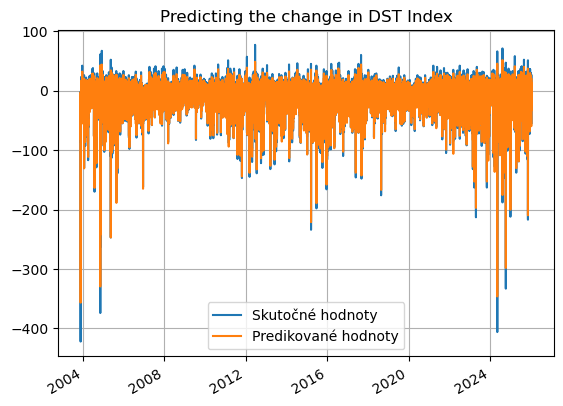

In [18]:
df = pd.DataFrame(data={"time": test['time1'][n_input:],"y_true": y_test_raw[n_input:] , "y_predict": y_pred.reshape(-1)})

df["residuals"] = df["y_true"] - df["y_predict"]
df["true_binary"] = (df["y_true"] <= -20).astype(int)
df["pred_binary"] = (df["y_predict"] <= CLASSIFICATION_THRESHOLD).astype(int)
df["y_persistence"] = df["y_true"].shift(shift)

plt.figure()
plt.title('Predicting the change in DST Index')
plt.plot(df['time'],df['y_true'], label='Skutočné hodnoty')
plt.plot(df['time'],df['y_predict'], label='Predikované hodnoty')
plt.legend()
plt.gcf().autofmt_xdate()
plt.grid(True)

In [19]:
TN, FP, FN, TP = cm.ravel()
ACC = (TP + TN) / (TP + TN + FP + FN)
MCC = matthews_corrcoef(y_test_binary, y_pred_binary_lstm)
print("ACC={}".format(ACC))
print("MCC={}".format(MCC))
df['y_persistance'] = df['y_true'].shift(shift)
df = df.dropna(subset=["y_true", "y_predict", "y_persistance"])

# Získame hodnoty zo stĺpcov
y_true = df["y_true"].values
y_pred_nn = df["y_predict"].values
y_pred_persistence = df["y_persistance"].values

# MAE a MSE pre neurónovú sieť
mae_nn = mean_absolute_error(y_true, y_pred_nn)
mse_nn = mean_squared_error(y_true, y_pred_nn)

# MAE a MSE pre perzistentný model
mae_persistence = mean_absolute_error(y_true, y_pred_persistence)
mse_persistence = mean_squared_error(y_true, y_pred_persistence)

# Porovnanie zlepšenia
improvement_mae = (mae_persistence - mae_nn) / mae_persistence * 100
improvement_mse = (mse_persistence - mse_nn) / mse_persistence * 100

# Výpis
print("Výkon NN:")
print(f"MAE: {mae_nn:.4f}, MSE: {mse_nn:.4f}")

print("Perzistentný model:")
print(f"MAE: {mae_persistence:.4f}, MSE: {mse_persistence:.4f}")

print("Zlepšenie oproti Persistence Modelu:")
print(f"MAE Improvement: {improvement_mae:.2f}%")
print(f"MSE Improvement: {improvement_mse:.2f}%")

ACC=0.9590512580203302
MCC=0.8781307094812626
Výkon NN:
MAE: 2.6170, MSE: 15.2442
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: -1.91%
MSE Improvement: 6.59%


In [20]:
###########################################
# 1. LSTM predikcie (aligned s n_input)
###########################################

y_train_lstm = model.predict(train_generator).reshape(-1)
y_val_lstm   = model.predict(val_generator).reshape(-1)
y_test_lstm  = model.predict(test_generator).reshape(-1)

emb_model = Model(inputs=model.input, outputs=model.layers[-2].output)
emb_train = emb_model.predict(train_generator)
emb_val   = emb_model.predict(val_generator)
emb_test  = emb_model.predict(test_generator)

# aligned y_true (TimeseriesGenerator posúva o n_input)
y_train_true = y_train[n_input:]
y_val_true   = y_val[n_input:]
y_test_true  = y_test[n_input:]

print("Shapes LSTM:")
print("train:", y_train_lstm.shape, y_train_true.shape)
print("val:  ", y_val_lstm.shape,   y_val_true.shape)
print("test: ", y_test_lstm.shape,  y_test_true.shape)


###########################################
# 2. Reziduá (chyba LSTM)
###########################################

error_train = y_train_true - y_train_lstm
error_val   = y_val_true   - y_val_lstm

# globálna smerodajná odchýlka chýb (použijeme ju na "nafúknutie" intervalu)
sigma_global = np.std(np.concatenate([error_train, error_val]))
print("Global sigma (LSTM errors, scaled):", sigma_global)


###########################################
# 3. Vstupy pre GP (tie isté indexy ako reziduá)
###########################################

# embeddingy z predposlednej vrstvy LSTM modelu
X_train_emb = emb_train
X_val_emb   = emb_val
X_test_emb  = emb_test

# Spojenie train+val pre GP
X_gp_train = np.concatenate([X_train_emb, X_val_emb])
y_gp_train = np.concatenate([error_train, error_val])

X_test_gp = X_test_emb

print("Shapes GP:")
print("X_gp_train:", X_gp_train.shape)
print("y_gp_train:", y_gp_train.shape)
print("X_test_gp:", X_test_gp.shape)


###########################################
# 4. Gaussian Process (subsampling kvôli RAM)
###########################################

from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel as C

max_gp_points = 5000
if len(X_gp_train) > max_gp_points:
    rng = np.random.default_rng(42)
    idx = rng.choice(len(X_gp_train), size=max_gp_points, replace=False)
    X_gp_sub = X_gp_train[idx]
    y_gp_sub = y_gp_train[idx]
    print(f"Using subsample of {len(X_gp_sub)} points for GP.")
else:
    X_gp_sub = X_gp_train
    y_gp_sub = y_gp_train
    print("Using all points for GP.")

kernel = C(1.0, (1e-3, 1e3)) * RBF(length_scale=20.0, length_scale_bounds=(1e-1, 1e3)) \
         + WhiteKernel(noise_level=1.0, noise_level_bounds=(1e-5, 1e1))

gp = GaussianProcessRegressor(
    kernel=kernel,
    alpha=1e-2,
    normalize_y=True,
    n_restarts_optimizer=2,
    random_state=42
)

print("Training GP on", len(X_gp_sub), "points...")
gp.fit(X_gp_sub, y_gp_sub)
print("GP fitted. Kernel:", gp.kernel_)


###########################################
# 5. Predikcia GP chyby + hybrid LSTM+GP
###########################################

y_gp_mean_err, y_gp_std_err = gp.predict(X_test_gp, return_std=True)

y_train_lstm = inverse_target(y_train_lstm.reshape(-1))
y_val_lstm   = inverse_target(y_val_lstm.reshape(-1))
y_test_lstm  = inverse_target(y_test_lstm.reshape(-1))

y_train_true = y_train_raw[n_input:]
y_val_true   = y_val_raw[n_input:]
y_test_true  = y_test_raw[n_input:]

y_gp_mean_err = y_gp_mean_err * target_scale
y_gp_std_err = y_gp_std_err * target_scale
sigma_global = sigma_global * target_scale

print("Global sigma (LSTM errors):", sigma_global)

y_hybrid_mean  = y_test_lstm + y_gp_mean_err

times_test = pd.to_datetime(test["time1"].iloc[n_input:])
sigma_series = pd.Series(y_gp_std_err, index=times_test)
sigma_smooth = sigma_series.rolling(window=6, center=True, min_periods=1).mean().values

sigma_effective = np.sqrt(sigma_smooth**2 + sigma_global**2)

#z = 1.96  # 95% interval
z = 3  # 99% interval
y_hybrid_lower = y_hybrid_mean - z * sigma_effective
y_hybrid_upper = y_hybrid_mean + z * sigma_effective

print("Hybrid prediction with smoothed, inflated interval ready.")

  1/896 ━━━━━━━━━━━━━━━━━━━━ 1:28 99ms/step

  2/896 ━━━━━━━━━━━━━━━━━━━━ 49s 55ms/step 

  4/896 ━━━━━━━━━━━━━━━━━━━━ 44s 49ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 36s 41ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 38s 43ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 39s 44ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step

 29/896 ━━━━━━━━━━━━━━━━━━━━ 38s 45ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 39s 45ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 39s 46ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 45/896 ━━━━━━━━━━━━━━━━━━━━ 40s 47ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 48/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 40s 48ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 64/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 66/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 40s 49ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 69/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 41s 50ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 41s 51ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 42s 51ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 76/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 42s 52ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 43s 53ms/step

 83/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 88/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 44s 55ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

 98/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 43s 54ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 42s 54ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

107/896 ━━━━━━━━━━━━━━━━━━━━ 43s 55ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 43s 56ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 44s 56ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 44s 57ms/step

113/896 ━━━━━━━━━━━━━━━━━━━━ 44s 57ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 45s 59ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 45s 59ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 45s 59ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 45s 59ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 44s 58ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 43s 57ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 41s 56ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 41s 55ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 40s 55ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 39s 55ms/step

167/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 39s 54ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 38s 54ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 38s 53ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

194/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 37s 53ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

200/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

205/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

208/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 36s 53ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

221/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

227/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 35s 53ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 34s 52ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

238/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

241/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

248/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

254/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 34s 53ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 33s 53ms/step

264/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

275/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

279/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 33s 54ms/step

287/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 32s 54ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

308/896 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 32s 56ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

329/896 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

331/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 31s 56ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 31s 55ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 30s 55ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

354/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

358/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

360/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

362/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 29s 55ms/step

365/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

367/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 28s 55ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

376/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

378/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 28s 54ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

384/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

387/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

389/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 27s 54ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

403/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

410/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

417/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 26s 54ms/step

419/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 25s 54ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

423/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

427/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 25s 55ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

444/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

448/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 24s 55ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

462/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 24s 56ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

468/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 23s 56ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 23s 57ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

504/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

506/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 22s 57ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 21s 57ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 21s 58ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 21s 58ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

533/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 20s 57ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

538/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

541/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 20s 58ms/step

549/896 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step

553/896 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

558/896 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 19s 58ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 19s 57ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

572/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

574/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

580/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 18s 57ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

587/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

590/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

593/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

596/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

599/896 ━━━━━━━━━━━━━━━━━━━━ 17s 57ms/step

601/896 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 16s 57ms/step

604/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

610/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

612/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

614/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 16s 58ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

625/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

627/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

629/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 58ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 58ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 13s 58ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

677/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

681/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

702/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

704/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

710/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

712/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

725/896 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step 

727/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

730/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

734/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

736/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

742/896 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

744/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

751/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

758/896 ━━━━━━━━━━━━━━━━━━━━ 8s 59ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

763/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

771/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 59ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

779/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

784/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

788/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

793/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

796/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

801/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

804/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

808/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 59ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

814/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

851/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

853/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

858/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

863/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

879/896 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

882/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 53s 59ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 22s 102ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 11s 54ms/step 

  3/224 ━━━━━━━━━━━━━━━━━━━━ 12s 56ms/step

  4/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step

 18/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 25/224 ━━━━━━━━━━━━━━━━━━━━ 11s 56ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 27/224 ━━━━━━━━━━━━━━━━━━━━ 11s 57ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 11s 58ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 11s 59ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

 39/224 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 11s 64ms/step

 42/224 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 50/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 11s 65ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 55/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 11s 66ms/step

 57/224 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step

 58/224 ━━━━━━━━━━━━━━━━━━━━ 10s 66ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 10s 65ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 10s 64ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step 

 69/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 77/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 80/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 82/224 ━━━━━━━━━━━━━━━━━━━━ 9s 64ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 9s 65ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 9s 66ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 8s 66ms/step

 96/224 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step

 99/224 ━━━━━━━━━━━━━━━━━━━━ 8s 65ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step

104/224 ━━━━━━━━━━━━━━━━━━━━ 7s 65ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

107/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 7s 64ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 64ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

124/224 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

126/224 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

130/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

136/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

139/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

141/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

144/224 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

146/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

148/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

151/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 4s 62ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

172/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

195/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

197/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

202/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

217/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

219/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

221/224 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:41 134ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 50s 67ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 48s 64ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 46s 62ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 45s 60ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 43s 58ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 42s 56ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 42s 57ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 43s 59ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 44s 60ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 45s 61ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 45s 62ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 47s 66ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 47s 65ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 46s 65ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

 42/759 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 44s 63ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 44s 62ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 43s 62ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 60/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 65/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 42s 61ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 41s 61ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 75/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 79/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 82/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 85/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 87/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 92/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 94/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 96/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 98/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

102/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

104/759 ━━━━━━━━━━━━━━━━━━━━ 39s 60ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

107/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

114/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

117/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 38s 60ms/step

124/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

131/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 37s 60ms/step

141/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

145/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

148/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

155/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

158/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

168/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

170/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

172/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 36s 62ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

188/759 ━━━━━━━━━━━━━━━━━━━━ 35s 62ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

194/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 35s 64ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 35s 63ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 34s 63ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

235/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

243/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

245/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 31s 63ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

258/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

265/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

267/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

287/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

290/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

304/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

308/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

313/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

321/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

328/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

330/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

332/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 26s 62ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

339/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 25s 62ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 24s 62ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 24s 63ms/step

376/759 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 23s 63ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

383/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 23s 62ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

396/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

409/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

416/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

441/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

463/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

477/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

501/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 14s 63ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

574/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

576/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

584/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 10s 62ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step 

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 9s 62ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 8s 62ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

632/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

638/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

648/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 4s 61ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step

711/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

723/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 62ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

733/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

736/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

738/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

741/759 ━━━━━━━━━━━━━━━━━━━━ 1s 62ms/step

743/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

745/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

747/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

749/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

752/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

754/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

757/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step


  1/896 ━━━━━━━━━━━━━━━━━━━━ 41:32 3s/step

  3/896 ━━━━━━━━━━━━━━━━━━━━ 52s 59ms/step

  4/896 ━━━━━━━━━━━━━━━━━━━━ 51s 57ms/step

  5/896 ━━━━━━━━━━━━━━━━━━━━ 49s 56ms/step

  6/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  7/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  8/896 ━━━━━━━━━━━━━━━━━━━━ 50s 57ms/step

  9/896 ━━━━━━━━━━━━━━━━━━━━ 51s 58ms/step

 10/896 ━━━━━━━━━━━━━━━━━━━━ 54s 62ms/step

 11/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step

 12/896 ━━━━━━━━━━━━━━━━━━━━ 57s 65ms/step

 13/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 69ms/step

 14/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 71ms/step

 15/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step

 16/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 73ms/step

 17/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step

 18/896 ━━━━━━━━━━━━━━━━━━━━ 1:08 78ms/step

 19/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 20/896 ━━━━━━━━━━━━━━━━━━━━ 1:13 83ms/step

 21/896 ━━━━━━━━━━━━━━━━━━━━ 1:12 83ms/step

 22/896 ━━━━━━━━━━━━━━━━━━━━ 1:11 82ms/step

 23/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 24/896 ━━━━━━━━━━━━━━━━━━━━ 1:10 81ms/step

 25/896 ━━━━━━━━━━━━━━━━━━━━ 1:09 80ms/step

 27/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 78ms/step

 28/896 ━━━━━━━━━━━━━━━━━━━━ 1:07 77ms/step

 30/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 76ms/step

 31/896 ━━━━━━━━━━━━━━━━━━━━ 1:05 75ms/step

 32/896 ━━━━━━━━━━━━━━━━━━━━ 1:04 74ms/step

 33/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step

 34/896 ━━━━━━━━━━━━━━━━━━━━ 1:03 74ms/step

 35/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step

 36/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 73ms/step

 37/896 ━━━━━━━━━━━━━━━━━━━━ 1:02 72ms/step

 38/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step

 39/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 72ms/step

 40/896 ━━━━━━━━━━━━━━━━━━━━ 1:01 71ms/step

 41/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step

 42/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step

 43/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step

 44/896 ━━━━━━━━━━━━━━━━━━━━ 1:00 71ms/step

 46/896 ━━━━━━━━━━━━━━━━━━━━ 59s 70ms/step 

 48/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step

 49/896 ━━━━━━━━━━━━━━━━━━━━ 58s 69ms/step

 50/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step

 51/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step

 52/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step

 53/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step

 54/896 ━━━━━━━━━━━━━━━━━━━━ 57s 68ms/step

 55/896 ━━━━━━━━━━━━━━━━━━━━ 56s 68ms/step

 56/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step

 57/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step

 58/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step

 59/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step

 60/896 ━━━━━━━━━━━━━━━━━━━━ 56s 67ms/step

 61/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step

 62/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step

 63/896 ━━━━━━━━━━━━━━━━━━━━ 55s 67ms/step

 65/896 ━━━━━━━━━━━━━━━━━━━━ 55s 66ms/step

 67/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step

 68/896 ━━━━━━━━━━━━━━━━━━━━ 54s 66ms/step

 70/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step

 71/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step

 72/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step

 73/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step

 74/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step

 75/896 ━━━━━━━━━━━━━━━━━━━━ 53s 65ms/step

 77/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step

 78/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step

 79/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step

 80/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step

 81/896 ━━━━━━━━━━━━━━━━━━━━ 52s 65ms/step

 82/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 84/896 ━━━━━━━━━━━━━━━━━━━━ 52s 64ms/step

 85/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 86/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 87/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 89/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 90/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 91/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 92/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 93/896 ━━━━━━━━━━━━━━━━━━━━ 51s 64ms/step

 94/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 95/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 96/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 97/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

 99/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

100/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

101/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

102/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

103/896 ━━━━━━━━━━━━━━━━━━━━ 50s 63ms/step

104/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

105/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

106/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

108/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

109/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

110/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

111/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

112/896 ━━━━━━━━━━━━━━━━━━━━ 49s 63ms/step

114/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

115/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

116/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step

117/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step

118/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

119/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

121/896 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step

123/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step

124/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step

125/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step

126/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step

127/896 ━━━━━━━━━━━━━━━━━━━━ 47s 62ms/step

128/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

129/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

130/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

131/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

132/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

133/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

134/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

135/896 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step

137/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

138/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

139/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

140/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

141/896 ━━━━━━━━━━━━━━━━━━━━ 47s 63ms/step

142/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

143/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

144/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

145/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

146/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

147/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

148/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

149/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

150/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

151/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

152/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

153/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

154/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

155/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

157/896 ━━━━━━━━━━━━━━━━━━━━ 47s 64ms/step

158/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step

159/896 ━━━━━━━━━━━━━━━━━━━━ 46s 64ms/step

161/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

162/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

163/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

164/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

165/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

166/896 ━━━━━━━━━━━━━━━━━━━━ 46s 63ms/step

168/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

169/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

170/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

171/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

172/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

173/896 ━━━━━━━━━━━━━━━━━━━━ 45s 63ms/step

174/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

175/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

176/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

177/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

178/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

179/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

180/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

181/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

182/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

183/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

184/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

185/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

186/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

187/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

188/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

189/896 ━━━━━━━━━━━━━━━━━━━━ 45s 65ms/step

190/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

191/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

192/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

193/896 ━━━━━━━━━━━━━━━━━━━━ 45s 64ms/step

195/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

196/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

198/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

199/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

201/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

203/896 ━━━━━━━━━━━━━━━━━━━━ 44s 64ms/step

204/896 ━━━━━━━━━━━━━━━━━━━━ 43s 64ms/step

206/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

207/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

209/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

210/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

212/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

213/896 ━━━━━━━━━━━━━━━━━━━━ 43s 63ms/step

215/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

216/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

217/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

218/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

219/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

220/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

222/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

223/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

225/896 ━━━━━━━━━━━━━━━━━━━━ 42s 63ms/step

226/896 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step

228/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

229/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

230/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

231/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

232/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

233/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

234/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

235/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

236/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

237/896 ━━━━━━━━━━━━━━━━━━━━ 41s 62ms/step

239/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

240/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

242/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

243/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

244/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

245/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

246/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

247/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

249/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

250/896 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

251/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

252/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

253/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

255/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

256/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

257/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

258/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

259/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

260/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

261/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

263/896 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

265/896 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step

266/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

267/896 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step

268/896 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step

269/896 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step

270/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

271/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

272/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

273/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

274/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

276/896 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

277/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

278/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

280/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

281/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

282/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

283/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

284/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

285/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

286/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

288/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

289/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

290/896 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

291/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

292/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

294/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

295/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

296/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

297/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

298/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

299/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

300/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

301/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

302/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

303/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

304/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

305/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

306/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

307/896 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

309/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

310/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

311/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

312/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

313/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

314/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

315/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

316/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

317/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

318/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

320/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

321/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

322/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

323/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

324/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

325/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

326/896 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

327/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

328/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

330/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

332/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

333/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

334/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

335/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

336/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

337/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

338/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

339/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

340/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

341/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

342/896 ━━━━━━━━━━━━━━━━━━━━ 34s 61ms/step

343/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

344/896 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

345/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

346/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

347/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

348/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

349/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

350/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

351/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

352/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

353/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

355/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

356/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

357/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

359/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

361/896 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

363/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

364/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

366/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

368/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

369/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

370/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

371/896 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

372/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

373/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

374/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

375/896 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

377/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

379/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

380/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

381/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

383/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

385/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

386/896 ━━━━━━━━━━━━━━━━━━━━ 31s 61ms/step

388/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

390/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

391/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

392/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

393/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

394/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

395/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

396/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

397/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

398/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

399/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

400/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

401/896 ━━━━━━━━━━━━━━━━━━━━ 30s 61ms/step

402/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

404/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

405/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

406/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

407/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

408/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

409/896 ━━━━━━━━━━━━━━━━━━━━ 29s 61ms/step

411/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

412/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

413/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

414/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

415/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

416/896 ━━━━━━━━━━━━━━━━━━━━ 29s 60ms/step

418/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

420/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

421/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

422/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

424/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

425/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

426/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

428/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

429/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

430/896 ━━━━━━━━━━━━━━━━━━━━ 28s 60ms/step

431/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

432/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

433/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

434/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

435/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

436/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

437/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

438/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

439/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

440/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

441/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

442/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

443/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

445/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

446/896 ━━━━━━━━━━━━━━━━━━━━ 27s 60ms/step

447/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

449/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

450/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

451/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

452/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

453/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

454/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

455/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

456/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

457/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

458/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

459/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

460/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

461/896 ━━━━━━━━━━━━━━━━━━━━ 26s 60ms/step

463/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

464/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

465/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

466/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

467/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

469/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

470/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

471/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

472/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

473/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

474/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

475/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

476/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

477/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

478/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

479/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

480/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

481/896 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

482/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

483/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

484/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

485/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

486/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

487/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

488/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

489/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

490/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

491/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

492/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

493/896 ━━━━━━━━━━━━━━━━━━━━ 24s 60ms/step

494/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

495/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

496/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

497/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

498/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

499/896 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

500/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

501/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

502/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

503/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

505/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

507/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

508/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

509/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

510/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

511/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

512/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

513/896 ━━━━━━━━━━━━━━━━━━━━ 23s 60ms/step

514/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

515/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

516/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

517/896 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

518/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

519/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

520/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

521/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

522/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

523/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

524/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

525/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

526/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

527/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

528/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

529/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

530/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

531/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

532/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

534/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

535/896 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

536/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

537/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

539/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

540/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

542/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

543/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

544/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

545/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

546/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

547/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

548/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

550/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

551/896 ━━━━━━━━━━━━━━━━━━━━ 21s 61ms/step

552/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

554/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

556/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

557/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

559/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

560/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

561/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

562/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

563/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

565/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

566/896 ━━━━━━━━━━━━━━━━━━━━ 20s 61ms/step

567/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

568/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

569/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

570/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

571/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

573/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

575/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

576/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

577/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

578/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

579/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

581/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

582/896 ━━━━━━━━━━━━━━━━━━━━ 19s 61ms/step

583/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

584/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

585/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

586/896 ━━━━━━━━━━━━━━━━━━━━ 18s 61ms/step

588/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

589/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

591/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

592/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

594/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

595/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

597/896 ━━━━━━━━━━━━━━━━━━━━ 18s 60ms/step

598/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

600/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

602/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

603/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

605/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

606/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

607/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

608/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

609/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

611/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

613/896 ━━━━━━━━━━━━━━━━━━━━ 17s 60ms/step

615/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

616/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

617/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

618/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

619/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

620/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

621/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

622/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

623/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

624/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

626/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

628/896 ━━━━━━━━━━━━━━━━━━━━ 16s 60ms/step

630/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

631/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

632/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

633/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

634/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

635/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

636/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

637/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

638/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

639/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

640/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

641/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

642/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

643/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

644/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

645/896 ━━━━━━━━━━━━━━━━━━━━ 15s 60ms/step

646/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

647/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

648/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

649/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

650/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

651/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

652/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

653/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

654/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

655/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

656/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

657/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

658/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

659/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

660/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

661/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

662/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

663/896 ━━━━━━━━━━━━━━━━━━━━ 14s 60ms/step

664/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

665/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

666/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

667/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

668/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

669/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

670/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

671/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

672/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

673/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

674/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

675/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

676/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

678/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

679/896 ━━━━━━━━━━━━━━━━━━━━ 13s 60ms/step

680/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

682/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

683/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

685/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

686/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

687/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

688/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

690/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

691/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

692/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

693/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

694/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

695/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

696/896 ━━━━━━━━━━━━━━━━━━━━ 12s 60ms/step

697/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

698/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

699/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

700/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

701/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

703/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

705/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

706/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

707/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

708/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

709/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

711/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

713/896 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

714/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

715/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

716/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

717/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

718/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

719/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

720/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

721/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

722/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

723/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

724/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

726/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

728/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

729/896 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

731/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step 

733/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

735/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

737/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

738/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

739/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

740/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

741/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

743/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

745/896 ━━━━━━━━━━━━━━━━━━━━ 9s 60ms/step

746/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

747/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

748/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

749/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

750/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

752/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

753/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

754/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

755/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

756/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

757/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

759/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

760/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

761/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

762/896 ━━━━━━━━━━━━━━━━━━━━ 8s 60ms/step

764/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

765/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

766/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

767/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

768/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

769/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

770/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

772/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

773/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

774/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

775/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

776/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

777/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

778/896 ━━━━━━━━━━━━━━━━━━━━ 7s 60ms/step

780/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

781/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

782/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

783/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

785/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

786/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

787/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

789/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

790/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

791/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

792/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

794/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

795/896 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

797/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

798/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

799/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

800/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

802/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

803/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

805/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

806/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

807/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

809/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

810/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

811/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

812/896 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

813/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

815/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

816/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

817/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

818/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

819/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

820/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

821/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

822/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

823/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

824/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

825/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

826/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

827/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

828/896 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

829/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

830/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

831/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

832/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

833/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

834/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

835/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

836/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

837/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

838/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

839/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

840/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

841/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

842/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

843/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

844/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

845/896 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step

846/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

847/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

848/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

849/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

850/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

852/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

854/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

856/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

857/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

859/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

860/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

861/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

862/896 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step

864/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

865/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

866/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

867/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

868/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

869/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

870/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

871/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

872/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

873/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

874/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

875/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

876/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

877/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

878/896 ━━━━━━━━━━━━━━━━━━━━ 1s 60ms/step

880/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

881/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

883/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

884/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

885/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

886/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

887/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

889/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

890/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

891/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

892/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

893/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

894/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

895/896 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

896/896 ━━━━━━━━━━━━━━━━━━━━ 58s 62ms/step


  1/224 ━━━━━━━━━━━━━━━━━━━━ 23s 106ms/step

  2/224 ━━━━━━━━━━━━━━━━━━━━ 15s 71ms/step 

  4/224 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step

  5/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  6/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

  7/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  8/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

  9/224 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step

 10/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 11/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 12/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 13/224 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

 14/224 ━━━━━━━━━━━━━━━━━━━━ 13s 63ms/step

 15/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 16/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 17/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 19/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 20/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 21/224 ━━━━━━━━━━━━━━━━━━━━ 12s 61ms/step

 22/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 23/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 24/224 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

 26/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 28/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 29/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 30/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 31/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 32/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 33/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 34/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 35/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 36/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 37/224 ━━━━━━━━━━━━━━━━━━━━ 11s 62ms/step

 38/224 ━━━━━━━━━━━━━━━━━━━━ 11s 61ms/step

 40/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 41/224 ━━━━━━━━━━━━━━━━━━━━ 11s 60ms/step

 43/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 44/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 45/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 46/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 47/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 48/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 49/224 ━━━━━━━━━━━━━━━━━━━━ 10s 60ms/step

 51/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 52/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 53/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 54/224 ━━━━━━━━━━━━━━━━━━━━ 10s 59ms/step

 56/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step 

 57/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 59/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 60/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 61/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 62/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 63/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 64/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 65/224 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

 66/224 ━━━━━━━━━━━━━━━━━━━━ 9s 59ms/step

 67/224 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

 68/224 ━━━━━━━━━━━━━━━━━━━━ 9s 58ms/step

 70/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 71/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 72/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 73/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 74/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 75/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 76/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 78/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 79/224 ━━━━━━━━━━━━━━━━━━━━ 8s 58ms/step

 81/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 83/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 84/224 ━━━━━━━━━━━━━━━━━━━━ 8s 57ms/step

 85/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 86/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

 87/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 88/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 89/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 90/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 91/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 92/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 94/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 95/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 97/224 ━━━━━━━━━━━━━━━━━━━━ 7s 58ms/step

 98/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

100/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

101/224 ━━━━━━━━━━━━━━━━━━━━ 7s 57ms/step

102/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

103/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

105/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

106/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

108/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

110/224 ━━━━━━━━━━━━━━━━━━━━ 6s 56ms/step

111/224 ━━━━━━━━━━━━━━━━━━━━ 6s 57ms/step

112/224 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

113/224 ━━━━━━━━━━━━━━━━━━━━ 6s 58ms/step

114/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

115/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

116/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

117/224 ━━━━━━━━━━━━━━━━━━━━ 6s 59ms/step

118/224 ━━━━━━━━━━━━━━━━━━━━ 6s 60ms/step

119/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

120/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

121/224 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

122/224 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

123/224 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

125/224 ━━━━━━━━━━━━━━━━━━━━ 6s 61ms/step

127/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

128/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

129/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

131/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

133/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

134/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

135/224 ━━━━━━━━━━━━━━━━━━━━ 5s 61ms/step

137/224 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

138/224 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

140/224 ━━━━━━━━━━━━━━━━━━━━ 5s 60ms/step

142/224 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

143/224 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

145/224 ━━━━━━━━━━━━━━━━━━━━ 4s 60ms/step

147/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

149/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

150/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

152/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

153/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

154/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

155/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

156/224 ━━━━━━━━━━━━━━━━━━━━ 4s 59ms/step

157/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

158/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

159/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

160/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

161/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

162/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

163/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

164/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

165/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

166/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

167/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

168/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

169/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

170/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

171/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

173/224 ━━━━━━━━━━━━━━━━━━━━ 3s 59ms/step

174/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

175/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

176/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

177/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

178/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

179/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

180/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

181/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

182/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

183/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

184/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

185/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

186/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

187/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

188/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

189/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

190/224 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step

192/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

193/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

194/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

196/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

198/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

199/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

200/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

201/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

203/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

204/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

205/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

206/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

207/224 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step

208/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

209/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

210/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

211/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

212/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

213/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

214/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

215/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

216/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

218/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

220/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

222/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

223/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step

224/224 ━━━━━━━━━━━━━━━━━━━━ 13s 59ms/step


  1/759 ━━━━━━━━━━━━━━━━━━━━ 1:26 114ms/step

  2/759 ━━━━━━━━━━━━━━━━━━━━ 38s 51ms/step  

  3/759 ━━━━━━━━━━━━━━━━━━━━ 49s 65ms/step

  4/759 ━━━━━━━━━━━━━━━━━━━━ 52s 69ms/step

  5/759 ━━━━━━━━━━━━━━━━━━━━ 54s 72ms/step

  6/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

  7/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

  8/759 ━━━━━━━━━━━━━━━━━━━━ 55s 74ms/step

  9/759 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step

 10/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 11/759 ━━━━━━━━━━━━━━━━━━━━ 53s 71ms/step

 12/759 ━━━━━━━━━━━━━━━━━━━━ 52s 70ms/step

 13/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 14/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 15/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 16/759 ━━━━━━━━━━━━━━━━━━━━ 54s 73ms/step

 17/759 ━━━━━━━━━━━━━━━━━━━━ 53s 72ms/step

 18/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 19/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 20/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 21/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 22/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 23/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 24/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 25/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 26/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 27/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 28/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 29/759 ━━━━━━━━━━━━━━━━━━━━ 52s 71ms/step

 30/759 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step

 31/759 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step

 32/759 ━━━━━━━━━━━━━━━━━━━━ 52s 72ms/step

 33/759 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step

 34/759 ━━━━━━━━━━━━━━━━━━━━ 51s 71ms/step

 35/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 36/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 37/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 38/759 ━━━━━━━━━━━━━━━━━━━━ 50s 70ms/step

 39/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 40/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 41/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 43/759 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step

 44/759 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step

 45/759 ━━━━━━━━━━━━━━━━━━━━ 49s 69ms/step

 46/759 ━━━━━━━━━━━━━━━━━━━━ 49s 70ms/step

 47/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 48/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 49/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 50/759 ━━━━━━━━━━━━━━━━━━━━ 50s 71ms/step

 51/759 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step

 52/759 ━━━━━━━━━━━━━━━━━━━━ 51s 73ms/step

 53/759 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step

 54/759 ━━━━━━━━━━━━━━━━━━━━ 52s 74ms/step

 55/759 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step

 56/759 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step

 57/759 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step

 58/759 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step

 59/759 ━━━━━━━━━━━━━━━━━━━━ 52s 75ms/step

 61/759 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step

 62/759 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step

 63/759 ━━━━━━━━━━━━━━━━━━━━ 51s 74ms/step

 64/759 ━━━━━━━━━━━━━━━━━━━━ 50s 73ms/step

 66/759 ━━━━━━━━━━━━━━━━━━━━ 50s 72ms/step

 68/759 ━━━━━━━━━━━━━━━━━━━━ 49s 72ms/step

 69/759 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step

 70/759 ━━━━━━━━━━━━━━━━━━━━ 49s 71ms/step

 71/759 ━━━━━━━━━━━━━━━━━━━━ 48s 71ms/step

 73/759 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step

 74/759 ━━━━━━━━━━━━━━━━━━━━ 48s 70ms/step

 76/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 77/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 78/759 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step

 80/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 81/759 ━━━━━━━━━━━━━━━━━━━━ 46s 69ms/step

 83/759 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step

 84/759 ━━━━━━━━━━━━━━━━━━━━ 45s 68ms/step

 86/759 ━━━━━━━━━━━━━━━━━━━━ 45s 67ms/step

 88/759 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step

 89/759 ━━━━━━━━━━━━━━━━━━━━ 44s 67ms/step

 90/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 91/759 ━━━━━━━━━━━━━━━━━━━━ 44s 66ms/step

 93/759 ━━━━━━━━━━━━━━━━━━━━ 43s 66ms/step

 95/759 ━━━━━━━━━━━━━━━━━━━━ 43s 65ms/step

 97/759 ━━━━━━━━━━━━━━━━━━━━ 42s 65ms/step

 99/759 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step

100/759 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step

101/759 ━━━━━━━━━━━━━━━━━━━━ 42s 64ms/step

103/759 ━━━━━━━━━━━━━━━━━━━━ 41s 64ms/step

105/759 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step

106/759 ━━━━━━━━━━━━━━━━━━━━ 41s 63ms/step

108/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

110/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

111/759 ━━━━━━━━━━━━━━━━━━━━ 40s 63ms/step

112/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

113/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

115/759 ━━━━━━━━━━━━━━━━━━━━ 40s 62ms/step

116/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

118/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

119/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

120/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

121/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

122/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

123/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

125/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

126/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

127/759 ━━━━━━━━━━━━━━━━━━━━ 39s 62ms/step

128/759 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step

129/759 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step

130/759 ━━━━━━━━━━━━━━━━━━━━ 38s 62ms/step

132/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

133/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

134/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

135/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

136/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

137/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

138/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

139/759 ━━━━━━━━━━━━━━━━━━━━ 38s 61ms/step

140/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

142/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

143/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

144/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

146/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

147/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

149/759 ━━━━━━━━━━━━━━━━━━━━ 37s 61ms/step

150/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

151/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

152/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

153/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

154/759 ━━━━━━━━━━━━━━━━━━━━ 36s 61ms/step

156/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

157/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

159/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

160/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

161/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

162/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

163/759 ━━━━━━━━━━━━━━━━━━━━ 36s 60ms/step

164/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

165/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

166/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

167/759 ━━━━━━━━━━━━━━━━━━━━ 35s 61ms/step

169/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

171/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

173/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

174/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

175/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

176/759 ━━━━━━━━━━━━━━━━━━━━ 35s 60ms/step

177/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

178/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

179/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

180/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

181/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

182/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

183/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

184/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

185/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

186/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

187/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

189/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

190/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

191/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

192/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

193/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

195/759 ━━━━━━━━━━━━━━━━━━━━ 34s 60ms/step

196/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

197/759 ━━━━━━━━━━━━━━━━━━━━ 33s 60ms/step

198/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

199/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

200/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

201/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

202/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

203/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

204/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

205/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

206/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

207/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

208/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

209/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

210/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

211/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

212/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

213/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

214/759 ━━━━━━━━━━━━━━━━━━━━ 33s 61ms/step

215/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

216/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

217/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

218/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

219/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

220/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

221/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

222/759 ━━━━━━━━━━━━━━━━━━━━ 32s 61ms/step

223/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

224/759 ━━━━━━━━━━━━━━━━━━━━ 33s 62ms/step

225/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

226/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

227/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

228/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

229/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

230/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

231/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

232/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

233/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

234/759 ━━━━━━━━━━━━━━━━━━━━ 33s 63ms/step

236/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

237/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

238/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

239/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

240/759 ━━━━━━━━━━━━━━━━━━━━ 32s 63ms/step

242/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

244/759 ━━━━━━━━━━━━━━━━━━━━ 32s 62ms/step

246/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

247/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

248/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

249/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

250/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

251/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

252/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

253/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

254/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

255/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

256/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

257/759 ━━━━━━━━━━━━━━━━━━━━ 31s 62ms/step

259/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

260/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

261/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

262/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

263/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

264/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

266/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

268/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

269/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

270/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

271/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

272/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

273/759 ━━━━━━━━━━━━━━━━━━━━ 30s 62ms/step

274/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

275/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

276/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

277/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

278/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

279/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

280/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

281/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

282/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

283/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

284/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

285/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

286/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

288/759 ━━━━━━━━━━━━━━━━━━━━ 29s 62ms/step

289/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

291/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

292/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

293/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

294/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

295/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

296/759 ━━━━━━━━━━━━━━━━━━━━ 28s 62ms/step

298/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

299/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

300/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

301/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

302/759 ━━━━━━━━━━━━━━━━━━━━ 28s 61ms/step

303/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

305/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

306/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

307/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

309/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

310/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

311/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

312/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

314/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

315/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

316/759 ━━━━━━━━━━━━━━━━━━━━ 27s 61ms/step

317/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

318/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

319/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

320/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

322/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

323/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

324/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

325/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

326/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

327/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

329/759 ━━━━━━━━━━━━━━━━━━━━ 26s 61ms/step

331/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

333/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

334/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

335/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

336/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

337/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

338/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

340/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

341/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

342/759 ━━━━━━━━━━━━━━━━━━━━ 25s 60ms/step

343/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

344/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

345/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

346/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

347/759 ━━━━━━━━━━━━━━━━━━━━ 25s 61ms/step

348/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

349/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

350/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

351/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

352/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

353/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

354/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

355/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

356/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

357/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

358/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

359/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

360/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

361/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

362/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

363/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

364/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

365/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

366/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

367/759 ━━━━━━━━━━━━━━━━━━━━ 24s 61ms/step

368/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

369/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

370/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

371/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

372/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

373/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

374/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

375/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

377/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

378/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

379/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

380/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

382/759 ━━━━━━━━━━━━━━━━━━━━ 23s 61ms/step

384/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

385/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

386/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

387/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

388/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

389/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

390/759 ━━━━━━━━━━━━━━━━━━━━ 22s 61ms/step

391/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

392/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

393/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

394/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

395/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

397/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

398/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

399/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

400/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

401/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

402/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

403/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

404/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

405/759 ━━━━━━━━━━━━━━━━━━━━ 22s 62ms/step

406/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

407/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

408/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

410/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

411/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

412/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

413/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

414/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

415/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

417/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

418/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

419/759 ━━━━━━━━━━━━━━━━━━━━ 21s 62ms/step

420/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

421/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

422/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

423/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

424/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

425/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

426/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

427/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

428/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

430/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

431/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

432/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

433/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

434/759 ━━━━━━━━━━━━━━━━━━━━ 20s 62ms/step

435/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

436/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

437/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

438/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

439/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

440/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

442/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

443/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

444/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

445/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

446/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

447/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

448/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

450/759 ━━━━━━━━━━━━━━━━━━━━ 19s 62ms/step

451/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

452/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

453/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

454/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

455/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

456/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

458/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

459/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

460/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

461/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

462/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

464/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

465/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

466/759 ━━━━━━━━━━━━━━━━━━━━ 18s 62ms/step

467/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

468/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

469/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

470/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

471/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

472/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

473/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

474/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

475/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

476/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

478/759 ━━━━━━━━━━━━━━━━━━━━ 17s 61ms/step

479/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

480/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

481/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

482/759 ━━━━━━━━━━━━━━━━━━━━ 17s 62ms/step

483/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

484/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

485/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

486/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

487/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

488/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

489/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

490/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

491/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

492/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

493/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

494/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

495/759 ━━━━━━━━━━━━━━━━━━━━ 16s 61ms/step

496/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

497/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

498/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

499/759 ━━━━━━━━━━━━━━━━━━━━ 16s 62ms/step

500/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

502/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

503/759 ━━━━━━━━━━━━━━━━━━━━ 15s 61ms/step

504/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

505/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

506/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

507/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

508/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

509/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

510/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

511/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

512/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

513/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

514/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

515/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

516/759 ━━━━━━━━━━━━━━━━━━━━ 15s 62ms/step

517/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

518/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

519/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

520/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

521/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

522/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

523/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

524/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

525/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

526/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

527/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

528/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

529/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

530/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

531/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

532/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

533/759 ━━━━━━━━━━━━━━━━━━━━ 14s 62ms/step

534/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

535/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

536/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

537/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

538/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

539/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

540/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

541/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

542/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

543/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

545/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

546/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

547/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

548/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

549/759 ━━━━━━━━━━━━━━━━━━━━ 13s 62ms/step

550/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

551/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

552/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

554/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

555/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

556/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

557/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

558/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

559/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

560/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

561/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

562/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

563/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

564/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

565/759 ━━━━━━━━━━━━━━━━━━━━ 12s 62ms/step

566/759 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

567/759 ━━━━━━━━━━━━━━━━━━━━ 12s 63ms/step

568/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

569/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

570/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

571/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

572/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

573/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

575/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

577/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

578/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

579/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

580/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

581/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

582/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

583/759 ━━━━━━━━━━━━━━━━━━━━ 11s 63ms/step

585/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

586/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

587/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

588/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

589/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

590/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

591/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

592/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

593/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

594/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

595/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

596/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

597/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

598/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

599/759 ━━━━━━━━━━━━━━━━━━━━ 10s 63ms/step

600/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step 

601/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

602/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

603/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

604/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

605/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

606/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

607/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

608/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

609/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

610/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

611/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

612/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

613/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

614/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

615/759 ━━━━━━━━━━━━━━━━━━━━ 9s 63ms/step

616/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

618/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

619/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

620/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

621/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

622/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

623/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

624/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

625/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

626/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

627/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

628/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

629/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

630/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

631/759 ━━━━━━━━━━━━━━━━━━━━ 8s 63ms/step

633/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

634/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

635/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

636/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

637/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

639/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

640/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

641/759 ━━━━━━━━━━━━━━━━━━━━ 7s 62ms/step

642/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

643/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

644/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

645/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

646/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

647/759 ━━━━━━━━━━━━━━━━━━━━ 7s 63ms/step

649/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

650/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

652/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

653/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

654/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

655/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

656/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

657/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

658/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

659/759 ━━━━━━━━━━━━━━━━━━━━ 6s 63ms/step

660/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

661/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

662/759 ━━━━━━━━━━━━━━━━━━━━ 6s 62ms/step

663/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

664/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

665/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

666/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

667/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

668/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

669/759 ━━━━━━━━━━━━━━━━━━━━ 5s 62ms/step

670/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

671/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

672/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

673/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

674/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

675/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

676/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

677/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

678/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

679/759 ━━━━━━━━━━━━━━━━━━━━ 5s 63ms/step

680/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

681/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

682/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

683/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

684/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

685/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

686/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

687/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

688/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

689/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

690/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

691/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

692/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

693/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

694/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

695/759 ━━━━━━━━━━━━━━━━━━━━ 4s 63ms/step

696/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

697/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

698/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

699/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

700/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

701/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

702/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

703/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

704/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

705/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

706/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

707/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

708/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

709/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

710/759 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step

712/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

713/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

714/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

715/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

716/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

717/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

718/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

719/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

720/759 ━━━━━━━━━━━━━━━━━━━━ 2s 63ms/step

721/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

722/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

724/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

725/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

726/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

727/759 ━━━━━━━━━━━━━━━━━━━━ 2s 64ms/step

728/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

729/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

730/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

731/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

732/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

734/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

735/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

737/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

739/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

740/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

742/759 ━━━━━━━━━━━━━━━━━━━━ 1s 64ms/step

744/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

746/759 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

748/759 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

750/759 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

751/759 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

753/759 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

755/759 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

756/759 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

758/759 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step

759/759 ━━━━━━━━━━━━━━━━━━━━ 48s 63ms/step


Shapes LSTM:
train: (229350,) (229350,)
val:   (57333,) (57333,)
test:  (194194,) (194194,)
Global sigma (LSTM errors, scaled): 0.2152519
Shapes GP:
X_gp_train: (286683, 6)
y_gp_train: (286683,)
X_test_gp: (194194, 6)
Using subsample of 5000 points for GP.
Training GP on 5000 points...


GP fitted. Kernel: 2.33**2 * RBF(length_scale=0.565) + WhiteKernel(noise_level=0.618)


Global sigma (LSTM errors): 4.736382
Hybrid prediction with smoothed, inflated interval ready.


In [21]:
len(y_hybrid_upper)

194194

In [22]:
len(y_pred_persistence)

194193

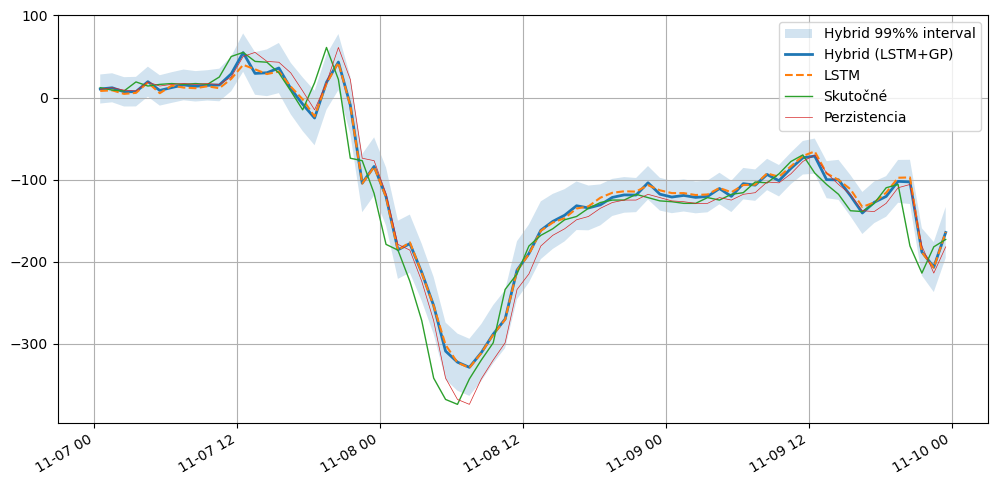

In [23]:
time_aligned = test["time1"][n_input:][shift:]

cols = [
    y_test_true[shift:],
    y_test_lstm[shift:],
    y_gp_mean_err[shift:],
    y_hybrid_mean[shift:],
    y_hybrid_lower[shift:],
    y_hybrid_upper[shift:],
    y_pred_persistence,
    time_aligned
]

L = min(len(x) for x in cols)

df = pd.DataFrame({
    "time": time_aligned[:L],
    "y_true": y_test_true[shift:][:L],
    "y_lstm": y_test_lstm[shift:][:L],
    "y_gp_error": y_gp_mean_err[shift:][:L],
    "y_hybrid": y_hybrid_mean[shift:][:L],
    "hybrid_lower": y_hybrid_lower[shift:][:L],
    "hybrid_upper": y_hybrid_upper[shift:][:L],
    "y_pred_persistence": y_pred_persistence[:L],
})




start_date = "2004-11-07"
end_date   = "2004-11-10"

df_range = df[(df["time"] >= start_date) & (df["time"] <= end_date)]

plt.figure(figsize=(12,6))
plt.fill_between(df_range["time"], df_range["hybrid_lower"], df_range["hybrid_upper"],
                 alpha=0.2, label="Hybrid 99%% interval")
plt.plot(df_range["time"], df_range["y_hybrid"], label="Hybrid (LSTM+GP)", linewidth=2)
plt.plot(df_range["time"], df_range["y_lstm"], label="LSTM", linestyle="--")
plt.plot(df_range["time"], df_range["y_true"], label="Skutočné", linewidth=1)
plt.plot(df_range["time"], df_range["y_pred_persistence"], label="Perzistencia", linewidth=0.5 )
plt.legend()
plt.grid(True)
plt.gcf().autofmt_xdate()
plt.show()
os.makedirs("datasets", exist_ok=True)
df.to_csv(os.path.join("datasets", f"prediction_comparison_{y_col}_LSTM_{n_input}H.csv"), index=False)

In [24]:
from sklearn.metrics import mean_absolute_error

# --- REGRESNÉ METRIKY ---
y_true_hybrid = y_test_true
y_pred_hybrid = y_hybrid_mean

mse = mean_squared_error(y_true_hybrid, y_pred_hybrid)
mae = mean_absolute_error(y_true_hybrid, y_pred_hybrid)

# --- KLASIFIKAČNÉ METRIKY ---
CLASSIFICATION_THRESHOLD_PRED = CLASSIFICATION_THRESHOLD
y_true_binary = np.where(y_true_hybrid <= -20, 1, 0)
y_pred_binary = np.where(y_pred_hybrid <= CLASSIFICATION_THRESHOLD_PRED, 1, 0)

conf_matrix = confusion_matrix(y_true_binary, y_pred_binary)
mcc = matthews_corrcoef(y_true_binary, y_pred_binary)

# --- VÝSTUP ---
print("--- Regresné metriky (Hybridný model) ---")
print(f"MSE: {mse:.4f}")
print(f"MAE: {mae:.4f}")

print(f"\n--- Klasifikačné metriky (Prah: {CLASSIFICATION_THRESHOLD_PRED} nT) ---")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

print("\nKonfúzna matica (Confusion Matrix):")
print("          | Predikcia 0 | Predikcia 1")
print("---------------------------------")
print(f"Skutočná 0 | {conf_matrix[0, 0]:>11} | {conf_matrix[0, 1]:>11}")
print(f"Skutočná 1 | {conf_matrix[1, 0]:>11} | {conf_matrix[1, 1]:>11}")

print("\nClassification Report (Trieda 1 je Búrka):")
print(classification_report(y_true_binary, y_pred_binary, target_names=['Trieda 0 (Normálna)', 'Trieda 1 (Búrka)']))

--- Regresné metriky (Hybridný model) ---
MSE: 14.9901
MAE: 2.4722

--- Klasifikačné metriky (Prah: -20.2 nT) ---
Matthews Correlation Coefficient (MCC): 0.8726

Konfúzna matica (Confusion Matrix):
          | Predikcia 0 | Predikcia 1
---------------------------------
Skutočná 0 |      149280 |        2778
Skutočná 1 |        5486 |       36650

Classification Report (Trieda 1 je Búrka):
                     precision    recall  f1-score   support

Trieda 0 (Normálna)       0.96      0.98      0.97    152058
   Trieda 1 (Búrka)       0.93      0.87      0.90     42136

           accuracy                           0.96    194194
          macro avg       0.95      0.93      0.94    194194
       weighted avg       0.96      0.96      0.96    194194



In [25]:
import os, json
import numpy as np
import os
import pandas as pd
from datetime import datetime
from sklearn.metrics import (
    mean_absolute_error, mean_squared_error,
    accuracy_score, matthews_corrcoef, classification_report
)

OUT_CSV = "all_models_report.csv"

TRUE_CLASS_THRESHOLD = -20.0

PRED_CLASS_THRESHOLD = float(CLASSIFICATION_THRESHOLD)

meta = {
    "input_len_hours": float(globals().get("n_input", np.nan)),
    "forecast_horizon_hours": float(globals().get("shift", np.nan)),
    "target": str(globals().get("y_col", "DST")),
    "dataset": str(globals().get("dataset_name", "OMNI2_all")),
}

def _reg_metrics(y_true, y_pred):
    y_true = np.asarray(y_true).reshape(-1)
    y_pred = np.asarray(y_pred).reshape(-1)
    m = np.isfinite(y_true) & np.isfinite(y_pred)
    return (
        float(mean_absolute_error(y_true[m], y_pred[m])),
        float(mean_squared_error(y_true[m], y_pred[m]))
    )

def _cls_metrics_from_dst(y_true_dst, y_pred_dst, true_thr, pred_thr):
    y_true_dst = np.asarray(y_true_dst).reshape(-1)
    y_pred_dst = np.asarray(y_pred_dst).reshape(-1)
    m = np.isfinite(y_true_dst) & np.isfinite(y_pred_dst)

    y_true_bin = (y_true_dst[m] <= true_thr).astype(int)
    y_pred_bin = (y_pred_dst[m] <= pred_thr).astype(int)

    acc = float(accuracy_score(y_true_bin, y_pred_bin))
    mcc = float(matthews_corrcoef(y_true_bin, y_pred_bin))
    rep = classification_report(y_true_bin, y_pred_bin, digits=4, zero_division=0)
    return acc, mcc, rep

def _improvement(model_err, base_err):
    return float(100.0 * (base_err - model_err) / base_err) if base_err != 0 else np.nan

def _append_row(csv_path, row):
    row_df = pd.DataFrame([row])
    if os.path.exists(csv_path):
        old = pd.read_csv(csv_path)
        out = pd.concat([old, row_df], ignore_index=True)
    else:
        out = row_df
    out.to_csv(csv_path, index=False)
    return out

required_cols = {"y_true", "y_lstm", "y_hybrid", "y_pred_persistence"}
missing = required_cols - set(df.columns)
if missing:
    raise ValueError(f"df nemá potrebné stĺpce: {missing}. Aktuálne: {list(df.columns)}")

df_eval = df.dropna(subset=list(required_cols)).copy()

def log_one_model(nn_type, y_pred_col):
    y_true = df_eval["y_true"].to_numpy(dtype=float)
    y_pred = df_eval[y_pred_col].to_numpy(dtype=float)
    y_pers = df_eval["y_pred_persistence"].to_numpy(dtype=float)

    mae_model, mse_model = _reg_metrics(y_true, y_pred)
    mae_pers,  mse_pers  = _reg_metrics(y_true, y_pers)

    mae_imp = _improvement(mae_model, mae_pers)
    mse_imp = _improvement(mse_model, mse_pers)

    acc, mcc, rep_txt = _cls_metrics_from_dst(
        y_true, y_pred,
        true_thr=TRUE_CLASS_THRESHOLD,
        pred_thr=PRED_CLASS_THRESHOLD
    )

    row = {
        "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
        "nn_type": nn_type,  # LSTM vs LSTM+GP

        # meta
        **meta,

        # prahy
        "true_class_threshold_nt": float(TRUE_CLASS_THRESHOLD),
        "pred_class_threshold_nt": float(PRED_CLASS_THRESHOLD),

        # klasifikácia
        "ACC": float(acc),
        "MCC": float(mcc),
        "classification_report": json.dumps({"text": rep_txt}, ensure_ascii=False),

        # regresia
        "MAE_model": float(mae_model),
        "MSE_model": float(mse_model),
        "MAE_persistence": float(mae_pers),
        "MSE_persistence": float(mse_pers),
        "MAE_improvement_pct": float(mae_imp),
        "MSE_improvement_pct": float(mse_imp),
    }

    print(f"\n===== {nn_type} =====")
    print(f"ACC={row['ACC']}")
    print(f"MCC={row['MCC']}")
    print("Výkon NN:")
    print(f"MAE: {row['MAE_model']:.4f}, MSE: {row['MSE_model']:.4f}")
    print("Perzistentný model:")
    print(f"MAE: {row['MAE_persistence']:.4f}, MSE: {row['MSE_persistence']:.4f}")
    print("Zlepšenie oproti Persistence Modelu:")
    print(f"MAE Improvement: {row['MAE_improvement_pct']:.2f}%")
    print(f"MSE Improvement: {row['MSE_improvement_pct']:.2f}%")
    print("\nKlasifikačný report:")
    print(rep_txt)

    return row

rows = [
    log_one_model("LSTM", "y_lstm"),
    log_one_model("LSTM+GP", "y_hybrid"),
]

out_df = None
for r in rows:
    out_df = _append_row(OUT_CSV, r)

print(f"\nSaved/updated: {OUT_CSV}")
out_df.tail(10)


===== LSTM =====
ACC=0.9590510471541198
MCC=0.8781283954695027
Výkon NN:
MAE: 2.6170, MSE: 15.2442
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: -1.91%
MSE Improvement: 6.59%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9691    0.9789    0.9740    152058
           1     0.9209    0.8875    0.9039     42135

    accuracy                         0.9591    194193
   macro avg     0.9450    0.9332    0.9389    194193
weighted avg     0.9587    0.9591    0.9588    194193


===== LSTM+GP =====
ACC=0.9574443980987987
MCC=0.8725523640635394
Výkon NN:
MAE: 2.4722, MSE: 14.9901
Perzistentný model:
MAE: 2.5680, MSE: 16.3204
Zlepšenie oproti Persistence Modelu:
MAE Improvement: 3.73%
MSE Improvement: 8.15%

Klasifikačný report:
              precision    recall  f1-score   support

           0     0.9646    0.9817    0.9731    152058
           1     0.9295    0.8698    0.8987     42135

   

/tmp/ipykernel_598495/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),
/tmp/ipykernel_598495/3102912212.py:84: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  "timestamp_utc": datetime.utcnow().isoformat(timespec="seconds"),


,timestamp_utc,nn_type,input_len_hours,forecast_horizon_hours,target,dataset,true_class_threshold_nt,pred_class_threshold_nt,ACC,MCC,classification_report,MAE_model,MSE_model,MAE_persistence,MSE_persistence,MAE_improvement_pct,MSE_improvement_pct
0,2026-04-25T10:21:50,LSTM,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.959051,0.878128,"{""text"": "" precision recall f...",2.617042,15.244238,2.567961,16.320413,-1.911312,6.594046
1,2026-04-25T10:21:50,LSTM+GP,6.0,1.0,DST+1,OMNI2_all,-20.0,-20.2,0.957444,0.872552,"{""text"": "" precision recall f...",2.472162,14.990141,2.567961,16.320413,3.730520,8.150970
